## Current Python Version

Ensure the python version running in the jupyter kernel is the same as expected

In [1]:
# from platform import python_version

# print(python_version())


List installed packages, should match the ones in the pipfile (and their dependencies)

In [2]:
# pip list

## Internal Module Imports
Code required to enable project's internally defined modulos into the jupyter notebook environment

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
# from electricity import ElectricalSystem, Load, Generator
from dto import (
    COST_PRESETS, 
    ElectricalSystemSpecs, 
    EpsilonSpecs,
    GeneratorSpecs, 
    LoadSpecs, 
    NodeStatePower, 
    SystemHistory, 
    )
    
from learning import ModelTrainer, ModelTester, LearningParams

/home/fmello/.local/share/virtualenvs/2019-MSc_Thesis-4pUnri4s/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/fmello/.local/share/virtualenvs/2019-MSc_Thesis-4pUnri4s/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/fmello/.local/share/virtualenvs/2019-MSc_Thesis-4pUnri4s/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 

Determine the experiment params

In [5]:
from dto import EpsilonSpecs, ElectricalConstants
import math

LearningParams(
    gamma=0.9,   # Gamma (Discount)
    tau=0.001, # Tau
    epsilonSpecs = EpsilonSpecs( # Epsilon explore/exploit control
        thresholdProgress = 0.6, # % of steps where decay change should happen
        thresholdValue = 0.5, # Value at which decay change would happen
        finalValue = 0.0001, # Value at the end of the experiment
    ),
    numEpisodes=500, # Number of learning episodes to run
    maxSteps=100,   # Number of steps per learning episode
    bufferSize=500, # Experience Buffer Size
    traceLength=15,     # Number of steps each sampled episode should contain
    batchSize=40,     # Number of episodes sampled from experience buffer
    updateInterval=4, # Run update cycle every N steps
    electricalSystemSpecs = ElectricalSystemSpecs(
        loads=[LoadSpecs(id_="L1", basePower=4.0, noiseLevel=0.05)],
        generators=[
            GeneratorSpecs(id_="G1", basePower=2.0, costProfile=COST_PRESETS.COAL, minPower=0.5, maxPower=5.0, noiseLevel=0.05),
            GeneratorSpecs(id_="G2", basePower=2.0, costProfile=COST_PRESETS.OIL, minPower=0.5, maxPower=5.0, noiseLevel=0.05),
#             GeneratorSpecs(id_="G3", basePower=1.0, costProfile=COST_PRESETS.GAS, minPower=0.5, maxPower=2.0, noiseLevel=0.05),
        ],
        shouldTrackOptimalCost=True,
    ),
    modelName='3Gens-CostFrequency-0_5k-c6-droop'
)

# Droop = +infinity essentially remove the droop component from the power update equation. System reacts as if droop is disabled
# ElectricalConstants().droop = math.inf

LearningParams(electricalSystemSpecs=ElectricalSystemSpecs(loads=[LoadSpecs(id_='L1', basePower=4.0, noiseLevel=0.05)], generators=[GeneratorSpecs(id_='G1', basePower=2.0, costProfile=CostProfile(alpha=300.0, beta=5, gamma=0.001), minPower=0.5, maxPower=5.0, noiseLevel=0.05), GeneratorSpecs(id_='G2', basePower=2.0, costProfile=CostProfile(alpha=500.0, beta=8, gamma=0.00194), minPower=0.5, maxPower=5.0, noiseLevel=0.05)], shouldTrackOptimalCost=True), gamma=0.9, tau=0.001, epsilonSpecs=EpsilonSpecs(thresholdProgress=0.6, thresholdValue=0.5, finalValue=0.0001), numEpisodes=500, maxSteps=100, bufferSize=500, traceLength=15, batchSize=40, updateInterval=4, nnShape=NeuralNetworkShape(layer_00_ltsm=100, layer_01_mlp_01=1000, layer_02_mlp_02=100, layer_03_mlp_03=50, layer_04_mlp_04=1), modelName='3Gens-CostFrequency-0_5k-c6-droop')

Train Agents

In [6]:
def rewardFn(deltaFreq, totalCost):
    scaledCost = totalCost/(1000.0) # Scale down cost to levels near the ones found in output differential (e.g. 10 */ 10)
    costComponent = 2**(-1*(scaledCost**2)/50)
    freqComponent = 4*2**(-1*(deltaFreq**2)*8)+4*2**(-1*(deltaFreq**2)/2) + 2**(-1*(deltaFreq**2)/100)
    earnedReward = costComponent*freqComponent
    
    print(f'Scaled_Cost:{scaledCost} - deltaFreq:{deltaFreq} - costComponent:{costComponent} - freqComponent:{freqComponent} - reward:{earnedReward}')

    return earnedReward, {'cost': costComponent, 'freq': freqComponent, 'total': earnedReward}

In [7]:
from learning.cost_frequency import ModelAdapterCostFrequency as ModelAdapter
modelAdapter = ModelAdapter(rewardFn=rewardFn)

In [8]:
%%time
allAgents = ModelTrainer(modelAdapter).trainAgents()

W0916 18:01:20.598118 140488051394304 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W0916 18:01:20.599500 140488051394304 deprecation.py:323] From /mnt/c/Users/flavi/Documents/Study/City-UniLondon/Thesis/2019-MSc_Thesis/app/learning/actor.py:29: BasicLSTMCell.__init__ (from tensorflow.python.ops.rnn_cell_impl) is deprecated and will be removed in a future version.
Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
W0916 18:01:20.631411 140488051394304 deprecation.py:323] From /mnt/c/Users/flavi/Documents/Study/City-UniLondon/Thesis/2019-MSc_Thesis/app/learning/actor.py:38: dyna

Training model: 3Gens-CostFrequency-0_5k-c6-droop - 0% Scaled_Cost:3.8268229015753614 - deltaFreq:1.1483310010009973 - costComponent:0.8162644489555293 - freqComponent:3.526256210520085 - reward:2.8783575825561902
Scaled_Cost:3.57060005131205 - deltaFreq:-1.2495691870891008 - costComponent:0.8379966057287702 - freqComponent:3.3182485659445438 - reward:2.780681035225887
Scaled_Cost:3.715622270684611 - deltaFreq:1.0285769781561385 - costComponent:0.8258107035119872 - freqComponent:3.7761911036374736 - reward:3.118419031890569
Scaled_Cost:3.2329239046668823 - deltaFreq:-0.6628049960812703 - costComponent:0.8651151391387909 - freqComponent:4.782063817509368 - reward:4.137035804855194
Scaled_Cost:2.7508185568331283 - deltaFreq:-0.16832951703338495 - costComponent:0.9004137201849828 - freqComponent:8.379115843067991 - reward:7.5446708681177785
Scaled_Cost:2.923516454459482 - deltaFreq:0.5251810964898169 - costComponent:0.888264371591951 - freqComponent:5.500059590845375 - reward:4.8855069761

Scaled_Cost:3.1084720448441496 - deltaFreq:-0.17180298765882895 - costComponent:0.8746319956429843 - freqComponent:8.355164414018812 - reward:7.30769412535852
Scaled_Cost:2.85395529370928 - deltaFreq:-0.14536826209829457 - costComponent:0.8932270109368288 - freqComponent:8.52836469538274 - reward:7.617765705035903
Scaled_Cost:3.695612912177273 - deltaFreq:0.5017242517394038 - costComponent:0.8275101449788999 - freqComponent:5.654545750912857 - reward:4.67919397412772
Scaled_Cost:3.66348141650885 - deltaFreq:-0.4882781809115855 - costComponent:0.8302271854100465 - freqComponent:5.747466905399889 - reward:4.77170327210754
Scaled_Cost:3.814919099440686 - deltaFreq:0.5914287875227018 - costComponent:0.8172944514397451 - freqComponent:5.115933518451319 - reward:4.181224078564876
Scaled_Cost:3.4067527512549414 - deltaFreq:-0.4617514123167581 - costComponent:0.8513833100247831 - freqComponent:5.939879153681165 - reward:5.057113975008277
Scaled_Cost:3.6887863200686826 - deltaFreq:0.38300901017

Scaled_Cost:3.449843159714567 - deltaFreq:0.0004250257859084172 - costComponent:0.8479032987175296 - freqComponent:8.999995741443186 - reward:7.631126077613396
Scaled_Cost:3.910968460994278 - deltaFreq:0.22768952574908496 - costComponent:0.8089298559191043 - freqComponent:7.929031881884246 - reward:6.4140306177906075
Scaled_Cost:4.3659018542696 - deltaFreq:0.2719675757508213 - costComponent:0.7677869903500092 - freqComponent:7.552436723438477 - reward:5.798662661697713
Scaled_Cost:4.510129272552691 - deltaFreq:0.07900327661948836 - costComponent:0.7542813598327941 - freqComponent:8.855240563062459 - reward:6.679342893553269
Scaled_Cost:4.683158845625717 - deltaFreq:0.42738819295171027 - costComponent:0.7378300560227755 - freqComponent:6.2060395950969856 - reward:4.579002542129972
Scaled_Cost:4.787515809816365 - deltaFreq:0.09286608715941469 - costComponent:0.7277898556948581 - freqComponent:8.801215514926884 - reward:6.405435369547983
Scaled_Cost:5.480247727350355 - deltaFreq:0.5850894

Scaled_Cost:6.1233085540055034 - deltaFreq:0.5948607835230604 - costComponent:0.594645535018074 - freqComponent:5.098072694616793 - reward:3.031546165051437
Scaled_Cost:5.558958053433358 - deltaFreq:-0.16623437942272545 - costComponent:0.6515553772427035 - freqComponent:8.39339600558967 - reward:5.468762300769378
Scaled_Cost:4.922702527517602 - deltaFreq:0.5527737102874184 - costComponent:0.7146654735397261 - freqComponent:5.330801808894773 - reward:3.809739999100211
Scaled_Cost:5.211195054646831 - deltaFreq:0.21768235514412027 - costComponent:0.6862798599373608 - freqComponent:8.010218402941113 - reward:5.497251563638097
Scaled_Cost:5.253352853182294 - deltaFreq:0.12999479834714123 - costComponent:0.6820955123714033 - freqComponent:8.618726541566488 - reward:5.878794696358806
Scaled_Cost:5.335070135397525 - deltaFreq:0.5794800269379721 - costComponent:0.6739626435858168 - freqComponent:5.1796409465660895 - reward:3.490884505173024
Scaled_Cost:5.086297976878937 - deltaFreq:-0.126214266

Scaled_Cost:3.0331583432592195 - deltaFreq:0.4406550517029473 - costComponent:0.8802584090852377 - freqComponent:6.101137048956646 - reward:5.370577192325579
Scaled_Cost:2.9874236527218185 - deltaFreq:-0.5108477695157845 - costComponent:0.8836249121000354 - freqComponent:5.593302110997017 - reward:4.942381086178681
Scaled_Cost:3.2910962325185285 - deltaFreq:0.5493682408380494 - costComponent:0.8605755228643592 - freqComponent:5.350965792483448 - reward:4.604910184695743
Scaled_Cost:3.5890837986575947 - deltaFreq:-0.19674835978005234 - costComponent:0.8364606338312136 - freqComponent:8.173711020138375 - reward:6.836987500658121
Scaled_Cost:3.880955855970579 - deltaFreq:0.23561762812602893 - costComponent:0.8115566069202177 - freqComponent:7.863509103168356 - reward:6.381682766253555
Scaled_Cost:3.658925695562314 - deltaFreq:0.05260586132537526 - costComponent:0.8306112142285249 - freqComponent:8.935232455112121 - reward:7.4217042789548024
Scaled_Cost:3.1692303123554204 - deltaFreq:-0.21

Scaled_Cost:3.019408019537174 - deltaFreq:-0.5373094731455126 - costComponent:0.8812745844862677 - freqComponent:5.424005627438532 - reward:4.78003830557207
Scaled_Cost:2.985174739235666 - deltaFreq:0.27644548248846235 - costComponent:0.8837894628646004 - freqComponent:7.513204437453327 - reward:6.640090914168808
Scaled_Cost:2.414155123488836 - deltaFreq:-0.578400626910792 - costComponent:0.9223825345999491 - freqComponent:5.185513818006772 - reward:4.783027378656145
Scaled_Cost:2.381996706993675 - deltaFreq:0.13349804858871295 - costComponent:0.9243568588850334 - freqComponent:8.598852634273616 - reward:7.948408411032454
Scaled_Cost:2.1778466927599593 - deltaFreq:-0.3739739926669259 - costComponent:0.9363628977576819 - freqComponent:6.65161235331219 - reward:6.228323017908196
Scaled_Cost:2.489866045052585 - deltaFreq:-0.035478143809747564 - costComponent:0.9176470962427816 - freqComponent:8.97042510509712 - reward:8.231684549755721
Scaled_Cost:2.2015697252920106 - deltaFreq:-0.2765538

Scaled_Cost:3.430942597791497 - deltaFreq:0.1015778250318391 - costComponent:0.8494333503406648 - freqComponent:8.76321250633443 - reward:7.443764959002869
Scaled_Cost:3.170391399800734 - deltaFreq:-0.19535872942397248 - costComponent:0.869930690392418 - freqComponent:8.184226084340217 - reward:7.119709447877721
Scaled_Cost:3.7510820429292364 - deltaFreq:0.32573499867599054 - costComponent:0.8227851553318507 - freqComponent:7.075791056527704 - reward:5.821855843540867
Scaled_Cost:3.7945917887778546 - deltaFreq:-0.17158839738599596 - costComponent:0.819048882848364 - freqComponent:8.356654014247466 - reward:6.844508134719684
Scaled_Cost:3.8242516489430045 - deltaFreq:0.1996570540960363 - costComponent:0.8164870938517828 - freqComponent:8.151557714783905 - reward:6.655641668908991
Scaled_Cost:3.8112343246176796 - deltaFreq:0.0703813681796035 - costComponent:0.8176128969226293 - freqComponent:8.884726816155284 - reward:7.264267230522891
Scaled_Cost:3.672612275583358 - deltaFreq:-0.1264509

Scaled_Cost:1.9941091107265712 - deltaFreq:-0.4307383379946117 - costComponent:0.9463662813686244 - freqComponent:6.179306330590183 - reward:5.847887153518232
Scaled_Cost:2.233767622080503 - deltaFreq:0.2296880060792077 - costComponent:0.9331659971294216 - freqComponent:7.912610623689844 - reward:7.383779182552388
Scaled_Cost:2.204588436995762 - deltaFreq:-0.5719241065001697 - costComponent:0.9348428678274887 - freqComponent:5.221166396726207 - reward:4.880970167720043
Scaled_Cost:3.873478935176333 - deltaFreq:0.7592778833958675 - costComponent:0.8122091688738036 - freqComponent:4.435157415234806 - reward:3.6022755180523487
Scaled_Cost:4.168821063528781 - deltaFreq:-0.48001252831902974 - costComponent:0.7859005239753918 - freqComponent:5.806143346754193 - reward:4.563051098490355
Scaled_Cost:2.945534825197096 - deltaFreq:-0.06634642070830665 - costComponent:0.8866745008038492 - freqComponent:8.897417746968042 - reward:7.889113439236198
Scaled_Cost:2.893194296799705 - deltaFreq:0.295593

Scaled_Cost:3.3111821570169426 - deltaFreq:0.3544316687399345 - costComponent:0.8589948901680341 - freqComponent:6.821833190436329 - reward:5.859919852163504
Scaled_Cost:3.5747964009455995 - deltaFreq:-0.07470751039661394 - costComponent:0.837648344239711 - freqComponent:8.87033239144741 - reward:7.4302192405518
Scaled_Cost:3.052538783101708 - deltaFreq:-0.24602272577012485 - costComponent:0.8788203239204753 - freqComponent:7.776084943818384 - reward:6.833781489159604
Scaled_Cost:3.3806377294185093 - deltaFreq:0.554235917374811 - costComponent:0.8534779409482944 - freqComponent:5.3222062695538765 - reward:4.542385648240946
Scaled_Cost:3.3404338684593156 - deltaFreq:-0.5514959353909958 - costComponent:0.8566810204480656 - freqComponent:5.338343781332561 - reward:4.573257798094564
Scaled_Cost:3.6097177408587147 - deltaFreq:0.6405393284617347 - costComponent:0.8347399689226808 - freqComponent:4.878097749149617 - reward:4.07194316352695
Scaled_Cost:3.5826686208521927 - deltaFreq:-0.3058576

Scaled_Cost:1.9429366745341399 - deltaFreq:0.22451989671569805 - costComponent:0.9490131226186568 - freqComponent:7.954938195246895 - reward:7.549340736909678
Scaled_Cost:1.9237615763730886 - deltaFreq:-0.5277873469770995 - costComponent:0.9499890753144625 - freqComponent:5.4834965381093905 - reward:5.209261805728596
Scaled_Cost:2.265530412045955 - deltaFreq:0.01970816813522447 - costComponent:0.9313190790392695 - freqComponent:8.990852910491103 - reward:8.37335285237611
Scaled_Cost:1.770374601518021 - deltaFreq:-0.425773246708097 - costComponent:0.9574808084838857 - freqComponent:6.218983697874854 - reward:5.95455753898932
Scaled_Cost:1.45735 - deltaFreq:-0.37373660876592396 - costComponent:0.9709861480014923 - freqComponent:6.653661708660451 - reward:6.460613352597239
Scaled_Cost:1.567552033722211 - deltaFreq:-0.019723442498872146 - costComponent:0.9665093621928375 - freqComponent:8.990838740957534 - reward:8.689729817101519
Scaled_Cost:1.6369686374953658 - deltaFreq:-0.5575640613488

Scaled_Cost:2.639788167691883 - deltaFreq:0.02134142509286363 - costComponent:0.9079157717580383 - freqComponent:8.989275895842018 - reward:8.161505362519337
Scaled_Cost:2.779537335121566 - deltaFreq:-0.16981002257381306 - costComponent:0.8984333855718396 - freqComponent:8.36894884858495 - reward:7.518943047711725
Scaled_Cost:2.9458620286451014 - deltaFreq:0.036024618724120216 - costComponent:0.8866508061688568 - freqComponent:8.969510111627098 - reward:7.95282337141388
Scaled_Cost:3.5493764885538104 - deltaFreq:0.13747138302059625 - costComponent:0.8397539204145167 - freqComponent:8.575792780950447 - reward:7.2015556084656485
Scaled_Cost:3.336208819433622 - deltaFreq:-0.22689869985180167 - costComponent:0.8570161011451842 - freqComponent:7.9355115770756015 - reward:6.800861192377804
Scaled_Cost:3.4604385213644995 - deltaFreq:0.24021147041541013 - costComponent:0.8470431116061654 - freqComponent:7.825100144482104 - reward:6.628197175011976
Scaled_Cost:3.853131810285332 - deltaFreq:-0.0

Scaled_Cost:4.104739289801546 - deltaFreq:0.1826779700429384 - costComponent:0.7916981071798466 - freqComponent:8.278025591721923 - reward:6.553697192152575
Scaled_Cost:4.071304652964359 - deltaFreq:0.008862156606781468 - costComponent:0.7947040315903882 - freqComponent:8.998148935252875 - reward:7.150865235696219
Scaled_Cost:4.36438108036606 - deltaFreq:0.39064943588289935 - costComponent:0.7679283186528156 - freqComponent:6.508994353846118 - reward:4.998441090269719
Scaled_Cost:4.808825165302875 - deltaFreq:0.15791461168451804 - costComponent:0.7257295958243232 - freqComponent:8.44882454965521 - reward:6.1315620256118955
Scaled_Cost:4.9317168115261145 - deltaFreq:0.23733413857429042 - costComponent:0.7137859384818276 - freqComponent:7.849193794350443 - reward:5.602644158826168
Scaled_Cost:4.788146341864676 - deltaFreq:0.2822178818072274 - costComponent:0.7277289413946036 - freqComponent:7.46242612365225 - reward:5.430623463200887
Scaled_Cost:4.573734896352746 - deltaFreq:0.0357086926

Scaled_Cost:2.0556281964875525 - deltaFreq:-0.6810251670267249 - costComponent:0.9431033970109741 - freqComponent:4.708430199577875 - reward:4.440536515810953
Scaled_Cost:2.2327789558744127 - deltaFreq:0.23188455207359482 - costComponent:0.9332231251547275 - freqComponent:7.8944865067646575 - reward:7.367317369334741
Scaled_Cost:2.7782878008394563 - deltaFreq:-0.1729939332635766 - costComponent:0.8985198854107751 - freqComponent:8.346873930810773 - reward:7.4998322078502815
Scaled_Cost:2.2035464656747616 - deltaFreq:-0.5232059722979798 - costComponent:0.9349023954510395 - freqComponent:5.51269200051174 - reward:5.153828956662209
Scaled_Cost:2.3861283776428968 - deltaFreq:0.4621733271544315 - costComponent:0.9241044473736806 - freqComponent:5.93672671364194 - reward:5.486155558918652
Scaled_Cost:2.1846702166718353 - deltaFreq:-0.8503536531887406 - costComponent:0.9359765700224978 - freqComponent:4.180864104396672 - reward:3.9131908441633794
Scaled_Cost:1.9743027234588026 - deltaFreq:0.2

Scaled_Cost:1.691692237874748 - deltaFreq:-0.30357207902704175 - costComponent:0.9611033940730143 - freqComponent:7.273154858434829 - reward:6.990253820060348
Scaled_Cost:2.321020547098148 - deltaFreq:0.12449450126248962 - costComponent:0.9280389567110958 - freqComponent:8.649046475993998 - reward:8.02665206812725
Scaled_Cost:2.151336814089834 - deltaFreq:-0.5478737479694047 - costComponent:0.9378538334622583 - freqComponent:5.359878966610897 - reward:5.026783035729757
Scaled_Cost:2.0366106096013326 - deltaFreq:0.1102570603106372 - costComponent:0.9441214384134043 - freqComponent:8.722343652484229 - reward:8.234951635519437
Scaled_Cost:2.0829450443757236 - deltaFreq:-0.3553555655794369 - costComponent:0.9416264812767227 - freqComponent:6.813723858407957 - reward:6.415982821183938
Scaled_Cost:1.7462548686699892 - deltaFreq:-0.3270154129699918 - costComponent:0.9586073313156129 - freqComponent:7.064399213288718 - reward:6.771984877198814
Scaled_Cost:1.483823976824784 - deltaFreq:-0.14517

Scaled_Cost:1.6201737259819278 - deltaFreq:-1.6788141971490305 - costComponent:0.9642644341561099 - freqComponent:2.48672719541924 - reward:2.3978625919915433
Scaled_Cost:1.7331558344353506 - deltaFreq:0.5006053381216091 - costComponent:0.9592131998282 - freqComponent:5.662157595730972 - reward:5.4312163053326525
Scaled_Cost:1.5361857930775586 - deltaFreq:-0.41459752755508816 - costComponent:0.9678146374773109 - freqComponent:6.30954963049506 - reward:6.106474488282678
Scaled_Cost:1.7858999094082946 - deltaFreq:-0.6263554751002474 - costComponent:0.9567482288542084 - freqComponent:4.9429757674596715 - reward:4.729183310786312
Scaled_Cost:1.8300965765660522 - deltaFreq:0.4682110871457823 - costComponent:0.95463089353582 - freqComponent:5.89193498275967 - reward:5.62462315724682
Scaled_Cost:2.0474969165864354 - deltaFreq:-0.9093938019555878 - costComponent:0.9435397006899532 - freqComponent:4.038266468159053 - reward:3.8102647346730674
Scaled_Cost:1.772244392399186 - deltaFreq:0.14018853

Scaled_Cost:1.9951779515018084 - deltaFreq:-0.22016793299072646 - costComponent:0.94631034295046 - freqComponent:7.9902214155945455 - reward:7.561229168041384
Scaled_Cost:2.328563126292569 - deltaFreq:-0.3838489657884594 - costComponent:0.9275878803753677 - freqComponent:6.566822764656978 - reward:6.091305209068878
Scaled_Cost:2.2063780513383007 - deltaFreq:0.1225564495890481 - costComponent:0.9347405706802179 - freqComponent:8.659468455282358 - reward:8.094356485677975
Scaled_Cost:2.1292252827177984 - deltaFreq:-0.5593593035054525 - costComponent:0.9390852222449131 - freqComponent:5.292382835823011 - reward:4.9699985115840155
Scaled_Cost:2.1331190516192744 - deltaFreq:-0.0407330144315452 - costComponent:0.9388691847130879 - freqComponent:8.961056073107132 - reward:8.413259409526358
Scaled_Cost:2.3194710780891774 - deltaFreq:-0.20613719615471382 - costComponent:0.9281314670339377 - freqComponent:8.101525882314613 - reward:7.519281102366078
Scaled_Cost:2.50229915827316 - deltaFreq:-0.30

Scaled_Cost:1.809750847767432 - deltaFreq:-0.13424770018080778 - costComponent:0.9556114448358204 - freqComponent:8.594543862881146 - reward:8.213044478512685
Scaled_Cost:2.1712797934602865 - deltaFreq:-0.312400638725272 - costComponent:0.9367337048452792 - freqComponent:7.194543219721391 - reward:6.739371124879102
Scaled_Cost:1.4883883355865477 - deltaFreq:-0.4035351100324931 - costComponent:0.9697562024756293 - freqComponent:6.4008185049610065 - reward:6.207233446106721
Scaled_Cost:1.45735 - deltaFreq:-0.13944599253960632 - costComponent:0.9709861480014923 - freqComponent:8.564130701321966 - reward:8.315652280657934
Scaled_Cost:1.4994517081638086 - deltaFreq:-0.451514591436009 - costComponent:0.9693119156851839 - freqComponent:6.017249369105102 - reward:5.832591513122731
Scaled_Cost:1.9387153978512905 - deltaFreq:0.014782801595060846 - costComponent:0.9492287169932773 - freqComponent:8.994851306198587 - reward:8.538171164928189
Scaled_Cost:1.5900089369469135 - deltaFreq:-0.6113568743

Scaled_Cost:2.023406994464997 - deltaFreq:-0.18194333682700403 - costComponent:0.9448233226236046 - freqComponent:8.283335871083127 - reward:7.82628892012405
Scaled_Cost:1.7673797667886753 - deltaFreq:-0.18301639797198987 - costComponent:0.9576214514333898 - freqComponent:8.275574563110146 - reward:7.924867724570779
Scaled_Cost:1.8522352478398538 - deltaFreq:-0.32774472014521905 - costComponent:0.9535526421322157 - freqComponent:7.0579120657384244 - reward:6.730090698221719
Scaled_Cost:1.812191600243383 - deltaFreq:-0.13137055561074362 - costComponent:0.9554943398269644 - freqComponent:8.610973531456315 - reward:8.227736469706317
Scaled_Cost:2.0618716720890444 - deltaFreq:-0.1561585295760466 - costComponent:0.9427673520451727 - freqComponent:8.460256375298925 - reward:7.976053500563859
Scaled_Cost:1.728206393196092 - deltaFreq:-0.4888797672674343 - costComponent:0.9594410374290394 - freqComponent:5.743242304449201 - reward:5.510302354787089
Scaled_Cost:1.4710560344067967 - deltaFreq:-0

Scaled_Cost:3.8038783914683787 - deltaFreq:0.4609467386950641 - costComponent:0.8182480610123787 - freqComponent:5.945899535684084 - reward:4.865220766047904
Scaled_Cost:3.52401851558831 - deltaFreq:-0.06218719291223351 - costComponent:0.8418446121516694 - freqComponent:8.909750560449435 - reward:7.5006255049296735
Scaled_Cost:3.587305047175066 - deltaFreq:0.07679005222162516 - costComponent:0.836608667542758 - freqComponent:8.863114878257885 - reward:7.414958728577723
Scaled_Cost:3.9228189344608544 - deltaFreq:0.46033918545570174 - costComponent:0.8078894702150129 - freqComponent:5.9504521079920245 - reward:4.807307601065483
Scaled_Cost:3.9202204487270893 - deltaFreq:-0.23030330849579883 - costComponent:0.8081177531714934 - freqComponent:7.907541519090744 - reward:6.39022468551791
Scaled_Cost:3.95485 - deltaFreq:0.5402606936128436 - costComponent:0.805068378874881 - freqComponent:5.405893151869905 - reward:4.352113636146726
Scaled_Cost:3.95485 - deltaFreq:-0.07533197785106438 - costCo

Scaled_Cost:1.45735 - deltaFreq:-0.21599062808574843 - costComponent:0.9709861480014923 - freqComponent:8.02376233135316 - reward:7.790962078600078
Scaled_Cost:1.9980057068099373 - deltaFreq:-0.12107293691314425 - costComponent:0.9461622221112748 - freqComponent:8.667352890472602 - reward:8.200721870672137
Scaled_Cost:2.3081503000449666 - deltaFreq:-0.2393249693960513 - costComponent:0.9288057726272707 - freqComponent:7.832536132798266 - reward:7.274904774454709
Scaled_Cost:3.202658148750949 - deltaFreq:-2.173964478141677 - costComponent:0.8674542736547544 - freqComponent:1.7452850665637833 - reward:1.5139549897365763
Scaled_Cost:3.449172890775428 - deltaFreq:2.2142998351976146 - costComponent:0.8479576552759298 - freqComponent:1.6978359259720164 - reward:1.4396929708304682
Scaled_Cost:3.354968921455891 - deltaFreq:-1.6460614988584297 - costComponent:0.8555260390036885 - freqComponent:2.5453957860887524 - reward:2.1776523745691905
Scaled_Cost:3.6550832201433594 - deltaFreq:0.8266768449

Scaled_Cost:1.649085011375108 - deltaFreq:-0.6090549602380335 - costComponent:0.9630017817772377 - freqComponent:5.026234459544354 - reward:4.840272740171365
Scaled_Cost:1.7480364202356364 - deltaFreq:0.13718399750204213 - costComponent:0.9585246066603944 - freqComponent:8.577478965282914 - reward:8.221724651335613
Scaled_Cost:1.5366798947182734 - deltaFreq:-0.6374735077350735 - costComponent:0.9677942669183328 - freqComponent:4.891870155708747 - reward:4.734323891203817
Scaled_Cost:1.9620479317332293 - deltaFreq:0.19965534119359063 - costComponent:0.9480318004247483 - freqComponent:8.151570817196584 - reward:7.7279483581167145
Scaled_Cost:1.6508515365247298 - deltaFreq:-0.6359185360748256 - costComponent:0.9629239619229677 - freqComponent:4.898907820486324 - reward:4.717275727598102
Scaled_Cost:1.9039341939499335 - deltaFreq:0.09696788124594491 - costComponent:0.9509890876205838 - freqComponent:8.783704809736484 - reward:8.353207422939832
Scaled_Cost:1.8521150673268207 - deltaFreq:-0.

Scaled_Cost:1.45735 - deltaFreq:-0.34510111942457655 - costComponent:0.9709861480014923 - freqComponent:6.904010306120724 - reward:6.703698372902766
Scaled_Cost:1.45735 - deltaFreq:-0.28758449020011767 - costComponent:0.9709861480014923 - freqComponent:7.415040583384063 - reward:7.19990169333483
Scaled_Cost:1.6457995897488824 - deltaFreq:-0.2332066605487313 - costComponent:0.9631463079342102 - freqComponent:7.883540360535959 - reward:7.593002791700542
Scaled_Cost:1.9410416805447344 - deltaFreq:-0.24508474719360862 - costComponent:0.9491099580895 - freqComponent:7.784027199165336 - reward:7.38789772876734
Scaled_Cost:1.45735 - deltaFreq:-0.4651965758705856 - costComponent:0.9709861480014923 - freqComponent:5.914223227552751 - reward:5.742628830142398
Scaled_Cost:1.8731657673998685 - deltaFreq:0.04765547861014596 - costComponent:0.9525224494457668 - freqComponent:8.94677963606417 - reward:8.52200845359535
Scaled_Cost:1.468010358810944 - deltaFreq:-0.7194021919663527 - costComponent:0.970

Scaled_Cost:2.305428991864017 - deltaFreq:-0.7080679354558583 - costComponent:0.9289674442784092 - freqComponent:4.606652728821521 - reward:4.279430412171488
Scaled_Cost:2.90117737610352 - deltaFreq:0.43443708188836183 - costComponent:0.8898680888655232 - freqComponent:6.149980340751828 - reward:5.472671252385368
Scaled_Cost:2.346108697407311 - deltaFreq:-0.712368198797904 - costComponent:0.9265337792469017 - freqComponent:4.59123738647404 - reward:4.2539365271094605
Scaled_Cost:2.7459146486405728 - deltaFreq:0.28365980929547874 - costComponent:0.900750251665792 - freqComponent:7.449709784928107 - reward:6.710327963611106
Scaled_Cost:2.340804280096127 - deltaFreq:-0.42184044468229587 - costComponent:0.9268531654341888 - freqComponent:6.25065916337851 - reward:5.79344323162759
Scaled_Cost:1.9872272255352141 - deltaFreq:-0.3300011576729531 - costComponent:0.9467258100051086 - freqComponent:7.037848836202048 - reward:6.662913140146895
Scaled_Cost:1.992935399307838 - deltaFreq:0.1607431488

Scaled_Cost:2.404585385080599 - deltaFreq:-0.10563495837453019 - costComponent:0.9229723810345687 - freqComponent:8.744476404469935 - reward:8.07091020793422
Scaled_Cost:2.4242286649639544 - deltaFreq:0.016712868203988762 - costComponent:0.9217595141413775 - freqComponent:8.993420143481433 - reward:8.289770581924722
Scaled_Cost:2.528448891346404 - deltaFreq:-0.4429059050688622 - costComponent:0.9151872916916898 - freqComponent:6.083599997149319 - reward:5.567633405126657
Scaled_Cost:2.6041892805343267 - deltaFreq:0.2393365521063373 - costComponent:0.9102684380907513 - freqComponent:7.832439049462107 - reward:7.129622059994881
Scaled_Cost:2.8158567006456034 - deltaFreq:-0.3542116374677491 - costComponent:0.89590584198182 - freqComponent:6.823765265097012 - reward:6.113451165313036
Scaled_Cost:2.76107222041709 - deltaFreq:-0.07728464895632214 - costComponent:0.8997085286248 - freqComponent:8.861373368241772 - reward:7.972653194735792
Scaled_Cost:2.9409889195262005 - deltaFreq:0.041439871

Scaled_Cost:3.222822653388766 - deltaFreq:0.10259674575746658 - costComponent:0.8658975724570181 - freqComponent:8.758568396932814 - reward:7.584023113102881
Scaled_Cost:2.9812717275136222 - deltaFreq:-0.4104930933895261 - costComponent:0.8840748208189597 - freqComponent:6.343230956027534 - reward:5.60789077086332
Scaled_Cost:3.035302438029897 - deltaFreq:0.16898562853223353 - costComponent:0.8800996461941136 - freqComponent:8.374617890463371 - reward:7.370498242407708
Scaled_Cost:3.5217938058477576 - deltaFreq:-0.8793964685203051 - costComponent:0.8420275649293121 - freqComponent:4.109141374816737 - reward:3.4600103057872227
Scaled_Cost:3.3749071218188726 - deltaFreq:0.7828559132080599 - costComponent:0.8539361095826903 - freqComponent:4.364020353297897 - reward:3.7265945626348835
Scaled_Cost:3.5624924127341795 - deltaFreq:-0.47260269045588643 - costComponent:0.8386687214521222 - freqComponent:5.8597357979206866 - reward:4.914377129689374
Scaled_Cost:3.84753795308181 - deltaFreq:0.221

Scaled_Cost:1.45735 - deltaFreq:-0.3423106454214988 - costComponent:0.9709861480014923 - freqComponent:6.928675149218161 - reward:6.727647593893007
Scaled_Cost:1.45735 - deltaFreq:-0.21500564897861096 - costComponent:0.9709861480014923 - freqComponent:8.031622827249116 - reward:7.7985945112314745
Scaled_Cost:1.45735 - deltaFreq:-0.40216536939594505 - costComponent:0.9709861480014923 - freqComponent:6.4122254721295215 - reward:6.226182111300094
Scaled_Cost:1.45735 - deltaFreq:-0.21980652000376466 - costComponent:0.9709861480014923 - freqComponent:7.9931361671733345 - reward:7.761224497415048
Scaled_Cost:1.6248200914974247 - deltaFreq:-0.24353023566336418 - costComponent:0.9640629070522817 - freqComponent:7.797164183433777 - reward:7.516956769445097
Scaled_Cost:1.904932881119349 - deltaFreq:-0.18717819985965178 - costComponent:0.9509389406356445 - freqComponent:8.245193469564564 - reward:7.840675543283661
Scaled_Cost:2.0781424247307103 - deltaFreq:-0.1742316840517404 - costComponent:0.94

Scaled_Cost:1.5703289156864693 - deltaFreq:-0.3916052544213642 - costComponent:0.9663926196431559 - freqComponent:6.50090574455096 - reward:6.282427332529843
Scaled_Cost:1.45735 - deltaFreq:-0.34055994682925217 - costComponent:0.9709861480014923 - freqComponent:6.944167485356421 - reward:6.74269043768344
Scaled_Cost:1.45735 - deltaFreq:-0.16108652856972583 - costComponent:0.9709861480014923 - freqComponent:8.427936890689216 - reward:8.183409977089996
Scaled_Cost:1.45735 - deltaFreq:-0.4765314035440511 - costComponent:0.9709861480014923 - freqComponent:5.831205100606149 - reward:5.662019378844219
Scaled_Cost:1.45735 - deltaFreq:-0.14068464337665887 - costComponent:0.9709861480014923 - freqComponent:8.556747523564546 - reward:8.308483317327248
Scaled_Cost:1.5716458349879692 - deltaFreq:-0.32818978089066775 - costComponent:0.9663371879098062 - freqComponent:7.053953843289465 - reward:6.816497920569911
Scaled_Cost:1.5300519253890574 - deltaFreq:-0.3363336680436433 - costComponent:0.9680670

Scaled_Cost:2.2206037888303896 - deltaFreq:-0.18987191296197636 - costComponent:0.9339248536784165 - freqComponent:8.225297473698948 - reward:7.681809739585739
Scaled_Cost:2.3395286108483915 - deltaFreq:-0.08807076839067918 - costComponent:0.9269298837742087 - freqComponent:8.820811550500302 - reward:8.176273825299443
Scaled_Cost:3.087752677003295 - deltaFreq:0.1895304838405636 - costComponent:0.8761900083786417 - freqComponent:8.227829211630628 - reward:7.209141745876672
Scaled_Cost:3.302424779453556 - deltaFreq:-0.23094252521813985 - costComponent:0.8596848643705232 - freqComponent:7.902268884880582 - reward:6.793460954517969
Scaled_Cost:3.4773177295892572 - deltaFreq:0.24572360565292684 - costComponent:0.8456691341408731 - freqComponent:7.778618972408885 - reward:6.57813797120879
Scaled_Cost:3.529006153150558 - deltaFreq:-0.09489376827750107 - costComponent:0.8414341701551917 - freqComponent:8.792644950102934 - reward:7.398431907059099
Scaled_Cost:3.71609873398841 - deltaFreq:0.1451

Scaled_Cost:1.4918077785982944 - deltaFreq:0.07595609095456979 - costComponent:0.9696192128872959 - freqComponent:8.866027544343497 - reward:8.596670648983427
Scaled_Cost:1.5280251611648674 - deltaFreq:-0.45014619677234435 - costComponent:0.9681501937568058 - freqComponent:6.027718670248113 - reward:5.8357369985122265
Scaled_Cost:1.45735 - deltaFreq:-0.3938860787035594 - costComponent:0.9709861480014923 - freqComponent:6.481644758867547 - reward:6.293587277126861
Scaled_Cost:1.6931579050349208 - deltaFreq:0.04270075625002079 - costComponent:0.9610372965116744 - freqComponent:8.95722092522031 - reward:8.608223382231525
Scaled_Cost:1.8953031511119345 - deltaFreq:-0.5888263281076362 - costComponent:0.9514214913226463 - freqComponent:5.129606647520767 - reward:4.880418006482768
Scaled_Cost:1.7769279851359494 - deltaFreq:-0.02633832272289993 - costComponent:0.9571722912824446 - freqComponent:8.98367626245564 - reward:8.598925992274374
Scaled_Cost:1.9804305913887799 - deltaFreq:-0.2914284324

Scaled_Cost:2.32583025706415 - deltaFreq:0.17399016218175234 - costComponent:0.9277514605812901 - freqComponent:8.339908613161386 - reward:7.737362396974957
Scaled_Cost:2.185630464223669 - deltaFreq:-0.41271990351190624 - costComponent:0.9359221194653817 - freqComponent:6.324930375466044 - reward:5.919642242477153
Scaled_Cost:1.8841653804410303 - deltaFreq:-0.24406783184505088 - costComponent:0.9519768635312864 - freqComponent:7.792624688828063 - reward:7.418398409947006
Scaled_Cost:2.300738407382781 - deltaFreq:0.16307933905616068 - costComponent:0.9292457279160529 - freqComponent:8.414658728911894 - reward:7.819285675712901
Scaled_Cost:1.548600865806074 - deltaFreq:-0.9428298604498551 - costComponent:0.9673009407936382 - freqComponent:3.9622136424205374 - reward:3.8326529839387735
Scaled_Cost:1.6394287634860338 - deltaFreq:0.4736721537177786 - costComponent:0.9634258016521697 - freqComponent:5.851943460917351 - reward:5.637913320057471
Scaled_Cost:1.7087926353669736 - deltaFreq:-0.74

Scaled_Cost:1.8722670613170533 - deltaFreq:-0.36393041150210337 - costComponent:0.9525668982931467 - freqComponent:6.738734184587895 - reward:6.419095120634888
Scaled_Cost:2.0366246553646445 - deltaFreq:0.11085489613009258 - costComponent:0.9441206896096991 - freqComponent:8.719420360640491 - reward:8.232185163884752
Scaled_Cost:1.935049535241457 - deltaFreq:-0.5185163514106037 - costComponent:0.9494156037477202 - freqComponent:5.54296282360433 - reward:5.262575395723473
Scaled_Cost:2.3120010908368345 - deltaFreq:0.2663736485708057 - costComponent:0.9285767212339353 - freqComponent:7.601223115190192 - reward:7.058318837670908
Scaled_Cost:2.7771859642493566 - deltaFreq:-0.24033779817054324 - costComponent:0.8985961354143017 - freqComponent:7.824039591583663 - reward:7.030651740325571
Scaled_Cost:2.4453482325191582 - deltaFreq:-0.2933838992081448 - costComponent:0.9204462872033251 - freqComponent:7.363676537465053 - reward:6.777868729075944
Scaled_Cost:2.400183507912844 - deltaFreq:0.176

Scaled_Cost:1.510424463564104 - deltaFreq:-0.4987874526557192 - costComponent:0.9688682213142287 - freqComponent:5.674571312966143 - reward:5.4979118147142545
Scaled_Cost:1.45735 - deltaFreq:-0.21215773940391358 - costComponent:0.9709861480014923 - freqComponent:8.054243700228536 - reward:7.820559065550192
Scaled_Cost:1.6185261523989043 - deltaFreq:-0.182068800490228 - costComponent:0.9643357659577523 - freqComponent:8.28242995352697 - reward:7.987043433225861
Scaled_Cost:1.505524568637195 - deltaFreq:-0.5458766864708977 - costComponent:0.969066728128481 - freqComponent:5.371850709772323 - reward:5.205681791313723
Scaled_Cost:1.539006316233234 - deltaFreq:-0.00132590265441479 - costComponent:0.9676982721878895 - freqComponent:8.999958556791235 - reward:8.70924434516949
Scaled_Cost:1.6575051173016508 - deltaFreq:-0.4500375779114947 - costComponent:0.9626301638490811 - freqComponent:6.028550955896467 - reward:5.80326499444715
Scaled_Cost:1.4976232563230387 - deltaFreq:-0.3111792221723917

Scaled_Cost:2.0024905647962736 - deltaFreq:-0.38828754577327373 - costComponent:0.9459269179446785 - freqComponent:6.5290240021518375 - reward:6.1759795515423175
Scaled_Cost:2.0057093604593983 - deltaFreq:-0.16581177410776604 - costComponent:0.9457577504229583 - freqComponent:8.396260997580733 - reward:7.940828913035977
Scaled_Cost:1.8485703318544593 - deltaFreq:-0.21923381317126456 - costComponent:0.9537319507876022 - freqComponent:7.997750051921197 - reward:7.62770975893045
Scaled_Cost:3.2469140394047407 - deltaFreq:1.392332758085459 - costComponent:0.8640286070824729 - freqComponent:3.029760396363776 - reward:2.6177996550638345
Scaled_Cost:3.7807692353560687 - deltaFreq:-1.1254357037735758 - costComponent:0.820238677850718 - freqComponent:3.5736168726425053 - reward:2.9312187787613064
Scaled_Cost:4.236553351604136 - deltaFreq:0.9844972119978692 - costComponent:0.7797223069044198 - freqComponent:3.8705821256950026 - reward:3.0179792241099204
Scaled_Cost:4.127341973376193 - deltaFreq:

Scaled_Cost:3.4634327810236547 - deltaFreq:0.02405571796091266 - costComponent:0.846799702394333 - freqComponent:8.986378944432778 - reward:7.609663015748376
Scaled_Cost:3.1716910581831828 - deltaFreq:-0.16896951317662712 - costComponent:0.8698312926790572 - freqComponent:8.37472851639185 - reward:7.284600931249286
Scaled_Cost:3.391184843566317 - deltaFreq:0.05047797947592869 - costComponent:0.8526333002824553 - freqComponent:8.940331946830455 - reward:7.622824733446719
Scaled_Cost:3.7426301913919273 - deltaFreq:0.07625021741510807 - costComponent:0.8235078942633568 - freqComponent:8.865003697218969 - reward:7.300400527333665
Scaled_Cost:4.027644206725156 - deltaFreq:0.010918733791605462 - costComponent:0.7986092253608937 - freqComponent:8.99719042221989 - reward:7.18523927351348
Scaled_Cost:3.283553423078689 - deltaFreq:-0.2548180276662322 - costComponent:0.8611673562915725 - freqComponent:7.701075984181044 - reward:6.631915245897709
Scaled_Cost:3.3054406084557977 - deltaFreq:0.225472

Scaled_Cost:1.7977683395402895 - deltaFreq:-0.4365693237001125 - costComponent:0.9561842716216808 - freqComponent:6.133166077502583 - reward:5.864436938551608
Scaled_Cost:2.1492311012982444 - deltaFreq:-0.013119595817080665 - costComponent:0.9379715785564212 - freqComponent:8.995944193268036 - reward:8.43793997556509
Scaled_Cost:1.45735 - deltaFreq:-0.6025695852431667 - costComponent:0.9709861480014923 - freqComponent:5.058655154514808 - reward:4.911884082550227
Scaled_Cost:1.8943982917845157 - deltaFreq:0.19426663789980836 - costComponent:0.95146672113661 - freqComponent:8.192458070481216 - reward:7.794851218369921
Scaled_Cost:1.5605883496940671 - deltaFreq:-0.7425140203784082 - costComponent:0.9668012744897061 - freqComponent:4.48854242623711 - reward:4.339528538287156
Scaled_Cost:1.45735 - deltaFreq:-0.0012662312320088631 - costComponent:0.9709861480014923 - freqComponent:8.99996220308865 - reward:8.738838631736073
Scaled_Cost:1.5835142772858442 - deltaFreq:-0.32110052713648685 - co

Scaled_Cost:1.5415062738305152 - deltaFreq:-0.05478140229710249 - costComponent:0.9675949656349951 - freqComponent:8.92980752632715 - reward:8.640436806563638
Scaled_Cost:1.45735 - deltaFreq:-0.45254442455119204 - costComponent:0.9709861480014923 - freqComponent:6.009389870508949 - reward:5.835034322204671
Scaled_Cost:1.9999780914138592 - deltaFreq:-0.015047050668130169 - costComponent:0.9460587960570306 - freqComponent:8.994665700796752 - reward:8.509482603831243
Scaled_Cost:2.1658481544694776 - deltaFreq:-0.3041073184655332 - costComponent:0.9370396725953268 - freqComponent:7.268392035202067 - reward:6.810771692960226
Scaled_Cost:2.2120555339802594 - deltaFreq:-0.19187563313879963 - costComponent:0.9344155618331248 - freqComponent:8.210382383022727 - reward:7.671909067296972
Scaled_Cost:1.746841361141505 - deltaFreq:-0.32043118478682686 - costComponent:0.9585801066203399 - freqComponent:7.123007744122619 - reward:6.827973522818566
Scaled_Cost:1.7052640783798025 - deltaFreq:-0.2319588

Scaled_Cost:2.771718128092796 - deltaFreq:0.33248864034294456 - costComponent:0.8989741721908735 - freqComponent:7.01574640952999 - reward:6.306974820808316
Scaled_Cost:3.1214693906797155 - deltaFreq:-0.5553218285050079 - costComponent:0.8736507545513719 - freqComponent:5.315846938021609 - reward:4.644193688482178
Scaled_Cost:3.10512661909268 - deltaFreq:0.27002784379046574 - costComponent:0.8748840754099246 - freqComponent:7.569383355798861 - reward:6.622332958661359
Scaled_Cost:3.0163262300508635 - deltaFreq:-0.32999466203281713 - costComponent:0.8815018616371669 - freqComponent:7.037906574728645 - reward:6.203927747651758
Scaled_Cost:3.031624928653146 - deltaFreq:-0.030846228236548257 - costComponent:0.8803719019389601 - freqComponent:8.977625436643159 - reward:7.903649180553125
Scaled_Cost:2.7614020948714515 - deltaFreq:-0.091372117962365 - costComponent:0.8996858072712414 - freqComponent:8.807422383317897 - reward:7.923912916914163
Scaled_Cost:2.4018560657987345 - deltaFreq:-0.410

Scaled_Cost:2.235251289087987 - deltaFreq:-0.4272354656508526 - costComponent:0.9330802256236944 - freqComponent:6.207262148722979 - reward:5.791873566235855
Scaled_Cost:2.1511097139803597 - deltaFreq:0.11672023685359534 - costComponent:0.9378665370496928 - freqComponent:8.690014448114686 - reward:8.150073757365119
Scaled_Cost:2.241250633005169 - deltaFreq:-0.37398736427979884 - costComponent:0.9327329005517733 - freqComponent:6.65149692987767 - reward:6.204070024416014
Scaled_Cost:3.2537503751640897 - deltaFreq:0.07869166887436307 - costComponent:0.8634964609172961 - freqComponent:8.856361880976674 - reward:7.647437140826207
Scaled_Cost:3.1083369068800506 - deltaFreq:-0.19267155988685403 - costComponent:0.8746421822192133 - freqComponent:8.204430821716638 - reward:7.1759412777728135
Scaled_Cost:3.0666914068584763 - deltaFreq:0.0885840702063092 - costComponent:0.8777658675253017 - freqComponent:8.818759427935822 - reward:7.74080601975902
Scaled_Cost:3.0263302296075083 - deltaFreq:-0.11

Scaled_Cost:1.5329022836841726 - deltaFreq:-0.17870762349299696 - costComponent:0.967949852702026 - freqComponent:8.306556709306873 - reward:8.040330343234615
Scaled_Cost:1.5407023768164352 - deltaFreq:-0.17130970645160915 - costComponent:0.9676282024168176 - freqComponent:8.35858664547275 - reward:8.088004170504014
Scaled_Cost:1.45735 - deltaFreq:-0.5826721229403091 - costComponent:0.9709861480014923 - freqComponent:5.162388022544298 - reward:5.012607260499329
Scaled_Cost:1.7360630194186506 - deltaFreq:0.1518163350114463 - costComponent:0.9590790949403399 - freqComponent:8.48811103398356 - reward:8.140769848226066
Scaled_Cost:1.45735 - deltaFreq:-0.7479587060226933 - costComponent:0.9709861480014923 - freqComponent:4.470930373514005 - reward:4.341211461361237
Scaled_Cost:1.45735 - deltaFreq:0.02929322876594398 - costComponent:0.9709861480014923 - freqComponent:8.979816752532752 - reward:8.719277678301047
Scaled_Cost:1.45735 - deltaFreq:-0.4266940583583221 - costComponent:0.97098614800

Scaled_Cost:1.967321095257737 - deltaFreq:-0.32540455328420137 - costComponent:0.9477595239955225 - freqComponent:7.078731538140982 - reward:6.70893523308059
Scaled_Cost:2.2116040373093178 - deltaFreq:0.2612680080335892 - costComponent:0.9344414342965698 - freqComponent:7.645507015954307 - reward:7.144278541912829
Scaled_Cost:2.4588354810693476 - deltaFreq:-0.6645902903759477 - costComponent:0.9196026710230093 - freqComponent:4.774657826961938 - reward:4.390788090895116
Scaled_Cost:2.2528054229704697 - deltaFreq:0.2031745246399126 - costComponent:0.9320616927676324 - freqComponent:8.124513840710334 - reward:7.572548123286532
Scaled_Cost:2.390797305490142 - deltaFreq:-0.29044484691158345 - costComponent:0.9238187705378206 - freqComponent:7.389725277048541 - reward:6.826766920055238
Scaled_Cost:2.458142978316571 - deltaFreq:-0.23386577293262434 - costComponent:0.9196460806186812 - freqComponent:7.878073114583949 - reward:7.245039062654536
Scaled_Cost:2.5327411357470044 - deltaFreq:0.0723

Scaled_Cost:1.5068066801925328 - deltaFreq:-0.8110667834500234 - costComponent:0.9690148450120424 - freqComponent:4.284186948124948 - reward:4.151440751539912
Scaled_Cost:1.6029853208635076 - deltaFreq:0.11651437646167295 - costComponent:0.9650052934049093 - freqComponent:8.691068649682903 - reward:8.386927252289459
Scaled_Cost:1.5626974242808327 - deltaFreq:-0.3959431498542827 - costComponent:0.9667129916075018 - freqComponent:6.4643230881078155 - reward:6.249145111222151
Scaled_Cost:1.4840620733752992 - deltaFreq:-0.4245069677370097 - costComponent:0.9699290981748916 - freqComponent:6.229158929457578 - reward:6.041842502836862
Scaled_Cost:1.45735 - deltaFreq:0.024357828843314167 - costComponent:0.9709861480014923 - freqComponent:8.986035202523913 - reward:8.725315707104505
Scaled_Cost:1.7677458252212637 - deltaFreq:-0.5033858295479732 - costComponent:0.9576042723222025 - freqComponent:5.643282815431412 - reward:5.404031733979587
Scaled_Cost:1.6991161066338831 - deltaFreq:-0.098831575

Scaled_Cost:3.6047862720207986 - deltaFreq:-0.06290137974398391 - costComponent:0.8351517785953229 - freqComponent:8.907687234149282 - reward:7.439270836770625
Scaled_Cost:3.6634894384277064 - deltaFreq:0.17573860135701125 - costComponent:0.8302265089300508 - freqComponent:8.32761793787044 - reward:6.9138091682614435
Scaled_Cost:3.51984026398972 - deltaFreq:-0.3289168905468003 - costComponent:0.8421881552443423 - freqComponent:7.047488142582044 - reward:5.935311037907549
Scaled_Cost:3.150466554952213 - deltaFreq:0.0726574734955463 - costComponent:0.8714508537750305 - freqComponent:8.877254612978733 - reward:7.736091111658645
Scaled_Cost:3.8807318572948954 - deltaFreq:0.13641370726121949 - costComponent:0.8115761674730116 - freqComponent:8.581984502138297 - reward:6.964934091558181
Scaled_Cost:4.319674508116845 - deltaFreq:-0.13070939581654528 - costComponent:0.7720725055533151 - freqComponent:8.614707837372222 - reward:6.651179064609752
Scaled_Cost:4.567229207141847 - deltaFreq:0.31216

Scaled_Cost:2.3790565982657723 - deltaFreq:0.08157684777009422 - costComponent:0.9245362511441085 - freqComponent:8.845821540399168 - reward:8.17828268525045
Scaled_Cost:2.0011416942262907 - deltaFreq:-0.345896379944584 - costComponent:0.9459977375915527 - freqComponent:6.896987884294267 - reward:6.5245349347387265
Scaled_Cost:1.9155328804942626 - deltaFreq:-0.2989853651788721 - costComponent:0.9504052269514369 - freqComponent:7.313944039306566 - reward:6.951210644587267
5% Scaled_Cost:3.774180320944624 - deltaFreq:0.8341850897454606 - costComponent:0.8208049053980583 - freqComponent:4.222407775910936 - reward:3.4657730150586015
Scaled_Cost:3.8360397163235205 - deltaFreq:-0.7676155399425113 - costComponent:0.8154656349973032 - freqComponent:4.40950020965397 - reward:3.5957958884862165
Scaled_Cost:3.971166811301926 - deltaFreq:0.7117025739162486 - costComponent:0.8036262992191326 - freqComponent:4.593610324639249 - reward:3.691546065244638
Scaled_Cost:3.5906403817093833 - deltaFreq:-0.3

Scaled_Cost:1.4651027384173372 - deltaFreq:-0.4171434418272426 - costComponent:0.9706812160621889 - freqComponent:6.288768874477633 - reward:6.104389818611992
Scaled_Cost:1.5499556737282185 - deltaFreq:-0.12559569799405068 - costComponent:0.9672446494542283 - freqComponent:8.643063655632355 - reward:8.359957075802699
Scaled_Cost:1.5328756338358942 - deltaFreq:-0.4475072699146594 - costComponent:0.9679509490388293 - freqComponent:6.047991709504185 - reward:5.854159314993547
Scaled_Cost:1.8410297572927856 - deltaFreq:-0.07266676125536975 - costComponent:0.954099867298432 - freqComponent:8.877223661598011 - reward:8.469757917509163
Scaled_Cost:1.45735 - deltaFreq:-0.5528773341626518 - costComponent:0.9709861480014923 - freqComponent:5.33019142874044 - reward:5.17554204350325
Scaled_Cost:1.45735 - deltaFreq:-0.1241263525555496 - costComponent:0.9709861480014923 - freqComponent:8.651036785336608 - reward:8.400036884413206
Scaled_Cost:1.5693543448353153 - deltaFreq:-0.3158622966200184 - cost

Scaled_Cost:2.7142853268621785 - deltaFreq:-0.09197739998915466 - costComponent:0.9029093790563228 - freqComponent:8.804918724817139 - reward:7.9500436984660325
Scaled_Cost:2.2316789181669248 - deltaFreq:-0.39987132827129557 - costComponent:0.933286662934396 - freqComponent:6.431380236414628 - reward:6.002321398905635
Scaled_Cost:2.4125339252708478 - deltaFreq:0.1143637202901644 - costComponent:0.9224825980614241 - freqComponent:8.701986285453795 - reward:8.027430916900299
Scaled_Cost:2.556780996143423 - deltaFreq:-0.28259939186990124 - costComponent:0.9133612056771887 - freqComponent:7.459062759739574 - reward:6.8128185554575555
Scaled_Cost:2.5506735103637754 - deltaFreq:-0.06362561361834196 - costComponent:0.9137562618892404 - freqComponent:8.905571822639676 - reward:8.137522018641379
Scaled_Cost:2.9527586672110973 - deltaFreq:0.04889088214461168 - costComponent:0.8861509172020546 - freqComponent:8.944001990186353 - reward:7.925735567060638
Scaled_Cost:2.5671146162904357 - deltaFreq:

Scaled_Cost:2.181104387815512 - deltaFreq:-0.1027537005872432 - costComponent:0.9361785875741945 - freqComponent:8.757849348286264 - reward:8.198911033066214
Scaled_Cost:2.159269003841541 - deltaFreq:-0.1392901224265941 - costComponent:0.9374093873676542 - freqComponent:8.565056105197405 - reward:8.028963996342686
Scaled_Cost:1.8977140747333527 - deltaFreq:-0.37000178279188844 - costComponent:0.9513008852562083 - freqComponent:6.685969170502596 - reward:6.360368390694836
Scaled_Cost:1.5058625685331644 - deltaFreq:-0.23957080656885665 - costComponent:0.9690530543281753 - freqComponent:7.830475173828802 - reward:7.588145884039751
Scaled_Cost:1.6873629513831816 - deltaFreq:-0.13397738740219012 - costComponent:0.9612983252105337 - freqComponent:8.596099800974038 - reward:8.263416342018944
Scaled_Cost:1.712073260042638 - deltaFreq:-0.3852355870121116 - costComponent:0.960179542194299 - freqComponent:6.554992627370733 - reward:6.293969820035835
Scaled_Cost:1.8676889604926479 - deltaFreq:-0.0

Scaled_Cost:4.077272499223776 - deltaFreq:0.28320198754258996 - costComponent:0.7941684644780864 - freqComponent:7.453748600942384 - reward:5.919532081016098
Scaled_Cost:3.855661715515369 - deltaFreq:-0.2800807563357566 - costComponent:0.8137612310276319 - freqComponent:7.481250707256295 - reward:6.087951785163224
Scaled_Cost:3.9347054381963535 - deltaFreq:0.32009060771152065 - costComponent:0.8068441095719534 - freqComponent:7.126040908753424 - reward:5.74960413179647
Scaled_Cost:3.985373014379633 - deltaFreq:-0.18284449522040802 - costComponent:0.8023680355973548 - freqComponent:8.276819921103368 - reward:6.6410557410887625
Scaled_Cost:4.059929050779998 - deltaFreq:0.15365776255661245 - costComponent:0.7957237263512518 - freqComponent:8.476370807192328 - reward:6.744849364634048
Scaled_Cost:4.101680679547237 - deltaFreq:0.05427135981527442 - costComponent:0.7919736369332416 - freqComponent:8.931098492031243 - reward:7.073194554542973
Scaled_Cost:3.881594646537413 - deltaFreq:-0.17735

Scaled_Cost:1.9453550312727093 - deltaFreq:-0.19230705548115878 - costComponent:0.948889420091443 - freqComponent:8.207158299250638 - reward:7.787685679174611
Scaled_Cost:2.3011914584591757 - deltaFreq:-0.2609162082262344 - costComponent:0.9292188703337095 - freqComponent:7.648549086514645 - reward:7.107176141863064
Scaled_Cost:2.446410450237734 - deltaFreq:-0.026006997146268418 - costComponent:0.9203799866991083 - freqComponent:8.98408364908625 - reward:8.268770789449679
Scaled_Cost:3.9420665081817567 - deltaFreq:2.206797516609285 - costComponent:0.8061958338193883 - freqComponent:1.706512636984148 - reward:1.3757833782967581
Scaled_Cost:4.255172966173996 - deltaFreq:-2.010194614488711 - costComponent:0.7780150997912966 - freqComponent:1.9583105093876734 - reward:1.5235951463835955
Scaled_Cost:4.153819491269326 - deltaFreq:1.4502003587127419 - costComponent:0.7872619587828585 - freqComponent:2.915373615480443 - reward:2.2951627431069976
Scaled_Cost:4.47114227071831 - deltaFreq:-0.3386

Scaled_Cost:2.6276872961999618 - deltaFreq:-0.608518032984648 - costComponent:0.9087183956459036 - freqComponent:5.0288931498266 - reward:4.5698477149851024
Scaled_Cost:2.468191506047957 - deltaFreq:0.09290891714318406 - costComponent:0.9190151908219348 - freqComponent:8.801036221219718 - reward:8.088285982275
Scaled_Cost:2.689628795740697 - deltaFreq:-0.1912909381924237 - costComponent:0.9045787052027813 - freqComponent:8.21474473886844 - reward:7.430883159456973
Scaled_Cost:2.368638343664534 - deltaFreq:-0.47803910275197836 - costComponent:0.925170421708351 - freqComponent:5.820325384487049 - reward:5.384792890445703
Scaled_Cost:2.4658223247975193 - deltaFreq:0.22800888319680723 - costComponent:0.9191641310402038 - freqComponent:7.9264122200696745 - reward:7.285673800526795
Scaled_Cost:2.4257479362044707 - deltaFreq:-0.6324955598161424 - costComponent:0.9216653629402571 - freqComponent:4.914525135519241 - reward:4.529547592707358
Scaled_Cost:1.9465296818387139 - deltaFreq:-0.07933964

Scaled_Cost:2.483492179049668 - deltaFreq:-0.12313043871327523 - costComponent:0.9180504436327934 - freqComponent:8.656396136292763 - reward:7.94700831318477
Scaled_Cost:2.9409485078475086 - deltaFreq:0.07254216093937771 - costComponent:0.887006411286873 - freqComponent:8.877638579780264 - reward:7.874522337352784
Scaled_Cost:2.587315446023266 - deltaFreq:-0.4327517825493743 - costComponent:0.9113745414500377 - freqComponent:6.163317643904722 - reward:5.617090791524593
Scaled_Cost:2.610755286284986 - deltaFreq:0.19103301657050764 - costComponent:0.9098364489559335 - freqComponent:8.216666441338406 - reward:7.475822617242723
Scaled_Cost:2.103705186894225 - deltaFreq:-0.5535390990851496 - costComponent:0.9404925949574096 - freqComponent:5.326297834194448 - reward:5.009343671597566
Scaled_Cost:1.7917958069438107 - deltaFreq:-0.09351487119923263 - costComponent:0.9564684963359396 - freqComponent:8.79849153812245 - reward:8.415479971492468
Scaled_Cost:1.8477565642834792 - deltaFreq:-0.15302

Scaled_Cost:1.5625169109928623 - deltaFreq:-0.24063157382984457 - costComponent:0.96672055198872 - freqComponent:7.8215723965859265 - reward:7.561274784647282
Scaled_Cost:1.487350490207306 - deltaFreq:-0.3304586549920998 - costComponent:0.9697977222311049 - freqComponent:7.033782502222144 - reward:6.821346249324037
Scaled_Cost:1.561521531743861 - deltaFreq:-0.25457178730332686 - costComponent:0.9667622265197369 - freqComponent:7.703188490802836 - reward:7.447151656669761
Scaled_Cost:1.45735 - deltaFreq:-0.3397365166505679 - costComponent:0.9709861480014923 - freqComponent:6.951458723237688 - reward:6.749770128667935
Scaled_Cost:1.5816713995756644 - deltaFreq:-0.19046739686763914 - costComponent:0.9659137736405671 - freqComponent:8.2208750637409 - reward:7.94065645544561
Scaled_Cost:1.45735 - deltaFreq:-0.4300689290490425 - costComponent:0.9709861480014923 - freqComponent:6.184635123114971 - reward:6.005195034988141
Scaled_Cost:1.4714234231584546 - deltaFreq:-0.1797610151913389 - costCo

Scaled_Cost:1.8009827910257636 - deltaFreq:-0.16136077725004583 - costComponent:0.9560309438163274 - freqComponent:8.426116616231814 - reward:8.05562822132254
Scaled_Cost:2.126393202919218 - deltaFreq:-0.2300965340274317 - costComponent:0.9392421374097556 - freqComponent:7.909245697556492 - reward:7.428696834271873
Scaled_Cost:1.958716301215513 - deltaFreq:-0.28059033575231496 - costComponent:0.948203490521002 - freqComponent:7.476764687114629 - reward:7.089494374126258
Scaled_Cost:1.7086718959397218 - deltaFreq:-0.2170606721374142 - costComponent:0.960334429839025 - freqComponent:8.015201900795315 - reward:7.697274347444938
Scaled_Cost:1.6773571178715925 - deltaFreq:-0.274679717632047 - costComponent:0.9617470883777579 - freqComponent:7.528692555175252 - reward:7.240698144231101
Scaled_Cost:1.7478740650217957 - deltaFreq:-0.18057288547598205 - costComponent:0.9585321486681624 - freqComponent:8.293204498349763 - reward:7.949303127147668
Scaled_Cost:1.4993870580381268 - deltaFreq:-0.448

Scaled_Cost:2.0419646517330907 - deltaFreq:-0.3769351413278841 - costComponent:0.9438356741956041 - freqComponent:6.626090983690446 - reward:6.253941050872886
Scaled_Cost:2.1453546648384507 - deltaFreq:0.02495736359060885 - costComponent:0.9381880742197208 - freqComponent:8.985340427735629 - reward:8.429939232105893
Scaled_Cost:2.30302279600731 - deltaFreq:-0.3600085965342785 - costComponent:0.9291102597818933 - freqComponent:6.772967838273728 - reward:6.292833907712912
Scaled_Cost:3.3081140387686316 - deltaFreq:-0.47106972320601415 - costComponent:0.8592367652239922 - freqComponent:5.870938837225346 - reward:5.044526495325412
Scaled_Cost:2.5579590570606734 - deltaFreq:0.14776154888767934 - costComponent:0.9132849150483938 - freqComponent:8.513581280991282 - reward:7.775325356967719
Scaled_Cost:2.508063552022992 - deltaFreq:-0.16936351706915787 - costComponent:0.9164908258045813 - freqComponent:8.372021700308284 - reward:7.672881081769415
Scaled_Cost:2.8959505181648604 - deltaFreq:0.04

Scaled_Cost:2.3188637217889507 - deltaFreq:0.12958899315376016 - costComponent:0.9281677146182193 - freqComponent:8.621000600617393 - reward:8.001734425197341
Scaled_Cost:2.643516885682027 - deltaFreq:-0.29907401641440146 - costComponent:0.9076678543966306 - freqComponent:7.313156168505947 - reward:6.637916768335277
Scaled_Cost:2.8373540704131655 - deltaFreq:-0.02155206532862053 - costComponent:0.8943977336414353 - freqComponent:8.989063415601192 - reward:8.039797946472845
Scaled_Cost:2.379350050861078 - deltaFreq:-0.24504242886019512 - costComponent:0.9245183543720701 - freqComponent:7.784385252949216 - reward:7.196807043854819
Scaled_Cost:2.4269741632542874 - deltaFreq:-0.1537358936721276 - costComponent:0.9215893360679989 - freqComponent:8.475870307442786 - reward:7.811271689234663
Scaled_Cost:2.3229702916223833 - deltaFreq:-0.13557882055256698 - costComponent:0.9279224734634084 - freqComponent:8.586844761350601 - reward:7.967926230198761
Scaled_Cost:1.745107162019984 - deltaFreq:-0

Scaled_Cost:1.6843518957912136 - deltaFreq:0.2868383333497633 - costComponent:0.9614336302015277 - freqComponent:7.421637989869033 - reward:7.135412354641353
Scaled_Cost:1.700950870184693 - deltaFreq:-0.5831054380037983 - costComponent:0.9606849706123114 - freqComponent:5.160059197594722 - reward:4.957191318599073
Scaled_Cost:1.9744837428503055 - deltaFreq:-0.15227350363312553 - costComponent:0.9473886406540996 - freqComponent:8.485206316433061 - reward:8.038788077795097
Scaled_Cost:1.489507917397792 - deltaFreq:-0.28994166734010207 - costComponent:0.9697113823175467 - freqComponent:7.394181316235793 - reward:7.170221785273588
Scaled_Cost:1.71615893941321 - deltaFreq:-0.3460879630709286 - costComponent:0.9599931188678071 - freqComponent:6.895296611256524 - reward:6.619437299358772
Scaled_Cost:1.6369180706979378 - deltaFreq:-0.18041942540328648 - costComponent:0.9635356723638002 - freqComponent:8.294306495859006 - reward:7.991860186278943
Scaled_Cost:1.45735 - deltaFreq:-0.4604227408648

Scaled_Cost:2.6695848590845044 - deltaFreq:0.22734884597183935 - costComponent:0.9059267654907259 - freqComponent:7.931824561751499 - reward:7.1856521696674305
Scaled_Cost:2.417299742689517 - deltaFreq:-0.4869422289466456 - costComponent:0.9221882820263175 - freqComponent:5.756870921568783 - reward:5.308918905008779
Scaled_Cost:2.3179393471277256 - deltaFreq:0.086909076081497 - costComponent:0.9282228666480046 - freqComponent:8.82541536370298 - reward:8.191952348255722
Scaled_Cost:2.081179802740707 - deltaFreq:-0.355775101700452 - costComponent:0.9417224399317842 - freqComponent:6.810043250945212 - reward:6.413170546321104
Scaled_Cost:1.9964480442020605 - deltaFreq:-0.19897014423690962 - costComponent:0.9462438372235733 - freqComponent:8.156806748222987 - reward:7.718328116929657
Scaled_Cost:2.091913194538092 - deltaFreq:-0.019141851055827885 - costComponent:0.9411378671467199 - freqComponent:8.991370546542282 - reward:8.46211929889864
Scaled_Cost:2.122379424897185 - deltaFreq:-0.40201

Scaled_Cost:3.6230123193571937 - deltaFreq:0.20283940801806466 - costComponent:0.8336279963677892 - freqComponent:8.127102129579635 - reward:6.774979864557864
Scaled_Cost:2.754951635610022 - deltaFreq:-0.5031690334493106 - costComponent:0.9001297185605808 - freqComponent:5.644749604583731 - reward:5.081006872918903
Scaled_Cost:2.28273176348999 - deltaFreq:-0.01804432871758621 - costComponent:0.9303095320840641 - freqComponent:8.99233091964438 - reward:8.365651170199424
Scaled_Cost:2.305479659485607 - deltaFreq:-0.20518270411705686 - costComponent:0.9289644356241428 - freqComponent:8.108952546333677 - reward:7.53292852570782
Scaled_Cost:2.1087367299915694 - deltaFreq:-0.390184986858813 - costComponent:0.9402162941476011 - freqComponent:6.512928323779393 - reward:6.123561332632809
Scaled_Cost:2.5100296302249254 - deltaFreq:0.2849109009112212 - costComponent:0.9163654847370555 - freqComponent:7.438666943746058 - reward:6.816537639703367
Scaled_Cost:2.037463670813384 - deltaFreq:-0.8039434

Scaled_Cost:1.45735 - deltaFreq:-0.4791676449173252 - costComponent:0.9709861480014923 - freqComponent:5.812206987043787 - reward:5.643572473737006
Scaled_Cost:1.6917577917048134 - deltaFreq:0.17586379385303985 - costComponent:0.961100438901188 - freqComponent:8.32673468449336 - reward:8.002828359880313
Scaled_Cost:1.763133232780749 - deltaFreq:-0.6600986866403531 - costComponent:0.9578205035851304 - freqComponent:4.793371784717757 - reward:4.591189776709117
Scaled_Cost:2.831002344450763 - deltaFreq:-1.809670120786592 - costComponent:0.8948442562326865 - freqComponent:2.2632495801603447 - reward:2.0252558872275235
Scaled_Cost:3.1588287022206414 - deltaFreq:1.8434569851865703 - costComponent:0.8708137088791729 - freqComponent:2.2085754542188067 - reward:1.923257782627783
Scaled_Cost:2.7476099543007146 - deltaFreq:-1.6711042598933687 - costComponent:0.9006339647373259 - freqComponent:2.500444524438205 - reward:2.2519852656505184
Scaled_Cost:2.487624406514938 - deltaFreq:0.597266691055288

Scaled_Cost:2.144261177826377 - deltaFreq:-0.5000647288953317 - costComponent:0.9382490828837354 - freqComponent:5.665843175266408 - reward:5.315972162956779
Scaled_Cost:2.244340876060718 - deltaFreq:-0.17617126863324017 - costComponent:0.9325536818256454 - freqComponent:8.324563588210221 - reward:7.7631024237771475
Scaled_Cost:1.5284460538952276 - deltaFreq:-0.2649409710547843 - costComponent:0.9681329279826588 - freqComponent:7.6136741977600675 - reward:7.371048693783475
Scaled_Cost:1.6158358905256285 - deltaFreq:-0.35710377401594684 - costComponent:0.9644520963288147 - freqComponent:6.798394287327716 - reward:6.556725622083054
Scaled_Cost:1.7005946219220611 - deltaFreq:-0.11023419624593345 - costComponent:0.9607011093342738 - freqComponent:8.72245517905284 - reward:8.379672366634544
Scaled_Cost:1.7899257252535077 - deltaFreq:-0.35307282841971954 - costComponent:0.9565573138648693 - freqComponent:6.833769825357543 - reward:6.536892507714809
Scaled_Cost:1.8840386077646063 - deltaFreq:

Scaled_Cost:1.6766810699940455 - deltaFreq:0.5983495861842769 - costComponent:0.961777320498918 - freqComponent:5.0801138373841175 - reward:4.8859382743487725
Scaled_Cost:1.7279145053040053 - deltaFreq:-1.1584823706087022 - costComponent:0.9594544552437438 - freqComponent:3.50529868305433 - reward:3.3631744384165048
Scaled_Cost:2.1051154374133003 - deltaFreq:0.5813473580133959 - costComponent:0.9404152112282291 - freqComponent:5.169527429886599 - reward:4.861502229926931
Scaled_Cost:1.9612860146718827 - deltaFreq:-0.6846559477392233 - costComponent:0.9480710875575923 - freqComponent:4.694259956795634 - reward:4.450492142517293
Scaled_Cost:1.8563187137093855 - deltaFreq:-0.27375067321332835 - costComponent:0.9533524771617817 - freqComponent:7.536832396394823 - reward:7.185257835056173
Scaled_Cost:1.9456772917341176 - deltaFreq:0.18474566021886574 - costComponent:0.9488729255916615 - freqComponent:8.263004518500162 - reward:7.840541271646367
Scaled_Cost:1.7427757137705258 - deltaFreq:-0.

Scaled_Cost:3.490992007384668 - deltaFreq:-0.1119700671451298 - costComponent:0.8445527826115332 - freqComponent:8.713930618378026 - reward:7.359374351235
Scaled_Cost:3.519459062177494 - deltaFreq:-0.08805090107385638 - costComponent:0.8422194850032585 - freqComponent:8.820890757549758 - reward:7.4291260710935605
Scaled_Cost:3.572019486433654 - deltaFreq:0.16211492913992487 - costComponent:0.8378788342139729 - freqComponent:8.421099443443698 - reward:7.055860984472542
Scaled_Cost:3.744926020016409 - deltaFreq:-0.16674132248386542 - costComponent:0.8233116707537421 - freqComponent:8.389952402286951 - reward:6.907545729871242
Scaled_Cost:3.1948515125394503 - deltaFreq:-0.12880642878422321 - costComponent:0.8680550700137407 - freqComponent:8.625369374022737 - reward:7.487295615861682
Scaled_Cost:2.952344903471996 - deltaFreq:0.004742049525752634 - costComponent:0.8861809330384971 - freqComponent:8.999469923333043 - reward:7.975158653511168
Scaled_Cost:2.6809055752178073 - deltaFreq:-0.403

Scaled_Cost:2.886685676394182 - deltaFreq:0.16398940159466235 - costComponent:0.890903400701206 - freqComponent:8.408555633441548 - reward:7.491210808818359
Scaled_Cost:3.1121107964885746 - deltaFreq:-0.23448887679852248 - costComponent:0.8743575880190776 - freqComponent:7.872898354021735 - reward:6.88372841554181
Scaled_Cost:3.2444110142375395 - deltaFreq:0.2077932184103446 - costComponent:0.8642232466199588 - freqComponent:8.08859507148009 - reward:6.99035189326872
Scaled_Cost:3.3621258091749544 - deltaFreq:-0.10266173723685057 - costComponent:0.8549560720733775 - freqComponent:8.75827077365576 - reward:7.4879367787997895
Scaled_Cost:3.481734911218142 - deltaFreq:0.06022650091207282 - costComponent:0.8453088386857852 - freqComponent:8.915298759429422 - reward:7.536180840870107
Scaled_Cost:3.25648514013693 - deltaFreq:-0.07954630224327275 - costComponent:0.8632833630353163 - freqComponent:8.853276594065973 - reward:7.6428863920071235
Scaled_Cost:3.5331743048427064 - deltaFreq:0.178414

Scaled_Cost:2.8983068417547657 - deltaFreq:0.4918161232446181 - costComponent:0.8900734807709748 - freqComponent:5.722711968177361 - reward:5.0936341609653395
Scaled_Cost:2.711247087379293 - deltaFreq:-0.6183970407599233 - costComponent:0.9031157333974467 - freqComponent:4.98070070612273 - reward:4.4981491710432095
Scaled_Cost:2.8971357777511106 - deltaFreq:0.43426296570446254 - costComponent:0.8901572277193646 - freqComponent:6.151356344473964 - reward:5.475674310310868
Scaled_Cost:2.7879022805845004 - deltaFreq:-0.3361284442867074 - costComponent:0.8978535300707989 - freqComponent:6.983438691912148 - reward:6.270105081566324
Scaled_Cost:2.8562498428977525 - deltaFreq:0.025855228136499875 - costComponent:0.8930647825142491 - freqComponent:8.984268549069828 - reward:8.023533837824655
Scaled_Cost:2.8739505220054515 - deltaFreq:0.10927387716845516 - costComponent:0.8918099294864448 - freqComponent:8.727121173523091 - reward:7.782933318379287
Scaled_Cost:2.716129796008356 - deltaFreq:-0.4

Scaled_Cost:1.748254347513691 - deltaFreq:-0.2795027998470587 - costComponent:0.9585144821141767 - freqComponent:7.486336695747926 - reward:7.17576214085718
Scaled_Cost:1.827322392402311 - deltaFreq:-0.3196460590286492 - costComponent:0.9547651797674369 - freqComponent:7.130000200582861 - reward:6.807475923251356
Scaled_Cost:1.6741170259136622 - deltaFreq:-0.15196228127677358 - costComponent:0.9618918796005481 - freqComponent:8.487184454450752 - reward:8.163753807408186
Scaled_Cost:2.1928110889733627 - deltaFreq:-0.12587987311558635 - costComponent:0.935514286510119 - freqComponent:8.64151257801912 - reward:8.084258473793776
Scaled_Cost:2.0320955677927257 - deltaFreq:-0.3903655992403827 - costComponent:0.9443619060982225 - freqComponent:6.5113982267139425 - reward:6.149116440744164
Scaled_Cost:2.3442408081089607 - deltaFreq:0.1547882487013652 - costComponent:0.9266463173077055 - freqComponent:8.469110369938344 - reward:7.847869935175866
Scaled_Cost:2.3341214519263525 - deltaFreq:-0.422

Scaled_Cost:2.8129357619578657 - deltaFreq:0.005974146998781293 - costComponent:0.896110065144134 - freqComponent:8.999158714682977 - reward:8.064236702056965
Scaled_Cost:2.449736614992823 - deltaFreq:-0.24637892908143044 - costComponent:0.9201722219749127 - freqComponent:7.773065807223089 - reward:7.152559235389688
Scaled_Cost:2.0898167282683993 - deltaFreq:-0.25093492145022367 - costComponent:0.9412522547486886 - freqComponent:7.734307824548837 - reward:7.279934678777017
Scaled_Cost:3.4661191490009826 - deltaFreq:-0.2989400007257714 - costComponent:0.8465812027308315 - freqComponent:7.314347198750218 - reward:6.192188848708848
Scaled_Cost:3.4142667686378574 - deltaFreq:0.31777214991161884 - costComponent:0.8507785991229083 - freqComponent:7.146691505159763 - reward:6.080252187123412
Scaled_Cost:3.380841950230445 - deltaFreq:-0.22472986690326024 - costComponent:0.8534616034578537 - freqComponent:7.953227392248015 - reward:6.787774202852915
Scaled_Cost:2.888810675414241 - deltaFreq:-0.

Scaled_Cost:1.45735 - deltaFreq:-0.12081242628124045 - costComponent:0.9709861480014923 - freqComponent:8.668729038872604 - reward:8.417215817523589
Scaled_Cost:1.9537923953389185 - deltaFreq:-0.16459339440336862 - costComponent:0.948456758368316 - freqComponent:8.404491604342109 - reward:7.971296862788044
Scaled_Cost:1.6343369522695879 - deltaFreq:-0.5328317924398362 - costComponent:0.9636484624702039 - freqComponent:5.45178056903196 - reward:5.253599963072581
Scaled_Cost:1.7787490812406264 - deltaFreq:0.19596582596187773 - costComponent:0.9570863738562642 - freqComponent:8.179637824549912 - reward:7.828619904956017
Scaled_Cost:1.85044476587109 - deltaFreq:-0.5720320622937507 - costComponent:0.9536402829096422 - freqComponent:5.220566261380154 - reward:4.978542286451103
Scaled_Cost:1.8370097257278495 - deltaFreq:0.00012978038861177765 - costComponent:0.9542954541486908 - freqComponent:8.999999602945417 - reward:8.588658708430833
Scaled_Cost:1.533761765235157 - deltaFreq:-0.44458345220

Scaled_Cost:2.9499088345880775 - deltaFreq:-0.40937108409561773 - costComponent:0.8863575891157343 - freqComponent:6.3524760987662 - reward:5.630565399817734
Scaled_Cost:2.9294661111992566 - deltaFreq:0.43776953993919676 - costComponent:0.8878356631692198 - freqComponent:6.123731271559193 - reward:5.436867014554846
Scaled_Cost:2.7759311636454096 - deltaFreq:-0.7997820744231561 - costComponent:0.8986829419715033 - freqComponent:4.315488825410838 - reward:3.878256193665359
Scaled_Cost:2.702502036267355 - deltaFreq:0.4104705994666489 - costComponent:0.9037086612744387 - freqComponent:6.343416143615427 - reward:5.73260011105336
Scaled_Cost:2.086537811900436 - deltaFreq:-0.7278327559458617 - costComponent:0.9414309571585733 - freqComponent:4.537420292267798 - reward:4.271667928780407
Scaled_Cost:2.235946878159804 - deltaFreq:0.08570116834420816 - costComponent:0.9330399963910215 - freqComponent:8.830142587814859 - reward:8.238876208266982
Scaled_Cost:2.3754275968558924 - deltaFreq:-0.177842

Scaled_Cost:3.263450601651563 - deltaFreq:-0.09100457535867434 - costComponent:0.8627400309690092 - freqComponent:8.808935305289927 - reward:7.59982111808983
Scaled_Cost:3.0047647762773955 - deltaFreq:-0.42305220885938155 - costComponent:0.8823529524462328 - freqComponent:6.240876426321213 - reward:5.506655740616616
Scaled_Cost:3.1360238392740847 - deltaFreq:0.37032256753605 - costComponent:0.8725484151631338 - freqComponent:6.683189608693536 - reward:5.831406501300269
Scaled_Cost:3.365097959567833 - deltaFreq:-0.4489150229903345 - costComponent:0.8547191280680837 - freqComponent:6.037163334943208 - reward:5.160078981647263
Scaled_Cost:3.478080620884493 - deltaFreq:0.1732165468360165 - costComponent:0.8456069292359352 - freqComponent:8.345319874727755 - reward:7.056860312760156
Scaled_Cost:3.645384424813834 - deltaFreq:-0.0020360339935976413 - costComponent:0.8317509118821217 - freqComponent:8.999902276856773 - reward:7.4856769256256035
Scaled_Cost:3.43618726581076 - deltaFreq:-0.36670

Scaled_Cost:3.8775590708004968 - deltaFreq:-0.09415257668140953 - costComponent:0.8118531585335539 - freqComponent:8.795797288349608 - reward:7.140895810367497
Scaled_Cost:3.965322261414166 - deltaFreq:0.15112026504448295 - costComponent:0.8041432256411475 - freqComponent:8.492520900266602 - reward:6.829203150565247
Scaled_Cost:4.7517901850812745 - deltaFreq:0.2501541226788646 - costComponent:0.7312364040317194 - freqComponent:7.740968390178698 - reward:5.6604778893574785
Scaled_Cost:4.812988786548269 - deltaFreq:-0.17801822685827062 - costComponent:0.7253266581548551 - freqComponent:8.311468217127164 - reward:6.028529466289137
Scaled_Cost:4.431453356741383 - deltaFreq:0.2486991324550729 - costComponent:0.7616734024453182 - freqComponent:7.753360189275755 - reward:5.905528235749741
Scaled_Cost:3.9828292758724015 - deltaFreq:-0.21406640294939194 - costComponent:0.802593523324244 - freqComponent:8.039100841828644 - reward:6.452130269002147
Scaled_Cost:3.7855628498212517 - deltaFreq:0.075

Scaled_Cost:2.5797879865379407 - deltaFreq:-0.5397731927754066 - costComponent:0.9118660884192235 - freqComponent:5.408874473316878 - reward:4.932169208734049
Scaled_Cost:2.864134547073311 - deltaFreq:0.5026071946661972 - costComponent:0.8925065523902588 - freqComponent:5.648554715285202 - reward:5.041372094926935
Scaled_Cost:2.506576667022383 - deltaFreq:-0.6481865483555396 - costComponent:0.9165855635803377 - freqComponent:4.8443336355666125 - reward:4.44024627552701
Scaled_Cost:2.266026307776072 - deltaFreq:0.1538926637906073 - costComponent:0.9312900665507796 - freqComponent:8.474865475817499 - reward:7.892558032982983
Scaled_Cost:2.505264017196515 - deltaFreq:0.010106169829342093 - costComponent:0.9166691612971368 - freqComponent:8.997592927799037 - reward:8.247815962818592
Scaled_Cost:2.1889620776739904 - deltaFreq:-0.628268877185036 - costComponent:0.9357330403723694 - freqComponent:4.934049256909436 - reward:4.616952912514896
Scaled_Cost:1.9823003416334006 - deltaFreq:0.3216349

Scaled_Cost:1.8798908847189078 - deltaFreq:-0.4090891736793978 - costComponent:0.9521892228281398 - freqComponent:6.354801507622431 - reward:6.0509735087700935
Scaled_Cost:2.1617391608307353 - deltaFreq:0.014088114504922089 - costComponent:0.9372706919006817 - freqComponent:8.995323594952968 - reward:8.431053169712095
Scaled_Cost:2.056900758309051 - deltaFreq:-0.507250320356647 - costComponent:0.9430349764122696 - freqComponent:5.617275499486972 - reward:5.297287268159916
Scaled_Cost:2.173785857171094 - deltaFreq:-0.009122007353489892 - costComponent:0.9365923120516544 - freqComponent:8.998038816230439 - reward:8.427493978823799
Scaled_Cost:2.429815285328474 - deltaFreq:-0.24685406860464099 - costComponent:0.9214130611462344 - freqComponent:7.7690360219458405 - reward:7.158491263136481
Scaled_Cost:2.1545714751838574 - deltaFreq:-0.39532915583455264 - costComponent:0.9376727652357133 - freqComponent:6.4694882543683665 - reward:6.066262941133554
Scaled_Cost:1.9427070154228652 - deltaFreq

Scaled_Cost:3.056365870598278 - deltaFreq:-0.22669037771404277 - costComponent:0.8785355390520364 - freqComponent:7.93721672168431 - reward:6.973126971157763
Scaled_Cost:2.8840397151499833 - deltaFreq:0.04719379096851384 - costComponent:0.8910920025413873 - freqComponent:8.947799869863479 - reward:7.973312904376212
Scaled_Cost:3.0350581249117385 - deltaFreq:0.06560916268540495 - costComponent:0.8801177409630618 - freqComponent:8.899659475865622 - reward:7.832748193239358
Scaled_Cost:3.006900230503523 - deltaFreq:-0.20142296659638959 - costComponent:0.8821959363433353 - freqComponent:8.138014862740834 - reward:7.179323641811629
Scaled_Cost:2.810311894863028 - deltaFreq:0.039109323611420166 - costComponent:0.8962933768812451 - freqComponent:8.964086771540204 - reward:8.034451603120267
Scaled_Cost:2.8785813722283304 - deltaFreq:-0.09782008071616843 - costComponent:0.8914806479792883 - freqComponent:8.779981000680815 - reward:7.827183151732773
Scaled_Cost:2.5134761440735485 - deltaFreq:-0.

Scaled_Cost:1.6245832468852506 - deltaFreq:-0.4363962677845521 - costComponent:0.9640731926676283 - freqComponent:6.134528230363338 - reward:5.914134216556079
Scaled_Cost:1.4722499830031388 - deltaFreq:-0.21730450920085076 - costComponent:0.9703987517204739 - freqComponent:8.013248139692736 - reward:7.77604599198424
Scaled_Cost:1.45735 - deltaFreq:-0.33554454804831124 - costComponent:0.9709861480014923 - freqComponent:6.988618536027362 - reward:6.785851792149036
Scaled_Cost:1.475288565755222 - deltaFreq:-0.3212174523133271 - costComponent:0.9702782732939588 - freqComponent:7.116005726283306 - reward:6.904505748848089
Scaled_Cost:1.5364812177439808 - deltaFreq:-0.20723236660644773 - costComponent:0.967802458602624 - freqComponent:8.0929808544202 - reward:7.8324067683318335
Scaled_Cost:1.5201187076862706 - deltaFreq:-0.4035197808702762 - costComponent:0.9684737039171626 - freqComponent:6.40094603791379 - reward:6.199147917912255
Scaled_Cost:1.4813271131082033 - deltaFreq:-0.2275898049119

Scaled_Cost:1.8426764734712107 - deltaFreq:-0.13014361316055556 - costComponent:0.9540196376715009 - freqComponent:8.617891142104558 - reward:8.221637384883026
Scaled_Cost:2.076199946779087 - deltaFreq:-0.23451201920406817 - costComponent:0.9419927593086718 - freqComponent:7.8727060452929445 - reward:7.416032090831562
Scaled_Cost:1.45735 - deltaFreq:-0.4758444840777898 - costComponent:0.9709861480014923 - freqComponent:5.836174766050005 - reward:5.666844855150405
Scaled_Cost:1.6752478317741242 - deltaFreq:0.06542694127561077 - costComponent:0.9618413761765002 - freqComponent:8.900209857352591 - reward:8.56059009745567
Scaled_Cost:1.7182973834299786 - deltaFreq:-0.5476768816431203 - costComponent:0.9598953822399027 - freqComponent:5.361056002970448 - reward:5.146052901180843
Scaled_Cost:1.5552212413662974 - deltaFreq:-0.0928201927231811 - costComponent:0.9670254325106685 - freqComponent:8.801407553472066 - reward:8.51118494609899
Scaled_Cost:1.712364262264973 - deltaFreq:-0.188050559963

Scaled_Cost:1.7968414600902232 - deltaFreq:-0.3267124068068057 - costComponent:0.9562284370136807 - freqComponent:7.067094764342544 - reward:6.757756980734837
Scaled_Cost:2.322233869443178 - deltaFreq:0.0866425154419872 - costComponent:0.927966479181661 - freqComponent:8.826463810367418 - reward:8.190662545731001
Scaled_Cost:2.0047159727900956 - deltaFreq:-0.5461381172416253 - costComponent:0.9458099848166952 - freqComponent:5.370279527451229 - reward:5.079263998320056
Scaled_Cost:3.2191414574226993 - deltaFreq:-0.836763548869385 - costComponent:0.8661822810701597 - freqComponent:4.215696560832266 - reward:3.6515616633613197
Scaled_Cost:3.1822505149403404 - deltaFreq:0.7771743027621625 - costComponent:0.8690226189783778 - freqComponent:4.380768449829157 - reward:3.806986871408382
Scaled_Cost:3.1600566165424335 - deltaFreq:-0.6783034813840274 - costComponent:0.87072004634686 - freqComponent:4.719159712307341 - reward:4.109066963418482
Scaled_Cost:2.605624041111071 - deltaFreq:0.00280029

Scaled_Cost:2.1306563497892403 - deltaFreq:0.04486017298243894 - costComponent:0.939005862615258 - freqComponent:8.952808093346622 - reward:8.406739286521807
Scaled_Cost:2.0118122708461352 - deltaFreq:-0.4616879912284588 - costComponent:0.9454363423534555 - freqComponent:5.940353271596219 - reward:5.616225869385313
Scaled_Cost:1.9963682422913958 - deltaFreq:0.02523398223029716 - costComponent:0.9462480169908142 - freqComponent:8.985014208300662 - reward:8.502051877238792
Scaled_Cost:2.3082272284881773 - deltaFreq:-0.17237241741593579 - costComponent:0.9288011999815369 - freqComponent:8.351205406051571 - reward:7.756609602432997
Scaled_Cost:2.2690435206749227 - deltaFreq:-0.2960061508746108 - costComponent:0.9311134265038532 - freqComponent:7.340407782585519 - reward:6.8347522423787535
Scaled_Cost:1.45735 - deltaFreq:-0.34420918101312736 - costComponent:0.9709861480014923 - freqComponent:6.9118901083864435 - reward:6.71134955175177
Scaled_Cost:1.45735 - deltaFreq:-0.17022863009988498 - 

Scaled_Cost:1.5182964308496543 - deltaFreq:-0.47348923177553814 - costComponent:0.9685480437231895 - freqComponent:5.8532749043732695 - reward:5.669177958004769
Scaled_Cost:1.5082541486063983 - deltaFreq:-0.29277388213392186 - costComponent:0.9689562206778345 - freqComponent:7.369085952949999 - reward:7.14032167482055
Scaled_Cost:1.7838223422973303 - deltaFreq:-0.006485528600798318 - costComponent:0.9568465993674252 - freqComponent:8.999008540425365 - reward:8.610670719584427
Scaled_Cost:1.6716100457918155 - deltaFreq:-0.6260798824052642 - costComponent:0.9620037327882515 - freqComponent:4.944266026597548 - reward:4.756402373484978
Scaled_Cost:1.4891762585890456 - deltaFreq:0.002569305087462226 - costComponent:0.9697246628937671 - freqComponent:8.99984438339424 - reward:8.727371060783343
Scaled_Cost:1.8042586418490487 - deltaFreq:-0.32725679600521573 - costComponent:0.9558744308494136 - freqComponent:7.062251999203848 - reward:6.750626110254112
Scaled_Cost:1.5300704683891266 - deltaFre

Scaled_Cost:1.7280151117257652 - deltaFreq:-0.13283841881247582 - costComponent:0.959449830694952 - freqComponent:8.60262773123029 - reward:8.253789720260603
Scaled_Cost:2.3734849293754032 - deltaFreq:-0.0008469949107947627 - costComponent:0.9248756968625749 - freqComponent:8.999983088081434 - reward:8.323865630340705
Scaled_Cost:2.6832481820127643 - deltaFreq:-0.3801059337373829 - costComponent:0.9050087110597722 - freqComponent:6.598852483772706 - reward:5.972018980812713
Scaled_Cost:2.082053023433278 - deltaFreq:-0.1407628719348608 - costComponent:0.9416749805419907 - freqComponent:8.556279487531897 - reward:8.057234319933434
Scaled_Cost:2.3486803544104258 - deltaFreq:-0.09419483472263579 - costComponent:0.9263787157774315 - freqComponent:8.79561816468223 - reward:8.148073459866973
Scaled_Cost:2.142687225033078 - deltaFreq:-0.3847382118852636 - costComponent:0.9383368504137376 - freqComponent:6.559233806258811 - reward:6.154770790892204
Scaled_Cost:2.626580517049388 - deltaFreq:0.24

Scaled_Cost:4.715599205040062 - deltaFreq:-0.0573605979989793 - costComponent:0.7347179784640091 - freqComponent:8.923100462589003 - reward:6.555962333504657
Scaled_Cost:4.982190949133111 - deltaFreq:0.36218648169675305 - costComponent:0.7088515679885031 - freqComponent:6.753943130942987 - reward:4.787543178474116
Scaled_Cost:4.522098338853945 - deltaFreq:-0.22854113678597088 - costComponent:0.7531517757002039 - freqComponent:7.922042403714014 - reward:5.9665003035295205
Scaled_Cost:4.558684690904284 - deltaFreq:0.32087039882298996 - costComponent:0.7496909427828207 - freqComponent:7.119096292315483 - reward:5.337122011147677
Scaled_Cost:4.5737189238337175 - deltaFreq:-0.014457609816844297 - costComponent:0.7482653652311829 - freqComponent:8.995075213807228 - reward:6.730703240141426
Scaled_Cost:4.1097202790113245 - deltaFreq:-0.1303968249591847 - costComponent:0.7912491690463467 - freqComponent:8.616467882386292 - reward:6.817773052052688
Scaled_Cost:3.7770894462708147 - deltaFreq:0.1

Scaled_Cost:1.66369805951031 - deltaFreq:-0.018889729031052127 - costComponent:0.9623557250689042 - freqComponent:8.991596159843217 - reward:8.653114041932694
Scaled_Cost:1.4701420312732443 - deltaFreq:-0.4527415887343267 - costComponent:0.9704821938832261 - freqComponent:6.007887069064703 - reward:5.830547423388578
Scaled_Cost:1.7714574113587551 - deltaFreq:-0.08973833597953274 - costComponent:0.95742990422221 - freqComponent:8.814104850688503 - reward:8.43888756299921
Scaled_Cost:3.4007480048305543 - deltaFreq:3.3781690839993743 - costComponent:0.851865908580955 - freqComponent:1.0005720275010455 - reward:0.8523531993078663
Scaled_Cost:3.267644385020717 - deltaFreq:-3.437626119053988 - costComponent:0.8624125055958615 - freqComponent:0.9879398960698539 - reward:0.8520117211477176
Scaled_Cost:3.9515267632826316 - deltaFreq:2.6192702452267724 - costComponent:0.8053616748522388 - freqComponent:1.3246158143306368 - reward:1.0667948107650838
Scaled_Cost:4.01408708537715 - deltaFreq:-1.037

Scaled_Cost:2.9215946887869593 - deltaFreq:0.1807557117180778 - costComponent:0.8884027042492562 - freqComponent:8.291890812929852 - reward:7.366538221546444
Scaled_Cost:2.3959487076491004 - deltaFreq:-0.46356498245410194 - costComponent:0.9235030274502246 - freqComponent:5.926349296713492 - reward:5.47300151724242
Scaled_Cost:2.235276128396505 - deltaFreq:-0.008870514874175228 - costComponent:0.9330787892336957 - freqComponent:8.998145442694284 - reward:8.39597865501788
Scaled_Cost:2.3269550724492665 - deltaFreq:-0.12339702243320261 - costComponent:0.9276841527476704 - freqComponent:8.654965116981064 - reward:8.029073981607219
Scaled_Cost:2.7003465882065947 - deltaFreq:-0.09139460815249123 - costComponent:0.90385456934699 - freqComponent:8.807329625815902 - reward:7.960545126038818
Scaled_Cost:3.0191541599207388 - deltaFreq:0.14173930595705997 - costComponent:0.8812933127915052 - freqComponent:8.550420203809413 - reward:7.535428147174615
Scaled_Cost:3.315197890422419 - deltaFreq:-0.06

Scaled_Cost:1.9814635743479345 - deltaFreq:-0.4018668522731019 - costComponent:0.9470260672448793 - freqComponent:6.414714473592742 - reward:6.074901820425341
Scaled_Cost:1.664354915420288 - deltaFreq:-0.3573340346730305 - costComponent:0.9623265612191115 - freqComponent:6.796376687278339 - reward:6.5403338062183005
Scaled_Cost:1.5599706516550222 - deltaFreq:-0.11664069209088979 - costComponent:0.9668271094081243 - freqComponent:8.690421982476186 - reward:8.402135564854273
Scaled_Cost:2.2638361458228613 - deltaFreq:-0.14951809819125828 - costComponent:0.9314181613622069 - freqComponent:8.502612389715148 - reward:7.919487598804004
Scaled_Cost:1.9722899325276662 - deltaFreq:-0.40216942963960634 - costComponent:0.9475023643572961 - freqComponent:6.412191625661508 - reward:6.0755667260263335
Scaled_Cost:2.1877537311033324 - deltaFreq:0.11500814788389135 - costComponent:0.9358016465467917 - freqComponent:8.6987332849821 - reward:8.140288930957631
Scaled_Cost:2.4757534440458864 - deltaFreq:-

Scaled_Cost:3.428179010987921 - deltaFreq:-0.11680551488183255 - costComponent:0.8496565962149935 - freqComponent:8.689577275610644 - reward:7.383156650542495
Scaled_Cost:3.036862262119182 - deltaFreq:-0.14371270228403432 - costComponent:0.8799840940636126 - freqComponent:8.538480907902455 - reward:7.513727386419994
Scaled_Cost:2.779788485574584 - deltaFreq:-0.02468033924006363 - costComponent:0.8984159958262146 - freqComponent:8.985663545320936 - reward:8.072863862228822
Scaled_Cost:2.542929676799116 - deltaFreq:-0.3141783370370703 - costComponent:0.9142560497293248 - freqComponent:7.17870664717306 - reward:6.563175981410088
Scaled_Cost:2.97909491167657 - deltaFreq:0.2556572345203847 - costComponent:0.8842338505044859 - freqComponent:7.693871280240197 - reward:6.803181427412667
Scaled_Cost:2.433161757878156 - deltaFreq:-0.6378596362873168 - costComponent:0.9212052110073581 - freqComponent:4.890128049097514 - reward:4.504811441321876
Scaled_Cost:2.2951236600703755 - deltaFreq:0.1548423

Scaled_Cost:3.4819525180366413 - deltaFreq:-0.22466573674211787 - costComponent:0.8452910813390971 - freqComponent:7.953749995803454 - reward:6.723233934653541
Scaled_Cost:3.496869273547995 - deltaFreq:-0.0025541228061811694 - costComponent:0.8440720780290476 - freqComponent:8.999846217037417 - reward:7.596518898356636
Scaled_Cost:3.5990605965915914 - deltaFreq:0.003522156477089311 - costComponent:0.8356294576916292 - freqComponent:8.999707561009759 - reward:7.5204207485898396
Scaled_Cost:3.4720472099460853 - deltaFreq:-0.26299916075772245 - costComponent:0.8460986357089422 - freqComponent:7.630519634791117 - reward:6.45617225274706
Scaled_Cost:3.117416966309241 - deltaFreq:0.007929783171100269 - costComponent:0.8739570153543733 - freqComponent:8.998517880573498 - reward:7.864317829518976
Scaled_Cost:3.2986527183285164 - deltaFreq:-0.1220346802433454 - costComponent:0.8599816639273568 - freqComponent:8.662250756254815 - reward:7.449376818720021
Scaled_Cost:3.0640780908891982 - deltaFre

Scaled_Cost:1.6660019724510198 - deltaFreq:-0.13859560506277546 - costComponent:0.9622533865393433 - freqComponent:8.569169420034342 - reward:8.245712294257427
Scaled_Cost:2.077745182368856 - deltaFreq:-0.32016096170774944 - costComponent:0.9419089409491654 - freqComponent:7.125414330099816 - reward:6.711491465488325
Scaled_Cost:1.9626250480231053 - deltaFreq:-0.18577441585831167 - costComponent:0.9480020331996092 - freqComponent:8.255490223361813 - reward:7.826221516806494
Scaled_Cost:1.7734068643373027 - deltaFreq:-0.3654209616772377 - costComponent:0.9573381863400048 - freqComponent:6.725753178467858 - reward:6.438820349644942
Scaled_Cost:2.259223316151884 - deltaFreq:-0.008725072600249462 - costComponent:0.9316876017426288 - freqComponent:8.998205747294246 - reward:8.383516732683315
Scaled_Cost:2.3346675467774984 - deltaFreq:-0.3781056890835828 - costComponent:0.9272219013695835 - freqComponent:6.6160244617201815 - reward:6.134522780903862
Scaled_Cost:2.30545151048443 - deltaFreq:-

Scaled_Cost:1.5873183239641302 - deltaFreq:-0.353994278791923 - costComponent:0.9656741813989023 - freqComponent:6.8256741677445945 - reward:6.591377314432394
Scaled_Cost:1.6851283068854208 - deltaFreq:-0.2268280460796248 - costComponent:0.9613987626435049 - freqComponent:7.936089970175433 - reward:7.629747077554191
Scaled_Cost:1.4825400187187903 - deltaFreq:-0.36380615132529925 - costComponent:0.9699898135363042 - freqComponent:6.739817114772929 - reward:6.537553946427385
Scaled_Cost:1.9443593320316268 - deltaFreq:-0.011943526697919538 - costComponent:0.9489403682634859 - freqComponent:8.996638485185503 - reward:8.537273437265382
Scaled_Cost:1.917152692804198 - deltaFreq:-0.45558376459661076 - costComponent:0.9503234344535555 - freqComponent:5.986292635602375 - reward:5.688914177109676
Scaled_Cost:1.7610260846780998 - deltaFreq:-0.1846895129097632 - costComponent:0.9579191116725843 - freqComponent:8.263413858007617 - reward:7.915682062245579
Scaled_Cost:1.5618972794429495 - deltaFreq:

Scaled_Cost:2.20142799910656 - deltaFreq:-0.2794933571693079 - costComponent:0.9350233479459256 - freqComponent:7.486419773170415 - reward:6.999977280438379
Scaled_Cost:2.1999711717494526 - deltaFreq:-0.27416581571384313 - costComponent:0.9351064661326512 - freqComponent:7.533195909959321 - reward:7.044340206047003
Scaled_Cost:2.213982857148238 - deltaFreq:0.11405160136742154 - costComponent:0.9343050676134682 - freqComponent:8.703556154443781 - reward:8.131776621355215
Scaled_Cost:2.916574714997112 - deltaFreq:-3.4315994696004566 - costComponent:0.8887637246117862 - freqComponent:0.9891665542040338 - reward:0.8791353509757833
Scaled_Cost:2.2741679018989545 - deltaFreq:3.055381228027329 - costComponent:0.9308129625739106 - freqComponent:1.0947212184814448 - reward:1.0189807005672349
Scaled_Cost:2.3241030056604437 - deltaFreq:-2.2870162275331722 - costComponent:0.9278547637290899 - freqComponent:1.6172242647001718 - reward:1.5005492380203291
Scaled_Cost:2.279859266296306 - deltaFreq:0.5

Scaled_Cost:1.5657521738164737 - deltaFreq:-0.5296960109109108 - costComponent:0.9665849270321443 - freqComponent:5.471443141835827 - reward:5.288614470011909
Scaled_Cost:1.8193358464665421 - deltaFreq:0.1070902097733537 - costComponent:0.9551507413566349 - freqComponent:8.7375978693453 - reward:8.345723082581317
Scaled_Cost:1.5410036394946265 - deltaFreq:-0.6571449935717766 - costComponent:0.9676157487363496 - freqComponent:4.805826271481727 - reward:4.65019318597661
Scaled_Cost:1.45735 - deltaFreq:-0.041431579418699016 - costComponent:0.9709861480014923 - freqComponent:8.959714899396475 - reward:8.699759057356562
Scaled_Cost:1.45735 - deltaFreq:-0.3608617399094811 - costComponent:0.9709861480014923 - freqComponent:6.765511235416059 - reward:6.569217693737457
Scaled_Cost:1.468883119326308 - deltaFreq:-0.3656230068297859 - costComponent:0.9705319736461326 - freqComponent:6.723994910567211 - reward:6.5258520513393465
Scaled_Cost:1.9260573760177744 - deltaFreq:0.10027159060609137 - costC

Scaled_Cost:1.8318198944905772 - deltaFreq:-0.5362791648441458 - costComponent:0.954547382132105 - freqComponent:5.43036517762802 - reward:5.18354086432617
Scaled_Cost:1.8549735885624026 - deltaFreq:0.0012743360362534872 - costComponent:0.9534184570896964 - freqComponent:8.999961717686553 - reward:8.580729614743047
Scaled_Cost:2.1320959074580386 - deltaFreq:-0.2569336487556271 - costComponent:0.9389259851181007 - freqComponent:7.682898149588245 - reward:7.213672713664176
Scaled_Cost:1.7651664039958581 - deltaFreq:-0.4660909798325221 - costComponent:0.9577252552476261 - freqComponent:5.907594613945301 - reward:5.657852559540265
Scaled_Cost:2.4639194203618824 - deltaFreq:0.38189756731745916 - costComponent:0.919283672322842 - freqComponent:6.583504018047694 - reward:6.05210775046307
Scaled_Cost:2.1916249531470804 - deltaFreq:-0.8708909825874329 - costComponent:0.935581734606816 - freqComponent:4.129796067479597 - reward:3.8637617683849688
Scaled_Cost:2.1254015647078632 - deltaFreq:0.3259

Scaled_Cost:1.745879631961591 - deltaFreq:0.023042221449159683 - costComponent:0.9586247452309 - freqComponent:8.987500948150371 - reward:8.615640806683123
Scaled_Cost:1.45735 - deltaFreq:-0.5107432640914453 - costComponent:0.9709861480014923 - freqComponent:5.593995310091453 - reward:5.431691958084113
Scaled_Cost:1.45735 - deltaFreq:-0.2951447986189848 - costComponent:0.9709861480014923 - freqComponent:7.348053732263667 - reward:7.134858388798687
Scaled_Cost:1.919772811074749 - deltaFreq:0.00843002000763704 - costComponent:0.9501910000269516 - freqComponent:8.998325024424867 - reward:8.550127453525807
Scaled_Cost:1.6713144144776666 - deltaFreq:-0.7203910510301412 - costComponent:0.9620169126903967 - freqComponent:4.563007697978826 - reward:4.389690578192104
Scaled_Cost:1.8046350508744067 - deltaFreq:0.17666887488279315 - costComponent:0.9558564302764319 - freqComponent:8.321044519296242 - reward:7.953723910385774
Scaled_Cost:2.142277808055586 - deltaFreq:-0.46760253965138077 - costCom

Scaled_Cost:1.653359235952344 - deltaFreq:-0.4073305545497803 - costComponent:0.9628133592223607 - freqComponent:6.36933059842428 - reward:6.132476589466649
Scaled_Cost:1.45735 - deltaFreq:-0.1647364637019848 - costComponent:0.9709861480014923 - freqComponent:8.403527374100708 - reward:8.159708674603142
Scaled_Cost:1.5266293662266361 - deltaFreq:-0.38835442459443925 - costComponent:0.9682074199355938 - freqComponent:6.528456029814625 - reward:6.3208995687897875
Scaled_Cost:1.7163646512778543 - deltaFreq:-0.15215954737345783 - costComponent:0.9599837217575464 - freqComponent:8.485930982179557 - reward:8.146355606850403
Scaled_Cost:1.6189196803122436 - deltaFreq:-0.35651408240514115 - costComponent:0.9643187342596837 - freqComponent:6.8035629077132125 - reward:6.560803171622139
Scaled_Cost:1.765430753586994 - deltaFreq:-0.13186975787186128 - costComponent:0.957712863847029 - freqComponent:8.608143743891633 - reward:8.244129997369342
Scaled_Cost:1.812857635538172 - deltaFreq:-0.2786546822

Scaled_Cost:1.7499834063582296 - deltaFreq:-0.3247433183766688 - costComponent:0.9584341119188574 - freqComponent:7.08461615069516 - reward:6.79013778867751
Scaled_Cost:2.089326481579991 - deltaFreq:-0.020968322975292608 - costComponent:0.9412789890954125 - freqComponent:8.989647159304182 - reward:8.461765990434287
Scaled_Cost:1.9961366681002628 - deltaFreq:-0.39614231309067094 - costComponent:0.9462601452602653 - freqComponent:6.462648566885261 - reward:6.115346771666892
Scaled_Cost:3.2336294871628297 - deltaFreq:2.7498826884107785 - costComponent:0.8650604203721546 - freqComponent:1.2399314595788473 - reward:1.0726156296559368
Scaled_Cost:3.0068422241534756 - deltaFreq:-3.0525889697390056 - costComponent:0.882200202550334 - freqComponent:1.095765033368756 - reward:0.9666841343854902
Scaled_Cost:2.9268628825113248 - deltaFreq:1.942918147039606 - costComponent:0.8880233231746701 - freqComponent:2.0552994337126247 - reward:1.8251538332445028
Scaled_Cost:3.31058070124327 - deltaFreq:-0.8

Scaled_Cost:2.4942785044226903 - deltaFreq:-0.21060953214649913 - costComponent:0.917367368012232 - freqComponent:8.066473421120286 - reward:7.3999194914737405
Scaled_Cost:1.609336163696013 - deltaFreq:-0.7029903246058282 - costComponent:0.964732411895709 - freqComponent:4.625117225630936 - reward:4.462000496383323
Scaled_Cost:1.45735 - deltaFreq:0.1796910149102331 - costComponent:0.9709861480014923 - freqComponent:8.299528736992565 - reward:8.058727438560101
Scaled_Cost:1.4600359256512447 - deltaFreq:-0.7663006342242511 - costComponent:0.9708806770720358 - freqComponent:4.413508853398187 - reward:4.284990463850656
Scaled_Cost:1.9487841840661664 - deltaFreq:0.2107260105807356 - costComponent:0.9487137777680396 - freqComponent:8.065555007396554 - reward:7.651903160863113
Scaled_Cost:2.0406166044451544 - deltaFreq:-0.4336213903312256 - costComponent:0.9439076867766045 - freqComponent:6.1564304354814405 - reward:5.811102011156371
Scaled_Cost:1.7830148235311813 - deltaFreq:-0.3634175517564

Scaled_Cost:2.2408815639273354 - deltaFreq:0.17722517007064198 - costComponent:0.9327542905157754 - freqComponent:8.317102461521582 - reward:7.757813005643572
Scaled_Cost:2.5667497406855144 - deltaFreq:-0.28943894228658706 - costComponent:0.9127147271736709 - freqComponent:7.398632209327394 - reward:6.7528405783945855
Scaled_Cost:2.725469070634268 - deltaFreq:-0.19989667113945586 - costComponent:0.9021482067179757 - freqComponent:8.149724174512007 - reward:7.352259049282142
Scaled_Cost:3.222742760206334 - deltaFreq:0.2033675388752556 - costComponent:0.8659037539626641 - freqComponent:8.123021974642356 - reward:7.033755221364028
Scaled_Cost:3.300400807230193 - deltaFreq:-0.4313948435180066 - costComponent:0.8598441473390567 - freqComponent:6.174086561753642 - reward:5.308752195288588
Scaled_Cost:3.1784288230756825 - deltaFreq:0.22274684271619805 - costComponent:0.8693155186501865 - freqComponent:7.969353914385982 - reward:6.927883031391344
Scaled_Cost:2.822098965504969 - deltaFreq:-0.40

Scaled_Cost:1.45735 - deltaFreq:-0.4846276701154153 - costComponent:0.9709861480014923 - freqComponent:5.773236434110941 - reward:5.605732606659253
Scaled_Cost:1.857936504913535 - deltaFreq:-0.02914320763169087 - costComponent:0.9532730653545455 - freqComponent:8.980022496216186 - reward:8.560413571920781
Scaled_Cost:2.191872233187009 - deltaFreq:-0.30684474610087165 - costComponent:0.9355676759534662 - freqComponent:7.244025379564347 - reward:6.7772759889069425
Scaled_Cost:2.1302916175889504 - deltaFreq:-0.27683102918852853 - costComponent:0.9390260932158607 - freqComponent:7.509819738633388 - reward:7.0519166899242665
Scaled_Cost:2.754382273711609 - deltaFreq:0.17683514664712163 - costComponent:0.9001688618659368 - freqComponent:8.319867149690317 - reward:7.489285343012528
Scaled_Cost:2.0442300704340397 - deltaFreq:-0.8479277660087945 - costComponent:0.9437145609844583 - freqComponent:4.187017543765595 - reward:3.9513494231489736
Scaled_Cost:2.494690597546027 - deltaFreq:0.5601218913

Scaled_Cost:1.45735 - deltaFreq:-0.520789782227645 - costComponent:0.9709861480014923 - freqComponent:5.528239452517668 - reward:5.367843931230009
Scaled_Cost:1.45735 - deltaFreq:0.0034837003370782327 - costComponent:0.9709861480014923 - freqComponent:8.999713911849106 - reward:8.738597544381806
Scaled_Cost:1.45735 - deltaFreq:-0.5520209448046529 - costComponent:0.9709861480014923 - freqComponent:5.335241493861088 - reward:5.1804455867819055
Scaled_Cost:1.6778263958261128 - deltaFreq:0.00041852227602134917 - costComponent:0.9617260961742031 - freqComponent:8.999995870770222 - reward:8.655530894379794
Scaled_Cost:2.2675238333860745 - deltaFreq:-0.040961030089988526 - costComponent:0.9312024204354622 - freqComponent:8.960620769117401 - reward:8.344151748806397
Scaled_Cost:2.0869541240395715 - deltaFreq:-0.5053899468677017 - costComponent:0.9414082816333726 - freqComponent:5.629762624528968 - reward:5.299905158361601
Scaled_Cost:2.5554612555393246 - deltaFreq:0.5249739133026523 - costComp

Scaled_Cost:2.251851281389572 - deltaFreq:0.010352873557849307 - costComponent:0.9321172304274896 - freqComponent:8.997474007755363 - reward:8.386700552952254
Scaled_Cost:1.9253636286244173 - deltaFreq:-0.5435445090932092 - costComponent:0.9499078681737054 - freqComponent:5.38592017650871 - reward:5.116127953021136
Scaled_Cost:1.664863245821568 - deltaFreq:-0.04100821374685637 - costComponent:0.9623039844820906 - freqComponent:8.96053039282309 - reward:8.622754100086532
Scaled_Cost:3.2897273767615354 - deltaFreq:4.25767150305613 - costComponent:0.8606829983709392 - freqComponent:0.8893957167756968 - reward:0.7654877722527774
Scaled_Cost:3.648266046247539 - deltaFreq:-4.1352307775350425 - costComponent:0.8315086041082435 - freqComponent:0.8988976688391479 - reward:0.7474411458525939
Scaled_Cost:3.5493107640015236 - deltaFreq:2.8543821367368665 - costComponent:0.8397593518494406 - freqComponent:1.1826323866986808 - reward:0.9931266065302412
Scaled_Cost:2.8595364678697024 - deltaFreq:-1.3

Scaled_Cost:2.1280661441844173 - deltaFreq:-0.270789955676193 - costComponent:0.9391494679414473 - freqComponent:7.562728722094205 - reward:7.102532655540274
Scaled_Cost:1.565297802168209 - deltaFreq:-0.3298561998855547 - costComponent:0.9666039904594209 - freqComponent:7.039137364350813 - reward:6.804058265773507
Scaled_Cost:1.45735 - deltaFreq:-0.31116305647444165 - costComponent:0.9709861480014923 - freqComponent:7.205567521346312 - reward:6.996506251716716
Scaled_Cost:1.7244246831831664 - deltaFreq:-0.18391874088578675 - costComponent:0.9596147180852227 - freqComponent:8.269024991307846 - reward:7.93507808587354
Scaled_Cost:1.9867763818884527 - deltaFreq:-0.2674278278444362 - costComponent:0.9467493246962263 - freqComponent:7.592049694274993 - reward:7.187767921115041
Scaled_Cost:2.0268516992063548 - deltaFreq:-0.24902725633248934 - costComponent:0.9446405972625544 - freqComponent:7.750567926078914 - reward:7.321501114815184
Scaled_Cost:1.45735 - deltaFreq:-0.43729195809817867 - co

Scaled_Cost:2.643391029442606 - deltaFreq:0.0247441619325528 - costComponent:0.9076762270075877 - freqComponent:8.985589421048912 - reward:8.15600590313697
Scaled_Cost:2.5839450484638764 - deltaFreq:-0.19424520325237182 - costComponent:0.9115947744346998 - freqComponent:8.192619360118538 - reward:7.468348997616614
Scaled_Cost:3.454638483468458 - deltaFreq:0.21491739391164089 - costComponent:0.8475142077674005 - freqComponent:8.032326220022664 - reward:6.807510592891827
Scaled_Cost:2.879189971321266 - deltaFreq:-0.5264974742215429 - costComponent:0.8914373425305852 - freqComponent:5.4916787866738686 - reward:4.895487543624141
Scaled_Cost:2.4610553701043973 - deltaFreq:0.07738175504265854 - costComponent:0.9194634484878241 - freqComponent:8.861030219621034 - reward:8.147393402887577
Scaled_Cost:1.794640984797128 - deltaFreq:-0.5222204972365247 - costComponent:0.9563332056151773 - freqComponent:5.519020731387817 - reward:5.278022787904732
Scaled_Cost:2.2735102984029036 - deltaFreq:0.12781

Scaled_Cost:1.7807850226750557 - deltaFreq:-0.07614881137757834 - costComponent:0.9569902252011966 - freqComponent:8.865357109056522 - reward:8.48406009628503
Scaled_Cost:1.45735 - deltaFreq:-0.6599957887774934 - costComponent:0.9709861480014923 - freqComponent:4.793803674749957 - reward:4.654716964420859
Scaled_Cost:1.5601705275331619 - deltaFreq:0.14363135734718924 - costComponent:0.9668187507410277 - freqComponent:8.53897562117173 - reward:8.255641742669344
Scaled_Cost:1.45735 - deltaFreq:-0.6508597083172134 - costComponent:0.9709861480014923 - freqComponent:4.83272646956252 - reward:4.692510459025362
Scaled_Cost:1.4835600291715068 - deltaFreq:-0.0733684138139381 - costComponent:0.9699491313821715 - freqComponent:8.874874609197672 - reward:8.608176918316971
Scaled_Cost:1.5332924720561136 - deltaFreq:-0.2775003686656845 - costComponent:0.9679337988678557 - freqComponent:7.503941196783377 - reward:7.263318309083538
Scaled_Cost:1.62474468088167 - deltaFreq:-0.375560288122081 - costComp

Scaled_Cost:1.8435682820464356 - deltaFreq:-0.09060608025237116 - costComponent:0.9539761607598555 - freqComponent:8.810569342694675 - reward:8.40507311565235
Scaled_Cost:1.9661592238067434 - deltaFreq:-0.3179694341180621 - costComponent:0.9478195725329347 - freqComponent:7.14493414529363 - reward:6.7721084273681775
Scaled_Cost:1.83790952969863 - deltaFreq:-0.21480572003250842 - costComponent:0.9542517095875154 - freqComponent:8.033216044078744 - reward:7.665710143547998
Scaled_Cost:1.682958748895356 - deltaFreq:-0.285902084622613 - costComponent:0.9614961574017544 - freqComponent:7.429912200810726 - reward:7.143832030911925
Scaled_Cost:1.8726859256449762 - deltaFreq:-0.185947823682433 - costComponent:0.9525461841980267 - freqComponent:8.254220965084444 - reward:7.862526683818541
Scaled_Cost:2.2539138268629 - deltaFreq:-0.12861215617763122 - costComponent:0.931997150588404 - freqComponent:8.626450537903343 - reward:8.039827321017722
Scaled_Cost:1.9850429481762777 - deltaFreq:-0.3609625

Scaled_Cost:2.0455704812276285 - deltaFreq:-0.2289064846345923 - costComponent:0.943642844390431 - freqComponent:7.919040162727922 - reward:7.472745583998638
Scaled_Cost:2.272487282062969 - deltaFreq:-0.15833578016871996 - costComponent:0.9309115683568508 - freqComponent:8.44606871066117 - reward:7.862543069891315
Scaled_Cost:2.7011886649106818 - deltaFreq:-0.03852643345590678 - costComponent:0.9037975779647838 - freqComponent:8.965145180430032 - reward:8.102676500175317
Scaled_Cost:2.345862521666901 - deltaFreq:-0.36073561192421977 - costComponent:0.9265486153821346 - freqComponent:6.766613287567591 - reward:6.269596172422105
Scaled_Cost:1.8106294392019004 - deltaFreq:-0.24814183895662723 - costComponent:0.955569307373195 - freqComponent:7.758099549076095 - reward:7.413401812642941
Scaled_Cost:1.5668886670239577 - deltaFreq:-0.26620525058446276 - costComponent:0.9665372222180354 - freqComponent:7.602687590178554 - reward:7.348280544802709
Scaled_Cost:1.4700966795526307 - deltaFreq:-0.

Scaled_Cost:2.5765808867506865 - deltaFreq:-0.298526570535536 - costComponent:0.9120751589178321 - freqComponent:7.318021138017844 - reward:6.674585292421679
Scaled_Cost:2.354259660680813 - deltaFreq:-0.0852607971102941 - costComponent:0.9260418051725933 - freqComponent:8.831850817880081 - reward:8.178663074404716
Scaled_Cost:2.4456949384752713 - deltaFreq:-0.15106735902569568 - costComponent:0.9204246494781253 - freqComponent:8.492855448500954 - reward:7.817033499254878
Scaled_Cost:2.128665320241206 - deltaFreq:-0.45154577874379953 - costComponent:0.9391162621986383 - freqComponent:6.017011106458604 - reward:5.650672979905097
Scaled_Cost:2.142670567490671 - deltaFreq:0.0780911886900526 - costComponent:0.9383377789790569 - freqComponent:8.858511010935421 - reward:8.312275547062663
Scaled_Cost:1.948693253895093 - deltaFreq:-0.579591735985403 - costComponent:0.9487184388136122 - freqComponent:5.179034275280987 - reward:4.913445312206766
Scaled_Cost:2.19302068774287 - deltaFreq:0.13956395

Scaled_Cost:1.7048469355226081 - deltaFreq:-0.45324670503922704 - costComponent:0.9605082685564862 - freqComponent:6.004039851915719 - reward:5.766929922507709
Scaled_Cost:1.6873958531776252 - deltaFreq:-0.17883347194146637 - costComponent:0.9612968455038621 - freqComponent:8.30565874872688 - reward:7.984203554982705
Scaled_Cost:2.000812938125031 - deltaFreq:-0.08004481363580851 - costComponent:0.9460149918181598 - freqComponent:8.851462562061132 - reward:8.37361628322701
Scaled_Cost:3.4006211553590653 - deltaFreq:-1.0408965221129733 - costComponent:0.8518760971760208 - freqComponent:3.7501353989286006 - reward:3.194650707520936
Scaled_Cost:3.875472114923665 - deltaFreq:1.1748634842277994 - costComponent:0.8120352822263688 - freqComponent:3.471528607384145 - reward:2.819003712454097
Scaled_Cost:3.1805389353832454 - deltaFreq:-1.166472759219232 - costComponent:0.869153828080629 - freqComponent:3.4888189656342754 - reward:3.032320359461331
Scaled_Cost:3.218865727994343 - deltaFreq:0.6514

Scaled_Cost:1.8325279111809927 - deltaFreq:-0.27577241078171255 - costComponent:0.9545130512215908 - freqComponent:7.519110806977942 - reward:7.177089398841753
Scaled_Cost:2.1405797760337153 - deltaFreq:-0.08092424820170407 - costComponent:0.9384542789434758 - freqComponent:8.84823662365972 - reward:8.303665520577837
Scaled_Cost:1.7128253875973183 - deltaFreq:-0.4577660455724697 - costComponent:0.9601452544137167 - freqComponent:5.969799896207143 - reward:5.731875040142787
Scaled_Cost:1.45735 - deltaFreq:-0.2060396839490508 - costComponent:0.9709861480014923 - freqComponent:8.102285489087896 - reward:7.867206977057843
Scaled_Cost:1.531216083835824 - deltaFreq:-0.25436140045342626 - costComponent:0.9680191854561782 - freqComponent:7.704992865263336 - reward:7.458580917377879
Scaled_Cost:1.4720376316955803 - deltaFreq:-0.4053826971833985 - costComponent:0.9704071626257046 - freqComponent:6.385468284256716 - reward:6.196504159761986
Scaled_Cost:1.685357072340977 - deltaFreq:0.002559649756

Scaled_Cost:1.45735 - deltaFreq:-0.5193316678354947 - costComponent:0.9709861480014923 - freqComponent:5.537672068317743 - reward:5.377002870511302
Scaled_Cost:1.45735 - deltaFreq:-0.03548755683058147 - costComponent:0.9709861480014923 - freqComponent:8.97040946115777 - reward:8.710143328685724
Scaled_Cost:1.5740915765503574 - deltaFreq:-0.43720910088870824 - costComponent:0.966234126988397 - freqComponent:6.128134159502429 - reward:5.921212359674604
Scaled_Cost:1.45735 - deltaFreq:-0.29275788512896384 - costComponent:0.9709861480014923 - freqComponent:7.36922778934776 - reward:7.155418104924334
Scaled_Cost:1.8096862166739454 - deltaFreq:-0.045188066168826424 - costComponent:0.9556145438248334 - freqComponent:8.952119394020425 - reward:8.554775490982271
Scaled_Cost:1.7495192223246268 - deltaFreq:-0.5644716606789899 - costComponent:0.9584556952826672 - freqComponent:5.263077966006201 - reward:5.04442705123536
Scaled_Cost:1.9027500467721967 - deltaFreq:0.0883222881509198 - costComponent:

Scaled_Cost:1.45735 - deltaFreq:-0.09053679462910225 - costComponent:0.9709861480014923 - freqComponent:8.810852780914981 - reward:8.555216002348875
Scaled_Cost:1.9749401628223031 - deltaFreq:-0.15013777899898884 - costComponent:0.9473649663842203 - freqComponent:8.49871899688774 - reward:8.051388636795489
Scaled_Cost:1.8589074566190893 - deltaFreq:-0.4277957305365092 - costComponent:0.9532253746351859 - freqComponent:6.202778958900705 - reward:5.912646296877373
Scaled_Cost:1.682151359342958 - deltaFreq:-0.06835239246623814 - costComponent:0.9615323728273257 - freqComponent:8.891197509084922 - reward:8.549174238186833
Scaled_Cost:1.5162577468273297 - deltaFreq:-0.49890990084342235 - costComponent:0.9686311129299211 - freqComponent:5.6737333362297 - reward:5.495754635939769
Scaled_Cost:1.45735 - deltaFreq:-0.17187508399527474 - costComponent:0.9709861480014923 - freqComponent:8.354663660117469 - reward:8.11226268518551
Scaled_Cost:1.45735 - deltaFreq:-0.3215355409145175 - costComponent:

Scaled_Cost:1.6336536421027534 - deltaFreq:-0.4029681382307615 - costComponent:0.9636782942724992 - freqComponent:6.405537398164503 - reward:6.172877353761871
Scaled_Cost:1.5268657612259517 - deltaFreq:-0.29666643520786096 - costComponent:0.9681977314207956 - freqComponent:7.334544979063796 - reward:7.1012898097333546
Scaled_Cost:1.760956576915912 - deltaFreq:-0.06024353899691448 - costComponent:0.9579223625871167 - freqComponent:8.915251282479046 - reward:8.54011857157015
Scaled_Cost:1.983093729150111 - deltaFreq:-0.36672641348604174 - costComponent:0.9469412231771018 - freqComponent:6.714398313586937 - reward:6.358140551966284
Scaled_Cost:1.7547662367165473 - deltaFreq:-0.2355332828939254 - costComponent:0.9582114175492014 - freqComponent:7.864211380402704 - reward:7.535577134722237
Scaled_Cost:1.6607176265888037 - deltaFreq:-0.24727702529164475 - costComponent:0.9624879202404466 - freqComponent:7.76544636790894 - reward:7.474148324387405
Scaled_Cost:1.4829910012512544 - deltaFreq:-0

Scaled_Cost:3.164935389301033 - deltaFreq:-0.47507104871034045 - costComponent:0.8703476446236272 - freqComponent:5.841779906851164 - reward:5.084379382337543
Scaled_Cost:2.4406921237327777 - deltaFreq:-0.2046537940995563 - costComponent:0.9207366243211763 - freqComponent:8.11305948253885 - reward:7.4699910008697294
Scaled_Cost:2.5803664648882796 - deltaFreq:0.23443299265815654 - costComponent:0.9118283548969464 - freqComponent:7.8733627059812195 - reward:7.179155363701826
Scaled_Cost:3.101102792159336 - deltaFreq:-2.725433154582582 - costComponent:0.8751870095808321 - freqComponent:1.2546313816564634 - reward:1.0980370870381877
Scaled_Cost:2.3157948236531065 - deltaFreq:2.2988449807933904 - costComponent:0.9283507457429251 - freqComponent:1.604703243911481 - reward:1.4897274531813145
Scaled_Cost:2.4807541690822474 - deltaFreq:-1.7291313598177425 - costComponent:0.9182234456903868 - freqComponent:2.398664023178936 - reward:2.2025095444169285
Scaled_Cost:3.2130954190638987 - deltaFreq:0

Scaled_Cost:2.0282411376375498 - deltaFreq:-0.16540035047106016 - costComponent:0.9445668161481905 - freqComponent:8.399045178256177 - reward:7.9334593627102485
Scaled_Cost:1.8787753823697235 - deltaFreq:-0.4215003507162649 - costComponent:0.9522445700205758 - freqComponent:6.253408436194751 - reward:5.954774227487312
Scaled_Cost:1.724649449595373 - deltaFreq:0.014774790909413582 - costComponent:0.9596044051102068 - freqComponent:8.994856881572748 - reward:8.631504286893067
Scaled_Cost:1.8510058884037386 - deltaFreq:-0.36275384457547943 - costComponent:0.9536128252533043 - freqComponent:6.748992635649196 - reward:6.435925934895174
Scaled_Cost:2.109020190553311 - deltaFreq:0.02160035040911623 - costComponent:0.9402007110489098 - freqComponent:8.989014416145235 - reward:8.451477745688651
Scaled_Cost:1.8708891641207066 - deltaFreq:-0.40826620619156984 - costComponent:0.952635009917632 - freqComponent:6.361595721496001 - reward:6.060278803239308
Scaled_Cost:1.802636927189907 - deltaFreq:-0

Scaled_Cost:1.597943830428641 - deltaFreq:-0.4223543560040923 - costComponent:0.9652212014081654 - freqComponent:6.246507804356981 - reward:6.029261767526926
Scaled_Cost:1.5111718616753271 - deltaFreq:-0.30933975358689736 - costComponent:0.9688378892609985 - freqComponent:7.221807610775078 - reward:6.996760842272341
Scaled_Cost:1.588156291376004 - deltaFreq:-0.0780078111336664 - costComponent:0.9656385597645483 - freqComponent:8.858808202422894 - reward:8.55440679381801
Scaled_Cost:1.5714260237955338 - deltaFreq:-0.5617566932243321 - costComponent:0.966346443206427 - freqComponent:5.27858425599515 - reward:5.100941120946357
Scaled_Cost:1.45735 - deltaFreq:-0.057329299317906646 - costComponent:0.9709861480014923 - freqComponent:8.92318364019351 - reward:8.66428771070143
Scaled_Cost:1.6049631543110143 - deltaFreq:-0.33867992431721206 - costComponent:0.9649204177469443 - freqComponent:6.960818591626122 - reward:6.716635983292574
Scaled_Cost:1.8722089315523593 - deltaFreq:-0.22001220597071

Scaled_Cost:2.0350416171144885 - deltaFreq:-0.29001814855951125 - costComponent:0.9442050553182199 - freqComponent:7.393504088413199 - reward:6.980983936795669
Scaled_Cost:1.775428995324347 - deltaFreq:-0.2939756881149833 - costComponent:0.957242951811943 - freqComponent:7.358427413264404 - reward:7.043802777767138
Scaled_Cost:1.8822657967121543 - deltaFreq:-0.02066110104776442 - costComponent:0.9520712895904961 - freqComponent:8.989947974080678 - reward:8.559071361034459
Scaled_Cost:1.9241509188063959 - deltaFreq:-0.40822480317579846 - costComponent:0.9499693453417826 - freqComponent:6.361937760505336 - reward:6.04364584945242
Scaled_Cost:1.8802496744362474 - deltaFreq:-0.0772501957243108 - costComponent:0.9521714146814277 - freqComponent:8.861495020256168 - reward:8.437662249629742
Scaled_Cost:2.40459585487945 - deltaFreq:-0.0480114574372692 - costComponent:0.9229717367859549 - freqComponent:8.94598637704932 - reward:8.256892583688703
Scaled_Cost:1.6447258351578329 - deltaFreq:-0.720

Scaled_Cost:1.493063791567092 - deltaFreq:-0.2405378600892618 - costComponent:0.9695688204740727 - freqComponent:7.822359558722123 - reward:7.584315930674297
Scaled_Cost:1.5024938024878274 - deltaFreq:-0.31958078576982984 - costComponent:0.9691892093462797 - freqComponent:7.130581559484569 - reward:6.910882703816012
Scaled_Cost:1.45735 - deltaFreq:-0.3796185279685247 - costComponent:0.9709861480014923 - freqComponent:6.603033327728802 - reward:6.411453896016865
Scaled_Cost:1.45735 - deltaFreq:-0.22377805255922567 - costComponent:0.9709861480014923 - freqComponent:7.960976453089772 - reward:7.729997860516221
Scaled_Cost:1.792567847558773 - deltaFreq:-0.2778725128161952 - costComponent:0.9564318044521488 - freqComponent:7.500671482663545 - reward:7.173880760766669
Scaled_Cost:2.0339147944496014 - deltaFreq:-0.22134344243493587 - costComponent:0.944265072305586 - freqComponent:7.980724570693857 - reward:7.535919463797201
Scaled_Cost:2.163147893037779 - deltaFreq:-0.18487906076844496 - cos

Scaled_Cost:1.9640438200366364 - deltaFreq:0.15206085710947548 - costComponent:0.9479288207653032 - freqComponent:8.486558236248891 - reward:8.044653141243483
Scaled_Cost:2.274974896379185 - deltaFreq:-0.28150339352116305 - costComponent:0.9307655921837202 - freqComponent:7.468722683869239 - reward:6.951630091707536
Scaled_Cost:2.201824054897167 - deltaFreq:-0.34854982157234105 - costComponent:0.9350007430466507 - freqComponent:6.873580459611223 - reward:6.426802837127433
Scaled_Cost:3.759995314357854 - deltaFreq:1.2496369442004323 - costComponent:0.8220218825913713 - freqComponent:3.318110111486237 - reward:2.7275591204893814
Scaled_Cost:3.7918247083182517 - deltaFreq:-1.1762262035537958 - costComponent:0.8192872722496316 - freqComponent:3.468721943701183 - reward:2.8418797394473825
Scaled_Cost:3.720959954343736 - deltaFreq:0.8343248308013926 - costComponent:0.8253564035565057 - freqComponent:4.222043186927021 - reward:3.4846903804223337
Scaled_Cost:3.949728107761004 - deltaFreq:-0.19

Scaled_Cost:2.741143898566319 - deltaFreq:-0.19206203978680492 - costComponent:0.9010771892979313 - freqComponent:8.208989887243995 - reward:7.396933534572961
Scaled_Cost:2.7643029109676025 - deltaFreq:-0.23614125318796653 - costComponent:0.8994859104134555 - freqComponent:7.859146875648038 - reward:7.069191882515339
Scaled_Cost:2.4526073828275523 - deltaFreq:-0.07843717219591895 - costComponent:0.9199927138689007 - freqComponent:8.857274610205291 - reward:8.148628106124875
Scaled_Cost:1.9910601297539456 - deltaFreq:-0.47694243026813865 - costComponent:0.9465257050290041 - freqComponent:5.828235263692614 - reward:5.516574492041555
Scaled_Cost:1.989565445521125 - deltaFreq:0.0027964138444431796 - costComponent:0.9466037790527431 - freqComponent:8.99981565723984 - reward:8.519259511921279
Scaled_Cost:1.6690177324368933 - deltaFreq:-0.5337074740248227 - costComponent:0.9621192306299137 - freqComponent:5.446320820758379 - reward:5.240009997831732
Scaled_Cost:1.5903647302269028 - deltaFreq:

Scaled_Cost:4.817859647486354 - deltaFreq:-0.11137337305903117 - costComponent:0.7248551185577804 - freqComponent:8.716873962108231 - reward:6.31847070925719
Scaled_Cost:4.45799169207593 - deltaFreq:-0.013900993067942125 - costComponent:0.759186477923631 - freqComponent:8.995446933598217 - reward:6.829221674867357
Scaled_Cost:4.375977885090107 - deltaFreq:0.3331254923749114 - costComponent:0.7668500209882095 - freqComponent:7.010090527435448 - reward:5.3756880680931225
Scaled_Cost:5.019705924389725 - deltaFreq:0.04714497508315674 - costComponent:0.7051739318372359 - freqComponent:8.947907175821614 - reward:6.309830884888744
Scaled_Cost:4.8414954854639545 - deltaFreq:0.12153491870808608 - costComponent:0.7225645741642798 - freqComponent:8.66490629779278 - reward:6.260954329238027
Scaled_Cost:5.395678830694441 - deltaFreq:0.46832284649109823 - costComponent:0.6679134164139813 - freqComponent:5.891111571939816 - reward:3.934752456490262
Scaled_Cost:5.956709467288507 - deltaFreq:0.11919690

Scaled_Cost:1.7274883142980482 - deltaFreq:-0.19850748233901072 - costComponent:0.9594740431139418 - freqComponent:8.160336166888868 - reward:7.829630735213788
Scaled_Cost:1.7875715210157952 - deltaFreq:-0.3837457333744254 - costComponent:0.9566690041120645 - freqComponent:6.56770428160694 - reward:6.283119114387453
Scaled_Cost:1.6335297672790035 - deltaFreq:-0.1964399749779986 - costComponent:0.9636837011348932 - freqComponent:8.176048378940164 - reward:7.879124562475002
Scaled_Cost:1.7858978652684157 - deltaFreq:-0.2342694353512087 - costComponent:0.9567483256932804 - freqComponent:7.874721458237924 - reward:7.5341265704700815
Scaled_Cost:1.475484152299452 - deltaFreq:-0.5288557286368345 - costComponent:0.9702705103802473 - freqComponent:5.476741646832077 - reward:5.313920912892516
Scaled_Cost:1.937927801432613 - deltaFreq:0.24825733591550403 - costComponent:0.9492688956191866 - freqComponent:7.757117655354863 - reward:7.363590509886805
Scaled_Cost:1.98320190150302 - deltaFreq:-0.670

Scaled_Cost:3.131589697619759 - deltaFreq:-0.5883901914807836 - costComponent:0.8728846482340139 - freqComponent:5.131909043881953 - reward:4.479564620537853
Scaled_Cost:3.9989673704323105 - deltaFreq:0.6927275357630407 - costComponent:0.8011616113517198 - freqComponent:4.663332455755815 - reward:3.736082944522101
Scaled_Cost:4.106039035593207 - deltaFreq:-0.21443692024705996 - costComponent:0.7915809886303162 - freqComponent:8.036152939853675 - reward:6.3612658889137945
Scaled_Cost:3.9997325610741274 - deltaFreq:0.0539162603860035 - costComponent:0.8010936368209569 - freqComponent:8.931990371348649 - reward:7.155360650633458
Scaled_Cost:4.017620702920042 - deltaFreq:0.28351597306552634 - costComponent:0.7995025153487302 - freqComponent:7.450978808340272 - reward:5.957076299078132
Scaled_Cost:4.119518176906068 - deltaFreq:-0.25637931270144776 - costComponent:0.7903652376003258 - freqComponent:7.687665882679026 - reward:6.076063871955527
Scaled_Cost:4.164434304880926 - deltaFreq:0.47945

Scaled_Cost:3.5958752282919053 - deltaFreq:-0.2308220525984126 - costComponent:0.8358949945237923 - freqComponent:7.903263118901599 - reward:6.606298081494342
Scaled_Cost:3.109548304732978 - deltaFreq:0.01108816955914449 - costComponent:0.874550856584164 - freqComponent:8.997102576482515 - reward:7.868423765038372
Scaled_Cost:3.1805553599266947 - deltaFreq:-0.014323925707330432 - costComponent:0.8691525692220922 - freqComponent:8.995165819347445 - reward:7.818171482464578
Scaled_Cost:3.5062437386432874 - deltaFreq:-0.022869511660125852 - costComponent:0.843304230467599 - freqComponent:8.98768736023832 - reward:7.579354773009142
Scaled_Cost:3.285289237204044 - deltaFreq:-0.13086265772008687 - costComponent:0.861031242926956 - freqComponent:8.613843574394442 - reward:7.41678843923922
Scaled_Cost:3.451412030672553 - deltaFreq:0.10275577965590799 - costComponent:0.8477760408916304 - freqComponent:8.757839816998064 - reward:7.4246867668177
Scaled_Cost:3.725855917314445 - deltaFreq:-0.044415

Scaled_Cost:1.5714376543893296 - deltaFreq:-0.5722420690737025 - costComponent:0.966345953522746 - freqComponent:5.219399385997821 - reward:5.0437454764781
Scaled_Cost:1.4912211887248263 - deltaFreq:-0.098824746727594 - costComponent:0.9696427337890882 - freqComponent:8.775553323713417 - reward:8.509151515317397
Scaled_Cost:1.45735 - deltaFreq:-0.4008077363968994 - costComponent:0.9709861480014923 - freqComponent:6.423553861587276 - reward:6.23718182054274
Scaled_Cost:2.120391275058278 - deltaFreq:-0.03049524079183641 - costComponent:0.9395740782957932 - freqComponent:8.978130491101606 - reward:8.435618680996148
Scaled_Cost:2.6655920509102504 - deltaFreq:-0.1688703876731381 - costComponent:0.9061943370481756 - freqComponent:8.375408812867752 - reward:7.58974803668414
Scaled_Cost:3.323576134616637 - deltaFreq:0.07055589217998204 - costComponent:0.8580162245453159 - freqComponent:8.884161846547707 - reward:7.622755005824406
Scaled_Cost:2.8494219458570895 - deltaFreq:-0.3797557475645448 -

Scaled_Cost:2.4763643427586532 - deltaFreq:0.2874323850294829 - costComponent:0.9185004879260484 - freqComponent:7.416385697179692 - reward:6.811953881507314
Scaled_Cost:2.8607830404852277 - deltaFreq:-0.47973783381396373 - costComponent:0.8927439814905199 - freqComponent:5.808113465244026 - reward:5.185158339910652
Scaled_Cost:2.6636044237252015 - deltaFreq:0.07615633961474799 - costComponent:0.9063274147668983 - freqComponent:8.865330887455219 - reward:8.03489242428042
Scaled_Cost:2.71447972839065 - deltaFreq:-0.1329350338456763 - costComponent:0.9028961692282255 - freqComponent:8.602075751379985 - reward:7.766781243331998
Scaled_Cost:2.945080425399356 - deltaFreq:-0.12699377790201538 - costComponent:0.8867074031237296 - freqComponent:8.63540451363702 - reward:7.6570771112100156
Scaled_Cost:2.3178663599467635 - deltaFreq:-0.25279675132536283 - costComponent:0.9282272205690975 - freqComponent:7.718396120575147 - reward:7.164425378252773
Scaled_Cost:2.183945738889546 - deltaFreq:-0.092

Scaled_Cost:3.9283515795129604 - deltaFreq:-0.3930159193364986 - costComponent:0.8074031258718559 - freqComponent:6.48898625216402 - reward:5.2392277837367285
Scaled_Cost:3.95485 - deltaFreq:0.6515799480353621 - costComponent:0.805068378874881 - freqComponent:4.829616199643604 - reward:3.88817128443494
Scaled_Cost:3.742554595537036 - deltaFreq:-0.31240876392428873 - costComponent:0.8235143541580119 - freqComponent:7.194470838665401 - reward:5.924750006212188
Scaled_Cost:3.5132088030524775 - deltaFreq:0.17059789390006586 - costComponent:0.8427328558460392 - freqComponent:8.363512907629218 - reward:7.0482071175515815
Scaled_Cost:3.4599363757243893 - deltaFreq:0.19865309340382709 - costComponent:0.8470839182381219 - freqComponent:8.159225896248804 - reward:6.911549041984389
Scaled_Cost:3.518448101601419 - deltaFreq:-0.20299764145401866 - costComponent:0.842302561832723 - freqComponent:8.125880311818909 - reward:6.844449803791153
Scaled_Cost:3.3310354342503454 - deltaFreq:0.280079739523792

Scaled_Cost:3.6714095385442413 - deltaFreq:0.12149080573428961 - costComponent:0.8295581619422671 - freqComponent:8.665140254632675 - reward:7.188237822605029
Scaled_Cost:3.8274859737144453 - deltaFreq:0.20344672961685717 - costComponent:0.8162070190867584 - freqComponent:8.122409650551777 - reward:6.629567768678385
Scaled_Cost:3.822577209820541 - deltaFreq:-0.039026455981804986 - costComponent:0.8166320357881083 - freqComponent:8.964238195899409 - reward:7.320484087206853
Scaled_Cost:3.8867769729362913 - deltaFreq:-2.995472362909851 - costComponent:0.8110480509342386 - freqComponent:1.1181471755997157 - reward:0.9068710874277732
Scaled_Cost:4.167877838678286 - deltaFreq:3.18940113781953 - costComponent:0.7859861993588702 - freqComponent:1.049674471211964 - reward:0.8250296481919235
Scaled_Cost:3.9612384194056967 - deltaFreq:-2.162879775760814 - costComponent:0.8045041698138973 - freqComponent:1.7586700259825274 - reward:1.4148573692296584
Scaled_Cost:3.9609637197843712 - deltaFreq:0.9

Scaled_Cost:3.95485 - deltaFreq:0.24326424284593884 - costComponent:0.805068378874881 - freqComponent:7.799408797041403 - reward:6.279057396416609
Scaled_Cost:3.830180586823321 - deltaFreq:0.06057898209370194 - costComponent:0.815973573032611 - freqComponent:8.914313933400837 - reward:7.2738445913714695
Scaled_Cost:4.288317213417951 - deltaFreq:0.36474055425256324 - costComponent:0.7749669603765201 - freqComponent:6.731676645714778 - reward:5.21682698836719
Scaled_Cost:4.0300562891401865 - deltaFreq:-0.057626813590445636 - costComponent:0.7983940787366103 - freqComponent:8.922391211304438 - reward:7.123584311277035
Scaled_Cost:4.5599672643575175 - deltaFreq:0.5634832828373888 - costComponent:0.7495694038549321 - freqComponent:5.268708247721975 - reward:3.9492625003305246
Scaled_Cost:4.19861755778718 - deltaFreq:-0.185309212359968 - costComponent:0.7831888939934468 - freqComponent:8.25889151851268 - reward:6.468272113995805
Scaled_Cost:4.319420784667213 - deltaFreq:0.501807489360715 - c

Scaled_Cost:3.455222365032367 - deltaFreq:0.04416559355409788 - costComponent:0.847466807110186 - freqComponent:8.954250751830216 - reward:7.5884302947175355
Scaled_Cost:3.54915797122252 - deltaFreq:0.2804401197703541 - costComponent:0.8397719782939504 - freqComponent:7.478087263669145 - reward:6.279888135266233
Scaled_Cost:4.528522373085176 - deltaFreq:0.2612616864080124 - costComponent:0.7525449706856657 - freqComponent:7.645561691004896 - reward:5.7536289986327285
Scaled_Cost:4.843012967810177 - deltaFreq:0.24997596610397466 - costComponent:0.7224173805013074 - freqComponent:7.742487107096095 - reward:5.5933072544735065
Scaled_Cost:4.99671082094168 - deltaFreq:0.34208360664895565 - costComponent:0.7074291730629835 - freqComponent:6.930683510425273 - reward:4.902967704541406
Scaled_Cost:4.827915829507329 - deltaFreq:0.14547372421685623 - costComponent:0.7238810602031563 - freqComponent:8.527717207732374 - reward:6.173052973446011
Scaled_Cost:4.773021799583403 - deltaFreq:0.3495263247

Scaled_Cost:3.876787553713156 - deltaFreq:-0.05036159694216025 - costComponent:0.8119204936647186 - freqComponent:8.940604951591371 - reward:7.259060385957294
Scaled_Cost:3.8352006467696507 - deltaFreq:0.26046099901623165 - costComponent:0.8155384036025066 - freqComponent:7.652483508774897 - reward:6.240894184340788
Scaled_Cost:4.114947696702936 - deltaFreq:0.23215731156431474 - costComponent:0.7907777090113831 - freqComponent:7.892230509647132 - reward:6.2409999614085
Scaled_Cost:4.190245972509002 - deltaFreq:0.03393164995573983 - costComponent:0.7839517529275183 - freqComponent:8.972939655655487 - reward:7.034351771963962
Scaled_Cost:4.290303305434876 - deltaFreq:0.4189225971770725 - costComponent:0.7747839380049687 - freqComponent:6.274298204181852 - reward:4.861225470853518
Scaled_Cost:4.477708725328821 - deltaFreq:0.06654368613171613 - costComponent:0.7573344657951596 - freqComponent:8.896813882968942 - reward:6.7378637893372435
Scaled_Cost:4.7935616148372775 - deltaFreq:0.4156151

Scaled_Cost:3.579579317580361 - deltaFreq:0.2852531398380762 - costComponent:0.8372510806693922 - freqComponent:7.435644667464633 - reward:6.225501533308368
Scaled_Cost:3.605734392737714 - deltaFreq:0.023229396824312687 - costComponent:0.8350726323075964 - freqComponent:8.987297348061059 - reward:7.505046053776429
Scaled_Cost:3.95485 - deltaFreq:0.2938832231505373 - costComponent:0.805068378874881 - freqComponent:7.35924765675594 - reward:5.924697580763271
Scaled_Cost:4.020115634229489 - deltaFreq:0.11994861997752793 - costComponent:0.7992802830010672 - freqComponent:8.673274099912089 - reward:6.932376977123561
Scaled_Cost:3.95485 - deltaFreq:0.13921758148691765 - costComponent:0.805068378874881 - freqComponent:8.565486500559354 - reward:6.895802331279997
Scaled_Cost:3.95485 - deltaFreq:0.2510351980257255 - costComponent:0.805068378874881 - freqComponent:7.733451885970166 - reward:6.225957572944893
Scaled_Cost:3.9454819255705096 - deltaFreq:0.059474732531093366 - costComponent:0.805894

Scaled_Cost:4.3345158074776595 - deltaFreq:0.2898592285330963 - costComponent:0.7706990161071074 - freqComponent:7.394911268410196 - reward:5.6992508387631
Scaled_Cost:4.187369915304589 - deltaFreq:0.0687081837911876 - costComponent:0.784213652801806 - freqComponent:8.890075841988406 - reward:6.971718849730818
Scaled_Cost:3.95485 - deltaFreq:0.22071213102741893 - costComponent:0.805068378874881 - freqComponent:7.985828012006862 - reward:6.4291376115999785
Scaled_Cost:3.95485 - deltaFreq:0.16822741991053647 - costComponent:0.805068378874881 - freqComponent:8.37981465720661 - reward:6.746323801349293
Scaled_Cost:3.963085924415884 - deltaFreq:0.12827646507195567 - costComponent:0.8043409068963464 - freqComponent:8.628315538459468 - reward:6.940107145192326
Scaled_Cost:3.746573924536114 - deltaFreq:0.11215003180196703 - costComponent:0.8231707797083587 - freqComponent:8.713040213876965 - reward:7.172320106487386
Scaled_Cost:3.6663635832637422 - deltaFreq:0.12402054898626602 - costComponent

Scaled_Cost:3.7383129681933065 - deltaFreq:-0.3211094910742176 - costComponent:0.8238766861070318 - freqComponent:7.116967124072218 - reward:5.863503289313312
Scaled_Cost:3.82160584852157 - deltaFreq:0.43736965823509877 - costComponent:0.8167161009584123 - freqComponent:6.126872318031719 - reward:5.003915270652895
Scaled_Cost:4.0467812259831 - deltaFreq:0.03632064737386287 - costComponent:0.7969003490410403 - freqComponent:8.969008693501188 - reward:7.147406158403221
Scaled_Cost:4.07095828055453 - deltaFreq:0.0034413574255367507 - costComponent:0.7947351027725146 - freqComponent:8.99972082393199 - reward:7.152394053931529
Scaled_Cost:4.040959420099202 - deltaFreq:0.31916693391714546 - costComponent:0.797420687778616 - freqComponent:7.134267628998659 - reward:5.689012599512826
Scaled_Cost:4.477380312909512 - deltaFreq:0.05823102091258647 - costComponent:0.7573653432511979 - freqComponent:8.920769724521723 - reward:6.756281824477289
Scaled_Cost:4.681609399732835 - deltaFreq:0.24793743398

Scaled_Cost:5.003554017231374 - deltaFreq:0.506021985536286 - costComponent:0.7067583578066164 - freqComponent:5.6255134355506815 - reward:3.9758786375288566
Scaled_Cost:4.689045095903293 - deltaFreq:0.128212539787242 - costComponent:0.737265994864963 - freqComponent:8.628670230825062 - reward:6.361625142090929
Scaled_Cost:4.977165539455706 - deltaFreq:0.31729842023366217 - costComponent:0.7093435669482334 - freqComponent:7.150911456720583 - reward:5.072453039641166
Scaled_Cost:4.912640001275798 - deltaFreq:0.3105435351999759 - costComponent:0.7156466626779838 - freqComponent:7.211085850943541 - reward:5.160589523512174
Scaled_Cost:4.873172144207133 - deltaFreq:0.15206808005981287 - costComponent:0.7194886656837101 - freqComponent:8.486512339213089 - reward:6.105949439248766
Scaled_Cost:5.037083098787906 - deltaFreq:0.4459430780676712 - costComponent:0.7034675970862917 - freqComponent:6.060059657011474 - reward:4.263055605117439
Scaled_Cost:4.195474699930936 - deltaFreq:-0.198063155690

Scaled_Cost:3.8406898186139697 - deltaFreq:0.3007792732825081 - costComponent:0.8150621824973227 - freqComponent:7.297996966601117 - reward:5.948321335456747
Scaled_Cost:4.03591057954086 - deltaFreq:0.07261409858311652 - costComponent:0.7978716087836297 - freqComponent:8.877399110015963 - reward:7.083024709722799
Scaled_Cost:3.95485 - deltaFreq:0.1645644782518758 - costComponent:0.805068378874881 - freqComponent:8.404686414596007 - reward:6.766347266750544
Scaled_Cost:3.770704117083493 - deltaFreq:0.10662503129319134 - costComponent:0.8211033970469249 - freqComponent:8.739805649881404 - reward:7.176284108647528
Scaled_Cost:3.816768284541206 - deltaFreq:0.1462389543309257 - costComponent:0.8171345720495965 - freqComponent:8.52300810305807 - reward:6.964444578867599
Scaled_Cost:4.06252463194047 - deltaFreq:0.2534839010465646 - costComponent:0.7954911978683297 - freqComponent:7.712513262336584 - reward:6.1352364136315085
Scaled_Cost:4.162171763896967 - deltaFreq:0.09075064718839343 - cost

Scaled_Cost:4.0096845383573525 - deltaFreq:0.3179515751188404 - costComponent:0.8002089101943664 - freqComponent:7.145093228036995 - reward:5.7175672652446305
Scaled_Cost:3.95485 - deltaFreq:-0.10108376853483492 - costComponent:0.805068378874881 - freqComponent:8.765449464587652 - reward:7.056786190565275
Scaled_Cost:3.95485 - deltaFreq:0.3863747984594781 - costComponent:0.805068378874881 - freqComponent:6.545287967957463 - reward:5.269404373632779
Scaled_Cost:4.004484486878294 - deltaFreq:0.0026072721232992535 - costComponent:0.8006713449187858 - freqComponent:8.999839750352196 - reward:7.2059137969680425
Scaled_Cost:4.075262996684641 - deltaFreq:0.22132844877931745 - costComponent:0.794348848750669 - freqComponent:7.980845861270864 - reward:6.339575721957052
Scaled_Cost:3.95485 - deltaFreq:0.15021838739225046 - costComponent:0.805068378874881 - freqComponent:8.498211635907825 - reward:6.841641465055964
Scaled_Cost:3.774033620485298 - deltaFreq:-0.01978507046084843 - costComponent:0.8

Scaled_Cost:3.95485 - deltaFreq:0.0844192320442616 - costComponent:0.805068378874881 - freqComponent:8.835092675025377 - reward:7.112853737092016
Scaled_Cost:4.121498265952154 - deltaFreq:0.27587685756105884 - costComponent:0.7901864655306036 - freqComponent:7.518194471016375 - reward:5.9407755162241545
Scaled_Cost:3.8501259573569686 - deltaFreq:-0.07062232925064649 - costComponent:0.8142425965900179 - freqComponent:8.883946427702002 - reward:7.233687607258691
Scaled_Cost:3.9850227296291947 - deltaFreq:0.3850075293244757 - costComponent:0.80239909110241 - freqComponent:6.556936990760408 - reward:5.261280281801923
Scaled_Cost:4.090686617917971 - deltaFreq:0.01484080043280045 - costComponent:0.792963112153104 - freqComponent:8.99481084952209 - reward:7.132553204465541
Scaled_Cost:3.95485 - deltaFreq:0.15494718835391552 - costComponent:0.805068378874881 - freqComponent:8.468086388331294 - reward:6.817388580826321
Scaled_Cost:3.6606738529246474 - deltaFreq:0.07683785705280854 - costCompone

Scaled_Cost:2.971632337098131 - deltaFreq:0.4209976533697031 - costComponent:0.8847783719767623 - freqComponent:6.257475088891455 - reward:5.5364786218345285
Scaled_Cost:3.078026389864748 - deltaFreq:-0.36341726100326355 - costComponent:0.8769187428933632 - freqComponent:6.743207054044727 - reward:5.913244652902561
Scaled_Cost:2.991445187745487 - deltaFreq:0.16796452216108548 - costComponent:0.8833304279590152 - freqComponent:8.381612709024102 - reward:7.403733541248981
Scaled_Cost:3.20109937568174 - deltaFreq:0.13099543269088088 - costComponent:0.8675743202563122 - freqComponent:8.613094167201233 - reward:7.472499317413217
Scaled_Cost:3.371298601588642 - deltaFreq:-0.17708356633285405 - costComponent:0.8542243420136723 - freqComponent:8.318106697435903 - reward:7.105529220416704
Scaled_Cost:3.542029724680793 - deltaFreq:0.3452675967989123 - costComponent:0.8403606466640122 - freqComponent:6.902539995236551 - reward:5.800622974021196
Scaled_Cost:3.1057369343321715 - deltaFreq:-0.365478

Scaled_Cost:3.8264744650687192 - deltaFreq:-0.41574738025653346 - costComponent:0.8162946252983678 - freqComponent:6.300153409841985 - reward:5.1427813670091975
Scaled_Cost:4.037879524609787 - deltaFreq:0.7257309602557953 - costComponent:0.7976957955062993 - freqComponent:4.544590095518247 - reward:3.6252004114944767
Scaled_Cost:4.1330110629652514 - deltaFreq:-0.156625636546174 - costComponent:0.7891461355633849 - freqComponent:8.457224867918995 - reward:6.673986322108833
Scaled_Cost:3.643569529074991 - deltaFreq:-0.29764749922934897 - costComponent:0.8319034595079813 - freqComponent:7.325831352044502 - reward:6.0943844455378535
Scaled_Cost:3.6654026195404033 - deltaFreq:0.3739555508949337 - costComponent:0.8300651458203514 - freqComponent:6.651771544834089 - reward:5.521403717326372
Scaled_Cost:3.205871704486631 - deltaFreq:-0.41298426439372804 - costComponent:0.8672066544622631 - freqComponent:6.322762047227154 - reward:5.483141321936829
Scaled_Cost:2.9316281062894705 - deltaFreq:0.1

Scaled_Cost:3.95485 - deltaFreq:0.10884563474533593 - costComponent:0.805068378874881 - freqComponent:8.729190395715323 - reward:7.027595160768716
Scaled_Cost:4.0745412614035565 - deltaFreq:0.273792599997698 - costComponent:0.7944136240677528 - freqComponent:7.536465192714171 - reward:5.98707062640454
Scaled_Cost:4.088139364183372 - deltaFreq:0.019169505233101347 - costComponent:0.7931921642826673 - freqComponent:8.991345618641695 - reward:7.131864891063884
Scaled_Cost:3.8893598151796 - deltaFreq:0.18641110452755782 - costComponent:0.8108222616353689 - freqComponent:8.250826258223366 - reward:6.689953607053158
Scaled_Cost:4.040792872097154 - deltaFreq:0.20916806682301825 - costComponent:0.7974355674030399 - freqComponent:8.077816265475734 - reward:6.4415379970371465
Scaled_Cost:3.95485 - deltaFreq:0.0037502738019838944 - costComponent:0.805068378874881 - freqComponent:8.999668455331506 - reward:7.24534849374514
Scaled_Cost:3.8196477994003772 - deltaFreq:0.22347955199054326 - costCompon

Scaled_Cost:2.925527494452151 - deltaFreq:0.8088224984818453 - costComponent:0.888119538473138 - freqComponent:4.290348815670154 - reward:3.8103426100617517
Scaled_Cost:2.9099887342881416 - deltaFreq:-0.9547700070447362 - costComponent:0.8892366473905559 - freqComponent:3.9356506028855494 - reward:3.499724747410566
Scaled_Cost:3.149196766804723 - deltaFreq:0.7849713613418672 - costComponent:0.8715474969180103 - freqComponent:4.357845084569264 - reward:3.7980689754127965
Scaled_Cost:3.437371223232906 - deltaFreq:-0.2726637658598463 - costComponent:0.8489135696899316 - freqComponent:7.546347107069762 - reward:6.40619646078188
Scaled_Cost:3.6726210203455403 - deltaFreq:-0.00478727108782806 - costComponent:0.8294558498692125 - freqComponent:8.999459765806888 - reward:7.464654548411136
Scaled_Cost:3.5563360929432304 - deltaFreq:0.3981971262020281 - costComponent:0.8391784131272955 - freqComponent:6.445398702436879 - reward:5.40883945508371
Scaled_Cost:3.591855119535345 - deltaFreq:-0.399463

Scaled_Cost:4.32512086414712 - deltaFreq:-0.35473603399558584 - costComponent:0.7715687352483559 - freqComponent:6.819161086126332 - reward:5.261451494677299
Scaled_Cost:4.130032293265656 - deltaFreq:0.368411396162621 - costComponent:0.789415452674068 - freqComponent:6.699762296621728 - reward:5.288895886196294
Scaled_Cost:4.215761521813437 - deltaFreq:0.27315173184555164 - costComponent:0.7816242298990316 - freqComponent:7.542076601936334 - reward:5.895069815827992
Scaled_Cost:3.881099880526007 - deltaFreq:-0.34033962217277747 - costComponent:0.8115440297131992 - freqComponent:6.946118120623673 - reward:5.637080690474809
Scaled_Cost:4.29705819218933 - deltaFreq:0.877843443772143 - costComponent:0.7741611513788834 - freqComponent:4.112892661263508 - reward:3.1840417181415175
Scaled_Cost:4.105050874076626 - deltaFreq:-0.5607829417124321 - costComponent:0.7916700324910011 - freqComponent:5.284176827220944 - reward:4.1833244404942
Scaled_Cost:3.9513082306167826 - deltaFreq:0.5721665935816

Scaled_Cost:3.838073486231977 - deltaFreq:0.1589188298885773 - costComponent:0.815289216484329 - freqComponent:8.442244680365587 - reward:6.882871050824253
Scaled_Cost:3.592427267559323 - deltaFreq:0.07322441129895907 - costComponent:0.8361822514106719 - freqComponent:8.875358451140148 - reward:7.421417211751103
Scaled_Cost:4.318807952234045 - deltaFreq:0.398112746345177 - costComponent:0.7721526309345434 - freqComponent:6.446106099714536 - reward:4.977377784177787
Scaled_Cost:4.423160108288668 - deltaFreq:0.013165799282703006 - costComponent:0.7624491842806274 - freqComponent:8.995915589171048 - reward:6.858928502820845
Scaled_Cost:3.95485 - deltaFreq:0.1490431557309222 - costComponent:0.805068378874881 - freqComponent:8.505588039242088 - reward:6.8475799741302055
Scaled_Cost:4.038411320512853 - deltaFreq:0.2880918556180916 - costComponent:0.7976483017227782 - freqComponent:7.410552979811461 - reward:5.911014999173286
Scaled_Cost:3.9492734204703575 - deltaFreq:-0.07979901916166199 - c

Scaled_Cost:6.677608203869734 - deltaFreq:0.6757028380786778 - costComponent:0.5389379084941321 - freqComponent:4.7294990156355725 - reward:2.5489063077116922
Scaled_Cost:6.108672288535503 - deltaFreq:0.1337232677779241 - costComponent:0.5961232127757291 - freqComponent:8.597560204793215 - reward:5.1252052113140865
Scaled_Cost:6.181311048666721 - deltaFreq:0.5588468687280752 - costComponent:0.588791142889654 - freqComponent:5.295345178552409 - reward:3.1178523396750912
Scaled_Cost:6.360886123718459 - deltaFreq:0.4147941458931186 - costComponent:0.570691331462111 - freqComponent:6.30794169034115 - reward:3.5998876420461503
Scaled_Cost:5.667655735812787 - deltaFreq:0.012279469050639591 - costComponent:0.6406256947516674 - freqComponent:8.996446798933103 - reward:5.763354980862934
Scaled_Cost:5.0710950640539005 - deltaFreq:0.48956954352194515 - costComponent:0.7001228010304112 - freqComponent:5.738406107204979 - reward:4.017588957226368
Scaled_Cost:4.876236011539983 - deltaFreq:-0.0011172

Scaled_Cost:4.3112302916221275 - deltaFreq:-0.14146285509838208 - costComponent:0.7728529619457758 - freqComponent:8.552082356634456 - reward:6.60950218012915
Scaled_Cost:4.191898595339066 - deltaFreq:0.470822622283805 - costComponent:0.7838012198336891 - freqComponent:5.872748356332666 - reward:4.603067325469836
Scaled_Cost:4.182730795942596 - deltaFreq:-0.05408769780542855 - costComponent:0.7846359060323045 - freqComponent:8.931560492121424 - reward:7.008023059018028
Scaled_Cost:4.189496086400555 - deltaFreq:0.252815656011272 - costComponent:0.7840200480467678 - freqComponent:7.718234346316004 - reward:6.051250463034887
Scaled_Cost:4.202653364107018 - deltaFreq:0.21551294891992967 - costComponent:0.7828208538255763 - freqComponent:8.02757672334431 - reward:6.284154464718715
Scaled_Cost:4.270129726999342 - deltaFreq:0.03300282374240027 - costComponent:0.7766410355121959 - freqComponent:8.974396685568353 - reward:6.969884734977024
Scaled_Cost:4.13249873634369 - deltaFreq:0.267916380459

Scaled_Cost:3.95485 - deltaFreq:0.1825680064291504 - costComponent:0.805068378874881 - freqComponent:8.278821353114216 - reward:6.665017285746411
Scaled_Cost:4.167874950453494 - deltaFreq:0.1970907248874667 - costComponent:0.7859864616878485 - freqComponent:8.171113539178604 - reward:6.422384618708664
Scaled_Cost:4.440439707164665 - deltaFreq:0.24338472113226572 - costComponent:0.7608320384590308 - freqComponent:7.798392244964443 - reward:5.933266668439395
Scaled_Cost:4.384089694544439 - deltaFreq:0.13950576472279153 - costComponent:0.7660949684127346 - freqComponent:8.56377561375999 - reward:6.560665408317207
Scaled_Cost:4.145197628943613 - deltaFreq:0.16501417716526845 - costComponent:0.7880432588850993 - freqComponent:8.401653979169641 - reward:6.620866781769806
Scaled_Cost:3.95485 - deltaFreq:0.13340856210110275 - costComponent:0.805068378874881 - freqComponent:8.599365663686092 - reward:6.923077374216077
Scaled_Cost:3.6517495780993725 - deltaFreq:-0.008884285859004137 - costCompon

Scaled_Cost:4.0517578203010105 - deltaFreq:0.09831852361457294 - costComponent:0.7964552290755369 - freqComponent:8.777789390259768 - reward:6.9911162595961605
Scaled_Cost:3.5776630986174784 - deltaFreq:-0.11804005348400182 - costComponent:0.8374102807636715 - freqComponent:8.683217862734647 - reward:7.271415908364749
Scaled_Cost:3.2088060690355067 - deltaFreq:0.17554840719136422 - costComponent:0.8669803931459218 - freqComponent:8.328958970425537 - reward:7.221044122675784
Scaled_Cost:3.396456545856868 - deltaFreq:0.36653221086889687 - costComponent:0.852210456643921 - freqComponent:6.716086646052429 - reward:5.723519267492481
Scaled_Cost:3.530112987883117 - deltaFreq:-0.3615468656516825 - costComponent:0.8413430351187059 - freqComponent:6.759526894134727 - reward:5.687080873077831
Scaled_Cost:3.358984063296801 - deltaFreq:0.11879467675790067 - costComponent:0.855206380156242 - freqComponent:8.679302475664583 - reward:7.422594852494218
Scaled_Cost:3.0118126162907815 - deltaFreq:-0.200

Scaled_Cost:3.6242207593284848 - deltaFreq:0.14442683679427404 - costComponent:0.8335267921306723 - freqComponent:8.534128348480868 - reward:7.11342462594069
Scaled_Cost:4.132012884300856 - deltaFreq:0.2937367017219188 - costComponent:0.7892363944817962 - freqComponent:7.360547362545542 - reward:5.809211861827938
Scaled_Cost:3.983066403529754 - deltaFreq:-0.06931821157685647 - costComponent:0.802572506734497 - freqComponent:8.88813979089956 - reward:7.133376632188887
Scaled_Cost:3.801020509064991 - deltaFreq:0.2851600456446235 - costComponent:0.8184946329614251 - freqComponent:7.436466834528678 - reward:6.086708192257362
Scaled_Cost:4.0096508107347715 - deltaFreq:0.17086317746035462 - costComponent:0.8002119106261558 - freqComponent:8.36167862245545 - reward:6.691114826516959
Scaled_Cost:3.742863850151593 - deltaFreq:-0.0832096873380408 - costComponent:0.8234879269104285 - freqComponent:8.83969989059964 - reward:7.279386137420239
Scaled_Cost:3.5013793069827446 - deltaFreq:0.26077169630

Scaled_Cost:3.8625171349282605 - deltaFreq:0.47063892041342825 - costComponent:0.8131645502446581 - freqComponent:5.8740942668070915 - reward:4.776605222562913
Scaled_Cost:3.503025093297754 - deltaFreq:-0.5320811120622153 - costComponent:0.8435680175312356 - freqComponent:5.4564717651419965 - reward:4.602905069635995
Scaled_Cost:3.3979461663610486 - deltaFreq:0.5698157769236545 - costComponent:0.8520908931013567 - freqComponent:5.232926713360383 - reward:4.458929196721196
Scaled_Cost:2.902948356179074 - deltaFreq:-0.5098655985855913 - costComponent:0.8897412943016458 - freqComponent:5.599824606788165 - reward:4.982395193505908
Scaled_Cost:3.23648714962503 - deltaFreq:0.42387416401769684 - costComponent:0.8648387185406108 - freqComponent:6.234252278199853 - reward:5.391622751337244
Scaled_Cost:3.0605876598647717 - deltaFreq:-0.19544682388551848 - costComponent:0.8782210766070827 - freqComponent:8.183560825385879 - reward:7.186975598549933
Scaled_Cost:3.0552312720878994 - deltaFreq:-0.00

Scaled_Cost:3.7134008902568776 - deltaFreq:0.13675148351130417 - costComponent:0.8259996506406817 - freqComponent:8.580011315560096 - reward:7.087086349145736
Scaled_Cost:3.50059763504077 - deltaFreq:-0.024652947240809908 - costComponent:0.8437668563871117 - freqComponent:8.985695300307095 - reward:7.5818318759925605
Scaled_Cost:3.902540801235799 - deltaFreq:0.4261471981054257 - costComponent:0.809668640271987 - freqComponent:6.21598311900715 - reward:5.032886599920144
Scaled_Cost:3.8115202765801404 - deltaFreq:-0.16136336538112062 - costComponent:0.8175881909674844 - freqComponent:8.426099427233444 - reward:6.889079387623948
Scaled_Cost:3.88059032812207 - deltaFreq:0.40812608560158736 - costComponent:0.8115885260859038 - freqComponent:6.362753374287009 - reward:5.1639376328857045
Scaled_Cost:4.049747131609712 - deltaFreq:0.09560396921263958 - costComponent:0.7966351063917778 - freqComponent:8.789603416075066 - reward:7.002106652506494
Scaled_Cost:4.399214255393369 - deltaFreq:0.243559

Scaled_Cost:5.0416136919187755 - deltaFreq:0.11593214222899917 - costComponent:0.7030224315382809 - freqComponent:8.694041591126437 - reward:6.112106259288653
Scaled_Cost:5.164633582819291 - deltaFreq:0.4201889356461592 - costComponent:0.6908915629395129 - freqComponent:6.264024620557259 - reward:4.327761760388394
Scaled_Cost:4.921135275516242 - deltaFreq:0.16645641258009647 - costComponent:0.7148183385125138 - freqComponent:8.391888680071707 - reward:5.99867592327083
Scaled_Cost:4.683836018683311 - deltaFreq:0.21463658858812806 - costComponent:0.7377651787391941 - freqComponent:8.034563232015325 - reward:5.927620978959143
Scaled_Cost:4.246020981433304 - deltaFreq:0.14802460448899524 - costComponent:0.7788547007486482 - freqComponent:8.511944974935362 - reward:6.629568356242241
Scaled_Cost:4.488803819177419 - deltaFreq:0.3330896340649758 - costComponent:0.7562907114996984 - freqComponent:7.010408952505254 - reward:5.301907174594054
Scaled_Cost:4.869628573164244 - deltaFreq:0.2534695684

Scaled_Cost:3.982608812626984 - deltaFreq:0.7840365339403519 - costComponent:0.8026130623208118 - freqComponent:4.360569971051333 - reward:3.4998504179296837
Scaled_Cost:4.196924829000798 - deltaFreq:-0.29450337067041943 - costComponent:0.7833432064186198 - freqComponent:7.353745818136553 - reward:5.760506828366604
Scaled_Cost:4.332310846043083 - deltaFreq:0.4372231016371373 - costComponent:0.7709032175928437 - freqComponent:6.128024110424118 - reward:4.724113504212476
Scaled_Cost:3.900913374440928 - deltaFreq:-0.010574863863389794 - costComponent:0.809811197536102 - freqComponent:8.997364551827795 - reward:7.28616656238454
Scaled_Cost:3.833462457630213 - deltaFreq:0.06979758310718154 - costComponent:0.8156891186765158 - freqComponent:8.886607001989866 - reward:7.248708633477668
Scaled_Cost:4.213117764465037 - deltaFreq:0.4804137651556317 - costComponent:0.7818657270321607 - freqComponent:5.803267976387924 - reward:4.537376335521
Scaled_Cost:4.376788995161365 - deltaFreq:-0.16752440445

Scaled_Cost:3.672458207517929 - deltaFreq:0.3401114980740516 - costComponent:0.8294696009690316 - freqComponent:6.948138021649847 - reward:5.7632692722956556
Scaled_Cost:4.074856536442377 - deltaFreq:0.032922517256039896 - costComponent:0.7943853290799252 - freqComponent:8.974520783307032 - reward:7.1292276457819845
Scaled_Cost:4.132580059131882 - deltaFreq:0.1749592672627145 - costComponent:0.7891851098940904 - freqComponent:8.33310663818021 - reward:6.576363678011424
Scaled_Cost:3.98929897108706 - deltaFreq:0.17610624339745584 - costComponent:0.8020198641386735 - freqComponent:8.325022949487511 - reward:6.676833774899313
Scaled_Cost:4.334257085755825 - deltaFreq:0.17030206568345818 - costComponent:0.7707229789053399 - freqComponent:8.365556045396259 - reward:6.4475262755073794
Scaled_Cost:3.8924583595654783 - deltaFreq:-0.0004388698200656904 - costComponent:0.8105512753334563 - freqComponent:8.9999954595039 - reward:7.294957797696202
Scaled_Cost:3.816908329203864 - deltaFreq:0.273522

Scaled_Cost:2.799157744073865 - deltaFreq:-1.631921052924227 - costComponent:0.8970711489122022 - freqComponent:2.5710391563349013 - reward:2.306405049871609
Scaled_Cost:2.8675066680727443 - deltaFreq:1.2469284719312057 - costComponent:0.8922674461913878 - freqComponent:3.3236454598370746 - reward:2.965580646494427
Scaled_Cost:2.658434661704799 - deltaFreq:-0.7668797143303436 - costComponent:0.9066731725874122 - freqComponent:4.411741747562792 - reward:4.000007886899091
Scaled_Cost:2.373613910748187 - deltaFreq:-0.20814251235078984 - costComponent:0.9248678464541779 - freqComponent:8.085860323545708 - reward:7.478352224167001
Scaled_Cost:2.4776869016881227 - deltaFreq:0.6242319204449416 - costComponent:0.918417063994852 - freqComponent:4.952947448893367 - reward:4.5488714541334385
Scaled_Cost:2.715864503266759 - deltaFreq:-1.007214258938582 - costComponent:0.9028020502580539 - freqComponent:3.82168022125002 - reward:3.450220739175171
Scaled_Cost:2.7184885147570483 - deltaFreq:0.8215410

Scaled_Cost:3.8719770985335025 - deltaFreq:0.11679357321776962 - costComponent:0.8123401558303323 - freqComponent:8.689638510297842 - reward:7.058942301564605
Scaled_Cost:3.7102752760694635 - deltaFreq:0.11417107402122895 - costComponent:0.8262653922497386 - freqComponent:8.702955678986394 - reward:7.190951087829783
Scaled_Cost:3.631733575930657 - deltaFreq:0.11491380671071738 - costComponent:0.8328971290067506 - freqComponent:8.699210494020605 - reward:7.245547445095158
Scaled_Cost:3.9570317976762315 - deltaFreq:0.2638455033137319 - costComponent:0.8048757459460787 - freqComponent:7.623181891114582 - reward:6.135714211093488
Scaled_Cost:4.045548202567551 - deltaFreq:0.10018942293615396 - costComponent:0.7970105878187016 - freqComponent:8.769474028183168 - reward:6.989363650063104
Scaled_Cost:4.007211060796777 - deltaFreq:0.21805682093264522 - costComponent:0.8004289152884713 - freqComponent:8.00721311649392 - reward:6.409204909318849
Scaled_Cost:4.261975170644246 - deltaFreq:0.2735417

Scaled_Cost:4.24578446619762 - deltaFreq:0.08111573991860155 - costComponent:0.778876386631426 - freqComponent:8.847529840191367 - reward:6.89113207254197
Scaled_Cost:4.104037537151748 - deltaFreq:0.11631028094617335 - costComponent:0.7917613330644243 - freqComponent:8.692112236332536 - reward:6.882078371384242
Scaled_Cost:4.208357995035686 - deltaFreq:0.38841266280590503 - costComponent:0.7823003197276628 - freqComponent:6.527961476834792 - reward:5.106826350497724
Scaled_Cost:4.189334692119429 - deltaFreq:-0.06320679240305793 - costComponent:0.7840347460472328 - freqComponent:8.906797985016517 - reward:6.98323909627643
Scaled_Cost:4.0494520958674975 - deltaFreq:0.34894700626837505 - costComponent:0.7966614963562241 - freqComponent:6.870079890472356 - reward:5.473128125630511
Scaled_Cost:3.95485 - deltaFreq:0.048060865726952784 - costComponent:0.805068378874881 - freqComponent:8.945875820877387 - reward:7.202041744729753
Scaled_Cost:3.7418343213166314 - deltaFreq:0.05369412529488926 -

Scaled_Cost:5.189366506508912 - deltaFreq:0.6677842291348597 - costComponent:0.6884431858659982 - freqComponent:4.761513651075429 - reward:3.278031627490809
Scaled_Cost:5.163703975425351 - deltaFreq:-0.10254542176439685 - costComponent:0.6909835282924282 - freqComponent:8.758803312500467 - reward:6.05218881649098
Scaled_Cost:4.937281098971422 - deltaFreq:0.5326861825042855 - costComponent:0.713242762244884 - freqComponent:5.452689742883408 - reward:3.889091493878508
Scaled_Cost:5.1343186354406445 - deltaFreq:0.24058595514388514 - costComponent:0.6938883466488868 - freqComponent:7.821955592863793 - reward:5.42756383389327
Scaled_Cost:5.074742372165798 - deltaFreq:0.17134273246409748 - costComponent:0.6997637314295162 - freqComponent:8.358357734829482 - reward:5.848875597147037
Scaled_Cost:5.476030137138932 - deltaFreq:0.6457795844252985 - costComponent:0.6598737251324287 - freqComponent:4.854871041642781 - reward:3.2036018392863763
Scaled_Cost:5.351737234074317 - deltaFreq:-0.0550297018

Scaled_Cost:3.503720363003411 - deltaFreq:0.14783924380840574 - costComponent:0.8435110495873512 - freqComponent:8.513098222936815 - reward:7.180892417269647
Scaled_Cost:3.3462317457904187 - deltaFreq:-0.2102977983577432 - costComponent:0.8562207251583929 - freqComponent:8.068930037163106 - reward:6.908785127672132
Scaled_Cost:3.813213288160836 - deltaFreq:0.6138365747067596 - costComponent:0.8174418938364854 - freqComponent:5.002758075158533 - reward:4.089464035363362
Scaled_Cost:3.5034339464100905 - deltaFreq:-0.5143966766864594 - costComponent:0.8435345184547233 - freqComponent:5.569876387666507 - reward:4.6983829965226
Scaled_Cost:3.7520677507902254 - deltaFreq:0.6795564974998243 - costComponent:0.8227008002060491 - freqComponent:4.714208532283196 - reward:3.8783831318475697
Scaled_Cost:4.284871955524595 - deltaFreq:-0.023675908722459837 - costComponent:0.7752843492551316 - freqComponent:8.986805041184162 - reward:6.967329298237199
Scaled_Cost:4.719148754298514 - deltaFreq:0.265544

Scaled_Cost:4.407910941586388 - deltaFreq:0.2538899783084503 - costComponent:0.7638739101214994 - freqComponent:7.7090341707073815 - reward:5.888730075238498
Scaled_Cost:4.0615360941125065 - deltaFreq:0.005842574864622918 - costComponent:0.7955797668119854 - freqComponent:8.999195359588557 - reward:7.159577745676965
Scaled_Cost:4.444516699985732 - deltaFreq:0.5267998403469107 - costComponent:0.7604500674016695 - freqComponent:5.489758093461193 - reward:4.174686912191425
Scaled_Cost:4.153085210104087 - deltaFreq:-0.1833839771966126 - costComponent:0.7873285312575942 - freqComponent:8.272909055742408 - reward:6.5134973360853206
Scaled_Cost:3.95485 - deltaFreq:0.3976269490336293 - costComponent:0.805068378874881 - freqComponent:6.450180380101598 - reward:5.192836262058957
Scaled_Cost:4.151216435126805 - deltaFreq:0.16672023191013352 - costComponent:0.7874979331626972 - freqComponent:8.390095816802981 - reward:6.60718311476934
Scaled_Cost:4.208160190688908 - deltaFreq:0.055745563047942426 

Scaled_Cost:4.696532964899073 - deltaFreq:0.20245534909172846 - costComponent:0.7365480561339637 - freqComponent:8.13006540608419 - reward:5.988183871093295
Scaled_Cost:4.688241656100937 - deltaFreq:0.4000980549813278 - costComponent:0.7373430023392608 - freqComponent:6.429484333086025 - reward:4.740735281650889
Scaled_Cost:4.357617728462958 - deltaFreq:-0.0678049420598299 - costComponent:0.7685565675533543 - freqComponent:8.892912579484348 - reward:6.834706367640536
Scaled_Cost:4.175457826396462 - deltaFreq:0.41323691078983416 - costComponent:0.7852974071423123 - freqComponent:6.32069065473583 - reward:4.9636219825126915
Scaled_Cost:3.736151366341527 - deltaFreq:-0.15264164063434293 - costComponent:0.8240612395219246 - freqComponent:8.48286246401147 - reward:6.9903981567872995
Scaled_Cost:3.7799915227799192 - deltaFreq:0.3157167358581532 - costComponent:0.8203055427230854 - freqComponent:7.165001628895942 - reward:5.877490549803277
Scaled_Cost:3.765622863160022 - deltaFreq:0.081688360

Scaled_Cost:3.420272368433901 - deltaFreq:-0.18208652759247457 - costComponent:0.8502946339800684 - freqComponent:8.282301920920471 - reward:7.04239688036149
Scaled_Cost:3.5426895599548494 - deltaFreq:0.14310000282094393 - costComponent:0.8403061882152069 - freqComponent:8.542201730148149 - reward:7.178064974826135
Scaled_Cost:3.3186368965211166 - deltaFreq:0.059856047850630034 - costComponent:0.8584065460533642 - freqComponent:8.916327838975056 - reward:7.653834183734034
Scaled_Cost:3.035361153668702 - deltaFreq:-0.24615208115299936 - costComponent:0.8800952973265 - freqComponent:7.774988733932639 - reward:6.842731021500634
Scaled_Cost:3.2430084410535254 - deltaFreq:0.3782938842116863 - costComponent:0.8643322666512443 - freqComponent:6.614407206235881 - reward:5.717045573120183
Scaled_Cost:4.219826488105173 - deltaFreq:0.08346693263946747 - costComponent:0.7812527609135262 - freqComponent:8.838725189961522 - reward:6.905278457613371
Scaled_Cost:4.196159846577764 - deltaFreq:0.0155288

Scaled_Cost:3.95485 - deltaFreq:0.19395161704012764 - costComponent:0.805068378874881 - freqComponent:8.19482742053875 - reward:6.597396426612555
Scaled_Cost:3.7401443762279176 - deltaFreq:-0.050656908910134746 - costComponent:0.8237202728435472 - freqComponent:8.939911026131494 - reward:7.36398594964207
Scaled_Cost:3.2789309595371647 - deltaFreq:0.0509534681311834 - costComponent:0.8615295793666521 - freqComponent:8.939210196952223 - reward:7.701394000850335
Scaled_Cost:3.4722055876959446 - deltaFreq:0.14270264612837735 - costComponent:0.8460857356162278 - freqComponent:8.544608124615223 - reward:7.229471050667468
Scaled_Cost:3.282959067178079 - deltaFreq:-0.15215409897634657 - costComponent:0.8612139509484291 - freqComponent:8.4859656190769 - reward:7.30823197841775
Scaled_Cost:3.552131817107189 - deltaFreq:0.3925780858238781 - costComponent:0.8395261629666422 - freqComponent:6.492683407344582 - reward:5.450777588325181
Scaled_Cost:4.008580398242402 - deltaFreq:0.004341278309091479 -

Scaled_Cost:3.8347892265428984 - deltaFreq:-0.17132430604094395 - costComponent:0.8155740807236054 - freqComponent:8.358485456253158 - reward:6.8169640922252945
Scaled_Cost:4.356359650859354 - deltaFreq:0.8047164848745396 - costComponent:0.7686733797406188 - freqComponent:4.301702781830687 - reward:3.306604415949416
Scaled_Cost:4.176761651137193 - deltaFreq:-0.5142821716549548 - costComponent:0.7851788635852187 - freqComponent:5.570628735691082 - reward:4.373939940145088
Scaled_Cost:4.2038376162633275 - deltaFreq:0.7177116653204223 - costComponent:0.7827128232200773 - freqComponent:4.572359966889385 - reward:3.5788447784624497
Scaled_Cost:4.034409037614139 - deltaFreq:-0.17491452908661387 - costComponent:0.7980056545634205 - freqComponent:8.33342121587437 - reward:6.650117252126523
Scaled_Cost:3.7877660077101987 - deltaFreq:0.0764288131140134 - costComponent:0.8196367480003967 - freqComponent:8.864380196497354 - reward:7.265571757296208
Scaled_Cost:3.9376036780153907 - deltaFreq:0.5011

Scaled_Cost:5.318184124783606 - deltaFreq:0.4742545772808455 - costComponent:0.6756454814317564 - freqComponent:5.8477079001075305 - reward:3.950977419440438
Scaled_Cost:4.900814911838174 - deltaFreq:0.36508240457951757 - costComponent:0.7167988679279563 - freqComponent:6.728700130699315 - reward:4.823124636311961
Scaled_Cost:4.763177240364941 - deltaFreq:-0.09713554236405031 - costComponent:0.7301389006214316 - freqComponent:8.78297451034643 - reward:6.412791353170398
Scaled_Cost:4.307642007686022 - deltaFreq:0.486982323546826 - costComponent:0.7731843849747215 - freqComponent:5.756588239352099 - reward:4.450904137396168
Scaled_Cost:4.485242144295036 - deltaFreq:0.02125936647820481 - costComponent:0.7566258952895301 - freqComponent:8.989358109113418 - reward:6.801581127386137
Scaled_Cost:4.698023218777514 - deltaFreq:0.3920417202085531 - costComponent:0.7364051170716255 - freqComponent:6.497215466875767 - reward:4.784582716524225
Scaled_Cost:4.6733275208635 - deltaFreq:0.1945006152013

Scaled_Cost:3.95485 - deltaFreq:0.19089871328600339 - costComponent:0.805068378874881 - freqComponent:8.21766645932632 - reward:6.615783414544325
Scaled_Cost:4.0785058023332486 - deltaFreq:0.25367336165551535 - costComponent:0.7940577325010815 - freqComponent:7.710890282881621 - reward:6.122892053589603
Scaled_Cost:3.7209399109555195 - deltaFreq:-0.14925956044555022 - costComponent:0.8253581102376535 - freqComponent:8.504233104063168 - reward:7.01903776379007
Scaled_Cost:3.785136140403029 - deltaFreq:0.4509830342276544 - costComponent:0.8198630732528037 - freqComponent:6.02131268932948 - reward:4.9366519264897715
Scaled_Cost:3.8749269485499824 - deltaFreq:-0.08797229909736615 - costComponent:0.8120828481791512 - freqComponent:8.821203967013222 - reward:7.163548441901325
Scaled_Cost:3.877508048565872 - deltaFreq:0.24887610618947775 - costComponent:0.8118576118050091 - freqComponent:7.751854347791464 - reward:6.293401957858254
Scaled_Cost:4.094850123680213 - deltaFreq:0.2720368202984105 

Scaled_Cost:4.412146909708073 - deltaFreq:0.3741381782779669 - costComponent:0.7634783715996766 - freqComponent:6.650195216891757 - reward:5.077280215012476
Scaled_Cost:3.8796226481358627 - deltaFreq:-0.13937604694647376 - costComponent:0.811673018819371 - freqComponent:8.564546071777015 - reward:6.951610964896835
Scaled_Cost:3.656453887263801 - deltaFreq:0.2215944749231511 - costComponent:0.830819451916313 - freqComponent:7.978693250077035 - reward:6.628853553037389
Scaled_Cost:3.6833259889963426 - deltaFreq:0.10265741881462986 - costComponent:0.8285508767113737 - freqComponent:8.758290554727067 - reward:7.256689317612055
Scaled_Cost:3.887231381632189 - deltaFreq:0.1054917704868501 - costComponent:0.8110083333299671 - freqComponent:8.745148720882455 - reward:7.0923884888455735
Scaled_Cost:3.752069376247857 - deltaFreq:0.12208055431397469 - costComponent:0.8227006610911147 - freqComponent:8.66200653760473 - reward:7.126238504862969
Scaled_Cost:3.7099222811301162 - deltaFreq:0.070741702

Scaled_Cost:4.088359925588994 - deltaFreq:0.015114793319014552 - costComponent:0.7931723341615229 - freqComponent:8.994617590855723 - reward:7.1342818294293275
Scaled_Cost:4.624550732480141 - deltaFreq:0.44814764290925524 - costComponent:0.7434309266131681 - freqComponent:6.0430621458246785 - reward:4.492599290651401
Scaled_Cost:4.551024802872472 - deltaFreq:0.004470192487545432 - costComponent:0.750416505140799 - freqComponent:8.999528955633627 - reward:6.753395066800012
Scaled_Cost:4.469062765135594 - deltaFreq:0.2768891029855496 - costComponent:0.7581470261575176 - freqComponent:7.509309821674608 - reward:5.693160909798043
Scaled_Cost:4.030523100417507 - deltaFreq:-0.009332644669775902 - costComponent:0.7983524331449905 - freqComponent:8.997947219586397 - reward:7.183533056067002
Scaled_Cost:3.6239969984048357 - deltaFreq:0.02834017976439185 - costComponent:0.8335455332437643 - freqComponent:8.981105988370997 - reward:7.486160780195468
Scaled_Cost:4.047852219183416 - deltaFreq:0.357

Scaled_Cost:6.366363896503565 - deltaFreq:0.43044499906718414 - costComponent:0.5701400346640069 - freqComponent:6.181640640766115 - reward:3.5244008092068264
Scaled_Cost:6.695847391688472 - deltaFreq:0.4769772162631867 - costComponent:0.5371185878124443 - freqComponent:5.827984052086127 - reward:3.130318563849947
Scaled_Cost:6.685383180851899 - deltaFreq:0.42182078959019265 - costComponent:0.5381622255070029 - freqComponent:6.2508180090102154 - reward:3.36395413096819
Scaled_Cost:6.748601246453944 - deltaFreq:0.4906325497817221 - costComponent:0.5318633842996681 - freqComponent:5.730969247544104 - reward:3.0480926993161295
Scaled_Cost:6.575890713861274 - deltaFreq:0.3510673907545723 - costComponent:0.5491047233516839 - freqComponent:6.851406789987882 - reward:3.7621398299861446
Scaled_Cost:6.240291275318124 - deltaFreq:0.37923970853283606 - costComponent:0.5828414134453657 - freqComponent:6.606284312588757 - reward:3.850416086371177
Scaled_Cost:6.24313199130887 - deltaFreq:0.477081350

Scaled_Cost:4.0303200653398195 - deltaFreq:0.2568443113492904 - costComponent:0.798370546820529 - freqComponent:7.683666748733944 - reward:6.134413223773435
Scaled_Cost:3.69479029969472 - deltaFreq:-0.06830039087144257 - costComponent:0.827579889566964 - freqComponent:8.891360985338393 - reward:7.358311542346359
Scaled_Cost:3.6764330104815532 - deltaFreq:0.2046128320355507 - costComponent:0.8291337818440639 - freqComponent:8.113377298542705 - reward:6.727075203068488
Scaled_Cost:3.4526836430041388 - deltaFreq:-0.07511132603791992 - costComponent:0.8476728665516843 - freqComponent:8.868947463213186 - reward:7.517966119438209
Scaled_Cost:3.7663114101418382 - deltaFreq:0.308015984716107 - costComponent:0.8214803477992976 - freqComponent:7.2335965142559795 - reward:5.942257380370789
Scaled_Cost:3.6745208792806063 - deltaFreq:-0.10142803389606314 - costComponent:0.8292953604165818 - freqComponent:8.763891749748828 - reward:7.267854767259862
Scaled_Cost:3.8810823116343665 - deltaFreq:0.32846

Scaled_Cost:3.3973316100745325 - deltaFreq:0.08414824807995558 - costComponent:0.8521402244321916 - freqComponent:8.83613021954973 - reward:7.529621988399177
Scaled_Cost:3.477925133441898 - deltaFreq:0.08218223330797514 - costComponent:0.845619608162859 - freqComponent:8.843565049723978 - reward:7.4782920121103444
Scaled_Cost:3.4227630199204984 - deltaFreq:0.03391420138684964 - costComponent:0.8500937546103006 - freqComponent:8.972967395109956 - reward:7.627863542904831
Scaled_Cost:3.415699663555938 - deltaFreq:0.1051534617659371 - costComponent:0.8506631806125214 - freqComponent:8.746733994019618 - reward:7.440524559324391
Scaled_Cost:3.730348039768739 - deltaFreq:0.21423096834170252 - costComponent:0.824556392543604 - freqComponent:8.037791861238038 - reward:6.627612661118777
Scaled_Cost:3.865880075895614 - deltaFreq:0.0658201586444136 - costComponent:0.8128716199170852 - freqComponent:8.899020357613102 - reward:7.233761093768082
Scaled_Cost:4.091201338437577 - deltaFreq:0.3086246922

Scaled_Cost:3.0859907039975276 - deltaFreq:0.01891009319852799 - costComponent:0.876322148385058 - freqComponent:8.991578047443626 - reward:7.879518991907723
Scaled_Cost:3.4302735150598274 - deltaFreq:-0.4119884088392922 - costComponent:0.8494874107717634 - freqComponent:6.330934942804489 - reward:5.378049532327467
Scaled_Cost:3.2604108428608733 - deltaFreq:0.5594256565368596 - costComponent:0.8629772442261505 - freqComponent:5.291999588016406 - reward:4.566875220912322
Scaled_Cost:3.472095866217276 - deltaFreq:-0.4458408481751164 - costComponent:0.8460946726282218 - freqComponent:6.060849697559178 - reward:5.12805264070519
Scaled_Cost:3.592682706469731 - deltaFreq:0.3101464974660857 - costComponent:0.8361609763234319 - freqComponent:7.214622288034262 - reward:6.032585616167521
Scaled_Cost:3.3497256637695654 - deltaFreq:-0.15049166016802218 - costComponent:0.8559430761310888 - freqComponent:8.496490067119003 - reward:7.272511844367081
Scaled_Cost:3.4581436173526807 - deltaFreq:-0.00132

Scaled_Cost:4.322617847710935 - deltaFreq:0.004286312051867469 - costComponent:0.7718002941598555 - freqComponent:8.999566909390387 - reward:6.945868387978802
Scaled_Cost:4.003689803439852 - deltaFreq:0.2631119539247564 - costComponent:0.800741985876571 - freqComponent:7.629542120023201 - reward:6.109294708516321
Scaled_Cost:4.265547210669854 - deltaFreq:0.16376902646232594 - costComponent:0.7770622812637132 - freqComponent:8.410035770745235 - reward:6.535121581524724
Scaled_Cost:4.071960097029803 - deltaFreq:0.027469182861857178 - costComponent:0.7946452313643063 - freqComponent:8.982247247437401 - reward:7.137699942111297
Scaled_Cost:4.1103882743074145 - deltaFreq:0.3317310092818886 - costComponent:0.7911889403932241 - freqComponent:7.022476487049732 - reward:5.556105730725208
Scaled_Cost:3.95485 - deltaFreq:-0.08509131274659865 - costComponent:0.805068378874881 - freqComponent:8.832506092406334 - reward:7.110771361216077
Scaled_Cost:4.2705784441110435 - deltaFreq:0.431484898006822 -

Scaled_Cost:3.8443558350294844 - deltaFreq:-0.04090039927179134 - costComponent:0.8147439077009561 - freqComponent:8.960736752239757 - reward:7.300705677399393
Scaled_Cost:3.9226801508350047 - deltaFreq:0.23456359202654653 - costComponent:0.8079016648691622 - freqComponent:7.872277455885742 - reward:6.3600260629220635
Scaled_Cost:4.108520931996915 - deltaFreq:0.19367750827476726 - costComponent:0.791357293054695 - freqComponent:8.196887149962883 - reward:6.486666426469442
Scaled_Cost:4.2875706198548125 - deltaFreq:0.10652185093670852 - costComponent:0.7750357497337907 - freqComponent:8.740294205956111 - reward:6.774040472807102
Scaled_Cost:3.819304853459788 - deltaFreq:0.06311591558507246 - costComponent:0.8169151867710716 - freqComponent:8.907063016220611 - reward:7.276315047477564
Scaled_Cost:4.162662751973564 - deltaFreq:0.3447180407612649 - costComponent:0.7864597166941184 - freqComponent:6.907394131517119 - reward:5.43238723176757
Scaled_Cost:3.837091200316385 - deltaFreq:-0.18456

Scaled_Cost:3.726370019577016 - deltaFreq:0.03166001926921069 - costComponent:0.8248955331739297 - freqComponent:8.976432420107244 - reward:7.404619007184113
Scaled_Cost:3.4407327395765823 - deltaFreq:-0.1869288007546217 - costComponent:0.8486415168294472 - freqComponent:8.24702642932697 - reward:6.9987690183165805
Scaled_Cost:3.100574078289029 - deltaFreq:0.09802388031928189 - costComponent:0.8752267924432735 - freqComponent:8.779086122352386 - reward:7.683691387449734
Scaled_Cost:2.9599210885458778 - deltaFreq:-0.18250642684599683 - costComponent:0.885630825537854 - freqComponent:8.279266842231404 - reward:7.33237392833358
Scaled_Cost:2.495805168497488 - deltaFreq:-0.19413383707391318 - costComponent:0.9172704895748044 - freqComponent:8.193457184387402 - reward:7.515616482833231
Scaled_Cost:2.476630097635357 - deltaFreq:-0.008694296327028894 - costComponent:0.918483727696251 - freqComponent:8.998218380337407 - reward:8.264717160597224
Scaled_Cost:2.7229217870966202 - deltaFreq:-0.148

Scaled_Cost:3.95485 - deltaFreq:0.15494047216586893 - costComponent:0.805068378874881 - freqComponent:8.468129673876797 - reward:6.817423428650268
Scaled_Cost:3.95485 - deltaFreq:0.12165387145110884 - costComponent:0.805068378874881 - freqComponent:8.66427506394214 - reward:6.975333879853955
Scaled_Cost:4.175608586994439 - deltaFreq:0.2607076022599557 - costComponent:0.7852837009879355 - freqComponent:7.650352349871578 - reward:6.007697007168902
Scaled_Cost:4.712990494022319 - deltaFreq:0.3143332292091472 - costComponent:0.7349685448898808 - freqComponent:7.177326769013217 - reward:5.275109411620834
Scaled_Cost:5.126750980864779 - deltaFreq:0.24775599590663688 - costComponent:0.6946357116613977 - freqComponent:7.761378560027322 - reward:5.391330719518093
Scaled_Cost:5.72727083741567 - deltaFreq:0.563169310354489 - costComponent:0.6346210916157463 - freqComponent:5.270500319746489 - reward:3.3447706662786567
Scaled_Cost:5.688898701498394 - deltaFreq:0.12146485179452071 - costComponent:0

Scaled_Cost:4.002922346227307 - deltaFreq:0.2015689823307909 - costComponent:0.8008101992485228 - freqComponent:8.13689195441576 - reward:6.516106067279386
Scaled_Cost:3.95485 - deltaFreq:0.06769406095697406 - costComponent:0.805068378874881 - freqComponent:8.893258352815346 - reward:7.159681085016546
Scaled_Cost:3.95485 - deltaFreq:0.2421719584898412 - costComponent:0.805068378874881 - freqComponent:7.808616044404593 - reward:6.286469860125192
Scaled_Cost:4.002850290318821 - deltaFreq:0.10400839819386931 - costComponent:0.8008166033711485 - freqComponent:8.75206616060136 - reward:7.00879989521235
Scaled_Cost:3.9336923417206586 - deltaFreq:0.14200128281040492 - costComponent:0.8069332769913489 - freqComponent:8.548842707731357 - reward:6.89834566063326
Scaled_Cost:3.9920268272964003 - deltaFreq:0.2230561807338134 - costComponent:0.8017778328258932 - freqComponent:7.9668428554739785 - reward:6.387637999126377
Scaled_Cost:3.810308177852315 - deltaFreq:-0.027271279247948144 - costComponen

Scaled_Cost:3.9021926224212904 - deltaFreq:0.138181257249407 - costComponent:0.80969914248657 - freqComponent:8.571615582800993 - reward:6.940429787118485
Scaled_Cost:3.7824009231687024 - deltaFreq:0.1273620911234019 - costComponent:0.8200983643392454 - freqComponent:8.633375027402208 - reward:7.080216738699839
Scaled_Cost:3.874447718226035 - deltaFreq:0.09290249757477653 - costComponent:0.8121246579631297 - freqComponent:8.801063099433536 - reward:7.147560359339383
Scaled_Cost:4.083823260556624 - deltaFreq:0.27530263422745094 - costComponent:0.7935800986785371 - freqComponent:7.523231301707407 - reward:5.970286638790423
Scaled_Cost:4.066797265063695 - deltaFreq:0.046124290701662574 - costComponent:0.7951082530437391 - freqComponent:8.950125964544384 - reward:7.1163190201902955
Scaled_Cost:3.973816182151918 - deltaFreq:0.2102115894621761 - costComponent:0.8033918320930258 - freqComponent:8.069609057019559 - reward:6.483058004593417
Scaled_Cost:3.95485 - deltaFreq:0.13808654289312017 - 

Scaled_Cost:3.775698062465138 - deltaFreq:0.0790773640775626 - costComponent:0.820674529090457 - freqComponent:8.854973350396952 - reward:7.267051084445565
Scaled_Cost:3.95485 - deltaFreq:0.24522419338022416 - costComponent:0.805068378874881 - freqComponent:7.782847182778818 - reward:6.265724164470678
Scaled_Cost:3.95485 - deltaFreq:0.05787607199700062 - costComponent:0.805068378874881 - freqComponent:8.921724264037657 - reward:7.182598090017487
Scaled_Cost:3.95485 - deltaFreq:0.2089829785816235 - costComponent:0.805068378874881 - freqComponent:8.079269634078805 - reward:6.5043645068008775
Scaled_Cost:4.108257059462348 - deltaFreq:0.19255183776449059 - costComponent:0.7913810795432279 - freqComponent:8.205327017596089 - reward:6.493540553190407
Scaled_Cost:3.95485 - deltaFreq:0.03280584259305641 - costComponent:0.805068378874881 - freqComponent:8.974700548227938 - reward:7.225247621249372
Scaled_Cost:3.95485 - deltaFreq:0.2900268148982903 - costComponent:0.805068378874881 - freqCompone

Scaled_Cost:3.95485 - deltaFreq:0.21892075984207082 - costComponent:0.805068378874881 - freqComponent:8.000269531173654 - reward:6.440764022024078
Scaled_Cost:3.924618711217555 - deltaFreq:0.12127424014926191 - costComponent:0.8077313048452129 - freqComponent:8.666287785667368 - reward:7.000031941281234
Scaled_Cost:3.766375583113851 - deltaFreq:0.012273766589323998 - costComponent:0.8214748428508737 - freqComponent:8.996450097006665 - reward:7.390357429654277
Scaled_Cost:3.8326979112121466 - deltaFreq:0.295138032222134 - costComponent:0.8157553982228992 - freqComponent:7.348113785377002 - reward:5.994263487177392
Scaled_Cost:3.617876395226576 - deltaFreq:-0.16909240190456387 - costComponent:0.8340578792721693 - freqComponent:8.373884743483865 - reward:6.9843045504197265
Scaled_Cost:3.781338641766299 - deltaFreq:0.3632397745314151 - costComponent:0.8201897171122587 - freqComponent:6.744754572577318 - reward:5.531978344873805
Scaled_Cost:4.069591989373374 - deltaFreq:0.07133241346840435 

Scaled_Cost:2.2015434966236027 - deltaFreq:-0.5850415353628335 - costComponent:0.935016756284332 - freqComponent:5.149692163193703 - reward:4.815048462292221
Scaled_Cost:1.828750494789076 - deltaFreq:-0.24851215539014504 - costComponent:0.9546960746035271 - freqComponent:7.754950722248152 - reward:7.4036210132740985
Scaled_Cost:1.7392998525722494 - deltaFreq:0.05249955930685246 - costComponent:0.9589295414719616 - freqComponent:8.93549206354648 - reward:8.568507307322978
Scaled_Cost:2.379975316941816 - deltaFreq:-0.3654108527829365 - costComponent:0.9244802151085878 - freqComponent:6.725841157945954 - reward:6.217907080484069
Scaled_Cost:2.623448715286957 - deltaFreq:0.23627721523331502 - costComponent:0.9089988263257912 - freqComponent:7.8580135238048925 - reward:7.1429250703908425
Scaled_Cost:2.894118768886323 - deltaFreq:-0.18947075914977063 - costComponent:0.8903728650849375 - freqComponent:8.228271783487655 - reward:7.326229922561452
Scaled_Cost:2.9283434852764176 - deltaFreq:0.02

Scaled_Cost:3.985313174672448 - deltaFreq:0.20638562804325034 - costComponent:0.8023733409674169 - freqComponent:8.099589721367659 - reward:6.498894865199118
Scaled_Cost:3.932817358213227 - deltaFreq:0.0612967893296954 - costComponent:0.8070102778826408 - freqComponent:8.912291313046893 - reward:7.192310689113019
Scaled_Cost:3.9543314709180324 - deltaFreq:0.25427213484086764 - costComponent:0.8051141514378356 - freqComponent:7.70575829647106 - reward:6.204015052048359
Scaled_Cost:3.7567354793435084 - deltaFreq:-0.03291276208965144 - costComponent:0.8223011609071414 - freqComponent:8.974535837621099 - reward:7.3797712378785745
Scaled_Cost:3.812960099804264 - deltaFreq:0.28036206269094777 - costComponent:0.8174637749069962 - freqComponent:7.478774461733275 - reward:6.113627203166522
Scaled_Cost:4.157101546309122 - deltaFreq:0.18218309529645182 - costComponent:0.786964321295198 - freqComponent:8.281604324624254 - reward:6.517327126563303
Scaled_Cost:4.2307835460663865 - deltaFreq:0.121307

Scaled_Cost:3.5039183567625796 - deltaFreq:-0.5421737113223344 - costComponent:0.84349482531377 - freqComponent:5.3942345806251035 - reward:4.550008955285869
Scaled_Cost:3.1601878567876236 - deltaFreq:0.45965405445406304 - costComponent:0.870710034080066 - freqComponent:5.955593203260538 - reward:5.185594760977992
Scaled_Cost:3.124783000388875 - deltaFreq:-0.33400544079466243 - costComponent:0.8734001136803117 - freqComponent:7.0022777539572685 - reward:6.115790186327396
Scaled_Cost:2.939226209736331 - deltaFreq:-0.010084983195426389 - costComponent:0.8871309519742246 - freqComponent:8.997603006935686 - reward:7.982052121029001
Scaled_Cost:3.0325398781191377 - deltaFreq:0.21115887601694538 - costComponent:0.8803041887868251 - freqComponent:8.062139526696445 - reward:7.097135195934713
Scaled_Cost:2.6312970518459564 - deltaFreq:-0.6279218757957779 - costComponent:0.9084792803744471 - freqComponent:4.935664016344662 - reward:4.483948493738851
Scaled_Cost:2.7599041658872534 - deltaFreq:0.5

Scaled_Cost:4.062505266450927 - deltaFreq:0.005231080101800956 - costComponent:0.7954929330492224 - freqComponent:8.999354964361215 - reward:7.158923276150784
Scaled_Cost:3.95485 - deltaFreq:0.2878228890742349 - costComponent:0.805068378874881 - freqComponent:7.412932120601293 - reward:5.967917245042017
Scaled_Cost:3.960307165796102 - deltaFreq:-0.008284554250479914 - costComponent:0.8045864478388414 - freqComponent:8.998382321083263 - reward:7.239976468016211
Scaled_Cost:4.24369780618725 - deltaFreq:0.3462657424360387 - costComponent:0.7790676845393842 - freqComponent:6.893727361785243 - reward:5.370680213591827
Scaled_Cost:4.217260380202466 - deltaFreq:0.03483739002928843 - costComponent:0.7814872807769914 - freqComponent:8.971480373783288 - reward:7.011097801852048
Scaled_Cost:4.228268291814011 - deltaFreq:0.22680011071057748 - costComponent:0.7804807447721455 - freqComponent:7.936318634184592 - reward:6.194143878357447
Scaled_Cost:4.779274014623888 - deltaFreq:0.40400235487931013 -

Scaled_Cost:3.8397485923659675 - deltaFreq:0.24987259655269867 - costComponent:0.8151438685673381 - freqComponent:7.743368115110492 - reward:6.311959041092144
Scaled_Cost:3.95485 - deltaFreq:-0.07452919600032004 - costComponent:0.805068378874881 - freqComponent:8.87094170198774 - reward:7.141714655112847
Scaled_Cost:3.95485 - deltaFreq:0.3904262408591137 - costComponent:0.805068378874881 - freqComponent:6.510884566896616 - reward:5.24170728331294
Scaled_Cost:3.95485 - deltaFreq:-0.05599147052656406 - costComponent:0.805068378874881 - freqComponent:8.92669796277179 - reward:7.186602257594388
Scaled_Cost:3.95485 - deltaFreq:0.24799575412571073 - costComponent:0.805068378874881 - freqComponent:7.759341243631706 - reward:6.246800276147581
Scaled_Cost:3.963179131835136 - deltaFreq:0.14978726295083078 - costComponent:0.8043326690732079 - freqComponent:8.500922770576542 - reward:6.83756990164304
Scaled_Cost:3.9804283661527817 - deltaFreq:0.05989142085015686 - costComponent:0.8028062761121193 

Scaled_Cost:4.330112163606011 - deltaFreq:0.42113071861096785 - costComponent:0.7711067879531107 - freqComponent:6.2563982976684365 - reward:4.824351195470418
Scaled_Cost:4.265494031435136 - deltaFreq:0.04519456809082101 - costComponent:0.7770671684261705 - freqComponent:8.952105687899484 - reward:6.956387418347868
Scaled_Cost:3.609334168065174 - deltaFreq:-0.07572930802464128 - costComponent:0.8347720126451251 - freqComponent:8.866814431392903 - reward:7.401768528644695
Scaled_Cost:3.6175828964395795 - deltaFreq:0.3927570817186634 - costComponent:0.8340824337359217 - freqComponent:6.491171673732628 - reward:5.414172267424587
Scaled_Cost:3.6129565512080903 - deltaFreq:-0.2133559460442669 - costComponent:0.8344693115903674 - freqComponent:8.044745837781127 - reward:6.7130935211726905
Scaled_Cost:4.11195245245484 - deltaFreq:0.5828570851787447 - costComponent:0.7910478885931547 - freqComponent:5.161393569415966 - reward:4.0829094852847865
Scaled_Cost:4.379842629800891 - deltaFreq:-0.0077

Scaled_Cost:4.3963811534916495 - deltaFreq:0.11953437228552133 - costComponent:0.7649496283253153 - freqComponent:8.675443900223051 - reward:6.636277587032747
Scaled_Cost:4.369495993041362 - deltaFreq:0.3116984852502611 - costComponent:0.767452888232691 - freqComponent:7.200798050609788 - reward:5.526273261520813
Scaled_Cost:4.079302583507674 - deltaFreq:0.018285673386600365 - costComponent:0.7939861840009916 - freqComponent:8.992124579071985 - reward:7.1396226805988885
Scaled_Cost:3.9874974777125543 - deltaFreq:0.2730137494305964 - costComponent:0.8021796524547101 - freqComponent:7.5432843604281805 - reward:6.051069226615328
Scaled_Cost:3.9996974383171966 - deltaFreq:0.12733197959249765 - costComponent:0.8010967570553896 - freqComponent:8.633541131882312 - reward:6.916301802655238
Scaled_Cost:3.7474074725193307 - deltaFreq:0.008762154382793597 - costComponent:0.8230994993598805 - freqComponent:8.998190466717848 - reward:7.40640606830031
Scaled_Cost:4.038217548260101 - deltaFreq:0.4116

Scaled_Cost:5.313886359706983 - deltaFreq:0.6017901919636799 - costComponent:0.676073608230265 - freqComponent:5.062596714249015 - reward:3.422688027617015
Scaled_Cost:5.383240931395025 - deltaFreq:-0.04596420383460753 - costComponent:0.6691559311385569 - freqComponent:8.950469658554738 - reward:5.989259858497597
Scaled_Cost:5.60431397622869 - deltaFreq:0.7225038063080405 - costComponent:0.6469980625330735 - freqComponent:4.55568578290085 - reward:2.9475198750463183
Scaled_Cost:5.021566270016804 - deltaFreq:-0.14513338817104682 - costComponent:0.7049913414743177 - freqComponent:8.529805393826333 - reward:6.013438947108497
Scaled_Cost:4.525816445843778 - deltaFreq:0.34685046220896965 - costComponent:0.7528006140514709 - freqComponent:6.888567204822802 - reward:5.185717621725431
Scaled_Cost:4.1811440954617325 - deltaFreq:0.176864442245801 - costComponent:0.7847802724122107 - freqComponent:8.319659630144864 - reward:6.529104750921959
Scaled_Cost:4.223605601231748 - deltaFreq:0.05607161896

Scaled_Cost:5.6953586454586835 - deltaFreq:0.05344444136453319 - costComponent:0.6378361618449316 - freqComponent:8.933166623856923 - reward:5.697896712482146
Scaled_Cost:5.7219576674522195 - deltaFreq:0.4998030671386928 - costComponent:0.6351564973583241 - freqComponent:5.667628884352041 - reward:3.5998313105119086
Scaled_Cost:5.695079651454366 - deltaFreq:0.3683203956080092 - costComponent:0.6378642620485461 - freqComponent:6.700552155853506 - reward:4.2740427562112915
Scaled_Cost:5.582832152485053 - deltaFreq:0.1648299508114448 - costComponent:0.6491571614213005 - freqComponent:8.40289698314507 - reward:5.454800753294063
Scaled_Cost:5.304929892878543 - deltaFreq:0.44873966937112897 - costComponent:0.676965574844709 - freqComponent:6.038510456048772 - reward:4.087863702084842
Scaled_Cost:5.786436394466034 - deltaFreq:0.3896680019830683 - costComponent:0.6286561657425882 - freqComponent:6.517310012107205 - reward:4.097147123167097
Scaled_Cost:5.713849271845207 - deltaFreq:0.2224440202

Scaled_Cost:3.2671353249783044 - deltaFreq:0.022641907332634048 - costComponent:0.8624522778748834 - freqComponent:8.987930891724478 - reward:7.751661470949808
Scaled_Cost:3.4921411955536246 - deltaFreq:0.1278080242939339 - costComponent:0.8444588320091246 - freqComponent:8.630911304870745 - reward:7.288449279685499
Scaled_Cost:3.5649066802649725 - deltaFreq:0.0033177974340716787 - costComponent:0.8384686843403616 - freqComponent:8.999740510788202 - reward:7.546000585485237
Scaled_Cost:4.376959909604531 - deltaFreq:0.48348528045610806 - costComponent:0.7667586483453216 - freqComponent:5.781347896924966 - reward:4.432898499060254
Scaled_Cost:4.19710845789688 - deltaFreq:-0.20708685773217894 - costComponent:0.7833264679929336 - freqComponent:8.094117637117945 - reward:6.3403365802029095
Scaled_Cost:4.216655327889122 - deltaFreq:0.46512896972814133 - costComponent:0.7815425667444976 - freqComponent:5.914724807866505 - reward:4.6226092079273435
Scaled_Cost:3.95485 - deltaFreq:-0.1060851170

Scaled_Cost:3.3787875727556917 - deltaFreq:-0.17656039102320875 - costComponent:0.8536259211728213 - freqComponent:8.321812289290522 - reward:7.103714681272927
Scaled_Cost:3.289708477555518 - deltaFreq:0.6658719795561296 - costComponent:0.8606844820202924 - freqComponent:4.769367057124673 - reward:4.104920215125995
Scaled_Cost:3.012888650991823 - deltaFreq:-0.9824342018984353 - costComponent:0.8817551729237068 - freqComponent:3.875054929692661 - reward:3.4168497296200147
Scaled_Cost:2.5763449547395636 - deltaFreq:0.6758330300475706 - costComponent:0.9120905309224426 - freqComponent:4.728979379900732 - reward:4.313257313334942
Scaled_Cost:2.7785717379260073 - deltaFreq:-0.39607652645533165 - costComponent:0.8985002323615868 - freqComponent:6.46320163663306 - reward:5.807188172314593
Scaled_Cost:2.7528443066015447 - deltaFreq:-0.12565820599830602 - costComponent:0.9002745642865245 - freqComponent:8.642722727184834 - reward:7.780823437465569
Scaled_Cost:2.9707848085514597 - deltaFreq:0.41

Scaled_Cost:3.7401137341277098 - deltaFreq:0.28338247840743946 - costComponent:0.8237228902490646 - freqComponent:7.4521564867481525 - reward:6.138511879852503
Scaled_Cost:3.945273086997974 - deltaFreq:0.08517901078256074 - costComponent:0.805913220690642 - freqComponent:8.832167177414314 - reward:7.117960295628147
Scaled_Cost:3.95485 - deltaFreq:0.1541732750551219 - costComponent:0.805068378874881 - freqComponent:8.473064947021589 - reward:6.82139666100025
Scaled_Cost:3.930719154265487 - deltaFreq:0.19636822375950658 - costComponent:0.8071948855772405 - freqComponent:8.176591891418193 - reward:6.6001031562051
Scaled_Cost:4.152398876622861 - deltaFreq:0.15790673293430757 - costComponent:0.7873907510764216 - freqComponent:8.448876051033906 - reward:6.652566859575179
Scaled_Cost:4.402258739494852 - deltaFreq:0.2935105545179866 - costComponent:0.7644014180605497 - freqComponent:7.362553224614237 - reward:5.627946125441396
Scaled_Cost:4.053116867565168 - deltaFreq:-0.09645743599919854 - co

Scaled_Cost:3.95485 - deltaFreq:0.4243935918573527 - costComponent:0.805068378874881 - freqComponent:6.230071063991984 - reward:5.0156332117633315
Scaled_Cost:3.95485 - deltaFreq:-0.06319823945457159 - costComponent:0.805068378874881 - freqComponent:8.90682294422885 - reward:7.170601508635915
Scaled_Cost:4.259630891065745 - deltaFreq:0.3401563412570283 - costComponent:0.7776058046238941 - freqComponent:6.94774094528034 - reward:5.402603688073093
Scaled_Cost:4.461582999858607 - deltaFreq:0.2005874811092596 - costComponent:0.7588494202111999 - freqComponent:8.144430913543303 - reward:6.180396676692509
Scaled_Cost:4.437513386506979 - deltaFreq:0.055493804124019164 - costComponent:0.7611061057565863 - freqComponent:8.927984797312586 - reward:6.795143741336588
Scaled_Cost:4.6068420503120455 - deltaFreq:0.47818606712094436 - costComponent:0.7451176418103991 - freqComponent:5.8192669392524525 - reward:4.336038458841006
Scaled_Cost:4.381444615245095 - deltaFreq:-0.16836106006531537 - costCompo

Scaled_Cost:3.9174630499423384 - deltaFreq:-0.13762680832495988 - costComponent:0.8083599020517606 - freqComponent:8.574879669278259 - reward:6.931588889563407
Scaled_Cost:3.9606656468147263 - deltaFreq:0.4391155136376952 - costComponent:0.8045547766540875 - freqComponent:6.113176362684966 - reward:4.91838524312705
Scaled_Cost:3.95485 - deltaFreq:-0.093261103755367 - costComponent:0.805068378874881 - freqComponent:8.799559056122762 - reward:7.08424674412653
Scaled_Cost:4.465536066858566 - deltaFreq:0.45595550714268285 - costComponent:0.7584782694648772 - freqComponent:5.983477750692014 - reward:4.538337849726474
Scaled_Cost:4.378886894615729 - deltaFreq:0.015440594864479351 - costComponent:0.7665793237576869 - freqComponent:8.99438319925338 - reward:6.894908190501155
Scaled_Cost:4.203099136775262 - deltaFreq:0.13581948387316345 - costComponent:0.7827801910893858 - freqComponent:8.58544622133871 - reward:6.72051723372716
Scaled_Cost:4.142356236003966 - deltaFreq:0.2864517189251572 - cos

Scaled_Cost:4.281157657754373 - deltaFreq:0.0027971818112746405 - costComponent:0.7756263826761682 - freqComponent:8.999815555977529 - reward:6.980494384435558
Scaled_Cost:4.374933134720046 - deltaFreq:0.38531776434872 - costComponent:0.7669472194101625 - freqComponent:6.554292133764915 - reward:5.0267961271929025
Scaled_Cost:4.198532686800265 - deltaFreq:-0.04364726208461178 - costComponent:0.7831966317542193 - freqComponent:8.955312969699897 - reward:7.013770954173833
Scaled_Cost:3.795970633013731 - deltaFreq:0.1206913866488506 - costComponent:0.8189300537130251 - freqComponent:8.669367576180983 - reward:7.09960565481985
Scaled_Cost:4.149683348440933 - deltaFreq:0.37885259284607997 - costComponent:0.7876368756507875 - freqComponent:6.60960790353099 - reward:5.205970918413901
Scaled_Cost:4.54836858454321 - deltaFreq:0.018528391724267124 - costComponent:0.750667987082817 - freqComponent:8.99191430887135 - reward:6.749942214261636
Scaled_Cost:4.739026375336501 - deltaFreq:0.455302896905

Scaled_Cost:3.7054067388773864 - deltaFreq:-0.05370517979548595 - costComponent:0.8266790425058812 - freqComponent:8.932517838142921 - reward:7.384325293602694
Scaled_Cost:3.7405902770806914 - deltaFreq:0.20806583311224358 - costComponent:0.8236821831285333 - freqComponent:8.086460890474049 - reward:6.660673760049168
Scaled_Cost:3.866630393893243 - deltaFreq:0.1373270219558691 - costComponent:0.8128062427898352 - freqComponent:8.576640148711666 - reward:6.971146655034783
Scaled_Cost:4.459239914401644 - deltaFreq:0.29579121324237434 - costComponent:0.7590693413793805 - freqComponent:7.34231595012376 - reward:5.573326932459763
Scaled_Cost:4.232389194472021 - deltaFreq:0.03704442522457185 - costComponent:0.7801035990656269 - freqComponent:8.967765707930784 - reward:6.995786304334114
Scaled_Cost:4.192373145073364 - deltaFreq:0.29573249066525875 - costComponent:0.7837579887129188 - freqComponent:7.34283724899332 - reward:5.755007353717306
Scaled_Cost:3.95485 - deltaFreq:0.014933800652066509

Scaled_Cost:2.2411049100308045 - deltaFreq:0.19599246304276363 - costComponent:0.9327413465123152 - freqComponent:8.17943631255401 - reward:7.629298439883354
Scaled_Cost:2.1136731889808766 - deltaFreq:-0.6221493355405912 - costComponent:0.9399446524649024 - freqComponent:4.962793308508861 - reward:4.664751031621504
Scaled_Cost:2.233975684575601 - deltaFreq:0.2259471806308042 - costComponent:0.9331539718942321 - freqComponent:7.943293869493527 - reward:7.412316224240988
Scaled_Cost:2.064914944117272 - deltaFreq:-0.5095323043194355 - costComponent:0.9426032269566692 - freqComponent:5.602041853781647 - reward:5.280502728920902
Scaled_Cost:1.962870410361711 - deltaFreq:-0.1393676981120251 - costComponent:0.947989375225365 - freqComponent:8.564595640052415 - reward:8.119145669871173
Scaled_Cost:2.3278090563496687 - deltaFreq:0.10420713802328407 - costComponent:0.9276330327305662 - freqComponent:8.75114440825982 - reward:8.117850627297193
Scaled_Cost:2.1142401645289874 - deltaFreq:-0.6927107

Scaled_Cost:4.040558495307214 - deltaFreq:-0.06392098181066785 - costComponent:0.7974565063748545 - freqComponent:8.904702424849953 - reward:7.101112886028539
Scaled_Cost:3.95485 - deltaFreq:0.19945742803644606 - costComponent:0.805068378874881 - freqComponent:8.153084258662943 - reward:6.563790326952087
Scaled_Cost:4.242295477117326 - deltaFreq:0.30537021663957375 - costComponent:0.7791962188555094 - freqComponent:7.257152101065981 - reward:5.654745476809928
Scaled_Cost:3.192625998848171 - deltaFreq:-0.5928263062326238 - costComponent:0.8682261523540704 - freqComponent:5.108637179153387 - reward:4.435452401829298
Scaled_Cost:2.439017069341585 - deltaFreq:0.14515181443726988 - costComponent:0.9208409613188501 - freqComponent:8.529692434270054 - reward:7.854490180927359
Scaled_Cost:2.4736114754522314 - deltaFreq:-0.23775166927018887 - costComponent:0.9186740137935774 - freqComponent:7.845705045608992 - reward:7.207645345290135
Scaled_Cost:2.485067731130998 - deltaFreq:-0.162808508456080

Scaled_Cost:4.097934087534589 - deltaFreq:0.11421324344202333 - costComponent:0.7923109929927011 - freqComponent:8.702743603696794 - reward:6.895279426405885
Scaled_Cost:4.00959672532437 - deltaFreq:0.09425062522486627 - costComponent:0.8002167220711203 - freqComponent:8.795381567837707 - reward:7.03821140757984
Scaled_Cost:4.072208901731018 - deltaFreq:0.2720848337965549 - costComponent:0.7946229096267474 - freqComponent:7.551411325552429 - reward:6.000524439298845
Scaled_Cost:4.201019835566035 - deltaFreq:0.07402573570071525 - costComponent:0.7829698431154913 - freqComponent:8.872654649603003 - reward:6.9470210190175985
Scaled_Cost:3.95485 - deltaFreq:0.13255461031062055 - costComponent:0.805068378874881 - freqComponent:8.604247287724897 - reward:6.927007415367275
Scaled_Cost:3.9157076270007876 - deltaFreq:0.18225505781703788 - costComponent:0.8085140085572439 - freqComponent:8.281084316189656 - reward:6.695372675683021
Scaled_Cost:4.219506654087522 - deltaFreq:0.1874748924191394 - c

Scaled_Cost:3.445858342217996 - deltaFreq:-0.04641004698089546 - costComponent:0.8482263499415315 - freqComponent:8.949509564338843 - reward:7.591209831525962
Scaled_Cost:3.6573992917385594 - deltaFreq:0.22305462278551857 - costComponent:0.8307398166953269 - freqComponent:7.966855506414247 - reward:6.6183840830367275
Scaled_Cost:3.685612259771651 - deltaFreq:0.056604805844990835 - costComponent:0.8283573876110315 - freqComponent:8.925096756217652 - reward:7.393169833156145
Scaled_Cost:3.8927639478036093 - deltaFreq:0.20807316931231412 - costComponent:0.8105245430263724 - freqComponent:8.086403437197532 - reward:6.554228450661417
Scaled_Cost:4.1003145946419535 - deltaFreq:0.19853504526847132 - costComponent:0.7920966629941487 - freqComponent:8.160126039137598 - reward:6.463608605212552
Scaled_Cost:4.117597096221845 - deltaFreq:0.10400725190572757 - costComponent:0.790538638630249 - freqComponent:8.752071472541843 - reward:6.918850667097867
Scaled_Cost:3.9841048022270655 - deltaFreq:0.15

Scaled_Cost:4.150065794607156 - deltaFreq:-0.010919929180076338 - costComponent:0.7876022173536991 - freqComponent:8.997189807190342 - reward:7.086206642095213
Scaled_Cost:4.434885364917845 - deltaFreq:0.502324505681436 - costComponent:0.7613521656524929 - freqComponent:5.650471354471533 - reward:4.301998602684276
Scaled_Cost:4.467240821899678 - deltaFreq:-0.04240935610591379 - costComponent:0.7583181658163322 - freqComponent:8.957800066603985 - reward:6.792862516256552
Scaled_Cost:4.634433264377208 - deltaFreq:0.4382500208393907 - costComponent:0.7424884898506967 - freqComponent:6.119960293245176 - reward:4.544000076077838
Scaled_Cost:4.153188480303167 - deltaFreq:-0.07094787275731562 - costComponent:0.7873191687945725 - freqComponent:8.88288809209589 - reward:6.993668069164142
Scaled_Cost:4.076594113142138 - deltaFreq:0.31196958583646506 - costComponent:0.794229365597799 - freqComponent:7.1983830945637495 - reward:5.717167238525288
Scaled_Cost:3.95485 - deltaFreq:0.0914982412981118 -

Scaled_Cost:3.879612447338131 - deltaFreq:0.31811140320418474 - costComponent:0.8116739094340555 - freqComponent:7.143669532707949 - reward:5.798330177318014
Scaled_Cost:3.883634721657389 - deltaFreq:-0.017161186175300713 - costComponent:0.8113226256141585 - freqComponent:8.99306267908786 - reward:7.296275225110261
Scaled_Cost:3.6839585367381424 - deltaFreq:0.10061557053313663 - costComponent:0.8284973511338564 - freqComponent:8.767560349071402 - reward:7.263900525111886
Scaled_Cost:3.7765163623219964 - deltaFreq:0.20361915351903548 - costComponent:0.8206042227334404 - freqComponent:8.121075951057101 - reward:6.664189218576447
Scaled_Cost:3.8011452328043736 - deltaFreq:-0.01669835299937006 - costComponent:0.8184838743828677 - freqComponent:8.993431559450805 - reward:7.360978706776451
Scaled_Cost:3.809834470275274 - deltaFreq:0.24733617009989928 - costComponent:0.8177338269180218 - freqComponent:7.764944220398962 - reward:6.349657553151818
Scaled_Cost:3.683383200082941 - deltaFreq:-0.03

Scaled_Cost:3.1631770072615186 - deltaFreq:0.20782215115372793 - costComponent:0.870481911577209 - freqComponent:8.08836864317592 - reward:7.040778598052931
Scaled_Cost:3.0995780438763063 - deltaFreq:-0.3296874469674762 - costComponent:0.8753017251360308 - freqComponent:7.040637474157895 - reward:6.162682127187792
Scaled_Cost:3.2054048708755767 - deltaFreq:0.443734709856912 - costComponent:0.867242637158071 - freqComponent:6.077162052396187 - reward:5.270374044757025
Scaled_Cost:3.613327983697574 - deltaFreq:-0.06672775860116076 - costComponent:0.8344382622274478 - freqComponent:8.896248862970177 - reward:7.423370441559743
Scaled_Cost:3.6258337156284695 - deltaFreq:0.09164025306460388 - costComponent:0.8333916770921027 - freqComponent:8.806315142996203 - reward:7.339109746023186
Scaled_Cost:3.9226109340827375 - deltaFreq:0.4309225798737728 - costComponent:0.807907746721536 - freqComponent:6.177840822000026 - reward:4.991125458106363
Scaled_Cost:3.7614279910269546 - deltaFreq:-0.3057569

Scaled_Cost:4.208159145924762 - deltaFreq:0.2695141258344975 - costComponent:0.7823184702893117 - freqComponent:7.573866358222154 - reward:5.9251755435400355
Scaled_Cost:4.129029943340725 - deltaFreq:0.0366043797079314 - costComponent:0.7895060543230312 - freqComponent:8.968524305114386 - reward:7.080704237231064
Scaled_Cost:3.890144977445556 - deltaFreq:0.20017702485617406 - costComponent:0.8107536063295816 - freqComponent:8.14757728154657 - reward:6.60567766386285
Scaled_Cost:3.824209781865949 - deltaFreq:0.12640086680554674 - costComponent:0.8164907183882001 - freqComponent:8.638661306649333 - reward:7.053386776178461
Scaled_Cost:4.553913426930215 - deltaFreq:0.4186764187062977 - costComponent:0.7501429488595144 - freqComponent:6.276297936791995 - reward:4.708120642226032
Scaled_Cost:4.43824110266874 - deltaFreq:-0.01327450215801207 - costComponent:0.7610379584775416 - freqComponent:8.995847896451188 - reward:6.846181717889699
Scaled_Cost:4.470443993588113 - deltaFreq:0.421580506445

Scaled_Cost:4.342343436927336 - deltaFreq:0.1304310748595725 - costComponent:0.7699736978138613 - freqComponent:8.61627519482871 - reward:6.6343052731441094
Scaled_Cost:4.647617319757236 - deltaFreq:0.1285363352738429 - costComponent:0.741229941809213 - freqComponent:8.626872129227136 - reward:6.394495926342551
Scaled_Cost:4.645830679070493 - deltaFreq:0.3605553269931647 - costComponent:0.741400578526723 - freqComponent:6.768188736699733 - reward:5.017939044967233
Scaled_Cost:5.0756248031489575 - deltaFreq:0.20240455215848385 - costComponent:0.6996768469059687 - freqComponent:8.13045709692123 - reward:5.688692585478102
Scaled_Cost:5.219424656436306 - deltaFreq:0.2532356565594469 - costComponent:0.685463677461878 - freqComponent:7.714639176304344 - reward:5.288104940081048
Scaled_Cost:5.211294866587335 - deltaFreq:0.3112064718594283 - costComponent:0.6862699628463947 - freqComponent:7.205180793604635 - reward:4.9446991555286095
Scaled_Cost:5.437113043363389 - deltaFreq:0.316668127822680

Scaled_Cost:3.540199866678847 - deltaFreq:0.2311816424460531 - costComponent:0.8405116364490806 - freqComponent:7.900294810455023 - reward:6.64028971956573
Scaled_Cost:3.728051263530322 - deltaFreq:-0.06185146092877147 - costComponent:0.8247522281716392 - freqComponent:8.91071269764213 - reward:7.349130151977664
Scaled_Cost:3.830031524759156 - deltaFreq:0.2995324695381285 - costComponent:0.8159864894750777 - freqComponent:7.309081412267075 - reward:5.964111682883353
Scaled_Cost:3.6576828084178516 - deltaFreq:-0.09529000713367708 - costComponent:0.8307159324205899 - freqComponent:8.79095053379267 - reward:7.30278266954286
Scaled_Cost:3.969269213403605 - deltaFreq:0.3109568041481765 - costComponent:0.8037941809733526 - freqComponent:7.207404722919247 - reward:5.79326997620235
Scaled_Cost:4.422729752317059 - deltaFreq:0.2234460735107362 - costComponent:0.762489423280881 - freqComponent:7.9636754746819385 - reward:6.0722183198863275
Scaled_Cost:4.435418639713627 - deltaFreq:0.0277258514854

Scaled_Cost:3.95485 - deltaFreq:0.10215664307654748 - costComponent:0.805068378874881 - freqComponent:8.760579395563122 - reward:7.052865451990687
Scaled_Cost:4.098803330263836 - deltaFreq:0.223192976803972 - costComponent:0.7922327380496562 - freqComponent:7.965731868517591 - reward:6.310713568765095
Scaled_Cost:4.022768650704318 - deltaFreq:0.08213442706558993 - costComponent:0.7990438859297369 - freqComponent:8.843743804927703 - reward:7.066539416056469
Scaled_Cost:3.969525460760748 - deltaFreq:0.1775943687839714 - costComponent:0.8037715132368677 - freqComponent:8.314481607552828 - reward:6.682943463482841
Scaled_Cost:3.935982984849978 - deltaFreq:0.12603501328458577 - costComponent:0.8067316479585371 - freqComponent:8.640664560892738 - reward:6.970697560665928
Scaled_Cost:3.883583288989932 - deltaFreq:0.10166770491802168 - costComponent:0.8113271188042307 - freqComponent:8.762804507360245 - reward:7.109500933601314
Scaled_Cost:4.092059751001185 - deltaFreq:0.26608499878787484 - co

Scaled_Cost:3.81849711534615 - deltaFreq:-0.18126515689396427 - costComponent:0.8169850566463437 - freqComponent:8.28822559696938 - reward:6.771356458837704
Scaled_Cost:3.794353886428207 - deltaFreq:0.28575723466230585 - costComponent:0.8190693827080864 - freqComponent:7.431191927182254 - reward:6.086661784582484
Scaled_Cost:3.6878393347421135 - deltaFreq:0.09055839611463057 - costComponent:0.8281688363483266 - freqComponent:8.810764433394418 - reward:7.2968005281434785
Scaled_Cost:4.445898543091673 - deltaFreq:0.35101858121416285 - costComponent:0.7603205673445204 - freqComponent:6.851836343112722 - reward:5.209592095747269
Scaled_Cost:4.672096664242988 - deltaFreq:0.20563014415439795 - costComponent:0.7388893580407299 - freqComponent:8.105473543042011 - reward:5.989048142834432
Scaled_Cost:4.102049145281761 - deltaFreq:-0.03434516607082827 - costComponent:0.7919404501209887 - freqComponent:8.972278129440493 - reward:7.105509980439806
Scaled_Cost:3.7096746322850973 - deltaFreq:0.27739

Scaled_Cost:4.195126550652463 - deltaFreq:0.27503373678834464 - costComponent:0.7835071060653339 - freqComponent:7.525589133914796 - reward:5.8963525637503045
Scaled_Cost:4.373374544774139 - deltaFreq:0.1487003197204757 - costComponent:0.7670922026830297 - freqComponent:8.50773148024353 - reward:6.526214481015762
Scaled_Cost:4.202205226579206 - deltaFreq:0.17865549038594253 - costComponent:0.7828617300623927 - freqComponent:8.306928568416186 - reward:6.503176470575011
Scaled_Cost:3.864862427912805 - deltaFreq:0.030299607796507644 - costComponent:0.8129602783161206 - freqComponent:8.978409513678962 - reward:7.299090297076554
Scaled_Cost:3.856206532969008 - deltaFreq:0.26204955935746455 - costComponent:0.8137138340752235 - freqComponent:7.638744408392275 - reward:6.215752000073552
Scaled_Cost:3.7697828628531505 - deltaFreq:-0.013691219034342339 - costComponent:0.8211824745789926 - freqComponent:8.995583246626783 - reward:7.38701531074631
Scaled_Cost:3.511576207505103 - deltaFreq:0.087828

Scaled_Cost:1.8504536242849194 - deltaFreq:-0.3577845574490084 - costComponent:0.9536398494955057 - freqComponent:6.792430119907009 - reward:6.47753203725686
Scaled_Cost:1.6646554005636467 - deltaFreq:-0.09169665910577862 - costComponent:0.9623132163885559 - freqComponent:8.80608184237531 - reward:8.474208941517045
Scaled_Cost:1.6534076239546784 - deltaFreq:-0.3987915954691488 - costComponent:0.9628112235316825 - freqComponent:6.44041732581624 - reward:6.200906085523781
Scaled_Cost:1.4834344168626443 - deltaFreq:-0.25618241371768846 - costComponent:0.9699541427290935 - freqComponent:7.689358563127747 - reward:7.458325193235188
Scaled_Cost:1.7050757863117842 - deltaFreq:-0.13539911827569284 - costComponent:0.9604978777043055 - freqComponent:8.587887737398756 - reward:8.248647945734335
Scaled_Cost:1.7540975519299875 - deltaFreq:-0.4220643404516622 - costComponent:0.9582425857557597 - freqComponent:6.248850091903859 - reward:5.98791427006607
Scaled_Cost:1.824786549921742 - deltaFreq:0.001

Scaled_Cost:2.8383272315143295 - deltaFreq:0.4924342247869049 - costComponent:0.8943292522994637 - freqComponent:5.718409418297808 - reward:5.11414081940849
Scaled_Cost:2.8424554616768605 - deltaFreq:-0.6415152446803845 - costComponent:0.8940385460435913 - freqComponent:4.873742266903462 - reward:4.357313450093568
Scaled_Cost:2.447929401648823 - deltaFreq:-0.07726797506558825 - costComponent:0.9202851364997061 - freqComponent:8.861432248964338 - reward:8.155044386821043
Scaled_Cost:1.9787334859954928 - deltaFreq:-0.20560908621931162 - costComponent:0.9471680198725116 - freqComponent:8.105637371644942 - reward:7.67740049910557
Scaled_Cost:2.0759602456079467 - deltaFreq:-0.3800813230334086 - costComponent:0.9420057565227937 - freqComponent:6.599063533608902 - reward:6.216355836319234
Scaled_Cost:1.7284252453871414 - deltaFreq:-0.14652313582462995 - costComponent:0.9594309756339316 - freqComponent:8.521254402994213 - reward:8.175555425489673
Scaled_Cost:1.5972651012229606 - deltaFreq:-0.4

Scaled_Cost:1.45735 - deltaFreq:-0.8799363766782875 - costComponent:0.9709861480014923 - freqComponent:4.107839291342458 - reward:3.9886550501097933
Scaled_Cost:1.8464113266569515 - deltaFreq:0.3372398493380331 - costComponent:0.9538374311901245 - freqComponent:6.973582575364731 - reward:6.651664089878109
Scaled_Cost:1.9892899647745674 - deltaFreq:-0.5282837513293046 - costComponent:0.9466181629442572 - freqComponent:5.4803554819682745 - reward:5.187804038622297
Scaled_Cost:1.8374566952236013 - deltaFreq:-0.275897167792742 - costComponent:0.9542737268599645 - freqComponent:7.518016275603901 - reward:7.174245409914405
Scaled_Cost:2.04727810989174 - deltaFreq:0.10568984913757618 - costComponent:0.943551420187268 - freqComponent:8.74421845981041 - reward:8.250619746181838
Scaled_Cost:1.7593523195058103 - deltaFreq:-0.8690024739520794 - costComponent:0.9579973619538735 - freqComponent:4.134419499174299 - reward:3.9607629734196332
Scaled_Cost:1.5161914168113761 - deltaFreq:0.223414072089696

Scaled_Cost:1.45735 - deltaFreq:-0.4284896087029253 - costComponent:0.9709861480014923 - freqComponent:6.1972328180881755 - reward:6.01742722230387
Scaled_Cost:1.4621804583998452 - deltaFreq:-0.3356574754494517 - costComponent:0.9707963343712707 - freqComponent:6.987616645252347 - reward:6.7835526252026535
Scaled_Cost:1.9252821559718787 - deltaFreq:0.09868465326213993 - costComponent:0.9499119994411671 - freqComponent:8.776173170904157 - reward:8.336592204215496
Scaled_Cost:1.7167773030773197 - deltaFreq:-0.7104462479805775 - costComponent:0.9599648683191901 - freqComponent:4.598102180059575 - reward:4.414016553799071
Scaled_Cost:1.5275006781516223 - deltaFreq:0.060292134630742567 - costComponent:0.9681717027660076 - freqComponent:8.9151157988419 - reward:8.631362843320899
Scaled_Cost:2.0344990040838877 - deltaFreq:-0.2527010074558049 - costComponent:0.9442339597231101 - freqComponent:7.719215371535834 - reward:7.288745296220779
Scaled_Cost:2.2030281577751465 - deltaFreq:-0.31403259334

Scaled_Cost:1.6276651421118007 - deltaFreq:-0.5200779510092488 - costComponent:0.9639392444716588 - freqComponent:5.5328396149101255 - reward:5.33332123817933
Scaled_Cost:1.4789339264881973 - deltaFreq:-0.23154414376048038 - costComponent:0.9701334284444982 - freqComponent:7.897300365741424 - reward:7.661435079272718
Scaled_Cost:1.45735 - deltaFreq:-0.214123628052576 - costComponent:0.9709861480014923 - freqComponent:8.038645723889681 - reward:7.80541364658831
Scaled_Cost:1.473433987298136 - deltaFreq:-0.4645024827930939 - costComponent:0.9703518342471056 - freqComponent:5.919376396580242 - reward:5.7438777440206605
Scaled_Cost:1.5595290984553238 - deltaFreq:-0.06546417493768075 - costComponent:0.9668455713089594 - freqComponent:8.900097515662095 - reward:8.605019867235768
Scaled_Cost:1.5221461864642858 - deltaFreq:-0.47055419312602 - costComponent:0.96839089481705 - freqComponent:5.87471522019337 - reward:5.6890207288784005
Scaled_Cost:1.8240538871522813 - deltaFreq:-0.003838175956651

Scaled_Cost:2.4137586634022083 - deltaFreq:-0.06070276097192817 - costComponent:0.9224070100827467 - freqComponent:8.913966786356832 - reward:8.222305451380317
Scaled_Cost:1.997598253700107 - deltaFreq:-0.5826779345017741 - costComponent:0.9461835764453693 - freqComponent:5.162356767839951 - reward:4.884537189481762
Scaled_Cost:2.232980930173594 - deltaFreq:0.42791012726033273 - costComponent:0.933211456260271 - freqComponent:6.201864116727593 - reward:5.787650643899677
Scaled_Cost:2.582296607067322 - deltaFreq:-0.5501519710749037 - costComponent:0.911702403891758 - freqComponent:5.346307279667986 - reward:4.874241198817309
Scaled_Cost:2.3616968096081137 - deltaFreq:0.03907326511887277 - costComponent:0.9255916557070916 - freqComponent:8.964152700213374 - reward:8.297144939801692
Scaled_Cost:2.1674295580382323 - deltaFreq:-0.16774152048020596 - costComponent:0.9369506598809948 - freqComponent:8.383136338613872 - reward:7.854585124336613
Scaled_Cost:2.2351144064858963 - deltaFreq:-0.329

Scaled_Cost:1.548877221745341 - deltaFreq:-0.4800294331465622 - costComponent:0.9672894621245676 - freqComponent:5.80602214679721 - reward:5.616104039458801
Scaled_Cost:1.45735 - deltaFreq:0.013350434231043096 - costComponent:0.9709861480014923 - freqComponent:8.995800281559834 - reward:8.734797463582524
Scaled_Cost:1.5965852307342157 - deltaFreq:-0.505870760058933 - costComponent:0.9652792770115167 - freqComponent:5.626529481962475 - reward:5.431172310432721
Scaled_Cost:1.701564587806807 - deltaFreq:-0.05927301828308629 - costComponent:0.9606571607481383 - freqComponent:8.917935052725694 - reward:8.567078167487765
Scaled_Cost:1.505264664528902 - deltaFreq:-0.42509571741494767 - costComponent:0.9690772406039126 - freqComponent:6.224425204697877 - reward:6.031948801714063
Scaled_Cost:2.0047052997117607 - deltaFreq:-0.031009089745928975 - costComponent:0.9458105459045488 - freqComponent:8.977389143010722 - reward:8.490909326148541
Scaled_Cost:1.8392571308540455 - deltaFreq:-0.37540679891

Scaled_Cost:1.70446669166879 - deltaFreq:-0.3244654615714637 - costComponent:0.9605255304973452 - freqComponent:7.087089141922952 - reward:6.807330057727519
Scaled_Cost:1.6665330682017152 - deltaFreq:-0.22972582284529608 - costComponent:0.96222977702094 - freqComponent:7.912299252526086 - reward:7.613449945481126
Scaled_Cost:2.0488092556856 - deltaFreq:-0.030203255056925116 - costComponent:0.9434693873171637 - freqComponent:8.978546283602858 - reward:8.470983561189586
Scaled_Cost:2.1991502729187893 - deltaFreq:-0.3725278892051733 - costComponent:0.9351532809115178 - freqComponent:6.664104366624361 - reward:6.231959062785544
Scaled_Cost:2.0335542221554794 - deltaFreq:-0.057347772466805225 - costComponent:0.9442842709428825 - freqComponent:8.923134552298912 - reward:8.425975605242822
Scaled_Cost:1.6828954498377926 - deltaFreq:-0.43840609830269983 - costComponent:0.9614989972569401 - freqComponent:6.118736089672259 - reward:5.8831586146997275
Scaled_Cost:1.8622430905804546 - deltaFreq:-0.

Scaled_Cost:1.45735 - deltaFreq:-0.25431734118207316 - costComponent:0.9709861480014923 - freqComponent:7.705370674261069 - reward:7.481808189924417
Scaled_Cost:1.5528620885984092 - deltaFreq:-0.3312062075669431 - costComponent:0.9671237349159946 - freqComponent:7.027139286527433 - reward:6.796113192561328
Scaled_Cost:1.843946235931288 - deltaFreq:-0.022972918859665015 - costComponent:0.9539577292320472 - freqComponent:8.987575916552105 - reward:8.573767512654682
Scaled_Cost:2.0188476833841418 - deltaFreq:-0.36471841831728113 - costComponent:0.945064748846479 - freqComponent:6.731869415820109 - reward:6.362052478729324
Scaled_Cost:1.7925061173393348 - deltaFreq:-0.1922092277522367 - costComponent:0.9564347387626865 - freqComponent:8.207889772652381 - reward:7.850310910499706
Scaled_Cost:1.7016780830009721 - deltaFreq:-0.264301171825295 - costComponent:0.9606520168411349 - freqComponent:7.619228455083699 - reward:7.31942718214952
Scaled_Cost:2.2195743745899126 - deltaFreq:-0.08087897360

Scaled_Cost:1.45735 - deltaFreq:-0.06714787190499294 - costComponent:0.9709861480014923 - freqComponent:8.894953730809156 - reward:8.636876859729886
Scaled_Cost:1.8713514473772215 - deltaFreq:-0.2133174506719442 - costComponent:0.952612163576432 - freqComponent:8.045051422393202 - reward:7.66381384156964
Scaled_Cost:1.69474056073137 - deltaFreq:-0.45866640402059744 - costComponent:0.9609658639228745 - freqComponent:5.9630177679747645 - reward:5.730256520989321
Scaled_Cost:3.0557102828886817 - deltaFreq:-0.3494920744401284 - costComponent:0.8785843420401077 - freqComponent:6.8652773624450205 - reward:6.031725194406604
Scaled_Cost:2.355369603978291 - deltaFreq:-0.06120932475339913 - costComponent:0.9259746997171873 - freqComponent:8.912538993594925 - reward:8.252785618311783
Scaled_Cost:2.6032942041086216 - deltaFreq:-0.09988972552668685 - costComponent:0.910327258357936 - freqComponent:8.770815508865327 - reward:7.984312435748639
Scaled_Cost:2.6407741492317744 - deltaFreq:-0.25455399273

Scaled_Cost:1.7624406777504604 - deltaFreq:-0.4477435427736225 - costComponent:0.957852924931664 - freqComponent:6.046172145675057 - reward:5.7913436743752085
Scaled_Cost:1.6827972908458806 - deltaFreq:-0.1976263717791511 - costComponent:0.9615034008770108 - freqComponent:8.167044240445474 - reward:7.852640812301327
Scaled_Cost:1.5136932460520456 - deltaFreq:-0.3077364698202274 - costComponent:0.9687354589049302 - freqComponent:7.236085506518026 - reward:7.009852613832054
Scaled_Cost:1.7167690965762765 - deltaFreq:-0.21157964933544093 - costComponent:0.9599652433024073 - freqComponent:8.058815834677832 - reward:7.736183103465797
Scaled_Cost:1.629945147384465 - deltaFreq:-0.3468348754057047 - costComponent:0.9638399973912964 - freqComponent:6.888704735749191 - reward:6.639609154533912
Scaled_Cost:1.525923632768122 - deltaFreq:-0.26375430138833167 - costComponent:0.9682363356727904 - freqComponent:7.623972934831728 - reward:7.381807617690002
Scaled_Cost:1.7014079931627983 - deltaFreq:-0.

Scaled_Cost:2.1767023705027473 - deltaFreq:-0.29920412943660324 - costComponent:0.9364275831456644 - freqComponent:7.311999774924728 - reward:6.8471582771944055
Scaled_Cost:2.1017118700022985 - deltaFreq:-0.04119771021375129 - costComponent:0.9406018952918648 - freqComponent:8.960166398902182 - reward:8.427949496937876
Scaled_Cost:2.201851372845571 - deltaFreq:-0.3555090575615196 - costComponent:0.9349991837439436 - freqComponent:6.81237713609769 - reward:6.369567061607245
Scaled_Cost:2.126994766649936 - deltaFreq:-0.0882307764231669 - costComponent:0.9392088222450345 - freqComponent:8.82017303161804 - reward:8.283984325023395
Scaled_Cost:2.1065648140624544 - deltaFreq:-0.21652439524613243 - costComponent:0.9403356331624938 - freqComponent:8.019494884962677 - reward:7.541016800294759
Scaled_Cost:2.1445510843796436 - deltaFreq:-0.21172384838843783 - costComponent:0.9382329108391153 - freqComponent:8.057675986173654 - reward:7.559976795106147
Scaled_Cost:1.8527984274353289 - deltaFreq:-0

Scaled_Cost:1.9664088450709256 - deltaFreq:0.14865199290696296 - costComponent:0.9478066741281767 - freqComponent:8.508033318221578 - reward:8.063970762715309
Scaled_Cost:2.016444800182541 - deltaFreq:-0.49903787522633536 - costComponent:0.9451917927677091 - freqComponent:5.672857821671734 - reward:5.361938654582227
Scaled_Cost:1.808344750955599 - deltaFreq:-0.1891610492045004 - costComponent:0.9556788428925928 - freqComponent:8.230565389640814 - reward:7.865777207923755
Scaled_Cost:1.600867724500793 - deltaFreq:-0.21953819075181968 - costComponent:0.9650960590180404 - freqComponent:7.995298655668988 - reward:7.716231223258377
Scaled_Cost:1.6420277816283557 - deltaFreq:-0.4081949690312143 - costComponent:0.963311901573247 - freqComponent:6.362184240035174 - reward:6.128767798427627
Scaled_Cost:1.6883737207453453 - deltaFreq:-0.07688154833804361 - costComponent:0.9612528553102216 - freqComponent:8.862793504633752 - reward:8.51938556235408
Scaled_Cost:1.6242931200684538 - deltaFreq:-0.44

Scaled_Cost:2.3429980811311215 - deltaFreq:-0.1125488959970724 - costComponent:0.9267211480081551 - freqComponent:8.711062342194268 - reward:8.07272569412888
Scaled_Cost:1.9815081744293126 - deltaFreq:-0.4439587976677828 - costComponent:0.9470237467880908 - freqComponent:6.075423207270124 - reward:5.753570049072272
Scaled_Cost:2.0516865321198514 - deltaFreq:-0.023165847850386 - costComponent:0.9433150873928867 - freqComponent:8.987366657132297 - reward:8.47791856360467
Scaled_Cost:2.0477012716073646 - deltaFreq:-0.39803998973012966 - costComponent:0.9435287542385611 - freqComponent:6.446716120078743 - reward:6.082662029707546
Scaled_Cost:1.9317721126139005 - deltaFreq:-0.21318920099743366 - costComponent:0.9495824193092026 - freqComponent:8.046069285082377 - reward:7.64040593765799
Scaled_Cost:1.9189412675442288 - deltaFreq:-0.12396031938444452 - costComponent:0.9502330481614696 - freqComponent:8.651932785939605 - reward:8.221352463671547
Scaled_Cost:2.163441696185042 - deltaFreq:-0.32

Scaled_Cost:3.3844654725689547 - deltaFreq:-0.18745054386862847 - costComponent:0.8531716127179069 - freqComponent:8.243190098547176 - reward:7.032855790317776
Scaled_Cost:3.3270425868107547 - deltaFreq:0.0526198995673397 - costComponent:0.8577420489312277 - freqComponent:8.935198133111552 - reward:7.664095154301584
Scaled_Cost:3.2272548964900447 - deltaFreq:-0.27169375355636305 - costComponent:0.8655544695235565 - freqComponent:7.554830821362234 - reward:6.539117583924403
Scaled_Cost:3.0295761478934544 - deltaFreq:-0.04513328859201238 - costComponent:0.8805234719182058 - freqComponent:8.952234789118718 - reward:7.8826528579417605
Scaled_Cost:2.9681037710241 - deltaFreq:-0.13921599930112194 - costComponent:0.8850354816716649 - freqComponent:8.565495885891128 - reward:7.580767777126319
Scaled_Cost:3.208325610901941 - deltaFreq:-0.019004896258884685 - costComponent:0.8670174501678886 - freqComponent:8.991493471294566 - reward:7.795781742683032
Scaled_Cost:3.486015098929638 - deltaFreq:-0

Scaled_Cost:3.2083361423024703 - deltaFreq:-0.12285784637510488 - costComponent:0.8670166379391188 - freqComponent:8.657856715024415 - reward:7.506505820819092
Scaled_Cost:3.7087583947637524 - deltaFreq:0.09268163998742551 - costComponent:0.8263943085515456 - freqComponent:8.801986782995977 - reward:7.273911781413804
Scaled_Cost:3.9163738879148617 - deltaFreq:0.12072117420242989 - costComponent:0.808455522973004 - freqComponent:8.66921048407991 - reward:7.0086710956698735
Scaled_Cost:3.765121096646699 - deltaFreq:-0.17099181135961317 - costComponent:0.8215824461126934 - freqComponent:8.360788476955916 - reward:6.869077048328261
Scaled_Cost:3.9460497592708634 - deltaFreq:0.24518915983765055 - costComponent:0.8058447487085738 - freqComponent:7.783143666501069 - reward:6.272005452094282
Scaled_Cost:3.6669741356419805 - deltaFreq:-0.21903940650868492 - costComponent:0.8299325601602838 - freqComponent:7.99931486689316 - reward:6.63889186700886
Scaled_Cost:3.8449264225210533 - deltaFreq:0.26

Scaled_Cost:2.5843684520024497 - deltaFreq:0.002422609980413881 - costComponent:0.9115671206849176 - freqComponent:8.999861645776342 - reward:8.203977967002965
Scaled_Cost:2.9046656300862845 - deltaFreq:-0.0044122237371695405 - costComponent:0.8896182882451446 - freqComponent:8.999541092659607 - reward:8.006156341843678
Scaled_Cost:2.4937328364747544 - deltaFreq:-0.3797840828485306 - costComponent:0.9174019828909651 - freqComponent:6.601612984605497 - reward:6.056332842355825
26% Scaled_Cost:3.5070977597172104 - deltaFreq:-2.4407071599350374 - costComponent:0.8432342115682916 - freqComponent:1.4670478152844544 - reward:1.2370649078543716
Scaled_Cost:3.2281204994139694 - deltaFreq:2.2731875071300394 - costComponent:0.8654874234642939 - freqComponent:1.6320709123546346 - reward:1.412536848844832
Scaled_Cost:2.6728235397437046 - deltaFreq:-1.9001546245981586 - costComponent:0.9057094945345017 - freqComponent:2.1197749593377995 - reward:1.9199003069487321
Scaled_Cost:2.2540220079847675 - d

Scaled_Cost:3.4331188650340767 - deltaFreq:-0.028897397911109124 - costComponent:0.8492574635654445 - freqComponent:8.980357344071836 - reward:7.626635499937759
Scaled_Cost:3.4899018206069057 - deltaFreq:0.2617735689440863 - costComponent:0.8446418906958688 - freqComponent:7.641133188300739 - reward:6.454021183225288
Scaled_Cost:3.4914713625014477 - deltaFreq:-0.16737798182004582 - costComponent:0.844513595954873 - freqComponent:8.385617095463537 - reward:7.081767647590569
Scaled_Cost:3.2598366651669206 - deltaFreq:0.11203689600482392 - costComponent:0.8630220337524387 - freqComponent:8.713600116731008 - reward:7.520028894046682
Scaled_Cost:3.3247551109574887 - deltaFreq:0.046886564196569225 - costComponent:0.857922996817149 - freqComponent:8.94847340165637 - reward:7.677101117687581
Scaled_Cost:3.5257225536486483 - deltaFreq:0.02505279022028617 - costComponent:0.841704426460301 - freqComponent:8.98522829363967 - reward:7.562906427512847
Scaled_Cost:3.0536464951722286 - deltaFreq:-0.07

Scaled_Cost:2.427288656666003 - deltaFreq:-0.15196937251828757 - costComponent:0.9215698320926212 - freqComponent:8.487139416541849 - reward:7.821491647049139
Scaled_Cost:2.588984389790397 - deltaFreq:-0.16195519128071822 - costComponent:0.9112654005646545 - freqComponent:8.422163558396926 - reward:7.674826248663611
Scaled_Cost:2.65402592875481 - deltaFreq:0.10665392570783894 - costComponent:0.9069676054244126 - freqComponent:8.739668760928296 - reward:7.92659644830168
Scaled_Cost:2.609046575775136 - deltaFreq:-0.32652760995681973 - costComponent:0.9099489530031458 - freqComponent:7.068738813610551 - reward:6.43219148249762
Scaled_Cost:2.6287161239519627 - deltaFreq:0.14151947841937584 - costComponent:0.9086502716903595 - freqComponent:8.551742119666326 - reward:7.770542800460698
Scaled_Cost:2.8029467101560543 - deltaFreq:-0.10688606886639462 - costComponent:0.8968072179322343 - freqComponent:8.738567783457203 - reward:7.836810662594505
Scaled_Cost:2.8314323680590547 - deltaFreq:-0.044

Scaled_Cost:2.4366523511519897 - deltaFreq:-0.15338736297115219 - costComponent:0.9209881547531131 - freqComponent:8.47810147632362 - reward:7.8082310344889345
Scaled_Cost:2.0959888801902204 - deltaFreq:-0.22434409346973183 - costComponent:0.9409152008313294 - freqComponent:7.956370020442378 - reward:7.486269495672909
Scaled_Cost:2.2107333289286473 - deltaFreq:-0.002289768451106511 - costComponent:0.9344913162819287 - freqComponent:8.99987640262015 - reward:8.410306345859173
Scaled_Cost:2.086891976059885 - deltaFreq:-0.37583215491018507 - costComponent:0.9414116669375624 - freqComponent:6.635588056076479 - reward:6.246820012981937
Scaled_Cost:1.575951065306198 - deltaFreq:-0.2954581114765631 - costComponent:0.966155670261502 - freqComponent:7.345272845509664 - reward:7.096677009306998
Scaled_Cost:1.4789043981456003 - deltaFreq:-0.17793663912336655 - costComponent:0.9701346030734258 - freqComponent:8.312048634702263 - reward:8.063806002953891
Scaled_Cost:1.45735 - deltaFreq:-0.436692663

Scaled_Cost:1.8533849714274415 - deltaFreq:0.10405804091508486 - costComponent:0.953496324854418 - freqComponent:8.751836064625298 - reward:8.344843523348574
Scaled_Cost:2.070472669212548 - deltaFreq:-0.33798131607964166 - costComponent:0.9423029455250059 - freqComponent:6.967009659435686 - reward:6.5650337235874145
Scaled_Cost:2.358221568144293 - deltaFreq:-0.004234183459296048 - costComponent:0.9258021516547906 - freqComponent:8.99957737902817 - reward:8.33182810148806
Scaled_Cost:2.601474133477387 - deltaFreq:-0.0046957829898204295 - costComponent:0.9104468143002568 - freqComponent:8.99948021582858 - reward:8.193548092859318
Scaled_Cost:2.1300694491489613 - deltaFreq:-0.5381559395413973 - costComponent:0.9390384147487094 - freqComponent:5.418794881953116 - reward:5.088456555797674
Scaled_Cost:2.2954756358856434 - deltaFreq:0.36698323603549454 - costComponent:0.9295573825629516 - freqComponent:6.712166043859484 - reward:6.239343499057944
Scaled_Cost:2.4670438880783694 - deltaFreq:-0.

Scaled_Cost:2.3780289588375108 - deltaFreq:-0.08544290058829063 - costComponent:0.9245989090445892 - freqComponent:8.831145411716264 - reward:8.165267413286987
Scaled_Cost:2.22644880181613 - deltaFreq:-0.2640399891991194 - costComponent:0.9335883832579168 - freqComponent:7.62149474692837 - reward:7.115338958793563
Scaled_Cost:1.949698584302258 - deltaFreq:-0.16893849602593747 - costComponent:0.9486668951471794 - freqComponent:8.374941416714535 - reward:7.9450296708340975
Scaled_Cost:2.0900698071691144 - deltaFreq:-0.08108721804151742 - costComponent:0.9412384515819534 - freqComponent:8.847635211187967 - reward:8.327734466340532
Scaled_Cost:2.0084389468042674 - deltaFreq:-0.4389535111584024 - costComponent:0.9456141047219077 - freqComponent:6.114445317388004 - reward:5.781905734672918
Scaled_Cost:2.0290828185075274 - deltaFreq:0.1144216889641001 - costComponent:0.9445220999365933 - freqComponent:8.701694311596965 - reward:8.218942584195874
Scaled_Cost:2.2628536305964015 - deltaFreq:-0.2

Scaled_Cost:2.0429789777275476 - deltaFreq:-0.2223296807884978 - costComponent:0.9437814612511913 - freqComponent:7.972737538439796 - reward:7.524521884200937
Scaled_Cost:2.2014132379257125 - deltaFreq:-0.056973339690692626 - costComponent:0.9350241903728416 - freqComponent:8.924126533432055 - reward:8.3442741867071
Scaled_Cost:2.084255034501267 - deltaFreq:-0.366304399461967 - costComponent:0.9415552238619693 - freqComponent:6.7180675419742055 - reward:6.325431588403353
Scaled_Cost:1.9146029506619635 - deltaFreq:-0.13486234631664473 - costComponent:0.9504521557408291 - freqComponent:8.590996445548294 - reward:8.165331091633176
Scaled_Cost:2.105723526411206 - deltaFreq:-0.11709586932003901 - costComponent:0.9403818299338544 - freqComponent:8.68808673888143 - reward:8.170118906133371
Scaled_Cost:2.424688445755443 - deltaFreq:-0.1982647089297629 - costComponent:0.9217310261415426 - freqComponent:8.162186218549007 - reward:7.523340278781533
Scaled_Cost:2.6162963138719006 - deltaFreq:0.057

Scaled_Cost:1.7260499781689413 - deltaFreq:-0.18768114997980945 - costComponent:0.959540116764997 - freqComponent:8.24149230475336 - reward:7.908042488420862
Scaled_Cost:1.7283228903005772 - deltaFreq:-0.28946392359591044 - costComponent:0.9594356815851907 - freqComponent:7.398411063289343 - reward:7.098299561154426
Scaled_Cost:1.9106060813025725 - deltaFreq:-0.14856282066265436 - costComponent:0.950653624108367 - freqComponent:8.508590068867251 - reward:8.088721985021111
Scaled_Cost:1.9440383838738609 - deltaFreq:-0.25992230653762505 - costComponent:0.9489567856378733 - freqComponent:7.657136771052514 - reward:7.266291897447558
Scaled_Cost:2.1681764023237347 - deltaFreq:-0.06702186188197601 - costComponent:0.9369086024929308 - freqComponent:8.895343009911 - reward:8.334123388110976
Scaled_Cost:2.8219154729516713 - deltaFreq:0.04158850467330666 - costComponent:0.8954817040084266 - freqComponent:8.959410538080805 - reward:8.022988215551655
Scaled_Cost:2.693830551902347 - deltaFreq:-0.35

Scaled_Cost:2.7340916717143067 - deltaFreq:0.11527020625820228 - costComponent:0.9015596509241826 - freqComponent:8.697405935869144 - reward:7.841230259488099
Scaled_Cost:2.8296337672812686 - deltaFreq:-0.19412584991412274 - costComponent:0.894940364502962 - freqComponent:8.193517261715032 - reward:7.332709324760562
Scaled_Cost:2.5379425553035913 - deltaFreq:-0.05938408722374788 - costComponent:0.9145772588008073 - freqComponent:8.917630041627431 - reward:8.155861638471345
Scaled_Cost:2.5741510956108598 - deltaFreq:0.008028408161031564 - costComponent:0.9122334154538205 - freqComponent:8.998480790482116 - reward:8.208714865397095
Scaled_Cost:2.6197742303753975 - deltaFreq:-0.1767923001590077 - costComponent:0.9092416391220428 - freqComponent:8.320170617066717 - reward:7.5650455696368
Scaled_Cost:3.036510699603147 - deltaFreq:0.2981824538542597 - costComponent:0.8800101417540611 - freqComponent:7.321078753051922 - reward:6.442623551265867
Scaled_Cost:2.79189388959495 - deltaFreq:-0.4213

Scaled_Cost:2.419269558072705 - deltaFreq:-0.27975268696256705 - costComponent:0.9220664926752027 - freqComponent:7.48413796205186 - reward:6.900872841366498
Scaled_Cost:2.844958527438271 - deltaFreq:0.1286403832940266 - costComponent:0.8938621227408574 - freqComponent:8.626293532490008 - reward:7.710717048337248
Scaled_Cost:3.0818081154166297 - deltaFreq:-0.08782421031760634 - costComponent:0.8766356012560946 - freqComponent:8.821793365671528 - reward:7.733498131272487
27% Scaled_Cost:3.8768745707629733 - deltaFreq:-0.8529713638361969 - costComponent:0.8119128995324603 - freqComponent:4.17425416652305 - reward:3.389130803727183
Scaled_Cost:4.021411153859212 - deltaFreq:1.0554207006229035 - costComponent:0.799164856453379 - freqComponent:3.7195551614553546 - reward:2.9725377666748933
Scaled_Cost:3.5814357529824457 - deltaFreq:-0.7697955300292136 - costComponent:0.8370967950015343 - freqComponent:4.402884697656683 - reward:3.685640669169709
Scaled_Cost:2.9418943660161183 - deltaFreq:0.2

Scaled_Cost:1.7518672334841228 - deltaFreq:-0.02337521995168146 - costComponent:0.9583464650258168 - freqComponent:8.987137593842618 - reward:8.612791543759698
Scaled_Cost:1.5046683902592057 - deltaFreq:-0.45721452706321486 - costComponent:0.9691013519889826 - freqComponent:5.973960789978554 - reward:5.789373478297387
Scaled_Cost:1.6275909392899923 - deltaFreq:-0.1127170515257987 - costComponent:0.9639424723073969 - freqComponent:8.710226673226336 - reward:8.396157433747627
Scaled_Cost:1.6436852309107917 - deltaFreq:-0.2759945097706762 - costComponent:0.9632391778903155 - freqComponent:7.517162187882058 - reward:7.2408251259236796
Scaled_Cost:1.45735 - deltaFreq:-0.42738373565563137 - costComponent:0.9709861480014923 - freqComponent:6.206075270218882 - reward:6.026013120837153
Scaled_Cost:1.838527126181248 - deltaFreq:0.18190598427320026 - costComponent:0.9542216734924754 - freqComponent:8.283605498112289 - reward:7.9043959009601785
Scaled_Cost:1.9861149046884858 - deltaFreq:-0.5479876

Scaled_Cost:3.4029284418802286 - deltaFreq:-0.12161914445150757 - costComponent:0.8516907347438398 - freqComponent:8.664459399992017 - reward:7.3794397925373705
Scaled_Cost:3.3491580546670154 - deltaFreq:0.09406981274236159 - costComponent:0.8559881955582163 - freqComponent:8.796147897373858 - reward:7.5293987665362465
Scaled_Cost:3.6541489168800965 - deltaFreq:-0.09409438906886436 - costComponent:0.8310135545274727 - freqComponent:8.796043815032734 - reward:7.309631636509744
Scaled_Cost:4.7716516062118455 - deltaFreq:0.47022135943687715 - costComponent:0.7293214945850599 - freqComponent:5.877155669822207 - reward:4.28633595702379
Scaled_Cost:4.474786032412672 - deltaFreq:-0.3933940610796185 - costComponent:0.7576092230754561 - freqComponent:6.485794854134858 - reward:4.913698000467901
Scaled_Cost:4.493531344898245 - deltaFreq:0.4545077114014191 - costComponent:0.7558456299863583 - freqComponent:5.994453146349048 - reward:4.530881214825904
Scaled_Cost:4.98085187562798 - deltaFreq:0.128

Scaled_Cost:1.8229080794153962 - deltaFreq:-0.4858337623060365 - costComponent:0.9549784763730169 - freqComponent:5.764697018036256 - reward:5.505161575036338
Scaled_Cost:2.1457397146172212 - deltaFreq:0.1682059952564643 - costComponent:0.9381665847679661 - freqComponent:8.379961262430447 - reward:7.861799638062226
Scaled_Cost:2.4379346495624623 - deltaFreq:-0.4044480335734093 - costComponent:0.9209083520476635 - freqComponent:6.393228481638963 - reward:5.887577505290324
Scaled_Cost:2.607402864417562 - deltaFreq:0.0009099894247555085 - costComponent:0.9100571210172289 - freqComponent:8.99998047891998 - reward:8.190496323857179
Scaled_Cost:2.454354920584032 - deltaFreq:-0.18618091125460978 - costComponent:0.9198833551735411 - freqComponent:8.252513684206635 - reward:7.591349976443561
Scaled_Cost:1.8770155884476334 - deltaFreq:-0.5048925715097212 - costComponent:0.9523318243700559 - freqComponent:5.633111423022838 - reward:5.364591278367141
Scaled_Cost:2.2366470338088544 - deltaFreq:0.30

Scaled_Cost:2.9063884284043286 - deltaFreq:0.17570081741981625 - costComponent:0.8894948304896494 - freqComponent:8.327884425720349 - reward:7.407610145593513
Scaled_Cost:3.2055268685941054 - deltaFreq:-0.19695188461651014 - costComponent:0.867233234154837 - freqComponent:8.172167228717093 - reward:7.087175015814497
Scaled_Cost:2.7500768508019293 - deltaFreq:-0.009469666516480402 - costComponent:0.9004646503450278 - freqComponent:8.997886513520386 - reward:8.102278733241375
Scaled_Cost:2.514636110403164 - deltaFreq:-0.13472127858727134 - costComponent:0.9160714958677295 - freqComponent:8.591811777190372 - reward:7.87071386694476
Scaled_Cost:2.3301745902609876 - deltaFreq:-0.2486776011692129 - costComponent:0.9274913471575622 - freqComponent:7.753543368891833 - reward:7.19134438445807
Scaled_Cost:2.1249444332326024 - deltaFreq:-0.05940615091867585 - costComponent:0.9393223378060002 - freqComponent:8.917569386110724 - reward:8.376472123308742
Scaled_Cost:2.0886690074443903 - deltaFreq:-0

Scaled_Cost:3.02635504001774 - deltaFreq:0.2053988181879518 - costComponent:0.8807616168362221 - freqComponent:8.107272717189309 - reward:7.140574626523847
Scaled_Cost:2.9650120622762404 - deltaFreq:-0.3471057421059669 - costComponent:0.885260569888895 - freqComponent:6.8863149087976865 - reward:6.096183060596634
Scaled_Cost:2.860817238041792 - deltaFreq:0.26152324910363234 - costComponent:0.8927415599352314 - freqComponent:7.643299131331922 - reward:6.8234907895568595
Scaled_Cost:3.8960102986487715 - deltaFreq:-0.41780684961667447 - costComponent:0.8102404830259983 - freqComponent:6.28336809306731 - reward:5.091039198757002
Scaled_Cost:3.6646264906829695 - deltaFreq:0.3167063981462519 - costComponent:0.8301306130994746 - freqComponent:7.15618529011726 - reward:5.940568482338482
Scaled_Cost:3.1059013450476134 - deltaFreq:-0.3999262380201998 - costComponent:0.8748257170505812 - freqComponent:6.430921021908899 - reward:5.625935094287109
Scaled_Cost:2.689463103457545 - deltaFreq:-0.074168

Scaled_Cost:1.6610248453349619 - deltaFreq:-0.546556175706101 - costComponent:0.9624743038704466 - freqComponent:5.367769520586826 - reward:5.166340232663806
Scaled_Cost:1.7759861350547872 - deltaFreq:-0.09836878116310999 - costComponent:0.9572166952869078 - freqComponent:8.777567856255711 - reward:8.40203449602168
Scaled_Cost:2.0614545104770725 - deltaFreq:-0.030183311503805044 - costComponent:0.9427898331265643 - freqComponent:8.978574539004349 - reward:8.464908791342328
Scaled_Cost:2.110323493535743 - deltaFreq:-0.5025628419784098 - costComponent:0.940129039008355 - freqComponent:5.648855334815539 - reward:5.310652937417352
Scaled_Cost:2.1340716994538753 - deltaFreq:0.14688014578196373 - costComponent:0.9388162765423733 - freqComponent:8.519047528663837 - reward:7.9978204805476905
Scaled_Cost:1.6517787595162203 - deltaFreq:-0.712523266644908 - costComponent:0.9628830846057924 - freqComponent:4.590685260124604 - reward:4.420293183723124
Scaled_Cost:1.9447359789267684 - deltaFreq:0.24

Scaled_Cost:2.4026611701397234 - deltaFreq:-0.33262324848813307 - costComponent:0.9230907456762175 - freqComponent:7.014550853529157 - reward:6.475066977967978
Scaled_Cost:2.4807218767127357 - deltaFreq:0.07686128079112109 - costComponent:0.9182254851500914 - freqComponent:8.862864723914615 - reward:8.138108260936129
Scaled_Cost:2.439978869281061 - deltaFreq:-0.3100600374836162 - costComponent:0.9207810593410062 - freqComponent:7.215392375991033 - reward:6.6437966355260425
Scaled_Cost:2.395721439493656 - deltaFreq:-0.050680790283458066 - costComponent:0.923516969369366 - freqComponent:8.939854737004303 - reward:8.256107553320584
Scaled_Cost:2.7005331161282173 - deltaFreq:0.0822285444400066 - costComponent:0.9038419464413037 - freqComponent:8.84339179279765 - reward:7.993028451145278
Scaled_Cost:2.9337743062785147 - deltaFreq:-0.1926548618342352 - costComponent:0.8875248173234845 - freqComponent:8.204555837796946 - reward:7.281746921161063
Scaled_Cost:3.3386361296333553 - deltaFreq:0.35

Scaled_Cost:2.566524117352525 - deltaFreq:-0.31389153699184646 - costComponent:0.9127293817222928 - freqComponent:7.181261639199991 - reward:6.554548495933027
Scaled_Cost:2.9284723694926793 - deltaFreq:0.36824217758438493 - costComponent:0.8879073144388573 - freqComponent:6.701231120169723 - reward:5.9500721273439945
Scaled_Cost:3.018414980291539 - deltaFreq:-0.42750296173967683 - costComponent:0.8813478385195348 - freqComponent:6.205121110860559 - reward:5.468870078808888
Scaled_Cost:3.5737296827928313 - deltaFreq:0.5506921680847441 - costComponent:0.8377368978635066 - freqComponent:5.3431026038182114 - reward:4.476114200289093
Scaled_Cost:3.789086734382173 - deltaFreq:-0.1489425033336289 - costComponent:0.8195230511197021 - freqComponent:8.506217720681182 - reward:6.97104149994112
Scaled_Cost:4.003099368411846 - deltaFreq:0.21264946151332964 - costComponent:0.8007944657521013 - freqComponent:8.050349399377625 - reward:6.446675246392355
Scaled_Cost:3.936144831566014 - deltaFreq:0.2378

Scaled_Cost:2.9567526506112802 - deltaFreq:0.2669180322218807 - costComponent:0.885861016061723 - freqComponent:7.59648714228606 - reward:6.729431818365343
Scaled_Cost:2.9508788706161186 - deltaFreq:-0.21247581862417775 - costComponent:0.8862872583981903 - freqComponent:8.051725152145945 - reward:7.136141410471182
Scaled_Cost:2.805170739048518 - deltaFreq:-0.0602770776516266 - costComponent:0.8966521669466462 - freqComponent:8.915157788629298 - reward:7.99379554984573
Scaled_Cost:2.88505397520109 - deltaFreq:0.14403199039830383 - costComponent:0.8910197226817437 - freqComponent:8.536536977898004 - reward:7.60622281070913
Scaled_Cost:3.1312506092527475 - deltaFreq:-0.1810555733086261 - costComponent:0.8729103464475694 - freqComponent:8.289734275802942 - reward:7.236194818649437
Scaled_Cost:3.263673256816007 - deltaFreq:0.1869872192815265 - costComponent:0.8627226495328179 - freqComponent:8.246597221862737 - reward:7.114526204875395
Scaled_Cost:3.5579934486272533 - deltaFreq:0.0560426360

Scaled_Cost:3.7158618706668003 - deltaFreq:-0.11346927389077166 - costComponent:0.8257903193462877 - freqComponent:8.706475177383336 - reward:7.1897229171119115
Scaled_Cost:3.0665065463257264 - deltaFreq:-0.10896597606777902 - costComponent:0.877779664019452 - freqComponent:8.728609638137906 - reward:7.661796035521641
Scaled_Cost:3.027189942363637 - deltaFreq:0.22171898461711237 - costComponent:0.8806999084658276 - freqComponent:7.977685312807002 - reward:7.025946724758303
Scaled_Cost:3.4621600681664986 - deltaFreq:1.9579659684076631 - costComponent:0.8469031808824755 - freqComponent:2.0331311467860083 - reward:1.7218652353643056
Scaled_Cost:3.3214431520393184 - deltaFreq:-1.9774354933430445 - costComponent:0.8581848321577155 - freqComponent:2.0048536083366186 - reward:1.7205349573711513
Scaled_Cost:3.4341043957850026 - deltaFreq:1.3998655741561734 - costComponent:0.8491777878810343 - freqComponent:3.0147686104339515 - reward:2.5600745395814823
Scaled_Cost:3.086300326363635 - deltaFreq

Scaled_Cost:2.5285363358446062 - deltaFreq:-0.18971274406472816 - costComponent:0.9151816813633172 - freqComponent:8.226478085810507 - reward:7.528722046270544
Scaled_Cost:2.497452383674416 - deltaFreq:-0.20067110721345927 - costComponent:0.9171659062554911 - freqComponent:8.143789412784697 - reward:7.46920599713055
Scaled_Cost:2.7214307938831244 - deltaFreq:0.1355833495863763 - costComponent:0.9024233412065716 - freqComponent:8.586818460789557 - reward:7.748945405719983
Scaled_Cost:2.8217491511486306 - deltaFreq:-0.3227276412483988 - costComponent:0.8954933566766571 - freqComponent:7.102558910074223 - reward:6.360294319376065
Scaled_Cost:2.936371371492594 - deltaFreq:0.13845270568170776 - costComponent:0.8873372652779263 - freqComponent:8.570013709654155 - reward:7.604492528518855
Scaled_Cost:2.8052138987671675 - deltaFreq:-0.21047218952746505 - costComponent:0.8966491570611667 - freqComponent:8.067555991999333 - reward:7.233767279769966
Scaled_Cost:2.785412920060772 - deltaFreq:-0.02

Scaled_Cost:2.905310271086184 - deltaFreq:1.2803928358186383 - costComponent:0.8895720990771765 - freqComponent:3.25538602501591 - reward:2.8959005795799087
Scaled_Cost:3.0484032869812205 - deltaFreq:-1.1088332193758248 - costComponent:0.8791277608408514 - freqComponent:3.608052274638638 - reward:3.1719389171998063
Scaled_Cost:3.0504679600930307 - deltaFreq:0.566202116287279 - costComponent:0.8789743096325722 - freqComponent:5.253261030940043 - reward:4.617481487990219
Scaled_Cost:2.835468653009491 - deltaFreq:-0.16408613441904407 - costComponent:0.8945303585409482 - freqComponent:8.407905479820418 - reward:7.521126703442161
Scaled_Cost:3.049889846067793 - deltaFreq:-0.2976458090986043 - costComponent:0.8790172841560011 - freqComponent:7.325846366011277 - reward:6.439545576795343
Scaled_Cost:3.0467810925805883 - deltaFreq:0.51347650570262 - costComponent:0.8792482719161192 - freqComponent:5.575928875079284 - reward:4.902625827740651
Scaled_Cost:2.8793638712402734 - deltaFreq:-0.7120749

Scaled_Cost:3.349875614248263 - deltaFreq:-0.09434893741553196 - costComponent:0.8559311556405051 - freqComponent:8.794964335373802 - reward:7.527883987393525
Scaled_Cost:3.65320714863637 - deltaFreq:0.3422444931760964 - costComponent:0.8310928390823962 - freqComponent:6.929260301300127 - reward:5.758858616548463
Scaled_Cost:3.928160683293103 - deltaFreq:-0.06593307056649422 - costComponent:0.8074199130430445 - freqComponent:8.898677536559084 - reward:7.184969442766629
Scaled_Cost:4.438549959860747 - deltaFreq:0.4460878546834124 - costComponent:0.7610090338857358 - freqComponent:6.058941089373143 - reward:4.610908904794443
Scaled_Cost:4.563899404551542 - deltaFreq:0.0405126267909921 - costComponent:0.7491966971228191 - freqComponent:8.961474545118088 - reward:6.713907130552689
Scaled_Cost:4.433719801512929 - deltaFreq:0.13975241890830148 - costComponent:0.7614612753585003 - freqComponent:8.562309036650793 - reward:6.519866759061725
Scaled_Cost:3.8783828882340274 - deltaFreq:0.116827440

Scaled_Cost:2.814140884034206 - deltaFreq:-0.1278999462586512 - costComponent:0.8960258267127117 - freqComponent:8.630402559620418 - reward:7.733063588347388
Scaled_Cost:2.878770348696753 - deltaFreq:0.12249801106937497 - costComponent:0.8914672019333133 - freqComponent:8.659780572957192 - reward:7.719910356730613
Scaled_Cost:3.0206334532027954 - deltaFreq:-0.08036724218955982 - costComponent:0.8811841624778822 - freqComponent:8.850283646751588 - reward:7.798729782954496
Scaled_Cost:3.1060954197064383 - deltaFreq:0.07603825051548085 - costComponent:0.8748110961736619 - freqComponent:8.865741923072605 - reward:7.755849410115935
Scaled_Cost:3.0899230680665037 - deltaFreq:-0.007459728272138477 - costComponent:0.8760271626043556 - freqComponent:8.998688359498269 - reward:7.883095430732112
Scaled_Cost:3.2329246580378865 - deltaFreq:0.07621057518830554 - costComponent:0.8651150807184907 - freqComponent:8.865141907582704 - reward:7.669367956959285
Scaled_Cost:3.4031065317666216 - deltaFreq:0.

Scaled_Cost:3.153323510215602 - deltaFreq:0.09566413695518605 - costComponent:0.8712333086656223 - freqComponent:8.789344796519067 - reward:7.657569948074278
Scaled_Cost:3.1095676687573284 - deltaFreq:-0.05146140299399349 - costComponent:0.8745493965452221 - freqComponent:8.938000600911566 - reward:7.816723031848043
Scaled_Cost:3.0869434937146836 - deltaFreq:0.008865943691262146 - costComponent:0.8762507003566621 - freqComponent:8.998147353201592 - reward:7.88463292015534
Scaled_Cost:2.9394399792539576 - deltaFreq:-0.016725779183261125 - costComponent:0.8871154971530896 - freqComponent:8.993409980897956 - reward:7.978193366305848
Scaled_Cost:3.0980208811235688 - deltaFreq:0.06643340210649029 - costComponent:0.8754188366963729 - freqComponent:8.897151692444812 - reward:7.788734184511203
Scaled_Cost:3.331856643085838 - deltaFreq:0.046526327880286544 - costComponent:0.8573609574265478 - freqComponent:8.949257671488038 - reward:7.672744125483862
Scaled_Cost:3.4320331387336545 - deltaFreq:0

Scaled_Cost:4.089874917757105 - deltaFreq:0.24712892912013018 - costComponent:0.7930361095172413 - freqComponent:7.766703528355646 - reward:6.159276349900993
Scaled_Cost:4.255094327774578 - deltaFreq:0.21288374052308257 - costComponent:0.77802231789909 - freqComponent:8.048492284420867 - reward:6.261906622718065
Scaled_Cost:4.121236204641358 - deltaFreq:0.05118045331170151 - costComponent:0.7902101283105392 - freqComponent:8.938671096625193 - reward:7.063428434189901
Scaled_Cost:4.239490575851284 - deltaFreq:0.3998662602354557 - costComponent:0.7794532458890112 - freqComponent:6.4314226225849405 - reward:5.012993238857849
Scaled_Cost:3.9033099329340177 - deltaFreq:-0.16277660190214505 - costComponent:0.8096012548961234 - freqComponent:8.416683511016936 - reward:6.814157532582822
Scaled_Cost:3.6944132137975285 - deltaFreq:0.3223867856983347 - costComponent:0.8276118572890924 - freqComponent:7.105593657206308 - reward:5.880673563782107
Scaled_Cost:3.6144150247247016 - deltaFreq:-0.006634

Scaled_Cost:3.265184638484332 - deltaFreq:0.06783889920529163 - costComponent:0.8626046423836038 - freqComponent:8.892806579252666 - reward:7.670976239082805
Scaled_Cost:3.1759425743212972 - deltaFreq:-0.10602324764994364 - costComponent:0.8695059321001221 - freqComponent:8.742649199436887 - reward:7.601785341180756
Scaled_Cost:3.0224123720110923 - deltaFreq:0.11891701766572282 - costComponent:0.8810528512708187 - freqComponent:8.678665700695758 - reward:7.646363160824255
29% Scaled_Cost:3.5642078294242405 - deltaFreq:0.7420949973160802 - costComponent:0.8385265975165612 - freqComponent:4.489909096706072 - reward:3.7649081980195995
Scaled_Cost:3.879223653045089 - deltaFreq:-0.5800699127659001 - costComponent:0.8117078533999996 - freqComponent:5.176439762937236 - reward:4.201756808228187
Scaled_Cost:3.7301793345983674 - deltaFreq:0.3514134905792048 - costComponent:0.8245707797849705 - freqComponent:6.848361300214622 - reward:5.6469586175671855
Scaled_Cost:3.5045774001139334 - deltaFreq:

Scaled_Cost:3.291754081170635 - deltaFreq:-0.17320530707524284 - costComponent:0.8605238608448548 - freqComponent:8.345398372028225 - reward:7.181414427386094
Scaled_Cost:3.424055465252571 - deltaFreq:0.20286649497872844 - costComponent:0.8499894756623928 - freqComponent:8.12689301330257 - reward:6.907773531141415
Scaled_Cost:3.3384920699291314 - deltaFreq:-0.05902464594502277 - costComponent:0.8568350572308168 - freqComponent:8.918615128049197 - reward:7.6417821036616616
Scaled_Cost:3.8235827411516174 - deltaFreq:0.26104969458757665 - costComponent:0.8165450000310367 - freqComponent:7.647394953980745 - reward:6.244442112935557
Scaled_Cost:3.9859588186399706 - deltaFreq:0.07136787466900074 - costComponent:0.8023160960173922 - freqComponent:8.881515863336428 - reward:7.125783134188621
Scaled_Cost:3.474370855889021 - deltaFreq:-0.1329856012998789 - costComponent:0.8459093321689795 - freqComponent:8.601786719476562 - reward:7.276331659332415
Scaled_Cost:3.640478072662628 - deltaFreq:0.427

Scaled_Cost:2.8518802247923967 - deltaFreq:-0.3187939492731573 - costComponent:0.893373634820918 - freqComponent:7.137589818439829 - reward:6.376534559960366
Scaled_Cost:2.757049273868405 - deltaFreq:0.12741865301699562 - costComponent:0.8999854520165969 - freqComponent:8.633062926355205 - reward:7.769631040063514
Scaled_Cost:2.8189476588376703 - deltaFreq:-0.08663065457675856 - costComponent:0.8956895515195283 - freqComponent:8.826510393023243 - reward:7.905813135409445
Scaled_Cost:2.6997997656741015 - deltaFreq:-0.1932562349376994 - costComponent:0.9038915704640761 - freqComponent:8.200049238952495 - reward:7.411955384479523
Scaled_Cost:2.7328095931457272 - deltaFreq:0.0911113399715191 - costComponent:0.901647255520692 - freqComponent:8.808496402109839 - reward:7.942156606226226
Scaled_Cost:2.6923615779418433 - deltaFreq:-0.25669240832232987 - costComponent:0.9043942862806592 - freqComponent:7.684973421506369 - reward:6.950246052629088
Scaled_Cost:2.610372539056955 - deltaFreq:0.0012

Scaled_Cost:3.95485 - deltaFreq:0.16800088718056116 - costComponent:0.805068378874881 - freqComponent:8.381364114074167 - reward:6.747571220077793
Scaled_Cost:3.9270666659844404 - deltaFreq:0.07083979241001259 - costComponent:0.8075161105318176 - freqComponent:8.883239970620238 - reward:7.173359389996032
Scaled_Cost:3.780375782868771 - deltaFreq:0.1554981906725743 - costComponent:0.8202725064892374 - freqComponent:8.464530411526628 - reward:6.943221576917323
Scaled_Cost:3.3392478487532484 - deltaFreq:-0.1416059482873493 - costComponent:0.8567751110235202 - freqComponent:8.551222333500865 - reward:7.326474464172009
Scaled_Cost:3.3561241177515404 - deltaFreq:0.25119503046351355 - costComponent:0.8554340969079616 - freqComponent:7.732087341878801 - reward:6.614291152513573
Scaled_Cost:3.3276475835435777 - deltaFreq:-0.12187648339758539 - costComponent:0.8576941770044333 - freqComponent:8.663092350072493 - reward:7.430283863508828
Scaled_Cost:3.557783534372683 - deltaFreq:0.225244554113885

Scaled_Cost:3.3032650023163885 - deltaFreq:0.17797594982647524 - costComponent:0.8596187203334167 - freqComponent:8.311768999491363 - reward:7.144952231049729
Scaled_Cost:3.1557170850875202 - deltaFreq:-0.07945869787165094 - costComponent:0.8710509380735244 - freqComponent:8.853594284280206 - reward:7.711931606644667
Scaled_Cost:2.880367848244328 - deltaFreq:-0.09769237520327323 - costComponent:0.891353509548832 - freqComponent:8.780540897674813 - reward:7.826565944879496
Scaled_Cost:2.6846641220462866 - deltaFreq:0.022596974994712582 - costComponent:0.9049133577857966 - freqComponent:8.987978681963432 - reward:8.133341968802688
Scaled_Cost:2.9302321923808097 - deltaFreq:-0.0001803865320439968 - costComponent:0.8877804141490849 - freqComponent:8.99999923292068 - reward:7.990023046343769
Scaled_Cost:2.748742031084797 - deltaFreq:-0.17080731445962982 - costComponent:0.9005562800417375 - freqComponent:8.362065048560535 - reward:7.5305101935987055
Scaled_Cost:2.917539883001796 - deltaFreq:

Scaled_Cost:3.055880198761429 - deltaFreq:0.1086652001121422 - costComponent:0.8785716939780993 - freqComponent:8.730060104919234 - reward:7.669983694909515
Scaled_Cost:3.0903698508526802 - deltaFreq:-0.033134862566257084 - costComponent:0.875993629774276 - freqComponent:8.974191996073422 - reward:7.861335020931612
Scaled_Cost:3.0707758708135886 - deltaFreq:-7.715389347850987e-05 - costComponent:0.8774608793915947 - freqComponent:8.999999859670886 - reward:7.897147791391045
Scaled_Cost:3.287229377961289 - deltaFreq:0.16408180157503693 - costComponent:0.8608790476955183 - freqComponent:8.407934607324659 - reward:7.238214737839844
Scaled_Cost:3.1432209963920106 - deltaFreq:-0.1705739043654404 - costComponent:0.8720019312841616 - freqComponent:8.363678683606288 - reward:7.293143964744858
Scaled_Cost:3.0426203861425645 - deltaFreq:0.14702479121761058 - costComponent:0.8795571484642759 - freqComponent:8.518152210251113 - reward:7.492201668233139
Scaled_Cost:3.1133202460176563 - deltaFreq:-0

Scaled_Cost:3.127795203187834 - deltaFreq:0.18521106624746864 - costComponent:0.8731721029182806 - freqComponent:8.259608404003115 - reward:7.212059639404904
Scaled_Cost:4.060545061889368 - deltaFreq:0.2591754210304984 - costComponent:0.7956685475022922 - freqComponent:7.663583494615417 - reward:6.097672347823189
Scaled_Cost:3.9334194989699465 - deltaFreq:-0.1854336351418553 - costComponent:0.8069572889334484 - freqComponent:8.25798234961691 - reward:6.66383904890713
Scaled_Cost:4.061944858333927 - deltaFreq:0.5095378711002994 - costComponent:0.7955431446286472 - freqComponent:5.602004804539798 - reward:4.456636518428381
Scaled_Cost:4.156050043289925 - deltaFreq:-0.18912601062009315 - costComponent:0.7870596915708689 - freqComponent:8.230824724813617 - reward:6.478150369285687
Scaled_Cost:4.0478128631278585 - deltaFreq:0.23717861208655933 - costComponent:0.7968081011635703 - freqComponent:7.850492663218187 - reward:6.255336152177423
Scaled_Cost:3.7877881202675296 - deltaFreq:0.10106622

Scaled_Cost:3.7421429144693876 - deltaFreq:0.13119902848313814 - costComponent:0.8235495321507007 - freqComponent:8.611943821928287 - reward:7.092362305457159
Scaled_Cost:3.477372311878601 - deltaFreq:-0.0545715648331111 - costComponent:0.8456646838917837 - freqComponent:8.930340061321221 - reward:7.552073205003343
Scaled_Cost:3.489250037526492 - deltaFreq:0.12267158823512148 - costComponent:0.8446951563785752 - freqComponent:8.658853137310231 - reward:7.3140913048793825
Scaled_Cost:3.6175828760851636 - deltaFreq:1.3080572667528187 - costComponent:0.8340824354387527 - freqComponent:3.1991976886239124 - reward:2.668394599577461
Scaled_Cost:3.539055280413586 - deltaFreq:-1.3229791641443356 - costComponent:0.840606055509565 - freqComponent:3.168993554448141 - reward:2.663875171739888
Scaled_Cost:3.337077707332193 - deltaFreq:0.8283939593821117 - costComponent:0.8569472152186293 - freqComponent:4.23760660640058 - reward:3.631405180547043
Scaled_Cost:2.9523093865974457 - deltaFreq:-0.444852

Scaled_Cost:3.1295376310742693 - deltaFreq:-0.42166288260572315 - costComponent:0.8730401355496483 - freqComponent:6.252094351838242 - reward:5.4583293003980495
Scaled_Cost:2.8249638373799124 - deltaFreq:0.2279994452068408 - costComponent:0.8952680378473734 - freqComponent:7.926489663577438 - reward:7.096332848128459
Scaled_Cost:2.7932874254276427 - deltaFreq:-0.21421596075468585 - costComponent:0.8974795102208115 - freqComponent:8.037911256035896 - reward:7.213860657265443
Scaled_Cost:2.8326475541965133 - deltaFreq:-0.04322460860030475 - costComponent:0.8947286736126031 - freqComponent:8.956170017474259 - reward:8.013342120383708
Scaled_Cost:2.746697080720546 - deltaFreq:-0.004912240128938095 - costComponent:0.9006965889731919 - freqComponent:8.99943119444983 - reward:8.1057569795399
Scaled_Cost:3.3541986539632105 - deltaFreq:0.11829324827302656 - costComponent:0.855587332508485 - freqComponent:8.681906528369323 - reward:7.4281292476955105
Scaled_Cost:3.594378425606953 - deltaFreq:-0.

Scaled_Cost:3.37960714432889 - deltaFreq:0.12677713470652208 - costComponent:0.8535603765880702 - freqComponent:8.636595981135766 - reward:7.3718561180972575
Scaled_Cost:3.144008401834927 - deltaFreq:0.5254622144287069 - costComponent:0.8719420879585968 - freqComponent:5.4982672544135145 - reward:4.794170629967701
Scaled_Cost:2.552046282841583 - deltaFreq:-1.2544229938409188 - costComponent:0.9136675330049998 - freqComponent:3.3083331967806107 - reward:3.022716630261085
Scaled_Cost:2.7206222501276307 - deltaFreq:1.240510557386564 - costComponent:0.9024783896851155 - freqComponent:3.3367689063489294 - reward:3.0113618293531457
Scaled_Cost:2.94448969220072 - deltaFreq:-0.990216044791282 - costComponent:0.8867501713500442 - freqComponent:3.858212578612017 - reward:3.421270665189102
Scaled_Cost:2.740826788508724 - deltaFreq:0.2686113620095725 - costComponent:0.9010989047768061 - freqComponent:7.581739048865366 - reward:6.8318967532361246
Scaled_Cost:2.7958744249717173 - deltaFreq:0.1909735

Scaled_Cost:3.217113300687022 - deltaFreq:0.18461010263799693 - costComponent:0.8663390423456381 - freqComponent:8.263992657786396 - reward:7.15941948509805
Scaled_Cost:2.883267655976929 - deltaFreq:-0.23074718959992424 - costComponent:0.8911470091781474 - freqComponent:7.903880828753339 - reward:7.043519761444035
Scaled_Cost:3.011011706412002 - deltaFreq:0.12655181379031433 - costComponent:0.8818933916028328 - freqComponent:8.637833376479108 - reward:7.617648172483309
Scaled_Cost:3.148004999301677 - deltaFreq:-0.014871213849040998 - costComponent:0.8716381762382971 - freqComponent:8.994789571690529 - reward:7.840201977915585
Scaled_Cost:3.362788359170293 - deltaFreq:0.04031181892507618 - costComponent:0.8549032651037093 - freqComponent:8.961853896239775 - reward:7.661518157277783
Scaled_Cost:3.615261001555421 - deltaFreq:0.21575335931992612 - costComponent:0.8342766415204262 - freqComponent:8.025657532479531 - reward:6.695618612190135
Scaled_Cost:3.7469841343473176 - deltaFreq:-0.0152

Scaled_Cost:5.493571653255522 - deltaFreq:0.10364103883159004 - costComponent:0.6581158211160312 - freqComponent:8.75376585748989 - reward:5.7609918051594375
Scaled_Cost:5.583322517615448 - deltaFreq:0.2503669443763741 - costComponent:0.6491078880763175 - freqComponent:7.739153658666118 - reward:5.023545686874869
Scaled_Cost:6.0913652702269445 - deltaFreq:0.6202682265413699 - costComponent:0.5978706866018699 - freqComponent:4.971743635574373 - reward:2.972459781009327
Scaled_Cost:5.985835599061342 - deltaFreq:-0.13291622932098335 - costComponent:0.6085279543553298 - freqComponent:8.602183210829587 - reward:5.234668952275891
Scaled_Cost:5.397428447549946 - deltaFreq:0.440621120307533 - costComponent:0.6677385895259729 - freqComponent:6.101402008447318 - reward:4.07414157125155
Scaled_Cost:5.7016719770900215 - deltaFreq:0.2834398785858028 - costComponent:0.6372002479278666 - freqComponent:7.451650119658425 - reward:4.7481933037180655
Scaled_Cost:5.131724415449985 - deltaFreq:-0.203137196

Scaled_Cost:2.6862884357480787 - deltaFreq:-0.17958969028841665 - costComponent:0.9048039224895668 - freqComponent:8.300254057934652 - reward:7.5101024292792165
Scaled_Cost:2.4696396358840964 - deltaFreq:-0.2565361393815664 - costComponent:0.9189240946017555 - freqComponent:7.6863173877640465 - reward:7.063142246372807
Scaled_Cost:2.3239441834088264 - deltaFreq:0.05214445728145023 - costComponent:0.9278642592666947 - freqComponent:8.936355588022364 - reward:8.291724958224158
Scaled_Cost:2.4241533492207776 - deltaFreq:-0.2967178886860111 - costComponent:0.921764180270819 - freqComponent:7.334088053702641 - reward:6.760299662855221
Scaled_Cost:2.232194691253188 - deltaFreq:-0.11973051687637337 - costComponent:0.9332568754278111 - freqComponent:8.674417304377673 - reward:8.095459589640443
Scaled_Cost:2.496200938451642 - deltaFreq:0.05500037906583799 - costComponent:0.9172453669588453 - freqComponent:8.929249686557375 - reward:8.190312905413474
Scaled_Cost:2.6960613331886525 - deltaFreq:-0

Scaled_Cost:3.4392055850182914 - deltaFreq:-0.16582533979136826 - costComponent:0.848765134028095 - freqComponent:8.396169111867884 - reward:7.126375601557096
Scaled_Cost:3.4731178178586295 - deltaFreq:0.35380930657250786 - costComponent:0.846011425548204 - freqComponent:6.827298874241923 - reward:5.775972853241058
Scaled_Cost:3.530088735704169 - deltaFreq:-0.1474530162763159 - costComponent:0.8413450322055464 - freqComponent:8.515497604509159 - reward:7.164471606312011
Scaled_Cost:3.615642947610778 - deltaFreq:0.20204452110608884 - costComponent:0.8342447002747787 - freqComponent:8.13323164041785 - reward:6.785105392125737
Scaled_Cost:3.5963588820403873 - deltaFreq:0.0485753281793464 - costComponent:0.8358546861679961 - freqComponent:8.944718066377451 - reward:7.476484512233129
Scaled_Cost:3.9081536429252712 - deltaFreq:0.18883563115356594 - costComponent:0.8091767103365427 - freqComponent:8.232972779670241 - reward:6.661929830143868
Scaled_Cost:4.306550316134141 - deltaFreq:0.3107911

Scaled_Cost:3.069070226688052 - deltaFreq:-0.030406878111527647 - costComponent:0.8775882768175294 - freqComponent:8.978256739052934 - reward:7.879212860450835
Scaled_Cost:3.2806040324928962 - deltaFreq:0.15563476696019762 - costComponent:0.8613985162335837 - freqComponent:8.463647533937566 - reward:7.290573427657849
Scaled_Cost:3.3026357694102377 - deltaFreq:-0.10665557172048068 - costComponent:0.8596682559195703 - freqComponent:8.739660961864585 - reward:7.513209096414482
Scaled_Cost:3.1712634462567633 - deltaFreq:0.08809054460645172 - costComponent:0.8698639996296673 - freqComponent:8.820732690344459 - reward:7.672837817687187
Scaled_Cost:3.5255371107528655 - deltaFreq:0.17996539202215445 - costComponent:0.8417196844006426 - freqComponent:8.297563273830736 - reward:6.98422234014317
Scaled_Cost:3.693557704439395 - deltaFreq:-0.03496064592068393 - costComponent:0.8276843761759759 - freqComponent:8.971278856208079 - reward:7.425387343601306
Scaled_Cost:3.9009159958023245 - deltaFreq:0.

Scaled_Cost:2.4465074736310215 - deltaFreq:-0.25134667632136853 - costComponent:0.9203739295873825 - freqComponent:7.730792406145521 - reward:7.115219785668449
Scaled_Cost:2.7900332147831195 - deltaFreq:0.07131843739374233 - costComponent:0.8977055958332938 - freqComponent:8.881677782874698 - reward:7.973131846074859
Scaled_Cost:2.6962010667336673 - deltaFreq:-0.2221057972260425 - costComponent:0.9041349296668765 - freqComponent:7.974552188357426 - reward:7.210071181945377
Scaled_Cost:2.6156205628253786 - deltaFreq:-0.07444704395228285 - costComponent:0.9095157848024089 - freqComponent:8.871221958779799 - reward:8.068516401995971
Scaled_Cost:2.464571716053921 - deltaFreq:-0.12820188881274674 - costComponent:0.9192427034688417 - freqComponent:8.628729314006103 - reward:7.931896462107814
Scaled_Cost:2.1029352176367384 - deltaFreq:-0.3389496415594522 - costComponent:0.9405348257625921 - freqComponent:6.95842886630269 - reward:6.544644681349391
Scaled_Cost:2.5284687758458793 - deltaFreq:0.

Scaled_Cost:2.8624715264220306 - deltaFreq:0.01743454258082977 - costComponent:0.8926243917815696 - freqComponent:8.99284009035757 - reward:8.027228416044341
Scaled_Cost:2.9543702422896607 - deltaFreq:-0.04122491286776153 - costComponent:0.8860339776348365 - freqComponent:8.960114011441275 - reward:7.938965457618944
Scaled_Cost:2.6007270230980346 - deltaFreq:-0.23480285116104227 - costComponent:0.9104958704714263 - freqComponent:7.870288588651877 - reward:7.1658652593859244
Scaled_Cost:2.47323005445012 - deltaFreq:0.031186124318175246 - costComponent:0.9186980438709654 - freqComponent:8.977130888689178 - reward:8.24727258701237
Scaled_Cost:2.625544723426085 - deltaFreq:-0.12627666915317093 - costComponent:0.9088601971455479 - freqComponent:8.639341901634682 - reward:7.85195398392749
Scaled_Cost:2.8942179399632737 - deltaFreq:0.05911154445833944 - costComponent:0.8903657796835116 - freqComponent:8.918377501670454 - reward:7.940618137786702
Scaled_Cost:2.9743819023595535 - deltaFreq:-0.0

Scaled_Cost:3.048411583688737 - deltaFreq:0.21264302720943817 - costComponent:0.8791271443649749 - freqComponent:8.050400388325999 - reward:7.07732550438372
Scaled_Cost:3.119614505343862 - deltaFreq:-0.15734467523500228 - costComponent:0.8737909730300031 - freqComponent:8.452545161724588 - reward:7.385757661443373
Scaled_Cost:3.0789121358381752 - deltaFreq:0.0572550783696002 - costComponent:0.8768524491722598 - freqComponent:8.923380710349354 - reward:7.824488230766331
Scaled_Cost:3.2336090289154695 - deltaFreq:0.13320345859246885 - costComponent:0.8650620070530792 - freqComponent:8.600540472443331 - reward:7.440000802833066
Scaled_Cost:3.2965538983490132 - deltaFreq:-0.12060762124281865 - costComponent:0.8601467041928227 - freqComponent:8.669809157728267 - reward:7.4573077730007205
Scaled_Cost:3.4661340172593906 - deltaFreq:0.302572849701491 - costComponent:0.8465799930848613 - freqComponent:7.282044982023696 - reward:6.164833590525269
Scaled_Cost:3.555316556154484 - deltaFreq:-0.0865

Scaled_Cost:1.958036854825115 - deltaFreq:-0.34831899083825846 - costComponent:0.9482384726643702 - freqComponent:6.875615268251223 - reward:6.519722920594364
Scaled_Cost:1.828496679686406 - deltaFreq:-0.1389289068461892 - costComponent:0.9547083601692965 - freqComponent:8.567197473141464 - reward:8.179175050829429
Scaled_Cost:1.882832308797459 - deltaFreq:-0.29336242939422164 - costComponent:0.9520431379323138 - freqComponent:7.363866948392818 - reward:7.01071899686395
31% Scaled_Cost:3.5397669074030444 - deltaFreq:-1.0389833899827323 - costComponent:0.8405473544120586 - freqComponent:3.7541741431804403 - reward:3.1555611440524762
Scaled_Cost:2.9661418058614264 - deltaFreq:0.7409611598332475 - costComponent:0.8851783407993848 - freqComponent:4.493615342714759 - reward:3.9776509732549092
Scaled_Cost:2.9945766260198674 - deltaFreq:-0.5300813126026753 - costComponent:0.8831009165011257 - freqComponent:5.469017759406247 - reward:4.829694595692589
Scaled_Cost:2.965371586350654 - deltaFreq:

Scaled_Cost:2.8373641965980143 - deltaFreq:-0.12608101303494834 - costComponent:0.8943970211557721 - freqComponent:8.640412952519815 - reward:7.727959606289473
Scaled_Cost:2.8086966834819513 - deltaFreq:-0.12762215749310002 - costComponent:0.8964061542678787 - freqComponent:8.63193906361603 - reward:7.73772329989072
Scaled_Cost:2.8389871513346714 - deltaFreq:0.13322987309372536 - costComponent:0.8942828033676415 - freqComponent:8.600389255926164 - reward:7.691180213842594
Scaled_Cost:2.83002563165934 - deltaFreq:-0.2362685886607352 - costComponent:0.8949128495383144 - freqComponent:7.858085441409994 - reward:7.0323016342877605
Scaled_Cost:2.999186545271451 - deltaFreq:0.19969579489495715 - costComponent:0.882762715012314 - freqComponent:8.151261359231336 - reward:7.195629608250019
Scaled_Cost:2.928885300351706 - deltaFreq:-0.20663602592902208 - costComponent:0.8878775433380434 - freqComponent:8.097636917706026 - reward:7.189709973336273
Scaled_Cost:2.8234268017996778 - deltaFreq:0.0211

Scaled_Cost:3.2371463911963305 - deltaFreq:-0.25610665736562765 - costComponent:0.8647875538406793 - freqComponent:7.690009703932694 - reward:6.650224680875041
Scaled_Cost:3.2991733636308225 - deltaFreq:0.48941318155988967 - costComponent:0.8599407117379572 - freqComponent:5.739501678341312 - reward:4.9356311582940275
Scaled_Cost:3.151248068229392 - deltaFreq:-0.4620383446899652 - costComponent:0.8713913590277823 - freqComponent:5.937734951339348 - reward:5.174090928794357
Scaled_Cost:2.7287083737969846 - deltaFreq:0.15081028678306296 - costComponent:0.9019272734986808 - freqComponent:8.494479758228524 - reward:7.661402968128786
Scaled_Cost:2.7478693474764055 - deltaFreq:0.01031654426404316 - costComponent:0.9006161670485022 - freqComponent:8.99749169964971 - reward:8.103286487589235
Scaled_Cost:2.865530870777238 - deltaFreq:-0.19875397089998614 - costComponent:0.892407569949383 - freqComponent:8.158456432380772 - reward:7.280668279358838
Scaled_Cost:2.8063146695387435 - deltaFreq:0.19

Scaled_Cost:2.310488622552141 - deltaFreq:-0.14851959119896918 - costComponent:0.9286667241384603 - freqComponent:8.508859881215791 - reward:7.901895032041837
Scaled_Cost:2.5705875889061356 - deltaFreq:0.005346225700314733 - costComponent:0.9124652923743899 - freqComponent:8.99932625715937 - reward:8.211572864411448
Scaled_Cost:2.613210397431425 - deltaFreq:-0.15770821779337751 - costComponent:0.9096746962131873 - freqComponent:8.45017306538677 - reward:7.686908616204567
Scaled_Cost:2.7672478907327505 - deltaFreq:0.06736067966910042 - costComponent:0.8992828010223222 - freqComponent:8.89429472827117 - reward:7.998486276357771
Scaled_Cost:2.61206620856503 - deltaFreq:-0.24719096912826188 - costComponent:0.9097500953843285 - freqComponent:7.766176916610278 - reward:7.065280190657771
Scaled_Cost:2.4521104233770084 - deltaFreq:-0.0413258924927149 - costComponent:0.9200238011085483 - freqComponent:8.959919245648578 - reward:8.243338962007241
Scaled_Cost:2.29354595304858 - deltaFreq:-0.16743

Scaled_Cost:3.767241323964712 - deltaFreq:0.3293053528084826 - costComponent:0.8214005714639532 - freqComponent:7.044034319056719 - reward:5.785973815084887
Scaled_Cost:3.9305658645076083 - deltaFreq:0.07769774335820046 - costComponent:0.8072083703665848 - freqComponent:8.859910800966356 - reward:7.151794159241355
Scaled_Cost:3.8008444103197316 - deltaFreq:-0.19306804936648092 - costComponent:0.8185098227501139 - freqComponent:8.20146040065516 - reward:6.712975898832332
Scaled_Cost:3.708032232201331 - deltaFreq:0.3493721204208242 - costComponent:0.8264560119183014 - freqComponent:6.866334121868307 - reward:5.674723114857833
Scaled_Cost:3.5745166408558813 - deltaFreq:-0.2994618502593198 - costComponent:0.8376715701788762 - freqComponent:7.3097091172318605 - reward:6.12313551378246
Scaled_Cost:3.3013918473630874 - deltaFreq:0.13716573872694227 - costComponent:0.8597661627796023 - freqComponent:8.577585999632747 - reward:7.374718200816286
Scaled_Cost:3.113436039078031 - deltaFreq:-0.12786

Scaled_Cost:2.7463554750268737 - deltaFreq:-0.0963503581040257 - costComponent:0.9007200193071268 - freqComponent:8.786384803465626 - reward:7.914072689817404
Scaled_Cost:3.0225630000038572 - deltaFreq:0.09197886397884503 - costComponent:0.8810417299875856 - freqComponent:8.80491265096921 - reward:7.757495474399492
Scaled_Cost:2.7073383177425248 - deltaFreq:-0.2701423937992473 - costComponent:0.9033809426207603 - freqComponent:7.568383427968487 - reward:6.837133355273513
Scaled_Cost:3.0798474878992708 - deltaFreq:0.26683365240184287 - costComponent:0.8767824274164621 - freqComponent:7.597221393855047 - reward:6.661110215324505
Scaled_Cost:3.0698926166078047 - deltaFreq:-0.23444411757321149 - costComponent:0.87752685765997 - freqComponent:7.873270270778109 - reward:6.909006120223575
Scaled_Cost:2.995274876926239 - deltaFreq:0.016621708464924723 - costComponent:0.8830497152273072 - freqComponent:8.99349167512517 - reward:7.94170026261844
Scaled_Cost:3.0973374118252686 - deltaFreq:0.12216

Scaled_Cost:4.1249624387447 - deltaFreq:0.3476616779798505 - costComponent:0.7898735938962321 - freqComponent:6.881411145245389 - reward:5.435444952372562
Scaled_Cost:3.763942283401697 - deltaFreq:-0.14732470706334766 - costComponent:0.8216835386940022 - freqComponent:8.516293632106088 - reward:6.997698288186127
Scaled_Cost:3.8497547282496916 - deltaFreq:0.40248618920640666 - costComponent:0.8142748624984115 - freqComponent:6.409551707572128 - reward:5.219136835359754
Scaled_Cost:3.790837079396841 - deltaFreq:-0.06794236463905179 - costComponent:0.8193723330947467 - freqComponent:8.892483291315637 - reward:7.286254781411345
Scaled_Cost:3.632600917911607 - deltaFreq:0.10505083593856313 - costComponent:0.8328243821796387 - freqComponent:8.74721399572339 - reward:7.284893091781422
Scaled_Cost:3.8076278975582154 - deltaFreq:0.33109375360196225 - costComponent:0.8179243934283355 - freqComponent:7.0281385256451 - reward:5.748485940518584
Scaled_Cost:3.7139822520397856 - deltaFreq:-0.20706454

Scaled_Cost:2.4080579865921736 - deltaFreq:-0.004209320066856037 - costComponent:0.922758568833494 - freqComponent:8.999582327540116 - reward:8.304441708660123
Scaled_Cost:3.0457493850829693 - deltaFreq:-0.009713066265206294 - costComponent:0.8793248915723672 - freqComponent:8.997776498141373 - reward:7.911968843620556
Scaled_Cost:3.100508379455554 - deltaFreq:-0.0904482600009473 - costComponent:0.8752317355780488 - freqComponent:8.81121467570495 - reward:7.711854713168017
Scaled_Cost:2.8529759656614186 - deltaFreq:-0.08455953594320675 - costComponent:0.8932962203175272 - freqComponent:8.834554265817484 - reward:7.891873933844845
Scaled_Cost:2.7915050846293505 - deltaFreq:-0.05569615910115289 - costComponent:0.8976033635699029 - freqComponent:8.927462901472454 - reward:8.0133207285072
Scaled_Cost:2.5094715740983347 - deltaFreq:-0.2304236958027488 - costComponent:0.9164010700717728 - freqComponent:7.906548999828657 - reward:7.2455699640178866
Scaled_Cost:2.5032358657550904 - deltaFreq:0

Scaled_Cost:3.7746996149680925 - deltaFreq:0.007534342296359853 - costComponent:0.8207603008193549 - freqComponent:8.998661993498086 - reward:7.385744524755185
Scaled_Cost:3.8319531805053595 - deltaFreq:0.29973412022200563 - costComponent:0.8158199523848119 - freqComponent:7.307288951402606 - reward:5.961432124395336
Scaled_Cost:4.090809627928504 - deltaFreq:-0.01652393221792181 - costComponent:0.7929520490081408 - freqComponent:8.99356796503659 - reward:7.131468145769738
Scaled_Cost:3.7143392059518794 - deltaFreq:0.07162268669565464 - costComponent:0.8259198474933459 - freqComponent:8.880679605270355 - reward:7.334729545222159
Scaled_Cost:3.3237132323280596 - deltaFreq:0.02057353659624539 - costComponent:0.8580053847020348 - freqComponent:8.990032902925897 - reward:7.713496639358885
Scaled_Cost:3.1597364210079677 - deltaFreq:-0.05948798402035038 - costComponent:0.870744472676765 - freqComponent:8.917344228453738 - reward:7.764728197882143
Scaled_Cost:3.0801470315431567 - deltaFreq:0.0

Scaled_Cost:2.7978890704979054 - deltaFreq:-0.15704266973554581 - costComponent:0.8971594594553225 - freqComponent:8.454512640087499 - reward:7.585045990139092
Scaled_Cost:2.632397872576942 - deltaFreq:-0.11906540710178604 - costComponent:0.9084063076853098 - freqComponent:8.677892595359651 - reward:7.8830523710403515
Scaled_Cost:2.476329827740371 - deltaFreq:-0.03300864577383322 - costComponent:0.918502664557907 - freqComponent:8.974387677154112 - reward:8.242998994241697
32% Scaled_Cost:3.2579576053788477 - deltaFreq:3.785619666202848 - costComponent:0.8631685735057298 - freqComponent:0.9333038474526666 - reward:0.8055985506531275
Scaled_Cost:3.6034349865224327 - deltaFreq:-3.6607704256681046 - costComponent:0.8352645568615703 - freqComponent:0.9497501783997935 - reward:0.7932926618903008
Scaled_Cost:3.5112023259859533 - deltaFreq:2.457155393529746 - costComponent:0.842897532462161 - freqComponent:1.4525385869446517 - reward:1.224341190741721
Scaled_Cost:3.937393855257331 - deltaFreq

Scaled_Cost:3.377165713411015 - deltaFreq:0.10165597427450734 - costComponent:0.8537555960548051 - freqComponent:8.762857775476832 - reward:7.481338863245706
Scaled_Cost:3.4117363575047848 - deltaFreq:-0.10720016758010331 - costComponent:0.8509823416004196 - freqComponent:8.737074762839027 - reward:7.435096340418687
Scaled_Cost:3.1120692047195018 - deltaFreq:-0.07376390492130014 - costComponent:0.8743607258884218 - freqComponent:8.873541163075037 - reward:7.758675892547081
Scaled_Cost:2.5724483788589505 - deltaFreq:-0.18874941080719765 - costComponent:0.9123442437338879 - freqComponent:8.233610185946448 - reward:7.511886858296949
Scaled_Cost:2.497145940298268 - deltaFreq:-0.060203195113800234 - costComponent:0.9171853669695735 - freqComponent:8.915363680560603 - reward:8.177041109022184
Scaled_Cost:2.838649677164409 - deltaFreq:0.016772129681946524 - costComponent:0.8943065577778399 - freqComponent:8.993373432689667 - reward:8.042832837399372
Scaled_Cost:2.585107785753294 - deltaFreq:-

Scaled_Cost:3.665316512864947 - deltaFreq:0.3771287331797737 - costComponent:0.830072409437365 - freqComponent:6.624425247594935 - reward:5.498752626408842
Scaled_Cost:3.4625656630602117 - deltaFreq:-0.18724565293908313 - costComponent:0.8468702065644983 - freqComponent:8.244697455359285 - reward:6.982188637081911
Scaled_Cost:3.4196494461339735 - deltaFreq:0.13545380423517628 - costComponent:0.8503448593029171 - freqComponent:8.587570463381063 - reward:7.302396397437657
Scaled_Cost:3.6500286829235558 - deltaFreq:0.22306093883722156 - costComponent:0.8313603291946536 - freqComponent:7.966804218185847 - reward:6.623284977460341
Scaled_Cost:3.520012872237463 - deltaFreq:-0.1998482707490723 - costComponent:0.8421739683912763 - freqComponent:8.15009463646018 - reward:6.863797542752127
Scaled_Cost:3.4485256414012073 - deltaFreq:0.3118475819003663 - costComponent:0.8480101383071433 - freqComponent:7.1994699064384085 - reward:6.105223471096951
Scaled_Cost:3.8424677951054114 - deltaFreq:0.10582

Scaled_Cost:3.582209057695002 - deltaFreq:-0.041934516769444485 - costComponent:0.837032511553841 - freqComponent:8.958735445623157 - reward:7.49875283039637
Scaled_Cost:3.823781487931555 - deltaFreq:0.36035560702447356 - costComponent:0.8165277954983179 - freqComponent:6.769934291640689 - reward:5.5278395228218375
Scaled_Cost:3.959734137617507 - deltaFreq:-0.08016836128595628 - costComponent:0.804637070533295 - freqComponent:8.851011349617103 - reward:7.121851843612852
Scaled_Cost:3.6657180006531025 - deltaFreq:0.11521832364147144 - costComponent:0.8300385406085199 - freqComponent:8.697668932613901 - reward:7.219400427522905
Scaled_Cost:3.4249294401995356 - deltaFreq:0.04886805989686849 - costComponent:0.8499189452897133 - freqComponent:8.944053931627906 - reward:7.601720884183504
Scaled_Cost:3.2928217194021214 - deltaFreq:-0.07542090851185179 - costComponent:0.8604400019508136 - freqComponent:8.867880960483422 - reward:7.630279510937939
Scaled_Cost:3.1759536628409326 - deltaFreq:0.11

Scaled_Cost:2.3850379557333996 - deltaFreq:-0.056502332193481664 - costComponent:0.9241710990850288 - freqComponent:8.925365452882676 - reward:8.248564800326129
Scaled_Cost:2.727936366844313 - deltaFreq:0.03991894874125279 - costComponent:0.9019799463160874 - freqComponent:8.962590717621541 - reward:8.08407709433334
Scaled_Cost:2.703557968087599 - deltaFreq:-0.2593335819548557 - costComponent:0.9036371485281248 - freqComponent:7.662218813572618 - reward:6.9238655600953125
Scaled_Cost:2.623735418319276 - deltaFreq:0.12369921765351677 - costComponent:0.9089798691847383 - freqComponent:8.653339787770559 - reward:7.865711668298774
Scaled_Cost:2.757264209424007 - deltaFreq:-0.18314237525774502 - costComponent:0.899970664777532 - freqComponent:8.27466142940252 - reward:7.446952547428389
Scaled_Cost:3.090091264032956 - deltaFreq:0.11247578897433641 - costComponent:0.8760145392446145 - freqComponent:8.711425318604062 - reward:7.6313352366408065
Scaled_Cost:2.990893630969178 - deltaFreq:-0.1471

Scaled_Cost:3.4336008435302454 - deltaFreq:0.11241993328560795 - costComponent:0.8492184997166996 - freqComponent:8.711702504176616 - reward:7.39813893057508
Scaled_Cost:3.318653375075346 - deltaFreq:-0.029087543129008964 - costComponent:0.8584052445117298 - freqComponent:8.98009856994772 - reward:7.708563708675407
Scaled_Cost:3.918658175137483 - deltaFreq:0.3958708242028166 - costComponent:0.8082549607189286 - freqComponent:6.4649312982701135 - reward:5.225312792533883
Scaled_Cost:3.9225057578451996 - deltaFreq:-0.10451176453044297 - costComponent:0.8079169880998998 - freqComponent:8.74972852750196 - reward:7.069054318631154
Scaled_Cost:3.6495235125759637 - deltaFreq:0.19786799010349654 - costComponent:0.8314028292918373 - freqComponent:8.165206516343366 - reward:6.788575799440021
Scaled_Cost:3.9267468201465188 - deltaFreq:0.29800988080200597 - costComponent:0.8075442318387959 - freqComponent:7.3226120045403755 - reward:5.913333086260103
Scaled_Cost:3.742261277003568 - deltaFreq:-0.20

Scaled_Cost:1.8876846938993728 - deltaFreq:-0.12241720466378325 - costComponent:0.9518016957361973 - freqComponent:8.660211949698558 - reward:8.242804419157968
Scaled_Cost:2.116792209092313 - deltaFreq:-0.15573119614482067 - costComponent:0.9397727332811876 - freqComponent:8.463023832238168 - reward:7.953319038646294
Scaled_Cost:2.306922567808342 - deltaFreq:-0.17142132995899573 - costComponent:0.9288787317563524 - freqComponent:8.357812834734757 - reward:7.7633945861853855
Scaled_Cost:2.9603735912683278 - deltaFreq:0.23663065765038027 - costComponent:0.8855979354800219 - freqComponent:7.855066001766179 - reward:6.956430234223438
Scaled_Cost:3.0207666279351177 - deltaFreq:-0.33468562012311054 - costComponent:0.8811743341610708 - freqComponent:6.996240353937429 - reward:6.164907435511628
Scaled_Cost:2.612842154529458 - deltaFreq:0.009696902916296324 - costComponent:0.9096989654165756 - freqComponent:8.997783890346964 - reward:8.185274696090564
Scaled_Cost:2.3632577502996326 - deltaFreq:

Scaled_Cost:1.740178566746184 - deltaFreq:-0.3359007483471217 - costComponent:0.9588888976322589 - freqComponent:6.985458480477474 - reward:6.69827858180096
Scaled_Cost:1.8339907306229315 - deltaFreq:0.023933612156781692 - costComponent:0.9544420826926069 - freqComponent:8.986516666491688 - reward:8.57710968331815
Scaled_Cost:1.9093555176515746 - deltaFreq:-0.4487289058734092 - costComponent:0.9507165829811564 - freqComponent:6.038593160290688 - reward:5.740990655364945
Scaled_Cost:3.361117574071127 - deltaFreq:3.960432741042652 - costComponent:0.8550364173427206 - freqComponent:0.9144084647985371 - reward:0.7818525377291984
Scaled_Cost:3.299146312424202 - deltaFreq:-4.006211865557212 - costComponent:0.8599428396050489 - freqComponent:0.9100745755181368 - reward:0.7826121147234261
Scaled_Cost:2.8829642213534785 - deltaFreq:2.5642114596462164 - costComponent:0.8911686247791311 - freqComponent:1.3650819823049987 - reward:1.2165182328815158
Scaled_Cost:2.6097914522608074 - deltaFreq:-1.12

Scaled_Cost:2.5582067442629404 - deltaFreq:-0.12245350871764771 - costComponent:0.9132688712903265 - freqComponent:8.660018173923909 - reward:7.908925023053203
Scaled_Cost:2.6715821530780755 - deltaFreq:-0.03468785636714955 - costComponent:0.9057927994912259 - freqComponent:8.971723910893227 - reward:8.126522917510346
Scaled_Cost:2.8299987014593744 - deltaFreq:-0.05196423752719426 - costComponent:0.894914740551408 - freqComponent:8.936791661878457 - reward:7.997666591451946
Scaled_Cost:3.2203697430782405 - deltaFreq:0.08042902486858594 - costComponent:0.8660873095859691 - freqComponent:8.85005724237899 - reward:7.66492226673384
Scaled_Cost:3.0649980642744294 - deltaFreq:-0.16323485669219906 - costComponent:0.877892221929708 - freqComponent:8.413617529307478 - reward:7.386249387270482
Scaled_Cost:3.1335279880002305 - deltaFreq:0.15810779848071377 - costComponent:0.8727377137167578 - freqComponent:8.447561141581543 - reward:7.372505197186401
Scaled_Cost:3.5139172382266515 - deltaFreq:0.0

Scaled_Cost:2.7523741815051963 - deltaFreq:-0.11306675637415964 - costComponent:0.9003068660492753 - freqComponent:8.70848530892106 - reward:7.840309116510876
Scaled_Cost:2.688176914083615 - deltaFreq:-0.05891092060990388 - costComponent:0.904676623002784 - freqComponent:8.91892560421632 - reward:8.068743496435484
Scaled_Cost:2.9243119862915865 - deltaFreq:0.10695713405172569 - costComponent:0.8882070872563411 - freqComponent:8.738230323506073 - reward:7.761358103416365
Scaled_Cost:3.1112026180809758 - deltaFreq:-0.06001823280416119 - costComponent:0.8744260980872 - freqComponent:8.915878058199937 - reward:7.7962764614530515
Scaled_Cost:2.9083500770500303 - deltaFreq:-0.05891349362477882 - costComponent:0.8893541881895669 - freqComponent:8.91891858612966 - reward:7.932077598696184
Scaled_Cost:2.7481893424043435 - deltaFreq:-0.03370753503720181 - costComponent:0.9005942094743761 - freqComponent:8.97329487763479 - reward:8.081297406703973
Scaled_Cost:2.54456257501104 - deltaFreq:-0.18190

Scaled_Cost:3.4383449282003617 - deltaFreq:0.26753013374517565 - costComponent:0.8488347845874982 - freqComponent:7.59115891120015 - reward:6.443639739158047
Scaled_Cost:3.0954498624954687 - deltaFreq:-0.18474611932599316 - costComponent:0.8756121040914701 - freqComponent:8.263001171068218 - reward:7.235183841509324
Scaled_Cost:3.2272243685376005 - deltaFreq:0.1706110498023108 - costComponent:0.8655568338603442 - freqComponent:8.36342198888955 - reward:7.239017056941222
Scaled_Cost:3.518972981797208 - deltaFreq:0.10992641290774685 - costComponent:0.8422594311648288 - freqComponent:8.723954521242995 - reward:7.347832972569961
Scaled_Cost:3.6282165240800306 - deltaFreq:-0.09594503243772579 - costComponent:0.8331920027443296 - freqComponent:8.788135474319715 - reward:7.322204196236932
Scaled_Cost:3.2665375617912367 - deltaFreq:0.09976116707018434 - costComponent:0.8624989748598076 - freqComponent:8.77138984827335 - reward:7.565314752231488
Scaled_Cost:3.7032075872883135 - deltaFreq:0.1806

Scaled_Cost:3.5639619633647754 - deltaFreq:0.00920103665409755 - costComponent:0.8385469704793526 - freqComponent:8.998004694823832 - reward:7.545249577203515
Scaled_Cost:3.246677067421978 - deltaFreq:-0.05345260724492107 - costComponent:0.8640470389844122 - freqComponent:8.933146351461113 - reward:7.71865865379438
Scaled_Cost:3.3818896996466123 - deltaFreq:0.26339414105709125 - costComponent:0.8533777737994533 - freqComponent:7.62709602841479 - reward:6.508794229283266
Scaled_Cost:3.207200273397393 - deltaFreq:-0.2770586082958886 - costComponent:0.8671042302552813 - freqComponent:7.507821347161106 - reward:6.5100636501243
Scaled_Cost:3.050076129106702 - deltaFreq:0.2059434828431037 - costComponent:0.8790034373318311 - freqComponent:8.103034684879184 - reward:7.122595340827853
Scaled_Cost:3.2574121781212164 - deltaFreq:0.02809328769478725 - costComponent:0.8632110978555052 - freqComponent:8.981433076671498 - reward:7.752872706429352
Scaled_Cost:3.330199343370271 - deltaFreq:-0.07444687

Scaled_Cost:3.4561474146621163 - deltaFreq:-0.13262048685638206 - costComponent:0.8473916987861289 - freqComponent:8.603871614540768 - reward:7.2908493835834545
Scaled_Cost:3.4337126349723275 - deltaFreq:0.21402014220336696 - costComponent:0.8492094618064748 - freqComponent:8.039468712093138 - reward:6.827192898206607
Scaled_Cost:3.5270077056317923 - deltaFreq:0.053172643791477014 - costComponent:0.8415986717918598 - freqComponent:8.93383966660999 - reward:7.5187075974203985
Scaled_Cost:3.5397055948939524 - deltaFreq:0.024486576430902574 - costComponent:0.8405524122969029 - freqComponent:8.985887417864006 - reward:7.553109345713978
Scaled_Cost:3.439607187943549 - deltaFreq:0.14178291259501208 - costComponent:0.8487326294129556 - freqComponent:8.550157785786967 - reward:7.256797899426626
Scaled_Cost:3.389260822515145 - deltaFreq:-0.04284621014576828 - costComponent:0.85278751473583 - freqComponent:8.956930388315493 - reward:7.638358405513403
Scaled_Cost:3.299540737296134 - deltaFreq:0.0

Scaled_Cost:2.59002120465339 - deltaFreq:-0.34477636190830196 - costComponent:0.9111975690104596 - freqComponent:6.906878920835982 - reward:6.2935312821153335
Scaled_Cost:2.4185147964064853 - deltaFreq:-0.09002712618421072 - costComponent:0.9221131677506929 - freqComponent:8.81293167046472 - reward:8.126520339822628
Scaled_Cost:2.3479697104120625 - deltaFreq:-0.032537448293922466 - costComponent:0.9264215799424473 - freqComponent:8.975111677641204 - reward:8.314737140560274
Scaled_Cost:2.301225581619915 - deltaFreq:-0.33615792508311415 - costComponent:0.9292168472762142 - freqComponent:6.983177194322078 - reward:6.48888589647912
Scaled_Cost:2.379258651625528 - deltaFreq:0.08625278817994086 - costComponent:0.9245239287301296 - freqComponent:8.827991357706006 - reward:8.161689252821986
Scaled_Cost:2.802810166905409 - deltaFreq:-0.0921265635718953 - costComponent:0.8968167340838332 - freqComponent:8.804299417218472 - reward:7.895843049246066
Scaled_Cost:2.476563937217709 - deltaFreq:-0.30

Scaled_Cost:2.456546450455843 - deltaFreq:0.017073240223382413 - costComponent:0.9197461203189813 - freqComponent:8.993133546165263 - reward:8.271399688595983
Scaled_Cost:2.3418578112340342 - deltaFreq:-0.21058142540368152 - costComponent:0.9267897796687735 - freqComponent:8.066694997063854 - reward:7.476130478984007
Scaled_Cost:2.103928842160922 - deltaFreq:-0.25960136265185696 - costComponent:0.9404803255074813 - freqComponent:7.659907695155277 - reward:7.203992482496895
Scaled_Cost:3.437736561341945 - deltaFreq:-1.2314460640581757 - costComponent:0.848884010953899 - freqComponent:3.3553205688408005 - reward:2.8482779825136966
Scaled_Cost:3.219114483651715 - deltaFreq:1.0747035489235586 - costComponent:0.8661843664020177 - freqComponent:3.6791492871152753 - reward:3.18682159415838
Scaled_Cost:3.384477052210654 - deltaFreq:-0.7793369544754611 - costComponent:0.8531706856584986 - freqComponent:4.374365158977075 - reward:3.7320801220051187
Scaled_Cost:3.415012212122264 - deltaFreq:0.231

Scaled_Cost:2.9653969762654073 - deltaFreq:-0.04739791285341255 - costComponent:0.8852325563452019 - freqComponent:8.947349998952586 - reward:7.920485512088037
Scaled_Cost:3.6574746643677045 - deltaFreq:0.3813868726668943 - costComponent:0.8307334671981409 - freqComponent:6.587875826653516 - reward:5.472768926946694
Scaled_Cost:3.67584236349109 - deltaFreq:-0.2399579427335894 - costComponent:0.829183698203096 - freqComponent:7.827227887135137 - reward:6.490209766133118
Scaled_Cost:3.6626477909120205 - deltaFreq:0.3524367313696217 - costComponent:0.8302974791105587 - freqComponent:6.839361441450201 - reward:5.678704563562059
Scaled_Cost:3.680012849358014 - deltaFreq:-0.030698937426798523 - costComponent:0.8288311376710503 - freqComponent:8.977838078069293 - reward:7.4411117480726485
Scaled_Cost:4.52102408831442 - deltaFreq:0.48461528425522715 - costComponent:0.7532532114855751 - freqComponent:5.773324258797144 - reward:4.348775038886527
Scaled_Cost:4.528106634450833 - deltaFreq:0.011799

Scaled_Cost:1.45735 - deltaFreq:0.23262374837298694 - costComponent:0.9709861480014923 - freqComponent:7.888369871716836 - reward:7.659497875749356
Scaled_Cost:1.478611591857414 - deltaFreq:-0.6722143868822599 - costComponent:0.9701462496305068 - freqComponent:4.743503024845142 - reward:4.60189166966448
Scaled_Cost:1.45735 - deltaFreq:-0.2205563462461484 - costComponent:0.9709861480014923 - freqComponent:7.98708624165802 - reward:7.755350103543237
Scaled_Cost:1.5376244614412227 - deltaFreq:-0.12305302405459884 - costComponent:0.9677553077872574 - freqComponent:8.656811209437565 - reward:8.37767499644543
Scaled_Cost:1.5557939491204147 - deltaFreq:-0.6336396163304343 - costComponent:0.9670015476240378 - freqComponent:4.909286144433065 - reward:4.74728729939602
Scaled_Cost:1.4680882541161369 - deltaFreq:0.013729362349387486 - costComponent:0.9705633834724116 - freqComponent:8.995558614630793 - reward:8.730759805240462
Scaled_Cost:1.45735 - deltaFreq:-0.56435795126729 - costComponent:0.970

Scaled_Cost:2.507320158006688 - deltaFreq:-0.014459386465965451 - costComponent:0.9165381974018496 - freqComponent:8.995074004013254 - reward:8.244328913134545
Scaled_Cost:2.465585880131135 - deltaFreq:-0.2547983441045858 - costComponent:0.9191789887718597 - freqComponent:7.701244875455824 - reward:7.078822476905951
Scaled_Cost:2.561678589512689 - deltaFreq:-0.0027039927798000463 - costComponent:0.9130438512505819 - freqComponent:8.999827640656122 - reward:8.217237289616103
Scaled_Cost:2.3561869324395244 - deltaFreq:-0.2784227297550217 - costComponent:0.9259252681915914 - freqComponent:7.495835491456919 - reward:6.940583487747297
Scaled_Cost:2.813295738509271 - deltaFreq:0.1856532600416827 - costComponent:0.8960849056140505 - freqComponent:8.256376571754613 - reward:7.39841442101479
Scaled_Cost:3.162174740735172 - deltaFreq:-0.10459827691457235 - costComponent:0.8705584187581071 - freqComponent:8.749325756886067 - reward:7.6167991961143136
Scaled_Cost:2.9152131184366743 - deltaFreq:-0.

Scaled_Cost:2.3590813781261186 - deltaFreq:0.09571281785324004 - costComponent:0.9257500972262456 - freqComponent:8.789135443279367 - reward:8.136542991150515
Scaled_Cost:1.9676542738952154 - deltaFreq:-0.4832305391407914 - costComponent:0.9477422986146482 - freqComponent:5.7831597277233175 - reward:5.48094509360816
Scaled_Cost:2.04676142262599 - deltaFreq:0.08373733190692434 - costComponent:0.9435790900616307 - freqComponent:8.837697642269077 - reward:8.339066699532074
Scaled_Cost:2.3491819612819986 - deltaFreq:-0.12443893177083254 - costComponent:0.9263484535637858 - freqComponent:8.649347216158608 - reward:8.012309418024762
Scaled_Cost:2.3136626479635654 - deltaFreq:-0.2887975585183469 - costComponent:0.9284777886280453 - freqComponent:7.404309057685039 - reward:6.874736500198011
Scaled_Cost:2.394309794904674 - deltaFreq:0.16779638572862154 - costComponent:0.9236035427556227 - freqComponent:8.382761611864257 - reward:7.742348322793663
Scaled_Cost:2.6660351044977793 - deltaFreq:-0.26

Scaled_Cost:3.618028672323094 - deltaFreq:-0.12063404903401675 - costComponent:0.8340451390859158 - freqComponent:8.669669867854115 - reward:7.230896010763359
Scaled_Cost:3.5119224017523494 - deltaFreq:0.33701880318801614 - costComponent:0.8428384411556552 - freqComponent:6.975542490364375 - reward:5.879255358793746
Scaled_Cost:4.110465856881032 - deltaFreq:0.12731415901203036 - costComponent:0.7911819449559128 - freqComponent:8.633639420320403 - reward:6.830779628617136
Scaled_Cost:3.4544933335567958 - deltaFreq:-2.696157383188755 - costComponent:0.8475259904917435 - freqComponent:1.2729141270771926 - reward:1.0788278063620307
Scaled_Cost:2.978877877582574 - deltaFreq:2.4664370152939696 - costComponent:0.8842497013693753 - freqComponent:1.4444799692181287 - reward:1.2772809814151747
Scaled_Cost:3.0616005042337036 - deltaFreq:-1.7127835369364135 - costComponent:0.8781455865006915 - freqComponent:2.4269930605282273 - reward:2.1312532445706687
Scaled_Cost:2.418211421214334 - deltaFreq:0.

Scaled_Cost:3.5098995472795944 - deltaFreq:0.1801588400598746 - costComponent:0.8430044216311156 - freqComponent:8.296176338085257 - reward:6.993713335637308
Scaled_Cost:3.8118378039700658 - deltaFreq:0.1647881669697071 - costComponent:0.8175607556308668 - freqComponent:8.403178766619508 - reward:6.870109182138701
Scaled_Cost:3.95485 - deltaFreq:0.16878453055579 - costComponent:0.805068378874881 - freqComponent:8.375997821551366 - reward:6.743250987655893
Scaled_Cost:4.492006623599436 - deltaFreq:0.39039048447167346 - costComponent:0.755989200203401 - freqComponent:6.511187433621322 - reward:4.922387380317818
Scaled_Cost:4.695083738983311 - deltaFreq:0.12855024239496515 - costComponent:0.7366870430659069 - freqComponent:8.626794816073843 - reward:6.355247964189735
Scaled_Cost:4.487247209872397 - deltaFreq:0.2667468075016828 - costComponent:0.756437216085726 - freqComponent:7.597977029945129 - reward:5.747392592414986
Scaled_Cost:4.630381885643049 - deltaFreq:0.2763753748135471 - costCo

Scaled_Cost:1.45735 - deltaFreq:-0.4805341518851236 - costComponent:0.9709861480014923 - freqComponent:5.802405788999588 - reward:5.6340556462022695
Scaled_Cost:1.6993766233565135 - deltaFreq:0.04385526973706533 - costComponent:0.9607562634893642 - freqComponent:8.95488817517838 - reward:8.603464903149472
Scaled_Cost:1.5623112261967675 - deltaFreq:-0.5760528937974385 - costComponent:0.9667291656277934 - freqComponent:5.198355548773924 - reward:5.025401922302827
Scaled_Cost:1.45735 - deltaFreq:-0.11578991509423986 - costComponent:0.9709861480014923 - freqComponent:8.694765870393402 - reward:8.442497220268132
Scaled_Cost:1.576913680005433 - deltaFreq:-0.23730239775748174 - costComponent:0.9661150211313099 - freqComponent:7.849458904738307 - reward:7.583480155620598
Scaled_Cost:1.758281887229155 - deltaFreq:-0.3088540709192529 - costComponent:0.9580473701255254 - freqComponent:7.226133095793502 - reward:6.922977808601986
Scaled_Cost:1.9150128840622997 - deltaFreq:-0.026593829947863412 - c

Scaled_Cost:3.7608173999325625 - deltaFreq:0.1458322277484001 - costComponent:0.8219514291802257 - freqComponent:8.52551342888363 - reward:7.007557947366105
Scaled_Cost:3.834593897016115 - deltaFreq:0.05061109865829394 - costComponent:0.8155910183173911 - freqComponent:8.940018930032283 - reward:7.291399142921783
Scaled_Cost:3.633992808697858 - deltaFreq:0.00011013303725349033 - costComponent:0.8327076166964411 - freqComponent:8.999999714065005 - reward:7.494368312167722
Scaled_Cost:3.1884396446089895 - deltaFreq:0.0012561990293917802 - costComponent:0.8685477389397228 - freqComponent:8.99996279963465 - reward:7.816897340164293
Scaled_Cost:3.4716112934556893 - deltaFreq:0.18959934008256596 - costComponent:0.8461341397032488 - freqComponent:8.227318864474654 - reward:6.961415369456571
Scaled_Cost:3.7394238547852967 - deltaFreq:0.020094614977296033 - costComponent:0.823781815306481 - freqComponent:8.990491055717008 - reward:7.406203042375238
Scaled_Cost:3.838802512309334 - deltaFreq:0.15

Scaled_Cost:2.656474078049848 - deltaFreq:-0.08636396659320411 - costComponent:0.9068041567477789 - freqComponent:8.827556237948755 - reward:8.004864690496717
Scaled_Cost:3.0593235796305494 - deltaFreq:0.0625970632573356 - costComponent:0.8783152660795024 - freqComponent:8.908569184523046 - reward:7.824532313692014
Scaled_Cost:3.3814088269173825 - deltaFreq:0.039694764196518406 - costComponent:0.8534162502747008 - freqComponent:8.963007992149599 - reward:7.649176671842485
Scaled_Cost:3.582565803076066 - deltaFreq:0.09070978493917892 - costComponent:0.8370028529299764 - freqComponent:8.810144730323204 - reward:7.37411627400652
Scaled_Cost:3.236101826895745 - deltaFreq:-0.16467419210520973 - costComponent:0.8648686205756568 - freqComponent:8.4039471338867 - reward:7.268310165075334
Scaled_Cost:3.117027066205662 - deltaFreq:0.13295446317714976 - costComponent:0.8739864666176576 - freqComponent:8.601964708411673 - reward:7.518000741474507
Scaled_Cost:3.1665088308697666 - deltaFreq:-0.11448

Scaled_Cost:3.478707311384399 - deltaFreq:0.12284856731340454 - costComponent:0.8455558231357915 - freqComponent:8.65790638523045 - reward:7.320743160196159
Scaled_Cost:3.185057722993455 - deltaFreq:0.012696375464507526 - costComponent:0.8688073094713994 - freqComponent:8.996201533685896 - reward:7.81596564994412
Scaled_Cost:3.368970141775421 - deltaFreq:0.03152817049614498 - costComponent:0.8544102168525761 - freqComponent:8.976627797259674 - reward:7.669722502861501
Scaled_Cost:3.384647802974372 - deltaFreq:0.10122562825137749 - costComponent:0.8531570151999688 - freqComponent:8.764808157641342 - reward:7.477757566573625
Scaled_Cost:3.3975993106256928 - deltaFreq:-0.045856806335642375 - costComponent:0.8521187364637024 - freqComponent:8.95069957767318 - reward:7.627058814593065
Scaled_Cost:3.142139722073996 - deltaFreq:0.007256384245650338 - costComponent:0.8720840911000158 - freqComponent:8.998758882928993 - reward:7.847674461447324
Scaled_Cost:3.327843582588295 - deltaFreq:0.153162

Scaled_Cost:3.573270453319259 - deltaFreq:0.08079926772386159 - costComponent:0.8377750155492293 - freqComponent:8.84869707920982 - reward:7.413217333125427
Scaled_Cost:3.282300795039126 - deltaFreq:-0.0914235674377295 - costComponent:0.8612655494295638 - freqComponent:8.807210156789727 - reward:7.5853466946291395
Scaled_Cost:3.3407080846390262 - deltaFreq:0.2892676839642263 - costComponent:0.8566592627541797 - freqComponent:7.400148190521068 - reward:6.339405493163455
Scaled_Cost:3.361954831223413 - deltaFreq:-0.13985541547710767 - costComponent:0.8549696983042002 - freqComponent:8.561696020174244 - reward:7.319990663340645
Scaled_Cost:3.918271999684506 - deltaFreq:0.46403515963537245 - costComponent:0.8082888719524842 - freqComponent:5.922850425147173 - reward:4.7873740888855
Scaled_Cost:3.7900589533864695 - deltaFreq:-0.18023275969703434 - costComponent:0.8194393408366775 - freqComponent:8.29564610635302 - reward:6.797778777204269
Scaled_Cost:3.693409475310741 - deltaFreq:0.25456546

Scaled_Cost:3.2295096848039777 - deltaFreq:-0.020933225278149337 - costComponent:0.8653797961282439 - freqComponent:8.989681748652053 - reward:7.779488958906309
Scaled_Cost:2.8856816636719023 - deltaFreq:-0.04520914604753301 - costComponent:0.8909749815257227 - freqComponent:8.952074950397247 - reward:7.976074813547072
Scaled_Cost:2.838895679928477 - deltaFreq:0.008052700352308761 - costComponent:0.894289242149051 - freqComponent:8.998471584551359 - reward:8.047236333848206
35% Scaled_Cost:3.448831226080877 - deltaFreq:-0.9070153839391963 - costComponent:0.8479853604108746 - freqComponent:4.0437849262681285 - reward:3.4290704181255407
Scaled_Cost:3.137808963396462 - deltaFreq:0.7790814955456398 - costComponent:0.8724129546749715 - freqComponent:4.375119710003493 - reward:3.816911113260852
Scaled_Cost:3.1530715262016127 - deltaFreq:-0.5299544247640426 - costComponent:0.8712525019312034 - freqComponent:5.469816197531006 - reward:4.76559104720271
Scaled_Cost:2.690325016768209 - deltaFreq:

Scaled_Cost:2.9446401419895927 - deltaFreq:-0.1499694303565846 - costComponent:0.8867392796221658 - freqComponent:8.499777935333444 - reward:7.537086963325958
Scaled_Cost:3.0773748805951566 - deltaFreq:0.24632824245399831 - costComponent:0.876967496174634 - freqComponent:7.773495521626121 - reward:6.817102904125189
Scaled_Cost:3.167023274840205 - deltaFreq:-0.15262790455329167 - costComponent:0.8701881473823667 - freqComponent:8.482949995855849 - reward:7.381762541231057
Scaled_Cost:3.0574418155925427 - deltaFreq:0.06130672878686738 - costComponent:0.8784554271888745 - freqComponent:8.91226314517869 - reward:7.829025928417608
Scaled_Cost:3.1976814064696333 - deltaFreq:0.14981091987188222 - costComponent:0.8678374036061025 - freqComponent:8.500774158363624 - reward:7.3772897742361385
Scaled_Cost:3.478069720343937 - deltaFreq:0.0023870014203382084 - costComponent:0.8456078181120019 - freqComponent:8.999865683004911 - reward:7.610356783506865
Scaled_Cost:3.568487751891671 - deltaFreq:0.20

Scaled_Cost:2.6160494417135443 - deltaFreq:-0.08843508105140785 - costComponent:0.909487494736854 - freqComponent:8.81935619781476 - reward:8.021094173542492
Scaled_Cost:2.9768001132293676 - deltaFreq:0.10080264389102922 - costComponent:0.8844014047048186 - freqComponent:8.766717974058814 - reward:7.753297690908597
Scaled_Cost:2.8503161912697754 - deltaFreq:-0.2891703018148277 - costComponent:0.89348409447164 - freqComponent:7.401010159164101 - reward:6.612684860236145
Scaled_Cost:2.994742151948779 - deltaFreq:0.19236633372584322 - costComponent:0.8830887796431371 - freqComponent:8.206714954689659 - reward:7.247257894215974
Scaled_Cost:2.8890912784494356 - deltaFreq:-0.26397340641573663 - costComponent:0.8907318160453349 - freqComponent:7.622072385635433 - reward:6.7892223780860474
Scaled_Cost:2.6464350976802904 - deltaFreq:-0.08417738406624409 - costComponent:0.9074736296737075 - freqComponent:8.836018811745738 - reward:8.018454062960066
Scaled_Cost:2.3189775337048117 - deltaFreq:-0.1

Scaled_Cost:3.1718742398799047 - deltaFreq:-0.0304195485027563 - costComponent:0.869817280603248 - freqComponent:8.978238658544994 - reward:7.80942713458256
Scaled_Cost:3.33327359236656 - deltaFreq:0.13887321024048305 - costComponent:0.8572487158715137 - freqComponent:8.567527260043704 - reward:7.344501741866654
Scaled_Cost:3.61753379040046 - deltaFreq:0.1551073319655174 - costComponent:0.8340865418826461 - freqComponent:8.467053852721348 - reward:7.062255667950485
Scaled_Cost:3.5327103278595713 - deltaFreq:-0.055293509803455265 - costComponent:0.8411291007888102 - freqComponent:8.928499568001117 - reward:7.51002081302606
Scaled_Cost:3.4930670835027766 - deltaFreq:0.20755196709895785 - costComponent:0.844383122180767 - freqComponent:8.090482429392772 - reward:6.831466813679306
Scaled_Cost:3.5739879845095808 - deltaFreq:0.04576572823533809 - costComponent:0.8377154565086037 - freqComponent:8.950894147642947 - reward:7.4983023770529
Scaled_Cost:3.456026006861449 - deltaFreq:0.01213145322

Scaled_Cost:2.473503810536474 - deltaFreq:-0.28217666342344216 - costComponent:0.9186807971514193 - freqComponent:7.462789450683353 - reward:6.855921361526985
Scaled_Cost:2.4444959854919532 - deltaFreq:-0.033545824201169694 - costComponent:0.9204994645875187 - freqComponent:8.973549744514832 - reward:8.26014773527537
Scaled_Cost:2.1133988880529047 - deltaFreq:-0.3635873901555797 - costComponent:0.939959761201803 - freqComponent:6.741723906077359 - reward:6.336949192844961
Scaled_Cost:1.8983207696750597 - deltaFreq:-0.1993911080402384 - costComponent:0.9512705137039327 - freqComponent:8.15359120998104 - reward:7.756270898850533
Scaled_Cost:2.043436452409425 - deltaFreq:-0.13392795199912655 - costComponent:0.9437570026930868 - freqComponent:8.596384078673177 - reward:8.11289767208717
Scaled_Cost:1.7415616579861584 - deltaFreq:-0.45547709337008513 - costComponent:0.9588248863618835 - freqComponent:5.98710077415379 - reward:5.740581219415152
Scaled_Cost:1.7602816804543528 - deltaFreq:-0.00

Scaled_Cost:2.6196813880945666 - deltaFreq:-0.0065057501555614294 - costComponent:0.9092477706428211 - freqComponent:8.999002348830107 - reward:8.182322823683286
Scaled_Cost:2.5964947777058507 - deltaFreq:-0.09928733513351062 - costComponent:0.9107735486458631 - freqComponent:8.773500983368612 - reward:7.990672624670601
Scaled_Cost:2.6435136799074836 - deltaFreq:-0.10594408970661817 - costComponent:0.9076680676653983 - freqComponent:8.743022179891543 - reward:7.935762047577875
Scaled_Cost:2.642429289487686 - deltaFreq:-0.021094612318769634 - costComponent:0.9077401963337326 - freqComponent:8.98952222196583 - reward:8.160150666713715
Scaled_Cost:2.5428414044459338 - deltaFreq:-0.20528460801162396 - costComponent:0.9142617396493626 - freqComponent:8.108160583756133 - reward:7.412981000661274
Scaled_Cost:2.368223629020149 - deltaFreq:-0.09925161565728757 - costComponent:0.9251956172217006 - freqComponent:8.773659764388139 - reward:8.117351561006284
Scaled_Cost:2.4358678622228354 - deltaFr

Scaled_Cost:1.9852797155890272 - deltaFreq:-0.06358579581871737 - costComponent:0.9468273523790176 - freqComponent:8.905688728911072 - reward:8.432149680306528
Scaled_Cost:2.3338657160370833 - deltaFreq:-0.05868144196088565 - costComponent:0.9272700200341959 - freqComponent:8.919550335921528 - reward:8.270831618685975
Scaled_Cost:2.1208514211425427 - deltaFreq:-0.45367588406375603 - costComponent:0.9395486586518017 - freqComponent:6.000774203086789 - reward:5.638019353382527
Scaled_Cost:2.020376958288765 - deltaFreq:0.10662249047872052 - costComponent:0.9449838239793305 - freqComponent:8.7398176855727 - reward:8.25898633739467
Scaled_Cost:2.158205162240463 - deltaFreq:-0.3425838879684875 - costComponent:0.9374690778788914 - freqComponent:6.926258380521108 - reward:6.493153057138067
Scaled_Cost:2.3450126748147566 - deltaFreq:-0.0035943129225799453 - costComponent:0.9265998224863928 - freqComponent:8.99969545661701 - reward:8.339116212532918
Scaled_Cost:2.3761215995202245 - deltaFreq:-0.

Scaled_Cost:2.956208487757197 - deltaFreq:-0.46316109003418404 - costComponent:0.8859005313040909 - freqComponent:5.929357804380076 - reward:5.252821229192366
Scaled_Cost:3.063848313441062 - deltaFreq:0.4571514730026607 - costComponent:0.8779779850037753 - freqComponent:5.974436809729576 - reward:5.245423991738757
Scaled_Cost:3.5469951419894157 - deltaFreq:-0.16790563750483045 - costComponent:0.8399506715845763 - freqComponent:8.382015169793673 - reward:7.040479271100302
Scaled_Cost:3.4197517249501606 - deltaFreq:-0.009790341741414466 - costComponent:0.8503366131342696 - freqComponent:8.997740986727132 - reward:7.65110859651295
Scaled_Cost:3.2484281408860043 - deltaFreq:0.1504379224264767 - costComponent:0.8639108163850923 - freqComponent:8.496828794109733 - reward:7.340502300203699
Scaled_Cost:3.0376663817083065 - deltaFreq:-0.33603742073990617 - costComponent:0.8799245074367545 - freqComponent:6.98424609913537 - reward:6.145609308598765
Scaled_Cost:2.7863110782046925 - deltaFreq:0.18

Scaled_Cost:3.5658613361525013 - deltaFreq:0.37214284465871117 - costComponent:0.8383895609342474 - freqComponent:6.667433607827587 - reward:5.589906735024816
Scaled_Cost:3.6335646632562435 - deltaFreq:-0.19451300132413252 - costComponent:0.8327435367652575 - freqComponent:8.190603477553998 - reward:6.820672108140133
Scaled_Cost:3.402532210699537 - deltaFreq:0.06459445828114951 - costComponent:0.8517225731759559 - freqComponent:8.902705680103958 - reward:7.582635390086342
Scaled_Cost:3.39255097913943 - deltaFreq:0.08976968802828367 - costComponent:0.8525237653672094 - freqComponent:8.81397765326004 - reward:7.514125416819689
Scaled_Cost:3.737289025070929 - deltaFreq:-0.008538392028874853 - costComponent:0.8239641165577827 - freqComponent:8.998281690630181 - reward:7.414261223758168
Scaled_Cost:3.3648112741704663 - deltaFreq:-0.053887075020774944 - costComponent:0.8547419892914614 - freqComponent:8.932063421835455 - reward:7.634609657657134
Scaled_Cost:3.6687072479557785 - deltaFreq:0.2

Scaled_Cost:3.725383747090606 - deltaFreq:-0.23689248924987538 - costComponent:0.8249795820570336 - freqComponent:7.852881260328569 - reward:6.478466700089374
Scaled_Cost:3.710513853585185 - deltaFreq:0.28159240532679064 - costComponent:0.8262451131209709 - freqComponent:7.46793841720462 - reward:6.170347622303676
Scaled_Cost:3.3459402125792193 - deltaFreq:-0.20573949064306163 - costComponent:0.8562438832194087 - freqComponent:8.10462268660886 - reward:6.939533601210087
36% Scaled_Cost:3.3868437664197355 - deltaFreq:-0.4958442023355545 - costComponent:0.8529811624722577 - freqComponent:5.694792485712604 - reward:4.857550714501415
Scaled_Cost:3.4795941073392695 - deltaFreq:0.5333548350243547 - costComponent:0.8454834951939196 - freqComponent:5.448517840758536 - reward:4.606631907630955
Scaled_Cost:3.751853877255938 - deltaFreq:-0.2989805944371682 - costComponent:0.8227191042708014 - freqComponent:7.313986437739956 - reward:6.0173563707062065
Scaled_Cost:3.469186121748902 - deltaFreq:-0.

Scaled_Cost:3.1397631895360374 - deltaFreq:0.23319411715536376 - costComponent:0.8722645979749363 - freqComponent:7.883644340493901 - reward:6.876623861238294
Scaled_Cost:3.130751389270307 - deltaFreq:-0.2634203001093596 - costComponent:0.8729481767376092 - freqComponent:7.626869234482295 - reward:6.657861592457484
Scaled_Cost:2.751074344245815 - deltaFreq:0.021932965707911478 - costComponent:0.9003961537098386 - freqComponent:8.988673915201314 - reward:8.09336742019922
Scaled_Cost:2.765284214592074 - deltaFreq:-0.03518510451674217 - costComponent:0.8994182507870435 - freqComponent:8.970910072297922 - reward:8.068600245194068
Scaled_Cost:2.701373649289262 - deltaFreq:-0.19988601041684717 - costComponent:0.9037850564041399 - freqComponent:8.14980577738358 - reward:7.365672674195404
Scaled_Cost:2.6888093293945583 - deltaFreq:0.08460482369090983 - costComponent:0.9046339768469415 - freqComponent:8.834380299734145 - reward:7.991880583526774
Scaled_Cost:2.6804893148914024 - deltaFreq:-0.199

Scaled_Cost:1.7863487590898004 - deltaFreq:-0.7262963853866253 - costComponent:0.9567269626048799 - freqComponent:4.5426569096459835 - reward:4.346082347321672
Scaled_Cost:1.7230979992543416 - deltaFreq:-0.3174198280694256 - costComponent:0.9596755653031361 - freqComponent:7.1498299535925 - reward:6.861517102535178
Scaled_Cost:2.1500619910095273 - deltaFreq:0.4849781682794685 - costComponent:0.9379251297224175 - freqComponent:5.770752243352103 - reward:5.412533546441953
Scaled_Cost:2.3903348874291606 - deltaFreq:-0.9598078167822734 - costComponent:0.9238470853988362 - freqComponent:3.9245227327147707 - reward:3.6256588882000167
Scaled_Cost:1.9443596158180876 - deltaFreq:0.3961069253071159 - costComponent:0.9489403537459602 - freqComponent:6.462946066659044 - reward:6.132950326736496
Scaled_Cost:1.7290932796322773 - deltaFreq:-0.6446993217337251 - costComponent:0.959400255331899 - freqComponent:4.859627016435886 - reward:4.662327400386384
Scaled_Cost:1.5303354560860436 - deltaFreq:-0.24

Scaled_Cost:3.379398777371963 - deltaFreq:-0.09355691091104035 - costComponent:0.8535770415996106 - freqComponent:8.798314436064103 - reward:7.510039207398743
Scaled_Cost:3.554761242592716 - deltaFreq:0.3255730507516432 - costComponent:0.8393087056183833 - freqComponent:7.0772321315952915 - reward:5.939982539730076
Scaled_Cost:3.7361676095412713 - deltaFreq:-0.03936664845919324 - costComponent:0.8240598529526699 - freqComponent:8.963614546526253 - reward:7.386554885134838
Scaled_Cost:3.7970496980013433 - deltaFreq:0.18305876525458586 - costComponent:0.8188370415453375 - freqComponent:8.27526751387553 - reward:6.7760955690580795
Scaled_Cost:4.106424289535608 - deltaFreq:0.3197415053486523 - costComponent:0.7915462700608359 - freqComponent:7.129150110641614 - reward:5.643052178782165
Scaled_Cost:4.235454274812187 - deltaFreq:-0.001847807839787663 - costComponent:0.7798229624765152 - freqComponent:8.999919510019854 - reward:7.01834389435387
Scaled_Cost:4.167409978878819 - deltaFreq:0.3761

Scaled_Cost:2.9905145059013103 - deltaFreq:0.06183051518398486 - costComponent:0.8833986053112882 - freqComponent:8.910772558056706 - reward:7.871764050033394
Scaled_Cost:3.0656928510427073 - deltaFreq:-0.043793977218307134 - costComponent:0.8778403843404853 - freqComponent:8.955013552806479 - reward:7.861072538969894
Scaled_Cost:3.2238673043140484 - deltaFreq:0.10329763378082646 - costComponent:0.8658167355509039 - freqComponent:8.75534989333353 - reward:7.580528463251992
Scaled_Cost:3.31845459472247 - deltaFreq:0.019170941858973833 - costComponent:0.8584209446736152 - freqComponent:8.991344322665503 - reward:7.718358287348268
Scaled_Cost:3.2610039787620453 - deltaFreq:-0.006895111831184408 - costComponent:0.8629309699968242 - freqComponent:8.99887937411734 - reward:7.7654117071914905
Scaled_Cost:3.271196647964882 - deltaFreq:0.10899747090439149 - costComponent:0.8621348499770808 - freqComponent:8.728457553756252 - reward:7.525107443638964
Scaled_Cost:3.344151419770587 - deltaFreq:-0.

Scaled_Cost:3.6287683881280617 - deltaFreq:0.0967412681630293 - costComponent:0.8331457458132474 - freqComponent:8.78469008414003 - reward:7.318927171889084
Scaled_Cost:2.873555902772504 - deltaFreq:-0.25310305642056363 - costComponent:0.8918379704092168 - freqComponent:7.715774443951245 - reward:6.881220620228781
Scaled_Cost:2.3722399559031127 - deltaFreq:-0.13342544850301863 - costComponent:0.9249514532516554 - freqComponent:8.599268874753438 - reward:7.95390624260492
Scaled_Cost:2.2941039907252407 - deltaFreq:-0.0590860953866752 - costComponent:0.9296385095405275 - freqComponent:8.918447127734323 - reward:8.290931895242935
Scaled_Cost:1.9306099860716863 - deltaFreq:-0.49670727268576087 - costComponent:0.9496415088057921 - freqComponent:5.68884718431538 - reward:5.402365423478839
Scaled_Cost:1.7792047165206064 - deltaFreq:0.015451841015249101 - costComponent:0.9570648648989207 - freqComponent:8.994375019401478 - reward:8.608200312793702
Scaled_Cost:2.048729510277839 - deltaFreq:-0.26

Scaled_Cost:2.313274624695171 - deltaFreq:-0.3244322661441643 - costComponent:0.9285008977668648 - freqComponent:7.0873845976807335 - reward:6.580642961765611
Scaled_Cost:2.073030899406008 - deltaFreq:-0.21363266857363072 - costComponent:0.9421644864473981 - freqComponent:8.042548294869945 - reward:7.57740338396454
Scaled_Cost:2.167041376524878 - deltaFreq:0.03776550835215886 - costComponent:0.9369725147489583 - freqComponent:8.96650331559923 - reward:8.401367160121882
Scaled_Cost:2.2072126178996845 - deltaFreq:-0.4111091352852938 - costComponent:0.9346928410033707 - freqComponent:6.338161740960056 - reward:5.924234404396825
Scaled_Cost:2.295593410525411 - deltaFreq:0.12456929204085299 - costComponent:0.9295504147634999 - freqComponent:8.648641533193553 - reward:8.039348324320898
Scaled_Cost:2.5250903900491677 - deltaFreq:-0.18865905822207196 - costComponent:0.9154026480489659 - freqComponent:8.234277943771714 - reward:7.53767983449982
Scaled_Cost:2.494924737835582 - deltaFreq:-0.16372

Scaled_Cost:1.832878345933284 - deltaFreq:-0.17584794363154543 - costComponent:0.9544960545944973 - freqComponent:8.3268465339998 - reward:7.947942163916674
Scaled_Cost:1.852779620358077 - deltaFreq:-0.3211380409615714 - costComponent:0.9535259809006704 - freqComponent:7.116712885292004 - reward:6.785970634736499
Scaled_Cost:2.0199012299898613 - deltaFreq:-0.010546533514236955 - costComponent:0.9450090039878367 - freqComponent:8.997378649680549 - reward:8.502603836236043
Scaled_Cost:3.5193973066328916 - deltaFreq:1.5642559764857396 - costComponent:0.8422245602844537 - freqComponent:2.6962189742428873 - reward:2.2708218400123164
Scaled_Cost:3.81951822820674 - deltaFreq:-1.401084589775067 - costComponent:0.8168967282462135 - freqComponent:3.0123452168232028 - reward:2.460774951971005
Scaled_Cost:3.8578439312271104 - deltaFreq:1.010417847258907 - costComponent:0.8135713632520848 - freqComponent:3.8148307796796446 - reward:3.103637077999982
Scaled_Cost:3.2824188800228895 - deltaFreq:-0.510

Scaled_Cost:2.578602090941694 - deltaFreq:-0.079147005925023 - costComponent:0.9119434215465848 - freqComponent:8.85472195836432 - reward:8.075005439554435
Scaled_Cost:2.6413854352946564 - deltaFreq:-0.24373175344440057 - costComponent:0.9078096061745322 - freqComponent:7.795463012151827 - reward:7.076796207009683
Scaled_Cost:2.497889954268767 - deltaFreq:-0.08539497934736318 - costComponent:0.9171381148721733 - freqComponent:8.831331176899399 - reward:8.099550427393366
Scaled_Cost:2.270116134563945 - deltaFreq:-0.2634574412789661 - costComponent:0.931050582728986 - freqComponent:7.626547216490042 - reward:7.10070123012318
Scaled_Cost:2.2635539294146247 - deltaFreq:-0.08563416326920503 - costComponent:0.9314346594716246 - freqComponent:8.830403029276678 - reward:8.224943438571525
Scaled_Cost:2.317173997815139 - deltaFreq:-0.16967098805793768 - costComponent:0.9282685164033002 - freqComponent:8.369906292648032 - reward:7.769520496711036
Scaled_Cost:2.169578721249247 - deltaFreq:-0.28093

Scaled_Cost:2.0319425880161353 - deltaFreq:0.4235877332885991 - costComponent:0.9443700454081804 - freqComponent:6.2365595587205025 - reward:5.889620033659702
Scaled_Cost:1.7978358203321405 - deltaFreq:-1.5018291295391464 - costComponent:0.9561810553822924 - freqComponent:2.815023896506015 - reward:2.691672520287494
Scaled_Cost:1.9068982912554095 - deltaFreq:1.1143741026238843 - costComponent:0.9508401826131687 - freqComponent:3.5965503893165938 - reward:3.419744628955253
Scaled_Cost:1.9317889699974549 - deltaFreq:-1.2901671416486664 - costComponent:0.9495815619439523 - freqComponent:3.2355069475842106 - reward:3.072377740967524
Scaled_Cost:1.6517409136203884 - deltaFreq:0.1408702431956712 - costComponent:0.9628847534856674 - freqComponent:8.555636756550445 - reward:8.23809218924399
Scaled_Cost:1.9216649235537175 - deltaFreq:0.08076496502929587 - costComponent:0.950095261831463 - freqComponent:8.84882334190409 - reward:8.407225129926728
Scaled_Cost:2.182857636772249 - deltaFreq:-0.8260

Scaled_Cost:3.213669412642633 - deltaFreq:-0.11303747685571608 - costComponent:0.8666050676044218 - freqComponent:8.708631286395715 - reward:7.546944004688941
Scaled_Cost:3.148488947973251 - deltaFreq:0.05360657771103661 - costComponent:0.871601356506606 - freqComponent:8.932763546127147 - reward:7.785808824157181
Scaled_Cost:3.2002677812315956 - deltaFreq:0.03152847279765325 - costComponent:0.867638347158506 - freqComponent:8.976627350223794 - reward:7.788466117206012
Scaled_Cost:3.2820450710856632 - deltaFreq:-0.022732521645629333 - costComponent:0.8612855923245542 - freqComponent:8.987834226713115 - reward:7.741092125669507
Scaled_Cost:3.349513579464627 - deltaFreq:0.08077218778519324 - costComponent:0.8559599353959985 - freqComponent:8.848796760254917 - reward:7.5742155032401195
Scaled_Cost:3.01622311817844 - deltaFreq:-0.1972777246056765 - costComponent:0.8815094629764865 - freqComponent:8.169693655312065 - reward:7.201662266776547
Scaled_Cost:2.8627601308733452 - deltaFreq:0.0592

Scaled_Cost:2.63735200575297 - deltaFreq:-0.14525434463546105 - costComponent:0.908077596343082 - freqComponent:8.529063683308445 - reward:7.7450516485958065
Scaled_Cost:2.3958637401001095 - deltaFreq:-0.21459317827305568 - costComponent:0.9235082399723066 - freqComponent:8.034908919807156 - reward:7.420304594868894
Scaled_Cost:2.122963511760397 - deltaFreq:-0.10851433153408152 - costComponent:0.9394319194456807 - freqComponent:8.730786332232691 - reward:8.201979362359472
Scaled_Cost:2.4498186825664123 - deltaFreq:-0.06000583467581322 - costComponent:0.9201670927514307 - freqComponent:8.915912482758745 - reward:8.204129268486305
Scaled_Cost:2.3403793061455476 - deltaFreq:-0.2571510552237726 - costComponent:0.9268787271714484 - freqComponent:7.681027368930881 - reward:7.119380871083714
Scaled_Cost:2.102416314436553 - deltaFreq:-0.12556444400522082 - costComponent:0.9405632785986093 - freqComponent:8.643234066633163 - reward:8.129508571407678
Scaled_Cost:2.2632318618078053 - deltaFreq:-0

Scaled_Cost:3.2990580323685705 - deltaFreq:-0.3705015513446881 - costComponent:0.8599497836920663 - freqComponent:6.681639110426538 - reward:5.745874107719752
Scaled_Cost:2.8078133447245737 - deltaFreq:0.1431803592763501 - costComponent:0.8964678093734699 - freqComponent:8.541714450822862 - reward:7.6573720420228835
Scaled_Cost:2.8471718186775528 - deltaFreq:-0.05159339595898871 - costComponent:0.8937060232564656 - freqComponent:8.937684363145003 - reward:7.987662349307818
Scaled_Cost:2.6901247723915795 - deltaFreq:-0.245226607614498 - costComponent:0.9045452458606099 - freqComponent:7.782826750872065 - reward:7.039918936858104
Scaled_Cost:2.512094436460406 - deltaFreq:0.10123665781883062 - costComponent:0.9162337623159869 - freqComponent:8.764758262490295 - reward:8.030567438631614
Scaled_Cost:2.594026370760802 - deltaFreq:-0.23776113316417025 - costComponent:0.9109353313759171 - freqComponent:7.845625938626865 - reward:7.146857864254554
Scaled_Cost:2.397989752065695 - deltaFreq:-0.10

Scaled_Cost:3.3392944536097935 - deltaFreq:-0.010425067770384544 - costComponent:0.8567714141531846 - freqComponent:8.99743866572659 - reward:7.708748249391112
Scaled_Cost:3.0739844916173915 - deltaFreq:-0.1415173037052071 - costComponent:0.8772210804758691 - freqComponent:8.551755189031159 - reward:7.501779926887034
Scaled_Cost:2.7444685934259967 - deltaFreq:0.03900820169441488 - costComponent:0.9008493967726626 - freqComponent:8.964271509553537 - reward:8.07545858188767
Scaled_Cost:2.7371164154217986 - deltaFreq:-0.0965428418096721 - costComponent:0.9013528407399395 - freqComponent:8.785551099466778 - reward:7.918881440970279
Scaled_Cost:2.7730259593331805 - deltaFreq:-0.006143734619705299 - costComponent:0.8988838043188574 - freqComponent:8.999110278554566 - reward:8.089154482672061
Scaled_Cost:2.9165216320298604 - deltaFreq:0.0440561364605756 - costComponent:0.8887675396338169 - freqComponent:8.954476085787238 - reward:7.9584476794749754
Scaled_Cost:3.0069662211714068 - deltaFreq:-

Scaled_Cost:2.5507821186451896 - deltaFreq:-0.22203532026428974 - costComponent:0.9137492434392419 - freqComponent:7.975123241447057 - reward:7.287262828206963
Scaled_Cost:2.5718357558627774 - deltaFreq:0.10884665678670302 - costComponent:0.9123841041587126 - freqComponent:8.729185465793192 - reward:7.964370061242976
Scaled_Cost:2.7119384322916282 - deltaFreq:-0.25054998438339027 - costComponent:0.9030687940755803 - freqComponent:7.737592435104243 - reward:6.987578269417921
Scaled_Cost:2.3140329242055446 - deltaFreq:-0.18895330582943615 - costComponent:0.9284557333546154 - freqComponent:8.232102542919222 - reward:7.643142803536461
Scaled_Cost:2.2611874416549362 - deltaFreq:-0.020908014365275562 - costComponent:0.9315729327016503 - freqComponent:8.989706558817952 - reward:8.3745673031253
Scaled_Cost:2.2823274929188915 - deltaFreq:-0.2337373423106115 - costComponent:0.9303333337321826 - freqComponent:7.879138959478751 - reward:7.330225615110987
Scaled_Cost:2.3741800127745027 - deltaFreq:

Scaled_Cost:2.2623532182558828 - deltaFreq:-0.01724761280628684 - costComponent:0.9315048322055026 - freqComponent:8.992992682655537 - reward:8.37701613988236
Scaled_Cost:2.4864850820549425 - deltaFreq:-0.20707393256322604 - costComponent:0.9178611551155944 - freqComponent:8.094218593026014 - reward:7.429368827552978
Scaled_Cost:2.6402232489189337 - deltaFreq:-0.07823488199804984 - costComponent:0.9078868583484755 - freqComponent:8.857998132124623 - reward:8.042060095431287
Scaled_Cost:2.718200373948198 - deltaFreq:-0.12743838848923872 - costComponent:0.9026432016556161 - freqComponent:8.632954001538163 - reward:7.79247723969407
Scaled_Cost:2.999773712917786 - deltaFreq:-0.052407024980581696 - costComponent:0.8827196100830009 - freqComponent:8.935717633638314 - reward:7.887733185377008
Scaled_Cost:3.343132351202127 - deltaFreq:-0.007726365706403726 - costComponent:0.8564668555892262 - freqComponent:8.998592933193155 - reward:7.706996594219373
Scaled_Cost:3.4655825333591075 - deltaFreq:

Scaled_Cost:3.3336320583023418 - deltaFreq:0.09218465140313015 - costComponent:0.8572203152851426 - freqComponent:8.804057996752347 - reward:7.547017371764728
Scaled_Cost:3.2071007101314626 - deltaFreq:-0.27238733454015573 - costComponent:0.8671119070009586 - freqComponent:7.548765520506448 - reward:6.54562446598943
Scaled_Cost:2.7681927674536997 - deltaFreq:-0.18965610770784025 - costComponent:0.8992175986573816 - freqComponent:8.226898027958581 - reward:7.397771489100064
Scaled_Cost:2.3249420507853804 - deltaFreq:-0.20156132843127494 - costComponent:0.9278045904148462 - freqComponent:8.136950827105348 - reward:7.549500329368222
Scaled_Cost:2.386386478325019 - deltaFreq:-0.20680019616278145 - costComponent:0.9240886672918761 - freqComponent:8.096355868395165 - reward:7.481750704346048
Scaled_Cost:2.5555461983555405 - deltaFreq:-0.061828177625898206 - costComponent:0.9134411396696878 - freqComponent:8.910779237308748 - reward:8.139472341872294
Scaled_Cost:2.362396320433302 - deltaFreq:

Scaled_Cost:3.5107129964296675 - deltaFreq:0.050085575003713245 - costComponent:0.8429376835780057 - freqComponent:8.941249978103876 - reward:7.536916544834775
Scaled_Cost:3.0191018170912893 - deltaFreq:-0.32717893805367737 - costComponent:0.8812971741986694 - freqComponent:7.062944568470643 - reward:6.224553089715018
Scaled_Cost:3.540975905119205 - deltaFreq:0.3894838061900856 - costComponent:0.8404476082548448 - freqComponent:6.518871849625264 - reward:5.478770254537389
Scaled_Cost:3.5819893866092536 - deltaFreq:-0.32955307965535496 - costComponent:0.8370507733304053 - freqComponent:7.041831968108342 - reward:5.894370894567858
Scaled_Cost:3.8133950560169456 - deltaFreq:0.3049380822383654 - costComponent:0.8174261845411591 - freqComponent:7.2609984542040635 - reward:5.935330262379282
Scaled_Cost:3.728025886309484 - deltaFreq:-0.10393035697552477 - costComponent:0.824754391557445 - freqComponent:8.752427687819173 - reward:7.218603172317837
Scaled_Cost:3.8188604841112 - deltaFreq:0.0548

Scaled_Cost:1.956606611250599 - deltaFreq:-0.3303398475305812 - costComponent:0.948312075085802 - freqComponent:7.034838436054044 - reward:6.671222235187768
Scaled_Cost:2.0219567817719195 - deltaFreq:-0.16746457898564415 - costComponent:0.9449001671619068 - freqComponent:8.38502650980282 - reward:7.923012950769705
Scaled_Cost:2.0443567465488695 - deltaFreq:-0.14214005901915527 - costComponent:0.9437077851542822 - freqComponent:8.548006133015969 - reward:8.06681993527372
38% Scaled_Cost:3.9530284810811565 - deltaFreq:-1.0825673895472079 - costComponent:0.8052291563710806 - freqComponent:3.6627250750785225 - reward:2.9493330222246814
Scaled_Cost:4.046605739647308 - deltaFreq:1.193615327112198 - costComponent:0.7969160395619047 - freqComponent:3.4329415662861362 - reward:2.7357661970521896
Scaled_Cost:3.771604046557704 - deltaFreq:-0.8486492063811042 - costComponent:0.8210261386625464 - freqComponent:4.185184725623544 - reward:3.436146054868167
Scaled_Cost:2.891999416306695 - deltaFreq:0.

Scaled_Cost:2.442661719746537 - deltaFreq:-0.29641325125963647 - costComponent:0.9206138642101865 - freqComponent:7.336793219914147 - reward:6.754353557096259
Scaled_Cost:2.3949737608330577 - deltaFreq:0.09026279603892107 - costComponent:0.9235628283762444 - freqComponent:8.811971729807707 - reward:8.138409534352713
Scaled_Cost:2.4611021815169547 - deltaFreq:-0.26497644349375093 - costComponent:0.9194605115382525 - freqComponent:7.613366141410668 - reward:7.000189526909464
Scaled_Cost:1.9951916827081622 - deltaFreq:-0.3115944887849551 - costComponent:0.9463096241461055 - freqComponent:7.201724438338925 - reward:6.815061146448331
Scaled_Cost:1.9582936334464247 - deltaFreq:0.043832463999336824 - costComponent:0.9482252533723138 - freqComponent:8.954934845794005 - reward:8.491295363085582
Scaled_Cost:2.1668185378247333 - deltaFreq:-0.33748231879604873 - costComponent:0.9369850591722773 - freqComponent:6.971432917725105 - reward:6.532128484930219
Scaled_Cost:2.3060608639982583 - deltaFreq:

Scaled_Cost:2.207197553509617 - deltaFreq:-0.46826733976360657 - costComponent:0.9346937026889196 - freqComponent:5.891520503624155 - reward:5.50676711400015
Scaled_Cost:2.6849180540613817 - deltaFreq:0.057019728496669586 - costComponent:0.904896253052635 - freqComponent:8.924003976640906 - reward:8.07529776068917
Scaled_Cost:2.998898508582694 - deltaFreq:-0.06918291744189986 - costComponent:0.8827838579372899 - freqComponent:8.888570578286517 - reward:7.846686626647659
Scaled_Cost:3.372154704040837 - deltaFreq:-0.08870817143262144 - costComponent:0.8541559794852888 - freqComponent:8.818261641690773 - reward:7.532170909915933
Scaled_Cost:3.4233632368332985 - deltaFreq:0.09843398219110355 - costComponent:0.8500453303444263 - freqComponent:8.777280300120362 - reward:7.461086132241438
Scaled_Cost:3.712997868729277 - deltaFreq:0.011792273964090327 - costComponent:0.8260339235395845 - freqComponent:8.996723055668648 - reward:7.431598444673012
Scaled_Cost:3.6507939690541606 - deltaFreq:-0.00

Scaled_Cost:2.81512633318758 - deltaFreq:-0.3219396823096261 - costComponent:0.8959569225640973 - freqComponent:7.10957459289536 - reward:6.369872572990421
Scaled_Cost:3.0020880108311467 - deltaFreq:0.2203780824593622 - costComponent:0.8825496520609761 - freqComponent:7.98852548454298 - reward:7.050270386863648
Scaled_Cost:3.4395830631248225 - deltaFreq:-0.03702288009799304 - costComponent:0.8487345820801698 - freqComponent:8.967803057748181 - reward:7.611284580395171
Scaled_Cost:3.5659588453648388 - deltaFreq:-0.030806992982938652 - costComponent:0.8383814784427158 - freqComponent:8.977682178423851 - reward:7.5267224577358105
Scaled_Cost:3.5642635587169633 - deltaFreq:0.17752387401483105 - costComponent:0.8385219795472163 - freqComponent:8.314982316824986 - reward:6.972295432204186
Scaled_Cost:3.8521848736539073 - deltaFreq:0.04630250615832665 - costComponent:0.8140636096804323 - freqComponent:8.949741975640512 - reward:7.2856592583983995
Scaled_Cost:3.8783447978398424 - deltaFreq:0.1

Scaled_Cost:2.6077835703921184 - deltaFreq:-0.27244931873907774 - costComponent:0.910032072751438 - freqComponent:7.548223291220698 - reward:6.869125287300253
Scaled_Cost:2.422811509997316 - deltaFreq:-0.009475244600004373 - costComponent:0.9218472925546793 - freqComponent:8.997884023484698 - reward:8.294675025770374
Scaled_Cost:2.941942423280053 - deltaFreq:0.1155220566433357 - costComponent:0.8869345152676451 - freqComponent:8.696127839350781 - reward:7.71289592990006
Scaled_Cost:3.074634352029658 - deltaFreq:-0.20604964859467145 - costComponent:0.8771724901130981 - freqComponent:8.102207875110032 - reward:7.10703385722422
Scaled_Cost:2.8844936622285875 - deltaFreq:0.10725852958839255 - costComponent:0.8910596550388767 - freqComponent:8.736796923090207 - reward:7.78500725243348
Scaled_Cost:2.6233294275595473 - deltaFreq:-0.22882124176641838 - costComponent:0.9090067132765381 - freqComponent:7.9197408426031615 - reward:7.199097593336661
Scaled_Cost:2.6510586158918303 - deltaFreq:0.046

Scaled_Cost:2.7784656834672607 - deltaFreq:0.011188845205992948 - costComponent:0.8985075732340314 - freqComponent:8.997049740317012 - reward:8.08391732843811
Scaled_Cost:2.9368753618529264 - deltaFreq:-0.07024148840818611 - costComponent:0.8873008540150061 - freqComponent:8.885178677517652 - reward:7.883826628637336
Scaled_Cost:3.080761398005656 - deltaFreq:0.13708606299564252 - costComponent:0.8767139956953428 - freqComponent:8.578052930855595 - reward:7.5204990602965545
Scaled_Cost:3.356182246926761 - deltaFreq:0.04637658709721393 - costComponent:0.8554294698304964 - freqComponent:8.949581932475638 - reward:7.655736127702225
Scaled_Cost:3.4237815757860033 - deltaFreq:0.055302096475664086 - costComponent:0.8500115762284908 - freqComponent:8.92847753660409 - reward:7.589309264209515
Scaled_Cost:3.4298023862760356 - deltaFreq:0.11877947638542707 - costComponent:0.8495254726917861 - freqComponent:8.67938155339296 - reward:7.373355716818523
Scaled_Cost:3.472059808589017 - deltaFreq:0.036

Scaled_Cost:3.2999216665257074 - deltaFreq:0.0530519439122088 - costComponent:0.8598818448727351 - freqComponent:8.93413748373408 - reward:7.682302621859916
Scaled_Cost:3.0076497587695554 - deltaFreq:-0.22085914487534097 - costComponent:0.8821408050610929 - freqComponent:7.984640217263944 - reward:7.0435769493803955
Scaled_Cost:3.370383216330243 - deltaFreq:0.29895162556024246 - costComponent:0.8542974253125909 - freqComponent:7.314243887968083 - reward:6.248539721599488
Scaled_Cost:3.7294263948172173 - deltaFreq:-0.08987049345691389 - costComponent:0.8246349859044434 - freqComponent:8.8135684029556 - reward:7.267976855739138
Scaled_Cost:3.3277131416036227 - deltaFreq:-0.11691190790197936 - costComponent:0.8576889891916125 - freqComponent:8.68903147450694 - reward:7.452486622423964
Scaled_Cost:2.8908023942975163 - deltaFreq:0.06868817087446644 - costComponent:0.8906097002301341 - freqComponent:8.890139081630588 - reward:7.917644102495218
Scaled_Cost:2.692604835565607 - deltaFreq:-0.279

Scaled_Cost:3.585764312469173 - deltaFreq:0.0681030917346348 - costComponent:0.8367368545421606 - freqComponent:8.891980153783718 - reward:7.4402475045283065
Scaled_Cost:3.448869745549959 - deltaFreq:-0.1095271875791397 - costComponent:0.847982237010435 - freqComponent:8.725893856646515 - reward:7.399402992474723
Scaled_Cost:3.698225752501415 - deltaFreq:0.39508112659628125 - costComponent:0.8272885532893064 - freqComponent:6.4715759880527886 - reward:5.353860736658005
Scaled_Cost:3.757843292822576 - deltaFreq:-2.403751997751364 - costComponent:0.8222062682545945 - freqComponent:1.5007250517300244 - reward:1.2339055444591267
Scaled_Cost:3.780832562904553 - deltaFreq:2.448050755087394 - costComponent:0.8202332328149262 - freqComponent:1.4605337115087988 - reward:1.197978287826045
Scaled_Cost:3.949506466415147 - deltaFreq:-1.5750388528982455 - costComponent:0.8055399100805862 - freqComponent:2.6760080332836322 - reward:2.1556312705062237
Scaled_Cost:3.7467931357180997 - deltaFreq:0.52887

Scaled_Cost:3.7680395014940067 - deltaFreq:0.0867575890039376 - costComponent:0.8213320871213086 - freqComponent:8.826011562542313 - reward:7.249086497619679
Scaled_Cost:4.121864269794603 - deltaFreq:0.08190355562313556 - costComponent:0.7901534159459404 - freqComponent:8.84460570919015 - reward:6.988595413811563
Scaled_Cost:4.292162125845506 - deltaFreq:0.2849242400699197 - costComponent:0.7746126063785 - freqComponent:7.438549158776634 - reward:5.761993951554567
Scaled_Cost:4.18269035728892 - deltaFreq:-0.08211829774882062 - costComponent:0.7846395857046732 - freqComponent:8.843804093217319 - reward:6.93919877975533
Scaled_Cost:3.4439631994068503 - deltaFreq:-0.0002456477291374881 - costComponent:0.848379902281302 - freqComponent:8.999998577482781 - reward:7.635417913696699
Scaled_Cost:3.1205527962610864 - deltaFreq:0.08061227392994397 - costComponent:0.8737200513310359 - freqComponent:8.849384767050337 - reward:7.731884912915308
Scaled_Cost:2.9236327178370596 - deltaFreq:-0.18264138

Scaled_Cost:4.316855533076436 - deltaFreq:0.20658530024223865 - costComponent:0.772333131322219 - freqComponent:8.098032624256682 - reward:6.25437889424165
Scaled_Cost:4.263147659396331 - deltaFreq:-0.11839004332471603 - costComponent:0.7772827695409559 - freqComponent:8.681404577991065 - reward:6.747906193886428
Scaled_Cost:4.131027852314611 - deltaFreq:0.20142264782482755 - costComponent:0.7893254533742381 - freqComponent:8.13801731368094 - reward:6.423544205688607
Scaled_Cost:4.418847238897383 - deltaFreq:0.08728507957793141 - costComponent:0.7628523636857917 - freqComponent:8.823931409999945 - reward:6.731356933119758
Scaled_Cost:4.507368181262642 - deltaFreq:0.031566494313665316 - costComponent:0.7545417535968023 - freqComponent:8.976571091144733 - reward:6.773197692398708
Scaled_Cost:4.707349827917062 - deltaFreq:0.3481203869844123 - costComponent:0.735510148016354 - freqComponent:6.877366221172113 - reward:5.058372647296974
Scaled_Cost:4.57776215976951 - deltaFreq:-0.15250338348

Scaled_Cost:2.4322415752991176 - deltaFreq:-0.14390596047910975 - costComponent:0.921262387587449 - freqComponent:8.537304693357795 - reward:7.865097705364337
Scaled_Cost:2.142977725543411 - deltaFreq:-0.27670720002628 - costComponent:0.9383206556134701 - freqComponent:7.510906942537025 - reward:7.047639126573105
Scaled_Cost:1.9387533132062973 - deltaFreq:-0.20673400644806605 - costComponent:0.9492267824016168 - freqComponent:8.096872426769684 - reward:7.685768161178958
Scaled_Cost:2.3158863256395543 - deltaFreq:-0.05135798964403193 - costComponent:0.9283452914878008 - freqComponent:8.938247815396654 - reward:8.297780273574604
Scaled_Cost:2.2830082626764354 - deltaFreq:-0.3331655227051513 - costComponent:0.9302932509683055 - freqComponent:7.009735059084695 - reward:6.521109216542408
Scaled_Cost:1.8996960696585894 - deltaFreq:-0.22130181371120727 - costComponent:0.951201632918326 - freqComponent:7.981061314559608 - reward:7.591598554830381
Scaled_Cost:1.9362835920163697 - deltaFreq:-0.1

Scaled_Cost:3.317702660589831 - deltaFreq:-0.3205897382671097 - costComponent:0.8584803283733519 - freqComponent:7.1215957122189515 - reward:6.1137498255679805
Scaled_Cost:3.366584679577747 - deltaFreq:0.3726069383440347 - costComponent:0.8546005507638323 - freqComponent:6.663421036690386 - reward:5.694563287926911
Scaled_Cost:3.432792994599385 - deltaFreq:-0.1836969568904081 - costComponent:0.84928380532299 - freqComponent:8.270636732494236 - reward:7.024117836616805
Scaled_Cost:3.209232005639756 - deltaFreq:-0.010977478908692717 - costComponent:0.8669475379730294 - freqComponent:8.997160118201771 - reward:7.800065813224156
Scaled_Cost:2.7910739712231103 - deltaFreq:-0.019775919575842238 - costComponent:0.8976333119670132 - freqComponent:8.990789976366363 - reward:8.070432583685564
Scaled_Cost:3.0619291125641954 - deltaFreq:-0.027224527374343666 - costComponent:0.8781210904363633 - freqComponent:8.982561459898848 - reward:7.887776664078029
Scaled_Cost:2.6396741978150216 - deltaFreq:-0

Scaled_Cost:2.895230749620504 - deltaFreq:-0.12147381783979938 - costComponent:0.8902934075611904 - freqComponent:8.665230332184999 - reward:7.714597439743568
Scaled_Cost:2.7766021660827693 - deltaFreq:-0.0437703606033395 - costComponent:0.8986365261532108 - freqComponent:8.955061816190154 - reward:8.047345641988382
Scaled_Cost:2.7690686226558383 - deltaFreq:-0.03334809710095499 - costComponent:0.8991571435503769 - freqComponent:8.973859729426438 - reward:8.068910080932834
Scaled_Cost:2.974488182747396 - deltaFreq:0.009325967970347904 - costComponent:0.8845701112996981 - freqComponent:8.997950155040426 - reward:7.959317770113246
Scaled_Cost:3.0648335775045394 - deltaFreq:-0.011263583018795487 - costComponent:0.8779044929086828 - freqComponent:8.997010208287394 - reward:7.898515684600787
Scaled_Cost:3.1278845016199783 - deltaFreq:-0.012593988345095397 - costComponent:0.8731653409681223 - freqComponent:8.996262525108126 - reward:7.855224635174777
Scaled_Cost:2.729240003076069 - deltaFreq

Scaled_Cost:2.324320733159428 - deltaFreq:-0.11874288797127974 - costComponent:0.9278417455150985 - freqComponent:8.6795718639114 - reward:8.05326910853529
Scaled_Cost:2.539884506618215 - deltaFreq:-0.15575993457579074 - costComponent:0.9144522437174659 - freqComponent:8.462837896860584 - reward:7.738861103001362
Scaled_Cost:2.6554014536069137 - deltaFreq:-0.05596825887901247 - costComponent:0.9068757845606232 - freqComponent:8.926758229080287 - reward:8.095460872580185
Scaled_Cost:2.6048078761210407 - deltaFreq:-0.1931106954571149 - costComponent:0.9102277772664177 - freqComponent:8.201140681062151 - reward:7.464906053172397
Scaled_Cost:2.329686035819259 - deltaFreq:-0.17058266479721595 - costComponent:0.9275206195399697 - freqComponent:8.363618147880254 - reward:7.757428286117627
Scaled_Cost:2.3557900581613085 - deltaFreq:-0.06694322524278817 - costComponent:0.9259492727176653 - freqComponent:8.89558558666821 - reward:8.236861004373175
Scaled_Cost:2.512182337436755 - deltaFreq:-0.186

Scaled_Cost:2.7192716818920855 - deltaFreq:0.05179018508907518 - costComponent:0.9025703120836166 - freqComponent:8.93721142011961 - reward:8.066461700614619
Scaled_Cost:2.7147243074566583 - deltaFreq:-0.2025450025133111 - costComponent:0.902879548704091 - freqComponent:8.129373958010307 - reward:7.3398454904551365
Scaled_Cost:2.563811238319278 - deltaFreq:-0.09044796930816545 - costComponent:0.9129055045175537 - freqComponent:8.81121586340959 - reward:8.043807463199004
Scaled_Cost:2.6929308556054874 - deltaFreq:-0.015163033110489721 - costComponent:0.9043558503436128 - freqComponent:8.994583200166476 - reward:8.134303938472927
Scaled_Cost:2.4914934444832104 - deltaFreq:-0.30481966186352594 - costComponent:0.9175439748446909 - freqComponent:7.262052438637077 - reward:6.6632524600776435
Scaled_Cost:2.7330433320500305 - deltaFreq:0.21365001626037383 - costComponent:0.9016312865390612 - freqComponent:8.042410481083355 - reward:7.2512889089344155
Scaled_Cost:3.1606665336126225 - deltaFreq:

Scaled_Cost:3.7325374883653275 - deltaFreq:-0.024349423418257743 - costComponent:0.8243696392942168 - freqComponent:8.98604482388154 - reward:7.407822530144889
Scaled_Cost:2.931917737782518 - deltaFreq:-0.16772426174654242 - costComponent:0.8876588155283218 - freqComponent:8.383254196920602 - reward:7.441469490711374
Scaled_Cost:3.1989658793981444 - deltaFreq:0.23231120110288828 - costComponent:0.8677385604857086 - freqComponent:7.890957166174951 - reward:6.847287812231039
Scaled_Cost:3.4764964450561355 - deltaFreq:-0.1255141627324008 - costComponent:0.8457360901952627 - freqComponent:8.643508148690326 - reward:7.310126787244251
Scaled_Cost:3.520566900741838 - deltaFreq:0.11508053355274228 - costComponent:0.8421284291216647 - freqComponent:8.698366905327696 - reward:7.325142057907488
Scaled_Cost:3.6400238741539823 - deltaFreq:0.08613171757048832 - costComponent:0.8322013442717267 - freqComponent:8.828464604638793 - reward:7.347060111835761
Scaled_Cost:3.622474545621724 - deltaFreq:-0.0

Scaled_Cost:3.0990535358478657 - deltaFreq:0.10600936658828886 - costComponent:0.8753411773148583 - freqComponent:8.742714622713978 - reward:7.652858110774281
Scaled_Cost:3.221894244456805 - deltaFreq:-0.01815885492214875 - costComponent:0.865969398699129 - freqComponent:8.99223334468358 - reward:7.786998902457897
Scaled_Cost:2.992376321716146 - deltaFreq:-0.11424923481673943 - costComponent:0.8832622015243348 - freqComponent:8.702562545060593 - reward:7.686644552453437
Scaled_Cost:2.519170177845339 - deltaFreq:-0.1276824080702923 - costComponent:0.9157816943888967 - freqComponent:8.63160604135735 - reward:7.9046668058516705
Scaled_Cost:2.2498513050502225 - deltaFreq:-0.17089807571968407 - costComponent:0.9322335773104478 - freqComponent:8.36143717293065 - reward:7.794812487177697
Scaled_Cost:2.4934853592480044 - deltaFreq:0.05509070381700809 - costComponent:0.9174176797391044 - freqComponent:8.929018957944548 - reward:8.191639854743963
Scaled_Cost:2.451066393135375 - deltaFreq:-0.2806

Scaled_Cost:3.264413599082911 - deltaFreq:0.06970111360281805 - costComponent:0.8626648491684237 - freqComponent:8.886916268865784 - reward:7.666430282653512
Scaled_Cost:3.0701143904675616 - deltaFreq:-0.32878059560009376 - costComponent:0.8775102926768836 - freqComponent:7.048700028543945 - reward:6.185306825039155
Scaled_Cost:3.3016542213708235 - deltaFreq:0.19166190230747304 - costComponent:0.8597455139363827 - freqComponent:8.211977966160921 - reward:7.060211216951272
Scaled_Cost:3.4345654664765717 - deltaFreq:-0.21696135153447216 - costComponent:0.849140507125213 - freqComponent:8.015997390900813 - reward:6.806708089623901
Scaled_Cost:3.527087295351837 - deltaFreq:-0.03169868426935096 - costComponent:0.8415921215537214 - freqComponent:8.976374972253439 - reward:7.554446456760498
Scaled_Cost:3.5262930587654915 - deltaFreq:-0.003368631824450574 - costComponent:0.8416574829279405 - freqComponent:8.999732498463514 - reward:7.574692201681587
Scaled_Cost:3.538190803097946 - deltaFreq:-0

Scaled_Cost:3.067168753280672 - deltaFreq:0.2082967759989458 - costComponent:0.8777302394079458 - freqComponent:8.08465173000193 - reward:7.096143298504457
Scaled_Cost:3.2538022521453294 - deltaFreq:-0.11978098217780797 - costComponent:0.863492419744809 - freqComponent:8.674152943860456 - reward:7.490065314730623
Scaled_Cost:3.3249983320567162 - deltaFreq:0.09725363182910485 - costComponent:0.8579037612193724 - freqComponent:8.782459452906034 - reward:7.534504997404718
40% Scaled_Cost:3.404305344134739 - deltaFreq:-0.38868451608819754 - costComponent:0.8515800767119689 - freqComponent:6.525653400783611 - reward:5.557116423635028
Scaled_Cost:3.4019251653337887 - deltaFreq:0.3605908683397132 - costComponent:0.8517713463135258 - freqComponent:6.767878134573813 - reward:5.76468467037181
Scaled_Cost:3.735760807890522 - deltaFreq:-0.18514408920989212 - costComponent:0.8240945776742623 - freqComponent:8.260097481710392 - reward:6.807101545738363
Scaled_Cost:3.5367875250922074 - deltaFreq:-0.0

Scaled_Cost:3.0639566970110987 - deltaFreq:-0.23158135823039316 - costComponent:0.877969901391529 - freqComponent:7.896992836223787 - reward:6.933322021709009
Scaled_Cost:2.9405548096542824 - deltaFreq:0.10483833700554612 - costComponent:0.8870348847934081 - freqComponent:8.748206577568382 - reward:7.7599644136823045
Scaled_Cost:3.4116465378187057 - deltaFreq:-0.03691304879675528 - costComponent:0.8509895717806829 - freqComponent:8.967993124256997 - reward:7.631668628543571
Scaled_Cost:3.1531993497370863 - deltaFreq:-0.17805665472827314 - costComponent:0.8712427659323253 - freqComponent:8.311194778240964 - reward:7.241068326796956
Scaled_Cost:2.6487795516120234 - deltaFreq:-0.017474533488439192 - costComponent:0.9073174669508337 - freqComponent:8.992807232540613 - reward:8.159331079005886
Scaled_Cost:2.3554255464440677 - deltaFreq:-0.28216178377847 - costComponent:0.9259713168136962 - freqComponent:7.462920607591952 - reward:6.9104504222879894
Scaled_Cost:2.2638403879654176 - deltaFreq

Scaled_Cost:5.596652461972395 - deltaFreq:0.22664702122448688 - costComponent:0.6477682330786887 - freqComponent:7.937571507731603 - reward:5.141706670499043
Scaled_Cost:5.5034754760987035 - deltaFreq:0.6397245111179544 - costComponent:0.6571229133247007 - freqComponent:4.881744794828853 - reward:3.2079063616856294
Scaled_Cost:5.404522381255161 - deltaFreq:-0.1010353175103944 - costComponent:0.6670296313752003 - freqComponent:8.765668313674908 - reward:5.846960504027848
Scaled_Cost:4.7458884603786435 - deltaFreq:0.4030276378493127 - costComponent:0.7318048359098707 - freqComponent:6.405042001246504 - reward:4.687240710718028
Scaled_Cost:4.399004083594151 - deltaFreq:0.0678652273992526 - costComponent:0.764705026083263 - freqComponent:8.892724358699866 - reward:6.800311012670849
Scaled_Cost:4.206624914362477 - deltaFreq:0.0772195134140361 - costComponent:0.7824584972921858 - freqComponent:8.861603314588619 - reward:6.933836813132463
Scaled_Cost:3.8176781450422337 - deltaFreq:0.152362027

Scaled_Cost:3.1694363256707327 - deltaFreq:-0.0623606113804982 - costComponent:0.8700037156126131 - freqComponent:8.909251622183898 - reward:7.751082014627693
Scaled_Cost:2.937123047033213 - deltaFreq:-0.09184625175863204 - costComponent:0.887282958021093 - freqComponent:8.805462479234315 - reward:7.8129367953187705
Scaled_Cost:2.799562607884701 - deltaFreq:0.04084564650077738 - costComponent:0.8970429603284338 - freqComponent:8.960841345965191 - reward:8.038259648018043
Scaled_Cost:2.69892518691341 - deltaFreq:-0.15433775769717784 - costComponent:0.9039507369988932 - freqComponent:8.472008404104937 - reward:7.658278240751474
Scaled_Cost:2.7744731545607575 - deltaFreq:0.08103328488875405 - costComponent:0.8987837676531198 - freqComponent:8.84783436707215 - reward:7.952289908007863
Scaled_Cost:2.8621286923785627 - deltaFreq:-0.07068678133008888 - costComponent:0.8926486779620768 - freqComponent:8.883737261450747 - reward:7.93005632179645
Scaled_Cost:3.0306968514768293 - deltaFreq:0.0665

Scaled_Cost:1.9269706506006543 - deltaFreq:-0.3743306550128622 - costComponent:0.949826348189521 - freqComponent:6.64853419585485 - reward:6.314952956061966
Scaled_Cost:1.9154560088471195 - deltaFreq:-0.07201272771090572 - costComponent:0.9504091070453623 - freqComponent:8.879394082325526 - reward:8.439057000886876
Scaled_Cost:1.9141131283952202 - deltaFreq:-0.34167943926931343 - costComponent:0.9504768663270312 - freqComponent:6.934259298475109 - reward:6.590853048313699
Scaled_Cost:1.932118004633061 - deltaFreq:-0.16763014310916446 - costComponent:0.9495648259241537 - freqComponent:8.383896773373934 - reward:7.961053480174893
Scaled_Cost:2.265866972789841 - deltaFreq:-0.04419702846077911 - costComponent:0.9312993890729006 - freqComponent:8.954185937088203 - reward:8.339027892855402
Scaled_Cost:2.569635941660299 - deltaFreq:-0.24135297789638344 - costComponent:0.9125271715525057 - freqComponent:7.81550871484261 - reward:7.131864061799286
Scaled_Cost:2.4637533166930825 - deltaFreq:-0.0

Scaled_Cost:2.102459599859133 - deltaFreq:-0.16656236944409386 - costComponent:0.9405609053798428 - freqComponent:8.391168861313155 - reward:7.892405381391845
Scaled_Cost:2.1136541711854395 - deltaFreq:-0.12418315566620208 - costComponent:0.9399457000372653 - freqComponent:8.650730015347794 - reward:8.131216480109465
Scaled_Cost:2.0982404120976184 - deltaFreq:-0.30636602834918847 - costComponent:0.9407920300236908 - freqComponent:7.248287425831222 - reward:6.819131041542948
Scaled_Cost:1.8705089169368012 - deltaFreq:-0.18562690825853423 - costComponent:0.9526537981621191 - freqComponent:8.25656930619797 - reward:7.86565210933827
Scaled_Cost:2.070357673018602 - deltaFreq:-0.15292839084894894 - costComponent:0.9423091659254323 - freqComponent:8.481033814062833 - reward:7.991755899514937
Scaled_Cost:2.3734663416678017 - deltaFreq:-0.12560107832283052 - costComponent:0.9248768281675461 - freqComponent:8.64303431605083 - reward:7.993742163972348
Scaled_Cost:2.214969199172744 - deltaFreq:-0.

Scaled_Cost:3.6688653990574465 - deltaFreq:0.1886905652788613 - costComponent:0.8297729508060958 - freqComponent:8.234045111326251 - reward:6.832387909095691
Scaled_Cost:3.003129996547624 - deltaFreq:-0.4423314792427817 - costComponent:0.8824730983386914 - freqComponent:6.088068167512153 - reward:5.372556378681609
Scaled_Cost:2.844338683669303 - deltaFreq:0.2532558293683138 - costComponent:0.8939058223415768 - freqComponent:7.714466447183448 - reward:6.896006473396023
Scaled_Cost:2.9760594723420963 - deltaFreq:-0.1853876691861558 - costComponent:0.8844554616469459 - freqComponent:8.258318272914824 - reward:7.30411470049829
Scaled_Cost:2.5857703411357598 - deltaFreq:-0.28125534958320486 - costComponent:0.9114755327721416 - freqComponent:7.47090790108419 - reward:6.809549759432314
Scaled_Cost:2.4802458279347213 - deltaFreq:0.17383507570468737 - costComponent:0.9182555479733018 - freqComponent:8.340994734747165 - reward:7.659164690797683
Scaled_Cost:2.3732979674813723 - deltaFreq:-0.51509

Scaled_Cost:3.328239988777178 - deltaFreq:0.058256817940524286 - costComponent:0.8576472955676702 - freqComponent:8.920700130918048 - reward:7.650814341852025
Scaled_Cost:3.1448389523671203 - deltaFreq:-0.19574522215160073 - costComponent:0.8718789537866226 - freqComponent:8.181306078220627 - reward:7.133108584087137
Scaled_Cost:2.8446389575811644 - deltaFreq:-0.05100689756600474 - costComponent:0.8938846536551792 - freqComponent:8.939083509324036 - reward:7.990509566726839
Scaled_Cost:3.3092753651949454 - deltaFreq:2.8429735932830624 - costComponent:0.859145230437114 - freqComponent:1.1884700486514583 - reward:1.0210683738162651
Scaled_Cost:3.641419712283669 - deltaFreq:-2.754413997655135 - costComponent:0.8320840961697651 - freqComponent:1.2372628519958417 - reward:1.0295067419273858
Scaled_Cost:4.070713648614857 - deltaFreq:2.039668626802225 - costComponent:0.794757046510319 - freqComponent:1.917551467212077 - reward:1.523987540612999
Scaled_Cost:4.026478385643114 - deltaFreq:-0.771

Scaled_Cost:3.7245042274482687 - deltaFreq:0.3285229394225766 - costComponent:0.8250545220532112 - freqComponent:7.050991134604432 - reward:5.817452120562489
Scaled_Cost:3.6863415050360446 - deltaFreq:-0.1594929332655255 - costComponent:0.8282956551993603 - freqComponent:8.438469202674233 - reward:6.989547377108678
Scaled_Cost:3.4134527957344742 - deltaFreq:0.026831061251925803 - costComponent:0.8508441493750352 - freqComponent:8.983060940248048 - reward:7.643184844489454
Scaled_Cost:3.4107361094666686 - deltaFreq:0.12440048404052106 - costComponent:0.8510628508999107 - freqComponent:8.649555228045461 - reward:7.361315131396598
Scaled_Cost:3.1859927039995393 - deltaFreq:-0.24550040801847217 - costComponent:0.8687355672496432 - freqComponent:7.78050905208377 - reward:6.759204944852977
Scaled_Cost:2.768536511160515 - deltaFreq:0.04231368634826538 - costComponent:0.8991938738568197 - freqComponent:8.957989356441255 - reward:8.05496915138657
Scaled_Cost:3.071891309661898 - deltaFreq:0.0188

Scaled_Cost:3.505401170101316 - deltaFreq:-0.2868952124839552 - costComponent:0.8433732993890549 - freqComponent:7.421135170456623 - reward:6.2587872539201586
Scaled_Cost:3.127517826169449 - deltaFreq:0.08808474847754155 - costComponent:0.8731931058564979 - freqComponent:8.820755804825351 - reward:7.7022231572171815
Scaled_Cost:3.290951277415099 - deltaFreq:0.046308044150102035 - costComponent:0.8605869054739708 - freqComponent:8.949730020109525 - reward:7.702020462833555
Scaled_Cost:3.5181921260092954 - deltaFreq:-0.06548738038011948 - costComponent:0.8423235944298708 - freqComponent:8.90002746914327 - reward:7.496703128333345
Scaled_Cost:3.7751136230622326 - deltaFreq:0.27797414670224896 - costComponent:0.8207247370790777 - freqComponent:7.4997783498814545 - reward:6.155253614357815
Scaled_Cost:4.054919948969833 - deltaFreq:-0.026325467641377998 - costComponent:0.7961722449275768 - freqComponent:8.983692164096768 - reward:7.152566358027204
Scaled_Cost:3.898830124747652 - deltaFreq:0.

Scaled_Cost:2.838439775228034 - deltaFreq:0.04600721944257913 - costComponent:0.8943213314222476 - freqComponent:8.950377422202745 - reward:8.004513452955983
Scaled_Cost:2.8040537394853913 - deltaFreq:-0.11103181090274461 - costComponent:0.896730052004017 - freqComponent:8.71855264165497 - reward:7.818188163751021
Scaled_Cost:3.154489719611218 - deltaFreq:0.20295807337788574 - costComponent:0.8711444656799754 - freqComponent:8.126185892586959 - reward:7.07908186741382
Scaled_Cost:3.201100762029028 - deltaFreq:-0.1085256303701101 - costComponent:0.8675742135074137 - freqComponent:8.730731974334319 - reward:7.574557925977126
Scaled_Cost:3.102289265606124 - deltaFreq:0.03599666986728778 - costComponent:0.8750977157580093 - freqComponent:8.969557242744996 - reward:7.849239054486854
Scaled_Cost:3.060076656041515 - deltaFreq:0.0689637135675909 - costComponent:0.8782591561247378 - freqComponent:8.889266843820138 - reward:7.807079996821086
Scaled_Cost:2.893640699132539 - deltaFreq:-0.196658100

Scaled_Cost:3.287142674214496 - deltaFreq:0.003525328803853256 - costComponent:0.8608858505542692 - freqComponent:8.999707034003295 - reward:7.747720444707166
Scaled_Cost:3.2345180439728565 - deltaFreq:-0.06638204284353577 - costComponent:0.8649914996666491 - freqComponent:8.89730882789387 - reward:7.696096506037234
Scaled_Cost:3.2157918613693703 - deltaFreq:-0.008832004995305454 - costComponent:0.8664411417730777 - freqComponent:8.998161506968957 - reward:7.796377329956741
Scaled_Cost:3.166032738857667 - deltaFreq:-0.030475628460465032 - costComponent:0.8702638256339911 - freqComponent:8.97815854349402 - reward:7.813366601209607
Scaled_Cost:3.4426075910370475 - deltaFreq:0.07269564894305347 - costComponent:0.8484897045185719 - freqComponent:8.877127369732584 - reward:7.532151178918127
Scaled_Cost:3.45536331231876 - deltaFreq:-0.013204430325998828 - costComponent:0.8474553639284206 - freqComponent:8.995891596036532 - reward:7.62361658637976
Scaled_Cost:2.9862462714550477 - deltaFreq:-0

Scaled_Cost:3.3447593503990585 - deltaFreq:0.04119255632355845 - costComponent:0.8563376712605241 - freqComponent:8.96017632054849 - reward:7.672936524422185
Scaled_Cost:3.3947198502763185 - deltaFreq:0.12233787859169354 - costComponent:0.8523498065018339 - freqComponent:8.660635190213075 - reward:7.381890728561087
Scaled_Cost:3.4100636752171707 - deltaFreq:-0.022555588976175045 - costComponent:0.8511169656957884 - freqComponent:8.988022616780265 - reward:7.649858537199139
Scaled_Cost:3.6739358205319523 - deltaFreq:0.2509049831696828 - costComponent:0.8293447884409355 - freqComponent:7.734563347591533 - reward:6.4146198031913135
Scaled_Cost:3.58380370066518 - deltaFreq:-0.06799432520016069 - costComponent:0.8368999234913141 - freqComponent:8.892320758554762 - reward:7.4419825624947045
Scaled_Cost:3.5229549720864175 - deltaFreq:0.16222354921727344 - costComponent:0.8419320839088914 - freqComponent:8.420375420843094 - reward:7.0893842253656345
Scaled_Cost:3.5441435624400266 - deltaFreq:0

Scaled_Cost:3.2502889639472965 - deltaFreq:0.28713001949510186 - costComponent:0.8637659990080883 - freqComponent:7.419059273007772 - reward:6.408331144649779
Scaled_Cost:3.5053495426765595 - deltaFreq:-0.1290855236206454 - costComponent:0.8433775311524827 - freqComponent:8.62381379671892 - reward:7.2731307889955215
Scaled_Cost:3.2229701071990866 - deltaFreq:0.0765577456110833 - costComponent:0.86588616335521 - freqComponent:8.863929225219579 - reward:7.6751536690775
Scaled_Cost:3.4047991161848588 - deltaFreq:0.15955603768527027 - costComponent:0.8515403861426957 - freqComponent:8.438053597656571 - reward:7.1853434188412395
Scaled_Cost:3.153621564423092 - deltaFreq:-0.2447393290869755 - costComponent:0.8712106048644623 - freqComponent:7.786949074452425 - reward:6.784072613202462
Scaled_Cost:2.7645772989391553 - deltaFreq:0.10871237846355797 - costComponent:0.8994669936207629 - freqComponent:8.729832823655482 - reward:7.852196484705251
Scaled_Cost:2.696280060488861 - deltaFreq:-0.159073

Scaled_Cost:3.3164636297301615 - deltaFreq:-0.003108951013778949 - costComponent:0.858578159943955 - freqComponent:8.999772150091852 - reward:7.727007812540714
Scaled_Cost:3.2513234537666014 - deltaFreq:-0.03563108597555953 - costComponent:0.8636854651301923 - freqComponent:8.970170416082167 - reward:7.747405808111017
Scaled_Cost:3.3211719583197774 - deltaFreq:0.12677193972223222 - costComponent:0.8582062640456996 - freqComponent:8.63662453108196 - reward:7.412005272785291
Scaled_Cost:3.461943365829169 - deltaFreq:-1.7207361038522606 - costComponent:0.8469207974332574 - freqComponent:2.4131776289854967 - reward:2.0437703218884944
Scaled_Cost:3.100412893184345 - deltaFreq:1.5691109874025457 - costComponent:0.8752389197620597 - freqComponent:2.687107110598463 - reward:2.351860724765148
Scaled_Cost:3.2890446532577444 - deltaFreq:-1.0728070751015935 - costComponent:0.8607365906089217 - freqComponent:3.683114578189744 - reward:3.170191484853057
Scaled_Cost:3.3332039540023337 - deltaFreq:0.2

Scaled_Cost:2.482984252993242 - deltaFreq:-0.16398165591660785 - costComponent:0.9180825490610067 - freqComponent:8.408607681183936 - reward:7.719795973995309
Scaled_Cost:2.4718009655414623 - deltaFreq:-0.1939911845867357 - costComponent:0.9187880511827279 - freqComponent:8.194529952039336 - reward:7.529036204992714
Scaled_Cost:2.7311555254975812 - deltaFreq:0.07068778761544792 - costComponent:0.9017602300430999 - freqComponent:8.883733994320423 - reward:8.01099801036009
Scaled_Cost:3.05060768617469 - deltaFreq:-0.1336048007929378 - costComponent:0.8789639220865149 - freqComponent:8.598240253475048 - reward:7.557542976236578
Scaled_Cost:2.8751264360345345 - deltaFreq:-0.14159991466286215 - costComponent:0.8917263535784897 - freqComponent:8.551258610872837 - reward:7.625382659580297
Scaled_Cost:2.402042482400585 - deltaFreq:-0.15893513531756298 - costComponent:0.9231287862376376 - freqComponent:8.44213758935583 - reward:7.793180226113184
Scaled_Cost:2.5118007134660245 - deltaFreq:-0.045

Scaled_Cost:3.9828563983277783 - deltaFreq:-0.46226734497013666 - costComponent:0.8025911195004725 - freqComponent:5.936024633410378 - reward:4.764200655911217
Scaled_Cost:3.7856824352831446 - deltaFreq:1.3827369510925394 - costComponent:0.8198160671439461 - freqComponent:3.0488983394129696 - reward:2.4995358457392487
Scaled_Cost:3.622083290419889 - deltaFreq:-1.7362091117112968 - costComponent:0.8337057859381636 - freqComponent:2.386485131842153 - reward:1.9896264624722042
Scaled_Cost:3.117718437543689 - deltaFreq:1.3400899418294472 - costComponent:0.8739342417569342 - freqComponent:3.1344574943326147 - reward:2.7393097336289136
Scaled_Cost:3.684225638207201 - deltaFreq:-0.590529806827071 - costComponent:0.8284747475446392 - freqComponent:5.120644041912096 - reward:4.242324279889085
Scaled_Cost:3.8879364861093717 - deltaFreq:-0.02517206009082429 - costComponent:0.810946698313437 - freqComponent:8.98508754407177 - reward:7.286427077922191
Scaled_Cost:3.58430484063369 - deltaFreq:0.4986

Scaled_Cost:2.3226124784201625 - deltaFreq:-0.35366903332126753 - costComponent:0.9279438564673802 - freqComponent:6.828531107326231 - reward:6.336493489739773
Scaled_Cost:2.3884305504986645 - deltaFreq:-0.15272288419617297 - costComponent:0.9239636434959295 - freqComponent:8.482344625269016 - reward:7.8373780453516755
Scaled_Cost:2.3121606108680206 - deltaFreq:-0.15011798764405881 - costComponent:0.9285672257027042 - freqComponent:8.498843534688723 - reward:7.8917475626872715
Scaled_Cost:2.425633186322104 - deltaFreq:-0.2870492044155384 - costComponent:0.9216724758621887 - freqComponent:7.419773779329383 - reward:6.838601269531861
Scaled_Cost:2.4379138042414827 - deltaFreq:-0.02234692073809441 - costComponent:0.9209096496181538 - freqComponent:8.988242915767541 - reward:8.27735963424234
Scaled_Cost:2.971745129784079 - deltaFreq:-0.03873235510219786 - costComponent:0.8847701495088237 - freqComponent:8.964773055966582 - reward:7.931763597040227
Scaled_Cost:2.735838162304251 - deltaFreq:

Scaled_Cost:2.442425023115819 - deltaFreq:-0.15867348660983538 - costComponent:0.9206286213028441 - freqComponent:8.443855070489246 - reward:7.773654652025543
Scaled_Cost:2.8842464062578164 - deltaFreq:0.0730089672501748 - costComponent:0.8910772745676535 - freqComponent:8.87608065779793 - reward:7.909273761393244
Scaled_Cost:3.1449231065386756 - deltaFreq:-0.20539353341069955 - costComponent:0.8718725561447843 - freqComponent:8.10731380703962 - reward:7.068544412411536
Scaled_Cost:3.4034129071544403 - deltaFreq:0.11953240467200743 - costComponent:0.8516518030022597 - freqComponent:8.675454191206976 - reward:7.388466203804932
Scaled_Cost:3.3453943878409924 - deltaFreq:-0.17347463763255178 - costComponent:0.8562872372915341 - freqComponent:8.343516431501365 - reward:7.144446634426823
Scaled_Cost:3.307396130407573 - deltaFreq:0.011799121540647661 - costComponent:0.8592933389728022 - freqComponent:8.996719250217772 - reward:7.730820924320516
Scaled_Cost:3.23176549359687 - deltaFreq:-0.062

Scaled_Cost:3.035036266314116 - deltaFreq:-0.14793624144395778 - costComponent:0.8801193598419952 - freqComponent:8.51249487745604 - reward:7.492011542204874
Scaled_Cost:2.759014790614707 - deltaFreq:-0.11675154865466908 - costComponent:0.8998501935813774 - freqComponent:8.689853961933958 - reward:7.819566769840171
Scaled_Cost:2.4713951661246667 - deltaFreq:-0.2607586959183479 - costComponent:0.9188136014880751 - freqComponent:7.649910718833285 - reward:7.02884201863344
Scaled_Cost:2.3370221121726793 - deltaFreq:-0.1209156904989257 - costComponent:0.9270805204612718 - freqComponent:8.668183845779128 - reward:8.036104391198903
Scaled_Cost:2.047733234236918 - deltaFreq:-0.334328280124808 - costComponent:0.9435270420456722 - freqComponent:6.999411983877179 - reward:6.604134485206665
Scaled_Cost:1.716640383433053 - deltaFreq:-0.2686541848135917 - costComponent:0.9599711244326078 - freqComponent:7.581365761827524 - reward:7.2778922151164425
Scaled_Cost:1.5096117312383253 - deltaFreq:-0.3052

Scaled_Cost:4.06472743625683 - deltaFreq:0.17448477977186627 - costComponent:0.7952937935757576 - freqComponent:8.33644021014618 - reward:6.629919159644641
Scaled_Cost:3.745452868438263 - deltaFreq:-0.23108034827551904 - costComponent:0.8232666308639901 - freqComponent:7.90113117465888 - reward:6.504737642175856
Scaled_Cost:3.0832343779195166 - deltaFreq:0.033307530755379844 - costComponent:0.8765287490162427 - freqComponent:8.973923103047994 - reward:7.865901591282617
Scaled_Cost:3.6119596876393194 - deltaFreq:0.17437124081242672 - costComponent:0.8345526328925541 - freqComponent:8.337236974659724 - reward:6.9578630682514255
Scaled_Cost:4.108522971505388 - deltaFreq:-0.026299783287186074 - costComponent:0.7913571092023657 - freqComponent:8.983723912371982 - reward:7.109333785166858
Scaled_Cost:4.048275839633821 - deltaFreq:0.17468960380863763 - costComponent:0.7967666981336007 - freqComponent:8.335001951678917 - reward:6.641051983976328
Scaled_Cost:4.145347667619074 - deltaFreq:0.1247

Scaled_Cost:3.737755115687776 - deltaFreq:0.09851353591821521 - costComponent:0.8239243207440973 - freqComponent:8.77692921233217 - reward:7.2315254394898085
Scaled_Cost:3.765242930062882 - deltaFreq:-0.11888370059372733 - costComponent:0.8215719968357568 - freqComponent:8.678839168851244 - reward:7.130291226169496
Scaled_Cost:3.9599610839316997 - deltaFreq:0.3087493601045992 - costComponent:0.8046170220424851 - freqComponent:7.227065618893668 - reward:5.815020016379853
Scaled_Cost:4.5862105204325365 - deltaFreq:0.09077905213744941 - costComponent:0.7470793868292042 - freqComponent:8.80986087281043 - reward:6.581665458909814
Scaled_Cost:4.452903982520014 - deltaFreq:0.08096787034864406 - costComponent:0.7596637698332329 - freqComponent:8.848075754002235 - reward:6.721562583055363
Scaled_Cost:4.296966629886607 - deltaFreq:0.22545145456083304 - costComponent:0.774169596434411 - freqComponent:7.947342179819953 - reward:6.152590688077384
Scaled_Cost:4.337129146420801 - deltaFreq:0.05180099

Scaled_Cost:2.8426946833132596 - deltaFreq:-0.05410963215214082 - costComponent:0.8940216902190444 - freqComponent:8.931505396298379 - reward:7.984959550599193
Scaled_Cost:2.8799892131197757 - deltaFreq:-0.054385914484832654 - costComponent:0.8913804610093563 - freqComponent:8.930809562222496 - reward:7.960749144760656
Scaled_Cost:2.637935524116878 - deltaFreq:-0.11530776726874592 - costComponent:0.9080388465118282 - freqComponent:8.697215472742377 - reward:7.897409505733813
Scaled_Cost:2.7942039544160115 - deltaFreq:0.03751419577812953 - costComponent:0.897415797279508 - freqComponent:8.966946007976846 - reward:8.047079000910843
Scaled_Cost:3.237933800040629 - deltaFreq:0.06333150020883949 - costComponent:0.8647264322034202 - freqComponent:8.906433695134147 - reward:7.701628632849675
Scaled_Cost:3.223360550441245 - deltaFreq:-0.09127042396755058 - costComponent:0.8658559513765938 - freqComponent:8.807841545192028 - reward:7.626322020686532
Scaled_Cost:3.1027401301656155 - deltaFreq:0.

Scaled_Cost:3.082368572376122 - deltaFreq:-0.19650321700132878 - costComponent:0.8765936174791601 - freqComponent:8.175569224376796 - reward:7.166651801347746
Scaled_Cost:2.978794072318792 - deltaFreq:0.18883290854476797 - costComponent:0.8842558217687864 - freqComponent:8.232992910069232 - reward:7.280071911309861
Scaled_Cost:2.923680928041969 - deltaFreq:-0.20075208177780013 - costComponent:0.8882525292196286 - freqComponent:8.14316810347402 - reward:7.233189663771404
Scaled_Cost:2.648493772272769 - deltaFreq:4.604187018302866 - costComponent:0.9073365085095002 - freqComponent:0.8659267768987169 - reward:0.7856869783761667
Scaled_Cost:3.0274079209194404 - deltaFreq:-4.63710935160973 - costComponent:0.8806837953878367 - freqComponent:0.8638499704380055 - reward:0.7607786706110132
Scaled_Cost:3.0447077853948374 - deltaFreq:3.0589124496607383 - costComponent:0.8794022263169461 - freqComponent:1.0934076954768461 - reward:0.96154516167442
Scaled_Cost:3.173984783214387 - deltaFreq:-1.09131

Scaled_Cost:3.1066945134229145 - deltaFreq:-0.36039261263974254 - costComponent:0.8747659584171605 - freqComponent:6.769610840774943 - reward:5.921825115241693
Scaled_Cost:2.889097211772237 - deltaFreq:0.05386042396139601 - costComponent:0.8907313927027082 - freqComponent:8.932130095495733 - reward:7.9561286797626884
Scaled_Cost:2.685426988754591 - deltaFreq:-0.318714968443345 - costComponent:0.9048619675701177 - freqComponent:7.138293316836931 - reward:6.459170135765687
Scaled_Cost:2.6739979460937593 - deltaFreq:-0.10364700012439698 - costComponent:0.9056306558171515 - freqComponent:8.753738318412353 - reward:7.927653774155508
Scaled_Cost:2.386257907335624 - deltaFreq:-0.26147297717506035 - costComponent:0.9240965282052414 - freqComponent:7.6437340444730175 - reward:7.063548093021724
Scaled_Cost:2.474122825645921 - deltaFreq:-0.1348707288483908 - costComponent:0.9186417931606923 - freqComponent:8.590947975110112 - reward:7.892003852805371
Scaled_Cost:2.7161521254659666 - deltaFreq:-0.

Scaled_Cost:3.5227297277432608 - deltaFreq:0.2557959262441756 - costComponent:0.8419506070395779 - freqComponent:7.69267983746846 - reward:6.476856458917691
Scaled_Cost:3.526020211772468 - deltaFreq:-0.15758772377865427 - costComponent:0.8416799345336095 - freqComponent:8.450959732579914 - reward:7.113003234464032
Scaled_Cost:3.3757684030297694 - deltaFreq:0.20630729560620864 - costComponent:0.8538672831057378 - freqComponent:8.100200348460142 - reward:6.916496064151811
Scaled_Cost:3.196719057159594 - deltaFreq:-0.07310964853107293 - costComponent:0.8679114399418245 - freqComponent:8.875743406349155 - reward:7.703359240358649
Scaled_Cost:3.1642645093057733 - deltaFreq:0.011595432915115111 - costComponent:0.8703988781974906 - freqComponent:8.99683150436219 - reward:7.830832048728692
Scaled_Cost:2.8318882264136147 - deltaFreq:-0.04769829872144271 - costComponent:0.8947820259407047 - freqComponent:8.946684521122899 - reward:8.005332501262691
Scaled_Cost:2.782708529354006 - deltaFreq:-0.08

Scaled_Cost:2.270033700202492 - deltaFreq:-0.0337078772651509 - costComponent:0.9310554134095888 - freqComponent:8.973294336976863 - reward:8.354634268559915
Scaled_Cost:2.28321911721355 - deltaFreq:-0.22544849312939164 - costComponent:0.9302808340760415 - freqComponent:7.947366351423477 - reward:7.3932825981100985
Scaled_Cost:2.2618387298099263 - deltaFreq:-0.06267862844718053 - costComponent:0.9315348904923324 - freqComponent:8.908333199864947 - reward:8.298423191805401
Scaled_Cost:2.4052705006319135 - deltaFreq:-0.06747520458360157 - costComponent:0.9229302181678056 - freqComponent:8.89393925648925 - reward:8.208485298362834
Scaled_Cost:2.4664030030923785 - deltaFreq:-0.1885393369336157 - costComponent:0.919127637297532 - freqComponent:8.235162442327118 - reward:7.569165398377497
Scaled_Cost:3.004206574846047 - deltaFreq:0.23746307555681767 - costComponent:0.8823939822062121 - freqComponent:7.848116714302925 - reward:6.925130960352892
Scaled_Cost:3.011975273940375 - deltaFreq:-0.305

Scaled_Cost:1.7049342982007 - deltaFreq:-0.054524211445460935 - costComponent:0.9605043020504196 - freqComponent:8.930459963062034 - reward:8.577745213810115
Scaled_Cost:1.9181911320903005 - deltaFreq:-0.23227806454561062 - costComponent:0.950270965751713 - freqComponent:7.891231382987108 - reward:7.498808067281385
Scaled_Cost:2.0460102418147708 - deltaFreq:-0.20760946135855818 - costComponent:0.9436193066310504 - freqComponent:8.090032750488401 - reward:7.633911094638354
Scaled_Cost:2.097603073928472 - deltaFreq:-0.06870173906244759 - costComponent:0.940826907603771 - freqComponent:8.89009620886474 - reward:8.364041724486222
Scaled_Cost:2.543185891984721 - deltaFreq:-0.08070371045139524 - costComponent:0.9142395335166253 - freqComponent:8.849048685877293 - reward:8.090150142642363
Scaled_Cost:2.5013287330383096 - deltaFreq:-0.14696000037690737 - costComponent:0.9169195678862234 - freqComponent:8.518553333528741 - reward:7.810828241594922
Scaled_Cost:2.4104956009170206 - deltaFreq:-0.0

Scaled_Cost:3.043937098155609 - deltaFreq:-0.07026318381505803 - costComponent:0.8794594342103991 - freqComponent:8.885108649501833 - reward:7.814092625788804
Scaled_Cost:2.893975953622297 - deltaFreq:-0.1640313021834814 - costComponent:0.8903830683722956 - freqComponent:8.408274048162301 - reward:7.486584846717894
Scaled_Cost:2.697965472003636 - deltaFreq:-0.1269406565712714 - costComponent:0.9040156455138478 - freqComponent:8.635696820414648 - reward:7.806805035569031
Scaled_Cost:3.538401222497915 - deltaFreq:-2.5021638928181034 - costComponent:0.8406600010217495 - freqComponent:1.4143166731290617 - reward:1.1889594558777545
Scaled_Cost:3.221037944439761 - deltaFreq:2.4125705174337497 - costComponent:0.8660356331779576 - freqComponent:1.4925519247560213 - reward:1.2926031512070602
Scaled_Cost:3.6305401373250117 - deltaFreq:-1.5788120347691716 - costComponent:0.8329972086176717 - freqComponent:2.6689585062306858 - reward:2.223234985606552
Scaled_Cost:3.1607404809802566 - deltaFreq:0.3

Scaled_Cost:2.458269928432545 - deltaFreq:-0.23388087917167866 - costComponent:0.9196381235014917 - freqComponent:7.8779477311717 - reward:7.244861068537576
Scaled_Cost:2.4585846202275654 - deltaFreq:0.05781943197758466 - costComponent:0.9196183974325662 - freqComponent:8.921876061131215 - reward:8.204721365429464
Scaled_Cost:2.4861966873786243 - deltaFreq:-0.21378891358119745 - costComponent:0.9178794030903091 - freqComponent:8.041306837369262 - reward:7.38094991995052
Scaled_Cost:2.6193748745506125 - deltaFreq:0.044532227441521854 - costComponent:0.9092680122628248 - freqComponent:8.953491991227022 - reward:8.141123865674116
Scaled_Cost:2.883730832274108 - deltaFreq:-0.02587053902620795 - costComponent:0.891114010774267 - freqComponent:8.984249944568088 - reward:8.005991001902554
Scaled_Cost:2.534414399933346 - deltaFreq:-0.28971473623082034 - costComponent:0.9148041863585172 - freqComponent:7.396190598568263 - reward:6.766066122675754
Scaled_Cost:2.3561317212487323 - deltaFreq:0.068

Scaled_Cost:2.622745872529782 - deltaFreq:-0.22190361999457764 - costComponent:0.9090452920219041 - freqComponent:7.976190129175624 - reward:7.250718085198684
Scaled_Cost:2.3384254060409204 - deltaFreq:-0.0926672707400158 - costComponent:0.9269962015527601 - freqComponent:8.802046809578856 - reward:8.15946395836919
Scaled_Cost:2.110431026623702 - deltaFreq:-0.24010452572181862 - costComponent:0.9401231237492933 - freqComponent:7.825997794376491 - reward:7.357401492904306
Scaled_Cost:2.485550043141112 - deltaFreq:0.05409935116512088 - costComponent:0.9179203126841577 - freqComponent:8.931531223307877 - reward:8.198433933247085
Scaled_Cost:2.8075116410281513 - deltaFreq:-0.11287194917323973 - costComponent:0.8964888641571224 - freqComponent:8.70945593339479 - reward:7.807930257155604
Scaled_Cost:2.9682752475082195 - deltaFreq:-0.02189244101701604 - costComponent:0.8850229923380573 - freqComponent:8.98871567761276 - reward:7.955220046276852
Scaled_Cost:2.6846859510289596 - deltaFreq:-0.08

Scaled_Cost:2.145932638320232 - deltaFreq:-0.1825929496063523 - costComponent:0.9381558165193901 - freqComponent:8.27864087710294 - reward:7.766655091729309
Scaled_Cost:2.192488468358971 - deltaFreq:-0.026048927998786553 - costComponent:0.9355326350503654 - freqComponent:8.98403237533957 - reward:8.404855481479222
Scaled_Cost:2.652017712163194 - deltaFreq:-0.0892672579349636 - costComponent:0.907101591811869 - freqComponent:8.81601114556506 - reward:7.997017743573244
Scaled_Cost:2.744074070627063 - deltaFreq:-0.017908020204387753 - costComponent:0.9008764390534062 - freqComponent:8.992446250972526 - reward:8.101082956955281
Scaled_Cost:2.7550045826744554 - deltaFreq:-0.0689913652316605 - costComponent:0.9001260781554871 - freqComponent:8.889179128510504 - reward:8.00138194696777
Scaled_Cost:2.7780562850762474 - deltaFreq:-0.03520172180270009 - costComponent:0.898535908886274 - freqComponent:8.970882677594538 - reward:8.06066022022454
Scaled_Cost:2.5766674455076872 - deltaFreq:-0.166092

Scaled_Cost:4.717643453057168 - deltaFreq:0.4479146724393317 - costComponent:0.7345215914955168 - freqComponent:6.044854801147459 - reward:4.440076368898147
Scaled_Cost:5.174414416996307 - deltaFreq:0.08541056134623659 - costComponent:0.689923692081089 - freqComponent:8.831270784333043 - reward:6.092902945294907
Scaled_Cost:4.784973167574419 - deltaFreq:-0.11183650418379187 - costComponent:0.728035465023698 - freqComponent:8.714590639402003 - reward:6.344531048648203
Scaled_Cost:4.863805770060197 - deltaFreq:0.5401887269731347 - costComponent:0.720398892590273 - freqComponent:5.40633300132426 - reward:3.894716307128244
Scaled_Cost:4.970727242520438 - deltaFreq:-0.2174890649392509 - costComponent:0.7099736633592924 - freqComponent:8.011768626404107 - reward:5.68814472167517
Scaled_Cost:5.206499047520352 - deltaFreq:0.5314690937378899 - costComponent:0.6867454506791661 - freqComponent:5.4603038138372355 - reward:3.749838803478822
Scaled_Cost:5.528741610097046 - deltaFreq:0.16909990153079

Scaled_Cost:5.392520892797743 - deltaFreq:0.36414891135984817 - costComponent:0.6682289392140144 - freqComponent:6.736830236764153 - reward:4.5017449227778075
Scaled_Cost:5.361039940691906 - deltaFreq:0.10519436564593576 - costComponent:0.671372344461905 - freqComponent:8.746542562766564 - reward:5.872186786300427
Scaled_Cost:4.788104008167813 - deltaFreq:0.04449003492629089 - costComponent:0.7277330312505443 - freqComponent:8.953579622791345 - reward:6.515815639437051
Scaled_Cost:4.241627968125898 - deltaFreq:0.07381115568597352 - costComponent:0.7792573937461873 - freqComponent:8.873381399237886 - reward:6.914648062886012
Scaled_Cost:4.295496957271273 - deltaFreq:0.054027183830257286 - costComponent:0.7743051365605554 - freqComponent:8.931712381959619 - reward:6.915870775632847
Scaled_Cost:4.271484522895877 - deltaFreq:0.03448091176873902 - costComponent:0.7765164536603747 - freqComponent:8.972059243568406 - reward:6.966951625846523
Scaled_Cost:4.535903139396069 - deltaFreq:0.1914385

Scaled_Cost:2.5356183240292167 - deltaFreq:-0.31904238609202906 - costComponent:0.9147267802749127 - freqComponent:7.135376970070838 - reward:6.52692040188066
Scaled_Cost:2.56636144156774 - deltaFreq:0.07677959607169527 - costComponent:0.912739947087009 - freqComponent:8.863151581880786 - reward:8.089752505870008
Scaled_Cost:3.051648283972805 - deltaFreq:0.10295597370547682 - costComponent:0.8788865506403482 - freqComponent:8.756921243311588 - reward:7.696340305763311
Scaled_Cost:3.3287572117767246 - deltaFreq:-0.11585005422535488 - costComponent:0.85760635913283 - freqComponent:8.694459710415023 - reward:7.456423936876107
Scaled_Cost:3.5189922147295194 - deltaFreq:0.27828302300103047 - costComponent:0.8422578506682871 - freqComponent:7.497063599283683 - reward:6.314460673456127
Scaled_Cost:3.9650804465883343 - deltaFreq:0.052983683198675635 - costComponent:0.804164603923215 - freqComponent:8.934305620699586 - reward:7.184652340798836
Scaled_Cost:3.8621711254320465 - deltaFreq:0.048935

Scaled_Cost:2.0812747699711243 - deltaFreq:-0.0712274364272929 - costComponent:0.9417172793286077 - freqComponent:8.881975556217093 - reward:8.364309855863958
Scaled_Cost:1.9753425309358164 - deltaFreq:-0.2590779517549038 - costComponent:0.9473440917090887 - freqComponent:7.664424372378788 - reward:7.260847145524185
Scaled_Cost:1.964973620263149 - deltaFreq:-0.22957869191660762 - costComponent:0.9478808149564573 - freqComponent:7.913510549845603 - reward:7.501064829154172
Scaled_Cost:2.197783852799946 - deltaFreq:0.00807961750430053 - costComponent:0.9352311724983919 - freqComponent:8.99846135138656 - reward:8.415641560338717
Scaled_Cost:2.56165415611548 - deltaFreq:-0.2057542459161752 - costComponent:0.9130454357200972 - freqComponent:8.10450785210319 - reward:7.399783903120506
Scaled_Cost:2.728505513461631 - deltaFreq:0.00011174574587613506 - costComponent:0.9019411154852596 - freqComponent:8.99999970562964 - reward:8.117469773862606
Scaled_Cost:2.936795118502986 - deltaFreq:-0.09009

Scaled_Cost:2.9421728292170775 - deltaFreq:0.11831965426462432 - costComponent:0.8869178459520978 - freqComponent:8.681769629517714 - reward:7.700016418864193
Scaled_Cost:3.1013546774768757 - deltaFreq:-0.041130879716739344 - costComponent:0.875168054821936 - freqComponent:8.960294958294861 - reward:7.841763909281714
Scaled_Cost:3.373091572213151 - deltaFreq:0.06382864565724589 - costComponent:0.8540811539357572 - freqComponent:8.90497462474831 - reward:7.605571003273672
Scaled_Cost:2.8136673413672777 - deltaFreq:-0.21113208099662728 - costComponent:0.896058930860532 - freqComponent:8.062351059992553 - reward:7.224341671039204
Scaled_Cost:2.651327718428719 - deltaFreq:0.013310448397852781 - costComponent:0.907147608723062 - freqComponent:8.995825389353334 - reward:8.160541490442085
Scaled_Cost:2.8314524409468165 - deltaFreq:0.027920735893985693 - costComponent:0.8948126403276402 - freqComponent:8.981659992209233 - reward:8.036902892153876
Scaled_Cost:2.9518455665094523 - deltaFreq:-0.1

Scaled_Cost:3.1724833280019458 - deltaFreq:-0.24024217414483218 - costComponent:0.8697706855687302 - freqComponent:7.824842399905894 - reward:6.8058185386334165
Scaled_Cost:2.946013254466845 - deltaFreq:0.04963249733677344 - costComponent:0.8866398543844412 - freqComponent:8.942301275630754 - reward:7.9286007008870545
Scaled_Cost:3.089782811131991 - deltaFreq:0.14140890259695027 - costComponent:0.8760376887115005 - freqComponent:8.552406444956082 - reward:7.492230374960666
Scaled_Cost:3.4673393967396504 - deltaFreq:-0.17432682364296426 - costComponent:0.8464819147807411 - freqComponent:8.337548577455475 - reward:7.057584084421955
Scaled_Cost:3.858519885866323 - deltaFreq:0.35999918735517156 - costComponent:0.8135125377479424 - freqComponent:6.773050104614473 - reward:5.5099611788988865
Scaled_Cost:4.026913459413564 - deltaFreq:-0.10689012601967818 - costComponent:0.7986743906639311 - freqComponent:8.73854852298646 - reward:6.979254916883406
Scaled_Cost:3.6813482888442532 - deltaFreq:0.

Scaled_Cost:2.8391257054774006 - deltaFreq:0.055297272182947665 - costComponent:0.894273050069416 - freqComponent:8.928489915020975 - reward:7.984507908819829
Scaled_Cost:3.1467673510132843 - deltaFreq:-0.10098033984752419 - costComponent:0.8717323201906098 - freqComponent:8.765916529492609 - reward:7.641532754851809
Scaled_Cost:2.8966230273722537 - deltaFreq:-0.0517089221556688 - costComponent:0.8901938881467402 - freqComponent:8.93740693133863 - reward:7.956025026157961
Scaled_Cost:2.8916420119864243 - deltaFreq:0.03317968845313857 - costComponent:0.8905497595994262 - freqComponent:8.974122322301197 - reward:7.991902476741175
Scaled_Cost:3.0381487753851233 - deltaFreq:-0.03759229592476032 - costComponent:0.8798887556124905 - freqComponent:8.96680874478685 - reward:7.889794188265698
Scaled_Cost:2.796518436180518 - deltaFreq:-0.10029157334207639 - costComponent:0.8972548321117874 - freqComponent:8.769015968902835 - reward:7.868041950963495
Scaled_Cost:3.188900419544918 - deltaFreq:0.18

Scaled_Cost:2.6451905057398735 - deltaFreq:-0.43932554387608036 - costComponent:0.9075564859458257 - freqComponent:6.111531798770639 - reward:5.546560323038452
Scaled_Cost:2.5127892914101264 - deltaFreq:0.038434869177827125 - costComponent:0.9161894145844711 - freqComponent:8.965310020545475 - reward:8.213922139291851
Scaled_Cost:2.54892275721826 - deltaFreq:-0.21159245219649847 - costComponent:0.9138693647030011 - freqComponent:8.058714648943283 - reward:7.364612436552567
Scaled_Cost:2.5666678857397693 - deltaFreq:-0.1839494108572879 - costComponent:0.9127200438877097 - freqComponent:8.268802008101893 - reward:7.547101331733542
Scaled_Cost:2.52949090623233 - deltaFreq:-0.016204799761347033 - costComponent:0.9151204269530958 - freqComponent:8.993813844948377 - reward:8.230422765725823
Scaled_Cost:2.7878050099460747 - deltaFreq:-0.18110820355190071 - costComponent:0.8978602807009777 - freqComponent:8.289355527438206 - reward:7.442683080695868
Scaled_Cost:2.82643516637598 - deltaFreq:-0.

Scaled_Cost:2.8900596582204 - deltaFreq:-0.010274078681419496 - costComponent:0.8906627132968958 - freqComponent:8.99751230108879 - reward:8.01374871900994
Scaled_Cost:2.7456734745452662 - deltaFreq:-0.1428127703877351 - costComponent:0.9007667900261617 - freqComponent:8.543941739284369 - reward:7.696098974665722
Scaled_Cost:2.556516675987619 - deltaFreq:-0.07666212051187671 - costComponent:0.9133783189646028 - freqComponent:8.86356362721864 - reward:8.095786845864758
Scaled_Cost:2.4983973057175524 - deltaFreq:-0.10523110645424794 - costComponent:0.9171058864626632 - freqComponent:8.746370558664713 - reward:8.02134792453514
Scaled_Cost:2.572179637125298 - deltaFreq:-0.07159402111685864 - costComponent:0.9123617304173185 - freqComponent:8.880773822582409 - reward:8.102478172216111
Scaled_Cost:3.1200361609735774 - deltaFreq:0.15652873080754404 - costComponent:0.8737591036753252 - freqComponent:8.457854337575167 - reward:7.390127225016139
Scaled_Cost:3.346937748079532 - deltaFreq:-0.12400

Scaled_Cost:2.445355039187277 - deltaFreq:-0.27431229761946696 - costComponent:0.9204458624275934 - freqComponent:7.531912478861865 - reward:6.932717677335162
Scaled_Cost:2.35083894752195 - deltaFreq:-0.010860041556192357 - costComponent:0.9262484477873891 - freqComponent:8.997220536775774 - reward:8.333661556589382
Scaled_Cost:2.397511331497634 - deltaFreq:-0.22645486418730343 - costComponent:0.9234071371250225 - freqComponent:7.9391435434428566 - reward:7.331061810675175
Scaled_Cost:2.6170854629801337 - deltaFreq:-0.03192291307184547 - costComponent:0.9094191403378932 - freqComponent:8.976040448877997 - reward:8.162982988656784
Scaled_Cost:2.8015352373823585 - deltaFreq:-0.11385298734685279 - costComponent:0.8969055706454394 - freqComponent:8.704553195657295 - reward:7.8071622511645895
Scaled_Cost:2.7010356747363202 - deltaFreq:-0.18279132214561855 - costComponent:0.9038079333264805 - freqComponent:8.27720498125145 - reward:7.481003527824522
Scaled_Cost:2.7411110302340385 - deltaFreq

Scaled_Cost:3.1580550961085847 - deltaFreq:0.08529475034665523 - costComponent:0.8708727042866466 - freqComponent:8.8317194001941 - reward:7.691303357547876
Scaled_Cost:3.0371308561738406 - deltaFreq:-0.2833729129628395 - costComponent:0.8799641920940052 - freqComponent:7.4522408684055454 - reward:6.557705115056414
Scaled_Cost:2.8322288512559277 - deltaFreq:0.04660185163037056 - costComponent:0.8947580941365231 - freqComponent:8.949093738591442 - reward:8.00727405779117
Scaled_Cost:2.8204688572562775 - deltaFreq:-0.19530045040865218 - costComponent:0.8955830374009596 - freqComponent:8.184666087616417 - reward:7.330048114860139
Scaled_Cost:3.032446294466988 - deltaFreq:-0.03187136084624598 - costComponent:0.8803111153809232 - freqComponent:8.976117565347824 - reward:7.90177606574164
Scaled_Cost:3.3857552957935932 - deltaFreq:0.036583350737927844 - costComponent:0.8530683369126137 - freqComponent:8.96856033333379 - reward:7.650794848057494
Scaled_Cost:4.038440504485341 - deltaFreq:0.1098

Scaled_Cost:5.8012971974630165 - deltaFreq:0.015632140230550817 - costComponent:0.627157201974806 - freqComponent:8.994243068278346 - reward:5.640804316582741
Scaled_Cost:5.793101576407345 - deltaFreq:0.5468285739717302 - costComponent:0.6279839021952183 - freqComponent:5.366135705410093 - reward:3.3698468399925203
Scaled_Cost:6.13463752412381 - deltaFreq:0.4135660398697354 - costComponent:0.5935018569737525 - freqComponent:6.317993448483548 - reward:3.7497408440229876
Scaled_Cost:5.856857978257075 - deltaFreq:0.053731655379174015 - costComponent:0.6215508337163026 - freqComponent:8.932451788669733 - reward:5.551972856378351
Scaled_Cost:5.5809039054150995 - deltaFreq:0.6090860458182803 - costComponent:0.6493509117071922 - freqComponent:5.026080673651148 - reward:3.2636900677492715
Scaled_Cost:5.511291656199699 - deltaFreq:0.03899868685984842 - costComponent:0.6563390997073135 - freqComponent:8.964288867826754 - reward:5.883613285025705
Scaled_Cost:5.561019427802214 - deltaFreq:0.489454

Scaled_Cost:3.0556955513660156 - deltaFreq:0.1437100814401262 - costComponent:0.8785854385888714 - freqComponent:8.538496850445133 - reward:7.501799000238035
Scaled_Cost:3.1309217288220323 - deltaFreq:-0.03866761595438817 - costComponent:0.8729352691048601 - freqComponent:8.96489025761282 - reward:7.825768889524785
Scaled_Cost:3.1544602686666003 - deltaFreq:-0.03372683106584873 - costComponent:0.8711467095748765 - freqComponent:8.973264384949763 - reward:7.817029743094414
45% Scaled_Cost:3.4310216607334656 - deltaFreq:2.8549434999416334 - costComponent:0.8494269617574809 - freqComponent:1.1823476838534943 - reward:1.0043180008366681
Scaled_Cost:3.8592905706649745 - deltaFreq:-2.729114896313007 - costComponent:0.8134454608911509 - freqComponent:1.252385036653175 - reward:1.018746923353523
Scaled_Cost:3.3082406665588104 - deltaFreq:1.6886564738231158 - costComponent:0.8592267856134326 - freqComponent:2.4693010128673567 - reward:2.121689571998012
Scaled_Cost:3.450200430003135 - deltaFreq:

Scaled_Cost:2.1986200490178045 - deltaFreq:-0.21437166614312986 - costComponent:0.9351835108402127 - freqComponent:8.036672307717222 - reward:7.515763424203305
Scaled_Cost:2.587261767706821 - deltaFreq:0.0851987019987277 - costComponent:0.9113780508021345 - freqComponent:8.83209103502164 - reward:8.04937391200503
Scaled_Cost:2.6846543642205125 - deltaFreq:-0.24274991076588748 - costComponent:0.9049140150422188 - freqComponent:7.803746319897625 - reward:7.061719414709499
Scaled_Cost:2.616010324856494 - deltaFreq:-0.05329295768468967 - costComponent:0.9094900751512378 - freqComponent:8.933542148271517 - reward:8.124967919798213
Scaled_Cost:2.590573458849979 - deltaFreq:-0.10342465991755034 - costComponent:0.9111614298520023 - freqComponent:8.754764499868957 - reward:7.977003739718149
Scaled_Cost:2.573795856482651 - deltaFreq:-0.167184457078001 - costComponent:0.9122565425867681 - freqComponent:8.386936135425255 - reward:7.651037361799074
Scaled_Cost:2.7259721849912846 - deltaFreq:-0.0180

Scaled_Cost:2.3285091334514267 - deltaFreq:0.12309725728807308 - costComponent:0.9275911137828338 - freqComponent:8.6565740716133 - reward:8.029761184631381
Scaled_Cost:2.1853794827912667 - deltaFreq:-0.5875590772705763 - costComponent:0.9359363532981481 - freqComponent:5.13630529339662 - reward:4.807254845727607
Scaled_Cost:2.0903782621079463 - deltaFreq:0.10349334635108676 - costComponent:0.9412216261664885 - freqComponent:8.754447695742806 - reward:8.239875496376513
Scaled_Cost:2.062949662829412 - deltaFreq:-0.39358277369789363 - costComponent:0.9427092399172737 - freqComponent:6.484202772641152 - reward:6.112717867266019
Scaled_Cost:1.9039209072320766 - deltaFreq:-0.263038683912292 - costComponent:0.9509897546258601 - freqComponent:7.630177123830811 - reward:7.2562202707437145
Scaled_Cost:1.8174383785217783 - deltaFreq:-0.06682500787144363 - costComponent:0.9552421187857784 - freqComponent:8.895949750516023 - reward:8.497785888294741
Scaled_Cost:1.9529948197157188 - deltaFreq:-0.41

Scaled_Cost:2.631258507528935 - deltaFreq:-0.1856750493928132 - costComponent:0.90848183500524 - freqComponent:8.25621719322395 - reward:7.500623345901906
Scaled_Cost:2.612134976375229 - deltaFreq:-0.04298702574419622 - costComponent:0.909745564514621 - freqComponent:8.95664819306492 - reward:8.148270966558705
Scaled_Cost:2.6528752010958114 - deltaFreq:-0.12553204727910128 - costComponent:0.907044390915137 - freqComponent:8.643410670951242 - reward:7.839957167462365
Scaled_Cost:2.4006110516369326 - deltaFreq:-0.22915807199698435 - costComponent:0.9232167674718009 - freqComponent:7.916971463211029 - reward:7.30908080243218
Scaled_Cost:2.2227384361699887 - deltaFreq:-0.11172169737206872 - costComponent:0.9338020603595474 - freqComponent:8.715157426710448 - reward:8.138231961420027
Scaled_Cost:1.8394106534467891 - deltaFreq:-0.40864066239662833 - costComponent:0.9541786882594488 - freqComponent:6.358503242694389 - reward:6.067148283407584
Scaled_Cost:1.5895102720085545 - deltaFreq:-0.1982

Scaled_Cost:2.5692260826739566 - deltaFreq:-0.17320821078240556 - costComponent:0.9125538161412214 - freqComponent:8.345378093180544 - reward:7.615606626073256
Scaled_Cost:2.495915528782546 - deltaFreq:-0.009422417590535304 - costComponent:0.9172634844752657 - freqComponent:8.997907546506413 - reward:8.253452029094761
Scaled_Cost:2.3761308533409244 - deltaFreq:-0.32844938099540855 - costComponent:0.924714581544506 - freqComponent:7.051645252293635 - reward:6.520759188675011
Scaled_Cost:2.402555102080867 - deltaFreq:0.0340092513177197 - costComponent:0.9230972679488438 - freqComponent:8.972816115508515 - reward:8.282782042033267
Scaled_Cost:2.4786375277898784 - deltaFreq:-0.2222578886126314 - costComponent:0.9183570778877033 - freqComponent:7.9733195353845 - reward:7.32235442958065
Scaled_Cost:2.6851762116605573 - deltaFreq:-0.026802180866681624 - costComponent:0.9048788623593269 - freqComponent:8.983097317797558 - reward:8.128614881391774
Scaled_Cost:2.909557223751417 - deltaFreq:-0.03

Scaled_Cost:2.982168676950333 - deltaFreq:-0.05536954936598448 - costComponent:0.8840092677208636 - freqComponent:8.928304353049668 - reward:7.892703793128437
Scaled_Cost:3.0352043651696365 - deltaFreq:0.015877876722584006 - costComponent:0.8801069099775403 - freqComponent:8.99406076867352 - reward:7.915735031267473
Scaled_Cost:3.27383849712776 - deltaFreq:0.05296002207366257 - costComponent:0.861928217487477 - freqComponent:8.934363852765077 - reward:7.700780309998351
Scaled_Cost:3.296506172687441 - deltaFreq:-0.05337785860465516 - costComponent:0.8601504562368301 - freqComponent:8.933331808298883 - reward:7.68400943062327
Scaled_Cost:3.34542707040964 - deltaFreq:0.13193536889699686 - costComponent:0.8562846414995163 - freqComponent:8.607771166357486 - reward:7.370702247294293
Scaled_Cost:2.9909839191593486 - deltaFreq:-0.21900026008802342 - costComponent:0.8833642203089661 - freqComponent:7.999629878842823 - reward:7.066586810684299
Scaled_Cost:2.859401932582132 - deltaFreq:0.0724745

Scaled_Cost:3.619553448315474 - deltaFreq:-0.13116481549123193 - costComponent:0.8339175506416934 - freqComponent:8.612137232715678 - reward:7.1818123868963895
Scaled_Cost:3.4913089402372166 - deltaFreq:-0.024196523986738327 - costComponent:0.8445268741624978 - freqComponent:8.986219265780392 - reward:7.58910366706833
Scaled_Cost:3.5877604455324144 - deltaFreq:0.15963792481414174 - costComponent:0.8365707722462425 - freqComponent:8.437514109706797 - reward:7.058577694595982
Scaled_Cost:3.8217999725563976 - deltaFreq:-0.08645387321235631 - costComponent:0.8166993017686529 - freqComponent:8.8272039918356 - reward:7.2091713367015995
Scaled_Cost:3.7927277535857646 - deltaFreq:0.13138646513319685 - costComponent:0.8192094846218326 - freqComponent:8.610883482161551 - reward:7.054117419560216
Scaled_Cost:3.548583089939123 - deltaFreq:-0.08374226528435713 - costComponent:0.8398194819941741 - freqComponent:8.837678866267153 - reward:7.42205488749934
Scaled_Cost:3.8682901024380363 - deltaFreq:0.

Scaled_Cost:3.253082554917832 - deltaFreq:-0.1845308498831244 - costComponent:0.8635484794786421 - freqComponent:8.26457014894436 - reward:7.136856985665477
Scaled_Cost:3.3615161213780023 - deltaFreq:0.24779374639917506 - costComponent:0.8550046594753661 - freqComponent:7.761057828104635 - reward:6.635740605487228
Scaled_Cost:3.3340901148358486 - deltaFreq:-0.0632445450036414 - costComponent:0.8571840212466709 - freqComponent:8.906687776715936 - reward:7.634670444433937
Scaled_Cost:3.259869593802256 - deltaFreq:2.125420066878803 - costComponent:0.8630194652590266 - freqComponent:1.8050105688354838 - reward:1.5577592559032907
Scaled_Cost:3.331572743971283 - deltaFreq:-2.133445891413551 - costComponent:0.8573834421055567 - freqComponent:1.794937890759595 - reward:1.5389500271451493
Scaled_Cost:3.5749043168425896 - deltaFreq:1.5446533810926582 - costComponent:0.8376393846493012 - freqComponent:2.7332023924935918 - reward:2.2894379701703302
Scaled_Cost:3.9027062416316256 - deltaFreq:-0.459

Scaled_Cost:2.54710804109579 - deltaFreq:-0.2081736260701348 - costComponent:0.9139865324708668 - freqComponent:8.085616599890262 - reward:7.390144679022581
Scaled_Cost:2.4087142085329365 - deltaFreq:-0.062140033798158356 - costComponent:0.922718135375743 - freqComponent:8.909886010282822 - reward:8.221313405818583
Scaled_Cost:2.492342403144788 - deltaFreq:-0.10416118522290674 - costComponent:0.9174901577955847 - freqComponent:8.751357675340497 - reward:8.029284534473755
Scaled_Cost:2.676917338021304 - deltaFreq:-0.07241661520922094 - costComponent:0.9054345547190664 - freqComponent:8.878055965605807 - reward:8.038498649989245
Scaled_Cost:2.493913774206993 - deltaFreq:-0.17197649799685877 - costComponent:0.9173905056570698 - freqComponent:8.353959030262226 - reward:7.663842699010708
Scaled_Cost:2.4001368054311647 - deltaFreq:-0.1028592539368276 - costComponent:0.9232459067477092 - freqComponent:8.757365232463021 - reward:8.085201604766185
Scaled_Cost:2.2521951354508194 - deltaFreq:-0.2

Scaled_Cost:3.663655906194014 - deltaFreq:-0.7235148331230192 - costComponent:0.8302124706681722 - freqComponent:4.5521982281320685 - reward:3.7792917379488005
Scaled_Cost:3.3936340686262896 - deltaFreq:0.07509608410099844 - costComponent:0.852436903359414 - freqComponent:8.868999864642179 - reward:7.560262780510641
Scaled_Cost:2.9586738178578296 - deltaFreq:0.1858352157845644 - costComponent:0.8857214634171879 - freqComponent:8.255045284961609 - reward:7.311670790371354
Scaled_Cost:3.4214779851429795 - deltaFreq:-0.42316413315843704 - costComponent:0.8501974092946865 - freqComponent:6.239973873582409 - reward:5.305209621386293
Scaled_Cost:3.078470853788149 - deltaFreq:0.27926711739322485 - costComponent:0.8768854787168084 - freqComponent:7.488410077244454 - reward:6.566478055412276
Scaled_Cost:3.4056481521852966 - deltaFreq:-0.140868584649823 - costComponent:0.8514721294815405 - freqComponent:8.555646687664897 - reward:7.284894704237718
Scaled_Cost:3.169770935081978 - deltaFreq:-0.141

Scaled_Cost:2.985344114804567 - deltaFreq:-0.01618837147993446 - costComponent:0.8837770730709633 - freqComponent:8.993826372926266 - reward:7.948537547573213
Scaled_Cost:2.8143619587697413 - deltaFreq:-0.3046991094016178 - costComponent:0.8960103704588344 - freqComponent:7.263125374665814 - reward:6.507835657643277
Scaled_Cost:2.3314239813339914 - deltaFreq:-0.1732180807632986 - costComponent:0.9274164645323152 - freqComponent:8.345309161669846 - reward:7.739577118144988
Scaled_Cost:2.6127138139243153 - deltaFreq:-0.0627390890669588 - costComponent:0.9097074231065718 - freqComponent:8.908158084855158 - reward:8.103817535999559
Scaled_Cost:2.6892096815548685 - deltaFreq:-0.30338854311320773 - costComponent:0.9046069754408895 - freqComponent:7.2747879244242535 - reward:6.580823901287331
Scaled_Cost:2.942625191996927 - deltaFreq:0.08628194357075358 - costComponent:0.8868851157066282 - freqComponent:8.827877302042337 - reward:7.829312982465734
Scaled_Cost:3.2879585167999386 - deltaFreq:-0

Scaled_Cost:4.056692436699115 - deltaFreq:0.21056802460572044 - costComponent:0.7960135695147706 - freqComponent:8.066800634912836 - reward:6.421282767960984
Scaled_Cost:4.188437628987331 - deltaFreq:-0.19069351236039722 - costComponent:0.7841164353053638 - freqComponent:8.219193533030088 - reward:6.444804734204451
Scaled_Cost:4.197458443313805 - deltaFreq:0.517816222771863 - costComponent:0.783294564542387 - freqComponent:5.547515506008075 - reward:4.345338742570735
Scaled_Cost:3.9533438295224625 - deltaFreq:-0.33068863096627865 - costComponent:0.8052013249492922 - freqComponent:7.031738633508729 - reward:5.661965264398354
Scaled_Cost:3.450291056640616 - deltaFreq:0.1365818454488732 - costComponent:0.8478669718376057 - freqComponent:8.581002781186228 - reward:7.27554884341444
Scaled_Cost:3.3726728320092563 - deltaFreq:0.109135938614358 - costComponent:0.8541145995309072 - freqComponent:8.727788454922138 - reward:7.454531540966297
Scaled_Cost:3.237022363950029 - deltaFreq:-0.2899519973

Scaled_Cost:3.041991857195165 - deltaFreq:-0.10533212291624494 - costComponent:0.879603781020559 - freqComponent:8.745897370803306 - reward:7.692924395776354
Scaled_Cost:3.0724711902876027 - deltaFreq:0.05947256279984714 - costComponent:0.8773342013324456 - freqComponent:8.917386681612074 - reward:7.823528322284716
Scaled_Cost:3.003299868310078 - deltaFreq:-0.00314216812920165 - costComponent:0.8824606161293104 - freqComponent:8.999767255352594 - reward:7.941940157178843
Scaled_Cost:3.051646914930213 - deltaFreq:-0.013011383818103184 - costComponent:0.8788866524454719 - freqComponent:8.99601079336919 - reward:7.906473811547582
Scaled_Cost:2.924081394930462 - deltaFreq:-0.023833296314137442 - costComponent:0.8882236928100016 - freqComponent:8.986629290578746 - reward:7.982137054392378
Scaled_Cost:2.943709022061187 - deltaFreq:0.014000234874984585 - costComponent:0.8868066807377365 - freqComponent:8.995381724624284 - reward:7.9771646091829576
Scaled_Cost:3.266536348495737 - deltaFreq:0.0

Scaled_Cost:2.219595796268156 - deltaFreq:-0.4055931222618696 - costComponent:0.9339828019760985 - freqComponent:6.383722678863966 - reward:5.962287194643732
Scaled_Cost:2.0814731983859143 - deltaFreq:0.07286407523948668 - costComponent:0.9417064958845448 - freqComponent:8.876565231378068 - reward:8.359119139531623
Scaled_Cost:2.11543889490343 - deltaFreq:-0.326006959194288 - costComponent:0.9398473547079443 - freqComponent:7.073371157269061 - reward:6.647889171026797
Scaled_Cost:1.9620000451215578 - deltaFreq:-0.18861135483965086 - costComponent:0.9480342700288908 - freqComponent:8.234630417927862 - reward:7.806711837217941
Scaled_Cost:2.058637580686695 - deltaFreq:-0.013848853278325635 - costComponent:0.9429415340524111 - freqComponent:8.995481007670303 - reward:8.482212660911964
Scaled_Cost:1.9278420925859459 - deltaFreq:-0.4862967138967633 - costComponent:0.9497821167246019 - freqComponent:5.761425867967403 - reward:5.472099256229956
Scaled_Cost:1.804092653852023 - deltaFreq:0.0265

Scaled_Cost:2.0024046856989566 - deltaFreq:-0.37414284037443224 - costComponent:0.9459314281125676 - freqComponent:6.650154980397257 - reward:6.290590597777081
Scaled_Cost:2.0499697235840837 - deltaFreq:-0.05752824333058726 - costComponent:0.943407177835466 - freqComponent:8.922654191700788 - reward:8.417696009794232
Scaled_Cost:2.67086465532872 - deltaFreq:0.1621341303726993 - costComponent:0.9058409340072798 - freqComponent:8.420971480535641 - reward:7.628060671177072
Scaled_Cost:3.622192932151428 - deltaFreq:-0.1582111485234563 - costComponent:0.8336966060631472 - freqComponent:8.446884780856625 - reward:7.042139173606619
Scaled_Cost:3.5987275295102683 - deltaFreq:0.2167791142095652 - costComponent:0.8356572296934324 - freqComponent:8.017456500055829 - reward:6.699845488024256
Scaled_Cost:3.219460067187635 - deltaFreq:-0.3027528260482413 - costComponent:0.866157648529572 - freqComponent:7.280443887127931 - reward:6.306012157526226
Scaled_Cost:2.8977481308968454 - deltaFreq:0.0187157

Scaled_Cost:2.5283680267793516 - deltaFreq:-0.10074994787879632 - costComponent:0.9151924797179362 - freqComponent:8.766955401135677 - reward:8.023451653141914
Scaled_Cost:2.722610481619852 - deltaFreq:-0.18100756625465664 - costComponent:0.9023430006348796 - freqComponent:8.290079690470309 - reward:7.480495383401252
Scaled_Cost:2.794304567144274 - deltaFreq:-0.0029376274849397532 - costComponent:0.897408802141012 - freqComponent:8.999796569660655 - reward:8.076496659091957
Scaled_Cost:2.778376965723676 - deltaFreq:-0.22799724326382176 - costComponent:0.89851371392539 - freqComponent:7.92650773142553 - reward:7.122075900221471
Scaled_Cost:3.2886132578668126 - deltaFreq:0.23222444704373402 - costComponent:0.8607704501484836 - freqComponent:7.8916750500578345 - reward:6.792920685263839
Scaled_Cost:3.400783859216467 - deltaFreq:-0.2671270464517832 - costComponent:0.8518630286970115 - freqComponent:7.594668082712507 - reward:6.469616954888001
Scaled_Cost:3.4672422776800915 - deltaFreq:0.16

Scaled_Cost:4.5790805316937675 - deltaFreq:0.24149683203827976 - costComponent:0.7477564887540934 - freqComponent:7.814298691746902 - reward:5.84319255181637
Scaled_Cost:4.27096456645961 - deltaFreq:0.18071440656378002 - costComponent:0.7765642691764797 - freqComponent:8.292187685172896 - reward:6.4394166696104955
Scaled_Cost:3.8647719542894268 - deltaFreq:-0.18893830335964878 - costComponent:0.8129681597969549 - freqComponent:8.232213509334667 - reward:6.692527467739437
Scaled_Cost:3.5962639659651003 - deltaFreq:0.2720693693111542 - costComponent:0.8358625968759914 - freqComponent:7.5515465655292555 - reward:6.312055322693258
Scaled_Cost:3.647092366563176 - deltaFreq:-0.06472565649241346 - costComponent:0.8316073102554242 - freqComponent:8.902314369867952 - reward:7.403229708174099
Scaled_Cost:3.3843261603781465 - deltaFreq:-0.03789069974973813 - costComponent:0.853182765801554 - freqComponent:8.96628170184893 - reward:7.649877021339335
Scaled_Cost:3.1830034669457334 - deltaFreq:0.126

Scaled_Cost:2.6863835884769465 - deltaFreq:0.15590593082048798 - costComponent:0.9047975100989479 - freqComponent:8.461892916595607 - reward:7.65629964165963
Scaled_Cost:3.2277972270767137 - deltaFreq:0.05093316178201235 - costComponent:0.8655124643122383 - freqComponent:8.939258311879165 - reward:7.737039490638195
Scaled_Cost:3.644666108061865 - deltaFreq:0.0188227325267718 - costComponent:0.8318112943751181 - freqComponent:8.991655611004957 - reward:7.479360692365327
Scaled_Cost:3.4542290452013478 - deltaFreq:0.07636858894279186 - costComponent:0.8475474435764867 - freqComponent:8.86459059994916 - reward:7.513161101339065
Scaled_Cost:3.224472035770052 - deltaFreq:-0.08955109813703643 - costComponent:0.8657699318562089 - freqComponent:8.814863640240542 - reward:7.631643893132828
Scaled_Cost:3.0547833119752723 - deltaFreq:0.029455532164817555 - costComponent:0.8786533339817082 - freqComponent:8.979592985626528 - reward:7.8899493146195105
Scaled_Cost:2.8418858678256105 - deltaFreq:-0.13

Scaled_Cost:3.9177358306869356 - deltaFreq:-0.17269138115082683 - costComponent:0.808335951389832 - freqComponent:8.348983824995123 - reward:6.748783783315752
Scaled_Cost:3.590383020022301 - deltaFreq:0.12399303930444461 - costComponent:0.8363524784255151 - freqComponent:8.651756292046167 - reward:7.2359178175863565
Scaled_Cost:3.7714126452928074 - deltaFreq:0.014443405784675178 - costComponent:0.8210425712767376 - freqComponent:8.99508488058754 - reward:7.3853476192100995
Scaled_Cost:3.640228132509017 - deltaFreq:-0.11465363890611258 - costComponent:0.8321841886826162 - freqComponent:8.700524759321683 - reward:7.240439137949129
Scaled_Cost:3.5316010796824178 - deltaFreq:0.1565759075473636 - costComponent:0.8412204784974642 - freqComponent:8.457547928347642 - reward:7.11466251519984
Scaled_Cost:3.4411425169048093 - deltaFreq:-0.20605393325389798 - costComponent:0.8486083406810825 - freqComponent:8.102174501529827 - reward:6.875572859651803
Scaled_Cost:3.6380955121575242 - deltaFreq:0.2

Scaled_Cost:2.155789348309894 - deltaFreq:-0.08387055473669136 - costComponent:0.9376045303245457 - freqComponent:8.837190247987719 - reward:8.28578961185318
Scaled_Cost:2.1604205743533473 - deltaFreq:-0.20098399441468473 - costComponent:0.9373447456549628 - freqComponent:8.141387853803415 - reward:7.631287127101766
Scaled_Cost:2.4235863570704113 - deltaFreq:-0.029590027848399814 - costComponent:0.9217993039415876 - freqComponent:8.979406628823511 - reward:8.27721078025799
Scaled_Cost:2.5841179841633046 - deltaFreq:-0.14124999508006653 - costComponent:0.9115834799336553 - freqComponent:8.55336042072853 - reward:7.7971020574545085
Scaled_Cost:2.5803481065467886 - deltaFreq:-0.11124126831288805 - costComponent:0.911829552497861 - freqComponent:8.717523751370084 - reward:7.948895781101259
Scaled_Cost:2.3486536276106564 - deltaFreq:-0.1464574420294582 - costComponent:0.9263803280661038 - freqComponent:8.521660038161706 - reward:7.894298221820048
Scaled_Cost:2.312340876838237 - deltaFreq:-0

Scaled_Cost:3.993014171472059 - deltaFreq:-0.06491909172132893 - costComponent:0.8016902071284608 - freqComponent:8.901736047551688 - reward:7.1364346157646
Scaled_Cost:4.209384795984292 - deltaFreq:0.3411975519014234 - costComponent:0.7822065883806394 - freqComponent:6.938523633026826 - reward:5.427358899388353
Scaled_Cost:4.258330620205652 - deltaFreq:-0.04401821583189758 - costComponent:0.7777252083268068 - freqComponent:8.954554023368154 - reward:6.964182393297643
Scaled_Cost:3.7127310620643095 - deltaFreq:-0.04268503028462334 - costComponent:0.82605661147985 - freqComponent:8.957252279000185 - reward:7.399197465761056
Scaled_Cost:3.3387996310742394 - deltaFreq:0.06484512058253245 - costComponent:0.8568106634947802 - freqComponent:8.90195739733745 - reward:7.627292024014967
Scaled_Cost:3.8314123208581488 - deltaFreq:0.12643370484074268 - costComponent:0.8158668300935753 - freqComponent:8.638481263158747 - reward:7.047850324996071
Scaled_Cost:3.9310137240856085 - deltaFreq:-0.016348

Scaled_Cost:3.364943029819759 - deltaFreq:-0.030804306053759944 - costComponent:0.8547314828346112 - freqComponent:8.977686061628228 - reward:7.673510919879116
Scaled_Cost:3.200262613619313 - deltaFreq:-0.048914418684773864 - costComponent:0.8676387449909343 - freqComponent:8.943948398311122 - reward:7.760116163574338
Scaled_Cost:3.2329646523476065 - deltaFreq:0.025530524415458444 - costComponent:0.8651119793381321 - freqComponent:8.98466052602592 - reward:7.772737451351467
Scaled_Cost:3.221012141997405 - deltaFreq:-2.2132656072770587 - costComponent:0.8660376287923719 - freqComponent:1.6990280215765479 - reward:1.4714221990579484
Scaled_Cost:3.315218289452837 - deltaFreq:2.207984693930584 - costComponent:0.8586764640995604 - freqComponent:1.7051351063626004 - reward:1.4641593839434657
Scaled_Cost:4.012461432219433 - deltaFreq:-1.263796876308895 - costComponent:0.7999618279016495 - freqComponent:3.289201061467629 - reward:2.6312352934676904
Scaled_Cost:3.739957064969307 - deltaFreq:0.3

Scaled_Cost:3.4470370602015916 - deltaFreq:0.23236689173471348 - costComponent:0.8481308167346853 - freqComponent:7.890496267196667 - reward:6.692173043539495
Scaled_Cost:3.490799380510915 - deltaFreq:-0.024894829756206605 - costComponent:0.8445685286042728 - freqComponent:8.985413679520676 - reward:7.588797610213482
Scaled_Cost:3.5236681758961255 - deltaFreq:0.13182035405458237 - costComponent:0.8418734279568479 - freqComponent:8.608424187331028 - reward:7.247203579895015
Scaled_Cost:3.5229570876424345 - deltaFreq:0.10106014977004207 - costComponent:0.8419319099309374 - freqComponent:8.76555616021465 - reward:7.380001439576414
Scaled_Cost:3.717215016457594 - deltaFreq:0.12281371027464161 - costComponent:0.825675184129564 - freqComponent:8.658092944420076 - reward:7.148772486094925
Scaled_Cost:3.5695207251431738 - deltaFreq:0.039011579953452724 - costComponent:0.8380861379131284 - freqComponent:8.964265345465158 - reward:7.51282652260939
Scaled_Cost:3.615041158822761 - deltaFreq:0.1751

Scaled_Cost:3.519156057579696 - deltaFreq:0.14288047871180254 - costComponent:0.8422443863937226 - freqComponent:8.543531820804004 - reward:7.195741716048312
Scaled_Cost:3.7746823956421056 - deltaFreq:0.07324513935548538 - costComponent:0.8207617799268571 - freqComponent:8.875288861085204 - reward:7.2844978829893
Scaled_Cost:3.6965932025826325 - deltaFreq:-0.016248314473621406 - costComponent:0.8274270191882395 - freqComponent:8.993780600000132 - reward:7.441697073091126
Scaled_Cost:3.792658164004214 - deltaFreq:0.2199399026645068 - costComponent:0.8192154794111353 - freqComponent:7.992060731631678 - reward:6.5472198637465535
Scaled_Cost:3.7581993270524854 - deltaFreq:-0.07827943250847369 - costComponent:0.8221757675991122 - freqComponent:8.85783894053135 - reward:7.282700530200668
Scaled_Cost:3.378447216242579 - deltaFreq:-0.009587746056567426 - costComponent:0.8536531377213653 - freqComponent:8.99783349053985 - reward:7.681028791893728
Scaled_Cost:3.2930090257923945 - deltaFreq:0.112

Scaled_Cost:2.6870572864201017 - deltaFreq:-0.026326301103395622 - costComponent:0.9047521040563696 - freqComponent:8.983691133344028 - reward:8.128013455085561
Scaled_Cost:2.513897683057334 - deltaFreq:-0.22723423937178922 - costComponent:0.9161186527570165 - freqComponent:7.932763595720095 - reward:7.267352697951
Scaled_Cost:2.207742305849259 - deltaFreq:-0.2179288636018839 - costComponent:0.934662539533211 - freqComponent:8.008240338304802 - reward:7.485002251792267
Scaled_Cost:2.1920893521633817 - deltaFreq:-0.07947953492546844 - costComponent:0.9355553309185507 - freqComponent:8.853518750012244 - reward:8.282956663961299
Scaled_Cost:2.241855965315976 - deltaFreq:-0.2867528017747816 - costComponent:0.9326978110255122 - freqComponent:7.42239407026532 - reward:6.922850701905206
Scaled_Cost:2.493493878128359 - deltaFreq:0.02797927171729242 - costComponent:0.9174171394297173 - freqComponent:8.981583169638407 - reward:8.23985833903976
Scaled_Cost:2.1633988138938673 - deltaFreq:-0.438486

Scaled_Cost:3.2481627683388625 - deltaFreq:0.041498256846871584 - costComponent:0.863931464056071 - freqComponent:8.959585714537853 - reward:7.740468003696547
Scaled_Cost:2.9532501437191976 - deltaFreq:-0.23032372437811688 - costComponent:0.8861152596713623 - freqComponent:7.907373219275942 - reward:7.006844073517077
Scaled_Cost:2.428895972340864 - deltaFreq:-0.0865121571313594 - costComponent:0.921470117991227 - freqComponent:8.826975460130354 - reward:8.133794118751982
Scaled_Cost:2.280244640331687 - deltaFreq:-0.14282338634319558 - costComponent:0.9304559056338341 - freqComponent:8.543877478479205 - reward:7.9497012568628875
Scaled_Cost:2.575193146020014 - deltaFreq:-0.054444279686535424 - costComponent:0.9121655598163262 - freqComponent:8.930662126481113 - reward:8.146242418132108
Scaled_Cost:2.5975976001732004 - deltaFreq:-0.13328363007648392 - costComponent:0.9107012277333959 - freqComponent:8.60008143496307 - reward:7.832104721428053
Scaled_Cost:2.6933957902892467 - deltaFreq:-0

Scaled_Cost:2.8811998017172367 - deltaFreq:0.13903980294604423 - costComponent:0.8912942810520096 - freqComponent:8.566540528229 - reward:7.635308581210769
Scaled_Cost:3.130628886471349 - deltaFreq:-0.11154042489953753 - costComponent:0.8729574591812362 - freqComponent:8.716051315945268 - reward:7.608742010860852
Scaled_Cost:3.4510822562063934 - deltaFreq:0.21562227960763636 - costComponent:0.8478027935244905 - freqComponent:8.026704076888096 - reward:6.805062139180145
Scaled_Cost:3.561984783716608 - deltaFreq:-0.009812094275218897 - costComponent:0.8387107705061827 - freqComponent:8.997730939794963 - reward:7.5464938493227525
Scaled_Cost:3.7458723299173844 - deltaFreq:0.1483429812776791 - costComponent:0.8232307686378966 - freqComponent:8.509961545633997 - reward:7.005662184291218
Scaled_Cost:3.88196193229916 - deltaFreq:0.13967289915241565 - costComponent:0.8114687437879295 - freqComponent:8.562782077378213 - reward:6.948430015659896
Scaled_Cost:3.6907898903321192 - deltaFreq:-0.0654

Scaled_Cost:3.9143018174533446 - deltaFreq:-0.06915009629745583 - costComponent:0.8086373942819903 - freqComponent:8.888674962949654 - reward:7.187714960659175
Scaled_Cost:4.110771355554489 - deltaFreq:-0.07674973246394501 - costComponent:0.7911543981802488 - freqComponent:8.863256384562328 - reward:7.012204270845657
Scaled_Cost:3.756106680460809 - deltaFreq:-0.004221986376428788 - costComponent:0.8223550147386263 - freqComponent:8.999579810230475 - reward:7.400849587483526
Scaled_Cost:3.7581074292080627 - deltaFreq:-0.11019980015107222 - costComponent:0.822183640450061 - freqComponent:8.722622918630742 - reward:7.17159786551296
Scaled_Cost:3.661674406934728 - deltaFreq:-0.03194320558466757 - costComponent:0.8303795449226835 - freqComponent:8.976010059685372 - reward:7.453495148582968
Scaled_Cost:3.4254677830436804 - deltaFreq:-0.11656409378873178 - costComponent:0.8498754946109796 - freqComponent:8.690814195817328 - reward:7.386110013242375
Scaled_Cost:3.3482981660395863 - deltaFreq:-

Scaled_Cost:3.6807512220218337 - deltaFreq:0.037623841045743234 - costComponent:0.8287686918094954 - freqComponent:8.966753223615783 - reward:7.431364338914628
Scaled_Cost:3.8769615151410415 - deltaFreq:0.02921472719625484 - costComponent:0.8119053116430981 - freqComponent:8.97992454262983 - reward:7.290848434315377
Scaled_Cost:3.5330403702201267 - deltaFreq:-0.2442072195125462 - costComponent:0.8411019089178822 - freqComponent:7.791447055693217 - reward:6.5534009917761775
Scaled_Cost:3.394100388781463 - deltaFreq:0.0760489325746363 - costComponent:0.8523994994323114 - freqComponent:8.865704766419483 - reward:7.557122305010625
Scaled_Cost:3.3004223009098927 - deltaFreq:-0.23194043123787367 - costComponent:0.8598424561831908 - freqComponent:7.8940244258637815 - reward:6.787617351504816
Scaled_Cost:3.025227738233752 - deltaFreq:-0.15618969337808153 - costComponent:0.8808449165569946 - freqComponent:8.460054333632785 - reward:7.451995853576411
Scaled_Cost:3.15213525946385 - deltaFreq:0.02

Scaled_Cost:3.286903063500068 - deltaFreq:-0.25173439662606967 - costComponent:0.8609046499860932 - freqComponent:7.727480332059688 - reward:6.652623750546264
Scaled_Cost:4.043164524587094 - deltaFreq:0.4175007259274963 - costComponent:0.7972236491254363 - freqComponent:6.285859501370697 - reward:5.011235849572543
Scaled_Cost:4.4183144952830835 - deltaFreq:-0.20142947152579893 - costComponent:0.7629021535774713 - freqComponent:8.137964847773933 - reward:6.208470908104491
Scaled_Cost:4.204621164037589 - deltaFreq:0.06553236725015665 - costComponent:0.7826413373918073 - freqComponent:8.899891607009314 - reward:6.965423069951891
Scaled_Cost:4.293418088709942 - deltaFreq:0.19580944404667378 - costComponent:0.7744968209236854 - freqComponent:8.180820535305566 - reward:6.336019497141363
Scaled_Cost:4.032775352840548 - deltaFreq:-0.26767288931764455 - costComponent:0.7981514659179696 - freqComponent:7.589915777853593 - reward:6.057902404287772
Scaled_Cost:3.788676761301821 - deltaFreq:0.22422

Scaled_Cost:2.3607332353437944 - deltaFreq:-0.06752795540607082 - costComponent:0.9256500458194599 - freqComponent:8.89377533072874 - reward:8.23252354239704
Scaled_Cost:2.6877143815290583 - deltaFreq:-0.006972408404010366 - costComponent:0.9047078082430018 - freqComponent:8.998854111300506 - reward:8.141333579733207
Scaled_Cost:2.9859648123524885 - deltaFreq:-0.11056433076366545 - costComponent:0.8837316646290685 - freqComponent:8.720842886898192 - reward:7.70688500140711
Scaled_Cost:2.8488640823191527 - deltaFreq:-0.07559487629506378 - costComponent:0.8935866074360461 - freqComponent:8.867279835856522 - reward:7.923682505709089
Scaled_Cost:2.709179456807279 - deltaFreq:-0.12989100627323324 - costComponent:0.9032560596771992 - freqComponent:8.619308731409763 - reward:7.7854428418744615
Scaled_Cost:2.7250229394226024 - deltaFreq:-0.053743590151256626 - costComponent:0.9021786182978383 - freqComponent:8.932422004294581 - reward:8.058640141887693
Scaled_Cost:3.0063390310194946 - deltaFre

Scaled_Cost:2.805775921525709 - deltaFreq:-0.08984246865623646 - costComponent:0.896609959243237 - freqComponent:8.813682220367793 - reward:7.90243525638681
Scaled_Cost:2.6194024155186297 - deltaFreq:-0.09100684476764798 - costComponent:0.9092661935837394 - freqComponent:8.808925980769702 - reward:8.009658596095376
Scaled_Cost:2.569684277402926 - deltaFreq:-0.1780317496078112 - costComponent:0.912524029057561 - freqComponent:8.311371998627928 - reward:7.58432666318415
Scaled_Cost:2.523537923997 - deltaFreq:-0.04146035623072919 - costComponent:0.9155021168140939 - freqComponent:8.959659170492527 - reward:8.202586936518717
Scaled_Cost:2.551735946546462 - deltaFreq:-0.16382164746494965 - costComponent:0.9136875949540827 - freqComponent:8.409682475144583 - reward:7.683822555042352
Scaled_Cost:2.58569265099159 - deltaFreq:-0.10185000056228688 - costComponent:0.9114806094666433 - freqComponent:8.761976009747437 - reward:7.986371233496702
Scaled_Cost:2.364768285143366 - deltaFreq:-0.201049068

Scaled_Cost:3.104974437707043 - deltaFreq:0.04230439961437327 - costComponent:0.8748955376371828 - freqComponent:8.958007708609715 - reward:7.837320970382124
Scaled_Cost:2.939957160970189 - deltaFreq:-0.1728351365852845 - costComponent:0.8870781031095692 - freqComponent:8.347981641853494 - reward:7.405311719648905
Scaled_Cost:2.683454686906036 - deltaFreq:-0.10643229621680206 - costComponent:0.904994806963122 - freqComponent:8.740717907005886 - reward:7.910304314969895
Scaled_Cost:2.4303310570122645 - deltaFreq:-0.19577832100165438 - costComponent:0.9213810420465199 - freqComponent:8.18105584982961 - reward:7.537869763956784
Scaled_Cost:2.1860348211799527 - deltaFreq:-0.2046076803227237 - costComponent:0.9358991843109563 - freqComponent:8.113417267040093 - reward:7.593340602197252
Scaled_Cost:2.428838023585967 - deltaFreq:0.016249871413819506 - costComponent:0.9214737139557547 - freqComponent:8.993779408860837 - reward:8.287531314381788
Scaled_Cost:2.856282163949575 - deltaFreq:-0.0919

Scaled_Cost:2.3995961060199096 - deltaFreq:-0.02411012464604312 - costComponent:0.9232791232292388 - freqComponent:8.986317355270694 - reward:8.296879208834019
Scaled_Cost:2.579742114082057 - deltaFreq:-0.16116201267832508 - costComponent:0.9118690803350857 - freqComponent:8.42743610443589 - reward:7.684718410134652
Scaled_Cost:3.0956657920430835 - deltaFreq:0.11185543319971458 - costComponent:0.8755958768693541 - freqComponent:8.714497140537196 - reward:7.630377765244146
Scaled_Cost:3.204889442988202 - deltaFreq:-0.1308389895325135 - costComponent:0.8672823610604905 - freqComponent:8.613977096587156 - reward:7.470750394449098
Scaled_Cost:3.589076005653458 - deltaFreq:0.19053875185943525 - costComponent:0.8364612824942658 - freqComponent:8.220344559554405 - reward:6.8759999528296385
Scaled_Cost:3.6431459311386503 - deltaFreq:-0.10322472708951835 - costComponent:0.8319390573216512 - freqComponent:8.755685591353084 - reward:7.284196817075048
Scaled_Cost:3.3962968815582917 - deltaFreq:-0.

Scaled_Cost:2.2278104824385956 - deltaFreq:0.04540949445107856 - costComponent:0.9335098880057896 - freqComponent:8.951651534717026 - reward:8.356455221640546
Scaled_Cost:2.4327112888106157 - deltaFreq:-0.3500406265335627 - costComponent:0.9212332036686566 - freqComponent:6.860445801289903 - reward:6.320070464117482
Scaled_Cost:2.0110145291483277 - deltaFreq:-0.24517299981209817 - costComponent:0.9454784044617947 - freqComponent:7.783280420958993 - reward:7.358923553887035
Scaled_Cost:3.473214704794491 - deltaFreq:-1.0030031339102479 - costComponent:0.8460035323965076 - freqComponent:3.8307002342156475 - reward:3.240785929698567
Scaled_Cost:3.0680832945396594 - deltaFreq:0.8026903799698673 - costComponent:0.8776619685533413 - freqComponent:4.307344498547854 - reward:3.7803924518329146
Scaled_Cost:3.1803513781223054 - deltaFreq:-0.5466432037158242 - costComponent:0.8691682030683984 - freqComponent:5.367247394239401 - reward:4.665040773074604
Scaled_Cost:2.841173195144422 - deltaFreq:-0.

Scaled_Cost:2.5079943265645155 - deltaFreq:-0.04275341571851499 - costComponent:0.9164952375760094 - freqComponent:8.957115852468677 - reward:8.20915402120412
Scaled_Cost:3.220740656695401 - deltaFreq:0.010490312802239998 - costComponent:0.8660586253385061 - freqComponent:8.997406514574665 - reward:7.792281517624254
Scaled_Cost:3.428433717156703 - deltaFreq:0.053486981487189666 - costComponent:0.8496360258159446 - freqComponent:8.933060981944612 - reward:7.589850431070899
Scaled_Cost:3.1911435212026147 - deltaFreq:-0.1151496940089487 - costComponent:0.8683400676811254 - freqComponent:8.698016664487987 - reward:7.552836379133055
Scaled_Cost:3.070797182025457 - deltaFreq:0.08232484461273515 - costComponent:0.8774592872906702 - freqComponent:8.843031228940399 - reward:7.759399879635183
Scaled_Cost:2.9827351290241313 - deltaFreq:-0.1192311087074458 - costComponent:0.8839678612020949 - freqComponent:8.677028323262507 - reward:7.670214168504358
Scaled_Cost:2.9089138126821816 - deltaFreq:0.00

Scaled_Cost:3.671909041283149 - deltaFreq:-0.38483852122047324 - costComponent:0.8295159804927759 - freqComponent:6.558378253655772 - reward:5.440279567523767
Scaled_Cost:3.700520016149012 - deltaFreq:0.38926548111675885 - costComponent:0.8270938995268657 - freqComponent:6.52072354643105 - reward:5.3932506657543104
Scaled_Cost:3.9545823423463298 - deltaFreq:-0.17405911662741147 - costComponent:0.8050920064732809 - freqComponent:8.339425489166866 - reward:6.714004799907774
Scaled_Cost:3.360893180192375 - deltaFreq:-0.23067725969203678 - costComponent:0.8550542968200265 - freqComponent:7.90445775287279 - reward:6.75874056562625
Scaled_Cost:2.8437970825772125 - deltaFreq:0.07824333649362103 - costComponent:0.8939439997093543 - freqComponent:8.857967928338223 - reward:7.918527279155854
Scaled_Cost:2.891723576664203 - deltaFreq:-0.3001754707978037 - costComponent:0.8905439359530094 - freqComponent:7.303365441114097 - reward:6.503967805632934
Scaled_Cost:2.767662760380365 - deltaFreq:-0.0436

Scaled_Cost:3.0598733390553834 - deltaFreq:0.16598236187666515 - costComponent:0.8782743058035504 - freqComponent:8.395105148811217 - reward:7.373205146719982
Scaled_Cost:3.2563232381313085 - deltaFreq:-0.0683592154535333 - costComponent:0.863295982255888 - freqComponent:8.891176051029916 - reward:7.675716562383899
Scaled_Cost:3.411044031457625 - deltaFreq:0.14950923742395617 - costComponent:0.8510380681672631 - freqComponent:8.502667971481994 - reward:7.236094124717698
Scaled_Cost:3.4644316967853745 - deltaFreq:0.037732595672565594 - costComponent:0.8467184673221774 - freqComponent:8.966561457674029 - reward:7.5921531745918625
Scaled_Cost:3.5496155919103214 - deltaFreq:0.0727026044949568 - costComponent:0.8397341605141018 - freqComponent:8.877104179261384 - reward:7.454407625768282
Scaled_Cost:3.3033893444974187 - deltaFreq:-0.023605255584769225 - costComponent:0.8596089308693862 - freqComponent:8.986883561220974 - reward:7.7252053699088234
Scaled_Cost:3.152431248198542 - deltaFreq:0.

Scaled_Cost:2.297077749588872 - deltaFreq:0.0685705572391555 - costComponent:0.9294625719267986 - freqComponent:8.890510379886273 - reward:8.263396643430994
Scaled_Cost:2.3837175215647783 - deltaFreq:-0.296325432720586 - costComponent:0.9242517758737823 - freqComponent:7.3375729889135535 - reward:6.781764865606848
Scaled_Cost:2.5964123546800133 - deltaFreq:0.07073206123701681 - costComponent:0.91077895278179 - freqComponent:8.883590206481799 - reward:8.090986985202058
Scaled_Cost:2.9209665196627825 - deltaFreq:-0.07888652752646408 - costComponent:0.8884479061017516 - freqComponent:8.85566116908143 - reward:7.867793622816985
Scaled_Cost:2.7677525018537805 - deltaFreq:-0.22724631297630538 - costComponent:0.8992479819007776 - freqComponent:7.932664680577958 - reward:7.133432705105306
Scaled_Cost:2.8510445569252205 - deltaFreq:0.1717604275128366 - costComponent:0.8934326595879013 - freqComponent:8.35545995230347 - reward:7.465040807266687
Scaled_Cost:3.0936287001848024 - deltaFreq:-0.18564

Scaled_Cost:2.90507353983525 - deltaFreq:-0.05970009840875434 - costComponent:0.8895890620186847 - freqComponent:8.91675922226694 - reward:7.932251472782903
Scaled_Cost:2.6380356720681735 - deltaFreq:-0.21753578300029375 - costComponent:0.9080321952693653 - freqComponent:8.011394003419776 - reward:7.274603684093088
Scaled_Cost:2.615607855887882 - deltaFreq:0.06616834055745358 - costComponent:0.9095166229306505 - freqComponent:8.89796141259587 - reward:8.092843814951436
Scaled_Cost:3.6001184149193146 - deltaFreq:-0.13025216537936757 - costComponent:0.8355412431191808 - freqComponent:8.617281267722227 - reward:7.200093902740259
Scaled_Cost:3.5841243132024356 - deltaFreq:0.1404490734806103 - costComponent:0.8368732612777374 - freqComponent:8.558155673960396 - reward:7.16209164938981
Scaled_Cost:4.064489910578052 - deltaFreq:0.18742908848500406 - costComponent:0.7953150822279 - freqComponent:8.243347992268491 - reward:6.55605898630421
Scaled_Cost:3.9817228349949536 - deltaFreq:-0.118010221

Scaled_Cost:2.6605473738506284 - deltaFreq:0.019357895208180764 - costComponent:0.9065319379409372 - freqComponent:8.991174847111207 - reward:8.150787158517533
Scaled_Cost:2.7356261149214736 - deltaFreq:-0.19317998433187 - costComponent:0.9014547593999279 - freqComponent:8.200621126937113 - reward:7.392488944913061
Scaled_Cost:3.1434859188395947 - deltaFreq:0.21395671394640203 - costComponent:0.8719817982206856 - freqComponent:8.039973032050298 - reward:7.0107101421330364
Scaled_Cost:3.3936542147456685 - deltaFreq:-0.09342489554575906 - costComponent:0.8524352874947391 - freqComponent:8.798870338414314 - reward:7.500467566555138
Scaled_Cost:3.0626793429381123 - deltaFreq:-0.13131809093219715 - costComponent:0.8780651573214883 - freqComponent:8.611270422766921 - reward:7.561256518504716
Scaled_Cost:3.0112679028989615 - deltaFreq:0.12859612445195268 - costComponent:0.8818745290275427 - freqComponent:8.626539697182025 - reward:7.607525632589799
Scaled_Cost:2.9113549084159396 - deltaFreq:-

Scaled_Cost:4.17800124709774 - deltaFreq:0.16742571488102698 - costComponent:0.7850661419804962 - freqComponent:8.385291586635175 - reward:6.583008515301191
Scaled_Cost:4.699892075428084 - deltaFreq:0.14444432607520952 - costComponent:0.7362258391118752 - freqComponent:8.534021541492418 - reward:6.282967170384074
Scaled_Cost:4.534913523770661 - deltaFreq:-0.08549810957169512 - costComponent:0.7519409031770976 - freqComponent:8.830931276495903 - reward:6.640338439943209
Scaled_Cost:4.106287331435002 - deltaFreq:0.12170919186077356 - costComponent:0.791558612740203 - freqComponent:8.6639813231141 - reward:6.858049036931226
Scaled_Cost:4.000811378147549 - deltaFreq:-0.03433939846330247 - costComponent:0.8009977894770116 - freqComponent:8.972287410649592 - reward:7.186782382482744
Scaled_Cost:3.686576979016771 - deltaFreq:-0.0622633834308175 - costComponent:0.8282757201198702 - freqComponent:8.909531518649704 - reward:7.379548634540264
Scaled_Cost:3.800004646899215 - deltaFreq:0.1769066415

Scaled_Cost:3.4224427788938 - deltaFreq:0.07389539057163574 - costComponent:0.8501195886522378 - freqComponent:8.87309634575088 - reward:7.543193015521413
Scaled_Cost:3.113704291778247 - deltaFreq:-0.180244697687165 - costComponent:0.8742373445001194 - freqComponent:8.295560460623223 - reward:7.252288748235434
Scaled_Cost:3.0499000167768706 - deltaFreq:0.1330904096644474 - costComponent:0.8790165281612321 - freqComponent:8.601187373553477 - reward:7.560585863165204
Scaled_Cost:3.0497612917591024 - deltaFreq:-0.13898736607968942 - costComponent:0.8790268395118671 - freqComponent:8.566851214716845 - reward:7.530492147840948
Scaled_Cost:3.0055284637921504 - deltaFreq:-0.003990088783019985 - costComponent:0.8822968094824979 - freqComponent:8.999624699534099 - reward:7.940340158938819
Scaled_Cost:2.8711814814773815 - deltaFreq:-0.06840593849203458 - costComponent:0.8920066297647529 - freqComponent:8.891029053979787 - reward:7.9308568615810096
Scaled_Cost:2.866854996335832 - deltaFreq:-0.101

Scaled_Cost:2.1612023091001924 - deltaFreq:-0.2716765820566067 - costComponent:0.9373008470298339 - freqComponent:7.554980936457767 - reward:7.081290031036112
Scaled_Cost:1.9019729243762948 - deltaFreq:-0.2204696026802182 - costComponent:0.9510874998197253 - freqComponent:7.987786653035816 - reward:7.597084036929206
Scaled_Cost:2.041590405740248 - deltaFreq:-0.16336309214835154 - costComponent:0.9438556706050122 - freqComponent:8.412758445651686 - reward:7.940429764358552
Scaled_Cost:2.0165261227789593 - deltaFreq:-0.27200255839481 - costComponent:0.9451874953186412 - freqComponent:7.552130818601674 - reward:7.138179612752835
Scaled_Cost:1.9619432186285939 - deltaFreq:-0.18681671645288134 - costComponent:0.9480372006099506 - freqComponent:8.247849685656139 - reward:7.819268327041106
Scaled_Cost:2.4670258860655423 - deltaFreq:-0.009609425555460405 - costComponent:0.9190884831869225 - freqComponent:8.997823684153449 - reward:8.269796121851961
Scaled_Cost:2.9053654705673475 - deltaFreq:-0

Scaled_Cost:3.09030787526907 - deltaFreq:-0.24749868463633362 - costComponent:0.8759982815019515 - freqComponent:7.763564219811359 - reward:6.800868914884789
Scaled_Cost:2.7821416761533055 - deltaFreq:-0.011502208372611733 - costComponent:0.8982530001193555 - freqComponent:8.996882229891753 - reward:8.081476454720784
Scaled_Cost:2.6824296986309335 - deltaFreq:-0.09283416511644305 - costComponent:0.9050638116054367 - freqComponent:8.801349097185124 - reward:7.965782561168438
Scaled_Cost:2.6932186952964328 - deltaFreq:-0.13465520433516076 - costComponent:0.9043364137913875 - freqComponent:8.592193429767569 - reward:7.770233392877925
Scaled_Cost:2.8051427563367146 - deltaFreq:0.06204991884889921 - costComponent:0.896654118394097 - freqComponent:8.91014456309805 - reward:7.989317817988639
Scaled_Cost:2.788850661491535 - deltaFreq:-0.22384327334374632 - costComponent:0.8977877022865086 - freqComponent:7.960445973811475 - reward:7.1467905000040926
Scaled_Cost:2.8051676768321077 - deltaFreq:0

Scaled_Cost:2.342089057735773 - deltaFreq:-0.09829884788290855 - costComponent:0.9267758634719147 - freqComponent:8.777876092664455 - reward:8.135123695228577
Scaled_Cost:2.228681649874781 - deltaFreq:-0.305898209610838 - costComponent:0.9334596470989573 - freqComponent:7.252452118159763 - reward:6.769871394819498
Scaled_Cost:2.3862950915775114 - deltaFreq:0.03167637333578455 - costComponent:0.9240942547733259 - freqComponent:8.976408129956866 - reward:8.295047181393713
Scaled_Cost:2.3719366652038856 - deltaFreq:-0.34270322650739615 - costComponent:0.9249699033492845 - freqComponent:6.9252029637573225 - reward:6.405604316060789
Scaled_Cost:2.4817441259132638 - deltaFreq:-0.03228657890869613 - costComponent:0.9181609132074502 - freqComponent:8.975492942136471 - reward:8.240946796239045
Scaled_Cost:2.5082468720953703 - deltaFreq:-0.18133470921158334 - costComponent:0.9164791422434682 - freqComponent:8.28772467312064 - reward:7.5955267995716325
Scaled_Cost:2.45900284300203 - deltaFreq:-0.

Scaled_Cost:2.681265616108586 - deltaFreq:-0.24703867051395179 - costComponent:0.9051421548080545 - freqComponent:7.767469578811722 - reward:7.030664151971654
Scaled_Cost:2.128903149281718 - deltaFreq:-0.2943518245953598 - costComponent:0.939103079683026 - freqComponent:7.3550904370623424 - reward:6.9071880807924195
Scaled_Cost:2.0773430167768328 - deltaFreq:0.03854503013567978 - costComponent:0.9419307609400264 - freqComponent:8.965111654270867 - reward:8.444514442419656
Scaled_Cost:3.1702906570747635 - deltaFreq:1.6510169010777318 - costComponent:0.8699383939566341 - freqComponent:2.5364535149374543 - reward:2.2065582971303486
Scaled_Cost:3.1362061073906715 - deltaFreq:-1.7320825415321082 - costComponent:0.8725345866901073 - freqComponent:2.393579472737609 - reward:2.0884808759550344
Scaled_Cost:3.2256740593558906 - deltaFreq:1.2031783758168757 - costComponent:0.8656768816892018 - freqComponent:3.4132913178732656 - reward:2.9548073843533547
Scaled_Cost:3.1946515392175487 - deltaFreq:

Scaled_Cost:2.2298382790059854 - deltaFreq:0.00417197645348466 - costComponent:0.933392917222607 - freqComponent:8.999589705217968 - reward:8.40015328875994
Scaled_Cost:1.9575596769900485 - deltaFreq:-0.5242916734513656 - costComponent:0.9482630342754794 - freqComponent:5.50573955859922 - reward:5.220889299767835
Scaled_Cost:1.9948911296183078 - deltaFreq:0.15748724985186158 - costComponent:0.9463253565624176 - freqComponent:8.451615353927656 - reward:7.997977913333991
Scaled_Cost:2.1455048523938096 - deltaFreq:-0.3601425586093825 - costComponent:0.9381796927212701 - freqComponent:6.7717966485404215 - reward:6.353162098898579
Scaled_Cost:2.4670725159458224 - deltaFreq:-0.006332260410751189 - costComponent:0.9190855517254202 - freqComponent:8.999054842856452 - reward:8.270901285254038
Scaled_Cost:3.026541623632239 - deltaFreq:0.14004871657067497 - costComponent:0.8807478273781526 - freqComponent:8.560544557308727 - reward:7.539681020023531
Scaled_Cost:2.960808803797916 - deltaFreq:-0.40

Scaled_Cost:3.5947650510803277 - deltaFreq:-0.05515231462286607 - costComponent:0.8359875050356711 - freqComponent:8.92886136691096 - reward:7.464416536933285
Scaled_Cost:3.5787636249058297 - deltaFreq:-0.06665304527728466 - costComponent:0.8373188554021203 - freqComponent:8.896478378838662 - reward:7.449189093278899
Scaled_Cost:3.283524342052985 - deltaFreq:-0.010480003557177042 - costComponent:0.8611696362423442 - freqComponent:8.997411608045907 - reward:7.748297681623539
Scaled_Cost:3.148528754360412 - deltaFreq:-0.1209735002803285 - costComponent:0.8715983277785783 - freqComponent:8.667878461270469 - reward:7.554908372231297
Scaled_Cost:2.9384655906817545 - deltaFreq:-0.07350365219702581 - costComponent:0.8871859352559726 - freqComponent:8.874419397549286 - reward:7.873260073068508
Scaled_Cost:2.8340294876935004 - deltaFreq:-0.0785094675043112 - costComponent:0.894631546865345 - freqComponent:8.857015610907414 - reward:7.923765576596608
Scaled_Cost:2.6141967853592125 - deltaFreq:-0

Scaled_Cost:2.8573961706115223 - deltaFreq:0.043763716909289485 - costComponent:0.8929836974572626 - freqComponent:8.955075388777493 - reward:7.996736331679059
Scaled_Cost:2.990855095669779 - deltaFreq:0.016861489321385648 - costComponent:0.883373657165687 - freqComponent:8.993302686377247 - reward:7.944446684063066
Scaled_Cost:3.157425148498336 - deltaFreq:-0.06448737495122714 - costComponent:0.8709207365360289 - freqComponent:8.903024502764852 - reward:7.753828657346277
Scaled_Cost:2.9380625147433426 - deltaFreq:-0.020249595367992868 - costComponent:0.8872150682370493 - freqComponent:8.990343972042458 - reward:7.976368640630195
Scaled_Cost:3.028597288247521 - deltaFreq:0.020309356908214227 - costComponent:0.8805958615508551 - freqComponent:8.990286954940064 - reward:7.916809486674859
Scaled_Cost:2.748927353920496 - deltaFreq:-0.24484968668741658 - costComponent:0.9005435605193307 - freqComponent:7.7860157368888165 - reward:7.011646333957395
Scaled_Cost:2.764212864015514 - deltaFreq:0

Scaled_Cost:2.887495918165848 - deltaFreq:-0.11532696189035363 - costComponent:0.8908456207651079 - freqComponent:8.697118120657684 - reward:7.747789591064763
Scaled_Cost:2.8321082866471032 - deltaFreq:-0.03528057578276389 - costComponent:0.8947665650858554 - freqComponent:8.970752507521686 - reward:8.026729407390503
Scaled_Cost:2.8603205045637004 - deltaFreq:-0.05559865035809253 - costComponent:0.8927767318165939 - freqComponent:8.927714616758617 - reward:7.970455878140993
Scaled_Cost:2.9390302863896958 - deltaFreq:-0.020135296306598605 - costComponent:0.8871451158261774 - freqComponent:8.990452556139807 - reward:7.975836074246402
Scaled_Cost:3.1168038685240047 - deltaFreq:0.0406717498116862 - costComponent:0.8740033247342069 - freqComponent:8.961172626250239 - reward:7.832094668859874
Scaled_Cost:3.4172518156249634 - deltaFreq:0.04130914975189626 - costComponent:0.850538119072867 - freqComponent:8.959951570796353 - reward:7.62078035600911
Scaled_Cost:3.3701745749931917 - deltaFreq:-0

Scaled_Cost:3.0524328439269173 - deltaFreq:0.2547378022981448 - costComponent:0.8788282034036272 - freqComponent:7.701764316209296 - reward:6.768527697052381
Scaled_Cost:3.4724904254762676 - deltaFreq:-0.0745397866111972 - costComponent:0.8460625341886191 - freqComponent:8.870905551567406 - reward:7.505340831507009
Scaled_Cost:3.653710225807964 - deltaFreq:0.06796333393923959 - costComponent:0.831050488173189 - freqComponent:8.892417713525118 - reward:7.390048081864963
Scaled_Cost:3.6712974997623307 - deltaFreq:0.1326049310245665 - costComponent:0.8295676227747615 - freqComponent:8.603960338298089 - reward:7.137566924290279
Scaled_Cost:3.7966795909132363 - deltaFreq:-0.022669401173374126 - costComponent:0.8188689454553033 - freqComponent:8.987901602585337 - reward:7.359913507165086
Scaled_Cost:3.5353245673746376 - deltaFreq:0.0202130633954809 - costComponent:0.8409136706042742 - freqComponent:8.990378743957457 - reward:7.56013238970391
Scaled_Cost:2.8653473847296747 - deltaFreq:-0.2351

Scaled_Cost:3.0840605849192873 - deltaFreq:-0.01413109347681285 - costComponent:0.8764668348722503 - freqComponent:8.995295033513905 - reward:7.884077766766005
Scaled_Cost:2.725590041517403 - deltaFreq:-0.23043101767769514 - costComponent:0.9021399597728538 - freqComponent:7.906488627886803 - reward:7.132759332706327
Scaled_Cost:2.6207514080122376 - deltaFreq:0.04298992319623096 - costComponent:0.9091770933608371 - freqComponent:8.956642377020552 - reward:8.143174082612044
Scaled_Cost:2.9971387086024817 - deltaFreq:-0.03821663679779874 - costComponent:0.8829130004502134 - freqComponent:8.965701339905891 - reward:7.915934271156809
Scaled_Cost:2.9554075145635195 - deltaFreq:-0.13887713501610222 - costComponent:0.8859586852074789 - freqComponent:8.567504024393639 - reward:7.590454600961572
Scaled_Cost:2.687835367220206 - deltaFreq:-0.0694325166928067 - costComponent:0.9046996514633056 - freqComponent:8.887775211321143 - reward:8.040767135966446
Scaled_Cost:2.5728137864475644 - deltaFreq:-

Scaled_Cost:2.658771542891755 - deltaFreq:-0.012590191152462182 - costComponent:0.9066506581504031 - freqComponent:8.996264777592819 - reward:8.15646938149982
Scaled_Cost:3.0602547558069935 - deltaFreq:-0.02433784816238216 - costComponent:0.878245884834453 - freqComponent:8.986058068217577 - reward:7.891968519295522
Scaled_Cost:3.3240748391683552 - deltaFreq:0.03913444558332202 - costComponent:0.8579767922081577 - freqComponent:8.964040803628812 - reward:7.690938973920485
51% Scaled_Cost:3.928867695070813 - deltaFreq:0.7437341928251726 - costComponent:0.8073577369883637 - freqComponent:4.484571981882865 - reward:3.6206538866543707
Scaled_Cost:3.6048815584958778 - deltaFreq:-0.8248340856086287 - costComponent:0.8351438249665571 - freqComponent:4.247038339803073 - reward:3.5468878438827547
Scaled_Cost:3.269997790222748 - deltaFreq:0.49299527224397366 - costComponent:0.862228580054454 - freqComponent:5.714509771322807 - reward:4.927213645834967
Scaled_Cost:3.144843912684999 - deltaFreq:-0

Scaled_Cost:3.0033652785445004 - deltaFreq:-0.05572264619372902 - costComponent:0.882455809631667 - freqComponent:8.927394452296705 - reward:7.878031099302741
Scaled_Cost:2.764741035831265 - deltaFreq:-0.3768843254143448 - costComponent:0.8994557046044822 - freqComponent:6.626528279965564 - reward:5.960268663137954
Scaled_Cost:2.5793006605901723 - deltaFreq:0.046635900788295714 - costComponent:0.9118978708138977 - freqComponent:8.94901974603689 - reward:8.160592052282569
Scaled_Cost:2.589994053415325 - deltaFreq:-0.33461663921479357 - costComponent:0.9111993456082154 - freqComponent:6.99685257272487 - reward:6.375527485584059
Scaled_Cost:2.4211261320102793 - deltaFreq:-0.19896259108924852 - costComponent:0.9219516287216885 - freqComponent:8.156864406438268 - reward:7.52023442477773
Scaled_Cost:2.560796375143945 - deltaFreq:0.019841655849525353 - costComponent:0.9131010537055992 - freqComponent:8.990728708532517 - reward:8.209443857342222
Scaled_Cost:2.5299519686384944 - deltaFreq:-0.46

Scaled_Cost:3.0401623132599704 - deltaFreq:-0.24609806017333824 - costComponent:0.8797394799150751 - freqComponent:7.775446556091592 - reward:6.8403673093634785
Scaled_Cost:3.0813000675520064 - deltaFreq:0.083393989270931 - costComponent:0.8766736542128701 - freqComponent:8.839001855275685 - reward:7.748920056058873
Scaled_Cost:3.2197995930742223 - deltaFreq:-0.00042748758156818667 - costComponent:0.8661313969977583 - freqComponent:8.999995691968289 - reward:7.795178841658301
Scaled_Cost:3.190695794617451 - deltaFreq:-0.1462219139100185 - costComponent:0.8683744640539073 - freqComponent:8.523113176368067 - reward:7.401253836599416
Scaled_Cost:2.8260144401649847 - deltaFreq:-0.039786565268670415 - costComponent:0.8951943572988376 - freqComponent:8.962837402295037 - reward:8.023481467921489
Scaled_Cost:2.702739223730668 - deltaFreq:-0.16808894363005322 - costComponent:0.9036925997465698 - freqComponent:8.380761993717964 - reward:7.573632593960233
Scaled_Cost:2.654707160519694 - deltaFreq

Scaled_Cost:3.034591788733609 - deltaFreq:0.1620254438320643 - costComponent:0.8801522766027251 - freqComponent:8.421695655671643 - reward:7.412374604194676
Scaled_Cost:3.5948150133732497 - deltaFreq:0.04762885875274492 - costComponent:0.8359833420966682 - freqComponent:8.946838723863758 - reward:7.479408137575515
Scaled_Cost:3.8249920493779 - deltaFreq:0.09822193769478105 - costComponent:0.8164229916576918 - freqComponent:8.77821485277108 - reward:7.166736431513351
Scaled_Cost:3.69820328698304 - deltaFreq:0.06611266496590673 - costComponent:0.8272904589760429 - freqComponent:8.898131099998668 - reward:7.3613389617469
Scaled_Cost:3.1866039523299676 - deltaFreq:-0.1372567511663405 - costComponent:0.8686886572477288 - freqComponent:8.577052363948406 - reward:7.450788101181799
Scaled_Cost:3.323574200402346 - deltaFreq:0.2692323981395006 - costComponent:0.8580163774747511 - freqComponent:7.576323944821412 - reward:6.500610025710884
Scaled_Cost:3.8780167741229903 - deltaFreq:0.0922153638411

Scaled_Cost:2.6947919175257873 - deltaFreq:-0.2806164691501891 - costComponent:0.9042301516716138 - freqComponent:7.476534581315963 - reward:6.760507998441399
Scaled_Cost:2.602479330115906 - deltaFreq:0.00945716088272519 - costComponent:0.9103807938134378 - freqComponent:8.99789209066497 - reward:8.19150814414723
Scaled_Cost:2.4989744735132984 - deltaFreq:-0.22566384803332795 - costComponent:0.9170692165390102 - freqComponent:7.945608201584153 - reward:7.286672688352713
Scaled_Cost:2.4866339569181837 - deltaFreq:-0.10450767879071776 - costComponent:0.9178517344747098 - freqComponent:8.749747541939016 - reward:8.030970957584554
Scaled_Cost:2.1817394360694973 - deltaFreq:-0.19187794994613228 - costComponent:0.9361426306766018 - freqComponent:8.210365081131156 - reward:7.686072765865432
Scaled_Cost:2.123726247964652 - deltaFreq:-0.1929105820878405 - costComponent:0.9393897365960802 - freqComponent:8.202640563890215 - reward:7.705476358705152
Scaled_Cost:2.1711267513300894 - deltaFreq:-0.0

Scaled_Cost:2.979694823367348 - deltaFreq:-0.02930677230643397 - costComponent:0.8841900320335442 - freqComponent:8.979798126974188 - reward:7.939847993544068
Scaled_Cost:3.2798739256346363 - deltaFreq:0.1075182048487946 - costComponent:0.8614557162171106 - freqComponent:8.735559093408835 - reward:7.525297315369401
Scaled_Cost:3.200624720875549 - deltaFreq:-0.06415191697139733 - costComponent:0.8676108667846307 - freqComponent:8.904019996849462 - reward:7.7252245073342465
Scaled_Cost:3.1746558499732567 - deltaFreq:0.07174484083758159 - costComponent:0.8696044358525761 - freqComponent:8.880277711985146 - reward:7.7223288899450475
Scaled_Cost:3.007701277408214 - deltaFreq:-0.09388060186915936 - costComponent:0.8821370152480119 - freqComponent:8.796948391315661 - reward:7.760113797205998
Scaled_Cost:2.947231748475347 - deltaFreq:0.007252985497473219 - costComponent:0.8865515953882248 - freqComponent:8.998760045126415 - reward:7.977865074522637
Scaled_Cost:2.960221408947937 - deltaFreq:-0.

Scaled_Cost:3.388944852162567 - deltaFreq:-0.0999730960386529 - costComponent:0.852812834742448 - freqComponent:8.770442694027004 - reward:7.479546095839361
Scaled_Cost:3.287352116266105 - deltaFreq:0.1516752527339591 - costComponent:0.8608694173160678 - freqComponent:8.489006089700402 - reward:7.307925726032936
Scaled_Cost:3.3481731599036273 - deltaFreq:-0.11470080711791297 - costComponent:0.8560664726522744 - freqComponent:8.700286674794809 - reward:7.448023724755178
Scaled_Cost:3.2634178498548243 - deltaFreq:0.05836654512123829 - costComponent:0.8627425876470396 - freqComponent:8.920403783675665 - reward:7.696012243184786
Scaled_Cost:3.192608147243664 - deltaFreq:-0.023918150226556634 - costComponent:0.8682275243181702 - freqComponent:8.986534056174586 - reward:7.802356215793385
Scaled_Cost:2.988094312678411 - deltaFreq:-0.14891695720729103 - costComponent:0.8835758225244569 - freqComponent:8.506377485201654 - reward:7.5160294831905725
Scaled_Cost:2.873253107536938 - deltaFreq:0.060

Scaled_Cost:2.551884551338841 - deltaFreq:-0.1943956309865129 - costComponent:0.9136779885225778 - freqComponent:8.191487205198795 - reward:7.484381552654467
Scaled_Cost:2.517456960240449 - deltaFreq:-0.04140213600055631 - costComponent:0.9158912477535156 - freqComponent:8.959771879914484 - reward:8.206176646681739
Scaled_Cost:2.660377504235584 - deltaFreq:-0.04021711798393568 - costComponent:0.9065432970460147 - freqComponent:8.962032155171176 - reward:8.124470178181278
Scaled_Cost:2.5298151305117877 - deltaFreq:-0.22255184122816019 - costComponent:0.9150996172802425 - freqComponent:7.970935968934633 - reward:7.2942004545374015
Scaled_Cost:2.658407461139914 - deltaFreq:0.09327030352132226 - costComponent:0.9066749903549595 - freqComponent:8.799520401729664 - reward:7.978305075366512
Scaled_Cost:2.641030030713039 - deltaFreq:-0.22484616802807267 - costComponent:0.9078332333311527 - freqComponent:7.952279459487339 - reward:7.219343574059303
Scaled_Cost:2.424635397108571 - deltaFreq:-0.1

Scaled_Cost:2.614667576756811 - deltaFreq:-0.19395229298112326 - costComponent:0.9095786330060457 - freqComponent:8.194822339130775 - reward:7.453835300953976
Scaled_Cost:2.826532847120345 - deltaFreq:0.07786412472591309 - costComponent:0.8951579926837037 - freqComponent:8.85931966151645 - reward:7.930490804746334
Scaled_Cost:2.7039700342688904 - deltaFreq:-0.20516832840738886 - costComponent:0.9036092353957287 - freqComponent:8.109064251609317 - reward:7.3274253481715315
Scaled_Cost:2.8247855437121525 - deltaFreq:0.09737635197995331 - costComponent:0.8952805397661019 - freqComponent:8.781923600808945 - reward:7.862285301516901
Scaled_Cost:2.8551943269123905 - deltaFreq:-0.11663758430877635 - costComponent:0.8931394217731842 - freqComponent:8.690437899842328 - reward:7.7617726808209415
Scaled_Cost:2.7387974194609264 - deltaFreq:-0.1048507926128579 - costComponent:0.9012378274724911 - freqComponent:8.748148446545565 - reward:7.884162300371574
Scaled_Cost:2.821944637614163 - deltaFreq:0.

Scaled_Cost:2.7496861626323286 - deltaFreq:-0.11336264903048487 - costComponent:0.9004914730658802 - freqComponent:8.707008253393779 - reward:7.840586688095341
Scaled_Cost:3.09577691246971 - deltaFreq:0.24069975952077982 - costComponent:0.8755875257853574 - freqComponent:7.820999582962167 - reward:6.847969674014156
Scaled_Cost:3.0538275996960027 - deltaFreq:-0.31021645971640055 - costComponent:0.878724448819215 - freqComponent:7.213999138992598 - reward:6.339117417193562
52% Scaled_Cost:3.3778488549980206 - deltaFreq:1.95006920741924 - costComponent:0.8537009810290249 - freqComponent:2.0447306473038966 - reward:1.7455885595434497
Scaled_Cost:3.5895628391368413 - deltaFreq:-1.8601074125326775 - costComponent:0.8364207583992548 - freqComponent:2.1821104337974955 - reward:1.825162463947828
Scaled_Cost:3.4312292967564226 - deltaFreq:1.2126556815711638 - costComponent:0.8494101835134122 - freqComponent:3.393836243740833 - reward:2.8827590666103706
Scaled_Cost:3.112816178213882 - deltaFreq:-

Scaled_Cost:2.835792607770404 - deltaFreq:-0.2101424403647698 - costComponent:0.8945075756394889 - freqComponent:8.070153596881173 - reward:7.218813528984479
Scaled_Cost:2.5117971558309957 - deltaFreq:-0.11012188157100411 - costComponent:0.9162527325686356 - freqComponent:8.723002735412482 - reward:7.992475092525369
Scaled_Cost:2.2318527891664304 - deltaFreq:-0.1896424660906746 - costComponent:0.933276622004036 - freqComponent:8.226999164834707 - reward:7.678065989786961
Scaled_Cost:2.7165050718552677 - deltaFreq:0.12996829047717995 - costComponent:0.9027584998263118 - freqComponent:8.618875265775952 - reward:7.780762905122002
Scaled_Cost:2.930783969384056 - deltaFreq:-0.17617912339392916 - costComponent:0.8877406137161508 - freqComponent:8.324508091617364 - reward:7.390003922137462
Scaled_Cost:3.0662628406461807 - deltaFreq:0.06883563916297675 - costComponent:0.877797851299559 - freqComponent:8.88967267960317 - reward:7.803335576912055
Scaled_Cost:2.9701015069455847 - deltaFreq:-0.102

Scaled_Cost:2.89651528435768 - deltaFreq:-0.13605278434137347 - costComponent:0.8902015908818643 - freqComponent:8.584088555906495 - reward:7.641569288738768
Scaled_Cost:2.77361012201943 - deltaFreq:-0.0815486424076326 - costComponent:0.8988434292994882 - freqComponent:8.845926293618511 - reward:7.9511027250865745
Scaled_Cost:2.7702392477905007 - deltaFreq:-0.16982708573762295 - costComponent:0.8990763187047245 - freqComponent:8.368831307350794 - reward:7.524218043673798
Scaled_Cost:2.734702532626218 - deltaFreq:-0.07200770273254165 - costComponent:0.9015178992606478 - freqComponent:8.879410685973578 - reward:8.004947668291448
Scaled_Cost:2.7007040649723666 - deltaFreq:-0.10214677056809052 - costComponent:0.903830377207785 - freqComponent:8.760624418545502 - reward:7.918118472789714
Scaled_Cost:2.573280939617129 - deltaFreq:-0.1996259003233476 - costComponent:0.9122900605937228 - freqComponent:8.151796007338234 - reward:7.436802473482265
Scaled_Cost:2.5362779922901346 - deltaFreq:-0.00

Scaled_Cost:3.2503934347686227 - deltaFreq:0.07737577417618269 - costComponent:0.8637578668937843 - freqComponent:8.861051366180138 - reward:7.653802826488009
Scaled_Cost:2.8096168262317347 - deltaFreq:-0.2150172378550792 - costComponent:0.8963419142131345 - freqComponent:8.031530452700189 - reward:7.19899738003437
Scaled_Cost:2.5460487853545715 - deltaFreq:-0.03479624490878308 - costComponent:0.9140548920482772 - freqComponent:8.97154748768441 - reward:8.200486870361365
Scaled_Cost:2.4962750869709915 - deltaFreq:-0.10704785427691377 - costComponent:0.9172406598055682 - freqComponent:8.737799242707876 - reward:8.014664742629966
Scaled_Cost:2.3798870671622736 - deltaFreq:-0.19422169289557445 - costComponent:0.9244855985794681 - freqComponent:8.192796256407208 - reward:7.574122151144243
Scaled_Cost:2.3775225731618024 - deltaFreq:-0.0039143385753845905 - costComponent:0.9246297763263966 - freqComponent:8.999638813556365 - reward:8.321334023196979
Scaled_Cost:2.175161643778832 - deltaFreq:

Scaled_Cost:3.3702312101713887 - deltaFreq:0.07896939479240928 - costComponent:0.8543095599920498 - freqComponent:8.855362687285721 - reward:7.565221000945081
Scaled_Cost:3.476964572824121 - deltaFreq:-0.01729626649076721 - costComponent:0.8456979268928443 - freqComponent:8.99295312410638 - reward:7.605321813701293
Scaled_Cost:3.159924870378089 - deltaFreq:-0.05774490642912866 - costComponent:0.8707300969075997 - freqComponent:8.922075573502738 - reward:7.768719728732967
Scaled_Cost:2.627024352856756 - deltaFreq:-0.16892943081164447 - costComponent:0.9087622810969653 - freqComponent:8.37500363474303 - reward:7.6108874073044515
Scaled_Cost:2.434843866697309 - deltaFreq:-0.08364063738992655 - costComponent:0.9211006445602274 - freqComponent:8.838065446162146 - reward:8.140747779125427
Scaled_Cost:2.7426642220147377 - deltaFreq:0.0029216664403364234 - costComponent:0.9009730509701968 - freqComponent:8.999798774206651 - reward:8.108576159714803
Scaled_Cost:3.226792371599014 - deltaFreq:0.0

Scaled_Cost:2.720988571845252 - deltaFreq:0.026415171958007022 - costComponent:0.902453450835723 - freqComponent:8.983581039774869 - reward:8.107263710207203
Scaled_Cost:2.6773122140753784 - deltaFreq:-0.155910425525704 - costComponent:0.9054080169786335 - freqComponent:8.46186381351477 - reward:7.661439335337665
Scaled_Cost:2.6251849130403038 - deltaFreq:0.00045976235163180945 - costComponent:0.9088840012353447 - freqComponent:8.999995016910775 - reward:8.179951482068029
Scaled_Cost:3.207784997346216 - deltaFreq:0.20237064786232395 - costComponent:0.8670591421468902 - freqComponent:8.130718498543494 - reward:7.049813806384973
Scaled_Cost:3.2651233906725348 - deltaFreq:-0.1972196310380454 - costComponent:0.8626094252989709 - freqComponent:8.17013484438296 - reward:7.047635322728281
Scaled_Cost:3.084056364048751 - deltaFreq:0.19278051343233216 - costComponent:0.8764671512060903 - freqComponent:8.20361493742206 - reward:7.190199013794042
Scaled_Cost:3.21353574432978 - deltaFreq:-0.002763

Scaled_Cost:1.5850213863885223 - deltaFreq:-0.23996044374240455 - costComponent:0.9657717335593776 - freqComponent:7.82720690177963 - reward:7.559295178459639
Scaled_Cost:1.840128179902583 - deltaFreq:-0.2731081189802822 - costComponent:0.9541437655017613 - freqComponent:7.5424583605833275 - reward:7.196589621307218
Scaled_Cost:1.7008380663391813 - deltaFreq:-0.27568693951899803 - costComponent:0.960690081176858 - freqComponent:7.519860608463427 - reward:7.2242554983833855
Scaled_Cost:1.6663878274925146 - deltaFreq:-0.2647263870385643 - costComponent:0.9622362342928319 - freqComponent:7.615537479768343 - reward:7.327946106648214
Scaled_Cost:1.9073939194468248 - deltaFreq:-0.15246953276164277 - costComponent:0.9508152638056884 - freqComponent:8.4839587735044 - reward:8.06667749934617
Scaled_Cost:2.4682909435347224 - deltaFreq:-0.0788051385527595 - costComponent:0.9190089370159228 - freqComponent:8.85595404097465 - reward:8.13870090945798
Scaled_Cost:2.388301810656005 - deltaFreq:-0.3156

Scaled_Cost:3.162162867366643 - deltaFreq:0.051304071509960636 - costComponent:0.8705593249967893 - freqComponent:8.938376517451827 - reward:7.781387027600015
Scaled_Cost:3.1596987505288863 - deltaFreq:-0.020252414797681695 - costComponent:0.870747346276706 - freqComponent:8.990341285850116 - reward:7.8283158167758975
Scaled_Cost:3.278497043627119 - deltaFreq:0.11426857773454913 - costComponent:0.8615635632747335 - freqComponent:8.70246521799122 - reward:7.4977269424869455
Scaled_Cost:3.2868645554229614 - deltaFreq:0.20088891913972873 - costComponent:0.8609076711720192 - freqComponent:8.142117832647257 - reward:7.009611701712518
Scaled_Cost:3.4617733552182135 - deltaFreq:-0.198861604215665 - costComponent:0.8469346177219997 - freqComponent:8.157635182424652 - reward:6.908983634742358
Scaled_Cost:3.3396306863938836 - deltaFreq:-0.010720959417582776 - costComponent:0.8567447418636429 - freqComponent:8.997291251551578 - reward:7.70838197078257
Scaled_Cost:3.401204040889973 - deltaFreq:0.0

Scaled_Cost:2.800259723404761 - deltaFreq:-0.007911816059738896 - costComponent:0.8969944162850185 - freqComponent:8.998524588165823 - reward:8.07162631038819
Scaled_Cost:2.6882921495449605 - deltaFreq:-0.18238647733167568 - costComponent:0.90466885283752 - freqComponent:8.28013431813661 - reward:7.490779614929228
Scaled_Cost:2.5433028537367175 - deltaFreq:-0.06437474908389618 - costComponent:0.914231993442491 - freqComponent:8.903359281460835 - reward:8.139735904224644
Scaled_Cost:2.377139737316963 - deltaFreq:-0.20395490512411385 - costComponent:0.9246531088160991 - freqComponent:8.118477060072415 - reward:7.506775052448143
Scaled_Cost:2.3113187422186416 - deltaFreq:-0.1270442593695904 - costComponent:0.9286173321700086 - freqComponent:8.63512663876326 - reward:8.018728262238513
Scaled_Cost:2.5218234930097934 - deltaFreq:-0.014683665944787094 - costComponent:0.9156119043753476 - freqComponent:8.994920091597288 - reward:8.235855914771468
Scaled_Cost:2.715164727446079 - deltaFreq:-0.17

Scaled_Cost:2.1340690564000098 - deltaFreq:-0.19522890664183024 - costComponent:0.9388164233608955 - freqComponent:8.185206130370712 - reward:7.684405943786309
Scaled_Cost:1.8264940183965992 - deltaFreq:-0.3374684112611206 - costComponent:0.9548052419240515 - freqComponent:6.971556211616992 - reward:6.656478415220086
Scaled_Cost:1.7634209835869297 - deltaFreq:-0.1641972825214566 - costComponent:0.9578070293647737 - freqComponent:8.407158098378236 - reward:8.052435123607658
Scaled_Cost:1.752184958541478 - deltaFreq:-0.335284806812858 - costComponent:0.9583316740548857 - freqComponent:6.990923123613216 - reward:6.699623060241264
Scaled_Cost:1.92813828041602 - deltaFreq:-0.11758200793477869 - costComponent:0.94976707914181 - freqComponent:8.68558404614003 - reward:8.24928179014312
Scaled_Cost:2.2998951716130005 - deltaFreq:-0.13119350349936099 - costComponent:0.9292957042475832 - freqComponent:8.611975058230353 - reward:8.003071426700798
Scaled_Cost:2.5279880119900966 - deltaFreq:-0.21035

Scaled_Cost:2.6043287177013004 - deltaFreq:0.02064624038452223 - costComponent:0.9102592734493853 - freqComponent:8.989962412752115 - reward:8.183196654169024
Scaled_Cost:2.588371790821878 - deltaFreq:-0.23900167066472022 - costComponent:0.9113054682440682 - freqComponent:7.835245159833583 - reward:7.140301759189213
Scaled_Cost:2.6061627818304585 - deltaFreq:0.03277550747763058 - costComponent:0.9101386907476627 - freqComponent:8.974747183292681 - reward:8.168264651193274
Scaled_Cost:2.680942433154881 - deltaFreq:-0.13783103460213653 - costComponent:0.9051639003167259 - freqComponent:8.573678596785854 - reward:7.760584358728717
Scaled_Cost:2.806498537826972 - deltaFreq:-0.033062280653822995 - costComponent:0.8965595519400875 - freqComponent:8.974304614147917 - reward:8.045998523834315
Scaled_Cost:2.711928365470501 - deltaFreq:-0.1031161631002675 - costComponent:0.9030694776374416 - freqComponent:8.75618508258925 - reward:7.907443488630632
Scaled_Cost:2.563448081712603 - deltaFreq:-0.15

Scaled_Cost:2.8771672770742347 - deltaFreq:-0.14687308980212066 - costComponent:0.8915812420383383 - freqComponent:8.519091185903202 - reward:7.595461900565438
Scaled_Cost:2.5726797460629394 - deltaFreq:-0.08309511644291945 - costComponent:0.9123291877687006 - freqComponent:8.840133100636635 - reward:8.065111451471026
Scaled_Cost:2.637513989121774 - deltaFreq:-0.07614456445351436 - costComponent:0.9080668401719416 - freqComponent:8.86537190044254 - reward:8.050350248583978
Scaled_Cost:2.6673343076088294 - deltaFreq:-0.13267580868555484 - costComponent:0.9060776220787004 - freqComponent:8.603556013818917 - reward:7.795489574421946
Scaled_Cost:2.7889683605641005 - deltaFreq:0.0190373169608975 - costComponent:0.8977795314862786 - freqComponent:8.99146445130115 - reward:8.072352742464675
Scaled_Cost:3.0317360433184377 - deltaFreq:-0.036475024920648025 - costComponent:0.8803636794290028 - freqComponent:8.968745600838261 - reward:7.8957578770166545
Scaled_Cost:3.0875355886281897 - deltaFreq:

Scaled_Cost:2.6816307337888965 - deltaFreq:-0.15110044865762973 - costComponent:0.9051175851778074 - freqComponent:8.492646218536695 - reward:7.686843437091371
Scaled_Cost:2.840675099653174 - deltaFreq:0.06615560428468825 - costComponent:0.8941639577607445 - freqComponent:8.898000242079437 - reward:7.956271112613813
Scaled_Cost:2.712388461082486 - deltaFreq:-0.19752004255160216 - costComponent:0.90303823395267 - freqComponent:8.167852545697777 - reward:7.37588313805274
Scaled_Cost:2.916531818088173 - deltaFreq:0.1499776386055771 - costComponent:0.8887668075756728 - freqComponent:8.499726325304389 - reward:7.5542746314076865
Scaled_Cost:3.110873986730817 - deltaFreq:-0.06615594826603655 - costComponent:0.8744508853783497 - freqComponent:8.897999193466175 - reward:7.780863272822338
Scaled_Cost:2.9969860854750734 - deltaFreq:-0.07123241097951194 - costComponent:0.8829241979806399 - freqComponent:8.881959287790325 - reward:7.842096780668968
Scaled_Cost:2.9534617928774574 - deltaFreq:0.0864

Scaled_Cost:2.2815027618255956 - deltaFreq:-0.2424076866287166 - costComponent:0.9303818790356854 - freqComponent:7.806630395779178 - reward:7.263147456562128
Scaled_Cost:2.3458484068303433 - deltaFreq:-0.031680904441785174 - costComponent:0.9265494659930805 - freqComponent:8.976401397860172 - reward:8.317079921726885
Scaled_Cost:2.4042087716517124 - deltaFreq:-0.2115648247526849 - costComponent:0.9229955539994138 - freqComponent:8.058932994711569 - reward:7.438359324097959
Scaled_Cost:2.493697261360468 - deltaFreq:-0.0637322718509381 - costComponent:0.9174042394089074 - freqComponent:8.905258325541842 - reward:8.169721740883555
Scaled_Cost:2.8654557131281395 - deltaFreq:0.05950041750381985 - costComponent:0.8924128986654215 - freqComponent:8.91730999253453 - reward:7.957922458735869
Scaled_Cost:3.20814362617207 - deltaFreq:-0.10087370502877491 - costComponent:0.867031485344279 - freqComponent:8.766397625378893 - reward:7.600742754250822
Scaled_Cost:3.16593413421929 - deltaFreq:-0.0041

Scaled_Cost:2.1556492339412476 - deltaFreq:-0.16072730880581076 - costComponent:0.9376123823527401 - freqComponent:8.430317722651504 - reward:7.904370283925803
Scaled_Cost:2.6643824017678908 - deltaFreq:0.11898228324245252 - costComponent:0.9062753362535959 - freqComponent:8.678325769863065 - reward:7.864952605200895
Scaled_Cost:2.845711817633698 - deltaFreq:-0.2525170413901776 - costComponent:0.8938090050936836 - freqComponent:7.720789211878667 - reward:6.9009109240073165
Scaled_Cost:3.2883018744705548 - deltaFreq:0.14807529682285292 - costComponent:0.8607948882047328 - freqComponent:8.511629391050096 - reward:7.326767070109086
Scaled_Cost:3.475835940359606 - deltaFreq:-0.14348947538634604 - costComponent:0.8457899308808179 - freqComponent:8.539837974339964 - reward:7.222908970050382
Scaled_Cost:3.4575613135494643 - deltaFreq:-0.041085773942768355 - costComponent:0.8472768729365424 - freqComponent:8.960381610745666 - reward:7.591924111470687
Scaled_Cost:3.3231559653691995 - deltaFreq:

Scaled_Cost:2.7202913837202423 - deltaFreq:-0.24239112163689924 - costComponent:0.902500912475514 - freqComponent:7.806769955506367 - reward:7.045617008330924
Scaled_Cost:2.7949377073028674 - deltaFreq:-0.0740311378164975 - costComponent:0.8973647783006679 - freqComponent:8.872636327797881 - reward:7.961991331236797
Scaled_Cost:2.5937188851346358 - deltaFreq:-0.17011831422544077 - costComponent:0.9109554756335102 - freqComponent:8.366823877203323 - reward:7.621804024599563
Scaled_Cost:2.4363064676874755 - deltaFreq:-0.20459985457136298 - costComponent:0.9210096744979079 - freqComponent:8.113477980419626 - reward:7.472591713792223
Scaled_Cost:2.146169730976805 - deltaFreq:-0.21558655928952675 - costComponent:0.9381425817754451 - freqComponent:8.0269892116407 - reward:7.530460382892251
Scaled_Cost:1.8062011136588647 - deltaFreq:-0.33449213382380094 - costComponent:0.9557815016013992 - freqComponent:6.99795762154187 - reward:6.688518443660245
Scaled_Cost:1.8275063097917659 - deltaFreq:-0.

Scaled_Cost:3.718745041323016 - deltaFreq:-0.03942709001402278 - costComponent:0.8255449676417269 - freqComponent:8.963503186449458 - reward:7.399774948013934
Scaled_Cost:3.315309312128629 - deltaFreq:-0.04449417878378625 - costComponent:0.8586692798586901 - freqComponent:8.953571019826443 - reward:7.688156379758009
Scaled_Cost:3.087982893700964 - deltaFreq:-0.15579871839128145 - costComponent:0.8761727390686459 - freqComponent:8.462586927969197 - reward:7.414687968285288
Scaled_Cost:2.8229231630949427 - deltaFreq:-0.12341976962037648 - costComponent:0.8954110928083434 - freqComponent:8.654842889685593 - reward:7.749642329937898
Scaled_Cost:2.435726057663878 - deltaFreq:-0.2947807571729655 - costComponent:0.9210457799879911 - freqComponent:7.351284445145096 - reward:6.770869515692251
Scaled_Cost:2.105480028447653 - deltaFreq:-0.21559737620811603 - costComponent:0.9403951978693185 - freqComponent:8.026902868996132 - reward:7.5484609117674175
Scaled_Cost:1.9090867246035763 - deltaFreq:-0

Scaled_Cost:3.181983158716196 - deltaFreq:-0.038920876131570026 - costComponent:0.869043117761256 - freqComponent:8.964430664501894 - reward:7.790476773633333
Scaled_Cost:3.184496238434904 - deltaFreq:0.002491649920031591 - costComponent:0.8688503855863551 - freqComponent:8.999853647859569 - reward:7.819526312163551
Scaled_Cost:3.2556109927371164 - deltaFreq:0.10483919674071984 - costComponent:0.8633514919448309 - freqComponent:8.748202565332189 - reward:7.552773736615142
Scaled_Cost:3.493862083770841 - deltaFreq:0.05181056409634266 - costComponent:0.8443181044369117 - freqComponent:8.937162343284664 - reward:7.545807968727055
Scaled_Cost:3.4450471331267507 - deltaFreq:0.018176789813296068 - costComponent:0.8482920844084993 - freqComponent:8.99221800865486 - reward:7.628027358017476
Scaled_Cost:3.468698644935277 - deltaFreq:0.1161007764893327 - costComponent:0.8463712893456292 - freqComponent:8.6931818455121 - reward:7.357659527102093
Scaled_Cost:3.570267685345007 - deltaFreq:0.0653627

Scaled_Cost:2.46016316236208 - deltaFreq:-0.24743310590504564 - costComponent:0.9195194167448245 - freqComponent:7.764121125543865 - reward:7.139260128896265
Scaled_Cost:2.423541848738095 - deltaFreq:-0.07743643953246959 - costComponent:0.9218020608244322 - freqComponent:8.860836800539687 - reward:8.167937623366452
Scaled_Cost:2.555638148474236 - deltaFreq:-0.19733541218855066 - costComponent:0.9134351884162035 - freqComponent:8.169255472680327 - reward:7.462085411907856
Scaled_Cost:2.0744745232742905 - deltaFreq:-0.38240882849643754 - costComponent:0.9420862867307619 - freqComponent:6.579129924497419 - reward:6.198108080489011
Scaled_Cost:2.2633163036188986 - deltaFreq:0.07294357525540818 - costComponent:0.9314485494867498 - freqComponent:8.876299465869183 - reward:8.267816262293863
Scaled_Cost:2.486406546053533 - deltaFreq:-0.3527966709350565 - costComponent:0.9178661246008175 - freqComponent:6.836197090811785 - reward:6.274713730750796
Scaled_Cost:1.9383602777204 - deltaFreq:-0.2776

Scaled_Cost:2.6454613172876758 - deltaFreq:-0.02868062916743952 - costComponent:0.9075384598709993 - freqComponent:8.980650298717716 - reward:8.150285540738306
Scaled_Cost:2.546732920897472 - deltaFreq:-0.20185395648288562 - costComponent:0.914010743699901 - freqComponent:8.134699052607 - reward:7.435202330848205
Scaled_Cost:2.393768196211853 - deltaFreq:-0.142922693846522 - costComponent:0.9236367465470041 - freqComponent:8.54327616528304 - reward:7.890883802154592
Scaled_Cost:2.331704478926942 - deltaFreq:-0.13027931085039768 - costComponent:0.9273996481396618 - freqComponent:8.6171286920336 - reward:7.991522116966144
Scaled_Cost:2.5817486326822263 - deltaFreq:-0.05831729250261475 - costComponent:0.9117381696446236 - freqComponent:8.920536869907277 - reward:8.13319395801664
Scaled_Cost:3.0466078484036028 - deltaFreq:0.053255681022740475 - costComponent:0.8792611392243423 - freqComponent:8.933634397666157 - reward:7.854997557905717
Scaled_Cost:3.0327215946376898 - deltaFreq:-0.1800054

Scaled_Cost:4.852175768944111 - deltaFreq:0.5296549190445177 - costComponent:0.7215282596837796 - freqComponent:5.4717019606475485 - reward:3.9479875931743504
Scaled_Cost:4.980786184338279 - deltaFreq:-0.059187048603817516 - costComponent:0.7089891132524659 - freqComponent:8.918170760055487 - reward:6.32288597900581
Scaled_Cost:4.620109764461961 - deltaFreq:0.19129467164079017 - costComponent:0.7438541681543366 - freqComponent:8.214716910151663 - reward:6.110551413824227
Scaled_Cost:4.424430679629632 - deltaFreq:0.22163051612964324 - costComponent:0.7623303732935729 - freqComponent:7.978401516184481 - reward:6.082177806118923
Scaled_Cost:4.521891790545799 - deltaFreq:0.003443438296010015 - costComponent:0.7531712797728581 - freqComponent:8.99972048622407 - reward:6.7783309962073925
Scaled_Cost:4.634602274900996 - deltaFreq:0.3578403312478926 - costComponent:0.7424723652576957 - freqComponent:6.791941637608685 - reward:5.0428289723675475
Scaled_Cost:4.810781915767926 - deltaFreq:0.12286

Scaled_Cost:2.787841614559502 - deltaFreq:-0.16289248892339003 - costComponent:0.897857740344475 - freqComponent:8.415908751394946 - reward:7.556288814472758
Scaled_Cost:3.034415457524881 - deltaFreq:0.12545152704399243 - costComponent:0.8801653342019714 - freqComponent:8.643849446048055 - reward:7.608016636472412
Scaled_Cost:3.0244861962171425 - deltaFreq:-0.1957839119030922 - costComponent:0.8808996986999039 - freqComponent:8.181013579911543 - reward:7.2066523976039
Scaled_Cost:3.8388686420789604 - deltaFreq:-0.3159131049036006 - costComponent:0.815220225982733 - freqComponent:7.16325226906259 - reward:5.83962813355653
Scaled_Cost:3.918960760936383 - deltaFreq:0.4137283071142406 - costComponent:0.808228388404522 - freqComponent:6.316664193491512 - reward:5.105307321198195
Scaled_Cost:4.327966361049861 - deltaFreq:-0.022486222250286403 - costComponent:0.7713054144529776 - freqComponent:8.988096075858785 - reward:6.932567168933442
Scaled_Cost:4.137391290153295 - deltaFreq:-0.0300856125

Scaled_Cost:2.666000351733145 - deltaFreq:0.10594413221000565 - costComponent:0.9061669901896975 - freqComponent:8.74302197968789 - reward:7.922637912496146
Scaled_Cost:3.0874151788203235 - deltaFreq:-0.057257436201297196 - costComponent:0.8762153235127937 - freqComponent:8.923374453667664 - reward:7.818797433746211
Scaled_Cost:3.1531123518085487 - deltaFreq:-0.09046511312656946 - costComponent:0.8712493923779432 - freqComponent:8.811145811696182 - reward:7.6767054345937575
Scaled_Cost:3.131876721976667 - deltaFreq:0.08439104334601666 - costComponent:0.8728628941697932 - freqComponent:8.835200747926121 - reward:7.711918895405916
Scaled_Cost:3.0287621172398076 - deltaFreq:-0.22412553328782536 - costComponent:0.8805836731694066 - freqComponent:7.958149325428751 - reward:7.0078163646166844
Scaled_Cost:2.651978573207598 - deltaFreq:-0.12624823196770052 - costComponent:0.9071042023164188 - freqComponent:8.639497657065107 - reward:7.836924630626612
Scaled_Cost:2.4090064343191093 - deltaFreq:

Scaled_Cost:3.1984981103763555 - deltaFreq:-0.1012974651419114 - costComponent:0.8677745596707546 - freqComponent:8.764483097412281 - reward:7.605595460598713
Scaled_Cost:3.380589924337757 - deltaFreq:0.7821007801325948 - costComponent:0.8534817652165253 - freqComponent:4.3662325663777874 - reward:3.7264998780979934
Scaled_Cost:3.1225672129202016 - deltaFreq:-1.3734216970266715 - costComponent:0.8735677369572593 - freqComponent:3.067518500356439 - reward:2.6796851944309004
Scaled_Cost:3.250760124695632 - deltaFreq:1.263350237804211 - costComponent:0.8637293219165697 - freqComponent:3.290112137089172 - reward:2.8417663251975065
Scaled_Cost:3.4007386757992015 - deltaFreq:-0.9055398190312332 - costComponent:0.8518666579008966 - freqComponent:4.0472166571175805 - reward:3.447688927499592
Scaled_Cost:2.8674167617108615 - deltaFreq:0.048213928147198715 - costComponent:0.8922738239797682 - freqComponent:8.945532623541098 - reward:7.981864601542783
Scaled_Cost:3.0511856201259273 - deltaFreq:0.

Scaled_Cost:2.0708169687989213 - deltaFreq:-0.2682538346833354 - costComponent:0.9422843197728437 - freqComponent:7.584855008538782 - reward:7.1470899422966125
Scaled_Cost:1.9959216987678101 - deltaFreq:-0.17211599007002576 - costComponent:0.9462714027608725 - freqComponent:8.352989361471733 - reward:7.904194960326502
Scaled_Cost:2.2274998871008203 - deltaFreq:-0.10411586641348691 - costComponent:0.9335277961853743 - freqComponent:8.751567918374299 - reward:8.169831912006583
Scaled_Cost:2.191390746905611 - deltaFreq:-0.32232169648888487 - costComponent:0.9355950487055198 - freqComponent:7.106173184984157 - reward:6.6485004471151115
Scaled_Cost:2.1881387465666458 - deltaFreq:-0.072596958710065 - costComponent:0.9357797901279531 - freqComponent:8.87745618646761 - reward:8.30734408704276
Scaled_Cost:2.096752081465757 - deltaFreq:-0.28685284322018134 - costComponent:0.9408734626590066 - freqComponent:7.421509722148115 - reward:6.982701550434979
Scaled_Cost:2.2113449932673124 - deltaFreq:-0

Scaled_Cost:3.2803632461361714 - deltaFreq:-0.46431001829349583 - costComponent:0.861417381549364 - freqComponent:5.920806720822169 - reward:5.100285822110509
Scaled_Cost:3.0857515630007692 - deltaFreq:-0.03875886139083917 - costComponent:0.8763400786003643 - freqComponent:8.964725014162804 - reward:7.856147823542083
Scaled_Cost:2.765362194084589 - deltaFreq:0.22455136668758513 - costComponent:0.8994128733894011 - freqComponent:7.9546818319457575 - reward:7.154543243368799
Scaled_Cost:2.778052483941231 - deltaFreq:-0.524361635151827 - costComponent:0.8985361719584962 - freqComponent:5.5052922659200965 - reward:4.946704238132559
Scaled_Cost:2.597073275623037 - deltaFreq:0.3181236525117157 - costComponent:0.9107356150120222 - freqComponent:7.143560420573179 - reward:6.5058948930062535
Scaled_Cost:2.983025086797633 - deltaFreq:-0.16655942199572138 - costComponent:0.8839466635736846 - freqComponent:8.391188889235563 - reward:7.417363422056348
Scaled_Cost:3.137700626642441 - deltaFreq:-0.00

Scaled_Cost:3.77892458540687 - deltaFreq:0.21089542750926427 - costComponent:0.8203972605664218 - freqComponent:8.064218691578844 - reward:6.615862923179819
Scaled_Cost:3.7178379166301676 - deltaFreq:0.06581413018129467 - costComponent:0.8256221746838466 - freqComponent:8.89903864534546 - reward:7.34724363896571
Scaled_Cost:3.484495919395889 - deltaFreq:0.025231895435467777 - costComponent:0.845083477809624 - freqComponent:8.985016682652551 - reward:7.593089146353509
Scaled_Cost:3.309638494986138 - deltaFreq:0.103420525367099 - costComponent:0.8591166042560512 - freqComponent:8.754783563796254 - reward:7.521379926325328
Scaled_Cost:3.089639589545652 - deltaFreq:-0.10942341923625065 - costComponent:0.8760484369494922 - freqComponent:8.726396926396156 - reward:7.644746387570205
Scaled_Cost:3.192356419584573 - deltaFreq:0.21186381088143946 - costComponent:0.8682468699658128 - freqComponent:8.056569227503202 - reward:6.995091014442541
Scaled_Cost:3.4831443957826043 - deltaFreq:0.0009681368

Scaled_Cost:2.9525539279084105 - deltaFreq:-0.10959832071287678 - costComponent:0.8861657700898147 - freqComponent:8.725548761674956 - reward:7.732282637845916
Scaled_Cost:2.8909708370416802 - deltaFreq:-0.11340816137863641 - costComponent:0.8905976761099595 - freqComponent:8.706780765340673 - reward:7.754238716011298
Scaled_Cost:2.8373307434193475 - deltaFreq:-0.0013251802863436524 - costComponent:0.8943993749380141 - freqComponent:8.999958601936266 - reward:8.0495573480398
Scaled_Cost:2.6121365712756686 - deltaFreq:-0.31485798875735327 - costComponent:0.90974545943108 - freqComponent:7.172651870960237 - reward:6.525287471685917
Scaled_Cost:2.260963348038263 - deltaFreq:-0.12788727339454198 - costComponent:0.9315860199967179 - freqComponent:8.630472716051464 - reward:8.040027728236648
Scaled_Cost:1.8849518846675437 - deltaFreq:-0.30750112365603854 - costComponent:0.9519377421989649 - freqComponent:7.238181117469088 - reward:6.890297790590704
Scaled_Cost:1.8302276117517031 - deltaFreq:

Scaled_Cost:2.9663117622299495 - deltaFreq:-0.11127193725467777 - costComponent:0.8851659683697947 - freqComponent:8.717372958586312 - reward:7.716321876527714
Scaled_Cost:2.7707464223858715 - deltaFreq:-0.062087155975056874 - costComponent:0.8990412929038664 - freqComponent:8.910037768055432 - reward:8.010491874814836
Scaled_Cost:2.650095139614128 - deltaFreq:-0.013701188874442494 - costComponent:0.907229787605828 - freqComponent:8.995576814956184 - reward:8.16105524322461
Scaled_Cost:3.7298193368416985 - deltaFreq:-1.5302491856767162 - costComponent:0.8246014791947875 - freqComponent:2.7605703759215103 - reward:2.276370415406188
Scaled_Cost:3.4891990671366853 - deltaFreq:1.509109030420177 - costComponent:0.8446993215550014 - freqComponent:2.801019471864514 - reward:2.366019247546303
Scaled_Cost:4.049367700809026 - deltaFreq:-0.7692860560999506 - costComponent:0.7966690450202463 - freqComponent:4.4044273934192795 - reward:3.50887096537635
Scaled_Cost:4.139927186304589 - deltaFreq:0.32

Scaled_Cost:2.9933500346625252 - deltaFreq:-0.025337763763758403 - costComponent:0.8831908381527329 - freqComponent:8.984890896163831 - reward:7.935373321293794
Scaled_Cost:2.915496590322071 - deltaFreq:-0.07891242380343044 - costComponent:0.888841197993991 - freqComponent:8.855567924068348 - reward:7.87119360254607
Scaled_Cost:3.1574315283560965 - deltaFreq:0.08510594022156681 - costComponent:0.8709202501193468 - freqComponent:8.832449585961518 - reward:7.692359202572127
Scaled_Cost:3.165852238198335 - deltaFreq:-0.1303476547294622 - costComponent:0.8702776142805122 - freqComponent:8.61674443788115 - reward:7.498959792264081
Scaled_Cost:2.9004147620698815 - deltaFreq:-0.015244475896700749 - costComponent:0.8899226704822274 - freqComponent:8.994524890608094 - reward:8.004431610368819
Scaled_Cost:2.740253467608086 - deltaFreq:-0.1199953097544082 - costComponent:0.9011381603491624 - freqComponent:8.673029141976327 - reward:7.815597525655222
Scaled_Cost:2.8712041999679445 - deltaFreq:0.00

Scaled_Cost:3.741945630472575 - deltaFreq:-0.2183397361067776 - costComponent:0.823566389155134 - freqComponent:8.004940827188161 - reward:6.5926002124478655
Scaled_Cost:3.4534927892365084 - deltaFreq:0.14164976678448937 - costComponent:0.8476072019064588 - freqComponent:8.550958836609226 - reward:7.247854293115654
Scaled_Cost:3.546760920564221 - deltaFreq:0.0316960595766389 - costComponent:0.8399700187395002 - freqComponent:8.976378874175863 - reward:7.539889131154353
Scaled_Cost:3.8364771667305066 - deltaFreq:0.04511107142914028 - costComponent:0.8154276932178967 - freqComponent:8.952281553013329 - reward:7.299938295810788
Scaled_Cost:3.365823588067148 - deltaFreq:-0.10290469288565873 - costComponent:0.8546612581273677 - freqComponent:8.75715669257649 - reward:7.484402556495922
Scaled_Cost:3.0743421837214964 - deltaFreq:-0.048936169178418254 - costComponent:0.8771943366100856 - freqComponent:8.943898850843826 - reward:7.845537419173658
Scaled_Cost:3.1140350309997182 - deltaFreq:0.025

Scaled_Cost:3.140185178117752 - deltaFreq:-0.08281367411085938 - costComponent:0.872232553548792 - freqComponent:8.841194925421828 - reward:7.711578026223303
Scaled_Cost:3.390319339029005 - deltaFreq:0.08569375832531989 - costComponent:0.8527026797238505 - freqComponent:8.830171399004199 - reward:7.529510814351782
Scaled_Cost:3.7680446293635304 - deltaFreq:0.056580258279574025 - costComponent:0.8213316471170958 - freqComponent:8.92516116537011 - reward:7.330517320738971
Scaled_Cost:3.69143218043104 - deltaFreq:-0.054021281528946474 - costComponent:0.8278645050718937 - freqComponent:8.931727187889846 - reward:7.394259907839604
Scaled_Cost:3.6533985216758946 - deltaFreq:0.09088800878463843 - costComponent:0.8310767290203874 - freqComponent:8.80941396694784 - reward:7.321298944237526
Scaled_Cost:3.665965133102751 - deltaFreq:-0.06629919395994222 - costComponent:0.8300176917769146 - freqComponent:8.897562062592884 - reward:7.3851339256351896
Scaled_Cost:3.0767794650898974 - deltaFreq:-0.20

Scaled_Cost:4.231602176197989 - deltaFreq:-0.05777494390892457 - costComponent:0.7801756414070766 - freqComponent:8.921995190029868 - reward:6.960723320012405
Scaled_Cost:3.925284840205257 - deltaFreq:0.015759429995902963 - costComponent:0.8076727545236447 - freqComponent:8.994148992412578 - reward:7.264329091297931
Scaled_Cost:3.5891249834298007 - deltaFreq:0.05399596029972997 - costComponent:0.8364572057363805 - freqComponent:8.931790688430137 - reward:7.471060681466495
Scaled_Cost:3.468333193169242 - deltaFreq:-0.08147298260136182 - costComponent:0.8464010352901603 - freqComponent:8.846207123638827 - reward:7.487438867839094
Scaled_Cost:3.344763336597955 - deltaFreq:-0.017026662997153608 - costComponent:0.8563373547016289 - freqComponent:8.993170931184773 - reward:7.701188205590353
Scaled_Cost:3.2688464803898745 - deltaFreq:-0.04736146161869925 - costComponent:0.8623185699487061 - freqComponent:8.947430474085401 - reward:7.715535451128797
Scaled_Cost:3.2296640184385312 - deltaFreq:-

Scaled_Cost:2.994604803475603 - deltaFreq:0.026846979518026615 - costComponent:0.883098850481086 - freqComponent:8.983040873079855 - reward:7.932913068841431
Scaled_Cost:3.0914233102966446 - deltaFreq:-0.1959052081102186 - costComponent:0.875914549331637 - freqComponent:8.180096342719418 - reward:7.165065401522451
Scaled_Cost:3.33347772626298 - deltaFreq:0.20163589027330886 - costComponent:0.8572325429833288 - freqComponent:8.136377253004033 - reward:6.974767363264359
Scaled_Cost:3.4504816757023056 - deltaFreq:-0.18278278630751288 - costComponent:0.8478515106351522 - freqComponent:8.277266787881072 - reward:7.017893150035141
Scaled_Cost:3.022910269175377 - deltaFreq:-0.11981357788228308 - costComponent:0.8810160885628817 - freqComponent:8.67398214217841 - reward:7.641917819166308
Scaled_Cost:2.617589629693466 - deltaFreq:-0.06383084326024857 - costComponent:0.9093858685987586 - freqComponent:8.904968150759256 - reward:8.098052196622486
Scaled_Cost:2.559172872514594 - deltaFreq:-0.23167

Scaled_Cost:2.823990599069599 - deltaFreq:0.031139452362005215 - costComponent:0.8953362736578941 - freqComponent:8.977199114018685 - reward:8.037612002630437
Scaled_Cost:2.8174470715332958 - deltaFreq:-0.048525380424393916 - costComponent:0.8957945785517937 - freqComponent:8.944830996643908 - reward:8.01273111285565
Scaled_Cost:2.760393082876256 - deltaFreq:-0.08461304624481869 - costComponent:0.8997553000568476 - freqComponent:8.834348704784087 - reward:7.948752069679829
Scaled_Cost:3.2316895078385515 - deltaFreq:0.264265495649866 - costComponent:0.8652108476910686 - freqComponent:7.619538056434903 - reward:6.5925069808224
Scaled_Cost:3.0036007045279276 - deltaFreq:-0.37457376590531766 - costComponent:0.8824385093277701 - freqComponent:6.646436687460495 - reward:5.865071682824042
Scaled_Cost:2.951626261534061 - deltaFreq:0.2731005607336101 - costComponent:0.886233058200303 - freqComponent:7.54252451907921 - reward:6.684434571094338
Scaled_Cost:3.5017910235814984 - deltaFreq:0.0235380

Scaled_Cost:3.055875421754353 - deltaFreq:0.08300268052572335 - costComponent:0.8785720495722568 - freqComponent:8.840482211282165 - reward:7.767000575573248
Scaled_Cost:3.1125786482132076 - deltaFreq:-0.03118901539390606 - costComponent:0.8743222890763889 - freqComponent:8.977126659171748 - reward:7.848901929975718
Scaled_Cost:2.8459085758979588 - deltaFreq:-0.10231749584531258 - costComponent:0.8937951290480022 - freqComponent:8.759845290075283 - reward:7.829507051483372
56% Scaled_Cost:3.771154933463406 - deltaFreq:-0.8654756751135295 - costComponent:0.821064696137589 - freqComponent:4.143091541890491 - reward:3.401746197912531
Scaled_Cost:3.5452130803723088 - deltaFreq:0.8042752888726028 - costComponent:0.8400978524930685 - freqComponent:4.302929073739687 - reward:3.6148814742786994
Scaled_Cost:3.704059898254765 - deltaFreq:-0.4909344279519061 - costComponent:0.8267934160501449 - freqComponent:5.72886086298217 - reward:4.73658444298101
Scaled_Cost:3.8282922182436874 - deltaFreq:0.1

Scaled_Cost:2.6846234625197924 - deltaFreq:-0.16473725694738306 - costComponent:0.9049160964708746 - freqComponent:8.403522026264552 - reward:7.604482348614333
Scaled_Cost:2.7799546607297763 - deltaFreq:0.06430505567832512 - costComponent:0.8984044891213926 - freqComponent:8.903566163664989 - reward:7.999003810625962
Scaled_Cost:3.012535164315729 - deltaFreq:-0.06375511658382038 - costComponent:0.8817812087000951 - freqComponent:8.905191113379042 - reward:7.852430183660717
Scaled_Cost:2.9108420856874173 - deltaFreq:-0.1423669749994616 - costComponent:0.8891754164770906 - freqComponent:8.546636841804007 - reward:7.599459373289525
Scaled_Cost:2.8286616684266743 - deltaFreq:0.020004604243773372 - costComponent:0.8950086081396327 - freqComponent:8.990575963584442 - reward:8.046642879541348
Scaled_Cost:2.730259976178431 - deltaFreq:-0.17698139251187683 - costComponent:0.9018213743441245 - freqComponent:8.318830964960178 - reward:7.502099573756847
Scaled_Cost:2.6284091080598397 - deltaFreq:-

Scaled_Cost:3.7892977316716525 - deltaFreq:-0.15548839029025885 - costComponent:0.8195048848679997 - freqComponent:8.464593742367713 - reward:6.936775920293443
Scaled_Cost:3.6895614844365534 - deltaFreq:0.20350547355803172 - costComponent:0.8280229850249095 - freqComponent:8.121955338512482 - reward:6.725165703634104
Scaled_Cost:3.5018041827907047 - deltaFreq:-0.22941753268060694 - costComponent:0.84366803657403 - freqComponent:7.914836931857685 - reward:6.6774949341039935
Scaled_Cost:3.2060757033243945 - deltaFreq:0.013862744161826868 - costComponent:0.86719092942202 - freqComponent:8.99547194227349 - reward:7.800791674209851
Scaled_Cost:3.2239057640512936 - deltaFreq:-0.0012155644149487443 - costComponent:0.8658137591135715 - freqComponent:8.999965167361864 - reward:7.79229367344478
Scaled_Cost:2.9476906701937695 - deltaFreq:-0.3166660292595296 - costComponent:0.8865183471962429 - freqComponent:7.156544907933193 - reward:6.344408363416623
Scaled_Cost:2.476289325067621 - deltaFreq:-0.

Scaled_Cost:2.624946120786652 - deltaFreq:0.054044763609326196 - costComponent:0.9088997976333081 - freqComponent:8.931668273770727 - reward:8.117991486558052
Scaled_Cost:2.8084480311368396 - deltaFreq:-0.1461560444014225 - costComponent:0.8964235111879312 - freqComponent:8.523519246249462 - reward:7.640683050400852
Scaled_Cost:3.2335820627902176 - deltaFreq:0.1812354065958175 - costComponent:0.8650640984548009 - freqComponent:8.288439823377 - reward:7.1700317234064945
Scaled_Cost:3.349905195123267 - deltaFreq:-0.09910125528536184 - costComponent:0.8559288040304647 - freqComponent:8.774327587631872 - reward:7.5101997182532605
Scaled_Cost:2.8615889617175645 - deltaFreq:-0.14283432884374037 - costComponent:0.8926869076378597 - freqComponent:8.543811237084478 - reward:7.626948432674539
Scaled_Cost:2.845074302656908 - deltaFreq:0.13599611756193042 - costComponent:0.8938539596545151 - freqComponent:8.584418494744542 - reward:7.673216462858861
Scaled_Cost:3.145709953219838 - deltaFreq:-0.103

Scaled_Cost:3.0852418364834557 - deltaFreq:-0.05006112716360889 - costComponent:0.8763782932523692 - freqComponent:8.941306943050334 - reward:7.83596731819601
Scaled_Cost:2.958563377120039 - deltaFreq:-0.06856771936597994 - costComponent:0.88572948763799 - freqComponent:8.89051933138416 - reward:7.874595132222538
Scaled_Cost:2.6608119348482333 - deltaFreq:-0.11654083825222727 - costComponent:0.9065142457046096 - freqComponent:8.690933229525085 - reward:7.878454781032058
Scaled_Cost:2.3669598172417583 - deltaFreq:-0.16040234850990487 - costComponent:0.925272375680419 - freqComponent:8.43246813986681 - reward:7.802329828624007
Scaled_Cost:2.4656029310204572 - deltaFreq:0.00570130113376166 - costComponent:0.9191779173661437 - freqComponent:8.999233798348188 - reward:8.271896980656699
Scaled_Cost:2.509114241579177 - deltaFreq:-0.22951932868846825 - costComponent:0.9164238525172004 - freqComponent:7.913999174087113 - reward:7.252577611934854
Scaled_Cost:2.1696604003496045 - deltaFreq:-0.169

Scaled_Cost:3.562277879009168 - deltaFreq:0.1588816248256748 - costComponent:0.8386864926598996 - freqComponent:8.442489005925317 - reward:7.080601493699267
Scaled_Cost:3.801922334425676 - deltaFreq:0.11294112456180017 - costComponent:0.8184168373994398 - freqComponent:8.709111434005283 - reward:7.127683436377904
Scaled_Cost:3.57838860266242 - deltaFreq:0.018123638192939495 - costComponent:0.837350012119128 - freqComponent:8.992263414420686 - reward:7.529671879043552
Scaled_Cost:3.391944352503414 - deltaFreq:0.09378691322618238 - costComponent:0.8525724075845735 - freqComponent:8.797344217948998 - reward:7.500372940247004
Scaled_Cost:3.3637989363963103 - deltaFreq:0.03910308832055165 - costComponent:0.8548227056970178 - freqComponent:8.964098176308552 - reward:7.662714657205779
Scaled_Cost:3.3611590626066987 - deltaFreq:0.05963109892338281 - costComponent:0.8550331114883665 - freqComponent:8.916949741128173 - reward:7.624287282142205
Scaled_Cost:3.5421542197296954 - deltaFreq:0.1427837

Scaled_Cost:1.9649753110062749 - deltaFreq:-0.10966586495942465 - costComponent:0.9478807276445033 - freqComponent:8.72522089644355 - reward:8.270468732179937
Scaled_Cost:1.9442974377048832 - deltaFreq:-0.20866399479649544 - costComponent:0.9489435345160802 - freqComponent:8.081772732586407 - reward:7.669145982016224
Scaled_Cost:1.7502227708112505 - deltaFreq:-0.3365563511920584 - costComponent:0.9584229800397916 - freqComponent:6.979643417930884 - reward:6.689450644228435
Scaled_Cost:1.8180082179237564 - deltaFreq:-0.017689447100998734 - costComponent:0.9552146858094528 - freqComponent:8.992629367390041 - reward:8.589891635772336
Scaled_Cost:1.8224816593755957 - deltaFreq:-0.4078314437175976 - costComponent:0.9549990558954663 - freqComponent:6.365188462517807 - reward:6.07874897230122
Scaled_Cost:2.0937970021936616 - deltaFreq:0.0774898416456864 - costComponent:0.9410349966867125 - freqComponent:8.860647793627775 - reward:8.33817966711864
Scaled_Cost:1.831278401403056 - deltaFreq:-0.4

Scaled_Cost:3.1930107465701703 - deltaFreq:0.08709255559127627 - costComponent:0.8681965816822874 - freqComponent:8.824691971408829 - reward:7.661567403976271
Scaled_Cost:3.1216824978037474 - deltaFreq:-0.0038262144355698524 - costComponent:0.8736346410033748 - freqComponent:8.99965489277331 - reward:7.862410271402277
Scaled_Cost:3.283130715507504 - deltaFreq:0.06635451611749943 - costComponent:0.86120049514859 - freqComponent:8.897392999152466 - reward:7.662439256401702
Scaled_Cost:3.41050465950347 - deltaFreq:-0.20475269372845162 - costComponent:0.8510814778751951 - freqComponent:8.11229199253969 - reward:6.90422145796579
Scaled_Cost:3.3513933931091238 - deltaFreq:0.14834474196484848 - costComponent:0.8558104773287554 - freqComponent:8.509950567735828 - reward:7.282904857418112
Scaled_Cost:3.3034068307688305 - deltaFreq:-0.1368331719158462 - costComponent:0.8596075541540462 - freqComponent:8.57953352650456 - reward:7.375031830501224
Scaled_Cost:3.336297654428945 - deltaFreq:-0.000744

Scaled_Cost:3.7534292822799498 - deltaFreq:0.1645992716203608 - costComponent:0.8225842605418214 - freqComponent:8.40445200608852 - reward:6.913369938687554
Scaled_Cost:3.6789031931774834 - deltaFreq:0.11219086880782214 - costComponent:0.8289249691110909 - freqComponent:8.712837993189067 - reward:7.222288964374187
Scaled_Cost:3.682067441847561 - deltaFreq:-0.05041310659517251 - costComponent:0.8286573566967921 - freqComponent:8.940484198295787 - reward:7.4085980033492245
Scaled_Cost:3.595626990969583 - deltaFreq:0.21160218812745057 - costComponent:0.8359156816065628 - freqComponent:8.05863770008536 - reward:6.736341625887197
Scaled_Cost:3.6771331030351413 - deltaFreq:-0.032945352309305065 - costComponent:0.8290746096014566 - freqComponent:8.974485526675767 - reward:7.440518084402635
Scaled_Cost:3.4718147007638827 - deltaFreq:0.017585034923158105 - costComponent:0.846117573202405 - freqComponent:8.992716050862795 - reward:7.608895081454343
Scaled_Cost:3.541190384773084 - deltaFreq:0.194

Scaled_Cost:3.6481581070639555 - deltaFreq:-0.15517741289637144 - costComponent:0.8315176826015187 - freqComponent:8.466601750102456 - reward:7.040129066755156
Scaled_Cost:3.271617700263342 - deltaFreq:-0.3142600201114263 - costComponent:0.8621019251877741 - freqComponent:7.1779789624986305 - reward:6.18814948252741
Scaled_Cost:3.453038778934908 - deltaFreq:0.5891651783108003 - costComponent:0.847644047473327 - freqComponent:5.127820009562549 - reward:4.346566107620313
Scaled_Cost:3.309517655266773 - deltaFreq:-0.6993860859533001 - costComponent:0.8591261305134472 - freqComponent:4.638399957225881 - reward:3.9849706070252107
Scaled_Cost:3.298024997553318 - deltaFreq:0.5547520801573853 - costComponent:0.8600310323081086 - freqComponent:5.319180941710433 - reward:4.574660676332841
Scaled_Cost:3.771569873084094 - deltaFreq:-0.057887786533036945 - costComponent:0.8210290726379126 - freqComponent:8.921692850801444 - reward:7.324969207653804
Scaled_Cost:3.9936746183894503 - deltaFreq:-0.0193

Scaled_Cost:3.0635600339723807 - deltaFreq:0.03718341545944526 - costComponent:0.8779994848293832 - freqComponent:8.967524245004158 - reward:7.8734816673086545
Scaled_Cost:3.1395864124768385 - deltaFreq:-0.04855955034366133 - costComponent:0.8722780209138129 - freqComponent:8.944753751799782 - reward:7.802312100181316
Scaled_Cost:3.1465086022438373 - deltaFreq:0.002168803004082065 - costComponent:0.8717519989889502 - freqComponent:8.999889116492469 - reward:7.845671327981206
Scaled_Cost:3.0133266853967426 - deltaFreq:-0.044125055837326954 - costComponent:0.881722906681014 - freqComponent:8.9543342687076 - reward:7.895241638798277
Scaled_Cost:3.121575230373275 - deltaFreq:0.05288901487403308 - costComponent:0.8736427518550565 - freqComponent:8.934538456019277 - reward:7.805594763271509
Scaled_Cost:3.4182834704610467 - deltaFreq:0.0857113058257255 - costComponent:0.8504549742985505 - freqComponent:8.83010316814394 - reward:7.5096051629174045
Scaled_Cost:3.442971373750543 - deltaFreq:-0.0

Scaled_Cost:3.3145609302142436 - deltaFreq:-0.1440690781294265 - costComponent:0.8587283441001525 - freqComponent:8.536310956394548 - reward:7.330372172308679
Scaled_Cost:3.4459980661153513 - deltaFreq:0.11379770325134331 - costComponent:0.8482150266880661 - freqComponent:8.704830454153598 - reward:7.3835679959849845
Scaled_Cost:3.249751394714288 - deltaFreq:-0.12819017663895949 - costComponent:0.8638078410179754 - freqComponent:8.628794279185795 - reward:7.453620156891739
Scaled_Cost:3.2420343699055048 - deltaFreq:0.0024988050986038957 - costComponent:0.8644079601754254 - freqComponent:8.999852806118431 - reward:7.779544406015912
Scaled_Cost:3.070525811786749 - deltaFreq:-0.07528003763379587 - costComponent:0.8774795599911711 - freqComponent:8.86836676828535 - reward:7.781810569675353
Scaled_Cost:2.7474304504136433 - deltaFreq:-0.19523433410599011 - costComponent:0.9006462802216183 - freqComponent:8.185165165763944 - reward:7.371938559544862
Scaled_Cost:2.7874089301351983 - deltaFreq:

Scaled_Cost:3.4336875404778966 - deltaFreq:0.1976523363977023 - costComponent:0.8492114906175436 - freqComponent:8.16684682036148 - reward:6.935380161964319
Scaled_Cost:3.2621081938776326 - deltaFreq:-0.10241735668228813 - costComponent:0.8628448074823551 - freqComponent:8.75938902413813 - reward:7.55799333619552
Scaled_Cost:3.3010906380443124 - deltaFreq:0.17443019722748687 - costComponent:0.859789866551212 - freqComponent:8.336823289784402 - reward:7.167916183784767
Scaled_Cost:3.6701290884597637 - deltaFreq:0.19719669309419885 - costComponent:0.8296662755443406 - freqComponent:8.17030902421981 - reward:6.778629858170765
Scaled_Cost:4.102948308452477 - deltaFreq:0.13003228067444894 - costComponent:0.7918594580069793 - freqComponent:8.618516201770838 - reward:6.824653568358626
Scaled_Cost:3.6661705276313254 - deltaFreq:0.01644957022873683 - costComponent:0.8300003634100136 - freqComponent:8.993625685509747 - reward:7.464712587346722
Scaled_Cost:3.533538237312622 - deltaFreq:0.18104646

Scaled_Cost:1.8355234284325914 - deltaFreq:-0.2716039835212314 - costComponent:0.9543676689392612 - freqComponent:7.555615574821132 - reward:7.21083522354322
Scaled_Cost:1.9620749891015625 - deltaFreq:-0.08040209394577147 - costComponent:0.948030405000713 - freqComponent:8.850155951451022 - reward:8.390216930973583
Scaled_Cost:2.339991557921998 - deltaFreq:-0.1698514828570339 - costComponent:0.9269020463860159 - freqComponent:8.368663231091121 - reward:7.756931074413768
Scaled_Cost:2.850648156070976 - deltaFreq:0.028932290515655268 - costComponent:0.893460653427774 - freqComponent:8.980309983743624 - reward:8.02355362605954
Scaled_Cost:3.202177523488361 - deltaFreq:-0.03174743292939297 - costComponent:0.8674912927585359 - freqComponent:8.976302443378644 - reward:7.786864210798145
Scaled_Cost:3.282391811500761 - deltaFreq:-0.07408682279950796 - costComponent:0.8612584155614414 - freqComponent:8.87244739326766 - reward:7.641469984077946
Scaled_Cost:3.034542882422215 - deltaFreq:-0.112937

Scaled_Cost:1.8393955134508606 - deltaFreq:-0.33958382854431335 - costComponent:0.9541794250058123 - freqComponent:6.952811039652867 - reward:6.634229239990037
Scaled_Cost:1.6011846315398384 - deltaFreq:-0.15904868013209494 - costComponent:0.9650824826607576 - freqComponent:8.441391623630897 - reward:8.14663918524543
Scaled_Cost:2.0313474730814245 - deltaFreq:-0.17665228101294161 - costComponent:0.9444017034183534 - freqComponent:8.321161979321396 - reward:7.858519547691163
Scaled_Cost:2.306320958679195 - deltaFreq:-0.13293644249483094 - costComponent:0.9289144708578077 - freqComponent:8.602067701080642 - reward:7.990585166832362
Scaled_Cost:2.454635244410151 - deltaFreq:-0.0715794854611147 - costComponent:0.9198658068251082 - freqComponent:8.880821584375743 - reward:8.16916411198163
Scaled_Cost:2.5162733149576106 - deltaFreq:-0.15996504813284673 - costComponent:0.9159669012167994 - freqComponent:8.435356930287583 - reward:7.72650774809317
Scaled_Cost:2.163924875327344 - deltaFreq:-0.2

Scaled_Cost:4.155698269301541 - deltaFreq:0.018687892608348022 - costComponent:0.7870915943146641 - freqComponent:8.991774626835332 - reward:7.077350226753965
Scaled_Cost:4.500947821044514 - deltaFreq:0.18578086156370688 - costComponent:0.7551469772023611 - freqComponent:8.255443057639706 - reward:6.234072870442842
Scaled_Cost:4.466563802018663 - deltaFreq:0.045346858269695645 - costComponent:0.758381752034631 - freqComponent:8.951784106665766 - reward:6.788869714648947
Scaled_Cost:4.635706116539753 - deltaFreq:0.166607860200223 - costComponent:0.7423670464579812 - freqComponent:8.390859719467992 - reward:6.229097747184698
Scaled_Cost:4.5893461112528 - deltaFreq:0.10956293101440195 - costComponent:0.7467814752326827 - freqComponent:8.72572047559867 - reward:6.5162064092356005
Scaled_Cost:4.417341054581854 - deltaFreq:0.04897544249050867 - costComponent:0.7629931236345497 - freqComponent:8.943809332128513 - reward:6.82406501951257
Scaled_Cost:4.431083479507837 - deltaFreq:0.167995117536

Scaled_Cost:4.1559396799410635 - deltaFreq:0.19922460281618726 - costComponent:0.7870697006876646 - freqComponent:8.154863541524191 - reward:6.418446006776193
Scaled_Cost:3.8244829174326607 - deltaFreq:-0.028121756581789725 - costComponent:0.8164670719415421 - freqComponent:8.981395505200078 - reward:7.333013690079635
Scaled_Cost:3.924425524752535 - deltaFreq:0.3817637729649235 - costComponent:0.8077482841697234 - freqComponent:6.584649119546447 - reward:5.318739028173323
Scaled_Cost:3.5286731469250516 - deltaFreq:4.739404426860773 - costComponent:0.8414615857043128 - freqComponent:0.8574848615497155 - reward:0.7215405713170667
Scaled_Cost:3.4919120931791476 - deltaFreq:-4.7446579501939325 - costComponent:0.8444775636529127 - freqComponent:0.8571608571931518 - reward:0.723853112341115
Scaled_Cost:3.463132089852041 - deltaFreq:3.336208998174456 - costComponent:0.846824152514977 - freqComponent:1.0102375547510933 - reward:0.8554935611408973
Scaled_Cost:3.9535701628086137 - deltaFreq:-1.0

Scaled_Cost:2.302665537170713 - deltaFreq:-0.1221014098098081 - costComponent:0.9291314534042416 - freqComponent:8.661895484087173 - reward:8.048039540365552
Scaled_Cost:2.2381043248861054 - deltaFreq:-0.2705362830995739 - costComponent:0.9329151523862709 - freqComponent:7.5649442750939055 - reward:7.057451141192878
Scaled_Cost:2.3359964692658512 - deltaFreq:0.004220044909928333 - costComponent:0.9271421205062675 - freqComponent:8.999580196569362 - reward:8.34388986711353
Scaled_Cost:2.6210041163152407 - deltaFreq:-0.13802365716937004 - costComponent:0.909160397983955 - freqComponent:8.572544457777774 - reward:7.793817930968388
Scaled_Cost:2.6157840674071666 - deltaFreq:-0.1306132593067204 - costComponent:0.9095050000206257 - freqComponent:8.615249538272604 - reward:7.83561253148432
Scaled_Cost:2.6036131878438447 - deltaFreq:-0.033756242792840396 - costComponent:0.9103062981109034 - freqComponent:8.973217873690333 - reward:8.168376744741638
Scaled_Cost:2.81446117990485 - deltaFreq:-0.0

Scaled_Cost:3.8549046801643407 - deltaFreq:-0.8548348129389538 - costComponent:0.8138270835576918 - freqComponent:4.169567490570338 - reward:3.3933069505478217
Scaled_Cost:3.6659274155588464 - deltaFreq:0.6183701130723733 - costComponent:0.8300208737985981 - freqComponent:4.980829998878747 - reward:4.134192867911608
Scaled_Cost:4.0358259078029 - deltaFreq:0.030923231488472425 - costComponent:0.7978791683341735 - freqComponent:8.9775138671566 - reward:7.162971298035418
Scaled_Cost:4.278500116790504 - deltaFreq:-0.21941898167271745 - costComponent:0.7758710144575038 - freqComponent:7.996258945801986 - reward:6.204065540144277
Scaled_Cost:4.37182178665743 - deltaFreq:0.6716447009968647 - costComponent:0.7672366193358514 - freqComponent:4.74580480017626 - reward:3.6411552309150896
Scaled_Cost:4.599370509479323 - deltaFreq:-0.3789419466856785 - costComponent:0.7458284927695895 - freqComponent:6.608840627976994 - reward:4.929061644518509
Scaled_Cost:4.514107896058678 - deltaFreq:0.4019303799

Scaled_Cost:3.461249305945761 - deltaFreq:-0.15169405402218672 - costComponent:0.8469772152246249 - freqComponent:8.488886846914257 - reward:7.189893741956384
Scaled_Cost:3.328091549307317 - deltaFreq:-0.026116988026480215 - costComponent:0.857659043231041 - freqComponent:8.983948975804088 - reward:7.705165083024625
Scaled_Cost:3.2132895513205404 - deltaFreq:-0.04484237441597827 - costComponent:0.8666343977779646 - freqComponent:8.952845336566375 - reward:7.758843726654459
Scaled_Cost:3.4467394750641533 - deltaFreq:0.023450375839431103 - costComponent:0.848154937601704 - freqComponent:8.987054869833063 - reward:7.622414962346352
Scaled_Cost:3.6668671219039797 - deltaFreq:0.034640803652244756 - costComponent:0.8299415898257797 - freqComponent:8.9718003290687 - reward:7.44607022870673
Scaled_Cost:3.377381976349517 - deltaFreq:-0.15490033897664546 - costComponent:0.8537383073286723 - freqComponent:8.468388301225808 - reward:7.229787494090452
Scaled_Cost:3.592800448163239 - deltaFreq:0.249

Scaled_Cost:2.7888983211525082 - deltaFreq:-0.11936080506209379 - costComponent:0.897784393732541 - freqComponent:8.676351134404205 - reward:7.789492643011724
Scaled_Cost:3.0961741491725907 - deltaFreq:-0.016989209703972108 - costComponent:0.8755576702748414 - freqComponent:8.99320091906216 - reward:7.874066045007627
Scaled_Cost:3.251255935425325 - deltaFreq:-0.013311405929734121 - costComponent:0.8636907219103743 - freqComponent:8.995824788981093 - reward:7.769610406174321
Scaled_Cost:2.876805467914319 - deltaFreq:-0.27190577729720644 - costComponent:0.891606973828704 - freqComponent:7.552977094906605 - reward:6.734287050987194
Scaled_Cost:2.9801002345888445 - deltaFreq:0.12707354970579132 - costComponent:0.8841604164094442 - freqComponent:8.634965368210072 - reward:7.634694575637747
Scaled_Cost:3.4278964138647825 - deltaFreq:-0.009214682670013019 - costComponent:0.8496794179178061 - freqComponent:8.997998773295784 - reward:7.645414360119095
Scaled_Cost:3.229156617636314 - deltaFreq:-

Scaled_Cost:3.711331457917824 - deltaFreq:0.07789609565784872 - costComponent:0.8261756105009492 - freqComponent:8.859205935739784 - reward:7.319259872513449
Scaled_Cost:3.3707761021176004 - deltaFreq:-0.03148757239399913 - costComponent:0.8542660594315392 - freqComponent:8.976687794177954 - reward:7.668479708679596
Scaled_Cost:3.2624020829785287 - deltaFreq:0.10102218190318979 - costComponent:0.8628218716886253 - freqComponent:8.765727629925534 - reward:7.563261520365047
Scaled_Cost:3.123316967068885 - deltaFreq:-0.09419885748923917 - costComponent:0.8735110281190227 - freqComponent:8.795601109150686 - reward:7.683054567779032
Scaled_Cost:2.820275871812335 - deltaFreq:-0.03196807483543296 - costComponent:0.8955965526979199 - freqComponent:8.97597279051301 - reward:8.03885028829378
Scaled_Cost:2.681714925983266 - deltaFreq:-0.042948295554253946 - costComponent:0.9051119193063594 - freqComponent:8.956725899113447 - reward:8.106839369247549
Scaled_Cost:2.692476746456877 - deltaFreq:-0.07

Scaled_Cost:3.1571514954163145 - deltaFreq:0.057386107515952745 - costComponent:0.8709415998777954 - freqComponent:8.92303263751698 - reward:7.771440321080823
Scaled_Cost:3.486425762764247 - deltaFreq:0.13481238182355781 - costComponent:0.8449258884696186 - freqComponent:8.591285305324291 - reward:7.258999369697105
Scaled_Cost:3.5250069694266335 - deltaFreq:-0.010841321289959183 - costComponent:0.8417633006668312 - freqComponent:8.99723010790769 - reward:7.573538112491367
Scaled_Cost:3.182097633466629 - deltaFreq:0.006385567879995335 - costComponent:0.869034340884946 - freqComponent:8.999038864167888 - reward:7.820473807920154
Scaled_Cost:3.1711359368660506 - deltaFreq:0.09198512379066415 - costComponent:0.8698737518836963 - freqComponent:8.804886679064793 - reward:7.659139810428871
Scaled_Cost:3.6444438803987076 - deltaFreq:0.16578543392806466 - costComponent:0.8318299735534705 - freqComponent:8.39643939464438 - reward:6.984409959590353
Scaled_Cost:3.7162988226925617 - deltaFreq:0.025

Scaled_Cost:3.141109189400214 - deltaFreq:0.027427155716786444 - costComponent:0.8721623762419752 - freqComponent:8.982301421540992 - reward:7.834025351932864
Scaled_Cost:3.348069400506425 - deltaFreq:0.08784671768389529 - costComponent:0.8560747182786768 - freqComponent:8.821703844373436 - reward:7.552037633309909
Scaled_Cost:3.5260854047968158 - deltaFreq:0.00951521015289103 - costComponent:0.8416745701357173 - freqComponent:8.997866140162813 - reward:7.573275115660262
Scaled_Cost:2.9193381292627696 - deltaFreq:-0.20021923452554802 - costComponent:0.8885650474152103 - freqComponent:8.147253895639633 - reward:7.239365044082787
Scaled_Cost:3.0679680307822377 - deltaFreq:0.2685091211392816 - costComponent:0.8776705738653577 - freqComponent:7.582630220857737 - reward:6.655051417349014
Scaled_Cost:3.384982817616618 - deltaFreq:-0.1417669941966011 - costComponent:0.8531301922612726 - freqComponent:8.550253587651246 - reward:7.294479487115544
Scaled_Cost:3.266751515609625 - deltaFreq:0.0643

Scaled_Cost:3.2181256569097383 - deltaFreq:-0.07866482360120841 - costComponent:0.8662608036201853 - freqComponent:8.856458289586548 - reward:7.672002675165896
Scaled_Cost:3.2094396081599315 - deltaFreq:-0.10450488627000709 - costComponent:0.8669315231537735 - freqComponent:8.749760537544416 - reward:7.585443230044161
Scaled_Cost:3.410492504296097 - deltaFreq:0.07279752273797158 - costComponent:0.8510824560964315 - freqComponent:8.876787503357283 - reward:7.554878110603427
Scaled_Cost:3.0482211549865017 - deltaFreq:-0.3107892348039556 - costComponent:0.8791412936039907 - freqComponent:7.208897334256928 - reward:6.337639327896996
Scaled_Cost:2.869657531454211 - deltaFreq:0.03412443169754198 - costComponent:0.8921148219689665 - freqComponent:8.972632236175016 - reward:8.004618209968285
Scaled_Cost:2.9943361178000356 - deltaFreq:-0.10652250599693502 - costComponent:0.883118550387483 - freqComponent:8.740291105579534 - reward:7.718713211124009
Scaled_Cost:3.0631683985711815 - deltaFreq:-0.

Scaled_Cost:2.6680329280382193 - deltaFreq:-0.11683747307326797 - costComponent:0.9060308038218935 - freqComponent:8.689413373389788 - reward:7.872876183433061
Scaled_Cost:2.91432924224459 - deltaFreq:-0.115270499173171 - costComponent:0.8889250582284006 - freqComponent:8.697404450772412 - reward:7.731340757838817
Scaled_Cost:2.7992923543246384 - deltaFreq:0.012214540503727278 - costComponent:0.8970617770472394 - freqComponent:8.996484260546227 - reward:8.070402157943118
Scaled_Cost:3.2629289016855836 - deltaFreq:2.2446509943916055 - costComponent:0.8627807538774982 - freqComponent:1.6634234713216094 - reward:1.435169756604383
Scaled_Cost:3.0865529365146114 - deltaFreq:-2.355271308410167 - costComponent:0.8762799895184447 - freqComponent:1.547214006229868 - reward:1.3557926731618994
Scaled_Cost:2.909089564685107 - deltaFreq:1.4784507221602752 - costComponent:0.8893011510536021 - freqComponent:2.8602464778040133 - reward:2.54362048500812
Scaled_Cost:2.7807619578430027 - deltaFreq:-0.704

Scaled_Cost:2.290858856895169 - deltaFreq:-0.2287519179517119 - costComponent:0.9298302804755307 - freqComponent:7.920310582268316 - reward:7.364544610163862
Scaled_Cost:2.2846280363000693 - deltaFreq:-0.1715311576277685 - costComponent:0.9301978398703369 - freqComponent:8.357051131495734 - reward:7.773710910203286
Scaled_Cost:2.2022898313234403 - deltaFreq:-0.2055051816728124 - costComponent:0.934974154335694 - freqComponent:8.106445600147461 - reward:7.57931711966618
Scaled_Cost:2.2437594008338575 - deltaFreq:-0.16588047180082555 - costComponent:0.9325874207259035 - freqComponent:8.395795625820586 - reward:7.829813387625843
Scaled_Cost:2.2362521974919063 - deltaFreq:-0.19014040684570688 - costComponent:0.9330223349132757 - freqComponent:8.223304554155348 - reward:7.672526815820996
Scaled_Cost:2.1932532403202987 - deltaFreq:-0.22320521655339576 - costComponent:0.9354891360466612 - freqComponent:7.96563244744362 - reward:7.451762616324284
Scaled_Cost:2.6228792572146267 - deltaFreq:-0.0

Scaled_Cost:2.80998047540045 - deltaFreq:0.17646096304132897 - costComponent:0.8963165214007117 - freqComponent:8.322515688106094 - reward:7.459608310866105
Scaled_Cost:2.665205597257833 - deltaFreq:0.09711719067973235 - costComponent:0.9062202175453955 - freqComponent:8.78305450216729 - reward:7.959381561667108
Scaled_Cost:2.95504288283996 - deltaFreq:-0.5346745228679808 - costComponent:0.8859851549941705 - freqComponent:5.440307188187297 - reward:4.820031407342022
Scaled_Cost:2.5670006029485477 - deltaFreq:0.3210252193669234 - costComponent:0.912698432085351 - freqComponent:7.117717574826888 - reward:6.496329670570847
Scaled_Cost:2.6422795902407152 - deltaFreq:-0.45123730344516844 - costComponent:0.9077501517652522 - freqComponent:6.0193684515815775 - reward:5.464082625454148
Scaled_Cost:2.633996405475554 - deltaFreq:0.0029570314760078986 - costComponent:0.908300298083113 - freqComponent:8.999793873398708 - reward:8.174515457894621
Scaled_Cost:2.868923644209981 - deltaFreq:0.02979456

Scaled_Cost:2.7412243223343844 - deltaFreq:-0.24988627664478003 - costComponent:0.9010716816173722 - freqComponent:7.743251528614753 - reward:6.977224676075183
Scaled_Cost:2.716184905333978 - deltaFreq:0.006609623259869579 - costComponent:0.9027802680563575 - freqComponent:8.998970240476567 - reward:8.12409276592862
Scaled_Cost:2.8476515931932456 - deltaFreq:-0.16146621858131738 - costComponent:0.8936721732033625 - freqComponent:8.425416167896476 - reward:7.529559976906789
Scaled_Cost:2.725624550132946 - deltaFreq:-0.20736084441612235 - costComponent:0.9021376071645513 - freqComponent:8.091976757109702 - reward:7.300076548890112
Scaled_Cost:2.279466784453823 - deltaFreq:-0.20126389328025596 - costComponent:0.9305016564057621 - freqComponent:8.139237650448889 - reward:7.573574115622835
Scaled_Cost:2.205590043683983 - deltaFreq:-0.17705813172423746 - costComponent:0.9347856232755823 - freqComponent:8.318287019118534 - reward:7.775815115751905
Scaled_Cost:2.5754564117834513 - deltaFreq:-0

Scaled_Cost:3.9117461712839394 - deltaFreq:-0.24825792744564978 - costComponent:0.8088616340929866 - freqComponent:7.757112626047698 - reward:6.27443079454828
Scaled_Cost:3.974168702157262 - deltaFreq:0.3960144258736875 - costComponent:0.8033606277362361 - freqComponent:6.463723762899685 - reward:5.192701179676717
Scaled_Cost:4.011075541748383 - deltaFreq:-0.07466857456543607 - costComponent:0.8000851534235299 - freqComponent:8.87046555443698 - reward:7.097127794059848
Scaled_Cost:3.6732104444328884 - deltaFreq:-0.023420052279924164 - costComponent:0.829406064178475 - freqComponent:8.987088278717097 - reward:7.453945517675253
Scaled_Cost:3.84468208559456 - deltaFreq:0.34553906859775907 - costComponent:0.8147155747178783 - freqComponent:6.900142677435518 - reward:5.621653707082237
Scaled_Cost:3.7411437705039314 - deltaFreq:-0.28887023254963395 - costComponent:0.8236348987817306 - freqComponent:7.403665919414287 - reward:6.097917630150534
Scaled_Cost:3.8310150778529413 - deltaFreq:0.4067

Scaled_Cost:2.8267313776820604 - deltaFreq:-0.11280538486111169 - costComponent:0.8951440650150094 - freqComponent:8.709787256619359 - reward:7.7965143703061806
Scaled_Cost:2.7296156623556644 - deltaFreq:0.02966000200824226 - costComponent:0.9018653555133092 - freqComponent:8.979309340172716 - reward:8.098128010338844
Scaled_Cost:2.7866064621008806 - deltaFreq:-0.11222555069495144 - costComponent:0.897943445343921 - freqComponent:8.712666201804165 - reward:7.823481507379566
Scaled_Cost:2.7641650790365913 - deltaFreq:-0.04179096622704037 - costComponent:0.8994954122325028 - freqComponent:8.959016188720078 - reward:8.058593959870432
Scaled_Cost:2.742196733125371 - deltaFreq:-0.05123466377864361 - costComponent:0.9010050776481312 - freqComponent:8.938541999479458 - reward:8.05367172830207
Scaled_Cost:2.9005920126272993 - deltaFreq:-0.003849120134510997 - costComponent:0.8899099853320208 - freqComponent:8.999650748585257 - reward:8.008879065666816
Scaled_Cost:2.9625421739791826 - deltaFreq

Scaled_Cost:2.497654455498105 - deltaFreq:-0.20262593215330327 - costComponent:0.9171530725856271 - freqComponent:8.128749640352945 - reward:7.4553077089290145
Scaled_Cost:2.349852286536141 - deltaFreq:-0.13422187415823572 - costComponent:0.9263080039343536 - freqComponent:8.594692629249396 - reward:7.96133257382931
Scaled_Cost:2.012734657252379 - deltaFreq:-0.23110198697908402 - costComponent:0.9453876897075053 - freqComponent:7.900952522390953 - reward:7.469463251631869
Scaled_Cost:2.166175881914991 - deltaFreq:-0.04299832396080916 - costComponent:0.9370212303908901 - freqComponent:8.956625512024948 - reward:8.392548257428052
Scaled_Cost:2.14962935056912 - deltaFreq:-0.2617786351478131 - costComponent:0.9379493173693699 - freqComponent:7.641089345550067 - reward:7.166954535617051
Scaled_Cost:2.007199435950802 - deltaFreq:-0.16945616445919853 - costComponent:0.9456793560435315 - freqComponent:8.371384567494282 - reward:7.916645566980749
Scaled_Cost:1.8625779530010804 - deltaFreq:-0.22

Scaled_Cost:4.056651690588704 - deltaFreq:0.027378122719603937 - costComponent:0.7960172175832131 - freqComponent:8.982364522356777 - reward:7.150116814404608
Scaled_Cost:4.0737395352117245 - deltaFreq:0.27051953443741894 - costComponent:0.7944855712623745 - freqComponent:7.565090537958277 - reward:6.010355277701366
Scaled_Cost:4.1978349381244 - deltaFreq:0.006447078183853705 - costComponent:0.7832602430687335 - freqComponent:8.999020260330717 - reward:7.048574796487095
Scaled_Cost:4.386634584128915 - deltaFreq:0.33135492124163335 - costComponent:0.7658579537142117 - freqComponent:7.025817905705462 - reward:5.3807785244322535
Scaled_Cost:4.020529350691812 - deltaFreq:-0.1314445365342678 - costComponent:0.7992434244522523 - freqComponent:8.610554717040115 - reward:6.881929238480636
Scaled_Cost:3.7684793865364665 - deltaFreq:0.17549929892534522 - costComponent:0.821294340832934 - freqComponent:8.329305065540717 - reward:6.840811113399681
Scaled_Cost:3.631649132545661 - deltaFreq:0.023698

Scaled_Cost:3.127622705356344 - deltaFreq:0.042032537659970615 - costComponent:0.8731851645828254 - freqComponent:8.958543202360051 - reward:7.822467020575113
Scaled_Cost:3.411867421546886 - deltaFreq:0.05081828159274693 - costComponent:0.8509717911579998 - freqComponent:8.939530163634288 - reward:7.6072879954588375
Scaled_Cost:3.545063588202316 - deltaFreq:0.009155906247656276 - costComponent:0.840110196897736 - freqComponent:8.998024216183358 - reward:7.559331895948398
Scaled_Cost:3.5685615953140313 - deltaFreq:0.06782975329002738 - costComponent:0.8381656848890191 - freqComponent:8.892835134006587 - reward:7.453669250699763
Scaled_Cost:3.2765182113630518 - deltaFreq:-0.08510205679972671 - costComponent:0.8617185036194835 - freqComponent:8.832464588630549 - reward:7.6110981685867936
Scaled_Cost:3.3666495793468028 - deltaFreq:0.1402355562181441 - costComponent:0.8545953736920648 - freqComponent:8.559430381573076 - reward:7.3148496055316565
Scaled_Cost:3.5447672589941983 - deltaFreq:0.

Scaled_Cost:2.976089579646701 - deltaFreq:0.0212167692401124 - costComponent:0.8844532644116845 - freqComponent:8.989400662345743 - reward:7.950704760916251
Scaled_Cost:3.0525305627960817 - deltaFreq:-0.030741106368182614 - costComponent:0.8788209353329083 - freqComponent:8.977777302384883 - reward:7.889858646092437
Scaled_Cost:3.0356406065093213 - deltaFreq:0.03554286142147589 - costComponent:0.8800745983468624 - freqComponent:8.970317465158955 - reward:7.894548540193612
Scaled_Cost:3.216837262112362 - deltaFreq:0.08218625159265258 - costComponent:0.8663603726074236 - freqComponent:8.843550020309163 - reward:7.661701290767435
Scaled_Cost:3.4772966232395723 - deltaFreq:0.10700707118008523 - costComponent:0.8456708549890652 - freqComponent:8.737993074038144 - reward:7.389466073810368
Scaled_Cost:3.6471362905789593 - deltaFreq:0.08497856540328286 - costComponent:0.8316036166185022 - freqComponent:8.832941337997832 - reward:7.34550596205807
Scaled_Cost:3.48099157497116 - deltaFreq:0.02273

Scaled_Cost:3.4922382659498696 - deltaFreq:0.10413553325822278 - costComponent:0.8444508951891969 - freqComponent:8.751476689907157 - reward:7.3901923250194885
Scaled_Cost:3.7918216450635116 - deltaFreq:0.06584319073660794 - costComponent:0.8192875360970938 - freqComponent:8.898950473547874 - reward:7.290799207323104
Scaled_Cost:3.5891896795205986 - deltaFreq:0.018473009919425465 - costComponent:0.8364518205800305 - freqComponent:8.991962530160105 - reward:7.521343428939837
Scaled_Cost:3.830407126183307 - deltaFreq:0.2105731319903157 - costComponent:0.8159539424999144 - freqComponent:8.066760374074256 - reward:6.582104930427974
Scaled_Cost:3.7416619313606034 - deltaFreq:-0.07535128587704776 - costComponent:0.8235906289780949 - freqComponent:8.868121168119039 - reward:7.303701490705117
Scaled_Cost:3.83930791006412 - deltaFreq:0.26226385657962226 - costComponent:0.8151821099320303 - freqComponent:7.636889085495892 - reward:6.225455358031435
Scaled_Cost:3.728776094350141 - deltaFreq:-0.06

Scaled_Cost:3.092188564428403 - deltaFreq:-0.02289094497499633 - costComponent:0.8758570912849589 - freqComponent:8.98766430227066 - reward:7.871909513232441
Scaled_Cost:3.3008617201668984 - deltaFreq:0.09239380649235329 - costComponent:0.8598078803133904 - freqComponent:8.803187573139867 - reward:7.569050047262569
Scaled_Cost:2.998894954756606 - deltaFreq:-0.2826186517570477 - costComponent:0.8827841187913386 - freqComponent:7.458892943486999 - reward:6.584592234275104
Scaled_Cost:2.729043740343206 - deltaFreq:0.07977852000352215 - costComponent:0.9019043882829098 - freqComponent:8.85243289351026 - reward:7.984048073636879
Scaled_Cost:3.1434444403653923 - deltaFreq:0.06860849020162618 - costComponent:0.8719849505028393 - freqComponent:8.890390694194352 - reward:7.752286889427965
Scaled_Cost:3.569016372663209 - deltaFreq:-0.0018084585819764243 - costComponent:0.8381279689214992 - freqComponent:8.99992290157489 - reward:7.543087101947048
Scaled_Cost:3.4587429518828485 - deltaFreq:0.0802

Scaled_Cost:2.349732305685497 - deltaFreq:-0.15421923211217603 - costComponent:0.9263152446914528 - freqComponent:8.472769830385097 - reward:7.84845585864753
Scaled_Cost:2.619485418390876 - deltaFreq:-0.044931289318697054 - costComponent:0.9092607123614732 - freqComponent:8.952659139142941 - reward:8.140301226386564
Scaled_Cost:2.8805126377046717 - deltaFreq:-0.07514686557252759 - costComponent:0.8913432026327632 - freqComponent:8.868825240240332 - reward:7.905167093226103
Scaled_Cost:2.844831923302163 - deltaFreq:-0.14861220680575116 - costComponent:0.8938710490582692 - freqComponent:8.508281756202752 - reward:7.605306739100287
Scaled_Cost:3.0884785195493567 - deltaFreq:0.07239625504479363 - costComponent:0.8761355573330034 - freqComponent:8.878123590047734 - reward:7.778439759637756
Scaled_Cost:3.0138901770010573 - deltaFreq:-0.18927118539409094 - costComponent:0.8816813939195308 - freqComponent:8.229750028946322 - reward:7.256017477130692
Scaled_Cost:2.571535673219268 - deltaFreq:-0

Scaled_Cost:2.4861595602696767 - deltaFreq:-0.1377400453182176 - costComponent:0.917881752155156 - freqComponent:8.574213889186636 - reward:7.870114467959704
Scaled_Cost:2.7876965228783517 - deltaFreq:0.026261870441516066 - costComponent:0.8978678095388973 - freqComponent:8.983770719987028 - reward:8.066238537754435
Scaled_Cost:2.952058653722563 - deltaFreq:-0.10564634859157707 - costComponent:0.8862016967073757 - freqComponent:8.744422888883735 - reward:7.749322400855577
Scaled_Cost:2.9862025357218256 - deltaFreq:0.8732252646086209 - costComponent:0.8837142715911007 - freqComponent:4.124100384359032 - reward:3.6445263671324204
Scaled_Cost:3.3731390658292986 - deltaFreq:-0.8352705064258927 - costComponent:0.8540773603487118 - freqComponent:4.219578520941413 - reward:3.603846484949764
Scaled_Cost:3.432367806910198 - deltaFreq:0.45437809371233584 - costComponent:0.849318172865787 - freqComponent:5.995437384343161 - reward:5.092033924801567
Scaled_Cost:3.736575849739302 - deltaFreq:-0.002

Scaled_Cost:2.721637559598784 - deltaFreq:0.00981013840180367 - costComponent:0.9024092617884755 - freqComponent:8.997731844073652 - reward:8.119636551181163
Scaled_Cost:2.9380180567061562 - deltaFreq:-0.018210861536154255 - costComponent:0.8872182813291848 - freqComponent:8.992188832553058 - reward:7.978034321405213
Scaled_Cost:3.033912970863941 - deltaFreq:-0.06344991722594528 - costComponent:0.8802025410183085 - freqComponent:8.906087144866772 - reward:7.839160535442225
Scaled_Cost:3.0144455765904965 - deltaFreq:0.026305850037132927 - costComponent:0.8816404716189541 - freqComponent:8.983716416074218 - reward:7.920407977958614
Scaled_Cost:3.020678469106323 - deltaFreq:-0.078802597929581 - costComponent:0.8811808403331264 - freqComponent:8.855963178659895 - reward:7.803705075730751
Scaled_Cost:2.749461721537166 - deltaFreq:-0.14326829680743458 - costComponent:0.9005068807212221 - freqComponent:8.541180953509821 - reward:7.691392218120642
Scaled_Cost:2.721883385893921 - deltaFreq:0.02

Scaled_Cost:4.7509263133148245 - deltaFreq:0.457132403608 - costComponent:0.7313196254334215 - freqComponent:5.974580784672533 - reward:4.369328181568434
Scaled_Cost:4.869525446274355 - deltaFreq:-0.08827779777464428 - costComponent:0.7198431241737606 - freqComponent:8.819985188484187 - reward:6.349005693244752
Scaled_Cost:4.94254712065182 - deltaFreq:0.10767578537111433 - costComponent:0.7127285193999708 - freqComponent:8.734806649555507 - reward:6.225545810582717
Scaled_Cost:4.792265464015946 - deltaFreq:0.1790473566100701 - costComponent:0.7273309303147093 - freqComponent:8.304131658636605 - reward:6.039851804731992
Scaled_Cost:4.572066590230764 - deltaFreq:-0.12552153057885107 - costComponent:0.7484221397005947 - freqComponent:8.643467992465961 - reward:6.468962809354978
Scaled_Cost:4.495718652084095 - deltaFreq:0.27335918228483536 - costComponent:0.7556396321714837 - freqComponent:7.540260517178662 - reward:5.697719683678045
Scaled_Cost:4.650869366260407 - deltaFreq:-0.01187581272

Scaled_Cost:2.2022123482504 - deltaFreq:-0.050608379894462985 - costComponent:0.9349785777717733 - freqComponent:8.940025330966513 - reward:8.358732169190697
Scaled_Cost:2.4138813701316066 - deltaFreq:-0.15539437483587903 - costComponent:0.9223994351369594 - freqComponent:8.465201125776234 - reward:7.808296736736752
Scaled_Cost:2.32831355876467 - deltaFreq:-0.23656473415819335 - costComponent:0.9276028254069083 - freqComponent:7.855615910661016 - reward:7.286891514040621
Scaled_Cost:2.317445225621893 - deltaFreq:-0.034307603790040275 - costComponent:0.928252340312934 - freqComponent:8.972338546865071 - reward:8.328594254207452
Scaled_Cost:2.440675615210431 - deltaFreq:-0.21958460726384743 - costComponent:0.9207376529077386 - freqComponent:7.994924675951349 - reward:7.361228181309608
Scaled_Cost:2.6477665299946964 - deltaFreq:0.02832213779429793 - costComponent:0.9073849574046582 - freqComponent:8.981129986906819 - reward:8.149342250615142
Scaled_Cost:2.6814971442240076 - deltaFreq:-0.1

Scaled_Cost:2.2820496711753573 - deltaFreq:-0.08028960495983029 - costComponent:0.9303496885462968 - freqComponent:8.850567920541625 - reward:8.234123108333748
Scaled_Cost:2.354506108810766 - deltaFreq:-0.19249900996247504 - costComponent:0.9260269076116412 - freqComponent:8.205722358014782 - reward:7.598719699912133
Scaled_Cost:2.277935282919535 - deltaFreq:-0.1263534471315353 - costComponent:0.9305916949365137 - freqComponent:8.638921229169458 - reward:8.039308349075837
Scaled_Cost:2.484309992880288 - deltaFreq:-0.046104565159446054 - costComponent:0.9179987391122258 - freqComponent:8.950168376858246 - reward:8.216243284797986
Scaled_Cost:2.8709761683092956 - deltaFreq:-0.02708372566319639 - costComponent:0.8920212084716342 - freqComponent:8.982741027811898 - reward:8.012795507016499
Scaled_Cost:2.9987172963513893 - deltaFreq:-0.10507553422259974 - costComponent:0.8827971587831936 - freqComponent:8.747098514752093 - reward:7.721913716419841
Scaled_Cost:2.7573488170286002 - deltaFreq:

Scaled_Cost:3.041417174043264 - deltaFreq:0.12888155553955727 - costComponent:0.8796464123181397 - freqComponent:8.624950917488468 - reward:7.586907130988777
Scaled_Cost:2.902494207467753 - deltaFreq:-0.17185126433539466 - costComponent:0.889773815052162 - freqComponent:8.35482911858718 - reward:7.433908178954207
Scaled_Cost:2.9133693466345902 - deltaFreq:0.006324578572488804 - costComponent:0.8889939962050347 - freqComponent:8.999057134417365 - reward:8.000107764003122
Scaled_Cost:2.7231555371236 - deltaFreq:-0.1180403429636101 - costComponent:0.9023058712390609 - freqComponent:8.683216364846594 - reward:7.8349171072401775
Scaled_Cost:2.7160944491166172 - deltaFreq:-0.07965128679055056 - costComponent:0.9027864178354017 - freqComponent:8.852895445443078 - reward:7.992273766662899
Scaled_Cost:2.6324873928919503 - deltaFreq:-0.12023950859240529 - costComponent:0.9084003723577466 - freqComponent:8.671746633135024 - reward:7.877417870531891
Scaled_Cost:2.6087692249001257 - deltaFreq:-0.08

Scaled_Cost:2.76353763311569 - deltaFreq:-0.09270505869305623 - costComponent:0.8995386622042754 - freqComponent:8.801888934743975 - reward:7.917639397230209
Scaled_Cost:2.8078336871225447 - deltaFreq:-0.038955120229708484 - costComponent:0.8964663896892296 - freqComponent:8.96436829485727 - reward:8.036254881135292
Scaled_Cost:2.567757843434272 - deltaFreq:-0.18779278715431502 - costComponent:0.9126492366396225 - freqComponent:8.240669920975204 - reward:7.520841112777118
Scaled_Cost:2.2580845730909234 - deltaFreq:-0.16343213217799502 - costComponent:0.9317540443541205 - freqComponent:8.412295726097497 - reward:7.838190565094226
Scaled_Cost:2.302368589733529 - deltaFreq:-0.03715330431045771 - costComponent:0.9291490670464394 - freqComponent:8.967576631684706 - reward:8.332215460997295
Scaled_Cost:2.368827407744562 - deltaFreq:-0.22388904212712646 - costComponent:0.9251589341003031 - freqComponent:7.960073664545024 - reward:7.364333266850369
Scaled_Cost:2.492409321197062 - deltaFreq:0.0

Scaled_Cost:2.849867347005381 - deltaFreq:-0.11255904933086924 - costComponent:0.8935157853665863 - freqComponent:8.711011914698945 - reward:7.7834266522999185
Scaled_Cost:2.647838262140761 - deltaFreq:-0.00513646727264927 - costComponent:0.9073801790841257 - freqComponent:8.99937808485044 - reward:8.165857298277349
Scaled_Cost:2.9870067782853655 - deltaFreq:0.06337500699803655 - costComponent:0.883655421430578 - freqComponent:8.906306443530516 - reward:7.8701059737478305
Scaled_Cost:3.1762852978506455 - deltaFreq:-0.019785785452810956 - costComponent:0.8694796904317404 - freqComponent:8.990780794039164 - reward:7.81730130154081
Scaled_Cost:2.9188287227576395 - deltaFreq:-0.058787452241809035 - costComponent:0.8886016822826636 - freqComponent:8.919262026042315 - reward:7.925671241061079
Scaled_Cost:2.9767159285112963 - deltaFreq:0.10748044954224412 - costComponent:0.8844075495816058 - freqComponent:8.735739230358874 - reward:7.725953726505595
Scaled_Cost:3.223488942292237 - deltaFreq:0

Scaled_Cost:3.234194111319547 - deltaFreq:-0.03255059549523054 - costComponent:0.8650166269859709 - freqComponent:8.97509161640191 - reward:7.7636034769100455
Scaled_Cost:3.1944480958730943 - deltaFreq:0.046554117053446475 - costComponent:0.8680860882845854 - freqComponent:8.949197382140635 - reward:7.768673748749117
Scaled_Cost:3.1703897687636373 - deltaFreq:0.029876047050770183 - costComponent:0.8699308151154743 - freqComponent:8.979007525124127 - reward:7.811115335259209
Scaled_Cost:3.092270292847904 - deltaFreq:-0.05104451849854286 - costComponent:0.8758509542020445 - freqComponent:8.938994228070804 - reward:7.8292266242623825
Scaled_Cost:2.982002615735929 - deltaFreq:0.02139218509526586 - costComponent:0.8840214053419033 - freqComponent:8.989224882373179 - reward:7.946667213449944
Scaled_Cost:3.055594451589217 - deltaFreq:0.011986389560632915 - costComponent:0.878592963899088 - freqComponent:8.996614323412777 - reward:7.90436204346422
Scaled_Cost:2.974415304361482 - deltaFreq:-0.0

Scaled_Cost:3.086355206947261 - deltaFreq:-0.006603356952787465 - costComponent:0.8762948168656005 - freqComponent:8.998972191871927 - reward:7.8857526888550415
Scaled_Cost:3.118202787712862 - deltaFreq:0.09095604412846114 - costComponent:0.8738976498370425 - freqComponent:8.809134658982636 - reward:7.698282075582963
Scaled_Cost:3.058817858923245 - deltaFreq:-0.1206944574988853 - costComponent:0.8783529404020421 - freqComponent:8.669351382806518 - reward:7.614750278466615
Scaled_Cost:3.4082160967639163 - deltaFreq:3.262287135676189 - costComponent:0.8512656141279112 - freqComponent:1.0289332948743415 - reward:0.8758955331578615
Scaled_Cost:3.5866807670400522 - deltaFreq:-3.218675685647291 - costComponent:0.8366606110568838 - freqComponent:1.0410512117693047 - reward:0.8710065429804158
Scaled_Cost:3.6106162764337753 - deltaFreq:2.2360995203498675 - costComponent:0.8346648966262511 - freqComponent:1.6730075964736915 - reward:1.3964007125656466
Scaled_Cost:3.535521781065326 - deltaFreq:-0

Scaled_Cost:2.1374244107781535 - deltaFreq:-0.10912685696870028 - costComponent:0.9386299094911499 - freqComponent:8.727832361729087 - reward:8.192204499743703
Scaled_Cost:2.343719834154129 - deltaFreq:-0.17233278712655675 - costComponent:0.9266776918054274 - freqComponent:8.351481232539165 - reward:7.739131351725739
Scaled_Cost:2.502056351082826 - deltaFreq:-0.08619564306616212 - costComponent:0.91687329323768 - freqComponent:8.828214805822634 - reward:8.094354382424244
Scaled_Cost:2.4297841527347965 - deltaFreq:-0.1791864404937229 - costComponent:0.9214149936753824 - freqComponent:8.303137976170646 - reward:7.650635825799103
Scaled_Cost:2.2402448494403795 - deltaFreq:-0.2117183503085016 - costComponent:0.9327911851516126 - freqComponent:8.057719454430757 - reward:7.516169679517671
Scaled_Cost:2.2392188717329637 - deltaFreq:-0.0871779824895782 - costComponent:0.9328506167859204 - freqComponent:8.824354685288686 - reward:8.231804710909277
Scaled_Cost:2.28261317584109 - deltaFreq:-0.231

Scaled_Cost:2.578132484107848 - deltaFreq:-0.199249284495707 - costComponent:0.91197403693882 - freqComponent:8.154674978692254 - reward:7.436851860241961
Scaled_Cost:2.5847650504041066 - deltaFreq:0.022401798885439916 - costComponent:0.9115412143100212 - freqComponent:8.988185176209702 - reward:8.193101229965524
Scaled_Cost:2.8688509914111964 - deltaFreq:-0.06873872850266594 - costComponent:0.8921720640098488 - freqComponent:8.889979288731256 - reward:7.931391171032173
Scaled_Cost:2.850221418863508 - deltaFreq:-0.1006005609837004 - costComponent:0.8934907862512856 - freqComponent:8.767627875129234 - reward:7.833794723707908
Scaled_Cost:2.6239971816766987 - deltaFreq:-0.09335687320258756 - costComponent:0.9089625596204357 - freqComponent:8.799156494618527 - reward:7.998103809849237
Scaled_Cost:2.6696633803403205 - deltaFreq:-0.05110117750964349 - costComponent:0.9059215002935994 - freqComponent:8.938859645194087 - reward:8.09790514068814
Scaled_Cost:2.841987113554701 - deltaFreq:-0.038

Scaled_Cost:2.684098483859916 - deltaFreq:-0.04090412868341531 - costComponent:0.9049514542367951 - freqComponent:8.960729622970746 - reward:8.109025303330105
Scaled_Cost:2.9338265796056677 - deltaFreq:-0.025021150809131143 - costComponent:0.8875210435507 - freqComponent:8.985265519646331 - reward:7.974612230576636
Scaled_Cost:2.788212926153473 - deltaFreq:-0.14860076134650058 - costComponent:0.8978319698781033 - freqComponent:8.508353216066338 - reward:7.639071528399536
Scaled_Cost:2.512596291611825 - deltaFreq:-0.12286510574756448 - costComponent:0.9162017334266338 - freqComponent:8.657817853877985 - reward:7.932307725415068
Scaled_Cost:2.443836934393547 - deltaFreq:-0.10358891671651804 - costComponent:0.9205405765832129 - freqComponent:8.754006583436874 - reward:8.058418267730222
Scaled_Cost:2.46984499755284 - deltaFreq:-0.15295780871401377 - costComponent:0.9189111725027074 - freqComponent:8.48084606491168 - reward:7.7931442013229635
Scaled_Cost:2.4132989650839116 - deltaFreq:-0.11

Scaled_Cost:2.698821379647259 - deltaFreq:-0.1653219545743312 - costComponent:0.9039577586969488 - freqComponent:8.399575136548933 - reward:7.592861114441391
Scaled_Cost:2.6425266637333875 - deltaFreq:0.024780557551459026 - costComponent:0.9077337204215127 - freqComponent:8.985547065674915 - reward:8.156484067947696
Scaled_Cost:2.6308357634542516 - deltaFreq:-0.19417161843481523 - costComponent:0.9085098515487917 - freqComponent:8.193172982441 - reward:7.4435783699910445
Scaled_Cost:2.559004724449284 - deltaFreq:-0.03576688844079712 - costComponent:0.9132171740581447 - freqComponent:8.969943363127092 - reward:8.191506329536534
Scaled_Cost:2.6372310481375245 - deltaFreq:-0.05308527595521895 - costComponent:0.9080856279360371 - freqComponent:8.93405530528001 - reward:8.112887221910482
Scaled_Cost:2.862921443843907 - deltaFreq:-0.020106987045110714 - costComponent:0.8925925164608393 - freqComponent:8.990479355371214 - reward:8.024834592000015
Scaled_Cost:2.949674481972811 - deltaFreq:-0.0

Scaled_Cost:2.451712111982436 - deltaFreq:-0.24350882031727394 - costComponent:0.9200487136408575 - freqComponent:7.797344935033248 - reward:7.173937177291395
Scaled_Cost:2.440358482690936 - deltaFreq:0.012656584751042033 - costComponent:0.9207574111651693 - freqComponent:8.996225295356036 - reward:8.283341113210634
Scaled_Cost:2.705410097891641 - deltaFreq:-0.09039060815684508 - costComponent:0.9035116596566249 - freqComponent:8.811450159726753 - reward:7.961247957796352
Scaled_Cost:2.943266372792536 - deltaFreq:-0.0238279003895272 - costComponent:0.8868387171762049 - freqComponent:8.986635335229053 - reward:7.969696152424888
Scaled_Cost:2.588736964834241 - deltaFreq:-0.21253285180578985 - costComponent:0.9112815845833285 - freqComponent:8.05127335089588 - reward:7.336977137117922
Scaled_Cost:2.586717218660882 - deltaFreq:0.01684925805690085 - costComponent:0.9114136486846381 - freqComponent:8.993312392048763 - reward:8.196627660997933
Scaled_Cost:2.395136142877737 - deltaFreq:-0.2648

Scaled_Cost:2.4489668377463345 - deltaFreq:-0.08325377092910458 - costComponent:0.9202203260807902 - freqComponent:8.839533056304669 - reward:8.134317991474607
Scaled_Cost:2.380336050914477 - deltaFreq:-0.20587348003441264 - costComponent:0.9244582076286976 - freqComponent:8.103579729816799 - reward:7.491420792402683
Scaled_Cost:2.342680974578877 - deltaFreq:-0.06433885187423982 - costComponent:0.9267402371654961 - freqComponent:8.903465867726698 - reward:8.25120006985194
Scaled_Cost:2.356776818579199 - deltaFreq:-0.17419274938050933 - costComponent:0.9258895832233088 - freqComponent:8.338488828060639 - reward:7.7205199457252816
Scaled_Cost:2.468809751276389 - deltaFreq:-0.06145819292864729 - costComponent:0.9189763048489977 - freqComponent:8.911833361429471 - reward:8.189763691916477
Scaled_Cost:2.6367500110964426 - deltaFreq:-0.060197386821826626 - costComponent:0.9081175658819629 - freqComponent:8.915379856500113 - reward:8.096213054197966
Scaled_Cost:2.5876505302162425 - deltaFreq:

Scaled_Cost:2.9012265771109087 - deltaFreq:0.008578442479965531 - costComponent:0.889864567085824 - freqComponent:8.998265536025347 - reward:8.007237665738485
Scaled_Cost:3.2120794722662023 - deltaFreq:0.12039327281301127 - costComponent:0.8667278149259585 - freqComponent:8.670937942224032 - reward:7.515343096022423
Scaled_Cost:3.3897536573369016 - deltaFreq:-0.012754987663633699 - costComponent:0.8527480186388782 - freqComponent:8.996166396839413 - reward:7.671463070250466
62% Scaled_Cost:3.6471704983131286 - deltaFreq:1.657076799803015 - costComponent:0.8316007400189481 - freqComponent:2.525549715389212 - reward:2.1002490122723128
Scaled_Cost:3.684631002977736 - deltaFreq:-1.6316536695043737 - costComponent:0.8284404414050834 - freqComponent:2.5715258334129087 - reward:2.130355996517165
Scaled_Cost:3.6459711119302938 - deltaFreq:1.1660511061636498 - costComponent:0.8317015887449339 - freqComponent:3.489688248150038 - reward:2.9023792602109117
Scaled_Cost:3.683600933385057 - deltaFreq

Scaled_Cost:2.590858694340712 - deltaFreq:-0.07275170274507303 - costComponent:0.9111427617694361 - freqComponent:8.876940421410866 - reward:8.08816001162704
Scaled_Cost:2.5701292451237845 - deltaFreq:-0.0918926937718112 - costComponent:0.9124950977040961 - freqComponent:8.80527000663968 - reward:8.03476571501962
Scaled_Cost:2.7657327435701107 - deltaFreq:-0.05091371342400919 - costComponent:0.8993873189879051 - freqComponent:8.939304376344573 - reward:8.039896996657394
Scaled_Cost:2.898745006841211 - deltaFreq:0.002023680780439463 - costComponent:0.8900421393540886 - freqComponent:8.999903459076434 - reward:8.010293328696651
Scaled_Cost:2.993870682113774 - deltaFreq:-0.05033563255262408 - costComponent:0.8831526727681139 - freqComponent:8.940665773962651 - reward:7.895972874601513
Scaled_Cost:3.0145492236799836 - deltaFreq:-0.0012380457807878997 - costComponent:0.8816328341912136 - freqComponent:8.999963867021842 - reward:7.934663651700982
Scaled_Cost:2.9322160117738223 - deltaFreq:-0

Scaled_Cost:2.8385862293767987 - deltaFreq:-0.20303777855539806 - costComponent:0.8943110235481325 - freqComponent:8.125570301590608 - reward:7.266787093327805
Scaled_Cost:3.009134710286213 - deltaFreq:0.11268046686132749 - costComponent:0.8820315495880818 - freqComponent:8.710408577208081 - reward:7.682855174900164
Scaled_Cost:3.17931741932043 - deltaFreq:-0.12367440818167807 - costComponent:0.8692474380232835 - freqComponent:8.653473349159855 - reward:7.522009538759966
Scaled_Cost:3.2498084460257926 - deltaFreq:0.014787036934095 - costComponent:0.8638034006285317 - freqComponent:8.994848357217462 - reward:7.769780599102405
Scaled_Cost:3.2794209332285256 - deltaFreq:0.011874493260243923 - costComponent:0.8614912012681428 - freqComponent:8.996677217605715 - reward:7.75055826361688
Scaled_Cost:3.180304578619521 - deltaFreq:-0.10976879894209901 - costComponent:0.8691717898367365 - freqComponent:8.724720906892022 - reward:7.583281286469334
Scaled_Cost:3.0462854787150535 - deltaFreq:0.0264

Scaled_Cost:2.7299206824269207 - deltaFreq:-0.023417039027577857 - costComponent:0.9018445357241275 - freqComponent:8.987091596210487 - reward:8.104959448094654
Scaled_Cost:2.692799023470665 - deltaFreq:-0.12040985748036093 - costComponent:0.9043647518354713 - freqComponent:8.670850666201341 - reward:7.841611710941606
Scaled_Cost:2.6022202788910085 - deltaFreq:-0.041507109986625323 - costComponent:0.9103978100659488 - freqComponent:8.959568546591886 - reward:8.156771583953008
Scaled_Cost:2.619238767423476 - deltaFreq:-0.07295599371410333 - costComponent:0.9092769999252688 - freqComponent:8.876257926722156 - reward:8.070977178172807
Scaled_Cost:2.7419102056469433 - deltaFreq:-0.015455721425020386 - costComponent:0.9010247049055329 - freqComponent:8.994372195619263 - reward:8.104151553368377
Scaled_Cost:2.807465572114661 - deltaFreq:-0.03863156742706764 - costComponent:0.8964920789803876 - freqComponent:8.964955435043029 - reward:8.03701153592825
Scaled_Cost:2.850176255030632 - deltaFreq

Scaled_Cost:2.7738030913039817 - deltaFreq:-0.053440980889504885 - costComponent:0.8988300905540145 - freqComponent:8.933175213833062 - reward:8.02940668638445
Scaled_Cost:2.70711679268212 - deltaFreq:-0.08182186479457698 - costComponent:0.9033959639239884 - freqComponent:8.844910142367032 - reward:7.9904561238847265
Scaled_Cost:2.5554346712937166 - deltaFreq:-0.12288214146335719 - costComponent:0.9134483577590825 - freqComponent:8.657726650044618 - reward:7.908386190410298
Scaled_Cost:2.522772340468503 - deltaFreq:-0.05691846213312601 - costComponent:0.915551150322589 - freqComponent:8.924271392635553 - reward:8.170626939318455
Scaled_Cost:2.776217499939913 - deltaFreq:-0.015386214609193871 - costComponent:0.898663136068127 - freqComponent:8.994422668742704 - reward:8.08295608261457
Scaled_Cost:2.9729976603596877 - deltaFreq:-0.04860380433745348 - costComponent:0.8846788255122007 - freqComponent:8.944653631985146 - reward:7.913145669758059
Scaled_Cost:2.9850681231273994 - deltaFreq:-0

Scaled_Cost:2.9844224472447634 - deltaFreq:0.04009738746135838 - costComponent:0.8838444864973999 - freqComponent:8.96225693819402 - reward:7.921241381395853
Scaled_Cost:3.0841838745183447 - deltaFreq:0.023506964004660347 - costComponent:0.876457594772232 - freqComponent:8.986992409063589 - reward:7.87671775108418
Scaled_Cost:3.228037934667019 - deltaFreq:0.03234880225975445 - costComponent:0.8654938191432658 - freqComponent:8.975398648948527 - reward:7.768152055011769
Scaled_Cost:3.278563845861917 - deltaFreq:0.06439176140771252 - costComponent:0.8615583315887357 - freqComponent:8.90330874847674 - reward:7.670719830957014
Scaled_Cost:3.2357675817595672 - deltaFreq:-0.013287712182844302 - costComponent:0.8648945568117248 - freqComponent:8.995839632290116 - reward:7.780452731918909
Scaled_Cost:3.1751124813078495 - deltaFreq:0.04408960804551043 - costComponent:0.8695694822402361 - freqComponent:8.954407237615474 - reward:7.7864792653815105
Scaled_Cost:3.0806698593517723 - deltaFreq:-0.03

Scaled_Cost:2.715562631803663 - deltaFreq:-0.046440349671890147 - costComponent:0.9028225708056764 - freqComponent:8.949443980659536 - reward:8.079760021900428
Scaled_Cost:2.739083312567981 - deltaFreq:-0.0437033833780518 - costComponent:0.9012182612759738 - freqComponent:8.955198553404221 - reward:8.070588469680068
Scaled_Cost:2.7006440301834926 - deltaFreq:-0.06087723541227774 - costComponent:0.9038344402236757 - freqComponent:8.913476302992725 - reward:8.056306864762428
Scaled_Cost:2.708004195277139 - deltaFreq:-0.03247433938830113 - costComponent:0.9033357845042614 - freqComponent:8.975207863587462 - reward:8.107626436542596
Scaled_Cost:2.7385829835948825 - deltaFreq:-0.04360562048426431 - costComponent:0.9012525021556872 - freqComponent:8.955397772655932 - reward:8.071074650405626
Scaled_Cost:2.7681281272240574 - deltaFreq:-0.03204188837256794 - costComponent:0.8992220597935262 - freqComponent:8.975862004242225 - reward:8.071293119877142
Scaled_Cost:2.7986837963987092 - deltaFreq:

Scaled_Cost:3.1915675998371262 - deltaFreq:0.0320047569362103 - costComponent:0.8683074848564654 - freqComponent:8.975917766174792 - reward:7.793856579825697
Scaled_Cost:3.115039660205805 - deltaFreq:-0.0072627362463535405 - costComponent:0.8741365443091703 - freqComponent:8.99875670941191 - reward:7.866142093044289
Scaled_Cost:2.9876782559371424 - deltaFreq:-0.009881417817972249 - costComponent:0.8836062771587191 - freqComponent:8.997698772432075 - reward:7.950423115304283
Scaled_Cost:2.8413863807211555 - deltaFreq:-0.06042063031771505 - costComponent:0.894113861232635 - freqComponent:8.914757049208086 - reward:7.9708078472182935
Scaled_Cost:2.8294661854232173 - deltaFreq:0.011785205553053402 - costComponent:0.8949521304468809 - freqComponent:8.996726981531626 - reward:8.051639979170666
Scaled_Cost:2.8159879144527005 - deltaFreq:-0.06541975217431428 - costComponent:0.8958966640294165 - freqComponent:8.900231541332227 - reward:7.973687746968934
Scaled_Cost:2.751037552066103 - deltaFreq

Scaled_Cost:2.3575293111556985 - deltaFreq:-0.09532601456406553 - costComponent:0.9258440504632937 - freqComponent:8.790796240212494 - reward:8.138906397835829
Scaled_Cost:2.4840252182303026 - deltaFreq:-0.14032098746380228 - costComponent:0.9180167449783622 - freqComponent:8.558920538225783 - reward:7.8572323730304845
Scaled_Cost:2.447119203555489 - deltaFreq:-0.1479211731977017 - costComponent:0.9203357350447093 - freqComponent:8.512588625136022 - reward:7.834439509447793
Scaled_Cost:2.425890908446208 - deltaFreq:-0.11328545534199463 - costComponent:0.9216565002243855 - freqComponent:8.707393916061502 - reward:8.02522620275235
Scaled_Cost:2.5449851996724875 - deltaFreq:-0.0870914163733687 - costComponent:0.9141235075925506 - freqComponent:8.824696467260479 - reward:8.066862488091738
Scaled_Cost:2.679492429357966 - deltaFreq:-0.07419153240606136 - costComponent:0.90526143863033 - freqComponent:8.872091759645196 - reward:8.031562549996707
Scaled_Cost:2.672535233184615 - deltaFreq:-0.12

Scaled_Cost:2.746200425603805 - deltaFreq:-0.10285638758023907 - costComponent:0.900730653204778 - freqComponent:8.757378384722758 - reward:7.888039152832733
Scaled_Cost:2.5994865501528155 - deltaFreq:-0.1526386469266825 - costComponent:0.9105772961399884 - freqComponent:8.48288154163184 - reward:7.724319337654938
Scaled_Cost:2.549360836344542 - deltaFreq:-0.060958128958169766 - costComponent:0.9138410697222971 - freqComponent:8.913248435548049 - reward:8.14529248504182
63% Scaled_Cost:3.6276689418464456 - deltaFreq:-3.075940359777853 - costComponent:0.8332378963603562 - freqComponent:1.087175114571492 - reward:0.9058755054408792
Scaled_Cost:3.5557025903140023 - deltaFreq:3.0469534715185347 - costComponent:0.839230829366191 - freqComponent:1.0978856960747845 - reward:0.9213795232661193
Scaled_Cost:3.5531994201202037 - deltaFreq:-2.1292078289893794 - costComponent:0.83943788324069 - freqComponent:1.8002469949821691 - reward:1.511195526778245
Scaled_Cost:3.597017059941155 - deltaFreq:0.8

Scaled_Cost:2.8531244469287618 - deltaFreq:-0.012698860535458323 - costComponent:0.8932857282886251 - freqComponent:8.996200047215076 - reward:8.036177111006683
Scaled_Cost:2.9082537033606513 - deltaFreq:-0.022263946117824673 - costComponent:0.8893610994914783 - freqComponent:8.988329949245124 - reward:7.993871006252827
Scaled_Cost:2.9729438289344445 - deltaFreq:0.009124407958452707 - costComponent:0.8846827510445675 - freqComponent:8.998037784084719 - reward:7.960408820827033
Scaled_Cost:3.013519134013838 - deltaFreq:-0.00717619855726781 - costComponent:0.8817087295300184 - freqComponent:8.998786157287947 - reward:7.934308310054672
Scaled_Cost:2.986295098048726 - deltaFreq:-0.023774886988846333 - costComponent:0.883707498983537 - freqComponent:8.986694649824875 - reward:7.941609453125473
Scaled_Cost:2.9518890846843004 - deltaFreq:-0.005454057234054233 - costComponent:0.886213995999284 - freqComponent:8.999298806886475 - reward:7.975304556842452
Scaled_Cost:2.9759599210922234 - deltaFr

Scaled_Cost:3.4270701144892564 - deltaFreq:0.10244138860508656 - costComponent:0.8497461401195986 - freqComponent:8.759279162687353 - reward:7.443163658723607
Scaled_Cost:3.364070254129411 - deltaFreq:-0.04880679545944133 - costComponent:0.8548010744413814 - freqComponent:8.944193247197244 - reward:7.645505997715553
Scaled_Cost:3.4360921340141584 - deltaFreq:-0.07802811331683301 - costComponent:0.8490170414552759 - freqComponent:8.858735864571894 - reward:7.521217714772575
Scaled_Cost:3.33207382914525 - deltaFreq:0.03605922981692089 - costComponent:0.8573437554953851 - freqComponent:8.969451695742654 - reward:7.689903401562457
Scaled_Cost:3.2103573572495088 - deltaFreq:-0.17666576468213435 - costComponent:0.8668607175270365 - freqComponent:8.321066535479227 - reward:7.213205707535735
Scaled_Cost:3.1047276522805074 - deltaFreq:0.011798429083896167 - costComponent:0.87491412451938 - freqComponent:8.996719635141789 - reward:7.8713570831263935
Scaled_Cost:2.898660247281766 - deltaFreq:-0.1

Scaled_Cost:2.564429888937864 - deltaFreq:-0.0824261178412371 - costComponent:0.912865354510969 - freqComponent:8.842651622141844 - reward:8.07215030786351
Scaled_Cost:2.5167464630084844 - deltaFreq:-0.15251263825326333 - costComponent:0.9159366631681753 - freqComponent:8.483684283940583 - reward:7.770517474404829
Scaled_Cost:2.4438007480680506 - deltaFreq:-0.13107733502226182 - costComponent:0.9205428336396337 - freqComponent:8.612631583661283 - reward:7.928296283117764
Scaled_Cost:2.507305754055094 - deltaFreq:-0.06829687381972604 - costComponent:0.9165391151561687 - freqComponent:8.891372037542732 - reward:8.149290259813716
Scaled_Cost:2.5776223249016676 - deltaFreq:-0.14889365393507603 - costComponent:0.9120072909342583 - freqComponent:8.506523204609982 - reward:7.758011183105754
Scaled_Cost:2.506593934226734 - deltaFreq:-0.11237931709346327 - costComponent:0.9165844636562276 - freqComponent:8.711903988220735 - reward:7.985195844467852
Scaled_Cost:2.5417079482229683 - deltaFreq:-0.

Scaled_Cost:2.547130832070806 - deltaFreq:-0.08639866870769453 - costComponent:0.9139850613880784 - freqComponent:8.82742031820146 - reward:8.068130301429733
Scaled_Cost:2.6242020563845387 - deltaFreq:-0.07643416464486563 - costComponent:0.9089490109438522 - freqComponent:8.86436149247428 - reward:8.057252611233267
Scaled_Cost:2.7059802323625655 - deltaFreq:-0.07875448664978535 - costComponent:0.9034730170786728 - freqComponent:8.856136165200159 - reward:8.001280060832935
Scaled_Cost:2.7009841581216794 - deltaFreq:-0.08629464112019036 - costComponent:0.9038114201979094 - freqComponent:8.82782761821519 - reward:7.978691416881399
Scaled_Cost:2.679178446330427 - deltaFreq:-0.08596643519123859 - costComponent:0.9052825539567475 - freqComponent:8.829109678709255 - reward:7.992838959106153
Scaled_Cost:2.6332217365798205 - deltaFreq:-0.10794524961026042 - costComponent:0.9083516781446728 - freqComponent:8.733517719370568 - reward:7.933105476496491
Scaled_Cost:2.634061360170721 - deltaFreq:-0.

Scaled_Cost:2.5924601910889815 - deltaFreq:-0.10108211582899429 - costComponent:0.9110379160058539 - freqComponent:8.765456931261058 - reward:7.985663615495142
Scaled_Cost:2.646530330583248 - deltaFreq:-0.08685314091842145 - costComponent:0.9074672884360009 - freqComponent:8.82563561602984 - reward:8.008975621202794
Scaled_Cost:2.673507243164652 - deltaFreq:-0.08870674533038425 - costComponent:0.9056636004245187 - freqComponent:8.818267365606093 - reward:7.98638377184085
Scaled_Cost:2.466866837720085 - deltaFreq:-0.2039136352489308 - costComponent:0.91909848166736 - freqComponent:8.118796641902724 - reward:7.461973666538855
Scaled_Cost:2.427109000231893 - deltaFreq:-0.050734552488933105 - costComponent:0.9215809741260335 - freqComponent:8.939727923364112 - reward:8.2386831680356
Scaled_Cost:2.493633224338905 - deltaFreq:-0.15056939807468694 - costComponent:0.9174083011892431 - freqComponent:8.495999895419901 - reward:7.794300830961158
Scaled_Cost:2.5357306400824426 - deltaFreq:-0.09701

Scaled_Cost:3.1437278850202834 - deltaFreq:-0.029127483205101612 - costComponent:0.8719634086667298 - freqComponent:8.980044000567041 - reward:7.8302697767116545
Scaled_Cost:3.0088401319743032 - deltaFreq:-0.04319504741247471 - costComponent:0.8820532264319754 - freqComponent:8.956229655115774 - reward:7.899871263960606
Scaled_Cost:2.8213330053877144 - deltaFreq:-0.08160436867654397 - costComponent:0.8955225099109199 - freqComponent:8.845719296725987 - reward:7.921540746571512
Scaled_Cost:2.698092512318821 - deltaFreq:-0.06411665748565554 - costComponent:0.9040070544388523 - freqComponent:8.904124343212699 - reward:8.049391219864992
Scaled_Cost:2.793767405063247 - deltaFreq:-0.0011159623521166395 - costComponent:0.8974461462546907 - freqComponent:8.99997064177709 - reward:8.076988968868204
Scaled_Cost:2.9737403937022164 - deltaFreq:-0.023817350444645058 - costComponent:0.8846246579210459 - freqComponent:8.986647149611843 - reward:7.949809660582519
Scaled_Cost:2.9054989270744582 - delta

Scaled_Cost:3.0391260033761007 - deltaFreq:0.012147734592289794 - costComponent:0.8798163170008744 - freqComponent:8.996522598356535 - reward:7.915287378301183
Scaled_Cost:3.0707463984810612 - deltaFreq:-0.0343711103997677 - costComponent:0.8774630811735297 - freqComponent:8.972236360900867 - reward:7.872806162253252
Scaled_Cost:2.9633527646733495 - deltaFreq:-0.00887202134689602 - costComponent:0.8853812999436862 - freqComponent:8.998144812854564 - reward:7.966789151486711
Scaled_Cost:2.869120643526059 - deltaFreq:-0.05094925109820991 - costComponent:0.8921529275478569 - freqComponent:8.939220190545964 - reward:7.9751514629904925
Scaled_Cost:2.7939503199987086 - deltaFreq:-0.04540665125369969 - costComponent:0.8974334304337469 - freqComponent:8.951657556335576 - reward:8.033516748850408
Scaled_Cost:2.7283282811053 - deltaFreq:-0.05884671614263226 - costComponent:0.9019532081020549 - freqComponent:8.919100630956239 - reward:8.044611427476042
Scaled_Cost:2.7736004927947535 - deltaFreq:-

Scaled_Cost:2.580383187501022 - deltaFreq:-0.07327970965281594 - costComponent:0.9118272639962607 - freqComponent:8.875172757282801 - reward:8.092624492767325
Scaled_Cost:2.6307604867003618 - deltaFreq:-0.06308248711567188 - costComponent:0.9085148399880957 - freqComponent:8.907160414358737 - reward:8.092287418599428
Scaled_Cost:2.722970118153571 - deltaFreq:-0.029534378642480874 - costComponent:0.9023185027150689 - freqComponent:8.979483838216092 - reward:8.102354412053304
Scaled_Cost:2.6874361664684834 - deltaFreq:-0.10115836188655436 - costComponent:0.9047265642145594 - freqComponent:8.765112349654022 - reward:7.930029981057087
Scaled_Cost:2.6758047826428926 - deltaFreq:-0.026027465669876904 - costComponent:0.9055093074019663 - freqComponent:8.984058630079952 - reward:8.135148707782356
Scaled_Cost:2.7056574028004627 - deltaFreq:-0.0646800195397006 - costComponent:0.903494898619876 - freqComponent:8.902450572221298 - reward:8.043318677217538
Scaled_Cost:2.807771443277505 - deltaFreq:

Scaled_Cost:3.1115562657152513 - deltaFreq:-0.00316866680660155 - costComponent:0.8743994217822227 - freqComponent:8.999763313317716 - reward:7.869387837341872
Scaled_Cost:3.0778137135360963 - deltaFreq:0.019086023933326146 - costComponent:0.8769346585747194 - freqComponent:8.991420760732932 - reward:7.884888494914978
Scaled_Cost:2.9799880436792834 - deltaFreq:-0.05032001893489735 - costComponent:0.8841686123518658 - freqComponent:8.940702334635024 - reward:7.905088376665336
64% Scaled_Cost:3.3324524269408258 - deltaFreq:0.07304268158163296 - costComponent:0.8573137673081052 - freqComponent:8.875967773984165 - reward:7.6094893708197
Scaled_Cost:3.435646694232883 - deltaFreq:-0.036656534497332416 - costComponent:0.8490530691707261 - freqComponent:8.968434861991645 - reward:7.614677145231743
Scaled_Cost:3.3366629624387443 - deltaFreq:-0.05024811834902465 - costComponent:0.8569800979765255 - freqComponent:8.940870553736028 - reward:7.6621481231361335
Scaled_Cost:3.179182339837958 - deltaF

Scaled_Cost:2.4214799683669126 - deltaFreq:-0.1212725264397676 - costComponent:0.9219297289274792 - freqComponent:8.666296859307241 - reward:7.989716714306189
Scaled_Cost:2.5518237815432103 - deltaFreq:-0.024994395826212212 - costComponent:0.9136819169901801 - freqComponent:8.985296962308254 - reward:8.209703353247848
Scaled_Cost:2.6174871046230894 - deltaFreq:-0.13424085971925592 - costComponent:0.9093926350101902 - freqComponent:8.59458326844863 - reward:7.815850725308993
Scaled_Cost:2.6146135065504272 - deltaFreq:-0.03994718618652371 - costComponent:0.909582198310087 - freqComponent:8.962537995419412 - reward:8.152165012311269
Scaled_Cost:2.560815844029093 - deltaFreq:-0.12764812680603654 - costComponent:0.9130997915241974 - freqComponent:8.631795539758686 - reward:7.881690707833153
Scaled_Cost:2.4780100753615684 - deltaFreq:-0.1205031457022443 - costComponent:0.9183966733341742 - freqComponent:8.670359551272682 - reward:7.962829368500015
Scaled_Cost:2.413554699567073 - deltaFreq:-0

Scaled_Cost:3.14526479308377 - deltaFreq:0.5500896681463701 - costComponent:0.8718465788758352 - freqComponent:5.346677215820705 - reward:4.661482238966657
Scaled_Cost:3.3696329047555484 - deltaFreq:-0.5129338138583464 - costComponent:0.8543573191803212 - freqComponent:5.579505494028376 - reward:4.766891356229957
Scaled_Cost:3.2144523371560934 - deltaFreq:0.21853975472170362 - costComponent:0.8665446079701227 - freqComponent:8.003333434508901 - reward:6.9352454334606914
Scaled_Cost:3.1538644552927124 - deltaFreq:-0.055133592472394355 - costComponent:0.8711921018927666 - freqComponent:8.928909273350829 - reward:7.778795237460324
Scaled_Cost:3.1619459390733557 - deltaFreq:-0.21435313022171698 - costComponent:0.8705758816857884 - freqComponent:8.036819822932332 - reward:6.996661503299136
Scaled_Cost:3.0785910029597936 - deltaFreq:0.20809677239432744 - costComponent:0.8768764860105911 - freqComponent:8.086218582626426 - reward:7.090614935847003
Scaled_Cost:3.184833452471836 - deltaFreq:-0.

Scaled_Cost:2.797549851214217 - deltaFreq:-0.011593018853339743 - costComponent:0.8971830667109809 - freqComponent:8.996832823063519 - reward:8.071806062882139
Scaled_Cost:2.930878500029345 - deltaFreq:0.009493849136511301 - costComponent:0.8877337945180475 - freqComponent:8.997875707897865 - reward:7.987718344773934
Scaled_Cost:2.985747390800235 - deltaFreq:0.006489186180232309 - costComponent:0.8837475713712849 - freqComponent:8.99900742194608 - reward:7.952850953897016
Scaled_Cost:2.987775177079563 - deltaFreq:-0.004853723358863249 - costComponent:0.8835991829837339 - freqComponent:8.999444664626619 - reward:7.9519019529714035
Scaled_Cost:3.0077257672841444 - deltaFreq:0.026627510225900153 - costComponent:0.8821352137071876 - freqComponent:8.983316503064309 - reward:7.924499823229939
Scaled_Cost:3.06355469822495 - deltaFreq:0.02050929999810336 - costComponent:0.8779998827542621 - freqComponent:8.990094977717156 - reward:7.893302336385344
Scaled_Cost:3.0981301511859516 - deltaFreq:0.

Scaled_Cost:2.652473094560702 - deltaFreq:-0.018888962805398535 - costComponent:0.9070712162685691 - freqComponent:8.991596840963927 - reward:8.156018682729773
Scaled_Cost:2.7170367456280964 - deltaFreq:-0.07605524281165543 - costComponent:0.9027223466384665 - freqComponent:8.865682814481513 - reward:8.003249994841076
Scaled_Cost:2.647516734519947 - deltaFreq:-0.07134753665875593 - costComponent:0.9074015963110104 - freqComponent:8.881582488308123 - reward:8.059162127658706
Scaled_Cost:2.52755833952704 - deltaFreq:-0.09888819257170667 - costComponent:0.9152444192777918 - freqComponent:8.775272346142396 - reward:8.031519042449561
Scaled_Cost:2.5981987956621806 - deltaFreq:-0.017981228848590547 - costComponent:0.910661792009879 - freqComponent:8.992384417111841 - reward:8.18902090772878
Scaled_Cost:2.756258371328218 - deltaFreq:-0.045734732895546415 - costComponent:0.9000398570736167 - freqComponent:8.950960276640604 - reward:8.056221008059229
Scaled_Cost:2.907174740025624 - deltaFreq:0.

Scaled_Cost:2.8117536411617463 - deltaFreq:-0.040989860310723714 - costComponent:0.8961926684124397 - freqComponent:8.960565559420955 - reward:8.03039315918207
Scaled_Cost:2.8879331228103973 - deltaFreq:0.03591449896076426 - costComponent:0.890814437662463 - freqComponent:8.969695601369963 - reward:7.990334343137852
Scaled_Cost:3.01347529473946 - deltaFreq:-0.026780039177047854 - costComponent:0.8817119591062478 - freqComponent:8.983125180996796 - reward:7.920528902233351
Scaled_Cost:2.8968634933041 - deltaFreq:-0.04605644955665156 - costComponent:0.8901766960269656 - freqComponent:8.95027175684755 - reward:7.967323341054017
Scaled_Cost:2.8018632548624907 - deltaFreq:-0.012855213591805636 - costComponent:0.8968827175442783 - freqComponent:8.996105939061662 - reward:8.068451941941845
Scaled_Cost:2.857976005477473 - deltaFreq:-0.014563942135445984 - costComponent:0.892942673471424 - freqComponent:8.995002546504963 - reward:8.032021621758409
Scaled_Cost:2.922811054676372 - deltaFreq:-0.00

Scaled_Cost:2.4051748405959543 - deltaFreq:-0.09134445476628628 - costComponent:0.9229361058116637 - freqComponent:8.807536447549504 - reward:8.128793390695634
Scaled_Cost:2.4760269192407307 - deltaFreq:-0.14798269886024684 - costComponent:0.9185217658952572 - freqComponent:8.5122057944194 - reward:7.818646297953948
Scaled_Cost:2.446062915751928 - deltaFreq:-0.16560030899655231 - costComponent:0.9204016814225294 - freqComponent:8.397692639342928 - reward:7.72925042532083
Scaled_Cost:2.2443600869868954 - deltaFreq:-0.19359557513815417 - costComponent:0.9325525670229373 - freqComponent:8.197502472515668 - reward:7.644601973921361
Scaled_Cost:2.236094650869427 - deltaFreq:-0.14165437574202144 - costComponent:0.9330314486020246 - freqComponent:8.550931117487846 - reward:7.978287647445813
Scaled_Cost:2.304592380068404 - deltaFreq:-0.16513300691985222 - costComponent:0.9290171143154148 - freqComponent:8.400851688000815 - reward:7.804534992978298
Scaled_Cost:2.320632757136048 - deltaFreq:-0.1

Scaled_Cost:2.7692751407164837 - deltaFreq:-0.07527396890090188 - costComponent:0.8991428866354065 - freqComponent:8.868387677743012 - reward:7.973947696367722
Scaled_Cost:2.7524265802709604 - deltaFreq:-0.08763051348221751 - costComponent:0.9003032660052402 - freqComponent:8.822562907873643 - reward:7.942982200495329
Scaled_Cost:2.7112704727386077 - deltaFreq:-0.08791621906971159 - costComponent:0.9031141457886463 - freqComponent:8.821427274919731 - reward:7.9667557580257995
Scaled_Cost:3.646367832938987 - deltaFreq:-2.106174535719873 - costComponent:0.8316682333317514 - freqComponent:1.829485172144505 - reward:1.5215247010240556
Scaled_Cost:3.408052655524703 - deltaFreq:2.0477790007065835 - costComponent:0.8512787612971429 - freqComponent:1.9065219577514305 - reward:1.6229816505804415
Scaled_Cost:3.5363372185783746 - deltaFreq:-1.3258670553649239 - costComponent:0.8408301936341641 - freqComponent:3.1631570719090423 - reward:2.6596779732685554
Scaled_Cost:3.5481805040214396 - deltaFre

Scaled_Cost:2.840018978992224 - deltaFreq:-0.022430903126789303 - costComponent:0.8942101606306426 - freqComponent:8.988154497271863 - reward:8.037299076778504
Scaled_Cost:2.777426615727618 - deltaFreq:-0.04529926285551511 - costComponent:0.8985794837254787 - freqComponent:8.951884724515965 - reward:8.043979954125556
Scaled_Cost:2.756613992432585 - deltaFreq:-0.05386137531797175 - costComponent:0.9000153959298007 - freqComponent:8.932127716012259 - reward:8.039052462822319
Scaled_Cost:2.7460356677320603 - deltaFreq:-0.028534949262883913 - costComponent:0.9007419524255582 - freqComponent:8.98084595083907 - reward:8.089424716191953
Scaled_Cost:2.7490727620442277 - deltaFreq:-0.058434252476452286 - costComponent:0.9005335800448061 - freqComponent:8.92022065378321 - reward:8.032958240141014
Scaled_Cost:2.7025432785471852 - deltaFreq:-0.061171955788758225 - costComponent:0.9037058685683347 - freqComponent:8.912644710725594 - reward:8.054409329547248
Scaled_Cost:2.6938514853951814 - deltaFre

Scaled_Cost:2.7340650150851133 - deltaFreq:-0.11900994823360378 - costComponent:0.9015614727067565 - freqComponent:8.678181630869238 - reward:7.823914211543192
Scaled_Cost:2.7138128754740927 - deltaFreq:-0.07767414018863406 - costComponent:0.9029414795836221 - freqComponent:8.859994565159662 - reward:8.000056601768115
Scaled_Cost:2.7534700500138167 - deltaFreq:-0.0828677067497523 - costComponent:0.900231563405615 - freqComponent:8.840991330583275 - reward:7.958939447586471
Scaled_Cost:2.6682036148092756 - deltaFreq:-0.13746419090789175 - costComponent:0.9060193637010086 - freqComponent:8.575835014000285 - reward:7.769872582589368
Scaled_Cost:2.4172294567453823 - deltaFreq:-0.17505360868906195 - costComponent:0.9221926261156711 - freqComponent:8.332443093985217 - reward:7.684117578801615
Scaled_Cost:2.365722887015755 - deltaFreq:-0.10824664487054747 - costComponent:0.9253474679562049 - freqComponent:8.732072701417263 - reward:8.080201364265962
Scaled_Cost:2.3747056261809574 - deltaFreq:

Scaled_Cost:2.9026200219773446 - deltaFreq:-0.05634416630396544 - costComponent:0.8897648060979838 - freqComponent:8.925779256630044 - reward:7.941844249548837
Scaled_Cost:2.7564181102548457 - deltaFreq:-0.10571161954239727 - costComponent:0.9000288698537368 - freqComponent:8.744116122752278 - reward:7.869956951830571
Scaled_Cost:2.7002713828097797 - deltaFreq:-0.050100997204452824 - costComponent:0.9038596585256992 - freqComponent:8.941214029512684 - reward:8.081602659520525
Scaled_Cost:2.783955968335013 - deltaFreq:-0.04493269213500639 - costComponent:0.8981272577082374 - freqComponent:8.952656198600815 - reward:8.040624560854004
Scaled_Cost:2.8793952280133714 - deltaFreq:-0.04130240537794094 - costComponent:0.8914227357049954 - freqComponent:8.959964588499318 - reward:7.987116145299946
Scaled_Cost:2.8078125763397135 - deltaFreq:-0.0935182686106586 - costComponent:0.8964678629984493 - freqComponent:8.79847722842328 - reward:7.887552078605137
Scaled_Cost:2.792917445166282 - deltaFreq:

Scaled_Cost:2.431388167125085 - deltaFreq:-0.12810634052618042 - costComponent:0.9213153989047049 - freqComponent:8.629259158381469 - reward:7.950269343756301
Scaled_Cost:2.4007665016982016 - deltaFreq:-0.1143571606140128 - costComponent:0.9232072150465318 - freqComponent:8.702019316871713 - reward:8.033767018810257
Scaled_Cost:2.448764950403133 - deltaFreq:-0.07636752273153036 - costComponent:0.9202329401249298 - freqComponent:8.864594323537718 - reward:8.157491697363877
Scaled_Cost:2.620640228818221 - deltaFreq:-0.05503269420602663 - costComponent:0.9091844380907277 - freqComponent:8.92916718178232 - reward:8.118259846786925
Scaled_Cost:2.6626548319551935 - deltaFreq:-0.07964221850254916 - costComponent:0.9063909646919812 - freqComponent:8.85292838657574 - reward:8.02421430065741
Scaled_Cost:2.546177787467839 - deltaFreq:-0.1295853308421968 - costComponent:0.9140465680822271 - freqComponent:8.621021096853141 - reward:7.880014746943091
Scaled_Cost:2.524358826113226 - deltaFreq:-0.0465

Scaled_Cost:2.4669486882197855 - deltaFreq:-0.13709437879767705 - costComponent:0.9190933362508921 - freqComponent:8.578004207171832 - reward:7.883986505143747
Scaled_Cost:2.4386147524798014 - deltaFreq:-0.077208836284683 - costComponent:0.9208660122136925 - freqComponent:8.86164099044479 - reward:8.16038400054029
Scaled_Cost:2.4480603688698532 - deltaFreq:-0.12621132293563875 - costComponent:0.920276956014786 - freqComponent:8.639699770657813 - reward:7.950916605822617
Scaled_Cost:2.4046057297924874 - deltaFreq:-0.12652402013008412 - costComponent:0.9229711291408867 - freqComponent:8.637985883957905 - reward:7.972611584819668
Scaled_Cost:2.3801004504189995 - deltaFreq:-0.1012325870694184 - costComponent:0.9244725813457523 - freqComponent:8.764776678161768 - reward:8.102795720579257
Scaled_Cost:2.388383420113432 - deltaFreq:-0.13452551252910894 - costComponent:0.9239665271976405 - freqComponent:8.592942103118078 - reward:7.9395908734284
Scaled_Cost:2.34384783606958 - deltaFreq:-0.13150

Scaled_Cost:2.1949271087975992 - deltaFreq:-0.15984815490419635 - costComponent:0.9353938832155104 - freqComponent:8.436128142492567 - reward:7.891102662509773
Scaled_Cost:2.2156413443106864 - deltaFreq:-0.13255800241280014 - costComponent:0.9342099193111618 - freqComponent:8.604227947358261 - reward:8.038155096436405
Scaled_Cost:2.2554844468076776 - deltaFreq:-0.14593500920253888 - costComponent:0.931905646937314 - freqComponent:8.524880835596562 - reward:7.944384590160125
Scaled_Cost:2.3134501614783622 - deltaFreq:-0.11198783932788814 - costComponent:0.9284904438957314 - freqComponent:8.713842742903758 - reward:8.090719716396308
Scaled_Cost:2.3830115597126587 - deltaFreq:-0.11031373335195127 - costComponent:0.9242948937720665 - freqComponent:8.722067125082773 - reward:8.061762106851216
Scaled_Cost:2.4251174018290156 - deltaFreq:-0.11472261090885638 - costComponent:0.9217044439627453 - freqComponent:8.700176590230667 - reward:8.01899142647625
Scaled_Cost:2.4044215348574016 - deltaFreq

Scaled_Cost:2.6568699126501105 - deltaFreq:-0.08113397229884356 - costComponent:0.9067777177910089 - freqComponent:8.847462464550574 - reward:8.022681821846785
Scaled_Cost:2.645337762489171 - deltaFreq:-0.06085302509994506 - costComponent:0.9075466842544291 - freqComponent:8.913544443997417 - reward:8.089457705104344
Scaled_Cost:2.650967160038231 - deltaFreq:-0.07859041296593006 - costComponent:0.9071716511693736 - freqComponent:8.856725357391326 - reward:8.03457016641835
Scaled_Cost:3.6513141879213307 - deltaFreq:-0.34742337961196057 - costComponent:0.8312521626360765 - freqComponent:6.8835129139842 - reward:5.721934996282727
Scaled_Cost:3.484341691439526 - deltaFreq:0.3047044592661976 - costComponent:0.8450960694337661 - freqComponent:7.263077760556519 - reward:6.1379984674381145
Scaled_Cost:3.6461792001081847 - deltaFreq:-0.09654038542638688 - costComponent:0.8316840934431015 - freqComponent:8.785561748252828 - reward:7.306811957984043
Scaled_Cost:3.4227731839395377 - deltaFreq:-0.1

Scaled_Cost:2.5770392410299903 - deltaFreq:-0.06717162333070803 - costComponent:0.9120452918445592 - freqComponent:8.894880278179686 - reward:8.112533679234806
Scaled_Cost:2.6237636146875616 - deltaFreq:-0.08678552757786662 - costComponent:0.9089780047172353 - freqComponent:8.8259016783918 - reward:8.022550497455077
Scaled_Cost:2.6300781611456796 - deltaFreq:-0.07413237062038291 - costComponent:0.9085600510707527 - freqComponent:8.872292753730889 - reward:8.061010757444405
Scaled_Cost:2.6019148294286167 - deltaFreq:-0.09448148038825366 - costComponent:0.910417872303775 - freqComponent:8.794401204585144 - reward:8.006580032864163
Scaled_Cost:2.5958682889351117 - deltaFreq:-0.07733450832176203 - costComponent:0.9108146214166293 - freqComponent:8.86119722817097 - reward:8.070907998674627
Scaled_Cost:2.6292027423194027 - deltaFreq:-0.06691198400762488 - costComponent:0.9086180426857134 - freqComponent:8.895681883677781 - reward:8.082777061502066
Scaled_Cost:2.6341033340183606 - deltaFreq:-

Scaled_Cost:2.7189396235353613 - deltaFreq:-0.06528729960311352 - costComponent:0.902592907087994 - freqComponent:8.900630641382838 - reward:8.033646085522212
Scaled_Cost:2.737228429584352 - deltaFreq:-0.10966982710824169 - costComponent:0.9013451785391188 - freqComponent:8.725201658368036 - reward:7.864418446551553
Scaled_Cost:2.708804689035407 - deltaFreq:-0.073194120183814 - costComponent:0.9032814853479884 - freqComponent:8.875460113699493 - reward:8.017038794649304
Scaled_Cost:2.6743029691649283 - deltaFreq:-0.10487590304933292 - costComponent:0.9056101748630299 - freqComponent:8.748031236135754 - reward:7.922306097464147
Scaled_Cost:2.6652622262098604 - deltaFreq:-0.08667395584547677 - costComponent:0.9062164253374329 - freqComponent:8.826340302112358 - reward:7.998574557391978
Scaled_Cost:2.650756358837548 - deltaFreq:-0.0901354119558988 - costComponent:0.9071857064152475 - freqComponent:8.812490881349007 - reward:7.994565765474526
Scaled_Cost:2.5580711739388216 - deltaFreq:-0.1

Scaled_Cost:2.8303065656949475 - deltaFreq:-0.054058602596938954 - costComponent:0.8948931217821374 - freqComponent:8.931633541553035 - reward:7.992857422614444
Scaled_Cost:2.837802165538514 - deltaFreq:-0.019463737910982104 - costComponent:0.8943662034554092 - freqComponent:8.991078173093001 - reward:8.041316450639984
Scaled_Cost:2.975203892032223 - deltaFreq:0.004230684709014554 - costComponent:0.884517895006309 - freqComponent:8.999578077139184 - reward:7.960287856736076
Scaled_Cost:3.160106444419033 - deltaFreq:0.028591346133374884 - costComponent:0.8707162450331198 - freqComponent:8.980770325471063 - reward:7.819702615299033
Scaled_Cost:3.174140907222718 - deltaFreq:-0.014481575448776596 - costComponent:0.8696438486641823 - freqComponent:8.995058882121027 - reward:7.822497625208667
Scaled_Cost:3.0431435688045694 - deltaFreq:-0.02798501881340343 - costComponent:0.8795183264216992 - freqComponent:8.98157561853158 - reward:7.899460356640833
Scaled_Cost:2.9025094780403835 - deltaFreq:

Scaled_Cost:2.627069502710997 - deltaFreq:-0.10092253915092186 - costComponent:0.9087592925559905 - freqComponent:8.766177360705578 - reward:7.966345136735141
Scaled_Cost:2.5217818603854756 - deltaFreq:-0.12120438596227245 - costComponent:0.9156145696526689 - freqComponent:8.666657557190137 - reward:7.9353179295536975
Scaled_Cost:2.4183976315577786 - deltaFreq:-0.10403288308799574 - costComponent:0.9221204122261778 - freqComponent:8.751952684320123 - reward:8.070354217049276
Scaled_Cost:2.4381765272934333 - deltaFreq:-0.09433918159409416 - costComponent:0.9208932950701072 - freqComponent:8.79500575626986 - reward:8.099261831051912
Scaled_Cost:2.491597324363007 - deltaFreq:-0.09059231186177641 - costComponent:0.9175373905232793 - freqComponent:8.81062568312191 - reward:8.084078498169061
Scaled_Cost:2.479494502020222 - deltaFreq:-0.1115343356165539 - costComponent:0.9183029850090827 - freqComponent:8.716081321440075 - reward:8.004003495060331
Scaled_Cost:2.4936045949489496 - deltaFreq:-0

Scaled_Cost:2.6077883814491445 - deltaFreq:-0.08249556431003668 - costComponent:0.9100317561925398 - freqComponent:8.842391062379518 - reward:8.046856667438451
Scaled_Cost:2.548270528765282 - deltaFreq:-0.09693987169870866 - costComponent:0.913911483933336 - freqComponent:8.783826703003921 - reward:8.027640096755576
Scaled_Cost:2.5158070811523428 - deltaFreq:-0.08942438571375533 - costComponent:0.9159966928032484 - freqComponent:8.815376324028803 - reward:8.07485555862644
Scaled_Cost:2.561754588623937 - deltaFreq:-0.061361617053350415 - costComponent:0.9130389227420739 - freqComponent:8.912107515876428 - reward:8.137101045657355
Scaled_Cost:2.6464891975890588 - deltaFreq:-0.05924428843213292 - costComponent:0.9074700273658658 - freqComponent:8.918013859445667 - reward:8.09283028108033
Scaled_Cost:2.658128953118576 - deltaFreq:-0.08168827232739773 - costComponent:0.9066936017124441 - freqComponent:8.84540738596088 - reward:8.020074281390725
Scaled_Cost:2.574118161339107 - deltaFreq:-0.0

Scaled_Cost:2.514493966768408 - deltaFreq:-0.12164754260587785 - costComponent:0.9160805742248732 - freqComponent:8.664308661705043 - reward:7.937204854076298
Scaled_Cost:2.5030912250566457 - deltaFreq:-0.11757494029574644 - costComponent:0.9168074587380358 - freqComponent:8.685620494675835 - reward:7.963041653286753
Scaled_Cost:2.564227212744121 - deltaFreq:-0.08417155441014756 - costComponent:0.9128785089312602 - freqComponent:8.836041105566276 - reward:8.066232029304665
Scaled_Cost:2.626602846962364 - deltaFreq:-0.10086446824013251 - costComponent:0.9087901792414945 - freqComponent:8.766439276890111 - reward:7.966853921754642
Scaled_Cost:2.6228518540989474 - deltaFreq:-0.1047608622366667 - costComponent:0.9090382861106296 - freqComponent:8.748568019403894 - reward:7.952783278281181
Scaled_Cost:2.5940022249767916 - deltaFreq:-0.10263800853934413 - costComponent:0.9109369133051564 - freqComponent:8.758379456767909 - reward:7.978331147903451
Scaled_Cost:2.6009437134495377 - deltaFreq:-

Scaled_Cost:2.600885458819379 - deltaFreq:-0.13924564737363454 - costComponent:0.9104854683467193 - freqComponent:8.565320003018728 - reward:7.79859939448803
Scaled_Cost:2.510878219724264 - deltaFreq:-0.12039209308625942 - costComponent:0.9163113605660045 - freqComponent:8.670944150091175 - reward:7.945284631561883
Scaled_Cost:2.4406346412158757 - deltaFreq:-0.14056025144716955 - costComponent:0.9207402058246495 - freqComponent:8.557491326425259 - reward:7.879226325235447
Scaled_Cost:3.441506523880945 - deltaFreq:2.4734850564922155 - costComponent:0.8485788679390768 - freqComponent:1.438422277388625 - reward:1.2206147477647882
Scaled_Cost:3.604903904737806 - deltaFreq:-2.4318997663873745 - costComponent:0.835141959690635 - freqComponent:1.4749378182799193 - reward:1.2317824599801215
Scaled_Cost:3.432798557693972 - deltaFreq:1.6016053955368363 - costComponent:0.8492833556440056 - freqComponent:2.6266300639370135 - reward:2.230753194735856
Scaled_Cost:3.6239755401354725 - deltaFreq:-0.48

Scaled_Cost:2.4762145900456796 - deltaFreq:-0.1207589361558945 - costComponent:0.9185099316478648 - freqComponent:8.669011289738568 - reward:7.96257296719234
Scaled_Cost:2.4478230073136427 - deltaFreq:-0.14447783884037335 - costComponent:0.9202917818424301 - freqComponent:8.533816850846664 - reward:7.853601515582632
Scaled_Cost:2.398174352035398 - deltaFreq:-0.1472964950018678 - costComponent:0.9233664350261986 - freqComponent:8.516468587191097 - reward:7.86382123836725
Scaled_Cost:2.3406962263355937 - deltaFreq:-0.15891464221395069 - costComponent:0.9268596651276912 - freqComponent:8.44227218292206 - reward:7.824801568379964
Scaled_Cost:2.30726061381333 - deltaFreq:-0.15941702602487595 - costComponent:0.9288586463593622 - freqComponent:8.438968966692764 - reward:7.838609291070907
Scaled_Cost:2.310588970854056 - deltaFreq:-0.14717054648904337 - costComponent:0.9286607542360235 - freqComponent:8.51724933142783 - reward:7.909635188140036
Scaled_Cost:2.3827039103327357 - deltaFreq:-0.1212

Scaled_Cost:2.3788239143078043 - deltaFreq:-0.1517728767650368 - costComponent:0.9245504405008492 - freqComponent:8.48838680970181 - reward:7.847941764051407
Scaled_Cost:2.400653416310203 - deltaFreq:-0.10473051118180621 - costComponent:0.9232141642089667 - freqComponent:8.748709551214457 - reward:8.07693257623146
Scaled_Cost:2.4620412391580593 - deltaFreq:-0.11081906665720709 - costComponent:0.9194015852127204 - freqComponent:8.719595947619226 - reward:8.01681033665553
Scaled_Cost:2.516993124363068 - deltaFreq:-0.10635658893539102 - costComponent:0.9159208976220754 - freqComponent:8.741075847990812 - reward:8.00613403687439
Scaled_Cost:2.533489278578553 - deltaFreq:-0.09823293920248233 - costComponent:0.914863646340289 - freqComponent:8.778166409929744 - reward:8.03082532997017
Scaled_Cost:2.5396806538709127 - deltaFreq:-0.11051099053433688 - costComponent:0.9144653706335287 - freqComponent:8.721103671851388 - reward:7.975147301613008
Scaled_Cost:2.567800942468318 - deltaFreq:-0.08136

Scaled_Cost:2.5890184541314443 - deltaFreq:-0.07282051888165597 - costComponent:0.9112631723240519 - freqComponent:8.876710722551014 - reward:8.089019572834763
Scaled_Cost:2.6138030853983 - deltaFreq:-0.1078607017918145 - costComponent:0.9096356290410939 - freqComponent:8.733922442268351 - reward:7.944687034768899
Scaled_Cost:2.6121391705023886 - deltaFreq:-0.07929856213348074 - costComponent:0.9097452881751703 - freqComponent:8.854174158517903 - reward:8.055043221394016
Scaled_Cost:2.629436755712104 - deltaFreq:-0.08403838088681681 - costComponent:0.9086025421316979 - freqComponent:8.836549999479903 - reward:8.028911793201294
Scaled_Cost:2.7012206353720254 - deltaFreq:-0.0569087145208087 - costComponent:0.9037954139386679 - freqComponent:8.924297109110025 - reward:8.065738799839753
Scaled_Cost:2.718557717815219 - deltaFreq:-0.08410187042567685 - costComponent:0.9026188912577685 - freqComponent:8.83630748096664 - reward:7.975818061282834
Scaled_Cost:2.6630245133252277 - deltaFreq:-0.09

Scaled_Cost:2.350106446408704 - deltaFreq:-0.16161165183812187 - costComponent:0.9262926645366953 - freqComponent:8.424449505333225 - reward:7.803505779549958
Scaled_Cost:2.346739090407786 - deltaFreq:-0.1326263080493888 - costComponent:0.9264957816913122 - freqComponent:8.60383841078026 - reward:7.971419993941593
Scaled_Cost:2.43902054113429 - deltaFreq:-0.12084918947811474 - costComponent:0.9208407451271753 - freqComponent:8.668534989398834 - reward:7.982340218799013
Scaled_Cost:2.520037206443301 - deltaFreq:-0.1175399729710378 - costComponent:0.9157262279968917 - freqComponent:8.685800797151302 - reward:7.953815601107757
Scaled_Cost:2.4172406044370764 - deltaFreq:-0.18311232678092182 - costComponent:0.9221919371290893 - freqComponent:8.274879270000959 - reward:7.631026943511529
Scaled_Cost:2.33826912910563 - deltaFreq:-0.1340019002747468 - costComponent:0.9270055937996785 - freqComponent:8.595958808359283 - reward:7.968501899420674
Scaled_Cost:2.4252510878359117 - deltaFreq:-0.10253

Scaled_Cost:2.8076716115425744 - deltaFreq:-0.08178211337732222 - costComponent:0.8964777006275426 - freqComponent:8.845058179820716 - reward:7.929397418962513
Scaled_Cost:2.785548680901803 - deltaFreq:-0.06205497062565257 - costComponent:0.8980168191804706 - freqComponent:8.910130078347798 - reward:8.001446671442126
Scaled_Cost:2.7782674986387224 - deltaFreq:-0.08187650063785412 - costComponent:0.8985212905917064 - freqComponent:8.844706564955576 - reward:7.947157157648823
Scaled_Cost:2.738650343305707 - deltaFreq:-0.09127065146331859 - costComponent:0.9012478925658269 - freqComponent:8.807840607976496 - reward:7.938047785994529
Scaled_Cost:2.7118433156302353 - deltaFreq:-0.07686170819398797 - costComponent:0.9030752526497058 - freqComponent:8.862863222221316 - reward:8.003832443607301
Scaled_Cost:2.6967356441190558 - deltaFreq:-0.10027636563657438 - costComponent:0.9040987956758678 - freqComponent:8.769084189233203 - reward:7.928118454666032
Scaled_Cost:2.6675935678008953 - deltaFreq

Scaled_Cost:2.584093376089307 - deltaFreq:-0.08331722607476877 - costComponent:0.9115850871345893 - freqComponent:8.83929276649359 - reward:8.057767466752205
Scaled_Cost:2.59703991218194 - deltaFreq:-0.08056908901761517 - costComponent:0.9107378029275239 - freqComponent:8.849543372680113 - reward:8.059613688146516
Scaled_Cost:2.5799890030787607 - deltaFreq:-0.09985214234554718 - costComponent:0.9118529771080119 - freqComponent:8.770983481587288 - reward:7.997847399850564
Scaled_Cost:2.5290078460151983 - deltaFreq:-0.10346694003308698 - costComponent:0.9151514271163992 - freqComponent:8.754569512357223 - reward:8.011756783023431
Scaled_Cost:2.4990232739341836 - deltaFreq:-0.10046699406631632 - costComponent:0.9170661157196864 - freqComponent:8.76822837888152 - reward:8.041045141163998
Scaled_Cost:2.524857072327918 - deltaFreq:-0.0864492395607499 - costComponent:0.9154176002715694 - freqComponent:8.827222154327567 - reward:8.080594521578574
Scaled_Cost:2.5626699498572068 - deltaFreq:-0.0

Scaled_Cost:2.7508342110591983 - deltaFreq:-0.05282613032632355 - costComponent:0.9004126451512804 - freqComponent:8.934692896194733 - reward:8.044910464277054
Scaled_Cost:2.744834796744649 - deltaFreq:-0.06716122683160819 - costComponent:0.900824292877776 - freqComponent:8.894912432987972 - reward:8.012753202656128
Scaled_Cost:2.697652640516199 - deltaFreq:-0.07433433653544341 - costComponent:0.9040367993018731 - freqComponent:8.871605979592811 - reward:8.020258274458444
Scaled_Cost:3.807134174680963 - deltaFreq:-2.1700562690153404 - costComponent:0.8179670238397742 - freqComponent:1.7499872529714273 - reward:1.4314318650705804
Scaled_Cost:3.646304853776954 - deltaFreq:2.1630654148865247 - costComponent:0.8316735286315394 - freqComponent:1.758444633963983 - reward:1.4624518536320215
Scaled_Cost:3.753258684571757 - deltaFreq:-1.4015981765148595 - costComponent:0.8225988641866991 - freqComponent:3.0113244372411883 - reward:2.4771120617722526
Scaled_Cost:3.5817481800888022 - deltaFreq:0.

Scaled_Cost:2.555728157480333 - deltaFreq:-0.0840108074268926 - costComponent:0.9134293626267946 - freqComponent:8.836655272260055 - reward:8.071660393093206
Scaled_Cost:2.570924965161726 - deltaFreq:-0.06943807149791326 - costComponent:0.9124433505869523 - freqComponent:8.887757479570725 - reward:8.109575213863758
Scaled_Cost:2.6782829884220143 - deltaFreq:-0.04009709002529149 - costComponent:0.9053427625221313 - freqComponent:8.962257495782369 - reward:8.113914959666289
Scaled_Cost:2.6929858554137516 - deltaFreq:-0.08791073999277899 - costComponent:0.904352136575987 - freqComponent:8.821449085315244 - reward:7.9776963280011275
Scaled_Cost:2.615585792876195 - deltaFreq:-0.08523037197356587 - costComponent:0.9095180781619839 - freqComponent:8.83196853880795 - reward:8.032835051803712
Scaled_Cost:2.5570865573796846 - deltaFreq:-0.08579125310852476 - costComponent:0.9133414204496842 - freqComponent:8.829792141729252 - reward:8.064614897002455
Scaled_Cost:2.586800542690588 - deltaFreq:-0.

Scaled_Cost:2.963366358877206 - deltaFreq:-0.07198899475949361 - costComponent:0.8853803110407115 - freqComponent:8.879472491650441 - reward:7.861710116534908
Scaled_Cost:2.910942713124541 - deltaFreq:-0.10869787347584037 - costComponent:0.889168195205155 - freqComponent:8.72990271050499 - reward:7.762351837416312
Scaled_Cost:2.8076654237857666 - deltaFreq:-0.1087358302850916 - costComponent:0.8964781324488988 - freqComponent:8.729719812545863 - reward:7.826002914353267
Scaled_Cost:2.6938396294238602 - deltaFreq:-0.12773449262957826 - costComponent:0.9042944791809184 - freqComponent:8.631318049886708 - reward:7.805253260567161
Scaled_Cost:2.5909694447525853 - deltaFreq:-0.1368474009822691 - costComponent:0.9111355129294407 - freqComponent:8.579450278325243 - reward:7.817041829994504
Scaled_Cost:2.5440234947861673 - deltaFreq:-0.12537863582165443 - costComponent:0.9141855302089013 - freqComponent:8.644246445772552 - reward:7.902445020284991
Scaled_Cost:2.4817755302373827 - deltaFreq:-0.

Scaled_Cost:2.6166317002947643 - deltaFreq:-0.06689805350123379 - costComponent:0.9094490812981437 - freqComponent:8.895724808824788 - reward:8.090208754866808
Scaled_Cost:2.685759549175999 - deltaFreq:-0.08560913720266683 - costComponent:0.9048395611119855 - freqComponent:8.830500254640084 - reward:7.99018597480781
Scaled_Cost:2.6906269417614315 - deltaFreq:-0.08306922464516475 - costComponent:0.9045113637239369 - freqComponent:8.84023092475816 - reward:7.996089329387523
Scaled_Cost:2.689740010266702 - deltaFreq:-0.07228491966763784 - costComponent:0.9045712029299997 - freqComponent:8.878493062534982 - reward:8.031229149782925
Scaled_Cost:2.741616361118555 - deltaFreq:-0.05977543925811801 - costComponent:0.9010448316978972 - freqComponent:8.916550951627698 - reward:8.034212151535105
Scaled_Cost:2.787103416602253 - deltaFreq:-0.060501641402161965 - costComponent:0.8979089661510251 - freqComponent:8.914530495221838 - reward:8.004436860686427
Scaled_Cost:2.8058955495260394 - deltaFreq:-0

Scaled_Cost:2.093547540610179 - deltaFreq:-0.19867162627720347 - costComponent:0.941048623890414 - freqComponent:8.159084550270093 - reward:7.678095288237208
Scaled_Cost:2.098261923670856 - deltaFreq:-0.16501531111030943 - costComponent:0.940790852665913 - freqComponent:8.401646325181362 - reward:7.904192010064809
Scaled_Cost:2.214942537286879 - deltaFreq:-0.16075049097412375 - costComponent:0.934250017751061 - freqComponent:8.430164193489338 - reward:7.875881047411773
Scaled_Cost:2.2561195603700606 - deltaFreq:-0.16941446147972528 - costComponent:0.9318686299444646 - freqComponent:8.371671387675159 - reward:7.801297946378125
Scaled_Cost:2.1761314368185536 - deltaFreq:-0.19428400532918744 - costComponent:0.9364598454131763 - freqComponent:8.192327377552385 - reward:7.671785629556838
Scaled_Cost:2.1357094834442734 - deltaFreq:-0.1738629877229414 - costComponent:0.9387252690271828 - freqComponent:8.340799306749814 - reward:7.829719073130459
Scaled_Cost:2.173789938580902 - deltaFreq:-0.16

Scaled_Cost:2.4122020550895362 - deltaFreq:-0.16158998220031862 - costComponent:0.9225030747744795 - freqComponent:8.42459357881238 - reward:7.771713480179756
Scaled_Cost:2.369232707880888 - deltaFreq:-0.12283880117402646 - costComponent:0.9251343052953421 - freqComponent:8.657958659316808 - reward:8.009774569562847
Scaled_Cost:2.423036881967123 - deltaFreq:-0.11233685579719577 - costComponent:0.9218333359146665 - freqComponent:8.7121145576558 - reward:8.031117625554575
Scaled_Cost:2.487723121781833 - deltaFreq:-0.120470292230074 - costComponent:0.9177827990810079 - freqComponent:8.67053254487479 - reward:7.95766562855816
Scaled_Cost:2.4656717048654975 - deltaFreq:-0.129981390507389 - costComponent:0.9191735958462761 - freqComponent:8.618801770287643 - reward:7.922175015081543
Scaled_Cost:2.4520647733889676 - deltaFreq:-0.11713546163587552 - costComponent:0.9200266564749041 - freqComponent:8.68788324569397 - reward:7.993084174380161
Scaled_Cost:2.494637729631174 - deltaFreq:-0.10314669

Scaled_Cost:2.7094595398006116 - deltaFreq:-0.08462687060590213 - costComponent:0.9032370559525449 - freqComponent:8.834295578632508 - reward:7.979463129858611
Scaled_Cost:2.6672250651171954 - deltaFreq:-0.08032399381534105 - costComponent:0.9060849421070952 - freqComponent:8.850442035109635 - reward:8.019252259004515
Scaled_Cost:2.645063949736822 - deltaFreq:-0.08523404770193821 - costComponent:0.907564909404488 - freqComponent:8.831954318742996 - reward:8.015571821154564
Scaled_Cost:2.663866295062873 - deltaFreq:-0.06993852550747448 - costComponent:0.9063098862403045 - freqComponent:8.8861544318826 - reward:8.053609612273297
Scaled_Cost:2.6661158993509018 - deltaFreq:-0.08795244599581764 - costComponent:0.906159250519675 - freqComponent:8.821283036051273 - reward:7.993487224570146
Scaled_Cost:2.6738234004393227 - deltaFreq:-0.06824637863887517 - costComponent:0.9056423749455639 - freqComponent:8.89153065708822 - reward:8.052546941186666
Scaled_Cost:2.6969259677598156 - deltaFreq:-0.0

Scaled_Cost:2.7335368534818953 - deltaFreq:-0.06777357555579755 - costComponent:0.9015975657251353 - freqComponent:8.893010447913984 - reward:8.017916571807442
Scaled_Cost:2.742927216403574 - deltaFreq:-0.06369376702973994 - costComponent:0.9009550318801306 - freqComponent:8.905371559512956 - reward:8.023339317305403
Scaled_Cost:2.73960538243745 - deltaFreq:-0.06766123967753401 - costComponent:0.9011825272389541 - freqComponent:8.893360599855106 - reward:8.014541181024764
Scaled_Cost:2.7164316216705444 - deltaFreq:-0.07877011615471474 - costComponent:0.9027634939096005 - freqComponent:8.856079979358226 - reward:7.994945704508295
Scaled_Cost:2.673638296077789 - deltaFreq:-0.08422493386840557 - costComponent:0.9056548023234897 - freqComponent:8.835836918002913 - reward:8.002218137336522
Scaled_Cost:2.6623777369690442 - deltaFreq:-0.07363443993450147 - costComponent:0.9064095054037338 - freqComponent:8.873978414464645 - reward:8.043458385618308
Scaled_Cost:2.6819829867948246 - deltaFreq:-

Scaled_Cost:2.926389961415019 - deltaFreq:0.003204569172915228 - costComponent:0.8880574011774821 - freqComponent:8.999757919552154 - reward:7.992301629263949
Scaled_Cost:2.959544890904074 - deltaFreq:-0.007009468292906718 - costComponent:0.8856581664804088 - freqComponent:8.998841899196377 - reward:7.969897816889343
Scaled_Cost:2.9496709298887804 - deltaFreq:-0.010696025440360302 - costComponent:0.8863748352890933 - freqComponent:8.997303832724558 - reward:7.974983702777158
Scaled_Cost:2.9391610271234994 - deltaFreq:-0.0029711456232917044 - costComponent:0.8871356642890653 - freqComponent:8.999791901030827 - reward:7.984036366584332
Scaled_Cost:2.9242608384661595 - deltaFreq:-0.020563724270026285 - costComponent:0.8882107706460266 - freqComponent:8.990042397535651 - reward:7.985052486055594
Scaled_Cost:2.9228456525234505 - deltaFreq:-0.0008138655572338394 - costComponent:0.8883126651855872 - freqComponent:8.999984385190915 - reward:7.99480011583761
Scaled_Cost:2.9371838614296863 - del

Scaled_Cost:2.8285880285510068 - deltaFreq:-0.008284191238807637 - costComponent:0.8950137770894706 - freqComponent:8.998382462821228 - reward:8.05367627574528
Scaled_Cost:2.883475996314978 - deltaFreq:-0.01487410232068953 - costComponent:0.8911321667414743 - freqComponent:8.994787548598499 - reward:8.015544517561814
Scaled_Cost:2.9245430505338144 - deltaFreq:-0.004183673995058257 - costComponent:0.8881904466470927 - freqComponent:8.99958740129874 - reward:7.993347553599076
Scaled_Cost:3.3931225759463843 - deltaFreq:2.022294778195601 - costComponent:0.8524779265891357 - freqComponent:1.9414491527127389 - reward:1.65504254828279
Scaled_Cost:3.5473803616157373 - deltaFreq:-2.0006584506833605 - costComponent:0.8399188498690461 - freqComponent:1.9717246485439293 - reward:1.6560886990634662
Scaled_Cost:3.377804589374853 - deltaFreq:1.2762346596773924 - costComponent:0.853704520155498 - freqComponent:3.263851352275653 - reward:2.7863646525533596
Scaled_Cost:3.5421342649803256 - deltaFreq:-0.

Scaled_Cost:2.6935870949038176 - deltaFreq:-0.0846369456298035 - costComponent:0.9043115349599207 - freqComponent:8.834256855890086 - reward:7.9889203775801665
Scaled_Cost:2.696871829619343 - deltaFreq:-0.08912457297936527 - costComponent:0.904089589498373 - freqComponent:8.816586729054514 - reward:7.970984276647699
Scaled_Cost:2.714741261729141 - deltaFreq:-0.0747421700623363 - costComponent:0.9028783965216894 - freqComponent:8.870213798220016 - reward:8.008724410941452
Scaled_Cost:2.7242933687617077 - deltaFreq:-0.08734205841933829 - costComponent:0.902228342672843 - freqComponent:8.823706020015006 - reward:7.960997658670527
Scaled_Cost:2.7107227560770726 - deltaFreq:-0.0879026273439365 - costComponent:0.903151326865562 - freqComponent:8.821481376795925 - reward:7.967132610373084
Scaled_Cost:2.67987639440461 - deltaFreq:-0.09529434819138771 - costComponent:0.9052356143266583 - freqComponent:8.790931934947482 - reward:7.957864670636023
Scaled_Cost:2.692156298551551 - deltaFreq:-0.0761

Scaled_Cost:3.542626303222354 - deltaFreq:0.754815144301709 - costComponent:0.8403114092950945 - freqComponent:4.449128812366414 - reward:3.7386537024550317
Scaled_Cost:3.3941072994950354 - deltaFreq:-0.022458843400833928 - costComponent:0.8523989450919305 - freqComponent:8.988125008001532 - reward:7.661468275174905
Scaled_Cost:3.577386297035778 - deltaFreq:-0.5177328213914976 - costComponent:0.8374332729839085 - freqComponent:5.5480584140557045 - reward:4.646128716388581
Scaled_Cost:3.4484804173947943 - deltaFreq:0.8059019593698622 - costComponent:0.8480138051059527 - freqComponent:4.298413879085716 - reward:3.645114309523717
Scaled_Cost:3.5978897083549564 - deltaFreq:-0.7456828864540199 - costComponent:0.8357270821218936 - freqComponent:4.478259226327095 - reward:3.742602516203792
Scaled_Cost:3.45892980601284 - deltaFreq:0.4813468302274231 - costComponent:0.8471657047426621 - freqComponent:5.7965920162333795 - reward:4.910673960538039
Scaled_Cost:3.423119332898791 - deltaFreq:-0.1311

Scaled_Cost:2.8078231273417615 - deltaFreq:-0.014563624141842979 - costComponent:0.8964671266512528 - freqComponent:8.995002764613268 - reward:8.063724282612933
Scaled_Cost:2.885387143731776 - deltaFreq:-0.009290414026153826 - costComponent:0.8909959756149393 - freqComponent:8.997965751214426 - reward:8.017151273053107
Scaled_Cost:2.9125456381936665 - deltaFreq:-0.020937457799071524 - costComponent:0.8890531396190186 - freqComponent:8.98967758049272 - reward:7.9923010770997545
Scaled_Cost:2.8689797869651223 - deltaFreq:-0.03321304691546345 - costComponent:0.8921629239201156 - freqComponent:8.974070412150805 - reward:8.00633289836946
Scaled_Cost:2.824837166045169 - deltaFreq:-0.031203506208022702 - costComponent:0.8952769200809407 - freqComponent:8.977105453896687 - reward:8.036995322006442
Scaled_Cost:2.8148751998975383 - deltaFreq:-0.030223934626327775 - costComponent:0.8959744839845845 - freqComponent:8.978516965915516 - reward:8.04452210548299
Scaled_Cost:2.824150801239594 - deltaFr

Scaled_Cost:2.5734075581885567 - deltaFreq:-0.0966432895435716 - costComponent:0.9122818189899563 - freqComponent:8.785115434177753 - reward:8.01450108832842
Scaled_Cost:2.596610508734289 - deltaFreq:-0.11361829358839515 - costComponent:0.9107659604069385 - freqComponent:8.705729419627467 - reward:7.928882015909949
Scaled_Cost:2.6153703325833746 - deltaFreq:-0.08415653482048668 - costComponent:0.9095322889613667 - freqComponent:8.83609853702243 - reward:8.036716927866195
Scaled_Cost:2.643980263564247 - deltaFreq:-0.09813911018007104 - costComponent:0.9076370253224543 - freqComponent:8.778579409782543 - reward:7.967763702051974
Scaled_Cost:2.6581867530964223 - deltaFreq:-0.09218046556417647 - costComponent:0.9066897393456199 - freqComponent:8.80407539827124 - reward:7.982564828037734
Scaled_Cost:2.6226189337898247 - deltaFreq:-0.11130648276321864 - costComponent:0.9090536830053457 - freqComponent:8.717203062186554 - reward:7.924405549186165
Scaled_Cost:2.599152901259284 - deltaFreq:-0.1

Scaled_Cost:2.605672058271256 - deltaFreq:-0.10624111953286075 - costComponent:0.910170960697185 - freqComponent:8.741621350089789 - reward:7.956369902262246
Scaled_Cost:2.6235869389630992 - deltaFreq:-0.08726010669849416 - costComponent:0.9089896870233306 - freqComponent:8.824030152018036 - reward:8.020952406167307
Scaled_Cost:2.6878758453235383 - deltaFreq:-0.07304539157433254 - costComponent:0.9046969223893211 - freqComponent:8.875958698130237 - reward:8.03005251745315
Scaled_Cost:2.738325951889581 - deltaFreq:-0.07997144218546026 - costComponent:0.901270090639179 - freqComponent:8.851730217060714 - reward:7.977799695043869
Scaled_Cost:2.752373650518123 - deltaFreq:-0.07255177124469014 - costComponent:0.9003069025303317 - freqComponent:8.877606601476746 - reward:7.9925705012583546
Scaled_Cost:2.74481755136102 - deltaFreq:-0.08276618734229402 - costComponent:0.9008254751392376 - freqComponent:8.841373753660344 - reward:7.964534712524664
Scaled_Cost:2.7459338074018356 - deltaFreq:-0.0

Scaled_Cost:2.832913646615461 - deltaFreq:-0.01711431939763486 - costComponent:0.894709974641484 - freqComponent:8.993100489636555 - reward:8.04621671103104
Scaled_Cost:2.852814676600769 - deltaFreq:-0.02219069626568171 - costComponent:0.8933076168955593 - freqComponent:8.988406514580108 - reward:8.029412003228076
Scaled_Cost:2.832270144399755 - deltaFreq:-0.03392519828926055 - costComponent:0.8947551927884008 - freqComponent:8.972949914053642 - reward:8.02859353022973
Scaled_Cost:2.7908563003473956 - deltaFreq:-0.0365133926863308 - costComponent:0.8976484316542357 - freqComponent:8.968680043164222 - reward:8.050721574755006
Scaled_Cost:2.7770120447682185 - deltaFreq:-0.03128003887078279 - costComponent:0.8986081689292178 - freqComponent:8.976993297355726 - reward:8.06679950942669
Scaled_Cost:2.7796556517370123 - deltaFreq:-0.03559277615165257 - costComponent:0.8984251934416199 - freqComponent:8.970234313515805 - reward:8.059084498337093
Scaled_Cost:2.7576553691831527 - deltaFreq:-0.04

Scaled_Cost:2.8652718703129163 - deltaFreq:-0.027318537069035642 - costComponent:0.8924259327607543 - freqComponent:8.982441052653602 - reward:8.016163334882883
Scaled_Cost:2.8179323454250453 - deltaFreq:-0.0352148957347751 - costComponent:0.8957606187034581 - freqComponent:8.970860950416629 - reward:8.035743955247892
Scaled_Cost:2.777360855806516 - deltaFreq:-0.03841915988964928 - costComponent:0.8985840340438686 - freqComponent:8.965338262643469 - reward:8.056109822614015
Scaled_Cost:2.76287086800127 - deltaFreq:-0.03575410466490325 - costComponent:0.8995846139734172 - freqComponent:8.969964773109686 - reward:8.069242297773027
Scaled_Cost:2.742333041167225 - deltaFreq:-0.04947886510292676 - costComponent:0.900995739917916 - freqComponent:8.942655642865695 - reward:8.057294637774904
Scaled_Cost:2.7234186848320445 - deltaFreq:-0.041993067407453566 - costComponent:0.9022879434000283 - freqComponent:8.958620666291482 - reward:8.083255416689132
Scaled_Cost:2.7119387796110472 - deltaFreq:-

Scaled_Cost:2.549462732303412 - deltaFreq:-0.09736601386333632 - costComponent:0.9138344878188069 - freqComponent:8.781968765221794 - reward:8.025265928607219
Scaled_Cost:2.537426154102397 - deltaFreq:-0.11016716762435408 - costComponent:0.9146104894316948 - freqComponent:8.722782015551482 - reward:7.9779479284495265
Scaled_Cost:2.5128195676222904 - deltaFreq:-0.10892571609635127 - costComponent:0.916187482035566 - freqComponent:8.72880399212134 - reward:7.997220950723648
Scaled_Cost:2.5229649920188484 - deltaFreq:-0.0942779399445044 - costComponent:0.9155388126770158 - freqComponent:8.795265684995272 - reward:8.05240710241947
Scaled_Cost:2.5627255242816904 - deltaFreq:-0.09359147412392588 - costComponent:0.912975947472715 - freqComponent:8.798168776325921 - reward:8.032516474591016
Scaled_Cost:2.5936659629691676 - deltaFreq:-0.0878566658104063 - costComponent:0.9109589425190958 - freqComponent:8.821664269753704 - reward:8.036173954433325
Scaled_Cost:2.585655711737799 - deltaFreq:-0.10

Scaled_Cost:2.8819997402067536 - deltaFreq:-0.04053108241294012 - costComponent:0.891237319351136 - freqComponent:8.961439587183929 - reward:7.986769395208956
Scaled_Cost:2.8701163136244725 - deltaFreq:-0.04650292228758701 - costComponent:0.8920822555806448 - freqComponent:8.94930842324554 - reward:7.983519244095746
Scaled_Cost:2.8416039706954455 - deltaFreq:-0.055068590118168004 - costComponent:0.8940985341195546 - freqComponent:8.929075479816927 - reward:7.983473297547174
Scaled_Cost:3.7521411734390897 - deltaFreq:-2.2736626580128174 - costComponent:0.8226945162855346 - freqComponent:1.631557043479107 - reward:1.3422730326773007
Scaled_Cost:3.600158189308484 - deltaFreq:2.2514052801402613 - costComponent:0.835537925892225 - freqComponent:1.655915232826213 - reward:1.383579979088955
Scaled_Cost:3.746248789712581 - deltaFreq:-1.4666150397382154 - costComponent:0.8231985807891723 - freqComponent:2.883280551747527 - reward:2.3735124582155858
Scaled_Cost:3.6373229270195275 - deltaFreq:0.4

Scaled_Cost:2.878611031444775 - deltaFreq:-0.04068992521555259 - costComponent:0.891478537712909 - freqComponent:8.961138066359311 - reward:7.988662259641483
Scaled_Cost:2.8227626856649026 - deltaFreq:-0.047279549143596 - costComponent:0.8954223391513096 - freqComponent:8.947611095579205 - reward:8.011890857019745
Scaled_Cost:2.8027092919482732 - deltaFreq:-0.040781119109446706 - costComponent:0.8968237641609643 - freqComponent:8.960964435334654 - reward:8.036405855409354
Scaled_Cost:2.8238389382770444 - deltaFreq:-0.032788859998369446 - costComponent:0.8953469052698443 - freqComponent:8.974726661325777 - reward:8.035493741860796
Scaled_Cost:2.8265506753860503 - deltaFreq:-0.048656086238601404 - costComponent:0.8951567419946548 - freqComponent:8.944535235299034 - reward:8.006761019886676
Scaled_Cost:2.787224755430697 - deltaFreq:-0.05431218912547564 - costComponent:0.8979005468108094 - freqComponent:8.930995580052565 - reward:8.01914581489412
Scaled_Cost:2.7422651271501586 - deltaFreq:

Scaled_Cost:3.2047602343091692 - deltaFreq:-0.10210015770176994 - costComponent:0.8672923184258696 - freqComponent:8.760836941354617 - reward:7.59820658221845
Scaled_Cost:3.208737599229144 - deltaFreq:-0.011338926933461835 - costComponent:0.866985674362618 - freqComponent:8.996970089627625 - reward:7.800244180376111
Scaled_Cost:3.083391890245953 - deltaFreq:-0.042793201572322914 - costComponent:0.8765169463297252 - freqComponent:8.957036382525382 - reward:7.850994178175397
Scaled_Cost:3.0542797780906255 - deltaFreq:-0.07006553265457427 - costComponent:0.8786908041453213 - freqComponent:8.88574586630142 - reward:7.80782318069136
Scaled_Cost:2.993686323094451 - deltaFreq:-0.02920808877652803 - costComponent:0.8831661875368274 - freqComponent:8.979933644663847 - reward:7.930773761291457
Scaled_Cost:2.9005382036454574 - deltaFreq:-0.10116438283935025 - costComponent:0.8899138362996217 - freqComponent:8.765085129054873 - reward:7.800170532689987
Scaled_Cost:2.7584365415886003 - deltaFreq:-0

Scaled_Cost:2.962989813181192 - deltaFreq:-0.026237986607995367 - costComponent:0.8854077013837297 - freqComponent:8.98380017281208 - reward:7.954325860700298
Scaled_Cost:2.947749149324906 - deltaFreq:-0.03227394361294955 - costComponent:0.886514110188391 - freqComponent:8.975512067713947 - reward:7.956918094194595
Scaled_Cost:2.914258652634771 - deltaFreq:-0.045571457784063796 - costComponent:0.8889301284387273 - freqComponent:8.951307902950635 - reward:7.957087283864503
Scaled_Cost:2.881880604467107 - deltaFreq:-0.03951641627253366 - costComponent:0.89124580349276 - freqComponent:8.963338300248607 - reward:7.9885376453824986
Scaled_Cost:2.879744644011192 - deltaFreq:-0.03922735640660591 - costComponent:0.891397868125386 - freqComponent:8.963870544073991 - reward:7.9903750931395
Scaled_Cost:2.897287931540501 - deltaFreq:-0.03420473917877587 - costComponent:0.8901463481289096 - freqComponent:8.972503666204956 - reward:7.986841372045594
Scaled_Cost:2.8863063804532545 - deltaFreq:-0.0486

Scaled_Cost:2.666095170075021 - deltaFreq:-0.06841349404920294 - costComponent:0.9061606390385296 - freqComponent:8.89100527419437 - reward:8.056679020958908
Scaled_Cost:2.6628479500807765 - deltaFreq:-0.07561083291575699 - costComponent:0.9063780420419862 - freqComponent:8.867224634482675 - reward:8.037057702548873
Scaled_Cost:2.6321241810654 - deltaFreq:-0.08366498430841318 - costComponent:0.9084244528206867 - freqComponent:8.837972873135843 - reward:8.028630671322501
Scaled_Cost:2.619278669675305 - deltaFreq:-0.07325472123088161 - costComponent:0.9092743650695895 - freqComponent:8.875256685686713 - reward:8.070043387707415
Scaled_Cost:2.6131796357599417 - deltaFreq:-0.08628020562847638 - costComponent:0.9096767236802235 - freqComponent:8.827884101855442 - reward:8.030520686804591
Scaled_Cost:2.5911846991867757 - deltaFreq:-0.08810389164219146 - costComponent:0.9111214233669815 - freqComponent:8.82067945815954 - reward:8.036710022982216
Scaled_Cost:2.5722159473816135 - deltaFreq:-0.0

Scaled_Cost:2.8031705748599025 - deltaFreq:-0.046672829652749215 - costComponent:0.8967916152746336 - freqComponent:8.948939435864464 - reward:8.025333851683762
Scaled_Cost:2.8178957801160505 - deltaFreq:-0.03726634366666559 - costComponent:0.8957631777314126 - freqComponent:8.967379752216788 - reward:8.032648582770037
Scaled_Cost:2.8280701281962277 - deltaFreq:-0.04273617698069643 - costComponent:0.8950501267315565 - freqComponent:8.957150263337367 - reward:8.017098478353704
Scaled_Cost:3.5734118635270065 - deltaFreq:-0.14007169456375124 - costComponent:0.83776327833432 - freqComponent:8.560407597005362 - reward:7.171595132345231
Scaled_Cost:3.453744876573227 - deltaFreq:0.08770517868335048 - costComponent:0.8475867421583383 - freqComponent:8.822266453997806 - reward:7.4776360821967955
Scaled_Cost:3.345433661475803 - deltaFreq:-0.10808202130308331 - costComponent:0.8562841180062015 - freqComponent:8.732862415726743 - reward:7.47781139132008
Scaled_Cost:3.1739410018522967 - deltaFreq:-

Scaled_Cost:2.6336997885151248 - deltaFreq:-0.08320329285148631 - costComponent:0.9083199727014765 - freqComponent:8.83972408371892 - reward:8.029297938412153
Scaled_Cost:2.6654389208664773 - deltaFreq:-0.07742808903395826 - costComponent:0.906204592407233 - freqComponent:8.860866344544581 - reward:8.02975777413299
Scaled_Cost:2.6513059003970993 - deltaFreq:-0.09660885882050962 - costComponent:0.9071490636492224 - freqComponent:8.785264814324135 - reward:7.969544750224599
Scaled_Cost:2.610443315059094 - deltaFreq:-0.09659709273242356 - costComponent:0.9098569940646488 - freqComponent:8.785315851322968 - reward:7.993381072393227
Scaled_Cost:2.573383282822521 - deltaFreq:-0.10339099822396491 - costComponent:0.9122833990993655 - freqComponent:8.754919690308613 - reward:7.986967893916706
Scaled_Cost:2.5856635279445737 - deltaFreq:-0.08561635620387165 - costComponent:0.9114825124921376 - freqComponent:8.83047221177438 - reward:8.048820998080116
Scaled_Cost:2.6181811911925723 - deltaFreq:-0.

Scaled_Cost:3.236532697728221 - deltaFreq:-0.1552216799808761 - costComponent:0.8648351837236651 - freqComponent:8.46631609759923 - reward:7.321968037729854
Scaled_Cost:3.3275723445119865 - deltaFreq:-0.1549992470430439 - costComponent:0.8577001308153007 - freqComponent:8.467750824557276 - reward:7.262790989934146
Scaled_Cost:3.1748868517904576 - deltaFreq:0.2848729572812658 - costComponent:0.8695867538832704 - freqComponent:7.439001981327228 - reward:6.468857585073561
Scaled_Cost:3.3183020632585576 - deltaFreq:-0.31584250567181726 - costComponent:0.8584329915413493 - freqComponent:7.163881203644692 - reward:6.149711972691556
Scaled_Cost:3.2085871691500607 - deltaFreq:0.19237894209967976 - costComponent:0.8669972770605722 - freqComponent:8.206620645244534 - reward:7.115117753296087
Scaled_Cost:3.1852305358558084 - deltaFreq:-0.094605221325466 - costComponent:0.868794050471806 - freqComponent:8.793874823755287 - reward:7.640066127472395
Scaled_Cost:3.138039601140416 - deltaFreq:-0.07762

Scaled_Cost:2.90497640231868 - deltaFreq:-0.004962053417266077 - costComponent:0.8895960220861864 - freqComponent:8.999419600594173 - reward:8.005847877773032
Scaled_Cost:2.9575949209644983 - deltaFreq:0.0061571093331025395 - costComponent:0.8857998424096126 - freqComponent:8.99910640093286 - reward:7.971407031773663
Scaled_Cost:2.9652713698019455 - deltaFreq:-0.0072469819600371466 - costComponent:0.8852416981238819 - freqComponent:8.998762096698483 - reward:7.966079439494189
Scaled_Cost:2.932393243450609 - deltaFreq:-0.015193085376147053 - costComponent:0.8876245019647087 - freqComponent:8.99456172030269 - reward:7.983793367374508
Scaled_Cost:2.8805835351107487 - deltaFreq:-0.02279981403670206 - costComponent:0.8913381556170692 - freqComponent:8.987762192459497 - reward:8.011135375751675
Scaled_Cost:2.8668952150451434 - deltaFreq:-0.012841762749729924 - costComponent:0.8923108184747175 - freqComponent:8.996114080255097 - reward:8.027329918044357
Scaled_Cost:2.884667272089039 - deltaFr

Scaled_Cost:2.641704669944184 - deltaFreq:-0.06745294406016455 - costComponent:0.9077883813946567 - freqComponent:8.894008395549504 - reward:8.07387748550637
Scaled_Cost:2.6245428531335344 - deltaFreq:-0.07597005024913983 - costComponent:0.9089264716397527 - freqComponent:8.865979036410607 - reward:8.058523043196708
Scaled_Cost:2.5772973772219787 - deltaFreq:-0.08371116789760435 - costComponent:0.9120284693834001 - freqComponent:8.837797203059846 - reward:8.060322655827566
Scaled_Cost:2.5523599512200805 - deltaFreq:-0.08004354734403307 - costComponent:0.9136472536191338 - freqComponent:8.851467183365761 - reward:8.087118682582018
Scaled_Cost:2.583184204679109 - deltaFreq:-0.06073758678704877 - costComponent:0.9116444581358708 - freqComponent:8.913868991969593 - reward:8.12627926707826
Scaled_Cost:2.626935348597129 - deltaFreq:-0.06682602986632702 - costComponent:0.9087681723094432 - freqComponent:8.895946604931172 - reward:8.084353137125698
Scaled_Cost:2.6434277715717327 - deltaFreq:-0

Scaled_Cost:2.5835464826772716 - deltaFreq:-0.0734635674550077 - costComponent:0.9116208025830159 - freqComponent:8.874554405050038 - reward:8.090228409298355
Scaled_Cost:2.572995006508502 - deltaFreq:-0.08361115963361954 - costComponent:0.9123086707639261 - freqComponent:8.838177494485466 - reward:8.063145961969681
Scaled_Cost:2.560230817826848 - deltaFreq:-0.07747350392458685 - costComponent:0.9131377157540306 - freqComponent:8.860705630938316 - reward:8.09104449980389
Scaled_Cost:2.5655686663503983 - deltaFreq:-0.07537845246097419 - costComponent:0.912791427919454 - freqComponent:8.868027464504374 - reward:8.094659452153882
Scaled_Cost:2.5857714451631044 - deltaFreq:-0.07136350346871012 - costComponent:0.9114754606281241 - freqComponent:8.881530184400246 - reward:8.095296815908803
Scaled_Cost:2.592522573103289 - deltaFreq:-0.07512186647288388 - costComponent:0.9110338309533188 - freqComponent:8.868911219586899 - reward:8.079878164765123
Scaled_Cost:2.597672343842773 - deltaFreq:-0.0

Scaled_Cost:2.678254092461784 - deltaFreq:-0.07155809014795977 - costComponent:0.9053447051526328 - freqComponent:8.880891869186634 - reward:8.040268430801186
Scaled_Cost:2.707166729295583 - deltaFreq:-0.03480451010663188 - costComponent:0.9033925778778661 - freqComponent:8.971534012184451 - reward:8.104817238786266
Scaled_Cost:2.750394700311202 - deltaFreq:-0.0558924642057832 - costComponent:0.900442826145167 - freqComponent:8.926954852695777 - reward:8.0382124564317
Scaled_Cost:2.7816942310047494 - deltaFreq:-0.03487709142707729 - costComponent:0.8982840011222646 - freqComponent:8.971415540580992 - reward:8.058879047523558
Scaled_Cost:2.8107481010529503 - deltaFreq:-0.03254467622609525 - costComponent:0.8962629113814184 - freqComponent:8.975100649572719 - reward:8.044049838127304
Scaled_Cost:2.8532892152171403 - deltaFreq:-0.027907676840129625 - costComponent:0.893274084886339 - freqComponent:8.981677109174985 - reward:8.023099400442863
Scaled_Cost:2.857096114763995 - deltaFreq:-0.03

Scaled_Cost:2.523987862090136 - deltaFreq:-0.0864931135085456 - costComponent:0.9154732938073982 - freqComponent:8.827050145941001 - reward:8.080928671707683
Scaled_Cost:2.5329336082726206 - deltaFreq:-0.08559796340885839 - costComponent:0.9148993521534713 - freqComponent:8.83054365595138 - reward:8.079058669992865
Scaled_Cost:2.5716377645292967 - deltaFreq:-0.0735452740536644 - costComponent:0.9123969848425839 - freqComponent:8.874279139435874 - reward:8.096865529472732
Scaled_Cost:2.594487820548826 - deltaFreq:-0.07888382999423271 - costComponent:0.9109050968435399 - freqComponent:8.855670880470303 - reward:8.066675740989318
Scaled_Cost:2.591729254555944 - deltaFreq:-0.08218396487635715 - costComponent:0.9110857750310184 - freqComponent:8.843558573298067 - reward:8.057240416785476
Scaled_Cost:2.584458274952332 - deltaFreq:-0.07719703832157165 - costComponent:0.9115612536050713 - freqComponent:8.861682615650217 - reward:8.07796651417238
Scaled_Cost:2.610966252066802 - deltaFreq:-0.066

Scaled_Cost:2.8154460081407704 - deltaFreq:-0.03974044046726988 - costComponent:0.8959345663468834 - freqComponent:8.962923162406776 - reward:8.030192676711351
Scaled_Cost:2.8037096629147893 - deltaFreq:-0.04698299652274329 - costComponent:0.8967540385531829 - freqComponent:8.94826245624257 - reward:8.02439049566935
Scaled_Cost:2.7900428676333635 - deltaFreq:-0.0368115678451062 - costComponent:0.897704925509067 - freqComponent:8.968168245458342 - reward:8.050768806741962
Scaled_Cost:2.8318142812118463 - deltaFreq:-0.021620491655390595 - costComponent:0.8947872209269351 - freqComponent:8.988993944658265 - reward:8.043236910669817
Scaled_Cost:2.897354118041078 - deltaFreq:-0.014231860070978541 - costComponent:0.890141615398681 - freqComponent:8.995227729239513 - reward:8.007026541784269
Scaled_Cost:2.901802424420057 - deltaFreq:-0.03521669974549013 - costComponent:0.8898233448641504 - freqComponent:8.970857974517676 - reward:7.982478849186555
Scaled_Cost:2.8492794084344415 - deltaFreq:-0

Scaled_Cost:2.6753420852651475 - deltaFreq:-0.059766375511244973 - costComponent:0.9055403887422272 - freqComponent:8.916576020636391 - reward:8.0743197159767
Scaled_Cost:2.705192158877266 - deltaFreq:-0.047552197215900094 - costComponent:0.9035264294139483 - freqComponent:8.947008708547408 - reward:8.08385883236934
Scaled_Cost:2.754475020432162 - deltaFreq:-0.04088344901333585 - costComponent:0.900162486017435 - freqComponent:8.960769146877583 - reward:8.066148231881655
Scaled_Cost:3.3648913168930443 - deltaFreq:1.3766809455194746 - costComponent:0.8547356065596247 - freqComponent:3.0609990475101987 - reward:2.6163448775520632
Scaled_Cost:3.5007269014297173 - deltaFreq:-1.3544751295193933 - costComponent:0.8437562701645425 - freqComponent:3.1055108221298267 - reward:2.6202942282358843
Scaled_Cost:3.3524225167306345 - deltaFreq:0.8405642046771078 - costComponent:0.8557286304891851 - freqComponent:4.205865228096229 - reward:3.5990792916608703
Scaled_Cost:3.5008787561137815 - deltaFreq:-

Scaled_Cost:2.7329597584071945 - deltaFreq:-0.056349580723079384 - costComponent:0.9016369963931565 - freqComponent:8.925765109616119 - reward:8.047800043945111
Scaled_Cost:2.7744165516783883 - deltaFreq:-0.049913490302380126 - costComponent:0.8987876810713361 - freqComponent:8.941650370225334 - reward:8.036645201205483
Scaled_Cost:2.805260476705472 - deltaFreq:-0.061100097511349816 - costComponent:0.8966459087542337 - freqComponent:8.912847824087486 - reward:7.991668536817118
Scaled_Cost:2.8040028466979923 - deltaFreq:-0.04999610532843235 - costComponent:0.8967336000289678 - freqComponent:8.94145831605478 - reward:8.018106105264755
Scaled_Cost:2.807958950950704 - deltaFreq:-0.0555115208903203 - costComponent:0.896457647421674 - freqComponent:8.927939177241244 - reward:8.003519351153482
Scaled_Cost:2.827024573763275 - deltaFreq:-0.04477552619531622 - costComponent:0.8951234948098847 - freqComponent:8.952985086194568 - reward:8.01402729933526
Scaled_Cost:2.817967610815783 - deltaFreq:-0

Scaled_Cost:2.8822395471021336 - deltaFreq:-0.05348966054052795 - costComponent:0.8912202409060759 - freqComponent:8.933054326194672 - reward:7.961318828618278
Scaled_Cost:2.8126891387015855 - deltaFreq:-0.06403613943969333 - costComponent:0.896127300719572 - freqComponent:8.904362421204892 - reward:7.979442261143133
Scaled_Cost:2.788601996391363 - deltaFreq:-0.055054000012660254 - costComponent:0.8978049640043536 - freqComponent:8.929112759606294 - reward:8.016601759729143
Scaled_Cost:2.754177370745222 - deltaFreq:-0.06718639483543143 - costComponent:0.9001829472645654 - freqComponent:8.894834583981494 - reward:8.006978411239245
Scaled_Cost:2.709058639569852 - deltaFreq:-0.06797371828094612 - costComponent:0.9032642566840432 - freqComponent:8.89238523119662 - reward:8.032173736004978
Scaled_Cost:2.7068302791316907 - deltaFreq:-0.04671740897301646 - costComponent:0.9034153905528947 - freqComponent:8.948842405289973 - reward:8.084521956571347
Scaled_Cost:2.7518783559124653 - deltaFreq:-

Scaled_Cost:2.6945453889750084 - deltaFreq:-0.0562930023078394 - costComponent:0.9042468065332672 - freqComponent:8.925912875106624 - reward:8.071228212709338
Scaled_Cost:2.709018155598752 - deltaFreq:-0.05210671723751403 - costComponent:0.9032670033080048 - freqComponent:8.936447028221068 - reward:8.07199772740197
Scaled_Cost:2.7665681404932365 - deltaFreq:-0.033921102994312946 - costComponent:0.8993296971684442 - freqComponent:8.972956424730409 - reward:8.069646184158445
Scaled_Cost:2.793861869891028 - deltaFreq:-0.048822279083246656 - costComponent:0.8974395793609959 - freqComponent:8.944158053467538 - reward:8.026841441242171
Scaled_Cost:2.7852799414889664 - deltaFreq:-0.045949880639419405 - costComponent:0.8980354570212131 - freqComponent:8.950500352386937 - reward:8.037866674524333
Scaled_Cost:2.769526162725883 - deltaFreq:-0.04762302246606254 - costComponent:0.8991255562759147 - freqComponent:8.946851674296111 - reward:8.04434298856959
Scaled_Cost:2.781179435696539 - deltaFreq:-

Scaled_Cost:2.617903014426087 - deltaFreq:-0.07902231200615972 - costComponent:0.9093651846188419 - freqComponent:8.85517193011367 - reward:8.052585057059403
Scaled_Cost:2.5885073474767357 - deltaFreq:-0.09151863218886547 - costComponent:0.9112966026837387 - freqComponent:8.806817732584227 - reward:8.025623080158912
Scaled_Cost:2.5528417762020466 - deltaFreq:-0.09465766522415464 - costComponent:0.9136160985423185 - freqComponent:8.793651544536567 - reward:8.034021616060132
Scaled_Cost:2.532535160354557 - deltaFreq:-0.09200487283612802 - costComponent:0.9149249513336145 - freqComponent:8.804804729888074 - reward:8.055735538994826
Scaled_Cost:2.539395291538326 - deltaFreq:-0.08935335999778715 - costComponent:0.914483744833427 - freqComponent:8.81566340609414 - reward:8.061780884795974
Scaled_Cost:2.534768133005522 - deltaFreq:-0.0983560908915635 - costComponent:0.9147814462884819 - freqComponent:8.777623804256734 - reward:8.029607398634182
Scaled_Cost:2.512584564693563 - deltaFreq:-0.100

Scaled_Cost:2.7119583464939008 - deltaFreq:-0.06343799084024937 - costComponent:0.9030674418464207 - freqComponent:8.90612207580649 - reward:8.042828879770502
Scaled_Cost:2.6845042195547504 - deltaFreq:-0.0785400551816906 - costComponent:0.9049241280731823 - freqComponent:8.856905962775759 - reward:8.014827905791023
Scaled_Cost:2.6339792904791755 - deltaFreq:-0.07819710873018693 - costComponent:0.9083014333703593 - freqComponent:8.858133040259323 - reward:8.045854937452882
Scaled_Cost:3.6632235505859723 - deltaFreq:-3.3061924652034733 - costComponent:0.830248930477114 - freqComponent:1.0175622877120183 - reward:0.8448300010667485
Scaled_Cost:3.5102305797107447 - deltaFreq:3.2851567851830197 - costComponent:0.8429772638665132 - freqComponent:1.02291019450269 - reward:0.8622900369430404
Scaled_Cost:3.6393902332437738 - deltaFreq:-2.1992666212030514 - costComponent:0.8322545596789678 - freqComponent:1.715290638837644 - reward:1.4275584553472789
Scaled_Cost:3.507688026477765 - deltaFreq:0.

Scaled_Cost:2.710994615779838 - deltaFreq:-0.043038646744669506 - costComponent:0.9031328727491336 - freqComponent:8.956544516844792 - reward:8.088949779403537
Scaled_Cost:2.726844372748211 - deltaFreq:-0.03811660054468291 - costComponent:0.9020544311508508 - freqComponent:8.965879984653387 - reward:8.087711769323311
Scaled_Cost:2.7405964404990972 - deltaFreq:-0.03922174031100667 - costComponent:0.9011146776030596 - freqComponent:8.96388084687789 - reward:8.077484599406612
Scaled_Cost:2.7312511339531826 - deltaFreq:-0.047114967921594086 - costComponent:0.9017537013644245 - freqComponent:8.947973083044745 - reward:8.06886784734484
Scaled_Cost:2.7055265370712682 - deltaFreq:-0.04955475084744876 - costComponent:0.9035037681685132 - freqComponent:8.942480739015933 - reward:8.079565044475245
Scaled_Cost:2.705756160615363 - deltaFreq:-0.03928324975894526 - costComponent:0.9034882049891307 - freqComponent:8.963767927858585 - reward:8.098658595080094
Scaled_Cost:2.738136213196612 - deltaFreq:-

Scaled_Cost:3.3505153870182114 - deltaFreq:0.5259177861138369 - costComponent:0.8558802920182017 - freqComponent:5.495365621556716 - reward:4.703375132924749
Scaled_Cost:3.3140144715390742 - deltaFreq:-0.16519062757332392 - costComponent:0.8587714661785155 - freqComponent:8.400462507274533 - reward:7.214077503949799
Scaled_Cost:3.4156265179918424 - deltaFreq:-0.15331190320328858 - costComponent:0.8506690732213551 - freqComponent:8.478584039201241 - reward:7.212469226856693
Scaled_Cost:3.277447593873294 - deltaFreq:0.3230248569007017 - costComponent:0.8616457421928277 - freqComponent:7.099912832414955 - reward:6.117609661990566
Scaled_Cost:3.409568212633291 - deltaFreq:-0.34988974539664497 - costComponent:0.8511568338997841 - freqComponent:6.861774571048565 - reward:5.8404463188277465
Scaled_Cost:3.2662322461495124 - deltaFreq:0.22221274712710226 - costComponent:0.8625228236557849 - freqComponent:7.9736854361998875 - reward:6.877485677374136
Scaled_Cost:3.2083159292886814 - deltaFreq:-0

Scaled_Cost:2.7202690146440696 - deltaFreq:-0.03849582598674317 - costComponent:0.9025024351082304 - freqComponent:8.96520032500175 - reward:8.091115124547176
Scaled_Cost:2.7594011954537074 - deltaFreq:-0.031109147291282113 - costComponent:0.8998235939116811 - freqComponent:8.977243359983815 - reward:8.077935383600412
Scaled_Cost:2.8065470018364302 - deltaFreq:-0.03044155471100396 - costComponent:0.8965561708893642 - freqComponent:8.978207238200808 - reward:8.049467102932491
Scaled_Cost:2.795440788029238 - deltaFreq:-0.044066982311797176 - costComponent:0.8973297922515168 - freqComponent:8.954453782413934 - reward:8.035098152299303
Scaled_Cost:2.7744982212606675 - deltaFreq:-0.0362812602518332 - costComponent:0.8987820345679554 - freqComponent:8.969075641461345 - reward:8.061244053226517
Scaled_Cost:2.8018949039650463 - deltaFreq:-0.0207891357892791 - costComponent:0.8968805124286761 - freqComponent:8.989823146685346 - reward:8.062797190442327
Scaled_Cost:2.845714238398668 - deltaFreq:

Scaled_Cost:2.666811044661845 - deltaFreq:0.005062251844954346 - costComponent:0.9061126822547139 - freqComponent:8.999395925586324 - reward:8.154466780805167
Scaled_Cost:2.615404972302968 - deltaFreq:-0.19170754606576423 - costComponent:0.9095300043440455 - freqComponent:8.21163731037146 - reward:7.46873051857388
Scaled_Cost:2.5679004076000496 - deltaFreq:-0.08769799790763955 - costComponent:0.9126399733841671 - freqComponent:8.822294974945363 - reward:8.051579051121408
Scaled_Cost:2.466104695066578 - deltaFreq:-0.13369822886366478 - costComponent:0.9191463858792869 - freqComponent:8.597703979225592 - reward:7.902548539365166
Scaled_Cost:2.4221838696382827 - deltaFreq:-0.1542809785236372 - costComponent:0.9218861547942505 - freqComponent:8.472373217025261 - reward:7.810563567025212
Scaled_Cost:2.345913166661766 - deltaFreq:-0.11593695060006581 - costComponent:0.9265455632964298 - freqComponent:8.69401709155681 - reward:8.055402963405294
Scaled_Cost:2.402535517414526 - deltaFreq:-0.122

Scaled_Cost:2.745470484069411 - deltaFreq:-0.08192978324570532 - costComponent:0.9007807090785468 - freqComponent:8.844507908096446 - reward:7.966962104905932
Scaled_Cost:2.690308032543907 - deltaFreq:-0.0824610718514549 - costComponent:0.9045328816031698 - freqComponent:8.842520501879557 - reward:7.998350550200223
Scaled_Cost:2.6317097005446723 - deltaFreq:-0.09305099736958766 - costComponent:0.9084519290505199 - freqComponent:8.80044091032057 - reward:7.994777521475834
Scaled_Cost:2.6183808473871766 - deltaFreq:-0.08447348660324394 - costComponent:0.9093336428870921 - freqComponent:8.834884573975064 - reward:8.033857774139719
Scaled_Cost:2.574747601267688 - deltaFreq:-0.11527646654030121 - costComponent:0.9121945752856652 - freqComponent:8.697374195149946 - reward:7.933697560045309
Scaled_Cost:2.531376397761881 - deltaFreq:-0.10143928260281854 - costComponent:0.9149993798173089 - freqComponent:8.763840772390854 - reward:8.018908871555277
Scaled_Cost:2.504732011874541 - deltaFreq:-0.1

Scaled_Cost:2.3704078837248654 - deltaFreq:-0.13475543667318846 - costComponent:0.9250628734711108 - freqComponent:8.591614416575384 - reward:7.947783519953046
Scaled_Cost:2.360846795242568 - deltaFreq:-0.1277810319572481 - costComponent:0.925643165430003 - freqComponent:8.631060637239182 - reward:7.989282289272375
Scaled_Cost:2.3795489828932697 - deltaFreq:-0.12133324555370706 - costComponent:0.9245062210603749 - freqComponent:8.665975301402396 - reward:8.011748077702073
Scaled_Cost:2.4116921239579683 - deltaFreq:-0.11720067619252461 - costComponent:0.9225345334173283 - freqComponent:8.68754793301048 - reward:8.014562978920498
Scaled_Cost:2.414780130649112 - deltaFreq:-0.1268607981454153 - costComponent:0.9223439429081742 - freqComponent:8.636136059932092 - reward:7.96548778500923
Scaled_Cost:2.3886703578966713 - deltaFreq:-0.13141514330609994 - costComponent:0.9239489699903032 - freqComponent:8.610721138595 - reward:7.955866926878581
Scaled_Cost:2.3610652712626155 - deltaFreq:-0.1335

Scaled_Cost:2.710276120268594 - deltaFreq:-0.06867373511433073 - costComponent:0.9031816417645895 - freqComponent:8.890184686912683 - reward:8.02945160111621
Scaled_Cost:2.6945286102368238 - deltaFreq:-0.07694986550697536 - costComponent:0.9042479400192583 - freqComponent:8.862553311299783 - reward:8.013945575053684
Scaled_Cost:2.663476533766029 - deltaFreq:-0.08055630076736264 - costComponent:0.9063359746605705 - freqComponent:8.84959032500277 - reward:8.02070207255814
Scaled_Cost:2.6435636576669093 - deltaFreq:-0.08029146458682845 - costComponent:0.9076647427992705 - freqComponent:8.850561114390953 - reward:8.03334227752289
Scaled_Cost:2.64556598139438 - deltaFreq:-0.07656390606765484 - costComponent:0.9075314926978827 - freqComponent:8.863907659733538 - reward:8.044275349574175
Scaled_Cost:2.6704687575608363 - deltaFreq:-0.06751553354053641 - costComponent:0.9058674890195035 - freqComponent:8.89381394326485 - reward:8.05661690459198
Scaled_Cost:2.697721533583075 - deltaFreq:-0.06801

Scaled_Cost:2.700326288026034 - deltaFreq:-0.051946897062379094 - costComponent:0.9038559430793157 - freqComponent:8.936833542859642 - reward:8.077610110024263
Scaled_Cost:2.7341406503451053 - deltaFreq:-0.041517270069171275 - costComponent:0.9015563035619248 - freqComponent:8.959548839800098 - reward:8.077537733592708
Scaled_Cost:2.7659425418370818 - deltaFreq:-0.044349795344658105 - costComponent:0.8993728493621655 - freqComponent:8.953870308232796 - reward:8.052867851934622
Scaled_Cost:2.7539314681645366 - deltaFreq:-0.05565975197286832 - costComponent:0.9001998499580272 - freqComponent:8.927556935079627 - reward:8.036585413450425
Scaled_Cost:2.722699060702517 - deltaFreq:-0.05475132991031728 - costComponent:0.9023369669946666 - freqComponent:8.929883966918366 - reward:8.05776441432342
Scaled_Cost:2.7171396551596776 - deltaFreq:-0.05027960075675253 - costComponent:0.902715348262012 - freqComponent:8.940796926099186 - reward:8.070994610883552
Scaled_Cost:2.7271204369623256 - deltaFre

Scaled_Cost:2.6882467931174427 - deltaFreq:-0.06381590165529616 - costComponent:0.9046719111894913 - freqComponent:8.905012163504878 - reward:8.056114373123625
Scaled_Cost:2.671663220452956 - deltaFreq:-0.06157807462945186 - costComponent:0.9057873603010335 - freqComponent:8.911492471610813 - reward:8.071917242202892
Scaled_Cost:2.6741523645853666 - deltaFreq:-0.05898578182075198 - costComponent:0.9056202875304847 - freqComponent:8.918721294057242 - reward:8.076974942728377
Scaled_Cost:3.3570305214332548 - deltaFreq:0.11728385489768556 - costComponent:0.8553619409812356 - freqComponent:8.687120022340064 - reward:7.430631843845752
Scaled_Cost:3.323801135919395 - deltaFreq:-0.1539996696989192 - costComponent:0.8579984343049912 - freqComponent:8.47417916897347 - reward:7.270832458999209
Scaled_Cost:3.193131296246166 - deltaFreq:-0.00020048828807261998 - costComponent:0.8681873160335432 - freqComponent:8.999999052432706 - reward:7.813685021635982
Scaled_Cost:3.045620615987948 - deltaFreq:-

Scaled_Cost:2.600489888277369 - deltaFreq:-0.0823137501870832 - costComponent:0.9105114386371498 - freqComponent:8.843072788300685 - reward:8.051718926448688
Scaled_Cost:2.6122797427541555 - deltaFreq:-0.07538130235731444 - costComponent:0.9097360260497936 - freqComponent:8.868017632734237 - reward:8.067555120143142
Scaled_Cost:2.6279344777249234 - deltaFreq:-0.07646037814547668 - costComponent:0.908702030458749 - freqComponent:8.864269856456646 - reward:8.054980017096439
Scaled_Cost:2.6202619053243774 - deltaFreq:-0.08505970541022378 - costComponent:0.9092094290415994 - freqComponent:8.832628161987433 - reward:8.030708808097346
Scaled_Cost:2.5991289543354075 - deltaFreq:-0.08378555253663933 - costComponent:0.910600763162972 - freqComponent:8.837514074825805 - reward:8.047447060999884
Scaled_Cost:2.590573933308995 - deltaFreq:-0.08390660186807963 - costComponent:0.911161398801014 - freqComponent:8.837052829933876 - reward:8.05198141780101
Scaled_Cost:2.5967817608031116 - deltaFreq:-0.0

Scaled_Cost:2.801563062945298 - deltaFreq:-0.10384428122546296 - costComponent:0.896903632109264 - freqComponent:8.7528261559057 - reward:7.85044157045279
Scaled_Cost:2.773799380328117 - deltaFreq:-0.11895691821738552 - costComponent:0.8988303470771766 - freqComponent:8.678457900569748 - reward:7.800461326863772
Scaled_Cost:2.664138963898769 - deltaFreq:-0.0772570822829266 - costComponent:0.9062916335052599 - freqComponent:8.861470708353806 - reward:8.031076763532983
Scaled_Cost:2.6359331303047147 - deltaFreq:-0.12678660401427777 - costComponent:0.9081717910437628 - freqComponent:8.636543938390767 - reward:7.843465576956496
Scaled_Cost:2.599641185661944 - deltaFreq:-0.09030722760773102 - costComponent:0.910567147459721 - freqComponent:8.81179049196345 - reward:8.02372693227985
Scaled_Cost:2.5574970154413266 - deltaFreq:-0.11281965775938829 - costComponent:0.913314840059001 - freqComponent:8.709716227679515 - reward:7.954713083442401
Scaled_Cost:2.5503794057458595 - deltaFreq:-0.0987302

Scaled_Cost:2.793733955049468 - deltaFreq:-0.0460762869368736 - costComponent:0.8974484715513046 - freqComponent:8.950229147532276 - reward:8.032369468486777
Scaled_Cost:2.8182459759708176 - deltaFreq:-0.030907166668939112 - costComponent:0.8957386681649271 - freqComponent:8.977537166097559 - reward:8.04152718456136
Scaled_Cost:2.8588557864990425 - deltaFreq:-0.032602309874448565 - costComponent:0.8928804156530932 - freqComponent:8.975012627964025 - reward:8.01361300574828
Scaled_Cost:2.872183827771876 - deltaFreq:-0.034433874046960966 - costComponent:0.891935444445173 - freqComponent:8.972135187029778 - reward:8.00256538566558
Scaled_Cost:2.844789649842491 - deltaFreq:-0.046501516770710793 - costComponent:0.8938740295109142 - freqComponent:8.949311470118092 - reward:7.999557105142702
Scaled_Cost:2.8183916564626297 - deltaFreq:-0.042267426282471376 - costComponent:0.8957284715546086 - freqComponent:8.95808073501664 - reward:8.024007964839239
Scaled_Cost:2.8233063272540053 - deltaFreq:-

Scaled_Cost:2.7656808680822262 - deltaFreq:-0.041806061418562024 - costComponent:0.8993908966672093 - freqComponent:8.95898671138087 - reward:8.057631091578454
Scaled_Cost:2.7619123848166574 - deltaFreq:-0.042651359859725346 - costComponent:0.899650654900176 - freqComponent:8.957319371606532 - reward:8.05845823881585
Scaled_Cost:2.783890588385783 - deltaFreq:-0.03227592906716836 - costComponent:0.8981317900877406 - freqComponent:8.975509062896045 - reward:8.061190021607564
Scaled_Cost:2.8008361714185486 - deltaFreq:-0.037341113057635766 - costComponent:0.8969542678489865 - freqComponent:8.967249203288004 - reward:8.043212443754598
Scaled_Cost:2.8094170472489997 - deltaFreq:-0.03292879518237868 - costComponent:0.8963558632425036 - freqComponent:8.97451109278756 - reward:8.044355637755018
Scaled_Cost:2.818024545617296 - deltaFreq:-0.03043464828871123 - costComponent:0.8957541659459204 - freqComponent:8.978217101575709 - reward:8.042275371503347
Scaled_Cost:2.829769700854627 - deltaFreq:-

Scaled_Cost:2.6097300422101775 - deltaFreq:-0.0625951526545947 - costComponent:0.9099039597237704 - freqComponent:8.908574708752537 - reward:8.105947402988969
Scaled_Cost:2.6548567263317246 - deltaFreq:-0.0542732341389609 - costComponent:0.9069121514979457 - freqComponent:8.931093769362848 - reward:8.099717465602758
Scaled_Cost:2.676162113953771 - deltaFreq:-0.06204369183290481 - costComponent:0.9054853009980216 - freqComponent:8.91016241600584 - reward:8.068021097198306
73% Scaled_Cost:3.37208605598441 - deltaFreq:0.2930880297121661 - costComponent:0.854161461691249 - freqComponent:7.366300382349418 - reward:6.292009901844385
Scaled_Cost:3.523482354105845 - deltaFreq:-0.25482921993910423 - costComponent:0.8418887112304898 - freqComponent:7.700979948942117 - reward:6.483368084426722
Scaled_Cost:3.3709957553528413 - deltaFreq:0.07498759724815329 - costComponent:0.854248522411148 - freqComponent:8.869372550819447 - reward:7.576648396251508
Scaled_Cost:3.2517183261536964 - deltaFreq:-0.04

Scaled_Cost:2.636338694189761 - deltaFreq:-0.07402945549231532 - costComponent:0.9081448711032454 - freqComponent:8.872642033700362 - reward:8.057644356040052
Scaled_Cost:2.680090389787227 - deltaFreq:-0.058590709194646706 - costComponent:0.9052212203717844 - freqComponent:8.91979669804648 - reward:8.074389252473846
Scaled_Cost:2.727497133662277 - deltaFreq:-0.06317025342782046 - costComponent:0.9020099092240269 - freqComponent:8.906904590424588 - reward:8.034116201075951
Scaled_Cost:2.735373477328996 - deltaFreq:-0.06400770122131405 - costComponent:0.9014720324173063 - freqComponent:8.904446439694793 - reward:8.027109429542712
Scaled_Cost:2.740081192757 - deltaFreq:-0.05619813141763075 - costComponent:0.9011499548249411 - freqComponent:8.926160326713893 - reward:8.043808975178406
Scaled_Cost:2.776827294716337 - deltaFreq:-0.04551709138245741 - costComponent:0.8986209511639668 - freqComponent:8.951423383641664 - reward:8.043936595279446
Scaled_Cost:2.824884857070381 - deltaFreq:-0.0395

Scaled_Cost:2.7943138279104986 - deltaFreq:-0.10863322004401965 - costComponent:0.8974081582727724 - freqComponent:8.730214119408977 - reward:7.834565374225764
Scaled_Cost:2.72364179678492 - deltaFreq:-0.08416602967570697 - costComponent:0.9022727420560082 - freqComponent:8.836062231983382 - reward:7.972538099029178
Scaled_Cost:2.687817508481413 - deltaFreq:-0.10180570144421353 - costComponent:0.9047008555067874 - freqComponent:8.762177462212833 - reward:7.927149446166241
Scaled_Cost:2.6597357925200678 - deltaFreq:-0.09593863528962743 - costComponent:0.9065862027600786 - freqComponent:8.788163051238358 - reward:7.96722736985861
Scaled_Cost:2.5972498144354392 - deltaFreq:-0.11075903504970341 - costComponent:0.9107240375283596 - freqComponent:8.71989002937832 - reward:7.94141345435871
Scaled_Cost:2.5319039852803367 - deltaFreq:-0.11561217252027234 - costComponent:0.9149654958148213 - freqComponent:8.695669933789247 - reward:7.956237952411513
Scaled_Cost:2.46123752273509 - deltaFreq:-0.12

Scaled_Cost:2.697343691548275 - deltaFreq:-0.07888699964929202 - costComponent:0.9040576886306712 - freqComponent:8.85565946935957 - reward:8.006027031169529
Scaled_Cost:2.6500144504326903 - deltaFreq:-0.08779090582878979 - costComponent:0.9072351662672204 - freqComponent:8.821925792991001 - reward:8.00356131360127
Scaled_Cost:2.61336941729821 - deltaFreq:-0.08465661409105252 - costComponent:0.9096642150847883 - freqComponent:8.834181249065148 - reward:8.036138551847603
Scaled_Cost:2.625546190924057 - deltaFreq:-0.07488111964630662 - costComponent:0.9088601000544159 - freqComponent:8.869737841472688 - reward:8.061350822057305
Scaled_Cost:2.6287047181985925 - deltaFreq:-0.09044957110730678 - costComponent:0.908651027041896 - freqComponent:8.811209318778968 - reward:8.006314396989634
Scaled_Cost:2.587543592774705 - deltaFreq:-0.09941721354198307 - costComponent:0.9113596251328803 - freqComponent:8.7729232130349 - reward:7.995288010751031
Scaled_Cost:2.540638227564037 - deltaFreq:-0.10142

Scaled_Cost:2.7384793841852524 - deltaFreq:-0.05026757670094639 - costComponent:0.9012595915415542 - freqComponent:8.940825051954445 - reward:8.058004334368958
Scaled_Cost:2.7751594540893403 - deltaFreq:-0.044732410199856076 - costComponent:0.898736313181118 - freqComponent:8.953075114111629 - reward:8.046453719690303
Scaled_Cost:2.7921197089026917 - deltaFreq:-0.05058092959576044 - costComponent:0.8975606608505609 - freqComponent:8.940089939958035 - reward:8.024273034572186
Scaled_Cost:2.776895350849056 - deltaFreq:-0.055214847404023715 - costComponent:0.8986162426668082 - freqComponent:8.928701243225515 - reward:8.02347596308177
Scaled_Cost:2.769771954137029 - deltaFreq:-0.04763734936143038 - costComponent:0.8991085858343756 - freqComponent:8.9468198808553 - reward:8.044162570790684
Scaled_Cost:2.7999495101779046 - deltaFreq:-0.037468627919672315 - costComponent:0.8970160193310287 - freqComponent:8.967025964835928 - reward:8.043565936215101
Scaled_Cost:2.8325772708198866 - deltaFreq:

Scaled_Cost:2.7439124726563264 - deltaFreq:-0.057708498654285734 - costComponent:0.9008875147817661 - freqComponent:8.92217295047302 - reward:8.037874215804736
Scaled_Cost:2.7555813911685307 - deltaFreq:-0.04701526501948905 - costComponent:0.9000864157854449 - freqComponent:8.94819177446259 - reward:8.054145862036833
Scaled_Cost:2.791224494552406 - deltaFreq:-0.041586716326428075 - costComponent:0.8976228558903927 - freqComponent:8.959414012998518 - reward:8.042174793452133
Scaled_Cost:2.814348034003392 - deltaFreq:-0.044800152288374306 - costComponent:0.8960113440251036 - freqComponent:8.952933627831325 - reward:8.021930092840693
Scaled_Cost:2.8202227517150504 - deltaFreq:-0.04081042510527766 - costComponent:0.89560027271669 - freqComponent:8.96090855631781 - reward:8.025392146827551
Scaled_Cost:2.8287023992833626 - deltaFreq:-0.03925419455595147 - costComponent:0.8950057491034752 - freqComponent:8.963821289083315 - reward:8.022671587665691
Scaled_Cost:2.8347510103376834 - deltaFreq:-

Scaled_Cost:2.9475166091194605 - deltaFreq:-0.0017373807602254487 - costComponent:0.8865309581232859 - freqComponent:8.999928842828679 - reward:7.978715540074304
Scaled_Cost:2.958673429322328 - deltaFreq:-0.000460716690561469 - costComponent:0.8857214916471566 - freqComponent:8.999994996202298 - reward:7.971488992853246
Scaled_Cost:2.95903482088875 - deltaFreq:-0.003938322076052714 - costComponent:0.8856952326724266 - freqComponent:8.999634374134379 - reward:7.970933260965717
Scaled_Cost:2.9527193078715603 - deltaFreq:-0.0033870420228296894 - costComponent:0.8861537726004036 - freqComponent:8.999729566670666 - reward:7.975144307888606
Scaled_Cost:2.956173052765301 - deltaFreq:0.0006303427427596375 - costComponent:0.8859031042807095 - freqComponent:8.999990633331391 - reward:7.973119640565589
Scaled_Cost:2.9737016973215358 - deltaFreq:0.004371844547932824 - costComponent:0.8846274803028211 - freqComponent:8.999549453337844 - reward:7.961248756766888
Scaled_Cost:2.986159608336574 - delta

Scaled_Cost:2.8145147640868386 - deltaFreq:-0.03694926436754997 - costComponent:0.895999686650026 - freqComponent:8.967930513584982 - reward:8.035262930071351
Scaled_Cost:2.78876758029875 - deltaFreq:-0.031454763469199065 - costComponent:0.8977934697122666 - freqComponent:8.976736224154905 - reward:8.059255161375823
Scaled_Cost:2.7945450813115467 - deltaFreq:-0.025432884934119215 - costComponent:0.8973920795016175 - freqComponent:8.984777432649864 - reward:8.062868104144865
Scaled_Cost:3.5771939718691605 - deltaFreq:-0.7945833749553799 - costComponent:0.8374492475874669 - freqComponent:4.330185589918523 - reward:3.6263106641913585
Scaled_Cost:3.4283558688597076 - deltaFreq:0.7590589526439118 - costComponent:0.8496423130542441 - freqComponent:4.435838875751507 - reward:3.768876402729448
Scaled_Cost:3.5662379057149844 - deltaFreq:-0.43574604670997985 - costComponent:0.8383583464743 - freqComponent:6.1396502154645045 - reward:5.147227002567401
Scaled_Cost:3.435663934786697 - deltaFreq:0.0

Scaled_Cost:2.75346092470491 - deltaFreq:-0.03644500776010062 - costComponent:0.9002321905492975 - freqComponent:8.96879684273706 - reward:8.073999628328806
Scaled_Cost:2.782078264853159 - deltaFreq:-0.03322667700304294 - costComponent:0.8982573937762702 - freqComponent:8.974049187105816 - reward:8.061006034429727
Scaled_Cost:2.806953311880011 - deltaFreq:-0.03049173986988052 - costComponent:0.8965278232170482 - freqComponent:8.978135499936792 - reward:8.049148276306036
Scaled_Cost:2.8058871212335874 - deltaFreq:-0.037914531312232214 - costComponent:0.8966022029830599 - freqComponent:8.966239433380093 - reward:8.039150028442174
Scaled_Cost:2.7966413999230677 - deltaFreq:-0.03430432786365145 - costComponent:0.8972462774371689 - freqComponent:8.972343812965754 - reward:8.050402086069937
Scaled_Cost:2.795471361770689 - deltaFreq:-0.03448499618188805 - costComponent:0.8973276658842114 - freqComponent:8.972052644360424 - reward:8.050871057554206
Scaled_Cost:2.8076061800432006 - deltaFreq:-0

Scaled_Cost:3.177933377374623 - deltaFreq:0.1499394494707289 - costComponent:0.8693534717340587 - freqComponent:8.499966424191506 - reward:7.389475320493818
Scaled_Cost:3.307523815753438 - deltaFreq:-0.3380141223889055 - costComponent:0.8592832775358689 - freqComponent:6.966718887763147 - reward:5.98638503954816
Scaled_Cost:3.1701042730220816 - deltaFreq:0.21719360278608235 - costComponent:0.869952645850297 - freqComponent:8.014136924506564 - reward:6.971919621681048
Scaled_Cost:3.1348608857860443 - deltaFreq:-0.2378329676404718 - costComponent:0.8726366333458843 - freqComponent:7.845025444224765 - reward:6.845856592161099
Scaled_Cost:3.0154017555320842 - deltaFreq:-0.0486121424909598 - costComponent:0.8815700063506164 - freqComponent:8.944634757867691 - reward:7.885321720297365
Scaled_Cost:2.8802906958492627 - deltaFreq:-0.03249744312365266 - costComponent:0.891359001520899 - freqComponent:8.975172672004232 - reward:8.000100951395352
Scaled_Cost:2.8681133281580204 - deltaFreq:-0.20345

Scaled_Cost:2.5555978722047987 - deltaFreq:-0.11652683999049174 - costComponent:0.9134377952238587 - freqComponent:8.691004869946552 - reward:7.938692326683797
Scaled_Cost:2.52403718406529 - deltaFreq:-0.12475001112382245 - costComponent:0.915470133987367 - freqComponent:8.647662217191023 - reward:7.916676488649356
Scaled_Cost:2.4885200085068395 - deltaFreq:-0.12394161352925437 - costComponent:0.917732346705832 - freqComponent:8.652033669260888 - reward:7.940251163068665
Scaled_Cost:2.4827554091497754 - deltaFreq:-0.12199959715793796 - costComponent:0.9180970122409761 - freqComponent:8.662437474884852 - reward:7.952957964416048
Scaled_Cost:2.472374253316211 - deltaFreq:-0.13192905282604528 - costComponent:0.9187519493876317 - freqComponent:8.607807039278946 - reward:7.90843949729011
Scaled_Cost:2.434769009525903 - deltaFreq:-0.14123479236494774 - costComponent:0.9211052992580244 - freqComponent:8.553451643255876 - reward:7.8786296355502445
Scaled_Cost:2.4027195525345504 - deltaFreq:-0.

Scaled_Cost:2.7679359405587842 - deltaFreq:-0.05049030593199433 - costComponent:0.8992353230439831 - freqComponent:8.940302996077698 - reward:8.039436252789018
Scaled_Cost:2.749045351346138 - deltaFreq:-0.048809955726703436 - costComponent:0.90053546148312 - freqComponent:8.944186064905535 - reward:8.054556725550597
Scaled_Cost:2.756459022326914 - deltaFreq:-0.042528012197657006 - costComponent:0.9000260557441406 - freqComponent:8.957564713868711 - reward:8.062041638496147
Scaled_Cost:2.7837291281253496 - deltaFreq:-0.03722498972174293 - costComponent:0.8981429827511705 - freqComponent:8.967451846324561 - reward:8.054053948935433
Scaled_Cost:2.806588347813108 - deltaFreq:-0.03681546142031067 - costComponent:0.8965532863861184 - freqComponent:8.968161535254719 - reward:8.040434697274195
Scaled_Cost:2.7978338355567143 - deltaFreq:-0.04695530365034983 - costComponent:0.8971633035681341 - freqComponent:8.948323077651912 - reward:8.028107093741163
Scaled_Cost:2.7663228618696647 - deltaFreq:

Scaled_Cost:2.4558228979859003 - deltaFreq:-0.10163249527554541 - costComponent:0.919791440868199 - freqComponent:8.762964375668234 - reward:8.060099629372584
Scaled_Cost:2.4672032229180356 - deltaFreq:-0.09128507540764019 - costComponent:0.9190773343784726 - freqComponent:8.807781181221895 - reward:8.095032049826294
Scaled_Cost:2.511068833661877 - deltaFreq:-0.08374961367113798 - costComponent:0.9162992008780901 - freqComponent:8.837650897050853 - reward:8.097932454607234
Scaled_Cost:2.53727626735604 - deltaFreq:-0.08777971751512581 - costComponent:0.9146201336656485 - freqComponent:8.821970270276283 - reward:8.068751627794471
Scaled_Cost:2.54170014278861 - deltaFreq:-0.08506866632811949 - costComponent:0.9143352892802719 - freqComponent:8.832593558599552 - reward:8.075951986497186
Scaled_Cost:2.5603602995733175 - deltaFreq:-0.07465100482085774 - costComponent:0.9131293227315002 - freqComponent:8.87052562266257 - reward:8.09993705409429
Scaled_Cost:2.600370415044894 - deltaFreq:-0.068

Scaled_Cost:2.8082091743759574 - deltaFreq:-0.03417981006327864 - costComponent:0.8964401832067314 - freqComponent:8.972543608953334 - reward:8.043348636640513
Scaled_Cost:2.819956271305534 - deltaFreq:-0.03344504068482479 - costComponent:0.895618933607617 - freqComponent:8.973707973277628 - reward:8.037022765533079
Scaled_Cost:2.8115901550246263 - deltaFreq:-0.04055897866060576 - costComponent:0.8962040902289548 - freqComponent:8.961386717476064 - reward:8.031231430325475
Scaled_Cost:2.7888146776450755 - deltaFreq:-0.04384720946412557 - costComponent:0.8977902002710766 - freqComponent:8.954904672776006 - reward:8.03962565957997
Scaled_Cost:2.7728107111647384 - deltaFreq:-0.04258537088092851 - costComponent:0.8988986797357378 - freqComponent:8.957450712404533 - reward:8.051840619178378
Scaled_Cost:2.7826920031743185 - deltaFreq:-0.035953588265719816 - costComponent:0.8982148656295795 - freqComponent:8.969629822051395 - reward:8.056654845360963
Scaled_Cost:2.8040566557430244 - deltaFreq

Scaled_Cost:2.907748345856889 - deltaFreq:-0.020774606722234523 - costComponent:0.8893973376152167 - freqComponent:8.989837350404875 - reward:7.995537405043929
Scaled_Cost:2.9000681310528353 - deltaFreq:-0.01903844139486921 - costComponent:0.889947475831782 - freqComponent:8.991463443928424 - reward:8.001930195957843
Scaled_Cost:2.917894039561045 - deltaFreq:-0.010441776720895746 - costComponent:0.888668888973371 - freqComponent:8.997430451050823 - reward:7.995736522550511
Scaled_Cost:2.944796689961852 - deltaFreq:-0.009099900498824809 - costComponent:0.8867279459709699 - freqComponent:8.99804830836902 - reward:7.9788208942276215
Scaled_Cost:2.9458783619339095 - deltaFreq:-0.01749122931035174 - costComponent:0.8866496233315225 - freqComponent:8.992793492511602 - reward:7.973456962833579
Scaled_Cost:2.91777541581115 - deltaFreq:-0.02235377727811283 - costComponent:0.8886774172219438 - freqComponent:8.988235709420666 - reward:7.987642095630004
Scaled_Cost:2.8862645170771395 - deltaFreq:-

Scaled_Cost:2.9662795186494275 - deltaFreq:-0.00785051310443663 - costComponent:0.8851683156688965 - freqComponent:8.998547359716426 - reward:7.9652290098669845
Scaled_Cost:2.9275827552993454 - deltaFreq:-0.013044276408123778 - costComponent:0.887971442134226 - freqComponent:8.995990607559566 - reward:7.988182753220619
Scaled_Cost:2.9137409486578 - deltaFreq:-0.006883447187682634 - costComponent:0.8889673104758313 - freqComponent:8.998883162025141 - reward:7.999712961831734
Scaled_Cost:2.929929735784636 - deltaFreq:-0.0025125637148164515 - costComponent:0.8878022283359374 - freqComponent:8.999851180760805 - reward:7.990087932971259
Scaled_Cost:2.9347246970433534 - deltaFreq:-0.011358595352177758 - costComponent:0.8874561976865688 - freqComponent:8.996959572745222 - reward:7.984407533168252
Scaled_Cost:2.89625280626571 - deltaFreq:-0.02412858279910779 - costComponent:0.8902203549759733 - freqComponent:8.986296428954653 - reward:7.999783996903332
Scaled_Cost:2.8515055638731344 - deltaFre

Scaled_Cost:2.837080054151364 - deltaFreq:-0.030841872167989948 - costComponent:0.8944170128731597 - freqComponent:8.977631739890985 - reward:8.029746563468562
Scaled_Cost:2.794311109620265 - deltaFreq:-0.04118773174189272 - costComponent:0.8974083472660275 - freqComponent:8.960185607144965 - reward:8.04094535690481
Scaled_Cost:2.7575951003800228 - deltaFreq:-0.03795287298152061 - costComponent:0.8999478982050836 - freqComponent:8.966171374358092 - reward:8.06908708330015
Scaled_Cost:3.3052125199037428 - deltaFreq:1.6215932287670825 - costComponent:0.8594653627047313 - freqComponent:2.5898848087011404 - reward:2.225916286473799
Scaled_Cost:3.4422455308566415 - deltaFreq:-1.5998213220829243 - costComponent:0.8485190259373514 - freqComponent:2.6299270314483767 - reward:2.2315431230108866
Scaled_Cost:3.308690533896321 - deltaFreq:1.0178839751335076 - costComponent:0.859191329152486 - freqComponent:3.798907412546252 - reward:3.263988309112846
Scaled_Cost:3.453035984089689 - deltaFreq:-0.29

Scaled_Cost:2.5679534045110057 - deltaFreq:-0.10752640702261118 - costComponent:0.9126365297474155 - freqComponent:8.735519952095292 - reward:7.972354614619556
Scaled_Cost:2.5167140299546835 - deltaFreq:-0.11422421936349991 - costComponent:0.9159387360564655 - freqComponent:8.702688393318759 - reward:7.971129407269657
Scaled_Cost:2.4833899898329865 - deltaFreq:-0.10775301668602566 - costComponent:0.9180569033343955 - freqComponent:8.734437517871914 - reward:8.018710660025253
Scaled_Cost:2.5053084806548087 - deltaFreq:-0.0988895779100929 - costComponent:0.9166663301789754 - freqComponent:8.775266209197987 - reward:8.043991072329087
Scaled_Cost:2.5381719770744198 - deltaFreq:-0.0977642074534728 - costComponent:0.9145624936329201 - freqComponent:8.780226045841944 - reward:8.030065427145923
Scaled_Cost:2.526324827694558 - deltaFreq:-0.1138524142963746 - costComponent:0.915323519887366 - freqComponent:8.704556070193503 - reward:7.967484901226455
Scaled_Cost:2.4903284747170478 - deltaFreq:-0

Scaled_Cost:2.389437722635946 - deltaFreq:-0.13564876156291206 - costComponent:0.9239020075978467 - freqComponent:8.58643852756912 - reward:7.933027793736609
Scaled_Cost:2.3662455740655677 - deltaFreq:-0.14861273649427176 - costComponent:0.9253157404137725 - freqComponent:8.508278448983425 - reward:7.872843972667642
Scaled_Cost:2.3331994005188417 - deltaFreq:-0.13892980185327275 - costComponent:0.9273099956189231 - freqComponent:8.567192172824628 - reward:7.944442936248478
Scaled_Cost:2.298534892789012 - deltaFreq:-0.14772513808384247 - costComponent:0.9293762913868981 - freqComponent:8.513807592894556 - reward:7.9125309262659576
Scaled_Cost:2.3038671149290426 - deltaFreq:-0.13024720773427845 - costComponent:0.9290601612084055 - freqComponent:8.617309130174435 - reward:8.005998609662525
Scaled_Cost:2.352828896944884 - deltaFreq:-0.11973661746849018 - costComponent:0.9261282674392028 - freqComponent:8.67438535169745 - reward:8.03359347686756
Scaled_Cost:2.401727978630374 - deltaFreq:-0.

Scaled_Cost:2.6681151247216093 - deltaFreq:-0.0699236543155024 - costComponent:0.9060252947395389 - freqComponent:8.886202224588825 - reward:8.051123989648236
Scaled_Cost:2.69738169128127 - deltaFreq:-0.058386963232486266 - costComponent:0.9040551194131765 - freqComponent:8.920348579825975 - reward:8.064486800541731
Scaled_Cost:2.7441587368587697 - deltaFreq:-0.05591566545052018 - costComponent:0.9008706359268337 - freqComponent:8.926894692294441 - reward:8.04197729829917
Scaled_Cost:2.7555577500313926 - deltaFreq:-0.06225162596049216 - costComponent:0.9000880415205901 - freqComponent:8.909565337251262 - reward:8.019393215206224
Scaled_Cost:2.7313486046457967 - deltaFreq:-0.06904309813408105 - costComponent:0.901747045335214 - freqComponent:8.889014934100514 - reward:8.015642952765731
Scaled_Cost:2.7076709383021975 - deltaFreq:-0.0676920481493326 - costComponent:0.9033583862485385 - freqComponent:8.89326462460684 - reward:8.033805179766048
Scaled_Cost:2.722714023909193 - deltaFreq:-0.0

Scaled_Cost:2.6026349048946953 - deltaFreq:-0.10023701645236827 - costComponent:0.9103705739389232 - freqComponent:8.769260662983223 - reward:7.983276862780059
Scaled_Cost:2.594017162639248 - deltaFreq:-0.09667845783735629 - costComponent:0.9109359346543542 - freqComponent:8.784962804439765 - reward:8.002538303166073
Scaled_Cost:2.607631435774066 - deltaFreq:-0.09041195707173699 - costComponent:0.9100420826912149 - freqComponent:8.811362974218342 - reward:8.018711112405917
Scaled_Cost:2.637009066326542 - deltaFreq:-0.08518602747780335 - costComponent:0.9081003667681217 - freqComponent:8.832140046980605 - reward:8.020469616010503
Scaled_Cost:2.6529108872898575 - deltaFreq:-0.08869550683935756 - costComponent:0.9070420100576617 - freqComponent:8.818312470336247 - reward:7.998579868410334
Scaled_Cost:2.634949692132349 - deltaFreq:-0.0983767583211872 - costComponent:0.9082370544132105 - freqComponent:8.777532683785603 - reward:7.972080429737118
Scaled_Cost:2.6029302878527556 - deltaFreq:-0

Scaled_Cost:2.610179331195147 - deltaFreq:-0.0915403544211344 - costComponent:0.9098743773727458 - freqComponent:8.806728011680686 - reward:8.013016166319083
Scaled_Cost:2.6220764790596034 - deltaFreq:-0.09201467056686852 - costComponent:0.9090895369813803 - freqComponent:8.804764067998693 - reward:8.004318889807227
Scaled_Cost:2.633744657342325 - deltaFreq:-0.08887452773731752 - costComponent:0.9083169966647192 - freqComponent:8.817593361612373 - reward:8.009169920030516
Scaled_Cost:2.629947713101233 - deltaFreq:-0.09556728818870397 - costComponent:0.9085686935155233 - freqComponent:8.789761010243183 - reward:7.986101677390335
Scaled_Cost:2.6214594217192855 - deltaFreq:-0.09300742648714078 - costComponent:0.9091303145779454 - freqComponent:8.800623558677957 - reward:8.000913664382969
Scaled_Cost:2.630648594683357 - deltaFreq:-0.08595136419208416 - costComponent:0.9085222546341992 - freqComponent:8.82916844184087 - reward:8.021496019326387
Scaled_Cost:2.6567821372070064 - deltaFreq:-0.

Scaled_Cost:2.729425722011283 - deltaFreq:-0.0692710079883625 - costComponent:0.9018783193601043 - freqComponent:8.888290181712575 - reward:8.016156211067853
Scaled_Cost:2.7082447767130446 - deltaFreq:-0.06963741174915583 - costComponent:0.9033194667089536 - freqComponent:8.887120264961625 - reward:8.02790873832347
Scaled_Cost:2.700502632710102 - deltaFreq:-0.06794253531212036 - costComponent:0.9038440093934781 - freqComponent:8.892482757643434 - reward:8.037417269130813
Scaled_Cost:2.7179224578019636 - deltaFreq:-0.05980648272911537 - costComponent:0.9026621067635152 - freqComponent:8.916465062161702 - reward:8.04855513789416
Scaled_Cost:2.724318963675948 - deltaFreq:-0.06977828827753285 - costComponent:0.9022265984133687 - freqComponent:8.886668890821007 - reward:8.017789044591341
Scaled_Cost:2.697563376638792 - deltaFreq:-0.07717300567676944 - costComponent:0.9040428350012572 - freqComponent:8.861767388427682 - reward:8.011417312955848
Scaled_Cost:2.658112240924935 - deltaFreq:-0.08

Scaled_Cost:2.770395847523875 - deltaFreq:-0.06448501492984349 - costComponent:0.8990655043659498 - freqComponent:8.903031523634718 - reward:8.004408527182598
Scaled_Cost:2.728262363929459 - deltaFreq:-0.07354248859706303 - costComponent:0.9019577054916763 - freqComponent:8.874288528258608 - reward:8.00423291881924
Scaled_Cost:2.683783630792618 - deltaFreq:-0.07588463290650793 - costComponent:0.9049726572080641 - freqComponent:8.866275726715857 - reward:8.02373710394541
Scaled_Cost:3.480335176926351 - deltaFreq:0.00242528439049039 - costComponent:0.8454230434433214 - freqComponent:8.999861340143603 - reward:7.608690164752094
Scaled_Cost:3.346813014884936 - deltaFreq:-0.09547568591575839 - costComponent:0.8561745476556053 - freqComponent:8.79015432588747 - reward:7.525906403789666
Scaled_Cost:3.214779420542048 - deltaFreq:-0.046864991476049056 - costComponent:0.866519346558427 - freqComponent:8.948520533957874 - reward:7.754066165749843
Scaled_Cost:3.084621531263363 - deltaFreq:-0.10229

Scaled_Cost:2.5568370208662343 - deltaFreq:-0.11224010513715399 - costComponent:0.9133575781961117 - freqComponent:8.712594094878893 - reward:7.95771384230433
Scaled_Cost:2.525337072455879 - deltaFreq:-0.12294153586878309 - costComponent:0.9153868381102859 - freqComponent:8.657408587870782 - reward:7.92487787347987
Scaled_Cost:2.4920747506415437 - deltaFreq:-0.11980020645216882 - costComponent:0.9175071264177058 - freqComponent:8.67405221333067 - reward:7.958504720650164
Scaled_Cost:2.494145395271418 - deltaFreq:-0.11464945540673455 - costComponent:0.9173758124746805 - freqComponent:8.700545871719646 - reward:7.981670338042037
Scaled_Cost:2.51857396917441 - deltaFreq:-0.1102477239945614 - costComponent:0.9158198265001515 - freqComponent:8.722389195701831 - reward:7.988136959874447
Scaled_Cost:2.517071735805381 - deltaFreq:-0.12206052647137255 - costComponent:0.9159158728449338 - freqComponent:8.66211316886756 - reward:7.933766943744926
Scaled_Cost:2.491535160922796 - deltaFreq:-0.12309

Scaled_Cost:2.9576289749006155 - deltaFreq:-0.10069520858512249 - costComponent:0.8857973688125662 - freqComponent:8.767201916887368 - reward:7.765964389827317
Scaled_Cost:2.8230998754309238 - deltaFreq:-0.04381599547937043 - costComponent:0.8953987081383852 - freqComponent:8.954968532871074 - reward:8.01826725575265
Scaled_Cost:2.7892165296534417 - deltaFreq:-0.12613335452415697 - costComponent:0.897762302426369 - freqComponent:8.640126563088621 - reward:7.756779916533671
Scaled_Cost:2.7536620586208134 - deltaFreq:-0.0497729109526972 - costComponent:0.9002183670897856 - freqComponent:8.941976462307629 - reward:8.049731449453873
Scaled_Cost:2.715937144472444 - deltaFreq:-0.10271020582814572 - costComponent:0.9027971120003262 - freqComponent:8.75804870643672 - reward:7.906741078929263
Scaled_Cost:2.6918054251572383 - deltaFreq:-0.08165381680663586 - costComponent:0.9044318297946268 - freqComponent:8.845535510009164 - reward:8.000183866830936
Scaled_Cost:2.656746765398584 - deltaFreq:-0.

Scaled_Cost:2.871718420914166 - deltaFreq:-0.0319383073082804 - costComponent:0.8919684994134922 - freqComponent:8.976017396882225 - reward:8.00632476820644
Scaled_Cost:2.853998263501889 - deltaFreq:-0.03161719227728099 - costComponent:0.8932239738286989 - freqComponent:8.976495970798911 - reward:8.018021402094307
Scaled_Cost:2.860279970968635 - deltaFreq:-0.024267970603176536 - costComponent:0.8927796016438765 - freqComponent:8.9861378887549 - reward:8.022640604639545
Scaled_Cost:2.886079523459591 - deltaFreq:-0.020467791682861503 - costComponent:0.8909466185068973 - freqComponent:8.990134986329226 - reward:8.009730365990574
Scaled_Cost:2.8829206111560155 - deltaFreq:-0.03410661184514652 - costComponent:0.891171731270264 - freqComponent:8.97266072477613 - reward:7.996181592199445
Scaled_Cost:2.8407651117947927 - deltaFreq:-0.04135648050829133 - costComponent:0.8941576186168075 - freqComponent:8.959860156259705 - reward:8.011527220460795
Scaled_Cost:2.8075247564355275 - deltaFreq:-0.03

Scaled_Cost:2.5208596433156125 - deltaFreq:-0.0981143364954491 - costComponent:0.9156735997366657 - freqComponent:8.778688394936395 - reward:8.038413203557901
Scaled_Cost:2.5488554123159863 - deltaFreq:-0.092687688280634 - costComponent:0.9138737140721466 - freqComponent:8.801961514116748 - reward:8.043881260025968
Scaled_Cost:2.566491109835142 - deltaFreq:-0.09552669213967846 - costComponent:0.9127315255180702 - freqComponent:8.78993536091457 - reward:8.022851111172784
Scaled_Cost:2.552657081520525 - deltaFreq:-0.10395986980675787 - costComponent:0.9136280415747559 - freqComponent:8.75229099745263 - reward:7.996338483295013
Scaled_Cost:2.522713240575597 - deltaFreq:-0.10690338854174541 - costComponent:0.9155549349979274 - freqComponent:8.738485557496407 - reward:8.000563576573951
Scaled_Cost:2.513648971315649 - deltaFreq:-0.10105507127028801 - costComponent:0.9161345332267641 - freqComponent:8.765579098967043 - reward:8.030449716294452
Scaled_Cost:2.533425103292976 - deltaFreq:-0.0956

Scaled_Cost:2.720573367388362 - deltaFreq:-0.06681586105001003 - costComponent:0.902481717375739 - freqComponent:8.895977901357622 - reward:8.028457414153849
Scaled_Cost:2.7224268535300906 - deltaFreq:-0.06488767013645713 - costComponent:0.9023555081229935 - freqComponent:8.901830102359076 - reward:8.032615425238783
Scaled_Cost:2.7374701057490816 - deltaFreq:-0.060667436392733975 - costComponent:0.901328646110976 - freqComponent:8.914065926232272 - reward:8.034502972634916
Scaled_Cost:2.7476029526199492 - deltaFreq:-0.06262433667950518 - costComponent:0.9006344451237468 - freqComponent:8.908490309767332 - reward:8.023293227027576
Scaled_Cost:2.7422756227720995 - deltaFreq:-0.06624480385462306 - costComponent:0.9009996733878707 - freqComponent:8.89772814654979 - reward:8.016850153935424
Scaled_Cost:2.731670034653993 - deltaFreq:-0.06546483617145782 - costComponent:0.9017250943508532 - freqComponent:8.900095520030764 - reward:8.025439472531346
Scaled_Cost:2.730230097828357 - deltaFreq:-0

Scaled_Cost:2.8543925187332198 - deltaFreq:-0.037424286632187886 - costComponent:0.8931961061872895 - freqComponent:8.967103677537555 - reward:8.009382088554268
Scaled_Cost:2.8354437694253343 - deltaFreq:-0.036962776890256066 - costComponent:0.8945321084554939 - freqComponent:8.967907137187524 - reward:8.022080879861427
Scaled_Cost:2.835214109647648 - deltaFreq:-0.032695310988572146 - costComponent:0.8945482584990261 - freqComponent:8.97487026625416 - reward:8.028454566932348
Scaled_Cost:2.8530960793917144 - deltaFreq:-0.02897433618527856 - costComponent:0.89328773283691 - freqComponent:8.980252839177549 - reward:8.021949699011136
Scaled_Cost:2.8681518308979994 - deltaFreq:-0.029195806427537718 - costComponent:0.8922216750243072 - freqComponent:8.979950479766273 - reward:8.012106458692395
Scaled_Cost:2.863179828672887 - deltaFreq:-0.0348253756243011 - costComponent:0.892574208908706 - freqComponent:8.971499979185314 - reward:8.007729496645803
Scaled_Cost:2.845140225954328 - deltaFreq:-

Scaled_Cost:2.8021263933337357 - deltaFreq:-0.04071896377296014 - costComponent:0.8968643830749308 - freqComponent:8.961082819078326 - reward:8.036876014216045
Scaled_Cost:2.8069893906289303 - deltaFreq:-0.03940884518323884 - costComponent:0.8965253058991461 - freqComponent:8.963536819206642 - reward:8.036037588777493
Scaled_Cost:2.8109153053365934 - deltaFreq:-0.040723324695683516 - costComponent:0.8962512325257668 - freqComponent:8.961074518863903 - reward:8.031374082287016
Scaled_Cost:3.4685811360427077 - deltaFreq:0.8247148979366727 - costComponent:0.8463808542091346 - freqComponent:4.247355319488797 - reward:3.5948802234386394
Scaled_Cost:3.6176337896197803 - deltaFreq:-0.7932497866044912 - costComponent:0.8340781760418279 - freqComponent:4.333984877851494 - reward:3.614882201911238
Scaled_Cost:3.477359395976086 - deltaFreq:0.4544020660474217 - costComponent:0.8456657369661968 - freqComponent:5.995255332749252 - reward:5.0699820192699185
Scaled_Cost:3.609074517149911 - deltaFreq:-

Scaled_Cost:2.6186367816831893 - deltaFreq:-0.10435773673700055 - costComponent:0.909316746758604 - freqComponent:8.750444894743772 - reward:7.956926084378842
Scaled_Cost:2.5978764925140134 - deltaFreq:-0.11242314940471232 - costComponent:0.9106829345710796 - freqComponent:8.711686547329466 - reward:7.933584269985395
Scaled_Cost:2.5616517467673168 - deltaFreq:-0.11641172250096332 - costComponent:0.913045591962077 - freqComponent:8.69159373902026 - reward:7.935821350537635
Scaled_Cost:2.5455477351452944 - deltaFreq:-0.1135100864047871 - costComponent:0.9140872194382823 - freqComponent:8.70627101848932 - reward:7.958291066967004
Scaled_Cost:2.561439338888728 - deltaFreq:-0.1050928531046722 - costComponent:0.9130593657659751 - freqComponent:8.747017523087369 - reward:7.9865462719740234
Scaled_Cost:2.5825881525972982 - deltaFreq:-0.10752789956293185 - costComponent:0.9116833724781993 - freqComponent:8.73551282931226 - reward:7.964021796553977
Scaled_Cost:2.585454273151035 - deltaFreq:-0.10

Scaled_Cost:3.349254743441849 - deltaFreq:-0.3379927009510908 - costComponent:0.8559805101091651 - freqComponent:6.9669087516084796 - reward:5.963538107085833
Scaled_Cost:3.210003126445039 - deltaFreq:0.11754257125627277 - costComponent:0.86688804864298 - freqComponent:8.685787401157617 - reward:7.529605291117306
Scaled_Cost:3.0671395040682063 - deltaFreq:-0.060562492486212705 - costComponent:0.8777324226245767 - freqComponent:8.914360128297364 - reward:7.824422911558378
Scaled_Cost:3.189496628085287 - deltaFreq:-0.09984747885182088 - costComponent:0.8684665723627395 - freqComponent:8.77100432046486 - reward:7.617324058372896
Scaled_Cost:3.0423729389752556 - deltaFreq:0.03479225540779396 - costComponent:0.8795755082092641 - freqComponent:8.97155399099815 - reward:7.891159161059049
Scaled_Cost:3.0119684186788063 - deltaFreq:-0.13798165927094885 - costComponent:0.8818229471222109 - freqComponent:8.57279184471822 - reward:7.559684569574675
Scaled_Cost:2.9576627015335415 - deltaFreq:0.0025

Scaled_Cost:2.7075884831164108 - deltaFreq:-0.04802087891809492 - costComponent:0.9033639780806365 - freqComponent:8.945965304071517 - reward:8.081462804857397
Scaled_Cost:2.70053939573101 - deltaFreq:-0.05152393366891772 - costComponent:0.9038415214695852 - freqComponent:8.93785088382101 - reward:8.078400741501058
Scaled_Cost:2.69536228412063 - deltaFreq:-0.04885938956294922 - costComponent:0.9041916144448882 - freqComponent:8.944073658352314 - reward:8.087156400859577
Scaled_Cost:2.701349939930014 - deltaFreq:-0.04649656114094114 - costComponent:0.9037866613247889 - freqComponent:8.949322212189731 - reward:8.08827804327473
Scaled_Cost:2.711491804864683 - deltaFreq:-0.046196261565796704 - costComponent:0.9030991192306954 - freqComponent:8.949971068015325 - reward:8.082710988664846
Scaled_Cost:2.7110291216200064 - deltaFreq:-0.04885022231823655 - costComponent:0.9031305303518019 - freqComponent:8.944094511935232 - reward:8.077684820080707
Scaled_Cost:2.699091720592084 - deltaFreq:-0.05

Scaled_Cost:3.0009275154217523 - deltaFreq:-0.05448122941793798 - costComponent:0.8826348891225422 - freqComponent:8.930568708930654 - reward:7.882431522208252
Scaled_Cost:2.8554081512696663 - deltaFreq:-0.077512875070191 - costComponent:0.8931243032230453 - freqComponent:8.860566233382805 - reward:7.913587043351661
Scaled_Cost:2.8188269170105325 - deltaFreq:-0.10611941612026499 - costComponent:0.89569800392776 - freqComponent:8.742195737117052 - reward:7.830367271681516
Scaled_Cost:2.754204303204783 - deltaFreq:-0.06625074163935807 - costComponent:0.9001810959260648 - freqComponent:8.897710021436094 - reward:8.009550358328672
Scaled_Cost:2.717213049459959 - deltaFreq:-0.10939497129215425 - costComponent:0.9027103569440237 - freqComponent:8.72653476938424 - reward:7.877533316555281
Scaled_Cost:2.6667062598854736 - deltaFreq:-0.09059398195170587 - costComponent:0.9061197024832026 - freqComponent:8.8106188495101 - reward:7.983475330610988
Scaled_Cost:2.6172320515723 - deltaFreq:-0.102137

Scaled_Cost:2.568204494105012 - deltaFreq:-0.11098936789651503 - costComponent:0.912620213641957 - freqComponent:8.718760923036747 - reward:7.956917456274942
Scaled_Cost:2.553531223381171 - deltaFreq:-0.1115173361424695 - costComponent:0.9135715101168697 - freqComponent:8.716165080347716 - reward:7.96284009488119
Scaled_Cost:2.55316618331708 - deltaFreq:-0.10755430559967039 - costComponent:0.9135951194800424 - freqComponent:8.735386798596927 - reward:7.980606745968545
Scaled_Cost:2.564376002225994 - deltaFreq:-0.1064005213064192 - costComponent:0.9128688520370387 - freqComponent:8.740868164856224 - reward:7.9792662874593985
Scaled_Cost:2.571678736066617 - deltaFreq:-0.10696880187275326 - costComponent:0.9123943194316588 - freqComponent:8.738174898845843 - reward:7.972661139907257
Scaled_Cost:2.567063326085534 - deltaFreq:-0.10982574650330434 - costComponent:0.9126943576180702 - freqComponent:8.724444114706516 - reward:7.962750916846817
Scaled_Cost:2.559343853333052 - deltaFreq:-0.10966

Scaled_Cost:2.867507032799363 - deltaFreq:-0.03534971886422511 - costComponent:0.8922674203180523 - freqComponent:8.970638131403387 - reward:8.004208144114052
Scaled_Cost:2.8568951000954024 - deltaFreq:-0.03316116542129777 - costComponent:0.8930191435874986 - freqComponent:8.97415112430793 - reward:8.014088751454254
Scaled_Cost:2.8603384600250497 - deltaFreq:-0.029004692780915775 - costComponent:0.8927754605382849 - freqComponent:8.980211530182205 - reward:8.017312484589635
Scaled_Cost:2.8742337734851158 - deltaFreq:-0.028894272169438295 - costComponent:0.8917898003228281 - freqComponent:8.980361583929627 - reward:8.008594863759397
Scaled_Cost:2.8791939052045388 - deltaFreq:-0.02950073887075888 - costComponent:0.891437062588435 - freqComponent:8.979530441212548 - reward:8.004686239937948
Scaled_Cost:2.8723608809032566 - deltaFreq:-0.03271097353461272 - costComponent:0.8919228683723498 - freqComponent:8.974846251316894 - reward:8.004870611675395
Scaled_Cost:2.866506003685967 - deltaFreq

Scaled_Cost:2.5283685713968604 - deltaFreq:-0.09085023173692264 - costComponent:0.9151924447773793 - freqComponent:8.809568971979408 - reward:8.062450964900778
Scaled_Cost:2.5356597990787337 - deltaFreq:-0.08769969623784846 - costComponent:0.9147241131057585 - freqComponent:8.822288229630304 - reward:8.069959776411952
Scaled_Cost:2.5527784759175756 - deltaFreq:-0.08479623188922858 - costComponent:0.913620191849566 - freqComponent:8.833644082219863 - reward:8.070595601128494
Scaled_Cost:2.5648081282490334 - deltaFreq:-0.08451628516871779 - costComponent:0.9128408031338192 - freqComponent:8.834720326716091 - reward:8.064693198502194
Scaled_Cost:2.5871749159949946 - deltaFreq:-0.07379790415593845 - costComponent:0.9113837288210428 - freqComponent:8.87342621492025 - reward:8.08709627117241
Scaled_Cost:2.6223167121089355 - deltaFreq:-0.06921255240933277 - costComponent:0.9090736593277998 - freqComponent:8.888476286546831 - reward:8.080279663659502
Scaled_Cost:2.6468395497685844 - deltaFreq:

Scaled_Cost:2.955631482873812 - deltaFreq:-0.01011399715370942 - costComponent:0.8859424254022328 - freqComponent:8.997589198753785 - reward:7.971345997516861
Scaled_Cost:2.938564002024898 - deltaFreq:-0.008143894206348534 - costComponent:0.887178821951462 - freqComponent:8.998436777103102 - reward:7.98322253931504
Scaled_Cost:2.944711543749777 - deltaFreq:-0.0026589421847518224 - costComponent:0.8867341103839683 - freqComponent:8.99983333598487 - reward:7.9804592067885265
Scaled_Cost:2.9694469087495237 - deltaFreq:0.001941068434419435 - costComponent:0.884937640868473 - freqComponent:8.999911180259096 - reward:7.964360167884279
Scaled_Cost:2.9857759813444176 - deltaFreq:7.294503839005984e-05 - costComponent:0.8837454797130045 - freqComponent:8.999999874563594 - reward:7.953709206563184
Scaled_Cost:2.976156768889781 - deltaFreq:-0.006469207996666171 - costComponent:0.8844483608709449 - freqComponent:8.999013523546797 - reward:7.959162760356431
Scaled_Cost:2.9501006861716657 - deltaFreq

Scaled_Cost:2.930176092410795 - deltaFreq:0.0025453753276920565 - costComponent:0.8877844603971873 - freqComponent:8.99984726858184 - reward:7.9899245509950285
Scaled_Cost:2.978846692148062 - deltaFreq:0.006088923806352398 - costComponent:0.8842519788944072 - freqComponent:8.999126081356241 - reward:7.957495045759528
Scaled_Cost:3.011966292582747 - deltaFreq:0.004905154557718561 - costComponent:0.8818231036891387 - freqComponent:8.999432834089438 - reward:7.93590779319869
Scaled_Cost:3.007966985409697 - deltaFreq:0.001486476209485943 - costComponent:0.8821174684690203 - freqComponent:8.999947911061698 - reward:7.939011267658792
Scaled_Cost:3.0056314165333866 - deltaFreq:0.006295078743960403 - costComponent:0.8822892400295042 - freqComponent:8.99906590863857 - reward:7.939779021508143
Scaled_Cost:3.026007740689212 - deltaFreq:0.013691285434703104 - costComponent:0.880787282296659 - freqComponent:8.995583203806522 - reward:7.92319528275422
Scaled_Cost:3.0528753856573423 - deltaFreq:0.014

Scaled_Cost:2.8337787157708156 - deltaFreq:-0.07147755970909486 - costComponent:0.8946491746606535 - freqComponent:8.881156237923017 - reward:7.945519098290142
Scaled_Cost:2.7921765475855485 - deltaFreq:-0.0745864744577105 - costComponent:0.8975567114537923 - freqComponent:8.87074612770544 - reward:7.961997722524757
Scaled_Cost:2.7726462985453555 - deltaFreq:-0.07143265800281284 - costComponent:0.8989100413864877 - freqComponent:8.881303520790432 - reward:7.983492915439686
Scaled_Cost:2.7903107369886957 - deltaFreq:-0.06319951930523615 - costComponent:0.897686323094582 - freqComponent:8.906819209574845 - reward:7.995529786711433
Scaled_Cost:2.7826487403427946 - deltaFreq:-0.08289282564401645 - costComponent:0.8982178637089072 - freqComponent:8.840896640686628 - reward:7.941051293868798
Scaled_Cost:2.737468375889375 - deltaFreq:-0.0864659930448397 - costComponent:0.9013287644502187 - freqComponent:8.82715648156908 - reward:7.956170045141398
Scaled_Cost:2.695776357716289 - deltaFreq:-0.0

Scaled_Cost:2.6660381343218513 - deltaFreq:-0.0916523480126159 - costComponent:0.906164459446524 - freqComponent:8.806265128198103 - reward:7.979924479636408
Scaled_Cost:2.671209185809239 - deltaFreq:-0.08805346206474951 - costComponent:0.9058178219079676 - freqComponent:8.820880548309276 - reward:7.990110805579867
Scaled_Cost:2.687679672497652 - deltaFreq:-0.08527663710426481 - costComponent:0.904710148250009 - freqComponent:8.83178951441367 - reward:7.990209600898066
Scaled_Cost:3.3359152729884345 - deltaFreq:2.6331001422005045 - costComponent:0.8570393708714457 - freqComponent:1.3149110625866056 - reward:1.1269305498311286
Scaled_Cost:3.4812030966946876 - deltaFreq:-2.6101915006803935 - costComponent:0.845352233190505 - freqComponent:1.3310856376448252 - reward:1.1252362163508605
Scaled_Cost:3.336747238289286 - deltaFreq:1.7205371602026602 - costComponent:0.8569734164535668 - freqComponent:2.4135224455605973 - reward:2.0683245758594326
Scaled_Cost:3.477734246506235 - deltaFreq:-0.56

Scaled_Cost:2.702575142478117 - deltaFreq:-0.07965335419186204 - costComponent:0.9037037108904701 - freqComponent:8.852887934986212 - reward:8.000387678944511
Scaled_Cost:2.711600045124541 - deltaFreq:-0.07307757225102307 - costComponent:0.9030917702874284 - freqComponent:8.875850899691569 - reward:8.015707901809723
Scaled_Cost:2.739743954259308 - deltaFreq:-0.06869127465869695 - costComponent:0.9011730415287947 - freqComponent:8.890129275002035 - reward:8.011544838337763
Scaled_Cost:2.750208385023493 - deltaFreq:-0.07447848848774186 - costComponent:0.9004556191770948 - freqComponent:8.871114722023865 - reward:7.988045099811041
Scaled_Cost:2.7243218679577366 - deltaFreq:-0.08467056410325569 - costComponent:0.9022264004895929 - freqComponent:8.834127614473637 - reward:7.970383159072264
Scaled_Cost:2.69218613496141 - deltaFreq:-0.08364639101765903 - costComponent:0.9044061303607807 - freqComponent:8.83804357169501 - reward:7.993180786636657
Scaled_Cost:2.686719926332514 - deltaFreq:-0.08

Scaled_Cost:2.663884021665212 - deltaFreq:-0.10759707422533893 - costComponent:0.9063086996487426 - freqComponent:8.735182614807197 - reward:7.916771996820215
Scaled_Cost:2.692798585945339 - deltaFreq:-0.09665980136929164 - costComponent:0.9043647813772193 - freqComponent:8.785043779403217 - reward:7.944884196949292
Scaled_Cost:2.75900106500374 - deltaFreq:-0.09598823530842537 - costComponent:0.8998511383827781 - freqComponent:8.787949191249847 - reward:7.907846083796189
Scaled_Cost:2.7387975416206487 - deltaFreq:-0.10303966293018618 - costComponent:0.9012378191123652 - freqComponent:8.75653677101297 - reward:7.8917221024849615
Scaled_Cost:2.6928467740549866 - deltaFreq:-0.10314318165904268 - costComponent:0.904361527688821 - freqComponent:8.756060816774239 - reward:7.918644536794177
Scaled_Cost:2.659788308041855 - deltaFreq:-0.10084251392574828 - costComponent:0.9065826918137798 - freqComponent:8.766538261942808 - reward:7.9475918554006055
Scaled_Cost:2.641066499734069 - deltaFreq:-0.

Scaled_Cost:2.568640624959937 - deltaFreq:-0.09754203920451232 - costComponent:0.9125918702331596 - freqComponent:8.781199169138576 - reward:8.01365097265404
Scaled_Cost:2.5618226498849563 - deltaFreq:-0.10791316456089817 - costComponent:0.9130345088980933 - freqComponent:8.733671340450991 - reward:7.9741433232060235
Scaled_Cost:2.5301897106687212 - deltaFreq:-0.11299666201215786 - costComponent:0.9150755728868767 - freqComponent:8.708834720308078 - reward:7.969241920863037
Scaled_Cost:2.507102237609776 - deltaFreq:-0.11080571532718864 - costComponent:0.9165520818336347 - freqComponent:8.719661364888077 - reward:7.99202377687248
Scaled_Cost:2.5069482038779167 - deltaFreq:-0.11011617823746178 - costComponent:0.9165618952328359 - freqComponent:8.7230305272911 - reward:7.995197392267814
Scaled_Cost:2.5109214318614064 - deltaFreq:-0.11053856237422366 - costComponent:0.916308604034233 - freqComponent:8.720968884471308 - reward:7.991098824355886
Scaled_Cost:2.5050711137718635 - deltaFreq:-0.

Scaled_Cost:2.562295873063418 - deltaFreq:-0.1037781199812926 - costComponent:0.9130038172277826 - freqComponent:8.753132235176215 - reward:7.991643143415438
Scaled_Cost:2.596525635598669 - deltaFreq:-0.08186326560312551 - costComponent:0.9107715253859388 - freqComponent:8.844755891325205 - reward:8.055551814808526
Scaled_Cost:2.644871116140131 - deltaFreq:-0.08816115013199521 - costComponent:0.9075777436181762 - freqComponent:8.820451009173865 - reward:8.005245024600683
Scaled_Cost:2.6644982213465225 - deltaFreq:-0.08455258297490076 - costComponent:0.9062675821476281 - freqComponent:8.834580966969861 - reward:8.00649433222323
Scaled_Cost:2.64822674114972 - deltaFreq:-0.09471987898172785 - costComponent:0.9073542993735185 - freqComponent:8.793386524833725 - reward:7.978717069361044
Scaled_Cost:2.63131078279654 - deltaFreq:-0.09229807669827039 - costComponent:0.9084783703105664 - freqComponent:8.803586187011124 - reward:7.997867632064479
Scaled_Cost:2.631141243277711 - deltaFreq:-0.0878

Scaled_Cost:2.3375272747576683 - deltaFreq:-0.1450461430680079 - costComponent:0.9270501719960064 - freqComponent:8.530340085264926 - reward:7.908053243229277
Scaled_Cost:2.34688226232926 - deltaFreq:-0.13777812155173308 - costComponent:0.9264871506581623 - freqComponent:8.573989920188831 - reward:7.943691490927555
Scaled_Cost:2.3720368730730006 - deltaFreq:-0.13474634322203372 - costComponent:0.9249638076194229 - freqComponent:8.5916669612194 - reward:7.946980986247492
Scaled_Cost:2.3836074960158427 - deltaFreq:-0.13819839302489356 - costComponent:0.9242584965911937 - freqComponent:8.57151453551089 - reward:7.922295138100859
Scaled_Cost:2.3853805058224173 - deltaFreq:-0.13430595133399237 - costComponent:0.9241501635780477 - freqComponent:8.594208231770876 - reward:7.9423389432148594
Scaled_Cost:2.3970230879657417 - deltaFreq:-0.13032963967867772 - costComponent:0.923437103807752 - freqComponent:8.616845741147767 - reward:7.957115075163657
Scaled_Cost:2.415457292863463 - deltaFreq:-0.1

Scaled_Cost:2.5003181741469005 - deltaFreq:-0.0785428986065142 - costComponent:0.9169838183948742 - freqComponent:8.85689576787593 - reward:8.121630100352272
Scaled_Cost:2.4721427993764364 - deltaFreq:-0.20339999182220225 - costComponent:0.9187665256317147 - freqComponent:8.122771056234862 - reward:7.462930141838758
Scaled_Cost:2.4425997285759875 - deltaFreq:-0.11092066259475786 - costComponent:0.9206177292282457 - freqComponent:8.719097934792266 - reward:8.026956141647142
Scaled_Cost:2.41051258308733 - deltaFreq:-0.15252562532100455 - costComponent:0.9226072802095461 - freqComponent:8.483601572632844 - reward:7.827032573308217
Scaled_Cost:2.381697961637518 - deltaFreq:-0.164145572820523 - costComponent:0.9243750955109401 - freqComponent:8.407505849789475 - reward:7.771689022907934
Scaled_Cost:2.3585136247660548 - deltaFreq:-0.11560523159757707 - costComponent:0.9257844718262946 - freqComponent:8.695705213603421 - reward:8.050348858333
Scaled_Cost:2.413795349634503 - deltaFreq:-0.14647

Scaled_Cost:2.723447059260229 - deltaFreq:-0.07911669672279231 - costComponent:0.9022860102127226 - freqComponent:8.854831393458014 - reward:7.9895904891095935
Scaled_Cost:2.747432344828093 - deltaFreq:-0.0669030441867875 - costComponent:0.9006461502520923 - freqComponent:8.895709431618611 - reward:8.01188645334853
Scaled_Cost:2.78614163917797 - deltaFreq:-0.06541321714920656 - costComponent:0.8979756908493709 - freqComponent:8.900251250493074 - reward:7.992209265394496
Scaled_Cost:2.801253726399456 - deltaFreq:-0.06860922009489201 - costComponent:0.8969251819522351 - freqComponent:8.890388390625532 - reward:7.974013224887844
Scaled_Cost:2.777922040387902 - deltaFreq:-0.07883230372458172 - costComponent:0.8985451996366937 - freqComponent:8.855856320644378 - reward:7.957387185587278
Scaled_Cost:2.745693155081419 - deltaFreq:-0.07985433317283253 - costComponent:0.9007654404889528 - freqComponent:8.852156949706893 - reward:7.973717054080074
Scaled_Cost:2.7394976249955865 - deltaFreq:-0.07

Scaled_Cost:2.6602905773182868 - deltaFreq:-0.05774567539812381 - costComponent:0.9065491095845585 - freqComponent:8.92207351616356 - reward:8.088297801726045
Scaled_Cost:2.6878678787039876 - deltaFreq:-0.05475659214380357 - costComponent:0.9046974595093321 - freqComponent:8.92987059385328 - reward:8.078831240006155
Scaled_Cost:2.69636447477017 - deltaFreq:-0.05974877931965494 - costComponent:0.9041238849421634 - freqComponent:8.916624678700803 - reward:8.06173334507814
Scaled_Cost:2.6765034891041424 - deltaFreq:-0.06645912536256304 - costComponent:0.9054623641689702 - freqComponent:8.897072947682286 - reward:8.05596470539219
Scaled_Cost:2.6518514171658003 - deltaFreq:-0.06695870263934012 - costComponent:0.9071126832031109 - freqComponent:8.89553786375324 - reward:8.069255220124072
Scaled_Cost:2.6264767917932117 - deltaFreq:-0.07600339993720695 - costComponent:0.9087985217319747 - freqComponent:8.86586311380739 - reward:8.057283291706199
Scaled_Cost:2.594200773509617 - deltaFreq:-0.081

Scaled_Cost:2.8143100619870585 - deltaFreq:-0.039438798159864064 - costComponent:0.8960139988637814 - freqComponent:8.96348159543514 - reward:8.031404988067747
Scaled_Cost:2.8020615514363487 - deltaFreq:-0.03712920463924263 - costComponent:0.8968689011322263 - freqComponent:8.967618529600669 - reward:8.042778176415943
Scaled_Cost:2.8145012329669763 - deltaFreq:-0.03102766238790622 - costComponent:0.8960006327341785 - freqComponent:8.97736211796147 - reward:8.043722137977321
Scaled_Cost:2.8368362647340795 - deltaFreq:-0.028949462016036875 - costComponent:0.8944341641891282 - freqComponent:8.980286655773316 - reward:8.032275189135387
Scaled_Cost:2.836534523563389 - deltaFreq:-0.03725576410062814 - costComponent:0.8944553909989317 - freqComponent:8.96739820353743 - reward:8.020937666388189
Scaled_Cost:2.8092810396809584 - deltaFreq:-0.04245567568190722 - costComponent:0.896365359161304 - freqComponent:8.957708269125613 - reward:8.029379389916963
Scaled_Cost:2.7840530314729666 - deltaFreq:

Scaled_Cost:2.7769395506281587 - deltaFreq:-0.05948284209875965 - costComponent:0.898613184634663 - freqComponent:8.917358384854353 - reward:8.013255816742586
Scaled_Cost:2.742159064919512 - deltaFreq:-0.060251573271131065 - costComponent:0.9010076580293616 - freqComponent:8.915228890337376 - reward:8.032689503278583
Scaled_Cost:2.7333005513911472 - deltaFreq:-0.05543306451372132 - costComponent:0.9016137121284892 - freqComponent:8.92814109276315 - reward:8.04973443305309
Scaled_Cost:2.7546835739731934 - deltaFreq:-0.049395633802582495 - costComponent:0.9001481484408471 - freqComponent:8.942847176656068 - reward:8.049887327856418
Scaled_Cost:2.7707500219275834 - deltaFreq:-0.05294238522981942 - costComponent:0.8990410442991832 - freqComponent:8.93440724213267 - reward:8.032398817161141
Scaled_Cost:2.7548214499551387 - deltaFreq:-0.06193081397574218 - costComponent:0.9001386693133565 - freqComponent:8.91048573965985 - reward:8.020672776633056
Scaled_Cost:2.7221987118280224 - deltaFreq:-

Scaled_Cost:2.7914021269300657 - deltaFreq:-0.044907300004652484 - costComponent:0.8976105161198207 - freqComponent:8.95270941092607 - reward:8.036046115012127
Scaled_Cost:2.8068469447194664 - deltaFreq:-0.04230531529816517 - costComponent:0.8965352446120671 - freqComponent:8.958005899238186 - reward:8.031168010109848
Scaled_Cost:2.8235012616818542 - deltaFreq:-0.04091882309561612 - costComponent:0.895370575225539 - freqComponent:8.960701526421339 - reward:8.02314848013624
Scaled_Cost:3.260173029501225 - deltaFreq:3.9041650957607743 - costComponent:0.862995795861642 - freqComponent:0.9200526283436871 - reward:0.7940015502320558
Scaled_Cost:3.4031933266654786 - deltaFreq:-3.8888046015068127 - costComponent:0.8516694490073863 - freqComponent:0.9216600246298988 - reward:0.78494968534868
Scaled_Cost:3.2602971567673613 - deltaFreq:2.6113690940214696 - costComponent:0.8629861129090819 - freqComponent:1.3302419851589682 - reward:1.1479803600007985
Scaled_Cost:3.400102833922947 - deltaFreq:-0.

Scaled_Cost:2.7813558505180573 - deltaFreq:-0.06176249275279844 - costComponent:0.8983074430362777 - freqComponent:8.910966823719425 - reward:8.004787822396498
Scaled_Cost:2.7969584401129857 - deltaFreq:-0.05275079659592308 - costComponent:0.8972242193678531 - freqComponent:8.93487767587791 - reward:8.016588647886817
Scaled_Cost:2.828522758065982 - deltaFreq:-0.051530392207091325 - costComponent:0.8950183584852626 - freqComponent:8.937835410082558 - reward:7.9995267771435445
Scaled_Cost:2.8401796374667723 - deltaFreq:-0.05378983507647206 - costComponent:0.8941988481077611 - freqComponent:8.93230653503802 - reward:7.987258214576424
Scaled_Cost:2.826986156990023 - deltaFreq:-0.059165322577847235 - costComponent:0.8951261901686477 - freqComponent:8.918230275209062 - reward:7.9829414892945785
Scaled_Cost:2.810631547737989 - deltaFreq:-0.058844124371915996 - costComponent:0.8962710520561271 - freqComponent:8.919107692477251 - reward:7.993938034938482
Scaled_Cost:2.8119322432330778 - deltaFr

Scaled_Cost:3.1428879558437264 - deltaFreq:0.6296654582582732 - costComponent:0.8720272393072833 - freqComponent:4.92756858010025 - reward:4.296974025402131
Scaled_Cost:3.286481908079237 - deltaFreq:-0.9902395490071925 - costComponent:0.8609376907672653 - freqComponent:3.8581618269877374 - reward:3.321636933933236
Scaled_Cost:3.1472366662088826 - deltaFreq:0.8156636065311602 - costComponent:0.8716966240433385 - freqComponent:4.271660778671284 - reward:3.7235922798260965
Scaled_Cost:3.2864244906733178 - deltaFreq:-0.5604156194876424 - costComponent:0.8609421950882262 - freqComponent:5.286290747328671 - reward:4.551190759879726
Scaled_Cost:3.1820344330660864 - deltaFreq:0.03070534010078063 - costComponent:0.869039186541396 - freqComponent:8.977828855580068 - reward:7.802085085561174
Scaled_Cost:3.044164024717006 - deltaFreq:0.17987212136129926 - costComponent:0.8794425906344308 - freqComponent:8.29823162911935 - reward:7.297818321597294
Scaled_Cost:3.183738621167738 - deltaFreq:-0.461499

Scaled_Cost:2.6709892346777844 - deltaFreq:-0.08091681282435559 - costComponent:0.9058325771409054 - freqComponent:8.848264035772408 - reward:8.015045814746909
Scaled_Cost:2.6733285355732668 - deltaFreq:-0.07846504233554441 - costComponent:0.9056755972155318 - freqComponent:8.857174791349896 - reward:8.021727068798171
Scaled_Cost:2.679290813531586 - deltaFreq:-0.07868782199304292 - costComponent:0.905274997501713 - freqComponent:8.856375698052549 - reward:8.017455487928753
Scaled_Cost:2.6830100281883587 - deltaFreq:-0.07810850139880898 - costComponent:0.9050247450343002 - freqComponent:8.858449264139571 - reward:8.017115786677198
Scaled_Cost:2.6836021296963586 - deltaFreq:-0.07845705812201231 - costComponent:0.9049848790287928 - freqComponent:8.857203390760406 - reward:8.015635139120718
Scaled_Cost:2.688054207567779 - deltaFreq:-0.07572667014441947 - costComponent:0.9046848966379469 - freqComponent:8.866823571246995 - reward:8.021681366060498
Scaled_Cost:2.6959492896617427 - deltaFreq:

Scaled_Cost:2.344235572683216 - deltaFreq:-0.15635990753060014 - costComponent:0.9266466326289787 - freqComponent:8.458950267642486 - reward:7.838457781086908
Scaled_Cost:2.303680062115113 - deltaFreq:-0.1512637224871014 - costComponent:0.9290712615393075 - freqComponent:8.491613305871063 - reward:7.889313886589598
Scaled_Cost:2.34119068791817 - deltaFreq:-0.13457369006106035 - costComponent:0.9268299199926455 - freqComponent:8.592664056462919 - reward:7.963938139975208
Scaled_Cost:2.3898838876480406 - deltaFreq:-0.13438009430036857 - costComponent:0.9238746966536548 - freqComponent:8.59378086430519 - reward:7.939576689117941
Scaled_Cost:2.4199522341960633 - deltaFreq:-0.12986771497970295 - costComponent:0.9220242649202136 - freqComponent:8.619439324137838 - reward:7.947332206862573
Scaled_Cost:2.4231327112900467 - deltaFreq:-0.13497392478237913 - costComponent:0.9218274011500869 - freqComponent:8.590351063698138 - reward:7.918820996015739
Scaled_Cost:2.420380437337475 - deltaFreq:-0.1

Scaled_Cost:2.5739962640390233 - deltaFreq:-0.10586163482808075 - costComponent:0.9122434957739614 - freqComponent:8.743410433496328 - reward:7.976119298839217
Scaled_Cost:2.567693150299975 - deltaFreq:-0.10850423580869517 - costComponent:0.9126534400049117 - freqComponent:8.730834897851922 - reward:7.968226503639489
Scaled_Cost:2.556408481742394 - deltaFreq:-0.10982415155307024 - costComponent:0.9133853235336009 - freqComponent:8.724451868630041 - reward:7.968786292681979
Scaled_Cost:2.5543327911241382 - deltaFreq:-0.10691813208107703 - costComponent:0.9135196581496624 - freqComponent:8.738415552615622 - reward:7.982714388395117
Scaled_Cost:2.568523581792896 - deltaFreq:-0.10170735843086476 - costComponent:0.9125994770572806 - freqComponent:8.762624402653024 - reward:7.996766447510516
Scaled_Cost:2.587121669185009 - deltaFreq:-0.10079538786454378 - costComponent:0.9113872098085892 - freqComponent:8.766750673389918 - reward:7.989904435308408
Scaled_Cost:2.5875683174827078 - deltaFreq:-

Scaled_Cost:2.6336614275909875 - deltaFreq:-0.0901218724991466 - costComponent:0.9083225170528768 - freqComponent:8.812546021718347 - reward:8.004633984091525
Scaled_Cost:2.6464680067044255 - deltaFreq:-0.09011307823548975 - costComponent:0.9074714383936121 - freqComponent:8.812581832901438 - reward:7.997166311864483
Scaled_Cost:2.645396820626529 - deltaFreq:-0.09413484838777464 - costComponent:0.9075427531080879 - freqComponent:8.79587241344261 - reward:7.982630266083187
Scaled_Cost:2.6308829248253196 - deltaFreq:-0.09672897062479535 - costComponent:0.9085067262006741 - freqComponent:8.784743492214977 - reward:7.980998550624905
Scaled_Cost:2.6228056670725124 - deltaFreq:-0.09436318288657475 - costComponent:0.9090413393320227 - freqComponent:8.79490384551615 - reward:7.994931171024357
Scaled_Cost:2.6429986691109293 - deltaFreq:-0.08372277866740774 - costComponent:0.907702326792573 - freqComponent:8.837753024650365 - reward:8.022048984093235
Scaled_Cost:2.677811653731073 - deltaFreq:-0.

Scaled_Cost:2.794002230303621 - deltaFreq:-0.060917567877048384 - costComponent:0.897429821631234 - freqComponent:8.913362727617347 - reward:7.999117522780125
Scaled_Cost:2.8142669064006496 - deltaFreq:-0.05576956607814765 - costComponent:0.8960170160812564 - freqComponent:8.927273122462399 - reward:7.998988624931159
Scaled_Cost:2.838831568885817 - deltaFreq:-0.05474867144864959 - costComponent:0.8942937549058027 - freqComponent:8.92989072247002 - reward:7.985945505096205
Scaled_Cost:2.8386195769027553 - deltaFreq:-0.06061324879853913 - costComponent:0.8943086763933588 - freqComponent:8.914217898086857 - reward:7.972062409520046
Scaled_Cost:2.8266452595403737 - deltaFreq:-0.05959941814027303 - costComponent:0.8951501066214109 - freqComponent:8.91703714589326 - reward:7.982086751893434
Scaled_Cost:2.829817877423874 - deltaFreq:-0.054500707374117496 - costComponent:0.8949274374810612 - freqComponent:8.930519439390235 - reward:7.992166877268306
Scaled_Cost:2.8535971768569506 - deltaFreq:-

Scaled_Cost:2.89498975667883 - deltaFreq:-0.03679301090025433 - costComponent:0.8903106299044456 - freqComponent:8.968200216960467 - reward:7.984483984271259
Scaled_Cost:2.9028047352599686 - deltaFreq:-0.03742206904616552 - costComponent:0.8897515791520202 - freqComponent:8.967107561706172 - reward:7.978498113454088
Scaled_Cost:2.900912436051002 - deltaFreq:-0.03913762917528629 - costComponent:0.8898870523343613 - freqComponent:8.964034976253224 - reward:7.976978662040097
Scaled_Cost:2.892522473347876 - deltaFreq:-0.04096963944403598 - costComponent:0.8904868887607958 - freqComponent:8.96060428625356 - reward:7.979300632282584
Scaled_Cost:2.874545000354574 - deltaFreq:-0.04742060020736005 - costComponent:0.891767681334865 - freqComponent:8.947299880472842 - reward:7.978912868616981
Scaled_Cost:2.8530945920255757 - deltaFreq:-0.048796850512601964 - costComponent:0.89328783793892 - freqComponent:8.944215845969167 - reward:7.989759235104825
Scaled_Cost:2.844960835222704 - deltaFreq:-0.046

Scaled_Cost:2.629003858645959 - deltaFreq:-0.08596578001327515 - costComponent:0.9086312154445283 - freqComponent:8.82911223350257 - reward:8.022406980023595
Scaled_Cost:2.635546944975559 - deltaFreq:-0.082584748080329 - costComponent:0.9081974215942328 - freqComponent:8.842056150290855 - reward:8.030332597285582
Scaled_Cost:2.6453089045319973 - deltaFreq:-0.08262241180403862 - costComponent:0.9075486051300014 - freqComponent:8.841914610659947 - reward:8.024467271583013
Scaled_Cost:3.3231851499739995 - deltaFreq:0.4075492560864262 - costComponent:0.8580471366489542 - freqComponent:6.367521644628347 - reward:5.463633714723593
Scaled_Cost:3.4684300616924775 - deltaFreq:-0.3737205744781491 - costComponent:0.8463931508806798 - freqComponent:6.653800151980008 - reward:5.6317308759647045
Scaled_Cost:3.3263753257361888 - deltaFreq:0.1627931813497696 - costComponent:0.8577948406881605 - freqComponent:8.416572694046625 - reward:7.219692633230046
Scaled_Cost:3.2077248329156274 - deltaFreq:-0.074

Scaled_Cost:2.687837199310919 - deltaFreq:-0.0681609339024476 - costComponent:0.9046995279426376 - freqComponent:8.891798808793244 - reward:8.044406184876156
Scaled_Cost:2.672424833683968 - deltaFreq:-0.07360791889104945 - costComponent:0.9057362536355201 - freqComponent:8.874067896476129 - reward:8.03756501106153
Scaled_Cost:2.651535601489094 - deltaFreq:-0.07478236938396776 - costComponent:0.9071337456461257 - freqComponent:8.870076185360956 - reward:8.046345434192983
Scaled_Cost:2.648201813612175 - deltaFreq:-0.0705694274241182 - costComponent:0.9073559600890715 - freqComponent:8.884117974790675 - reward:8.06105739456077
Scaled_Cost:2.6685531116878383 - deltaFreq:-0.06382683002078693 - costComponent:0.9059959371675256 - freqComponent:8.904979973328912 - reward:8.067875676394173
Scaled_Cost:2.6925028428973357 - deltaFreq:-0.06318055198927652 - costComponent:0.9043847490961021 - freqComponent:8.90687454951889 - reward:8.055241504697099
Scaled_Cost:2.6909792170563023 - deltaFreq:-0.070

Scaled_Cost:3.277167799666985 - deltaFreq:0.6317444157264163 - costComponent:0.8616676488269396 - freqComponent:4.917975407906795 - reward:4.237660306719757
Scaled_Cost:3.4188807550014744 - deltaFreq:-0.5959319424462421 - costComponent:0.8504068292338406 - freqComponent:5.092537703921728 - reward:4.330728841545859
Scaled_Cost:3.278535230675271 - deltaFreq:0.3280823921349949 - costComponent:0.8615605726257876 - freqComponent:7.054908882716819 - reward:6.078231336816257
Scaled_Cost:3.1382448154053812 - deltaFreq:-0.1526073682681428 - costComponent:0.8723798724251745 - freqComponent:8.483080850209014 - reward:7.40046898987778
Scaled_Cost:3.2744547748524897 - deltaFreq:-0.10424171974005958 - costComponent:0.861879998398678 - freqComponent:8.750983859414859 - reward:7.542297954739336
Scaled_Cost:3.137008349391189 - deltaFreq:0.1468016597680588 - costComponent:0.8724737145615823 - freqComponent:8.519533051093946 - reward:7.433068647418105
Scaled_Cost:3.277863849298674 - deltaFreq:-0.20909101

Scaled_Cost:2.69804963996947 - deltaFreq:-0.05671152387834155 - costComponent:0.9040099537086905 - freqComponent:8.924816430171722 - reward:8.068122887898099
Scaled_Cost:2.683312049598555 - deltaFreq:-0.06285619509063878 - costComponent:0.9050044109089073 - freqComponent:8.907818444623267 - reward:8.061614983959778
Scaled_Cost:2.6567083161230602 - deltaFreq:-0.0662690192232418 - costComponent:0.9067885116808864 - freqComponent:8.897654219303428 - reward:8.068290626973315
Scaled_Cost:2.644616034307616 - deltaFreq:-0.06333420424368086 - costComponent:0.90759471966054 - freqComponent:8.90642578862986 - reward:8.083425016808922
Scaled_Cost:2.6337975494787704 - deltaFreq:-0.07154793837944595 - costComponent:0.9083134884093976 - freqComponent:8.88092521136263 - reward:8.066664159035758
Scaled_Cost:2.6073455744424603 - deltaFreq:-0.0773145793493768 - costComponent:0.91006089011154 - freqComponent:8.861267644783924 - reward:8.064293120328648
Scaled_Cost:2.5785770774184376 - deltaFreq:-0.079190

Scaled_Cost:3.3132577793605305 - deltaFreq:0.17144886511039914 - costComponent:0.8588311700117804 - freqComponent:8.357621898174367 - reward:7.1777861933251685
Scaled_Cost:3.276876313041789 - deltaFreq:-0.1743953700965335 - costComponent:0.8616904695282926 - freqComponent:8.337067676072218 - reward:7.183971760283821
Scaled_Cost:3.1898990078225014 - deltaFreq:-0.03642054564251396 - costComponent:0.868435668236012 - freqComponent:8.968838570930593 - reward:7.788859317647029
Scaled_Cost:3.053664257187611 - deltaFreq:-0.031338451036248216 - costComponent:0.8787366015334838 - freqComponent:8.976907512935293 - reward:7.8883372001971575
Scaled_Cost:3.0238839001961555 - deltaFreq:-0.1506124935225941 - costComponent:0.8809441865312898 - freqComponent:8.495728076323482 - reward:7.48426225918783
Scaled_Cost:2.881235725747091 - deltaFreq:-0.04065021506738731 - costComponent:0.8912917232490742 - freqComponent:8.961213554169591 - reward:7.987055471098776
Scaled_Cost:2.777400906875426 - deltaFreq:-0.

Scaled_Cost:2.4065806698132883 - deltaFreq:-0.13489194514988867 - costComponent:0.9228495606393003 - freqComponent:8.590825284863424 - reward:7.928039339665204
Scaled_Cost:2.4283533453215047 - deltaFreq:-0.1323297132762562 - costComponent:0.9215037874750277 - freqComponent:8.605528655482193 - reward:7.930027249251723
Scaled_Cost:2.442016737529251 - deltaFreq:-0.13327558782684434 - costComponent:0.92065407347879 - freqComponent:8.600127492590438 - reward:7.917742408490319
Scaled_Cost:2.4376070248572606 - deltaFreq:-0.13659844519795428 - costComponent:0.9209287448163518 - freqComponent:8.580905806146374 - reward:7.902402813441726
Scaled_Cost:2.4472488908729653 - deltaFreq:-0.12488478095385602 - costComponent:0.9203276367427357 - freqComponent:8.646931125868939 - reward:7.958009688148163
Scaled_Cost:2.4830460963712015 - deltaFreq:-0.11829892090501914 - costComponent:0.9180786403025198 - freqComponent:8.681877121456509 - reward:7.9706459429403465
Scaled_Cost:2.5170414831895176 - deltaFreq:

Scaled_Cost:2.666009103794449 - deltaFreq:-0.06295746522477685 - costComponent:0.9061664039640489 - freqComponent:8.907524243342282 - reward:8.071699211812062
Scaled_Cost:2.6776787658680257 - deltaFreq:-0.06154995913850314 - costComponent:0.9053833799700426 - freqComponent:8.911572476730214 - reward:8.068389609830005
Scaled_Cost:2.671867203684573 - deltaFreq:-0.07004008127259453 - costComponent:0.9057736735242045 - freqComponent:8.885827796452016 - reward:8.04854888549583
Scaled_Cost:2.644209852267846 - deltaFreq:-0.07482965411536924 - costComponent:0.9076217489027553 - freqComponent:8.869914228114396 - reward:8.05052706433862
Scaled_Cost:2.6228411019173583 - deltaFreq:-0.07347601119035119 - costComponent:0.909038996894 - freqComponent:8.87451250133804 - reward:8.067277942139595
Scaled_Cost:2.6331309464818644 - deltaFreq:-0.06546229223081923 - costComponent:0.9083576990159681 - freqComponent:8.900103197645082 - reward:8.084477261617547
Scaled_Cost:2.6590927382960157 - deltaFreq:-0.0631

Scaled_Cost:2.5175700513818366 - deltaFreq:-0.09032339838882564 - costComponent:0.9158840179242146 - freqComponent:8.811724510559468 - reward:8.070517649572489
Scaled_Cost:2.5358681818191946 - deltaFreq:-0.08160102763839205 - costComponent:0.9147107119278053 - freqComponent:8.845731710819528 - reward:8.091285550726093
Scaled_Cost:2.568415561433083 - deltaFreq:-0.07948415709755352 - costComponent:0.912606497223302 - freqComponent:8.85350199214334 - reward:8.07976344120946
Scaled_Cost:3.754511577644231 - deltaFreq:-1.024159269977666 - costComponent:0.8224916035849684 - freqComponent:3.7855640409046227 - reward:3.113594638477236
Scaled_Cost:3.6111234617646444 - deltaFreq:0.9937855701749925 - costComponent:0.8346225162218333 - freqComponent:3.8505129331664354 - reward:3.213724793024082
Scaled_Cost:3.752731702287006 - deltaFreq:-0.5961858284747592 - costComponent:0.8226439728013488 - freqComponent:5.09122854926594 - reward:4.188268480207781
Scaled_Cost:3.6085223806005615 - deltaFreq:0.12494

Scaled_Cost:2.5495955787351208 - deltaFreq:-0.09431330365998036 - costComponent:0.913825906365697 - freqComponent:8.795115608999277 - reward:8.037204492984854
Scaled_Cost:2.584783038912383 - deltaFreq:-0.08508013551624316 - costComponent:0.9115400391981427 - freqComponent:8.832549264385126 - reward:8.051222302677145
Scaled_Cost:2.622093239661929 - deltaFreq:-0.08589929328144308 - costComponent:0.9090884292659339 - freqComponent:8.829371397661337 - reward:8.026679375305509
Scaled_Cost:2.6209642220341083 - deltaFreq:-0.09282563317641745 - costComponent:0.9091630337182871 - freqComponent:8.801384793205438 - reward:8.001893699512655
Scaled_Cost:2.6174887871950165 - deltaFreq:-0.0836785433072933 - costComponent:0.9093925239661672 - freqComponent:8.83792130763133 - reward:8.037139564561224
Scaled_Cost:2.650842615610536 - deltaFreq:-0.07195879675246886 - costComponent:0.9071799553226658 - freqComponent:8.879572224995059 - reward:8.0553699343554
Scaled_Cost:2.693421894705226 - deltaFreq:-0.071

Scaled_Cost:2.9173340443407088 - deltaFreq:-0.070252772037108 - costComponent:0.8887091465312784 - freqComponent:8.88514225899743 - reward:7.896307193802601
Scaled_Cost:2.887279751554067 - deltaFreq:-0.10527470480676726 - costComponent:0.8908610372512692 - freqComponent:8.746166381679997 - reward:7.7916188547556215
Scaled_Cost:2.76282531960873 - deltaFreq:-0.07032966107785654 - costComponent:0.8995877527347297 - freqComponent:8.884893947780279 - reward:7.992741779770062
Scaled_Cost:2.701926266154344 - deltaFreq:-0.11470164884894984 - costComponent:0.9037476457903777 - freqComponent:8.700282425336969 - reward:7.862859759609683
Scaled_Cost:2.657233669943783 - deltaFreq:-0.08580649101432414 - costComponent:0.9067534185782921 - freqComponent:8.829732829903676 - reward:8.006390428648135
Scaled_Cost:2.6051952042836053 - deltaFreq:-0.10880429088562238 - costComponent:0.9102023138587959 - freqComponent:8.729389788081445 - reward:7.945510783687075
Scaled_Cost:2.547738914978953 - deltaFreq:-0.11

Scaled_Cost:2.528712728740115 - deltaFreq:-0.1123611233921693 - costComponent:0.9151703637325312 - freqComponent:8.711994220902044 - reward:7.972958919978634
Scaled_Cost:2.4944514348072233 - deltaFreq:-0.12379277834387636 - costComponent:0.9173563967284418 - freqComponent:8.652835902776344 - reward:7.937734365253401
Scaled_Cost:2.4547343526200978 - deltaFreq:-0.12272270317701128 - costComponent:0.9198596022245363 - freqComponent:8.658579815359358 - reward:7.9646777847858585
Scaled_Cost:2.452898299883538 - deltaFreq:-0.11619131056696119 - costComponent:0.919974513151115 - freqComponent:8.692719833890632 - reward:7.997080697142575
Scaled_Cost:2.4718474968060122 - deltaFreq:-0.1155051340053177 - costComponent:0.9187851212170094 - freqComponent:8.696213794030557 - reward:7.989951844877394
Scaled_Cost:2.4672151169727807 - deltaFreq:-0.12467260907527589 - costComponent:0.9190765865995231 - freqComponent:8.64808180423618 - reward:7.948249505270833
Scaled_Cost:2.4361345606758293 - deltaFreq:-0

Scaled_Cost:2.6829693193226265 - deltaFreq:-0.061534434095506185 - costComponent:0.9050274856905481 - freqComponent:8.911616639577609 - reward:8.065258000754975
Scaled_Cost:2.666442229682774 - deltaFreq:-0.04300929943473619 - costComponent:0.9061373906389736 - freqComponent:8.95660347329023 - reward:8.115913300275176
Scaled_Cost:2.708984591438376 - deltaFreq:-0.036772307917942726 - costComponent:0.9032692804345087 - freqComponent:8.968235867084879 - reward:8.10073195842871
Scaled_Cost:2.7587040302479653 - deltaFreq:-0.03162576198694467 - costComponent:0.8998715838394099 - freqComponent:8.97648326107549 - reward:8.077682209451952
Scaled_Cost:2.7790895128856326 - deltaFreq:-0.03239290646030213 - costComponent:0.8984643898772839 - freqComponent:8.97533170475711 - reward:8.06401592406084
Scaled_Cost:2.773726364679171 - deltaFreq:-0.0385968393558187 - costComponent:0.898835394267467 - freqComponent:8.965018168433001 - reward:8.058075640038481
Scaled_Cost:2.7597847247538962 - deltaFreq:-0.03

Scaled_Cost:2.753894234323417 - deltaFreq:-0.03422264297869049 - costComponent:0.9002024092099595 - freqComponent:8.972474962041398 - reward:8.077043577405707
Scaled_Cost:2.7791863874168987 - deltaFreq:-0.024812924513604173 - costComponent:0.8984576832461749 - freqComponent:8.98550934668497 - reward:8.073099910409429
Scaled_Cost:2.815122198553968 - deltaFreq:-0.02341920996219926 - costComponent:0.8959572117034823 - freqComponent:8.987089206124411 - reward:8.05204738644969
Scaled_Cost:2.823421588518874 - deltaFreq:-0.028255202047382966 - costComponent:0.8953761597158543 - freqComponent:8.981218889117407 - reward:8.041569278505435
Scaled_Cost:2.8213685913144 - deltaFreq:-0.02322383140580797 - costComponent:0.8955200170576143 - freqComponent:8.98730342547386 - reward:8.048310116882305
Scaled_Cost:2.8430647581218427 - deltaFreq:-0.014094510039271313 - costComponent:0.8939956121649133 - freqComponent:8.99531935033422 - reward:8.041776029220932
Scaled_Cost:2.876794925694829 - deltaFreq:-0.01

Scaled_Cost:2.7955428552667936 - deltaFreq:-0.05692177256824493 - costComponent:0.8973226935255991 - freqComponent:8.92426265796776 - reward:8.007943405977553
Scaled_Cost:2.75486132103719 - deltaFreq:-0.061455189911448826 - costComponent:0.9001359280621811 - freqComponent:8.911841892472937 - reward:8.021869072624552
Scaled_Cost:2.7223003027511217 - deltaFreq:-0.06205408190285766 - costComponent:0.9023641275053963 - freqComponent:8.910132626627894 - reward:8.040184053584444
Scaled_Cost:2.7301293846114096 - deltaFreq:-0.052777937055275004 - costComponent:0.9018302892522684 - freqComponent:8.934811134861203 - reward:8.057683310166267
Scaled_Cost:2.7207131591765616 - deltaFreq:-0.07208309795554158 - costComponent:0.9024722009286894 - freqComponent:8.879161448243448 - reward:8.013196374597433
Scaled_Cost:2.67484001896376 - deltaFreq:-0.07761888428765928 - costComponent:0.9055741097857073 - freqComponent:8.860190567010642 - reward:8.023559185252383
Scaled_Cost:2.6311251318072726 - deltaFreq:

Scaled_Cost:2.871448590188158 - deltaFreq:-0.03766071512885105 - costComponent:0.891987661927553 - freqComponent:8.966688265014243 - reward:7.998175300743281
Scaled_Cost:2.851923260937725 - deltaFreq:-0.04091015218745753 - costComponent:0.8933705947356215 - freqComponent:8.960718106888558 - reward:8.005242064409284
Scaled_Cost:2.840976778960084 - deltaFreq:-0.038358622235072914 - costComponent:0.8941427112508803 - freqComponent:8.965446990698435 - reward:8.016389079839145
Scaled_Cost:3.66785301549767 - deltaFreq:-1.669868292605173 - costComponent:0.8298583952887565 - freqComponent:2.502648919860481 - reward:2.0768442166065584
Scaled_Cost:3.5264642312667585 - deltaFreq:1.6442628784130662 - costComponent:0.8416433971723999 - freqComponent:2.54864720021551 - reward:2.1450520877833075
Scaled_Cost:3.6668111719954406 - deltaFreq:-1.0491170680975443 - costComponent:0.8299463107328992 - freqComponent:3.7328103285320138 - reward:3.098032160830806
Scaled_Cost:3.5224336484977057 - deltaFreq:0.303

Scaled_Cost:2.8772003533572237 - deltaFreq:-0.027499291939818704 - costComponent:0.8915788895357508 - freqComponent:8.982208385441378 - reward:8.008347377870534
Scaled_Cost:2.8636559217490403 - deltaFreq:-0.03438887101196286 - costComponent:0.8925404725523257 - freqComponent:8.972207749607046 - reward:8.008058544671911
Scaled_Cost:2.837581118875499 - deltaFreq:-0.03646468945755288 - costComponent:0.8943817578736555 - freqComponent:8.9687632490668 - reward:8.021498240653003
Scaled_Cost:2.8304203955153535 - deltaFreq:-0.03195300110858312 - costComponent:0.8948851279882645 - freqComponent:8.975995383493881 - reward:8.032484777579993
Scaled_Cost:2.839496230574235 - deltaFreq:-0.031766763602426806 - costComponent:0.8942469657295012 - freqComponent:8.976273652423105 - reward:8.02700547723703
Scaled_Cost:2.8424697668415875 - deltaFreq:-0.03394979969663581 - costComponent:0.8940375381165994 - freqComponent:8.972910786532015 - reward:8.022119069330962
Scaled_Cost:2.833465298556506 - deltaFreq:-

Scaled_Cost:2.6844269408738186 - deltaFreq:-0.07221042092427155 - costComponent:0.9049293330213585 - freqComponent:8.878739990457014 - reward:8.034632257634328
Scaled_Cost:2.6763286098628334 - deltaFreq:-0.07156392129881795 - costComponent:0.9054741145123929 - freqComponent:8.880872715498372 - reward:8.041400358163159
Scaled_Cost:2.6723370978597396 - deltaFreq:-0.06906065848205145 - costComponent:0.9057421415832464 - freqComponent:8.888959172948717 - reward:8.051104917752614
Scaled_Cost:2.6852158394312915 - deltaFreq:-0.06568395970445806 - costComponent:0.9048761927304428 - freqComponent:8.899433135803996 - reward:8.052885173385466
Scaled_Cost:2.698762170113532 - deltaFreq:-0.06475498818459613 - costComponent:0.9039617636328539 - freqComponent:8.902226781668984 - reward:8.04727262181712
Scaled_Cost:2.699544467892317 - deltaFreq:-0.06844657578967883 - costComponent:0.9039088433140343 - freqComponent:8.89090112583299 - reward:8.036564152671144
Scaled_Cost:2.68883975688351 - deltaFreq:-0.

Scaled_Cost:2.8374890550109035 - deltaFreq:-0.04263294637940618 - costComponent:0.8943882358655406 - freqComponent:8.957356040841821 - reward:8.01135386738806
Scaled_Cost:2.8363075889465263 - deltaFreq:-0.04006112253190963 - costComponent:0.8944713541808561 - freqComponent:8.962324892244634 - reward:8.016542882974854
Scaled_Cost:2.848077498248745 - deltaFreq:-0.03633091476748973 - costComponent:0.893642120156453 - freqComponent:8.96899122980618 - reward:8.015068338268627
Scaled_Cost:2.861967685951016 - deltaFreq:-0.035877597082588863 - costComponent:0.8926600827955553 - freqComponent:8.969757634921447 - reward:8.006944593045043
Scaled_Cost:2.8708089051811183 - deltaFreq:-0.03435980719106624 - costComponent:0.8920330847583753 - freqComponent:8.972254562098923 - reward:8.003547914266509
Scaled_Cost:2.8732995881284507 - deltaFreq:-0.0355697572215945 - costComponent:0.8918561820697187 - freqComponent:8.970272674455641 - reward:8.000193139564333
Scaled_Cost:2.8699510047952446 - deltaFreq:-0

Scaled_Cost:2.5999752300002603 - deltaFreq:-0.0832186096192089 - costComponent:0.9105452225594336 - freqComponent:8.839666130853617 - reward:8.048915764469195
Scaled_Cost:2.591432516917293 - deltaFreq:-0.08587980094841186 - costComponent:0.9111052011816885 - freqComponent:8.829447343367919 - reward:8.044555398102352
Scaled_Cost:2.5772710710449043 - deltaFreq:-0.0880369486241861 - costComponent:0.9120301837918965 - freqComponent:8.820946373381709 - reward:8.044969342133783
Scaled_Cost:2.571219021776213 - deltaFreq:-0.08623700448926996 - costComponent:0.9124242242412315 - freqComponent:8.828053088550126 - reward:8.054929490880756
Scaled_Cost:2.572672057559895 - deltaFreq:-0.086355849166047 - costComponent:0.9123296881073018 - freqComponent:8.827588024672052 - reward:8.053670629288805
Scaled_Cost:2.573286693708168 - deltaFreq:-0.08726482339847763 - costComponent:0.9122896860670744 - freqComponent:8.82401150431946 - reward:8.050054685127852
Scaled_Cost:2.5669897561284647 - deltaFreq:-0.089

Scaled_Cost:2.7910906286108217 - deltaFreq:-0.048064437197986365 - costComponent:0.8976321548862572 - freqComponent:8.945867825040107 - reward:8.030098613118387
Scaled_Cost:2.7845141825304554 - deltaFreq:-0.051941969818678047 - costComponent:0.8980885568363588 - freqComponent:8.936845440743035 - reward:8.026078624546505
Scaled_Cost:2.7665938371577976 - deltaFreq:-0.05480569952631953 - costComponent:0.8993279245139232 - freqComponent:8.92974573583686 - reward:8.03076969904722
82% Scaled_Cost:3.6672985042983 - deltaFreq:-1.1110555236168977 - costComponent:0.8299051893893286 - freqComponent:3.6034379736659723 - reward:2.9905118739879573
Scaled_Cost:3.524143789772489 - deltaFreq:1.081645178870204 - costComponent:0.8418343077633859 - freqComponent:3.6646497204696593 - reward:3.085027860626861
Scaled_Cost:3.66547598515968 - deltaFreq:-0.6568144056667364 - costComponent:0.830058956903732 - freqComponent:4.807227606121956 - reward:3.990282332336416
Scaled_Cost:3.524091447059173 - deltaFreq:0.1

Scaled_Cost:2.792080697738361 - deltaFreq:-0.03936938269698942 - costComponent:0.8975633714780017 - freqComponent:8.963609512480497 - reward:8.045407574634282
Scaled_Cost:2.7879783243821112 - deltaFreq:-0.04618626448800711 - costComponent:0.8978482524651266 - freqComponent:8.949992597963133 - reward:8.035735213657016
Scaled_Cost:2.7601324853979614 - deltaFreq:-0.05118483619169467 - costComponent:0.8997732447003794 - freqComponent:8.938660664146056 - reward:8.042767709054345
Scaled_Cost:2.742198704408055 - deltaFreq:-0.04872311178289834 - costComponent:0.9010049426087838 - freqComponent:8.944383268840214 - reward:8.058933533812343
Scaled_Cost:2.7536800458819486 - deltaFreq:-0.041567833641082075 - costComponent:0.9002171308289175 - freqComponent:8.959450694789204 - reward:8.06545099826629
Scaled_Cost:2.778774978961887 - deltaFreq:-0.03952567156418496 - costComponent:0.8984861638179187 - freqComponent:8.963321195038247 - reward:8.053420075597758
Scaled_Cost:2.787102538149282 - deltaFreq:-

Scaled_Cost:2.839723251434794 - deltaFreq:-0.07787125485693736 - costComponent:0.8942309825392373 - freqComponent:8.859294302275389 - reward:7.922255448527988
Scaled_Cost:2.809703496490295 - deltaFreq:-0.07398818340769964 - costComponent:0.8963358624547973 - freqComponent:8.872781977051465 - reward:7.952992685773807
Scaled_Cost:2.7690614023808666 - deltaFreq:-0.05680218939060211 - costComponent:0.899157641984838 - freqComponent:8.92457786988257 - reward:8.024602393193682
Scaled_Cost:2.753837893582064 - deltaFreq:-0.08081145741529383 - costComponent:0.9002062817144403 - freqComponent:8.848652198888601 - reward:7.965612294145814
Scaled_Cost:2.7207363768274515 - deltaFreq:-0.06112718642392423 - costComponent:0.9024706203293648 - freqComponent:8.912771281975612 - reward:8.043514227698278
Scaled_Cost:2.6924398853774627 - deltaFreq:-0.07231617221534492 - costComponent:0.9043889995803136 - freqComponent:8.8783894035258 - reward:8.029517710539155
Scaled_Cost:2.663490221049944 - deltaFreq:-0.07

Scaled_Cost:2.7821046322635126 - deltaFreq:-0.04139976121459199 - costComponent:0.898255566834561 - freqComponent:8.9597764739969 - reward:8.04816909536105
Scaled_Cost:2.77581503622215 - deltaFreq:-0.040466343599668164 - costComponent:0.8986909740563862 - freqComponent:8.961562144143382 - reward:8.053675012387053
Scaled_Cost:2.782751078741244 - deltaFreq:-0.036745424115331105 - costComponent:0.8982107716813253 - freqComponent:8.9682821309374 - reward:8.055407613485123
Scaled_Cost:2.7950525352154023 - deltaFreq:-0.03585888759258893 - costComponent:0.8973567931877207 - freqComponent:8.969789062297343 - reward:8.049101148513435
Scaled_Cost:2.8149794933177508 - deltaFreq:-0.028380115707442144 - costComponent:0.8959671910313816 - freqComponent:8.981052813659288 - reward:8.046728661958797
Scaled_Cost:2.837376778331695 - deltaFreq:-0.027212411251461788 - costComponent:0.894396135893172 - freqComponent:8.982576948221505 - reward:8.033982112852396
Scaled_Cost:2.8492744858035057 - deltaFreq:-0.0

Scaled_Cost:2.7850735800873028 - deltaFreq:-0.15542140359196566 - costComponent:0.8980497678118716 - freqComponent:8.465026535657817 - reward:7.602015114868834
Scaled_Cost:2.7205331579030534 - deltaFreq:-0.06679135385627433 - costComponent:0.9024844545993063 - freqComponent:8.896053308154723 - reward:8.02854981789637
Scaled_Cost:2.6422996455964607 - deltaFreq:-0.12225251071366472 - costComponent:0.9077488180526592 - freqComponent:8.66109040783478 - reward:7.862094580759246
Scaled_Cost:2.607432929799615 - deltaFreq:-0.11253797754935846 - costComponent:0.9100551429957563 - freqComponent:8.711116565295365 - reward:7.927596431482574
Scaled_Cost:2.5431380012065783 - deltaFreq:-0.10389064799849024 - costComponent:0.914242620768713 - freqComponent:8.752611547885683 - reward:8.00201052010951
Scaled_Cost:2.507854520579055 - deltaFreq:-0.1287087774279314 - costComponent:0.9165041471714798 - freqComponent:8.625912991088075 - reward:7.905685029472565
Scaled_Cost:2.456775483042275 - deltaFreq:-0.11

Scaled_Cost:2.762324117214 - deltaFreq:-0.05280687895150038 - costComponent:0.8996222881349438 - freqComponent:8.934740140601725 - reward:8.037891369179254
Scaled_Cost:2.779740652164625 - deltaFreq:-0.04378762185134377 - costComponent:0.8984193079235077 - freqComponent:8.955026543269584 - reward:8.0453687494409
Scaled_Cost:2.8145140413292293 - deltaFreq:-0.03995061076729911 - costComponent:0.8959997371847003 - freqComponent:8.962531598883889 - reward:8.030425957109536
Scaled_Cost:2.828905496819252 - deltaFreq:-0.044580377514684244 - costComponent:0.8949914925245667 - freqComponent:8.953391886758311 - reward:8.013209567887166
Scaled_Cost:2.81131647916569 - deltaFreq:-0.05108074864596546 - costComponent:0.8962232091937237 - freqComponent:8.938908186877676 - reward:8.01125698193156
Scaled_Cost:2.7898109311817754 - deltaFreq:-0.05019374050666414 - costComponent:0.8977210314013089 - freqComponent:8.940997620980205 - reward:8.026521606063
Scaled_Cost:2.7947968096287683 - deltaFreq:-0.0433013

Scaled_Cost:2.60905431366796 - deltaFreq:-0.07384633055258405 - costComponent:0.9099484436634242 - freqComponent:8.873262403670378 - reward:8.074211314437035
Scaled_Cost:2.6216407091732825 - deltaFreq:-0.06589174860678781 - costComponent:0.9091183351898114 - freqComponent:8.898803062590913 - reward:8.090065025444646
Scaled_Cost:2.6523987810034986 - deltaFreq:-0.061792435633016396 - costComponent:0.9070761735203662 - freqComponent:8.910881334965556 - reward:8.082848144014608
Scaled_Cost:2.6684883613986337 - deltaFreq:-0.06484954367047635 - costComponent:0.9060002775203783 - freqComponent:8.90194416855719 - reward:8.065163887183727
Scaled_Cost:2.6542898229626424 - deltaFreq:-0.07203537974489649 - costComponent:0.9069499925750318 - freqComponent:8.879319221355173 - reward:8.053098501879411
Scaled_Cost:2.6288922493542017 - deltaFreq:-0.07385020444397128 - costComponent:0.9086386073640281 - freqComponent:8.873249295138516 - reward:8.062576882328505
Scaled_Cost:2.623570008956271 - deltaFreq:

Scaled_Cost:2.6534984633710863 - deltaFreq:-0.06319398105359397 - costComponent:0.9070028053399664 - freqComponent:8.90683536988677 - reward:8.078524667188537
Scaled_Cost:2.668247914661702 - deltaFreq:-0.06159839145859536 - costComponent:0.9060163944489016 - freqComponent:8.911434636435807 - reward:8.073905878670628
Scaled_Cost:2.6738806754665676 - deltaFreq:-0.06410104298443287 - costComponent:0.9056385295241457 - freqComponent:8.904170534980919 - reward:8.063959909932345
Scaled_Cost:2.6629973762852632 - deltaFreq:-0.06810696831887242 - costComponent:0.9063680425542633 - freqComponent:8.891968004615384 - reward:8.059395634798383
Scaled_Cost:2.652610857294149 - deltaFreq:-0.06619630932560483 - costComponent:0.9070620262020525 - freqComponent:8.897876118286382 - reward:8.070925540747698
Scaled_Cost:2.6592094521849807 - deltaFreq:-0.06189742917621288 - costComponent:0.9066213883763271 - freqComponent:8.910581257702779 - reward:8.078523551098572
Scaled_Cost:2.6762177995433025 - deltaFreq:

Scaled_Cost:2.6069949975342457 - deltaFreq:-0.08731958708133192 - costComponent:0.9100839530218824 - freqComponent:8.823794925571768 - reward:8.03039416651878
Scaled_Cost:2.6453953663995464 - deltaFreq:-0.08687501215959514 - costComponent:0.9075428499081142 - freqComponent:8.825549510588324 - reward:8.00956435484449
Scaled_Cost:2.6538856715858827 - deltaFreq:-0.09175962838177298 - costComponent:0.9069769659066413 - freqComponent:8.805821240928392 - reward:7.986677031413488
Scaled_Cost:2.629518305146052 - deltaFreq:-0.09931160737318123 - costComponent:0.908597140207026 - freqComponent:8.773393058617492 - reward:7.971479842972026
Scaled_Cost:2.622020052886849 - deltaFreq:-0.08832811079572878 - costComponent:0.9090932661693838 - freqComponent:8.819784093826007 - reward:8.018006328765063
Scaled_Cost:2.6562050897317744 - deltaFreq:-0.07841062785748676 - costComponent:0.9068221214602203 - freqComponent:8.857369649760903 - reward:8.032058736353552
Scaled_Cost:2.6951777705280207 - deltaFreq:-0

Scaled_Cost:2.680578935285405 - deltaFreq:-0.08337718835687724 - costComponent:0.9051883559244512 - freqComponent:8.839065547316094 - reward:8.001019210683515
Scaled_Cost:2.6913548682630477 - deltaFreq:-0.07628082631999433 - costComponent:0.9044622404337419 - freqComponent:8.864896934834507 - reward:8.01796454289463
Scaled_Cost:2.717427750844125 - deltaFreq:-0.07304572456412473 - costComponent:0.9026957551553535 - freqComponent:8.87595758291463 - reward:8.012289233036007
83% Scaled_Cost:3.6550768578946347 - deltaFreq:-1.9789487119568463 - costComponent:0.830935421456426 - freqComponent:2.002674994597442 - reward:1.664093590676071
Scaled_Cost:3.512014369728055 - deltaFreq:1.954174995231277 - costComponent:0.8428308934480374 - freqComponent:2.0386903219368584 - reward:1.7182711855019095
Scaled_Cost:3.6532409987572105 - deltaFreq:-1.26500852881653 - costComponent:0.831089989568479 - freqComponent:3.286729736362641 - reward:2.731568182308037
Scaled_Cost:3.5117580871213097 - deltaFreq:0.389

Scaled_Cost:2.8476781821783423 - deltaFreq:-0.02934177609483868 - costComponent:0.8936702971124806 - freqComponent:8.979749948998098 - reward:8.024935804916913
Scaled_Cost:2.8247322913608883 - deltaFreq:-0.03321778518120766 - costComponent:0.8952842736918634 - freqComponent:8.974063034604697 - reward:8.034337506001066
Scaled_Cost:2.8074212551249778 - deltaFreq:-0.032069884351273004 - costComponent:0.8964951715103925 - freqComponent:8.97581991914103 - reward:8.046779217856734
Scaled_Cost:2.8157258728853103 - deltaFreq:-0.025737065672799986 - costComponent:0.8959149925994049 - freqComponent:8.984411762214965 - reward:8.049269197454826
Scaled_Cost:2.8227209737087344 - deltaFreq:-0.032179970932581625 - costComponent:0.8954252622656449 - freqComponent:8.975654078338206 - reward:8.037027407101693
Scaled_Cost:2.7998727348467183 - deltaFreq:-0.04107195390088236 - costComponent:0.8970213656256728 - freqComponent:8.960408141658979 - reward:8.037677547794335
Scaled_Cost:2.765764530285444 - deltaF

Scaled_Cost:2.82624954370532 - deltaFreq:-0.04185558682716817 - costComponent:0.8951778661694741 - freqComponent:8.958889926581406 - reward:8.01979996772434
Scaled_Cost:2.7972185222821127 - deltaFreq:-0.055975095382692075 - costComponent:0.8972061226904674 - freqComponent:8.926740481414821 - reward:8.009126215594229
Scaled_Cost:2.748015174803896 - deltaFreq:-0.04478260071781648 - costComponent:0.9006061608457518 - freqComponent:8.952970306200253 - reward:8.063100215633025
Scaled_Cost:2.7639755727077477 - deltaFreq:-0.036001770521231435 - costComponent:0.8995084757570488 - freqComponent:8.969548644028624 - reward:8.068185029018892
Scaled_Cost:2.8157026830340572 - deltaFreq:-0.027695644089490656 - costComponent:0.89591661455588 - freqComponent:8.981953916578716 - reward:8.04708174503813
Scaled_Cost:2.8565465846944793 - deltaFreq:-0.023258242736233115 - costComponent:0.8930437950104592 - freqComponent:8.987265825248658 - reward:8.026021979347867
Scaled_Cost:2.8748876475363114 - deltaFreq:

Scaled_Cost:2.367033410000652 - deltaFreq:-0.11872367936731365 - costComponent:0.9252679069236095 - freqComponent:8.679671755284945 - reward:8.031021717796472
Scaled_Cost:2.3661730666890364 - deltaFreq:-0.11295951758309997 - costComponent:0.9253201420260829 - freqComponent:8.709019804382564 - reward:8.058631442299243
Scaled_Cost:2.3913647602759927 - deltaFreq:-0.10591276608671762 - costComponent:0.9237840177520467 - freqComponent:8.743169704217571 - reward:8.076800437250082
Scaled_Cost:2.413860118518848 - deltaFreq:-0.1076131362858419 - costComponent:0.9224007470670538 - freqComponent:8.735105913703887 - reward:8.057268220510304
Scaled_Cost:2.4326823750876048 - deltaFreq:-0.09926014538729078 - costComponent:0.9212350002523948 - freqComponent:8.773621852498573 - reward:8.08256752950094
Scaled_Cost:2.455477145446512 - deltaFreq:-0.0967492466877573 - costComponent:0.9198130935541996 - freqComponent:8.784655430217418 - reward:8.080241087075981
Scaled_Cost:2.4720226899224347 - deltaFreq:-0.

Scaled_Cost:2.641370313318406 - deltaFreq:-0.08889229726101178 - costComponent:0.9078106115297914 - freqComponent:8.817521910664912 - reward:8.004639957898048
Scaled_Cost:2.610261191232165 - deltaFreq:-0.09366160614126784 - costComponent:0.9098689870509318 - freqComponent:8.797873068784504 - reward:8.00491185729763
Scaled_Cost:2.58966844198866 - deltaFreq:-0.0926342323396554 - costComponent:0.9112206502890452 - freqComponent:8.802184793182025 - reward:8.02073255120767
Scaled_Cost:2.5972277377597948 - deltaFreq:-0.08577149709435616 - costComponent:0.910725485360296 - freqComponent:8.829869025305381 - reward:8.041586753739086
Scaled_Cost:2.621940067474216 - deltaFreq:-0.08219616477489922 - costComponent:0.9090985522688416 - freqComponent:8.843512939545557 - reward:8.039624810311633
Scaled_Cost:2.627711557897531 - deltaFreq:-0.08975376691708448 - costComponent:0.9087167894028612 - freqComponent:8.814042251393548 - reward:8.00946817634751
Scaled_Cost:2.597748541199266 - deltaFreq:-0.099164

Scaled_Cost:2.6078372622056523 - deltaFreq:-0.08529849807178636 - costComponent:0.9100285398998216 - freqComponent:8.831704891475377 - reward:8.03710350721545
Scaled_Cost:2.617423336449286 - deltaFreq:-0.0894452694774941 - costComponent:0.9093968434500973 - freqComponent:8.815291873226709 - reward:8.016598603603665
Scaled_Cost:2.597197028318885 - deltaFreq:-0.0974493384304651 - costComponent:0.9107274993293689 - freqComponent:8.781604619999364 - reward:7.997648815671253
Scaled_Cost:3.432336862967289 - deltaFreq:-0.06220033612476783 - costComponent:0.8493206739252775 - freqComponent:8.909712793105447 - reward:7.567203273920986
Scaled_Cost:3.2924572115428785 - deltaFreq:-0.02987389165790688 - costComponent:0.8604686347855671 - freqComponent:8.979010546926093 - reward:7.726156947038703
Scaled_Cost:3.1566864276071245 - deltaFreq:-0.0883643610503384 - costComponent:0.8709770536981651 - freqComponent:8.819639141007231 - reward:7.681703313715494
Scaled_Cost:3.0342142001469727 - deltaFreq:-0.0

Scaled_Cost:2.5773275433986074 - deltaFreq:-0.09222323356933515 - costComponent:0.9120265033960344 - freqComponent:8.80389756769358 - reward:8.029387914920429
Scaled_Cost:2.585391921466898 - deltaFreq:-0.08411899219709085 - costComponent:0.9115002595899798 - freqComponent:8.836242049870382 - reward:8.054236922256749
Scaled_Cost:2.6156527215320042 - deltaFreq:-0.07930496601416337 - costComponent:0.9095136636534257 - freqComponent:8.854150990134146 - reward:8.052971305577513
Scaled_Cost:2.634248286152931 - deltaFreq:-0.08204431253913214 - costComponent:0.908283589419732 - freqComponent:8.844080494695593 - reward:8.032933176839151
Scaled_Cost:2.625696361885484 - deltaFreq:-0.08691605010547221 - costComponent:0.9088501643614928 - freqComponent:8.825387893375874 - reward:8.020955237448591
Scaled_Cost:2.6088819524989253 - deltaFreq:-0.087378059600006 - costComponent:0.9099597888894301 - freqComponent:8.823563541135165 - reward:8.029088017143827
Scaled_Cost:2.609475368922259 - deltaFreq:-0.08

Scaled_Cost:3.1031191880850018 - deltaFreq:-0.047244293483920785 - costComponent:0.8750352410255794 - freqComponent:8.947688742247237 - reward:7.829542975194174
Scaled_Cost:2.9667072258503637 - deltaFreq:-0.08571225844818997 - costComponent:0.8851371774606971 - freqComponent:8.830099463643274 - reward:7.815849315946423
Scaled_Cost:2.932152175896921 - deltaFreq:-0.10211748542498356 - costComponent:0.8876418984738413 - freqComponent:8.760757948874566 - reward:7.776415817808816
Scaled_Cost:2.860813369997097 - deltaFreq:-0.07061091087705762 - costComponent:0.8927418338355744 - freqComponent:8.88398346487777 - reward:7.931103690199901
Scaled_Cost:2.825799092232405 - deltaFreq:-0.10798355019357331 - costComponent:0.8952094617513551 - freqComponent:8.733334286207029 - reward:7.818163485650049
Scaled_Cost:2.783618583599466 - deltaFreq:-0.0838065550771745 - costComponent:0.8981506455668299 - freqComponent:8.837434091240205 - reward:7.9373471342017
Scaled_Cost:2.742367631628704 - deltaFreq:-0.09

Scaled_Cost:2.826186798314323 - deltaFreq:-0.054800044661242 - costComponent:0.8951822674937759 - freqComponent:8.92976011914186 - reward:7.9937629116289015
Scaled_Cost:2.8225439936397008 - deltaFreq:-0.05390936151665926 - costComponent:0.8954376644018932 - freqComponent:8.932007642565836 - reward:7.998056061879012
Scaled_Cost:2.8298983155685944 - deltaFreq:-0.050007040729319385 - costComponent:0.8949217894300728 - freqComponent:8.941432871477238 - reward:8.001883105411284
Scaled_Cost:2.8440911617583993 - deltaFreq:-0.048262310669400676 - costComponent:0.893923270818235 - freqComponent:8.945423918534086 - reward:7.996522608111662
Scaled_Cost:2.8520707462299066 - deltaFreq:-0.049360906520846015 - costComponent:0.8933601760639691 - freqComponent:8.94292699897436 - reward:7.9892548383309565
Scaled_Cost:2.848157422623897 - deltaFreq:-0.05142163030427582 - costComponent:0.893636480081727 - freqComponent:8.93809573662101 - reward:7.987408412707491
Scaled_Cost:2.8392773162398597 - deltaFreq:-

Scaled_Cost:3.320419541807423 - deltaFreq:-0.2685670789100101 - costComponent:0.8582657196309241 - freqComponent:7.5821250488822765 - reward:6.507478011410603
Scaled_Cost:3.1806505638545306 - deltaFreq:0.12648832682628353 - costComponent:0.8691452722283618 - freqComponent:8.638181696889362 - reward:7.507834782500956
Scaled_Cost:3.140482379874698 - deltaFreq:-0.09733702000243483 - costComponent:0.8722099831460876 - freqComponent:8.782095408445286 - reward:7.659831288187396
Scaled_Cost:3.107787968253938 - deltaFreq:-0.07644661634792271 - costComponent:0.8746835573775501 - freqComponent:8.864317968029649 - reward:7.75347317400191
Scaled_Cost:2.969276428157792 - deltaFreq:0.007350216449360403 - costComponent:0.8849500613722261 - freqComponent:8.998726582236728 - reward:7.963423641222275
Scaled_Cost:2.9370487012869564 - deltaFreq:-0.13767285067000756 - costComponent:0.8872883298438763 - freqComponent:8.574609015028697 - reward:7.608150512009058
Scaled_Cost:2.8879557006344965 - deltaFreq:0.0

Scaled_Cost:2.721488850086936 - deltaFreq:-0.045460042231752595 - costComponent:0.9024193880375566 - freqComponent:8.951544417802104 - reward:8.07804723550398
Scaled_Cost:2.735554273555603 - deltaFreq:-0.04438439693609553 - costComponent:0.9014596713754126 - freqComponent:8.953798670356928 - reward:8.071488406941564
Scaled_Cost:2.742797331794102 - deltaFreq:-0.04564225729239979 - costComponent:0.9009639311096234 - freqComponent:8.951157314239296 - reward:8.064669881817695
Scaled_Cost:2.735043113093554 - deltaFreq:-0.04922750656022146 - costComponent:0.9014946177545858 - freqComponent:8.943233116435568 - reward:8.062276519791236
Scaled_Cost:2.7441664365450253 - deltaFreq:-0.03728285836372436 - costComponent:0.9008701081739386 - freqComponent:8.967350939395411 - reward:8.078418410806814
Scaled_Cost:2.780004584217844 - deltaFreq:-0.031230171934737427 - costComponent:0.8984010320920659 - freqComponent:8.97706640686628 - reward:8.06500572508768
Scaled_Cost:2.8115210763877947 - deltaFreq:-0.

Scaled_Cost:2.685633271243255 - deltaFreq:-0.10586326006348656 - costComponent:0.904848069424961 - freqComponent:8.743402783362098 - reward:7.911451128730025
Scaled_Cost:2.6302113917287833 - deltaFreq:-0.10279005501863026 - costComponent:0.9085512239195986 - freqComponent:8.757682660198837 - reward:7.9568032996230995
Scaled_Cost:2.5849217610784008 - deltaFreq:-0.11372619392786731 - costComponent:0.9115309768518483 - freqComponent:8.705188911977775 - reward:7.935049352614979
Scaled_Cost:2.57242528032003 - deltaFreq:-0.09797947111427874 - costComponent:0.9123457467850891 - freqComponent:8.779281264720785 - reward:8.009739921698026
Scaled_Cost:2.6138553507773734 - deltaFreq:-0.08815504879405722 - costComponent:0.9096321836112954 - freqComponent:8.820475358683463 - reward:8.023388261008863
Scaled_Cost:2.660521293736722 - deltaFreq:-0.08787904211136777 - costComponent:0.9065336819443525 - freqComponent:8.821575239586286 - reward:7.997055082491289
Scaled_Cost:2.676820514706075 - deltaFreq:-0

Scaled_Cost:2.840163758981202 - deltaFreq:-0.06020668523197514 - costComponent:0.8941999661893705 - freqComponent:8.915353959951618 - reward:7.972109209555008
Scaled_Cost:2.829873763136332 - deltaFreq:-0.06250375687792342 - costComponent:0.8949235134187981 - freqComponent:8.90883877743723 - reward:7.9727292991857555
Scaled_Cost:2.8202066797331664 - deltaFreq:-0.062327416403007874 - costComponent:0.8956013982323734 - freqComponent:8.90934722984394 - reward:7.979223836385955
Scaled_Cost:2.822133105835581 - deltaFreq:-0.05958664509294209 - costComponent:0.8954664556273773 - freqComponent:8.917072373066278 - reward:7.984939192482465
Scaled_Cost:2.8057437520831656 - deltaFreq:-0.07365779225791869 - costComponent:0.8966122030403441 - freqComponent:8.87389959854181 - reward:7.956446668607397
Scaled_Cost:2.765521110594916 - deltaFreq:-0.07835750235868488 - costComponent:0.8994019142758864 - freqComponent:8.857559770301819 - reward:7.966506213222537
Scaled_Cost:2.733333278093703 - deltaFreq:-0.

Scaled_Cost:2.4582730054403594 - deltaFreq:-0.11441771497585052 - costComponent:0.9196379306332092 - freqComponent:8.701714331670475 - reward:8.002426560938774
Scaled_Cost:2.4747791374342323 - deltaFreq:-0.11006005119696738 - costComponent:0.9186004302650527 - freqComponent:8.72330396270608 - reward:8.013230773474644
Scaled_Cost:2.4910341887575425 - deltaFreq:-0.10984386764054221 - costComponent:0.9175730815821267 - freqComponent:8.72435601105696 - reward:8.005234229885085
Scaled_Cost:2.4911363688751234 - deltaFreq:-0.11365029569607543 - costComponent:0.917566605988639 - freqComponent:8.705569157037502 - reward:7.987939544622278
Scaled_Cost:2.4762760640363717 - deltaFreq:-0.1170410367931396 - costComponent:0.9185060550257538 - freqComponent:8.688368465035389 - reward:7.980319043429819
Scaled_Cost:2.4660375273619852 - deltaFreq:-0.11499789836653918 - costComponent:0.9191506070919864 - freqComponent:8.698785146796796 - reward:7.995493648641029
Scaled_Cost:2.480439999384969 - deltaFreq:-0

Scaled_Cost:2.8607490480120377 - deltaFreq:-0.04608145722382062 - costComponent:0.8927463885015192 - freqComponent:8.950218039167561 - reward:7.990274830767989
Scaled_Cost:2.8504456244609084 - deltaFreq:-0.05002285792649985 - costComponent:0.8934749550520543 - freqComponent:8.941396058309534 - reward:7.988913441300727
Scaled_Cost:2.8315435053652505 - deltaFreq:-0.05254427271137985 - costComponent:0.8948062432593953 - freqComponent:8.935382927597958 - reward:7.995436429528066
Scaled_Cost:2.824508265391812 - deltaFreq:-0.049673306150111785 - costComponent:0.895299981249259 - freqComponent:8.942206966345852 - reward:8.005957729296435
Scaled_Cost:2.8195102586436573 - deltaFreq:-0.05497879070695433 - costComponent:0.8956501635732369 - freqComponent:8.929304778311668 - reward:7.997533285290131
Scaled_Cost:2.80230094967285 - deltaFreq:-0.059443474025002274 - costComponent:0.8968522199222754 - freqComponent:8.917466731398628 - reward:7.9976498341378965
Scaled_Cost:2.783050201140057 - deltaFreq

Scaled_Cost:2.8730314817076645 - deltaFreq:-0.029242532631954532 - costComponent:0.8918752302187489 - freqComponent:8.979886395916164 - reward:8.00893824669594
Scaled_Cost:2.838137292715661 - deltaFreq:-0.032464594948883985 - costComponent:0.8943426197243801 - freqComponent:8.975222698885183 - reward:8.026924181130696
Scaled_Cost:2.819747915072313 - deltaFreq:-0.029300720896777932 - costComponent:0.8956335232646397 - freqComponent:8.979806450142402 - reward:8.042615689175577
Scaled_Cost:2.8400410253176225 - deltaFreq:-0.019462259218336442 - costComponent:0.8942086083014781 - freqComponent:8.991079527309497 - reward:8.039900711243336
Scaled_Cost:2.866936104668233 - deltaFreq:-0.02110192994091875 - costComponent:0.8923079182681659 - freqComponent:8.989514959795663 - reward:8.021415380015803
Scaled_Cost:2.8636770327976393 - deltaFreq:-0.02851879538574309 - costComponent:0.8925389765052899 - freqComponent:8.980867585100604 - reward:8.015774362535227
Scaled_Cost:2.8341378702982634 - deltaFr

Scaled_Cost:2.7272067404838056 - deltaFreq:-0.045819292602182315 - costComponent:0.9020297166993009 - freqComponent:8.950779764011672 - reward:8.073869334769284
Scaled_Cost:2.7332019553251214 - deltaFreq:-0.04581318151663538 - costComponent:0.9016204488210138 - freqComponent:8.950792820497206 - reward:8.070217840120598
Scaled_Cost:2.732091306989098 - deltaFreq:-0.04770141394510574 - costComponent:0.9016963218676782 - freqComponent:8.946677598122264 - reward:8.0671862831628
Scaled_Cost:3.39210749587916 - deltaFreq:1.1635266847324814 - costComponent:0.8525593265527858 - freqComponent:3.494893427127165 - reward:2.9796039866052935
Scaled_Cost:3.5329455815015853 - deltaFreq:-1.1352346950006194 - costComponent:0.8411097186387769 - freqComponent:3.5533302300339815 - reward:2.9887405900145425
Scaled_Cost:3.3913598275222827 - deltaFreq:0.6938401148625388 - costComponent:0.8526192719817142 - freqComponent:4.659130436797548 - reward:3.972464401090171
Scaled_Cost:3.5325768295790487 - deltaFreq:-0.

Scaled_Cost:2.6508900852001585 - deltaFreq:-0.08396414983678824 - costComponent:0.9071767902662905 - freqComponent:8.83683333350527 - reward:8.016570099607476
Scaled_Cost:2.6506354815165736 - deltaFreq:-0.08443092045278888 - costComponent:0.9071937655481183 - freqComponent:8.835047852934899 - reward:8.015100330501829
Scaled_Cost:2.6509723500385296 - deltaFreq:-0.08408031195939714 - costComponent:0.9071713051128861 - freqComponent:8.836389849413214 - reward:8.016119312178445
Scaled_Cost:2.651735510500664 - deltaFreq:-0.08377807919119107 - costComponent:0.9071204135084504 - freqComponent:8.837542530947784 - reward:8.016715235071871
Scaled_Cost:2.6647171535452117 - deltaFreq:-0.07672879115028053 - costComponent:0.9062529239254365 - freqComponent:8.863329852722075 - reward:8.032418594744989
Scaled_Cost:2.688726872629652 - deltaFreq:-0.07333571377134973 - costComponent:0.9046395376731364 - freqComponent:8.874984558593694 - reward:8.028661927942423
Scaled_Cost:2.702404006539188 - deltaFreq:-

Scaled_Cost:2.5589564144749692 - deltaFreq:-0.0854836200416571 - costComponent:0.9132203042003024 - freqComponent:8.830987488386782 - reward:8.064637080533641
Scaled_Cost:2.601438586689505 - deltaFreq:-0.06722154106115141 - costComponent:0.9104491486047034 - freqComponent:8.89472582410156 - reward:8.098195553625533
Scaled_Cost:2.652468631785934 - deltaFreq:-0.07121123240628435 - costComponent:0.9070715139710819 - freqComponent:8.88202854125114 - reward:8.056635076047032
Scaled_Cost:2.6805475287987153 - deltaFreq:-0.06309697049695728 - costComponent:0.9051904687825508 - freqComponent:8.907118221238651 - reward:8.062638518184615
Scaled_Cost:2.6842745293698647 - deltaFreq:-0.07001058018728656 - costComponent:0.9049395980363957 - freqComponent:8.885922727603115 - reward:8.041223341299634
Scaled_Cost:2.681683256465589 - deltaFreq:-0.06759813157732708 - costComponent:0.9051140505825918 - freqComponent:8.893557065754813 - reward:8.049683459872767
Scaled_Cost:2.678493592278353 - deltaFreq:-0.0

Scaled_Cost:2.6809115838247024 - deltaFreq:-0.06859754087689396 - costComponent:0.9051659759178831 - freqComponent:8.890425247851885 - reward:8.047310445796839
Scaled_Cost:2.665046932309036 - deltaFreq:-0.07794392312428755 - costComponent:0.906230842339688 - freqComponent:8.859035724077245 - reward:8.02833140654791
Scaled_Cost:2.6314521501784336 - deltaFreq:-0.08118683069628219 - costComponent:0.9084690004995599 - freqComponent:8.847267052797774 - reward:8.037467856607881
Scaled_Cost:2.617488910119929 - deltaFreq:-0.07704999444359117 - costComponent:0.9093925158535389 - freqComponent:8.8622009107744 - reward:8.059219182248654
Scaled_Cost:2.6299743719011572 - deltaFreq:-0.0732180434423384 - costComponent:0.9085669273446874 - freqComponent:8.875379826135497 - reward:8.063876577648953
Scaled_Cost:2.6407158123365675 - deltaFreq:-0.07596750173417632 - costComponent:0.9078541203091501 - freqComponent:8.865987893012697 - reward:8.049023639282618
Scaled_Cost:2.629291617339807 - deltaFreq:-0.08

Scaled_Cost:2.706545268938851 - deltaFreq:-0.07413224694447962 - costComponent:0.9034347136232453 - freqComponent:8.872293173744591 - reward:8.01553764260342
Scaled_Cost:2.7052226403709683 - deltaFreq:-0.06990084647034678 - costComponent:0.9035243637359274 - freqComponent:8.886275505197482 - reward:8.028966421815712
Scaled_Cost:2.723476696062674 - deltaFreq:-0.06526257594471474 - costComponent:0.9022839910011068 - freqComponent:8.900705051998903 - reward:8.030963677041283
Scaled_Cost:2.740007393286234 - deltaFreq:-0.06590002105322412 - costComponent:0.901155007188171 - freqComponent:8.898777938930849 - reward:8.019178297523165
Scaled_Cost:2.734886403888604 - deltaFreq:-0.07175255941430692 - costComponent:0.9015053304168394 - freqComponent:8.880252295712037 - reward:8.005594780030776
Scaled_Cost:2.719167568083519 - deltaFreq:-0.07169726516028163 - costComponent:0.9025773967731089 - freqComponent:8.880434315408227 - reward:8.015279286615742
Scaled_Cost:2.718848925909039 - deltaFreq:-0.06

Scaled_Cost:2.6617384322105684 - deltaFreq:-0.0822034450036142 - costComponent:0.9064522760304724 - freqComponent:8.843485704831762 - reward:8.016197745187696
Scaled_Cost:2.66327523639922 - deltaFreq:-0.07609109716661777 - costComponent:0.9063494471687462 - freqComponent:8.865558052518875 - reward:8.035293639742909
Scaled_Cost:2.6865366337312784 - deltaFreq:-0.07137354273827157 - costComponent:0.9047871959205772 - freqComponent:8.881497292193131 - reward:8.035865030579624
Scaled_Cost:2.704151719358006 - deltaFreq:-0.07298655113477537 - costComponent:0.90359692707211 - freqComponent:8.876155685188767 - reward:8.020467001350209
Scaled_Cost:2.700219763041594 - deltaFreq:-0.07670908459813575 - costComponent:0.9038631515902179 - freqComponent:8.863398971799656 - reward:8.011299728452334
Scaled_Cost:2.6878694152108262 - deltaFreq:-0.07711537435368854 - costComponent:0.904697355916111 - freqComponent:8.861970576370933 - reward:8.017401348649157
Scaled_Cost:2.6873618176618814 - deltaFreq:-0.07

Scaled_Cost:2.668292306633551 - deltaFreq:-0.07899701610973153 - costComponent:0.9060134189826871 - freqComponent:8.855263132236477 - reward:8.022987226428908
Scaled_Cost:2.7051489852700104 - deltaFreq:-0.07415738092746693 - costComponent:0.9035293551827674 - freqComponent:8.872207803067573 - reward:8.016300195353162
Scaled_Cost:2.730655158382218 - deltaFreq:-0.0757258978504538 - costComponent:0.9017943949438815 - freqComponent:8.866826247071584 - reward:7.996054210550446
Scaled_Cost:2.7168090609842808 - deltaFreq:-0.08554044183339471 - costComponent:0.902737829613933 - freqComponent:8.83076699878539 - reward:7.971867434309867
Scaled_Cost:2.698024709538139 - deltaFreq:-0.08052730613714942 - costComponent:0.9040116396280257 - freqComponent:8.84969675364823 - reward:8.000228872476352
Scaled_Cost:2.715912354643298 - deltaFreq:-0.06950369220669472 - costComponent:0.9027987972617709 - freqComponent:8.88754790672938 - reward:8.023667560801654
Scaled_Cost:2.75473736658137 - deltaFreq:-0.06720

Scaled_Cost:2.552436860934466 - deltaFreq:-0.10599374710474052 - costComponent:0.9136422809165279 - freqComponent:8.742788230362349 - reward:7.987780980358431
Scaled_Cost:2.565844156926553 - deltaFreq:-0.10142119106260594 - costComponent:0.9127735397270863 - freqComponent:8.763922757918241 - reward:7.999476797639801
Scaled_Cost:2.583993100391483 - deltaFreq:-0.10025754623715954 - costComponent:0.9115916362055105 - freqComponent:8.769168598462862 - reward:7.993900750834744
Scaled_Cost:3.4196191949552976 - deltaFreq:1.9029478894035137 - costComponent:0.8503472982542455 - freqComponent:2.1154972493746467 - reward:1.7989073704700187
Scaled_Cost:3.5619170358953607 - deltaFreq:-1.8780067016084985 - costComponent:0.838716382050384 - freqComponent:2.1540178557093004 - reward:1.8066100628124304
Scaled_Cost:3.4201880620917846 - deltaFreq:1.2112979267705342 - costComponent:0.8503014318400132 - freqComponent:3.396622281026472 - reward:2.888152788976501
Scaled_Cost:3.562605945312687 - deltaFreq:-0.

Scaled_Cost:2.587283286201266 - deltaFreq:-0.09908170190627885 - costComponent:0.911376643984701 - freqComponent:8.774414366901643 - reward:7.996796318637965
Scaled_Cost:2.612832919539444 - deltaFreq:-0.09713772113449437 - costComponent:0.909699574016838 - freqComponent:8.782965012557751 - reward:7.9898595305285784
Scaled_Cost:2.6228710837098883 - deltaFreq:-0.10061936551624484 - costComponent:0.9090370149127076 - freqComponent:8.767543274497216 - reward:7.970021366366935
Scaled_Cost:2.605884515579386 - deltaFreq:-0.10711204526047169 - costComponent:0.9101569901238341 - freqComponent:8.737494028141496 - reward:7.95249126587824
Scaled_Cost:2.598607219947075 - deltaFreq:-0.09875872528821361 - costComponent:0.9106349969799669 - freqComponent:8.775845535684287 - reward:7.991592072884516
Scaled_Cost:2.627288811746451 - deltaFreq:-0.08896545162637892 - costComponent:0.908744775549764 - freqComponent:8.817227620208243 - reward:8.012609534697319
Scaled_Cost:2.663904478438039 - deltaFreq:-0.088

Scaled_Cost:2.9729855127107716 - deltaFreq:-0.07931458536104685 - costComponent:0.8846797113561322 - freqComponent:8.854116185339105 - reward:7.833056951159458
Scaled_Cost:2.880054377461699 - deltaFreq:-0.03596396174771854 - costComponent:0.8913758227693147 - freqComponent:8.96961235374765 - reward:7.995295591743621
Scaled_Cost:2.8504266701593224 - deltaFreq:-0.10246494943302764 - costComponent:0.8934762934561725 - freqComponent:8.759171432557185 - reward:7.826112025308387
Scaled_Cost:2.8197459667979037 - deltaFreq:-0.03670141295310003 - costComponent:0.8956336596840245 - freqComponent:8.968357796950894 - reward:8.032363115038885
Scaled_Cost:2.789726820049044 - deltaFreq:-0.08353360945758936 - costComponent:0.8977268719005423 - freqComponent:8.83847209671673 - reward:7.934533907765738
Scaled_Cost:2.7603540336459655 - deltaFreq:-0.06583985212191834 - costComponent:0.8997579890571517 - freqComponent:8.898960605032253 - reward:8.006910898682634
Scaled_Cost:2.7285997857497564 - deltaFreq:-

Scaled_Cost:2.8095776171406515 - deltaFreq:-0.04628440409670276 - costComponent:0.8963446519434208 - freqComponent:8.949781044993276 - reward:8.022088375744323
Scaled_Cost:2.787152094362209 - deltaFreq:-0.048798949293733074 - costComponent:0.8979055885806654 - freqComponent:8.944211077099196 - reward:8.03105711157246
Scaled_Cost:2.774794214894162 - deltaFreq:-0.046982146214872955 - costComponent:0.8987615689493318 - freqComponent:8.948264318138651 - reward:8.042356077943618
Scaled_Cost:2.7850241708197148 - deltaFreq:-0.04161891790688088 - costComponent:0.8980531941318858 - freqComponent:8.959351419987106 - reward:8.045974160069468
Scaled_Cost:2.7916678281821743 - deltaFreq:-0.04732582449175027 - costComponent:0.8975920572293138 - freqComponent:8.94750909342438 - reward:8.031213094244782
Scaled_Cost:2.7708125664676113 - deltaFreq:-0.05539285976171726 - costComponent:0.8990367245793722 - freqComponent:8.92824445670226 - reward:8.026819652597537
Scaled_Cost:2.73982691597277 - deltaFreq:-0

Scaled_Cost:2.5843673509895853 - deltaFreq:-0.0986189415743226 - costComponent:0.9115671926001443 - freqComponent:8.776463641847016 - reward:8.000336322955723
Scaled_Cost:2.6065599951111005 - deltaFreq:-0.09552539892268896 - costComponent:0.9101125664159191 - freqComponent:8.789940913881999 - reward:7.999835683777436
Scaled_Cost:2.613205289279192 - deltaFreq:-0.09844520360002917 - costComponent:0.9096750328870733 - freqComponent:8.777230793060193 - reward:7.984427710334463
Scaled_Cost:2.6161348351294027 - deltaFreq:-0.0947354244615255 - costComponent:0.9094818614967636 - freqComponent:8.793320279172232 - reward:7.997365296238802
Scaled_Cost:2.6244845344800836 - deltaFreq:-0.09300181496315219 - costComponent:0.9089303288335242 - freqComponent:8.800647076429836 - reward:7.999175041127165
Scaled_Cost:2.637513934064004 - deltaFreq:-0.0908228675323528 - costComponent:0.9080668438280297 - freqComponent:8.809681214741707 - reward:7.9997794158015845
Scaled_Cost:2.643939456704729 - deltaFreq:-0

Scaled_Cost:2.6056359783322667 - deltaFreq:-0.09683607893634871 - costComponent:0.910173333116969 - freqComponent:8.784278116330668 - reward:7.995215692167134
Scaled_Cost:2.5983549239387695 - deltaFreq:-0.10660449457338217 - costComponent:0.9106515494828914 - freqComponent:8.739902923900889 - reward:7.9590061399803975
Scaled_Cost:2.5658196929647983 - deltaFreq:-0.11156133422937842 - costComponent:0.912775128287975 - freqComponent:8.715948272473426 - reward:7.955700802558286
Scaled_Cost:2.5440702947650338 - deltaFreq:-0.10921075325460095 - costComponent:0.9141825124131141 - freqComponent:8.727426628701416 - reward:7.978460802327374
Scaled_Cost:2.54994861675995 - deltaFreq:-0.1052186992746229 - costComponent:0.9138030994610058 - freqComponent:8.746428649494657 - reward:7.992513609122756
Scaled_Cost:2.563648497208189 - deltaFreq:-0.10494051924344916 - costComponent:0.9129160649895631 - freqComponent:8.747729506672899 - reward:7.985942798824915
Scaled_Cost:2.5620663680561453 - deltaFreq:-0

Scaled_Cost:2.723415117230683 - deltaFreq:-0.044160116435783436 - costComponent:0.9022881864642934 - freqComponent:8.95426204032389 - reward:8.079324857489906
Scaled_Cost:2.733124248481692 - deltaFreq:-0.047940537710587705 - costComponent:0.9016257580969917 - freqComponent:8.94614487332875 - reward:8.06607465346055
Scaled_Cost:2.7170719449453355 - deltaFreq:-0.05408070376527263 - costComponent:0.9027199529279125 - freqComponent:8.931578055558852 - reward:8.062713721886063
Scaled_Cost:2.712085539761584 - deltaFreq:-0.044620425599354974 - costComponent:0.903058804886894 - freqComponent:8.953308545711486 - reward:8.08536411507383
Scaled_Cost:2.7428174886389733 - deltaFreq:-0.03570532639193402 - costComponent:0.9009625500564757 - freqComponent:8.970046396495515 - reward:8.0816758755115
Scaled_Cost:2.7790288495502766 - deltaFreq:-0.03539627188440875 - costComponent:0.8984685895110245 - freqComponent:8.970560999153022 - reward:8.059767288031622
Scaled_Cost:2.7790144920877755 - deltaFreq:-0.0

Scaled_Cost:2.749251218498937 - deltaFreq:-0.039625567622699975 - costComponent:0.9005213306395734 - freqComponent:8.963136320901807 - reward:8.071495446402386
Scaled_Cost:2.769876670093502 - deltaFreq:-0.033950574163107206 - costComponent:0.8991013554574522 - freqComponent:8.972909554320152 - reward:8.067555142686372
Scaled_Cost:2.7940063839999922 - deltaFreq:-0.03321107686654301 - costComponent:0.8974295328641428 - freqComponent:8.974073479238385 - reward:8.053598570361396
Scaled_Cost:3.4141052203734916 - deltaFreq:0.12457391242191562 - costComponent:0.8507916096473497 - freqComponent:8.648616510187585 - reward:7.35817036192514
Scaled_Cost:3.3877714584700733 - deltaFreq:-0.15477808309795904 - costComponent:0.8529068495316696 - freqComponent:8.469175835820003 - reward:7.223418080258984
Scaled_Cost:3.2464244759887793 - deltaFreq:-0.00040600736919316205 - costComponent:0.8640666847334526 - freqComponent:8.999996114027365 - reward:7.7765968048615814
Scaled_Cost:3.1073235120859577 - delta

Scaled_Cost:2.6933454929310834 - deltaFreq:-0.07278200222560827 - costComponent:0.9043278511765211 - freqComponent:8.876839311161932 - reward:8.02757301950234
Scaled_Cost:2.720346281304369 - deltaFreq:-0.06115699411986242 - costComponent:0.9024971756291393 - freqComponent:8.912687020028635 - reward:8.043674862842334
Scaled_Cost:2.7602948530046425 - deltaFreq:-0.061450576286190994 - costComponent:0.8997620642854726 - freqComponent:8.911854998190426 - reward:8.018549049784625
Scaled_Cost:2.7650668935856837 - deltaFreq:-0.06759553480883085 - costComponent:0.8994332364231533 - freqComponent:8.893565146183185 - reward:7.999168082771697
Scaled_Cost:2.7433845816220077 - deltaFreq:-0.07091555210387668 - costComponent:0.9009236921942967 - freqComponent:8.882993372115047 - reward:8.002899186543354
Scaled_Cost:2.7374558667217834 - deltaFreq:-0.06439859739231935 - costComponent:0.9013296201972854 - freqComponent:8.903288439440322 - reward:8.024797587627628
Scaled_Cost:2.7622402470568947 - deltaFre

Scaled_Cost:2.667540379096215 - deltaFreq:-0.04993334258750082 - costComponent:0.906063813159765 - freqComponent:8.941604248088153 - reward:8.101664040788306
Scaled_Cost:2.7178159036107026 - deltaFreq:-0.0513857850949222 - costComponent:0.9026693546518464 - freqComponent:8.93818141657803 - reward:8.068222451063615
Scaled_Cost:2.759556245295333 - deltaFreq:-0.04484198726233757 - costComponent:0.8998129196307353 - freqComponent:8.952846146518487 - reward:8.055886630103577
Scaled_Cost:2.7696674802954595 - deltaFreq:-0.047622569140443716 - costComponent:0.8991157992794019 - freqComponent:8.946852680138461 - reward:8.044256598537752
Scaled_Cost:2.7713893739732445 - deltaFreq:-0.04766458108961302 - costComponent:0.8989968830028537 - freqComponent:8.94675942399765 - reward:8.043108835150294
Scaled_Cost:2.7720491771148033 - deltaFreq:-0.04494928975206136 - costComponent:0.8989513007013861 - freqComponent:8.952621400344386 - reward:8.04797065252665
Scaled_Cost:2.7808868291031725 - deltaFreq:-0.

Scaled_Cost:2.8896743816756736 - deltaFreq:-0.02432337787894312 - costComponent:0.8906902084318847 - freqComponent:8.986074616223977 - reward:8.003808672909003
Scaled_Cost:2.9044009021394226 - deltaFreq:-0.01745104819107013 - costComponent:0.88963725399116 - freqComponent:8.9928265379114 - reward:8.000353506806329
Scaled_Cost:2.9313225160541294 - deltaFreq:-0.01552925462245014 - costComponent:0.8877017620999071 - freqComponent:8.994318551670176 - reward:7.9842724272055
Scaled_Cost:2.938196644640502 - deltaFreq:-0.01998780953660173 - costComponent:0.8872053741140461 - freqComponent:8.990591764150198 - reward:7.976501329619538
Scaled_Cost:2.9115595619792396 - deltaFreq:-0.03046712112162453 - costComponent:0.8891239244434307 - freqComponent:8.978170706362784 - reward:7.982706372764326
Scaled_Cost:2.876946733338081 - deltaFreq:-0.03132186259145442 - costComponent:0.8915969273585754 - freqComponent:8.976931890919065 - reward:8.003804891050645
Scaled_Cost:2.8680168186203003 - deltaFreq:-0.02

Scaled_Cost:2.4908220296165355 - deltaFreq:-0.12233255350950145 - costComponent:0.9175865263169346 - freqComponent:8.660663593645591 - reward:7.946908222492797
Scaled_Cost:2.498816102288491 - deltaFreq:-0.12069045906712716 - costComponent:0.9170792792334268 - freqComponent:8.669372467486978 - reward:7.950501853889072
Scaled_Cost:2.504017212083713 - deltaFreq:-0.12167141099600798 - costComponent:0.9167485321172731 - freqComponent:8.664181944528458 - reward:7.942876079643446
Scaled_Cost:2.4993956177782595 - deltaFreq:-0.1243110728545389 - costComponent:0.9170424550338689 - freqComponent:8.650038756574068 - reward:7.932452777466798
Scaled_Cost:2.4945804251673382 - deltaFreq:-0.12240689140759287 - costComponent:0.9173482127373932 - freqComponent:8.660266988681908 - reward:7.944480443895994
Scaled_Cost:2.501111640022472 - deltaFreq:-0.11920710998346351 - costComponent:0.916933372292724 - freqComponent:8.677153560033297 - reward:7.956371675703146
Scaled_Cost:2.5142247894173 - deltaFreq:-0.11

Scaled_Cost:2.773089895805529 - deltaFreq:-0.0741489198885219 - costComponent:0.8988793856083153 - freqComponent:8.872236545076671 - reward:7.975070534610159
Scaled_Cost:2.7693588197782164 - deltaFreq:-0.07383837398258208 - costComponent:0.8991371096370958 - freqComponent:8.873289325197875 - reward:7.978303716832114
Scaled_Cost:2.7680678101652765 - deltaFreq:-0.0735287468555228 - costComponent:0.8992262224926612 - freqComponent:8.874334842065247 - reward:7.980034597165339
87% Scaled_Cost:3.4392886521896258 - deltaFreq:0.2548662316267851 - costComponent:0.8487584110132942 - freqComponent:7.700662360304337 - reward:6.536001948681792
Scaled_Cost:3.559856603244913 - deltaFreq:-0.22941275331974254 - costComponent:0.8388870143898862 - freqComponent:7.914876260717542 - reward:6.639686915618726
Scaled_Cost:3.4184056122681588 - deltaFreq:0.061671978976903574 - costComponent:0.8504451293275903 - freqComponent:8.911225004186461 - reward:7.578507901152611
Scaled_Cost:3.277878405947654 - deltaFreq:

Scaled_Cost:2.801142974702014 - deltaFreq:-0.06315285467687204 - costComponent:0.8969328969852826 - freqComponent:8.906955331923454 - reward:7.988941249180613
Scaled_Cost:2.7855762280319807 - deltaFreq:-0.07013750219560677 - costComponent:0.8980149086290861 - freqComponent:8.885514037449688 - reward:7.979324076462843
Scaled_Cost:2.7581473948553685 - deltaFreq:-0.07224180708774242 - costComponent:0.8999098934152563 - freqComponent:8.878635989588826 - reward:7.989972367063739
Scaled_Cost:2.750892846832963 - deltaFreq:-0.0676870342864575 - costComponent:0.9004086183724874 - freqComponent:8.893280246739845 - reward:8.007586179766358
Scaled_Cost:2.7678881584474295 - deltaFreq:-0.06279274482618291 - costComponent:0.899238620486468 - freqComponent:8.90800254351509 - reward:8.010419918520459
Scaled_Cost:2.7861352172162537 - deltaFreq:-0.0630894450556454 - costComponent:0.8979761363215053 - freqComponent:8.907140145582328 - reward:7.99839929360419
Scaled_Cost:2.782308679598825 - deltaFreq:-0.06

Scaled_Cost:2.633718566170005 - deltaFreq:-0.07564683818084461 - costComponent:0.9083187272317137 - freqComponent:8.867100035276911 - reward:8.054153018279008
Scaled_Cost:2.6268817943675087 - deltaFreq:-0.07316996433495149 - costComponent:0.908771716998477 - freqComponent:8.875541156717611 - reward:8.065840776280913
Scaled_Cost:2.630208717025466 - deltaFreq:-0.07019397689047935 - costComponent:0.9085514011347958 - freqComponent:8.885331962637338 - reward:8.072780804201939
Scaled_Cost:2.6451300139437874 - deltaFreq:-0.06777641952201918 - costComponent:0.9075605122682464 - freqComponent:8.893001576068805 - reward:8.070937065979328
Scaled_Cost:2.65422919749107 - deltaFreq:-0.06841669263624084 - costComponent:0.9069540389700252 - freqComponent:8.890995206452509 - reward:8.063724012955236
Scaled_Cost:2.649792923821139 - deltaFreq:-0.07206729372317966 - costComponent:0.9072499323349691 - freqComponent:8.87921371351188 - reward:8.055666040771383
Scaled_Cost:2.6392767600174594 - deltaFreq:-0.0

Scaled_Cost:2.6649461237578773 - deltaFreq:-0.06685824481219527 - costComponent:0.9062375925908012 - freqComponent:8.895847427459909 - reward:8.06175135671634
Scaled_Cost:2.6551108171766935 - deltaFreq:-0.07382466784828523 - costComponent:0.9068951886995649 - freqComponent:8.873335694303284 - reward:8.04718544887976
Scaled_Cost:2.6281577841543307 - deltaFreq:-0.0775647004057376 - costComponent:0.9086872449038123 - freqComponent:8.860382639314224 - reward:8.05131668931201
Scaled_Cost:2.6148164433709282 - deltaFreq:-0.07422874155808046 - costComponent:0.9095688166678164 - freqComponent:8.87196526922794 - reward:8.069662951449624
Scaled_Cost:2.619412411021247 - deltaFreq:-0.07351749023632692 - costComponent:0.9092655335228069 - freqComponent:8.874372774177415 - reward:8.0691612951927
Scaled_Cost:2.622754126173108 - deltaFreq:-0.07530059948962275 - costComponent:0.909044746423066 - freqComponent:8.868295911847602 - reward:8.061677808390217
Scaled_Cost:2.613409085585604 - deltaFreq:-0.07878

Scaled_Cost:2.631830572193288 - deltaFreq:-0.0945256805921062 - costComponent:0.9084439167378481 - freqComponent:8.794213253311366 - reward:7.98904953246607
Scaled_Cost:2.628357671411437 - deltaFreq:-0.07976736251554684 - costComponent:0.9086740091164948 - freqComponent:8.852473483739669 - reward:8.044012571067189
Scaled_Cost:2.6732065001809744 - deltaFreq:-0.07532866749031086 - costComponent:0.9056837891846345 - freqComponent:8.868199159747785 - reward:8.031784218244367
Scaled_Cost:2.711408364730971 - deltaFreq:-0.07119942445767435 - costComponent:0.9031047842166637 - freqComponent:8.882067144511767 - reward:8.021437331942218
Scaled_Cost:2.716293549948943 - deltaFreq:-0.07818463549622834 - costComponent:0.9027728815010169 - freqComponent:8.85817757532034 - reward:7.996922494519635
Scaled_Cost:2.69818961727856 - deltaFreq:-0.08171036286366729 - costComponent:0.9040004875183505 - freqComponent:8.845325215083214 - reward:7.996178306693584
Scaled_Cost:2.6835793111654915 - deltaFreq:-0.079

Scaled_Cost:2.4447466043048074 - deltaFreq:-0.12352334323536951 - costComponent:0.9204838284110578 - freqComponent:8.654286118776863 - reward:7.966130418776402
Scaled_Cost:2.448207377400895 - deltaFreq:-0.12031035948372448 - costComponent:0.9202677731215755 - freqComponent:8.671374116627792 - reward:7.979986148213127
Scaled_Cost:2.4608015811595303 - deltaFreq:-0.11819975923561543 - costComponent:0.9194793704054852 - freqComponent:8.68239100185447 - reward:7.983279411999398
Scaled_Cost:2.4672942970736385 - deltaFreq:-0.12008196464218912 - costComponent:0.9190716084720225 - freqComponent:8.67257429237793 - reward:7.970716804488897
Scaled_Cost:2.4656303500690453 - deltaFreq:-0.11993413465432923 - costComponent:0.919176194456265 - freqComponent:8.673350080699079 - reward:7.972336920363918
Scaled_Cost:2.463208076814165 - deltaFreq:-0.12010468001120955 - costComponent:0.919328339525091 - freqComponent:8.67245501375642 - reward:7.972833667402739
Scaled_Cost:2.465568106936557 - deltaFreq:-0.11

Scaled_Cost:2.632657269698081 - deltaFreq:-0.07716614841465486 - costComponent:0.9083891088292246 - freqComponent:8.861791572202858 - reward:8.049954948903688
Scaled_Cost:2.623645570721077 - deltaFreq:-0.07293107470059113 - costComponent:0.9089858101937446 - freqComponent:8.876341272879596 - reward:8.068468263484634
Scaled_Cost:2.6425491798591816 - deltaFreq:-0.06606937881927166 - costComponent:0.9077322229503847 - freqComponent:8.898262932814792 - reward:8.07723999240098
Scaled_Cost:2.6660878752883193 - deltaFreq:-0.06584536062562307 - costComponent:0.9061611276666028 - freqComponent:8.898943888458959 - reward:8.063877029007793
Scaled_Cost:2.665629194164026 - deltaFreq:-0.07203435740498065 - costComponent:0.9061918494349556 - freqComponent:8.879322600487768 - reward:8.04636976906561
Scaled_Cost:2.659977025779538 - deltaFreq:-0.06616080679115299 - costComponent:0.9065700745537172 - freqComponent:8.897984381892677 - reward:8.066646364470255
Scaled_Cost:2.6796840462213645 - deltaFreq:-0.

Scaled_Cost:2.768390747485667 - deltaFreq:-0.05067975858293039 - costComponent:0.8992039345835412 - freqComponent:8.939857169287569 - reward:8.038754741238261
Scaled_Cost:2.759307634214005 - deltaFreq:-0.054009921769790026 - costComponent:0.8998300348306603 - freqComponent:8.931755679446374 - reward:8.037062024135178
Scaled_Cost:2.743076228506711 - deltaFreq:-0.05623154000562636 - costComponent:0.9009448216923063 - freqComponent:8.926073233176435 - reward:8.041899457476612
Scaled_Cost:2.7378898740309725 - deltaFreq:-0.05323365268168345 - costComponent:0.9012999281230178 - freqComponent:8.933688882255943 - reward:8.051933147450685
Scaled_Cost:2.7338216073896375 - deltaFreq:-0.0584372233256687 - costComponent:0.901578107163151 - freqComponent:8.920212613759304 - reward:8.042268403805977
Scaled_Cost:2.7169115536136266 - deltaFreq:-0.06303780206164333 - costComponent:0.9027308600539273 - freqComponent:8.907290532768055 - reward:8.040886043395911
Scaled_Cost:2.6968536424910865 - deltaFreq:-

Scaled_Cost:2.7100583039408814 - deltaFreq:-0.05481299461836642 - costComponent:0.9031964243578139 - freqComponent:8.929727178446026 - reward:8.06529765806324
Scaled_Cost:2.7002424418948263 - deltaFreq:-0.05831947095672518 - costComponent:0.9038616169386371 - freqComponent:8.920530985764323 - reward:8.062925560744155
Scaled_Cost:2.6866409883990046 - deltaFreq:-0.05858386684153771 - costComponent:0.904780162877268 - freqComponent:8.919815261841858 - reward:8.070471905444418
Scaled_Cost:2.688444655719968 - deltaFreq:-0.054251928539038374 - costComponent:0.9046585691509135 - freqComponent:8.931147443030182 - reward:8.079639066687525
Scaled_Cost:2.702442726915999 - deltaFreq:-0.0522651476475815 - costComponent:0.903712677326191 - freqComponent:8.936062736107633 - reward:8.075633180002637
Scaled_Cost:2.710137000382099 - deltaFreq:-0.05420982038891964 - costComponent:0.903191083556631 - freqComponent:8.931253462991265 - reward:8.066628492757994
Scaled_Cost:2.7012569880741304 - deltaFreq:-0.0

Scaled_Cost:2.7504899008326156 - deltaFreq:-0.043126869639763754 - costComponent:0.9004362890940049 - freqComponent:8.956367046508522 - reward:8.064637907121966
Scaled_Cost:2.755278439366875 - deltaFreq:-0.04841457181189668 - costComponent:0.9001072481033442 - freqComponent:8.945081126781075 - reward:8.051532357088075
Scaled_Cost:2.733825592055 - deltaFreq:-0.054955569632348045 - costComponent:0.9015778348609906 - freqComponent:8.929364013244793 - reward:8.050516673746888
88% Scaled_Cost:3.7000307969645774 - deltaFreq:-2.703976165955474 - costComponent:0.8271354129644485 - freqComponent:1.2679575418270508 - reward:1.0487725849805045
Scaled_Cost:3.557690469019197 - deltaFreq:2.683312330376353 - costComponent:0.8390663312201119 - freqComponent:1.2811752951131152 - reward:1.0749910545204058
Scaled_Cost:3.7002451030323518 - deltaFreq:-1.7722376424314632 - costComponent:0.8271172281163803 - freqComponent:2.325312666363941 - reward:1.9233061671068525
Scaled_Cost:3.5577778462436553 - deltaFre

Scaled_Cost:2.7024723117262175 - deltaFreq:-0.057018911346553125 - costComponent:0.9037106740399453 - freqComponent:8.92400613634234 - reward:8.064719600610545
Scaled_Cost:2.684832637697116 - deltaFreq:-0.06541216519988069 - costComponent:0.9049020068005665 - freqComponent:8.900254422920058 - reward:8.053858088335978
Scaled_Cost:2.654091211506596 - deltaFreq:-0.06730978522498532 - costComponent:0.9069632484486922 - freqComponent:8.89445251400269 - reward:8.066941545272517
Scaled_Cost:2.646622796688684 - deltaFreq:-0.06208445574825561 - costComponent:0.907461131254068 - freqComponent:8.910045514298506 - reward:8.085519981930556
Scaled_Cost:2.664840267680874 - deltaFreq:-0.05757968093175947 - costComponent:0.9062446806090573 - freqComponent:8.922517013039942 - reward:8.085983580711261
Scaled_Cost:2.6786133976761914 - deltaFreq:-0.06043650226348518 - costComponent:0.9053205484278078 - freqComponent:8.914712685036912 - reward:8.070672577093953
Scaled_Cost:2.665829698406075 - deltaFreq:-0.0

Scaled_Cost:2.4509184053884563 - deltaFreq:-0.12220089552570101 - costComponent:0.9200983462545008 - freqComponent:8.661365511722272 - reward:7.9693080836414305
Scaled_Cost:2.4684510342158212 - deltaFreq:-0.10183122570664693 - costComponent:0.9189988681793062 - freqComponent:8.762061398888715 - reward:8.052324508496318
Scaled_Cost:2.516986918555312 - deltaFreq:-0.10026044560109426 - costComponent:0.9159212942865677 - freqComponent:8.769155595088954 - reward:8.031856342454171
Scaled_Cost:2.5557174052482523 - deltaFreq:-0.09575506843306414 - costComponent:0.9134300585686553 - freqComponent:8.788953665691231 - reward:8.02809446160954
Scaled_Cost:2.5576827957426316 - deltaFreq:-0.10272069217959512 - costComponent:0.9133028081738397 - freqComponent:8.758000649134324 - reward:7.998706586842689
Scaled_Cost:2.5447402758055437 - deltaFreq:-0.10357132291824911 - costComponent:0.9141393051357912 - freqComponent:8.754087816107365 - reward:8.002455753314083
Scaled_Cost:2.5397970684463673 - deltaFre

Scaled_Cost:2.86186837516483 - deltaFreq:-0.04155819232838098 - costComponent:0.8926671171927846 - freqComponent:8.959469417840971 - reward:7.997823736801015
Scaled_Cost:2.8751336723969545 - deltaFreq:-0.04074520234312473 - costComponent:0.8917258391858653 - freqComponent:8.961032865603054 - reward:7.990784552052003
Scaled_Cost:2.8764860780942536 - deltaFreq:-0.0436465362573486 - costComponent:0.8916296866925248 - freqComponent:8.955314448523609 - reward:7.984824215970146
Scaled_Cost:2.866072493896333 - deltaFreq:-0.04604588207902083 - costComponent:0.8923691653994391 - freqComponent:8.950294447731409 - reward:7.986966786401311
Scaled_Cost:2.856616477749546 - deltaFreq:-0.045631860477243436 - costComponent:0.8930388514749755 - freqComponent:8.951179442319408 - reward:7.993751008515336
Scaled_Cost:2.8625524141019287 - deltaFreq:-0.04079686653471981 - costComponent:0.8926186614137576 - freqComponent:8.960934413936693 - reward:7.998697281584645
Scaled_Cost:2.879254424208515 - deltaFreq:-0

Scaled_Cost:2.908390187092888 - deltaFreq:-0.024387471905789937 - costComponent:0.8893513117032888 - freqComponent:8.98600124494161 - reward:7.991711994156208
Scaled_Cost:2.9090328763513464 - deltaFreq:-0.020743642412611507 - costComponent:0.8893052171891548 - freqComponent:8.989867588351448 - reward:7.994736148160627
Scaled_Cost:2.924223100500829 - deltaFreq:-0.016878221471550603 - costComponent:0.8882134882986229 - freqComponent:8.993289397819478 - reward:7.98796094731626
Scaled_Cost:2.9397994976392363 - deltaFreq:-0.01654660953834508 - costComponent:0.8870895032488336 - freqComponent:8.993550311033104 - reward:7.9780840778577495
Scaled_Cost:2.940977397582081 - deltaFreq:-0.01949687983132975 - costComponent:0.8870043217751827 - freqComponent:8.99104779416744 - reward:7.975098250713742
Scaled_Cost:2.9298817980355025 - deltaFreq:-0.021808164851790934 - costComponent:0.8878056856100928 - freqComponent:8.988802281688988 - reward:7.980309772508458
Scaled_Cost:2.922186234501172 - deltaFreq

Scaled_Cost:2.750547044279792 - deltaFreq:-0.04651897754646939 - costComponent:0.9004323651888881 - freqComponent:8.949273612348264 - reward:8.058215605489252
Scaled_Cost:2.7749501035625035 - deltaFreq:-0.042290716302012754 - costComponent:0.8987507897905703 - freqComponent:8.95803474196353 - reward:8.05104079931109
Scaled_Cost:2.7926948337977127 - deltaFreq:-0.04398786767649909 - costComponent:0.8975206957858685 - freqComponent:8.954616350014756 - reward:8.036953496960757
Scaled_Cost:2.781398780534951 - deltaFreq:-0.051557421677401294 - costComponent:0.89830446910657 - freqComponent:8.937770630859337 - reward:8.02883930155039
Scaled_Cost:2.759291103965425 - deltaFreq:-0.051803097610168436 - costComponent:0.8998311727839043 - freqComponent:8.937180326294973 - reward:8.041953454391242
Scaled_Cost:2.7560950776562754 - deltaFreq:-0.04718847532537751 - costComponent:0.9000510882777258 - freqComponent:8.947811559850503 - reward:8.05348753214746
Scaled_Cost:2.7771546772771556 - deltaFreq:-0.

Scaled_Cost:2.733993538582431 - deltaFreq:-0.07211366178228928 - costComponent:0.9015663575252204 - freqComponent:8.879060341623834 - reward:8.00506209044444
Scaled_Cost:2.757246083370431 - deltaFreq:-0.06855557602484907 - costComponent:0.8999719118575544 - freqComponent:8.890557631123096 - reward:8.001252148761623
Scaled_Cost:2.775123122073177 - deltaFreq:-0.06937609689495616 - costComponent:0.8987388256051944 - freqComponent:8.887955235244469 - reward:7.987950450155153
Scaled_Cost:2.767139604342587 - deltaFreq:-0.07577189940343487 - costComponent:0.8992902723363037 - freqComponent:8.866666817312963 - reward:7.973707216856641
Scaled_Cost:2.7586919881150567 - deltaFreq:-0.07037999335368994 - costComponent:0.8998724126852611 - freqComponent:8.884731261479335 - reward:7.995124556327572
Scaled_Cost:2.7760591301968733 - deltaFreq:-0.0630624975546965 - costComponent:0.8986740907138896 - freqComponent:8.907218632884872 - reward:8.004686605697627
Scaled_Cost:2.805230691673769 - deltaFreq:-0.0

Scaled_Cost:2.4238575080960074 - deltaFreq:-0.13330595018143754 - costComponent:0.9217825077076126 - freqComponent:8.59995359679087 - reward:7.927286792618991
Scaled_Cost:2.4242437588480215 - deltaFreq:-0.13172905330548446 - costComponent:0.9217585789967024 - freqComponent:8.608942234475714 - reward:7.93536636071503
Scaled_Cost:2.433150514797862 - deltaFreq:-0.12933302540908898 - costComponent:0.9212059097178971 - freqComponent:8.622431980808226 - reward:7.943035296861131
Scaled_Cost:3.3281830231070173 - deltaFreq:1.578240755190329 - costComponent:0.8576518039365667 - freqComponent:2.670025076888394 - reward:2.2899518237492016
Scaled_Cost:3.4692879407785098 - deltaFreq:-1.5518916156900318 - costComponent:0.8463233192145309 - freqComponent:2.7195106477904707 - reward:2.3015852780772903
Scaled_Cost:3.3278690869225866 - deltaFreq:0.984002161691194 - costComponent:0.8576766484697708 - freqComponent:3.8716549175840087 - reward:3.320628013744959
Scaled_Cost:3.469385383269506 - deltaFreq:-0.2

Scaled_Cost:2.5330029320974137 - deltaFreq:-0.1012940309286634 - costComponent:0.9148948979507312 - freqComponent:8.764498641832255 - reward:8.018595090508443
Scaled_Cost:2.5465014110912243 - deltaFreq:-0.09466005762590868 - costComponent:0.9140256844828387 - freqComponent:8.79364135624218 - reward:8.037614059735857
Scaled_Cost:2.5736696242811643 - deltaFreq:-0.09184450708097813 - costComponent:0.9122647600543365 - freqComponent:8.805469708084027 - reward:8.032919710411004
Scaled_Cost:2.582552844711424 - deltaFreq:-0.09616742898728603 - costComponent:0.9116856773880038 - freqComponent:8.787175731109933 - reward:8.011142258744387
Scaled_Cost:2.5852996091573415 - deltaFreq:-0.09019656908416351 - costComponent:0.9115062910428233 - freqComponent:8.812241720293528 - reward:8.032413766237584
Scaled_Cost:2.60428262828762 - deltaFreq:-0.08435546415262962 - costComponent:0.9102623027643303 - freqComponent:8.83533710761952 - reward:8.042474301280881
Scaled_Cost:2.6295396516504357 - deltaFreq:-0.

Scaled_Cost:2.905482162805813 - deltaFreq:-0.044304022881782146 - costComponent:0.8895597815388657 - freqComponent:8.953964989803696 - reward:7.965087140236427
Scaled_Cost:2.8732944004453174 - deltaFreq:-0.07497637368069121 - costComponent:0.8918565506518942 - freqComponent:8.869411078330488 - reward:7.910242370633527
Scaled_Cost:2.83557799167021 - deltaFreq:-0.05623211365048064 - costComponent:0.8945226692615154 - freqComponent:8.926071737292778 - reward:7.984573516462907
Scaled_Cost:2.7924809313594605 - deltaFreq:-0.06904406274411912 - costComponent:0.8975355604843641 - freqComponent:8.889011871426264 - reward:7.9782042521727385
Scaled_Cost:2.753494595775489 - deltaFreq:-0.07167591289063324 - costComponent:0.900229876471632 - freqComponent:8.88050456807305 - reward:7.994495530322165
Scaled_Cost:2.6960448049302643 - deltaFreq:-0.0755457929426342 - costComponent:0.9041454908788581 - freqComponent:8.867449569329446 - reward:8.017464543704891
Scaled_Cost:2.6704350188486257 - deltaFreq:-0

Scaled_Cost:2.8775395313000245 - deltaFreq:-0.04801221193088878 - costComponent:0.8915547647948454 - freqComponent:8.945984689625943 - reward:7.9758352758177455
Scaled_Cost:2.8302304761490373 - deltaFreq:-0.0540089691408312 - costComponent:0.894898465094367 - freqComponent:8.931758068483195 - reward:7.993016586079839
Scaled_Cost:2.788072565471855 - deltaFreq:-0.05452318855400051 - costComponent:0.8978417117709304 - freqComponent:8.93046255197448 - reward:8.01814178457096
Scaled_Cost:2.792837069360054 - deltaFreq:-0.04603197052675512 - costComponent:0.8975108109316735 - freqComponent:8.950324311374551 - reward:8.033012830803246
Scaled_Cost:2.7909785825048363 - deltaFreq:-0.05968413369475911 - costComponent:0.8976399378987163 - freqComponent:8.916803322313738 - reward:8.004078780496771
Scaled_Cost:2.7502834908461717 - deltaFreq:-0.06999749130103083 - costComponent:0.9004504622420546 - freqComponent:8.885964834004907 - reward:8.001371142246361
Scaled_Cost:2.708134829101731 - deltaFreq:-0.

Scaled_Cost:2.8356997044152403 - deltaFreq:-0.038258213174984235 - costComponent:0.8945141094993009 - freqComponent:8.965626957172352 - reward:8.019879813697953
Scaled_Cost:2.8351844392925494 - deltaFreq:-0.0361509534946336 - costComponent:0.8945503448917838 - freqComponent:8.969296618803913 - reward:8.02348738378775
Scaled_Cost:2.8454252818990553 - deltaFreq:-0.03278457698694126 - costComponent:0.8938292112138354 - freqComponent:8.974733244939632 - reward:8.021878737178977
Scaled_Cost:2.858850042497641 - deltaFreq:-0.03167311322847155 - costComponent:0.8928808221761642 - freqComponent:8.976412973076204 - reward:8.014866995593067
Scaled_Cost:2.8632592911516523 - deltaFreq:-0.03348990461788759 - costComponent:0.89256857843186 - freqComponent:8.97363759561165 - reward:8.009586952077786
Scaled_Cost:2.8560506021249688 - deltaFreq:-0.03589203986337708 - costComponent:0.8930788731667786 - freqComponent:8.969733363514932 - reward:8.010679364894374
Scaled_Cost:2.877616553201672 - deltaFreq:-0.

Scaled_Cost:2.479168626476615 - deltaFreq:-0.098485818055849 - costComponent:0.9183235563542285 - freqComponent:8.777051566182102 - reward:8.0601732085608
Scaled_Cost:2.4886779712598974 - deltaFreq:-0.09920409791945417 - costComponent:0.9177223442016954 - freqComponent:8.773870911858674 - reward:8.051977380954009
Scaled_Cost:2.4903089792701416 - deltaFreq:-0.10074440850699062 - costComponent:0.917619034906475 - freqComponent:8.766980352874725 - reward:8.044748050448932
Scaled_Cost:2.4809100057355695 - deltaFreq:-0.10351796411046621 - costComponent:0.9182136033476122 - freqComponent:8.754334105171887 - reward:8.038348663618773
Scaled_Cost:2.4935643290903875 - deltaFreq:-0.09034833469313241 - costComponent:0.9174126710238476 - freqComponent:8.811622742137418 - reward:8.083894355918769
Scaled_Cost:2.5296498433846226 - deltaFreq:-0.08632350882893292 - costComponent:0.9151102261708888 - freqComponent:8.827714637611725 - reward:8.078331938596932
Scaled_Cost:2.5557021351422047 - deltaFreq:-0.

Scaled_Cost:2.528497077985302 - deltaFreq:-0.09252273935774724 - costComponent:0.9151842001176484 - freqComponent:8.802650108655227 - reward:8.056046298605166
Scaled_Cost:2.556071432504032 - deltaFreq:-0.08506682908302565 - costComponent:0.9134071427745291 - freqComponent:8.832600653560807 - reward:8.067760526237414
Scaled_Cost:2.5896556157382635 - deltaFreq:-0.08390280856040278 - costComponent:0.9112214894630237 - freqComponent:8.83706729327048 - reward:8.052525621458898
Scaled_Cost:2.589588619573128 - deltaFreq:-0.09177449013304084 - costComponent:0.9112258727185616 - freqComponent:8.805759711041132 - reward:8.024036077643403
Scaled_Cost:2.5818122281128306 - deltaFreq:-0.08539405083703144 - costComponent:0.9117340191503644 - freqComponent:8.831334775289768 - reward:8.05182834913732
Scaled_Cost:2.60271645799222 - deltaFreq:-0.07613610469703502 - costComponent:0.9103652164300242 - freqComponent:8.86540136216929 - reward:8.070753029810277
Scaled_Cost:2.6375485171569206 - deltaFreq:-0.07

Scaled_Cost:2.72581849172962 - deltaFreq:-0.0584344834227295 - costComponent:0.9021243848493138 - freqComponent:8.920220028786288 - reward:8.047148006189358
Scaled_Cost:2.7378276827549928 - deltaFreq:-0.06147390969977806 - costComponent:0.9013041830912728 - freqComponent:8.911788706316944 - reward:8.032232439829023
Scaled_Cost:2.7207090174092694 - deltaFreq:-0.06888803586695502 - costComponent:0.9024724828886714 - freqComponent:8.889506734197209 - reward:8.02253521406652
Scaled_Cost:3.611776907114043 - deltaFreq:-0.47591081877738617 - costComponent:0.8345679087284993 - freqComponent:5.835694504966112 - reward:4.870283358987963
Scaled_Cost:3.4699924241424798 - deltaFreq:0.4435859768305619 - costComponent:0.846265965410986 - freqComponent:6.078316596291353 - reward:5.14387246243412
Scaled_Cost:3.611814278493964 - deltaFreq:-0.21216394043391062 - costComponent:0.8345647854650508 - freqComponent:8.05419461982226 - reward:6.72174720498573
Scaled_Cost:3.553917939830173 - deltaFreq:0.02718197

Scaled_Cost:2.7702682981945186 - deltaFreq:-0.05105655624885941 - costComponent:0.8990743126015818 - freqComponent:8.938965646797667 - reward:8.036794394263767
Scaled_Cost:2.745451023511141 - deltaFreq:-0.057483980115392797 - costComponent:0.9007820434458313 - freqComponent:8.922772142285668 - reward:8.037472923529622
Scaled_Cost:2.7217523678697653 - deltaFreq:-0.05636606275184164 - costComponent:0.9024014437151155 - freqComponent:8.925722036613303 - reward:8.054584452039666
Scaled_Cost:2.729401446320421 - deltaFreq:-0.04828040951088752 - costComponent:0.9018799761778793 - freqComponent:8.945383227034393 - reward:8.06766201169978
Scaled_Cost:2.757325593673914 - deltaFreq:-0.04485588439348476 - costComponent:0.8999664414675591 - freqComponent:8.952817068474472 - reward:8.057234918224996
Scaled_Cost:2.7727616422439447 - deltaFreq:-0.04744390207503102 - costComponent:0.8989020706741399 - freqComponent:8.947248380095829 - reward:8.042700095703983
Scaled_Cost:2.757286441431399 - deltaFreq:-

Scaled_Cost:2.939747807377384 - deltaFreq:-0.09091705259176308 - costComponent:0.8870932407077987 - freqComponent:8.809294755710813 - reward:7.814665833193721
Scaled_Cost:2.833184123177802 - deltaFreq:-0.055973817159177486 - costComponent:0.8946909661862418 - freqComponent:8.926743799861478 - reward:7.986677035195109
Scaled_Cost:2.802114939241203 - deltaFreq:-0.09843698443825843 - costComponent:0.8968651811797687 - freqComponent:8.777267055183419 - reward:7.8720252077102915
Scaled_Cost:2.771413346397633 - deltaFreq:-0.0624350212445961 - costComponent:0.8989952270246295 - freqComponent:8.90903713062723 - reward:8.00918185781908
Scaled_Cost:2.740639453607947 - deltaFreq:-0.08371680222774813 - costComponent:0.9011117324075016 - freqComponent:8.837775765419227 - reward:7.963823430605954
Scaled_Cost:2.7105953750999308 - deltaFreq:-0.08116275969785391 - costComponent:0.9031599731103915 - freqComponent:8.84735605535884 - reward:7.99057785705595
Scaled_Cost:2.678559935446028 - deltaFreq:-0.070

Scaled_Cost:2.892816621935252 - deltaFreq:-0.03048695855968475 - costComponent:0.8904658813054183 - freqComponent:8.978142339727675 - reward:7.994729431031095
Scaled_Cost:2.883303121601896 - deltaFreq:-0.031571795904575595 - costComponent:0.8911444826191779 - freqComponent:8.97656324123988 - reward:7.999414805313044
Scaled_Cost:2.8810425909659765 - deltaFreq:-0.029607580010008405 - costComponent:0.8913054742212386 - freqComponent:8.97938224654916 - reward:8.003372551474271
Scaled_Cost:2.888240332398593 - deltaFreq:-0.027465350683542056 - costComponent:0.8907925241318605 - freqComponent:8.98225219062658 - reward:8.001323101277185
Scaled_Cost:2.895440644530652 - deltaFreq:-0.02807113137596673 - costComponent:0.8902784067141316 - freqComponent:8.981462291091589 - reward:7.996001938476073
Scaled_Cost:2.8912222983383917 - deltaFreq:-0.031381093455514986 - costComponent:0.8905797247902438 - freqComponent:8.976844788023968 - reward:7.99459596080312
Scaled_Cost:2.8789222772532046 - deltaFreq:-

Scaled_Cost:2.6046661739819714 - deltaFreq:-0.09495299190135853 - costComponent:0.9102370921632411 - freqComponent:8.792392101538155 - reward:8.003161419663138
Scaled_Cost:2.606344113393344 - deltaFreq:-0.09414032788470195 - costComponent:0.9101267651477418 - freqComponent:8.795849194997261 - reward:8.005337774570227
Scaled_Cost:2.609755525880778 - deltaFreq:-0.09361556202514265 - costComponent:0.9099022819233642 - freqComponent:8.7980672337889 - reward:8.005381452539702
Scaled_Cost:2.611181744477581 - deltaFreq:-0.09421748581246447 - costComponent:0.9098083609973171 - freqComponent:8.795522121070258 - reward:8.002239565086578
Scaled_Cost:2.6088398852833663 - deltaFreq:-0.09513535125232409 - costComponent:0.909962557762251 - freqComponent:8.791612641648433 - reward:8.000038326249348
Scaled_Cost:2.6053923538586874 - deltaFreq:-0.09532243631592507 - costComponent:0.9101893518341451 - freqComponent:8.790811575539758 - reward:8.001303090036632
Scaled_Cost:2.5925432197074048 - deltaFreq:-0.

Scaled_Cost:2.672553229848108 - deltaFreq:-0.08334867866230411 - costComponent:0.9057276366945325 - freqComponent:8.839173599955862 - reward:8.005883815020725
Scaled_Cost:2.6731510786136483 - deltaFreq:-0.0819024638524084 - costComponent:0.905687509414276 - freqComponent:8.844609779700725 - reward:8.0104526031183
Scaled_Cost:2.6774653939028767 - deltaFreq:-0.08102335318473308 - costComponent:0.9053977216470651 - freqComponent:8.84787102785529 - reward:8.010842270047256
Scaled_Cost:2.681453434417057 - deltaFreq:-0.08114829040708571 - costComponent:0.9051295164054407 - freqComponent:8.847409543762394 - reward:8.008051521786536
Scaled_Cost:2.677624978417545 - deltaFreq:-0.08396717943181642 - costComponent:0.9053869953496944 - freqComponent:8.83682177432101 - reward:8.000743514693253
Scaled_Cost:2.6669792772283425 - deltaFreq:-0.08594906706562 - costComponent:0.9061014107739567 - freqComponent:8.829177397701027 - reward:8.000130096030432
Scaled_Cost:2.6605534781409776 - deltaFreq:-0.084491

Scaled_Cost:2.657251166710569 - deltaFreq:-0.09195107193730223 - costComponent:0.9067522497159853 - freqComponent:8.805027940448854 - reward:7.983978893814107
Scaled_Cost:2.646979589407349 - deltaFreq:-0.0884878927702033 - costComponent:0.9074373713269821 - freqComponent:8.819144768188602 - reward:8.002821545797172
Scaled_Cost:2.66365922565693 - deltaFreq:-0.08144655892146346 - costComponent:0.9063237466788421 - freqComponent:8.846305144486909 - reward:8.01761642281569
Scaled_Cost:2.687752560685819 - deltaFreq:-0.08055692505662648 - costComponent:0.9047052342598193 - freqComponent:8.849588033073251 - reward:8.00626861456443
Scaled_Cost:2.6945226507900535 - deltaFreq:-0.08357592502012068 - costComponent:0.9042483426077361 - freqComponent:8.83831137724783 - reward:7.992028414327448
Scaled_Cost:2.6803513509641097 - deltaFreq:-0.08818298461623186 - costComponent:0.9052036661146943 - freqComponent:8.820363858391307 - reward:7.984225701081361
Scaled_Cost:2.665050719106659 - deltaFreq:-0.0878

Scaled_Cost:2.648080493416186 - deltaFreq:-0.08717155077638239 - costComponent:0.9073640424700274 - freqComponent:8.824380089849763 - reward:8.006925190618105
Scaled_Cost:2.676663909613692 - deltaFreq:-0.07419726174435937 - costComponent:0.905451584783789 - freqComponent:8.872072286975301 - reward:8.033231912558122
Scaled_Cost:2.7184149081099305 - deltaFreq:-0.07433388670113317 - costComponent:0.9026286070245679 - freqComponent:8.871607511186362 - reward:8.00776672989084
Scaled_Cost:3.77500152973952 - deltaFreq:-0.8817212101039971 - costComponent:0.8207343662489023 - freqComponent:4.103542295697686 - reward:3.367918185435006
Scaled_Cost:3.6324724981494962 - deltaFreq:0.8515361000782491 - costComponent:0.8328351538626617 - freqComponent:4.1778744968342645 - reward:3.479480749389855
Scaled_Cost:3.7749830994760942 - deltaFreq:-0.4963273092262881 - costComponent:0.820735949450081 - freqComponent:5.691462976734582 - reward:4.671188269970241
Scaled_Cost:3.6323179635115084 - deltaFreq:0.08729

Scaled_Cost:2.774163498643683 - deltaFreq:-0.061147959461621326 - costComponent:0.8988051759204276 - freqComponent:8.9127125638398 - reward:8.010792183870237
Scaled_Cost:2.7940570275849987 - deltaFreq:-0.05085606949640464 - costComponent:0.8974260120692209 - freqComponent:8.939440808492657 - reward:8.022486714894416
Scaled_Cost:2.8317378816401635 - deltaFreq:-0.04990870032828809 - costComponent:0.8947925882329966 - freqComponent:8.941661495933976 - reward:8.00093243305009
Scaled_Cost:2.8384501018486143 - deltaFreq:-0.05572687777684848 - costComponent:0.894320604617827 - freqComponent:8.927383513925932 - reward:7.983943021829461
Scaled_Cost:2.80374997244924 - deltaFreq:-0.06823408356570582 - costComponent:0.896751228580772 - freqComponent:8.891569262471199 - reward:7.973525660132077
Scaled_Cost:2.766512955820034 - deltaFreq:-0.06659404651762202 - costComponent:0.8993335039751107 - freqComponent:8.896659447044932 - reward:8.00106391418419
Scaled_Cost:2.764256573621685 - deltaFreq:-0.0602

Scaled_Cost:3.3770848656671406 - deltaFreq:0.1506198281045954 - costComponent:0.8537620590783432 - freqComponent:8.495681808455352 - reward:7.253290794061264
Scaled_Cost:3.518481340055171 - deltaFreq:-0.30049270367690895 - costComponent:0.8422998306743602 - freqComponent:7.300545002068985 - reward:6.149247819073253
Scaled_Cost:3.3769747167048356 - deltaFreq:0.26495458439099906 - costComponent:0.8537708642909122 - freqComponent:7.613555975670094 - reward:6.500232265675096
Scaled_Cost:3.376386105205811 - deltaFreq:-0.21978395950315388 - costComponent:0.8538179140548999 - freqComponent:7.993318035254513 - reward:6.824838131238419
Scaled_Cost:3.2637182461472865 - deltaFreq:0.011664743657661347 - costComponent:0.8627191373673194 - freqComponent:8.996793525847766 - reward:7.761705949691269
Scaled_Cost:3.123160671378705 - deltaFreq:-0.014857041994588371 - costComponent:0.8735228506096997 - freqComponent:8.994799492009363 - reward:7.857162892922698
Scaled_Cost:3.24873123511586 - deltaFreq:-0.1

Scaled_Cost:2.515244133856569 - deltaFreq:-0.10850687327559427 - costComponent:0.9160326581592779 - freqComponent:8.730822210665291 - reward:7.99771827755179
Scaled_Cost:2.521511211044794 - deltaFreq:-0.10984822538262762 - costComponent:0.9156318954583847 - freqComponent:8.72433482213727 - reward:7.988279229807138
Scaled_Cost:2.5129046273427673 - deltaFreq:-0.1141749545088544 - costComponent:0.9161820525194553 - freqComponent:8.702936166355599 - reward:7.973473919837472
Scaled_Cost:2.498550239948737 - deltaFreq:-0.11518662597928397 - costComponent:0.9170961705828932 - freqComponent:8.697829560166447 - reward:7.976746182011339
Scaled_Cost:2.492962765978177 - deltaFreq:-0.11352002969901065 - costComponent:0.9174508222588922 - freqComponent:8.706221268923294 - reward:7.987529861941532
Scaled_Cost:2.501069812556573 - deltaFreq:-0.1103229089493567 - costComponent:0.916936031883765 - freqComponent:8.722022342496022 - reward:7.997536556729843
Scaled_Cost:2.5116855316830535 - deltaFreq:-0.1101

Scaled_Cost:2.679447915745874 - deltaFreq:-0.08678298034767096 - costComponent:0.9052644322867517 - freqComponent:8.825911698157162 - reward:7.989783942845244
Scaled_Cost:2.659712328530288 - deltaFreq:-0.09102687618161553 - costComponent:0.906587771436527 - freqComponent:8.808843666726188 - reward:7.985989948750061
Scaled_Cost:2.649428266087197 - deltaFreq:-0.08656052242636036 - costComponent:0.9072742367792009 - freqComponent:8.826785711646819 - reward:8.008315269747923
Scaled_Cost:2.667944013283032 - deltaFreq:-0.07881485941405941 - costComponent:0.9060367630173415 - freqComponent:8.855919076075786 - reward:8.023788253231231
Scaled_Cost:2.6954778497935057 - deltaFreq:-0.07775783752101972 - costComponent:0.9041838053740654 - freqComponent:8.859697427953218 - reward:8.01079493486956
Scaled_Cost:2.698596512116745 - deltaFreq:-0.0837929998462883 - costComponent:0.903972968375721 - freqComponent:8.837485715500142 - reward:7.988848195218696
Scaled_Cost:2.671070760294988 - deltaFreq:-0.0919

Scaled_Cost:2.7155981115732555 - deltaFreq:-0.08051533320092119 - costComponent:0.9028201590643123 - freqComponent:8.849740691483367 - reward:7.989724298762931
Scaled_Cost:2.705917755214253 - deltaFreq:-0.07654133418093068 - costComponent:0.9034772519718631 - freqComponent:8.863986667632997 - reward:8.008410315988293
Scaled_Cost:2.7220376355361804 - deltaFreq:-0.07024052003853143 - costComponent:0.9023820167716393 - freqComponent:8.88518180272439 - reward:8.017828274525105
91% Scaled_Cost:3.337925459081694 - deltaFreq:2.4148400300069426 - costComponent:0.8568799930274178 - freqComponent:1.4904624538602254 - reward:1.277147457071378
Scaled_Cost:3.47915021345739 - deltaFreq:-2.3927887175395384 - costComponent:0.8455197011423595 - freqComponent:1.5110066549546675 - reward:1.2775858953213868
Scaled_Cost:3.337734080568858 - deltaFreq:1.570013743162555 - costComponent:0.8568951693538818 - freqComponent:2.685414955252159 - reward:2.3011191028662457
Scaled_Cost:3.4792878251112564 - deltaFreq:-

Scaled_Cost:2.7162372470956364 - deltaFreq:-0.07160201986893355 - costComponent:0.9027767094618345 - freqComponent:8.88074753607317 - reward:8.01733203817743
Scaled_Cost:2.7400437469378374 - deltaFreq:-0.06874004221005237 - costComponent:0.9011525184052985 - freqComponent:8.889975135125983 - reward:8.011223481579263
Scaled_Cost:2.750190975779216 - deltaFreq:-0.07226441780233017 - costComponent:0.9004568145191506 - freqComponent:8.878561040480271 - reward:7.9947607920247
Scaled_Cost:2.7342876631902504 - deltaFreq:-0.0787059782870898 - costComponent:0.9015462559304726 - freqComponent:8.856310479449753 - reward:7.9843735541057335
Scaled_Cost:2.715205401331981 - deltaFreq:-0.07741968659879461 - costComponent:0.9028468521906619 - freqComponent:8.8608960692867 - reward:8.000032123744106
Scaled_Cost:2.722400755507465 - deltaFreq:-0.06984900474598277 - costComponent:0.9023572856871949 - freqComponent:8.886441986006623 - reward:8.018745669909663
Scaled_Cost:2.750036985482328 - deltaFreq:-0.0659

Scaled_Cost:3.2339209795130954 - deltaFreq:-0.026294351437591956 - costComponent:0.8650378123166025 - freqComponent:8.983730622707244 - reward:7.771266684308343
Scaled_Cost:3.093639064331791 - deltaFreq:0.1162608875332296 - costComponent:0.8757481538323064 - freqComponent:8.692364559909414 - reward:7.612322215778038
Scaled_Cost:3.230564667018524 - deltaFreq:-0.18932198490195162 - costComponent:0.8652980392411826 - freqComponent:8.229373849228605 - reward:7.120861055920176
Scaled_Cost:3.0906299180058183 - deltaFreq:0.09485831771320363 - costComponent:0.8759741090558665 - freqComponent:8.792796233901695 - reward:7.702261847101815
Scaled_Cost:3.0367871570998513 - deltaFreq:-0.10471506146290466 - costComponent:0.8799896588735324 - freqComponent:8.748781581771324 - reward:7.69883731970199
Scaled_Cost:3.00562111613788 - deltaFreq:-0.03105675486447268 - costComponent:0.8822899973600952 - freqComponent:8.977319753304641 - reward:7.920599421443883
Scaled_Cost:2.86874905311534 - deltaFreq:-0.046

Scaled_Cost:2.9109972337925334 - deltaFreq:-0.012908566488292195 - costComponent:0.8891642825883965 - freqComponent:8.996073563135257 - reward:7.9989872958776
Scaled_Cost:2.906303163573391 - deltaFreq:-0.015132514413409126 - costComponent:0.8895009419865137 - freqComponent:8.994604969991972 - reward:8.000709593604437
Scaled_Cost:2.8993766656927025 - deltaFreq:-0.015136820509844995 - costComponent:0.8899969511676704 - freqComponent:8.994601900986327 - reward:8.005168268844763
Scaled_Cost:2.899746850500736 - deltaFreq:-0.013105509637526325 - costComponent:0.8899704650402503 - freqComponent:8.995952893912952 - reward:8.006132380475895
Scaled_Cost:2.9104720574696015 - deltaFreq:-0.00986351924510842 - costComponent:0.8892019689679735 - freqComponent:8.997707099354953 - reward:8.000778868943538
Scaled_Cost:2.923201659405924 - deltaFreq:-0.008943507089057334 - costComponent:0.8882870359433713 - freqComponent:8.998114802596323 - reward:7.992908727076461
Scaled_Cost:2.925621037742102 - deltaFre

Scaled_Cost:2.6897485858940056 - deltaFreq:-0.09845742489576992 - costComponent:0.904570624427866 - freqComponent:8.77717686888927 - reward:7.939576361004989
Scaled_Cost:2.6236284494669317 - deltaFreq:-0.10361798090737295 - costComponent:0.9089869422868592 - freqComponent:8.753872363755756 - reward:7.957155673099784
Scaled_Cost:2.572032583526448 - deltaFreq:-0.1094193454878507 - costComponent:0.9123712983768206 - freqComponent:8.726416667449616 - reward:7.961732105058134
Scaled_Cost:2.6008435417269484 - deltaFreq:-0.0787332207212117 - costComponent:0.9104882204707639 - freqComponent:8.856212596436944 - reward:8.063477247040638
Scaled_Cost:2.6521528300151456 - deltaFreq:-0.0899954200663089 - costComponent:0.9070925794330137 - freqComponent:8.813060641907423 - reward:7.994261910367376
Scaled_Cost:2.6854528169925547 - deltaFreq:-0.07773621024408328 - costComponent:0.9048602274565778 - freqComponent:8.85977423652768 - reward:8.016857330878365
Scaled_Cost:2.686888433466542 - deltaFreq:-0.08

Scaled_Cost:2.7569833395032486 - deltaFreq:-0.07295460416055022 - costComponent:0.899989988018205 - freqComponent:8.87626257504375 - reward:7.988547448560066
Scaled_Cost:2.751647232181591 - deltaFreq:-0.0702648239606134 - costComponent:0.9003568053337254 - freqComponent:8.885103354637794 - reward:7.999763271441651
Scaled_Cost:2.763876790929367 - deltaFreq:-0.06565904227953467 - costComponent:0.8995152849499303 - freqComponent:8.899508564712272 - reward:8.005243982501504
Scaled_Cost:2.7805527233327876 - deltaFreq:-0.06493412527802178 - costComponent:0.8983630721414418 - freqComponent:8.901691031935679 - reward:7.996950502703658
Scaled_Cost:2.7909359957525135 - deltaFreq:-0.06359661472691869 - costComponent:0.8976428960204844 - freqComponent:8.905656971201893 - reward:7.994099714594682
Scaled_Cost:2.7935367326747884 - deltaFreq:-0.06467886430565528 - costComponent:0.8974621811326259 - freqComponent:8.90245401879655 - reward:7.9896158011420635
Scaled_Cost:2.790607247842553 - deltaFreq:-0.

Scaled_Cost:2.858771167304722 - deltaFreq:-0.04013381148378414 - costComponent:0.8928864043855669 - freqComponent:8.962188625181687 - reward:8.002216376963704
Scaled_Cost:2.8308018269904056 - deltaFreq:-0.05188513629305902 - costComponent:0.8948583398225293 - freqComponent:8.936982598158009 - reward:7.99733341081051
Scaled_Cost:2.7937310098612294 - deltaFreq:-0.05285039018308879 - costComponent:0.8974486762866846 - freqComponent:8.934633336767414 - reward:8.0183748611888
Scaled_Cost:2.7820279835288186 - deltaFreq:-0.048803879910401804 - costComponent:0.8982608776244573 - freqComponent:8.944199872919409 - reward:8.034224827497148
Scaled_Cost:2.804032491724665 - deltaFreq:-0.04109832096931143 - costComponent:0.8967315333120902 - freqComponent:8.960357516099567 - reward:8.035035134436477
Scaled_Cost:2.811605976566164 - deltaFreq:-0.051643604529012066 - costComponent:0.8962029848934053 - freqComponent:8.937563863266503 - reward:8.009871411934874
Scaled_Cost:2.778088403975496 - deltaFreq:-0

Scaled_Cost:2.810640200717833 - deltaFreq:-0.05052917196278628 - costComponent:0.8962704476971841 - freqComponent:8.940211667629145 - reward:8.012847513853563
Scaled_Cost:2.7929238460833603 - deltaFreq:-0.05092948794565899 - costComponent:0.8975047800712678 - freqComponent:8.939267014866205 - reward:8.023034876175831
Scaled_Cost:2.7930734744840553 - deltaFreq:-0.046259740199353416 - costComponent:0.8974943807626232 - freqComponent:8.949834252601137 - reward:8.032425950466372
Scaled_Cost:3.6508861729184736 - deltaFreq:-2.3336442743461845 - costComponent:0.8312881798728488 - freqComponent:1.5688137573045777 - reward:1.3041363328692075
Scaled_Cost:3.509075843346787 - deltaFreq:2.311252211357747 - costComponent:0.8430719906437663 - freqComponent:1.59174581881146 - reward:1.3419563160642691
Scaled_Cost:3.6511242339047105 - deltaFreq:-1.5131345248155625 - costComponent:0.8312681474949108 - freqComponent:2.7932918971560277 - reward:2.3219745807614363
Scaled_Cost:3.5090684915808708 - deltaFreq

Scaled_Cost:2.8719550623417445 - deltaFreq:-0.018820892492165342 - costComponent:0.8919516927539671 - freqComponent:8.9916572408402 - reward:8.020123896630881
Scaled_Cost:2.872933098285108 - deltaFreq:-0.016457219417695512 - costComponent:0.8918822197191195 - freqComponent:8.993619760116061 - reward:8.021249554962049
Scaled_Cost:2.8807408030345383 - deltaFreq:-0.01527519990116133 - costComponent:0.8913269597507255 - freqComponent:8.994502812587308 - reward:8.017042846412796
Scaled_Cost:2.8850458129174545 - deltaFreq:-0.016450814750776033 - costComponent:0.891020304433793 - freqComponent:8.993624721636076 - reward:8.013502237435462
Scaled_Cost:2.8674455259532188 - deltaFreq:-0.0260382420007943 - costComponent:0.8922717835152575 - freqComponent:8.98404545014374 - reward:8.01621025698189
Scaled_Cost:2.835752729111846 - deltaFreq:-0.029243699634193376 - costComponent:0.8945103803116882 - freqComponent:8.97988479410108 - reward:8.032600162326503
Scaled_Cost:2.8188197794781313 - deltaFreq:-0

Scaled_Cost:2.885040404265227 - deltaFreq:-0.08072585425883005 - costComponent:0.8910206899250311 - freqComponent:8.848967241397263 - reward:7.884612896553789
Scaled_Cost:2.8337478517263186 - deltaFreq:-0.07906708440668808 - costComponent:0.8946513441381516 - freqComponent:8.855010440271757 - reward:7.922146992746493
Scaled_Cost:2.7699455160626356 - deltaFreq:-0.07514014916361589 - costComponent:0.8990966016968827 - freqComponent:8.868848342614756 - reward:7.973951405809957
Scaled_Cost:2.7274802943538172 - deltaFreq:-0.09089600054045377 - costComponent:0.9020110578648629 - freqComponent:8.809381168000373 - reward:7.946159226482818
Scaled_Cost:2.6676090722366093 - deltaFreq:-0.08932002664402461 - costComponent:0.9060592098192655 - freqComponent:8.815798065604916 - reward:7.9876350292481995
Scaled_Cost:2.600962664302511 - deltaFreq:-0.10257226274632103 - costComponent:0.9104803992207987 - freqComponent:8.758680471421929 - reward:7.974606892267651
Scaled_Cost:2.539058575209378 - deltaFreq

Scaled_Cost:2.4979325815852493 - deltaFreq:-0.10640392296577517 - costComponent:0.9171354072718693 - freqComponent:8.740852080910354 - reward:8.016544933128884
Scaled_Cost:2.481455444347205 - deltaFreq:-0.11732645592083202 - costComponent:0.9181791504578709 - freqComponent:8.686900761803333 - reward:7.976131161584416
Scaled_Cost:2.4454214944062573 - deltaFreq:-0.11974718310764132 - costComponent:0.9204417151830797 - freqComponent:8.674330009451207 - reward:7.9842151919633295
Scaled_Cost:2.4326444417723505 - deltaFreq:-0.11496652255915052 - costComponent:0.9212373572506475 - freqComponent:8.698943881339838 - reward:8.013792072117203
Scaled_Cost:2.449878825670095 - deltaFreq:-0.10980133904056544 - costComponent:0.9201633337164042 - freqComponent:8.724562761930757 - reward:8.028022756236204
Scaled_Cost:2.466395996496953 - deltaFreq:-0.1115189196221209 - costComponent:0.919128077681851 - freqComponent:8.716157278779944 - reward:8.011264884417683
Scaled_Cost:2.4576080331230292 - deltaFreq:-

Scaled_Cost:2.604344231470765 - deltaFreq:-0.07951311512117343 - costComponent:0.9102582537673966 - freqComponent:8.85339698296324 - reward:8.058877677621656
Scaled_Cost:2.6291060737416574 - deltaFreq:-0.07354512102479305 - costComponent:0.908624445483124 - freqComponent:8.874279655252634 - reward:8.063387430816094
Scaled_Cost:2.649330818984153 - deltaFreq:-0.07544473378447947 - costComponent:0.9072807311741574 - freqComponent:8.867798712109249 - reward:8.04558289942773
Scaled_Cost:2.6394143762506386 - deltaFreq:-0.08335078934335627 - costComponent:0.9079406090724583 - freqComponent:8.839165601582861 - reward:8.025437399993466
Scaled_Cost:2.6247746341388023 - deltaFreq:-0.07854440969604326 - costComponent:0.9089111409664585 - freqComponent:8.856890349830142 - reward:8.05012631327893
Scaled_Cost:2.641299154742329 - deltaFreq:-0.06952330284462249 - costComponent:0.9078153423073765 - freqComponent:8.887485239761464 - reward:8.06819545518581
Scaled_Cost:2.6753828082761384 - deltaFreq:-0.06

Scaled_Cost:2.6602913876057777 - deltaFreq:-0.07257558566887923 - costComponent:0.9065490554038036 - freqComponent:8.877527341699565 - reward:8.04791402593918
Scaled_Cost:2.6747709141588354 - deltaFreq:-0.06427764315256468 - costComponent:0.905578750779743 - freqComponent:8.903647477947885 - reward:8.062953960463256
Scaled_Cost:2.7061197740052028 - deltaFreq:-0.06116798800410095 - costComponent:0.9034635582357404 - freqComponent:8.91265593198046 - reward:8.052259841637946
Scaled_Cost:2.7176539328026643 - deltaFreq:-0.06575113627915385 - costComponent:0.9026803715832239 - freqComponent:8.899229645753278 - reward:8.033159923433011
Scaled_Cost:2.703035671345034 - deltaFreq:-0.07002786087828383 - costComponent:0.9036725237424879 - freqComponent:8.885867124899999 - reward:8.029913970398786
Scaled_Cost:2.687146195939503 - deltaFreq:-0.06929598801433912 - costComponent:0.9047461110327575 - freqComponent:8.888210607375584 - reward:8.041573981063163
Scaled_Cost:2.6929753516016803 - deltaFreq:-0

Scaled_Cost:2.6163192361105105 - deltaFreq:-0.09894577606299748 - costComponent:0.9094696964089983 - freqComponent:8.775017190550265 - reward:7.980612220273492
Scaled_Cost:2.6169117938447117 - deltaFreq:-0.0943996738380406 - costComponent:0.9094306001742589 - freqComponent:8.794748857964047 - reward:7.998213732280121
Scaled_Cost:2.6341504744417303 - deltaFreq:-0.0906131075620138 - costComponent:0.9082900779744487 - freqComponent:8.810540583838259 - reward:8.002526593891497
Scaled_Cost:2.647453994506127 - deltaFreq:-0.09208764113084555 - costComponent:0.9074057752320894 - freqComponent:8.804461106274964 - reward:7.989218855640213
Scaled_Cost:2.6250434752268 - deltaFreq:-0.1063878207570923 - costComponent:0.9088933576590523 - freqComponent:8.740928212408464 - reward:7.944571592032667
Scaled_Cost:2.5840081414166467 - deltaFreq:-0.10808669855267539 - costComponent:0.9115906538795947 - freqComponent:8.732839993097208 - reward:7.96077531953336
Scaled_Cost:2.5648421265759347 - deltaFreq:-0.10

Scaled_Cost:2.5440756018353365 - deltaFreq:-0.11127825828598503 - costComponent:0.9141821701952462 - freqComponent:8.717341874896157 - reward:7.969238513526465
Scaled_Cost:2.5313926446587303 - deltaFreq:-0.11954453350023897 - costComponent:0.9149983364564322 - freqComponent:8.675390752889493 - reward:7.937968107003401
Scaled_Cost:2.500593271086631 - deltaFreq:-0.12288946958695135 - costComponent:0.9169663300821492 - freqComponent:8.65768741431195 - reward:7.93880785530004
Scaled_Cost:3.4737850962169543 - deltaFreq:-0.12592423405043718 - costComponent:0.8459570609728624 - freqComponent:8.64127018415266 - reward:7.31014352805821
Scaled_Cost:3.33284796361652 - deltaFreq:0.06117506831024144 - costComponent:0.8572824348978428 - freqComponent:8.912635907743065 - reward:7.64064621234792
Scaled_Cost:3.27175069531758 - deltaFreq:-0.06996298402455636 - costComponent:0.8620915248291486 - freqComponent:8.886075806671528 - reward:7.660610641920864
Scaled_Cost:3.2292908928387583 - deltaFreq:-0.02784

Scaled_Cost:2.5553268903870694 - deltaFreq:-0.09622584423397029 - costComponent:0.9134553331502415 - freqComponent:8.786923309604129 - reward:8.026461959140063
Scaled_Cost:2.5132097599148784 - deltaFreq:-0.10316640631036478 - costComponent:0.9161625741069813 - freqComponent:8.755953977058809 - reward:8.02187733438446
Scaled_Cost:2.475766450159515 - deltaFreq:-0.10275223841816228 - costComponent:0.9185381894621432 - freqComponent:8.757856051355516 - reward:8.04442524098217
Scaled_Cost:2.4848826010769876 - deltaFreq:-0.09221028339651838 - costComponent:0.9179625287919835 - freqComponent:8.80395142281268 - reward:8.08169751144691
Scaled_Cost:2.501713124821233 - deltaFreq:-0.09842406046205099 - costComponent:0.9168951229369565 - freqComponent:8.777324068975862 - reward:8.04788563128113
Scaled_Cost:2.480181967113005 - deltaFreq:-0.11056979014190205 - costComponent:0.9182595804661521 - freqComponent:8.720816189336565 - reward:8.007973015342621
Scaled_Cost:2.4402538011727355 - deltaFreq:-0.11

Scaled_Cost:3.202021084501566 - deltaFreq:0.23514768229131278 - costComponent:0.8675033412696707 - freqComponent:7.867420600091985 - reward:6.825013657753635
Scaled_Cost:3.324289872943913 - deltaFreq:-0.19906032282001718 - costComponent:0.8579597883211756 - freqComponent:8.156118255134567 - reward:6.997621491697729
Scaled_Cost:3.290031722449661 - deltaFreq:0.07653671147147634 - costComponent:0.8606591054195668 - freqComponent:8.864002845707557 - reward:7.62888475962316
Scaled_Cost:3.160151237647279 - deltaFreq:-0.051689774975436364 - costComponent:0.8707128277701537 - freqComponent:8.937452954270857 - reward:7.781954934875891
Scaled_Cost:3.131690760904751 - deltaFreq:-0.07811758137257385 - costComponent:0.8728769886413184 - freqComponent:8.858416874755347 - reward:7.7323082457658865
Scaled_Cost:3.0175850566612414 - deltaFreq:0.015606811137047316 - costComponent:0.8814090461045594 - freqComponent:8.99426169743679 - reward:7.927623623152537
Scaled_Cost:2.9868134072419488 - deltaFreq:-0.1

Scaled_Cost:2.8794372754642064 - deltaFreq:-0.018394398985954297 - costComponent:0.8914197433538683 - freqComponent:8.99203073021561 - reward:8.015673725758896
Scaled_Cost:2.8740206322832487 - deltaFreq:-0.01860300243835411 - costComponent:0.8918049472674286 - freqComponent:8.991849117441939 - reward:8.018975528016984
Scaled_Cost:2.8727693828994787 - deltaFreq:-0.017156648115744133 - costComponent:0.8918938502201428 - freqComponent:8.993066344749964 - reward:8.020860567504231
Scaled_Cost:2.88062984920518 - deltaFreq:-0.014540747918651675 - costComponent:0.8913348585765151 - freqComponent:8.995018442695862 - reward:8.017573491513462
Scaled_Cost:2.8924765541452735 - deltaFreq:-0.012698067158275705 - costComponent:0.890490168062796 - freqComponent:8.996200521813382 - reward:8.011028114596211
Scaled_Cost:2.9027687959156965 - deltaFreq:-0.0115487665118863 - costComponent:0.8897541527465884 - freqComponent:8.996856947693207 - reward:8.004990830877027
Scaled_Cost:2.9053616028152747 - deltaFre

Scaled_Cost:2.6199648881002062 - deltaFreq:-0.0963836580082571 - costComponent:0.9092290470895353 - freqComponent:8.786240679174071 - reward:7.9887052402247525
Scaled_Cost:2.589368548441569 - deltaFreq:-0.1344935253259436 - costComponent:0.9112402703259239 - freqComponent:8.593126666015696 - reward:7.830403066085048
Scaled_Cost:2.531179261578765 - deltaFreq:-0.10905748228297085 - costComponent:0.915012039284145 - freqComponent:8.72816766021649 - reward:7.986378489988615
Scaled_Cost:2.488686480940084 - deltaFreq:-0.1261467165135386 - costComponent:0.9177218053375157 - freqComponent:8.64005343631775 - reward:7.9291654377901315
Scaled_Cost:2.5323939116463507 - deltaFreq:-0.09349264794175127 - costComponent:0.9149340253787374 - freqComponent:8.798585129538601 - reward:8.050124910206252
Scaled_Cost:2.5828407287199475 - deltaFreq:-0.09897527043391818 - costComponent:0.9116668834810904 - freqComponent:8.774886447741391 - reward:7.99977338071285
Scaled_Cost:2.6247852825628573 - deltaFreq:-0.09

Scaled_Cost:2.4481491504731405 - deltaFreq:-0.12769382589260658 - costComponent:0.9202714103237158 - freqComponent:8.631542917065891 - reward:7.943362173557908
Scaled_Cost:2.4346694754884775 - deltaFreq:-0.13754711935216335 - costComponent:0.9211114882041364 - freqComponent:8.57534793933458 - reward:7.89885150226875
Scaled_Cost:2.402346287970088 - deltaFreq:-0.14003454867892628 - costComponent:0.9231101075125043 - freqComponent:8.56062899610144 - reward:7.902403152965863
Scaled_Cost:2.3905955048113956 - deltaFreq:-0.13541549437639588 - costComponent:0.923831127797987 - freqComponent:8.587792738301545 - reward:7.933670250720479
Scaled_Cost:2.4069112465420193 - deltaFreq:-0.13048066879049003 - costComponent:0.9228292036240975 - freqComponent:8.615996109039589 - reward:7.951092827733326
Scaled_Cost:2.4215965420469203 - deltaFreq:-0.13280370099004557 - costComponent:0.9219225133114712 - freqComponent:8.602826000687863 - reward:7.931138968135427
Scaled_Cost:2.4128774239896433 - deltaFreq:-0

Scaled_Cost:2.5713422652508275 - deltaFreq:-0.0717490130259506 - costComponent:0.9124162075756745 - freqComponent:8.88026397383066 - reward:8.10249677727346
Scaled_Cost:2.616546015685826 - deltaFreq:-0.07307939429188792 - costComponent:0.9094547346172138 - freqComponent:8.875844794900328 - reward:8.072179072449655
Scaled_Cost:2.6362744318389204 - deltaFreq:-0.07347145270842503 - costComponent:0.9081491368407425 - freqComponent:8.874527852595552 - reward:8.059394809203779
Scaled_Cost:2.618247106839484 - deltaFreq:-0.08263975423634662 - costComponent:0.9093424715643545 - freqComponent:8.84184941794456 - reward:8.040269202913557
Scaled_Cost:2.629277363862572 - deltaFreq:-0.061685999665428426 - costComponent:0.9086131000330392 - freqComponent:8.91118503552988 - reward:8.096819460100832
Scaled_Cost:2.6754162455965678 - deltaFreq:-0.058514036080048015 - costComponent:0.9055354073689583 - freqComponent:8.920004598190191 - reward:8.077379997555136
Scaled_Cost:2.7136540311048094 - deltaFreq:-0.

Scaled_Cost:2.9511828670129474 - deltaFreq:-0.01666152982858904 - costComponent:0.8862652140762195 - freqComponent:8.993460475897848 - reward:7.970591173957625
Scaled_Cost:2.9580327682702072 - deltaFreq:-0.012201955823393007 - costComponent:0.8857680365767074 - freqComponent:8.996491498546568 - reward:7.968804610746634
Scaled_Cost:2.9727792875216212 - deltaFreq:-0.010953538046884148 - costComponent:0.8846947495144143 - freqComponent:8.997172487843606 - reward:7.959751260470779
Scaled_Cost:3.6638770311181417 - deltaFreq:-3.2195941986827137 - costComponent:0.8301938225373187 - freqComponent:1.040787145740254 - reward:0.8640550589698068
Scaled_Cost:3.521928232022495 - deltaFreq:3.201726678789683 - costComponent:0.8420165123162778 - freqComponent:1.0459944182567953 - reward:0.8807445719628807
Scaled_Cost:3.6637974904954556 - deltaFreq:-2.1336980514256183 - costComponent:0.8302005305189704 - freqComponent:1.794622696391267 - reward:1.489896714625415
Scaled_Cost:3.5218584202459544 - deltaFre

Scaled_Cost:2.9834602890623194 - deltaFreq:-0.007632663237416182 - costComponent:0.8839148448006947 - freqComponent:8.998626849825852 - reward:7.954019855383183
Scaled_Cost:2.937481077213514 - deltaFreq:-0.012450398886905134 - costComponent:0.8872570872419521 - freqComponent:8.996347229974372 - reward:7.982072839084266
Scaled_Cost:2.8995245378553522 - deltaFreq:-0.013100575266591363 - costComponent:0.8899863714633931 - freqComponent:8.995955939531346 - reward:8.006278184468062
Scaled_Cost:2.9089313606299783 - deltaFreq:-0.002635326469906829 - costComponent:0.8893124985478719 - freqComponent:8.999836283277272 - reward:8.003666891603103
Scaled_Cost:2.901680044545887 - deltaFreq:-0.02237050166031196 - costComponent:0.8898321059930367 - freqComponent:8.988218122570032 - reward:7.998005061131271
Scaled_Cost:2.8540802991914926 - deltaFreq:-0.028923611926479964 - costComponent:0.8932181754417652 - freqComponent:8.98032176863385 - reward:8.021386625059094
Scaled_Cost:2.8097499620473005 - delta

Scaled_Cost:2.645078045696065 - deltaFreq:-0.059249944762392204 - costComponent:0.9075639712056458 - freqComponent:8.917998346895946 - reward:8.093653994914268
Scaled_Cost:2.686331310677727 - deltaFreq:-0.05573644962918678 - costComponent:0.9048010331488193 - freqComponent:8.92735876833713 - reward:8.077483436881607
Scaled_Cost:2.6900495361836194 - deltaFreq:-0.06272710450852514 - costComponent:0.9045503217273894 - freqComponent:8.908192809174249 - reward:8.057908671548184
Scaled_Cost:2.6718901617520525 - deltaFreq:-0.06579618614856741 - costComponent:0.9057721330414535 - freqComponent:8.899093070263934 - reward:8.060550512387382
Scaled_Cost:2.6616573340809393 - deltaFreq:-0.061575648741936106 - costComponent:0.9064577010498419 - freqComponent:8.911499376071712 - reward:8.077897237341064
Scaled_Cost:2.679653090399793 - deltaFreq:-0.054729281753502335 - costComponent:0.9052506334252355 - freqComponent:8.92993998499694 - reward:8.083833827867817
Scaled_Cost:2.70573831547536 - deltaFreq:-

Scaled_Cost:2.782876695004266 - deltaFreq:-0.03999982272587488 - costComponent:0.8982020662230555 - freqComponent:8.962439619756363 - reward:8.050081784864542
Scaled_Cost:2.7829568388223445 - deltaFreq:-0.046480183736598235 - costComponent:0.8981965119349237 - freqComponent:8.94935770471352 - reward:8.038281874431618
Scaled_Cost:2.757733830237633 - deltaFreq:-0.05201750225921842 - costComponent:0.8999383524150056 - freqComponent:8.93666293106608 - reward:8.042445714271862
Scaled_Cost:2.73797655067361 - deltaFreq:-0.050097503548748534 - costComponent:0.9012939978008009 - freqComponent:8.94122217404169 - reward:8.058669878467203
Scaled_Cost:2.7435086852425874 - deltaFreq:-0.04522803946395726 - costComponent:0.9009151876239307 - freqComponent:8.952035099350024 - reward:8.06502438114694
Scaled_Cost:2.7617808062738805 - deltaFreq:-0.04331546858009716 - costComponent:0.8996597194484335 - freqComponent:8.955986463362509 - reward:8.057340269012682
Scaled_Cost:2.766383381382583 - deltaFreq:-0.0

Scaled_Cost:2.493968688706782 - deltaFreq:-0.1209092787799193 - costComponent:0.9173870221867358 - freqComponent:8.668217708544981 - reward:7.952110431308411
Scaled_Cost:2.503357920136313 - deltaFreq:-0.12222050220981373 - costComponent:0.9167904890293251 - freqComponent:8.66126102157123 - reward:7.94056172757692
Scaled_Cost:2.4972409636686868 - deltaFreq:-0.126022536637862 - costComponent:0.917179332713184 - freqComponent:8.640732792160032 - reward:7.925101536466265
Scaled_Cost:2.483910473071277 - deltaFreq:-0.1272468096755901 - costComponent:0.918023999655899 - freqComponent:8.634010778651145 - reward:7.926229108089467
Scaled_Cost:2.4812860666635257 - deltaFreq:-0.12388471737190798 - costComponent:0.918189849952337 - freqComponent:8.652340439686123 - reward:7.944491170051939
Scaled_Cost:2.4950392244989383 - deltaFreq:-0.11967202228274232 - costComponent:0.9173191006730477 - freqComponent:8.674723607470355 - reward:7.957489658191962
Scaled_Cost:2.4983736201817197 - deltaFreq:-0.126809

Scaled_Cost:2.6829451799130384 - deltaFreq:-0.09413457750398635 - costComponent:0.9050291108201745 - freqComponent:8.795873561235227 - reward:7.960521628011399
Scaled_Cost:2.67132022843413 - deltaFreq:-0.08877656339718243 - costComponent:0.905810372338518 - freqComponent:8.817987039226105 - reward:7.987424123277624
Scaled_Cost:2.69398565603676 - deltaFreq:-0.08019192247859053 - costComponent:0.9042846161933961 - freqComponent:8.85092522730562 - reward:8.00375552213051
Scaled_Cost:2.722966773952328 - deltaFreq:-0.08030202376552609 - costComponent:0.9023187305290549 - freqComponent:8.850522465487405 - reward:7.9859921955774755
Scaled_Cost:2.723169194041848 - deltaFreq:-0.08698362067446652 - costComponent:0.902304940848581 - freqComponent:8.825121631206352 - reward:7.9629508514271805
Scaled_Cost:2.6970811704670834 - deltaFreq:-0.0923068310509052 - costComponent:0.9040754372753989 - freqComponent:8.803549749980471 - reward:7.959073089789323
Scaled_Cost:2.679072586609707 - deltaFreq:-0.0895

Scaled_Cost:2.842185490525154 - deltaFreq:-0.023118730512464936 - costComponent:0.8940575671913329 - freqComponent:8.987417923312186 - reward:8.035269003848274
Scaled_Cost:2.855569685043407 - deltaFreq:-0.020840890131609058 - costComponent:0.8931128813218013 - freqComponent:8.989772470950749 - reward:8.028881593958232
Scaled_Cost:2.861665139224186 - deltaFreq:-0.023285346831450227 - costComponent:0.8926815122447702 - freqComponent:8.987236170447375 - reward:8.02273957553586
Scaled_Cost:2.8520026010238912 - deltaFreq:-0.02713199166628044 - costComponent:0.8933649900366987 - freqComponent:8.98267957705536 - reward:8.024811450858918
Scaled_Cost:2.8351177128918854 - deltaFreq:-0.02929400108224911 - costComponent:0.8945550369704387 - freqComponent:8.979815690645298 - reward:8.03293935713293
Scaled_Cost:2.829423882170605 - deltaFreq:-0.02625098322332775 - costComponent:0.8949551004780117 - freqComponent:8.983784149076639 - reward:8.040083445809653
Scaled_Cost:2.8409474743145853 - deltaFreq:-

Scaled_Cost:2.906221020203793 - deltaFreq:-0.01161048790945074 - costComponent:0.8895068296176484 - freqComponent:8.996823274259524 - reward:8.00273574731686
Scaled_Cost:2.92394663500189 - deltaFreq:-0.0068517830588419315 - costComponent:0.8882333968013411 - freqComponent:8.998893412129659 - reward:7.993117662909137
Scaled_Cost:2.93872166670818 - deltaFreq:-0.008424707194677694 - costComponent:0.8871674253579999 - freqComponent:8.998327134591708 - reward:7.983022716524754
Scaled_Cost:3.65079644676065 - deltaFreq:-1.4780527182736378 - costComponent:0.8312957299442195 - freqComponent:2.8610195661705524 - reward:2.3783533486444437
Scaled_Cost:3.508776250946481 - deltaFreq:1.4509930083687408 - costComponent:0.843096563828769 - freqComponent:2.913820040652941 - reward:2.4566316638898984
Scaled_Cost:3.6506822405996315 - deltaFreq:-0.9139597331089533 - costComponent:0.8313053397336535 - freqComponent:4.027716500432218 - reward:3.348262233742647
Scaled_Cost:3.508676983350725 - deltaFreq:0.2514

Scaled_Cost:2.8725783106343394 - deltaFreq:-0.02806465475779163 - costComponent:0.8919074235342386 - freqComponent:8.981470826578967 - reward:8.010640504481975
Scaled_Cost:2.8705244138696346 - deltaFreq:-0.026207649328583216 - costComponent:0.8920532834437424 - freqComponent:8.983837545473303 - reward:8.014061780364631
Scaled_Cost:2.8752417930269667 - deltaFreq:-0.02508214051825064 - costComponent:0.8917181533747628 - freqComponent:8.985193719152756 - reward:8.012260350957412
Scaled_Cost:2.8804845128910936 - deltaFreq:-0.02520403047970632 - costComponent:0.8913452047440514 - freqComponent:8.98504970317605 - reward:8.008780967312935
Scaled_Cost:2.873572495352546 - deltaFreq:-0.030024759665202794 - costComponent:0.8918367914305422 - freqComponent:8.978798512605163 - reward:8.007622856383113
Scaled_Cost:2.8577332532679787 - deltaFreq:-0.031951973547663215 - costComponent:0.8929598492539536 - freqComponent:8.975996923251044 - reward:8.015204859490202
Scaled_Cost:2.8488384606716717 - deltaF

Scaled_Cost:3.3682136721512603 - deltaFreq:0.23356631064389433 - costComponent:0.8544705848990155 - freqComponent:7.880557952007682 - reward:6.733704962582592
Scaled_Cost:3.3367738512620435 - deltaFreq:-0.21114811042665593 - costComponent:0.8569713065106839 - freqComponent:8.062224517393018 - reward:6.909095078052762
Scaled_Cost:3.220134154460666 - deltaFreq:-0.008764055420947159 - costComponent:0.866105527382637 - freqComponent:8.998189681597468 - reward:7.793381819668978
Scaled_Cost:3.0801145957147056 - deltaFreq:-0.0232910653999312 - costComponent:0.8767624284765706 - freqComponent:8.987229909329931 - reward:7.87966552058138
Scaled_Cost:3.0742146520114777 - deltaFreq:-0.15572799922017566 - costComponent:0.8772038721439139 - freqComponent:8.46304451450225 - reward:7.423815418247685
Scaled_Cost:2.9350583652803754 - deltaFreq:-0.008316568461950169 - costComponent:0.8874321023273628 - freqComponent:8.998369796720642 - reward:7.985442226222843
Scaled_Cost:2.896762453603249 - deltaFreq:-0

Scaled_Cost:2.4809043927778514 - deltaFreq:-0.12532947632995928 - costComponent:0.9182139578601088 - freqComponent:8.644514082451646 - reward:7.937513489425373
Scaled_Cost:2.4873258964025218 - deltaFreq:-0.11889797956124681 - costComponent:0.9178079431565175 - freqComponent:8.678764829272406 - reward:7.965439297093632
Scaled_Cost:2.512554535930019 - deltaFreq:-0.11496075806336137 - costComponent:0.9162043985166254 - freqComponent:8.69897304065984 - reward:7.970037362430089
Scaled_Cost:2.5256902194224633 - deltaFreq:-0.11823386993537355 - costComponent:0.9153642026179041 - freqComponent:8.682214273267164 - reward:7.947388145206983
Scaled_Cost:2.5271043303151277 - deltaFreq:-0.11557741828642776 - costComponent:0.9152735369261455 - freqComponent:8.695846566787168 - reward:7.959078243750371
Scaled_Cost:2.5333721553377684 - deltaFreq:-0.1131797185004757 - costComponent:0.9148711728863193 - freqComponent:8.707921812134735 - reward:7.966626641670068
Scaled_Cost:2.5466229012897816 - deltaFreq:

Scaled_Cost:2.9100085698768727 - deltaFreq:-0.11796546226891991 - costComponent:0.8892352242744281 - freqComponent:8.683603724109632 - reward:7.721766305118888
Scaled_Cost:2.8780032466271783 - deltaFreq:-0.009896876829770918 - costComponent:0.891521778526717 - freqComponent:8.997691568324223 - reward:8.021637989627257
Scaled_Cost:2.8475945105536438 - deltaFreq:-0.0880801395755384 - costComponent:0.8936762008486331 - freqComponent:8.820774183746403 - reward:7.882915961074188
Scaled_Cost:2.8176728123846795 - deltaFreq:-0.056556909301697544 - costComponent:0.8957787815969899 - freqComponent:8.92522240455079 - reward:7.995024851030664
Scaled_Cost:2.7850391071489358 - deltaFreq:-0.04327580403320752 - costComponent:0.8980521583667828 - freqComponent:8.95606663962166 - reward:8.04301497618897
Scaled_Cost:2.7566126228481225 - deltaFreq:-0.08908016019217513 - costComponent:0.9000154901404686 - freqComponent:8.816765715567927 - reward:7.935225716950547
Scaled_Cost:2.719210243018274 - deltaFreq:-

Scaled_Cost:2.6327822214075596 - deltaFreq:-0.06415961283780547 - costComponent:0.9083808236439767 - freqComponent:8.903997214525731 - reward:8.088220323454557
Scaled_Cost:2.6328209203638466 - deltaFreq:-0.07078870798969916 - costComponent:0.9083782575640637 - freqComponent:8.883406109901369 - reward:8.069492963346162
Scaled_Cost:2.606755263203475 - deltaFreq:-0.07656270951426336 - costComponent:0.9100997226383725 - freqComponent:8.863911848553052 - reward:8.067043714859116
Scaled_Cost:2.586180979568558 - deltaFreq:-0.07476945548688008 - costComponent:0.9114486973704233 - freqComponent:8.87012040062528 - reward:8.084659684668729
Scaled_Cost:2.5930721815480005 - deltaFreq:-0.06866199714391996 - costComponent:0.9109978366847069 - freqComponent:8.890221762652175 - reward:8.098972793423433
Scaled_Cost:2.614718891877733 - deltaFreq:-0.06639738102360582 - costComponent:0.909575249312725 - freqComponent:8.897261912339353 - reward:8.092729222116679
Scaled_Cost:2.622233894528519 - deltaFreq:-0.

Scaled_Cost:2.7007638889665255 - deltaFreq:-0.06823749743679741 - costComponent:0.9038263283863192 - freqComponent:8.89155854389794 - reward:8.036424712363281
Scaled_Cost:2.679900688067138 - deltaFreq:-0.06967052561039822 - costComponent:0.9052339803102312 - freqComponent:8.887014244643208 - reward:8.044827277752093
Scaled_Cost:2.6751872853090477 - deltaFreq:-0.0654556142158711 - costComponent:0.9055507863483334 - freqComponent:8.900123350542128 - reward:8.059513698680588
Scaled_Cost:2.6929235601123938 - deltaFreq:-0.06009405407721857 - costComponent:0.9043563429547063 - freqComponent:8.91566738447004 - reward:8.062940350819877
Scaled_Cost:2.7261727963294256 - deltaFreq:-0.05180209966913907 - costComponent:0.90210022757072 - freqComponent:8.937182729642215 - reward:8.06223457425135
Scaled_Cost:2.755418716750928 - deltaFreq:-0.05134611888573204 - costComponent:0.9000976022291873 - freqComponent:8.938276162065005 - reward:8.045320941537014
Scaled_Cost:2.759036186666198 - deltaFreq:-0.056

Scaled_Cost:2.7874289821963147 - deltaFreq:-0.049418325030408994 - costComponent:0.8978863754739399 - freqComponent:8.942794990233303 - reward:8.029613780387088
Scaled_Cost:2.7798215457416093 - deltaFreq:-0.05071361283440723 - costComponent:0.8984137066366771 - freqComponent:8.939777331123228 - reward:8.031618488560959
Scaled_Cost:2.776535779470484 - deltaFreq:-0.04908367475859876 - costComponent:0.8986411187635855 - freqComponent:8.94356226758811 - reward:8.037052801877168
Scaled_Cost:2.7833566271127568 - deltaFreq:-0.04645638017932896 - costComponent:0.8981688031263996 - freqComponent:8.949409269140297 - reward:8.038080211952046
Scaled_Cost:2.8006639055108122 - deltaFreq:-0.04148707371014382 - costComponent:0.8969662664978869 - freqComponent:8.959607395657097 - reward:8.036465594969401
Scaled_Cost:2.8195471805618197 - deltaFreq:-0.039977784593759225 - costComponent:0.8956475784335608 - freqComponent:8.962480823676186 - reward:8.0272242464828
Scaled_Cost:2.8251016763269106 - deltaFreq

Scaled_Cost:2.8509699811112683 - deltaFreq:-0.026228162789749376 - costComponent:0.8934379263643313 - freqComponent:8.983812279527218 - reward:8.026478613867214
Scaled_Cost:2.867128246761398 - deltaFreq:-0.020821098118709358 - costComponent:0.8922942896455107 - freqComponent:8.989791865291533 - reward:8.0215399465013
Scaled_Cost:2.8870506505074576 - deltaFreq:-0.020392335536328687 - costComponent:0.890877375221766 - freqComponent:8.99020750954038 - reward:8.009172468798344
Scaled_Cost:2.8890275825718423 - deltaFreq:-0.024267636190735686 - costComponent:0.8907363607045918 - freqComponent:8.986138270202975 - reward:8.004280099588854
Scaled_Cost:2.879754426764844 - deltaFreq:-0.024187981784869805 - costComponent:0.8913971718633623 - freqComponent:8.986228979308569 - reward:8.010299097872247
Scaled_Cost:2.882998859510337 - deltaFreq:-0.019242202952490572 - costComponent:0.8911661573688197 - freqComponent:8.991279916812411 - reward:8.012724373293157
Scaled_Cost:2.9012705301155215 - deltaFre

Scaled_Cost:2.740401696696057 - deltaFreq:-0.046616572200072426 - costComponent:0.9011280116516945 - freqComponent:8.949061755659649 - reward:8.064250226025802
Scaled_Cost:2.7511987637434117 - deltaFreq:-0.04234328532191256 - costComponent:0.9003876086007111 - freqComponent:8.957930837450492 - reward:8.065609924742613
Scaled_Cost:2.769577249991288 - deltaFreq:-0.04075611410635105 - costComponent:0.8991220291003545 - freqComponent:8.961012082277403 - reward:8.057043366210051
Scaled_Cost:3.352088050815824 - deltaFreq:0.11672638417611125 - costComponent:0.8557552326684102 - freqComponent:8.689982943408452 - reward:7.436498375621016
Scaled_Cost:3.3166410125238044 - deltaFreq:-0.15229964027850684 - costComponent:0.8585641556863527 - freqComponent:8.48504005136033 - reward:7.284951247661069
Scaled_Cost:3.176130797238264 - deltaFreq:-0.002748548211968682 - costComponent:0.8694915204930628 - freqComponent:8.99982191381962 - reward:7.825268840013807
Scaled_Cost:3.036753807367857 - deltaFreq:-0.

Scaled_Cost:2.7358811555057008 - deltaFreq:-0.05512401031622005 - costComponent:0.9014373208059075 - freqComponent:8.928933786182593 - reward:8.048874149869786
Scaled_Cost:2.771890015111 - deltaFreq:-0.04707672176262179 - costComponent:0.8989622971420308 - freqComponent:8.94805702684913 - reward:8.043965899814184
Scaled_Cost:2.8074800765170393 - deltaFreq:-0.04810330763117321 - costComponent:0.8964910668252956 - freqComponent:8.945780764117096 - reward:8.019812540808543
Scaled_Cost:2.80094294517337 - deltaFreq:-0.056959280129753154 - costComponent:0.8969468305635017 - freqComponent:8.92416365902645 - reward:8.004500309393755
Scaled_Cost:2.7871564599724303 - deltaFreq:-0.05081223524771161 - costComponent:0.8979052856648001 - freqComponent:8.9395444551228 - reward:8.026864217690218
Scaled_Cost:2.8083303650561136 - deltaFreq:-0.040404481366522305 - costComponent:0.896431724328624 - freqComponent:8.96167907554125 - reward:8.03353342656719
Scaled_Cost:2.8452193834638337 - deltaFreq:-0.03937

Scaled_Cost:3.126036202574859 - deltaFreq:0.13866102144852022 - costComponent:0.8733052711349066 - freqComponent:8.568782689203761 - reward:7.483163089691185
Scaled_Cost:3.0946839510723056 - deltaFreq:-0.2011489260999042 - costComponent:0.8756696560449667 - freqComponent:8.140121047270753 - reward:7.128056997627975
Scaled_Cost:3.027923567285897 - deltaFreq:-0.01857667316757272 - costComponent:0.8806456751196517 - freqComponent:8.991872152559921 - reward:7.918653322380728
Scaled_Cost:2.889398434097875 - deltaFreq:-0.08765231810914997 - costComponent:0.8907098996094389 - freqComponent:8.822476357863863 - reward:7.85826703101957
Scaled_Cost:2.859371250907187 - deltaFreq:-0.1304721735319987 - costComponent:0.8928439318620958 - freqComponent:8.616043921606332 - reward:7.692782532063508
Scaled_Cost:2.730886613302478 - deltaFreq:-0.06959748876818139 - costComponent:0.9017785918958497 - freqComponent:8.88724802235464 - reward:8.014330007428143
Scaled_Cost:2.7002596154621386 - deltaFreq:-0.1286

Scaled_Cost:2.7843514813706403 - deltaFreq:-0.07854230233027693 - costComponent:0.8980998375022741 - freqComponent:8.856897905811074 - reward:7.954378569983157
Scaled_Cost:2.7383036229853586 - deltaFreq:-0.08544222157092918 - costComponent:0.9012716185273266 - freqComponent:8.831148044578063 - reward:7.959263091591306
Scaled_Cost:2.6963338084440087 - deltaFreq:-0.0852965876592151 - costComponent:0.904125957715293 - freqComponent:8.83171228740584 - reward:7.984980330116725
Scaled_Cost:2.701895237687911 - deltaFreq:-0.07658541430711097 - costComponent:0.9037497464923683 - freqComponent:8.863832354550073 - reward:8.010686243375481
Scaled_Cost:2.695192328816921 - deltaFreq:-0.09401728736278869 - costComponent:0.9042030982777198 - freqComponent:8.796370263046887 - reward:7.953705245444996
Scaled_Cost:2.6498997739397687 - deltaFreq:-0.10165076348746283 - costComponent:0.9072428102624248 - freqComponent:8.762881435575261 - reward:7.950061179607731
Scaled_Cost:2.608138768991785 - deltaFreq:-0.

Scaled_Cost:2.749470569095194 - deltaFreq:-0.04576622307187961 - costComponent:0.9005062733640872 - freqComponent:8.950893091546783 - reward:8.060335381149146
Scaled_Cost:2.755992447107162 - deltaFreq:-0.040109503421973614 - costComponent:0.9000581468534563 - freqComponent:8.96223422155893 - reward:8.066531925122959
Scaled_Cost:2.7785682550327473 - deltaFreq:-0.03608792492546087 - costComponent:0.898500473443823 - freqComponent:8.969403222779475 - reward:8.05901304217591
Scaled_Cost:2.794261155228166 - deltaFreq:-0.037474748727028384 - costComponent:0.8974118203953239 - freqComponent:8.967015230364938 - reward:8.047105461394393
Scaled_Cost:2.787493116800616 - deltaFreq:-0.042652668310644515 - costComponent:0.897881924992597 - freqComponent:8.957316765321472 - reward:8.042612820015306
Scaled_Cost:2.769464498117615 - deltaFreq:-0.04436415452774867 - costComponent:0.8991298136659246 - freqComponent:8.953840586144693 - reward:8.050665017814671
Scaled_Cost:2.7645374822763302 - deltaFreq:-0.

Scaled_Cost:2.8126210974912698 - deltaFreq:-0.03195577281042716 - costComponent:0.89613205565722 - freqComponent:8.975991229970042 - reward:8.043673472474232
Scaled_Cost:2.8231971596809675 - deltaFreq:-0.029882585045704957 - costComponent:0.8953918898318327 - freqComponent:8.97899835771251 - reward:8.039722308309125
Scaled_Cost:2.8346896842476705 - deltaFreq:-0.029534506386859505 - costComponent:0.894585133122147 - freqComponent:8.97948366114459 - reward:8.032912586373177
Scaled_Cost:2.8315666194106397 - deltaFreq:-0.033603780535358396 - costComponent:0.8948046195248255 - freqComponent:8.973458540783271 - reward:8.029492155407372
Scaled_Cost:2.828265991297654 - deltaFreq:-0.029634275783607222 - costComponent:0.8950363803841306 - freqComponent:8.979345135124 - reward:8.036840567961237
Scaled_Cost:2.840061263823329 - deltaFreq:-0.025386677160319948 - costComponent:0.8942071832565482 - freqComponent:8.984832603474391 - reward:8.034301854384434
Scaled_Cost:2.858511945870284 - deltaFreq:-0.

Scaled_Cost:2.7940109819606036 - deltaFreq:-0.04167227028927556 - costComponent:0.8974292132111829 - freqComponent:8.959247609626244 - reward:8.040290533271051
Scaled_Cost:2.8179195049417927 - deltaFreq:-0.03679978783927851 - costComponent:0.8957615173493159 - freqComponent:8.968188542908663 - reward:8.033358177070614
Scaled_Cost:2.830715161495804 - deltaFreq:-0.04158722005103499 - costComponent:0.8948644266397188 - freqComponent:8.95941303423146 - reward:8.017460007905958
Scaled_Cost:2.810299697828527 - deltaFreq:-0.050367090949201554 - costComponent:0.8962942286930949 - freqComponent:8.940592077799076 - reward:8.013401080430517
Scaled_Cost:2.7795820865427583 - deltaFreq:-0.05135995497104062 - costComponent:0.8984302870581067 - freqComponent:8.93824312169727 - reward:8.030388333621627
Scaled_Cost:2.7750415977709464 - deltaFreq:-0.045420627344697095 - costComponent:0.8987444630627522 - freqComponent:8.951627952769028 - reward:8.045226057948925
Scaled_Cost:2.791373142583917 - deltaFreq:

Scaled_Cost:2.748330586184795 - deltaFreq:-0.0583254508861728 - costComponent:0.900584516894025 - freqComponent:8.92051483250539 - reward:8.03367754087785
Scaled_Cost:2.7195476492007367 - deltaFreq:-0.06880749157576815 - costComponent:0.9025515321413233 - freqComponent:8.889761776171085 - reward:8.023468111454584
Scaled_Cost:2.680340869695681 - deltaFreq:-0.06893460767902582 - costComponent:0.9052043711918549 - freqComponent:8.889359136056147 - reward:8.046686747052275
96% Scaled_Cost:3.3053137068171967 - deltaFreq:3.0852619239586687 - costComponent:0.8594573930005195 - freqComponent:1.0838333661501776 - reward:0.9315085993184091
Scaled_Cost:3.44652348482593 - deltaFreq:-3.0666472867841392 - costComponent:0.848172443891074 - freqComponent:1.0905558743719175 - reward:0.9249794411657963
Scaled_Cost:3.305345921785516 - deltaFreq:2.0394990261903914 - costComponent:0.8594548556429534 - freqComponent:1.917782970030511 - reward:1.6482478856620872
Scaled_Cost:3.4465758643269506 - deltaFreq:-0.

Scaled_Cost:2.597032069226067 - deltaFreq:-0.09765140880062972 - costComponent:0.9107383172513914 - freqComponent:8.78072036644186 - reward:7.996938490788281
Scaled_Cost:2.578631232498045 - deltaFreq:-0.10726277166327236 - costComponent:0.9119415215517446 - freqComponent:8.736776722966912 - reward:7.967429458200311
Scaled_Cost:2.5433799596763658 - deltaFreq:-0.10896223803751326 - costComponent:0.9142270225635928 - freqComponent:8.728627686033349 - reward:7.979947300468411
Scaled_Cost:2.5355402869067265 - deltaFreq:-0.10330767930968676 - costComponent:0.9147317985733281 - freqComponent:8.75530362230266 - reward:8.008754629484487
Scaled_Cost:2.5533770214174107 - deltaFreq:-0.09976951811510304 - costComponent:0.9135814836339179 - freqComponent:8.771352559813856 - reward:8.013345285070907
Scaled_Cost:2.5642459447235684 - deltaFreq:-0.10319336924922595 - costComponent:0.9128772931934889 - freqComponent:8.755829913384037 - reward:7.9929983109926
Scaled_Cost:2.549126490303033 - deltaFreq:-0.1

Scaled_Cost:2.724553990716391 - deltaFreq:-0.07920416825884047 - costComponent:0.9022105810236768 - freqComponent:8.85451546014827 - reward:7.9886375379835
Scaled_Cost:2.693288080266302 - deltaFreq:-0.08651460923272936 - costComponent:0.904331728280358 - freqComponent:8.82696584230947 - reward:7.982505275647409
Scaled_Cost:2.633101115437229 - deltaFreq:-0.08207333957370366 - costComponent:0.9083596772664759 - freqComponent:8.843972080151424 - reward:8.033507624480071
Scaled_Cost:2.588949986118253 - deltaFreq:-0.09317877781848694 - costComponent:0.9112676509775942 - freqComponent:8.799904808339647 - reward:8.019068583522106
Scaled_Cost:2.594022046447739 - deltaFreq:-0.07080229864610033 - costComponent:0.9109356146874273 - freqComponent:8.883361920783264 - reward:8.092170751799587
Scaled_Cost:2.638801778327269 - deltaFreq:-0.06898286970799461 - costComponent:0.9079813082209677 - freqComponent:8.889206081167364 - reward:8.071232966624125
Scaled_Cost:2.679505171512788 - deltaFreq:-0.065489

Scaled_Cost:2.673525843871811 - deltaFreq:-0.06566475996911691 - costComponent:0.905662351706445 - freqComponent:8.899491258795454 - reward:8.059934182431642
Scaled_Cost:2.6976351895620296 - deltaFreq:-0.058083349537064066 - costComponent:0.9040379792845883 - freqComponent:8.921167530851973 - reward:8.065074267450697
Scaled_Cost:2.7266745184483816 - deltaFreq:-0.058058391464058445 - costComponent:0.902066014772308 - freqComponent:8.921234668200917 - reward:8.047542603992554
Scaled_Cost:2.7246140407271477 - deltaFreq:-0.06548452353957401 - costComponent:0.9022064883635773 - freqComponent:8.900036093906019 - reward:8.029670310592039
Scaled_Cost:2.697335180421414 - deltaFreq:-0.07049254466900123 - costComponent:0.9040582640764392 - freqComponent:8.88436706865664 - reward:8.031985469507605
Scaled_Cost:2.6788861632073093 - deltaFreq:-0.0678740337899768 - costComponent:0.9053022081855481 - freqComponent:8.892696850366118 - reward:8.050578095361114
Scaled_Cost:2.691599756489698 - deltaFreq:-0

Scaled_Cost:2.6491120680955498 - deltaFreq:-0.07209948034258673 - costComponent:0.9072953092000221 - freqComponent:8.879107259553457 - reward:8.055972366476714
Scaled_Cost:2.639141318363199 - deltaFreq:-0.06909876209738997 - costComponent:0.9079587511521688 - freqComponent:8.888838132345345 - reward:8.070698369838057
Scaled_Cost:2.657826349126356 - deltaFreq:-0.05998073491201694 - costComponent:0.906713821510984 - freqComponent:8.91598215363917 - reward:8.084244251049906
Scaled_Cost:2.6887451218314533 - deltaFreq:-0.05778910139409277 - costComponent:0.9046383069715593 - freqComponent:8.92195728911394 - reward:8.071144336896598
Scaled_Cost:2.69926482351458 - deltaFreq:-0.06223644108585802 - costComponent:0.9039277619018703 - freqComponent:8.909609005200144 - reward:8.053642927491316
Scaled_Cost:2.679014217075586 - deltaFreq:-0.0693624728593889 - costComponent:0.9052935975678438 - freqComponent:8.88799868589706 - reward:8.046248305534018
Scaled_Cost:2.6665589402256167 - deltaFreq:-0.0623

Scaled_Cost:2.6622899005421927 - deltaFreq:-0.06338558391757942 - costComponent:0.9064153823061707 - freqComponent:8.906275494789897 - reward:8.072785107534065
Scaled_Cost:2.6704014513205867 - deltaFreq:-0.06605492414070113 - costComponent:0.9058720033002816 - freqComponent:8.898306937807876 - reward:8.060727131732815
Scaled_Cost:2.6592140228088956 - deltaFreq:-0.07087007184950522 - costComponent:0.9066210828562561 - freqComponent:8.88314144072431 - reward:8.053643312154756
Scaled_Cost:3.352167714792867 - deltaFreq:3.5310413563728247 - costComponent:0.8557488966567143 - freqComponent:0.9703433293420495 - reward:0.8303702334626616
Scaled_Cost:3.4935614783651716 - deltaFreq:-3.5147846085030423 - costComponent:0.8443426900893399 - freqComponent:0.9732236738037177 - reward:0.8217342947980613
Scaled_Cost:3.352188413219846 - deltaFreq:2.3517307766108857 - costComponent:0.8557472504066539 - freqComponent:1.5507133844155314 - reward:1.3270187148823875
Scaled_Cost:3.493607166483477 - deltaFreq:

Scaled_Cost:2.5606454344394765 - deltaFreq:-0.1034530713856796 - costComponent:0.9131108390303387 - freqComponent:8.754633479611588 - reward:7.993950721971231
Scaled_Cost:2.586765528691847 - deltaFreq:-0.10185094382620008 - costComponent:0.911410490841499 - freqComponent:8.761971719357682 - reward:7.985752945479118
Scaled_Cost:2.5948100545753623 - deltaFreq:-0.10601739697530377 - costComponent:0.910883981237339 - freqComponent:8.742676775361064 - reward:7.963564227812107
Scaled_Cost:2.5755253337946735 - deltaFreq:-0.11259319562928738 - costComponent:0.9121439238929031 - freqComponent:8.710842294908872 - reward:7.945541871290439
Scaled_Cost:2.563500274475585 - deltaFreq:-0.10643389322927987 - costComponent:0.9129256828690036 - freqComponent:8.740710353976292 - reward:7.979618968663976
Scaled_Cost:2.5847838301200166 - deltaFreq:-0.09764658175315333 - costComponent:0.9115399875117979 - freqComponent:8.780741508679238 - reward:8.003997005165798
Scaled_Cost:2.6166105629465894 - deltaFreq:-0

Scaled_Cost:3.0376997334172247 - deltaFreq:-0.09477439026784396 - costComponent:0.8799220357649303 - freqComponent:8.793154186604133 - reward:7.737290132671628
Scaled_Cost:3.0095280736695744 - deltaFreq:-0.06511013617104311 - costComponent:0.8820026010663328 - freqComponent:8.901163253958591 - reward:7.85084914250754
Scaled_Cost:2.925069959447543 - deltaFreq:-0.053572188550809585 - costComponent:0.8881524963694797 - freqComponent:8.93284913797509 - reward:7.933732261584531
Scaled_Cost:2.8945576279915355 - deltaFreq:-0.09524937438784065 - costComponent:0.890341508835498 - freqComponent:8.791124583707964 - reward:7.827103126219388
Scaled_Cost:2.8598673479672536 - deltaFreq:-0.04380381477442796 - costComponent:0.8928088140593254 - freqComponent:8.95499344105465 - reward:7.995097074017041
Scaled_Cost:2.829764816772905 - deltaFreq:-0.08888624447931903 - costComponent:0.894931163123463 - freqComponent:8.817546250267105 - reward:7.8910969216464695
Scaled_Cost:2.7981285434345513 - deltaFreq:-0

Scaled_Cost:2.6673633040676923 - deltaFreq:-0.07415164559554199 - costComponent:0.9060756790681154 - freqComponent:8.872227286232569 - reward:8.038909363219837
Scaled_Cost:2.663549077125076 - deltaFreq:-0.07661852328850927 - costComponent:0.9063311192500166 - freqComponent:8.863716393755658 - reward:8.033461999867287
Scaled_Cost:2.6516031643352 - deltaFreq:-0.07891488388405321 - costComponent:0.9071292399009262 - freqComponent:8.855559064540484 - reward:8.033136563114367
Scaled_Cost:2.6450363462500723 - deltaFreq:-0.07735187062875326 - costComponent:0.9075667466256605 - freqComponent:8.8611358666919 - reward:8.04207224994152
Scaled_Cost:2.6419415265799007 - deltaFreq:-0.0797336248920999 - costComponent:0.907772632299957 - freqComponent:8.852596186821438 - reward:8.036144543199459
Scaled_Cost:2.6352108333541917 - deltaFreq:-0.08141354815242607 - costComponent:0.9082197263586941 - freqComponent:8.84642755911703 - reward:8.03450001699328
Scaled_Cost:2.6269667232491956 - deltaFreq:-0.08187

Scaled_Cost:2.8158633772545745 - deltaFreq:-0.06753569113912761 - costComponent:0.8959053749841497 - freqComponent:8.893751281303171 - reward:7.967959576691679
Scaled_Cost:2.782055528547335 - deltaFreq:-0.05108232416879588 - costComponent:0.8982589691155606 - freqComponent:8.938904443898792 - reward:8.029451090799032
Scaled_Cost:2.7535450280840412 - deltaFreq:-0.0919714125432165 - costComponent:0.900226410419484 - freqComponent:8.804943564809843 - reward:7.926442739294901
Scaled_Cost:2.718707567552004 - deltaFreq:-0.04700651663517874 - costComponent:0.9026086961004868 - freqComponent:8.94821094184198 - reward:8.076733010648098
Scaled_Cost:2.6902480648401252 - deltaFreq:-0.0830326894178981 - costComponent:0.9045369275984357 - freqComponent:8.840368913655098 - reward:7.996440135994304
Scaled_Cost:2.6609256873839136 - deltaFreq:-0.06598876715455759 - costComponent:0.9065066381896887 - freqComponent:8.898508225059798 - reward:8.066556776002251
Scaled_Cost:2.6783763817065793 - deltaFreq:-0.

Scaled_Cost:2.7222247337718852 - deltaFreq:-0.06101206514734514 - costComponent:0.9023692743620468 - freqComponent:8.91309634215652 - reward:8.042904278590793
Scaled_Cost:2.70448874126564 - deltaFreq:-0.06158624608583807 - costComponent:0.9035740936523863 - freqComponent:8.91146921242713 - reward:8.05217271672999
Scaled_Cost:2.7008208426754576 - deltaFreq:-0.058179257915689675 - costComponent:0.9038224737560879 - freqComponent:8.920909277807661 - reward:8.062918291621756
Scaled_Cost:2.7159989312481865 - deltaFreq:-0.05382955950491208 - costComponent:0.9027929115602764 - freqComponent:8.932207269957129 - reward:8.063933407904464
Scaled_Cost:2.729431406728939 - deltaFreq:-0.05520401293445332 - costComponent:0.9018779313759959 - freqComponent:8.928728998938558 - reward:8.052623639379574
Scaled_Cost:2.724531546629444 - deltaFreq:-0.05956692578739364 - costComponent:0.9022121106639478 - freqComponent:8.917126743259175 - reward:8.045139740093795
Scaled_Cost:2.707020583018114 - deltaFreq:-0.0

Scaled_Cost:2.6443154930930106 - deltaFreq:-0.07136145247010006 - costComponent:0.9076147193929035 - freqComponent:8.881536903660132 - reward:8.061013624593208
Scaled_Cost:2.6369775008019243 - deltaFreq:-0.07011214958017575 - costComponent:0.9081024625295347 - freqComponent:8.885595729251499 - reward:8.069031362775203
Scaled_Cost:2.6444037529820945 - deltaFreq:-0.0657128011938255 - costComponent:0.9076088462648184 - freqComponent:8.899345794022569 - reward:8.077124968624489
Scaled_Cost:2.661814914112314 - deltaFreq:-0.06298481156070324 - costComponent:0.9064471596896919 - freqComponent:8.907444721272817 - reward:8.074127967690686
Scaled_Cost:2.672039772058005 - deltaFreq:-0.06458531852144489 - costComponent:0.9057620939532168 - freqComponent:8.902732911953311 - reward:8.063758004237052
Scaled_Cost:2.6655436171273803 - deltaFreq:-0.06825523097050734 - costComponent:0.9061975807856865 - freqComponent:8.891502857495556 - reward:8.057458379011491
Scaled_Cost:2.647826106473394 - deltaFreq:-

Scaled_Cost:2.8335195647811298 - deltaFreq:-0.03778242902981077 - costComponent:0.8946673901811834 - freqComponent:8.966473404847815 - reward:8.022011360244184
Scaled_Cost:2.8136448124499918 - deltaFreq:-0.04586959215247077 - costComponent:0.8960605056907456 - freqComponent:8.95067223307488 - reward:8.020343887441191
Scaled_Cost:2.7833762657274024 - deltaFreq:-0.04683625425539617 - costComponent:0.8981674419189244 - freqComponent:8.948583286414769 - reward:8.037326159157594
Scaled_Cost:2.7805872767044124 - deltaFreq:-0.04045518360663891 - costComponent:0.8983606790404355 - freqComponent:8.961583251653579 - reward:8.050734015232903
Scaled_Cost:2.7876645134994704 - deltaFreq:-0.04519649664621994 - costComponent:0.8978700308973161 - freqComponent:8.952101622113032 - reward:8.037823760042542
Scaled_Cost:2.771716930826023 - deltaFreq:-0.05264132210282213 - costComponent:0.8989742549036474 - freqComponent:8.93514574016409 - reward:8.032465984219511
Scaled_Cost:2.743623054370645 - deltaFreq:-

Scaled_Cost:2.7305457908038484 - deltaFreq:-0.06406500860771303 - costComponent:0.9018018618645871 - freqComponent:8.904277092973016 - reward:8.029893661001259
Scaled_Cost:2.705275904478173 - deltaFreq:-0.06563713475209454 - costComponent:0.9035207540751239 - freqComponent:8.89957485961773 - reward:8.040950588109826
Scaled_Cost:2.6964316035313765 - deltaFreq:-0.06198083546502886 - costComponent:0.9041193475643772 - freqComponent:8.910342529460628 - reward:8.056013074311066
Scaled_Cost:2.7140007192208304 - deltaFreq:-0.05576811162876538 - costComponent:0.9029287171452418 - freqComponent:8.927276884997735 - reward:8.060694665371376
Scaled_Cost:2.728101844503489 - deltaFreq:-0.059788471553986255 - costComponent:0.9019686570322345 - freqComponent:8.91651489977487 - reward:8.042416969557848
Scaled_Cost:2.713734354883079 - deltaFreq:-0.06728814277290951 - costComponent:0.9029468142039437 - freqComponent:8.894519576685962 - reward:8.0312781156432
Scaled_Cost:2.686892797947066 - deltaFreq:-0.0

Scaled_Cost:2.7923135856085683 - deltaFreq:-0.048774831614117886 - costComponent:0.8975471892019313 - freqComponent:8.944265865459096 - reward:8.027900687017592
Scaled_Cost:2.77764522451615 - deltaFreq:-0.05501691311832957 - costComponent:0.8985643562799799 - freqComponent:8.929207478823624 - reward:8.023467570299532
Scaled_Cost:2.753229048111096 - deltaFreq:-0.05664994827171199 - costComponent:0.9002481258908839 - freqComponent:8.924978238736285 - reward:8.034694933039262
Scaled_Cost:3.726310818000656 - deltaFreq:-1.3168991497843479 - costComponent:0.8249005786427944 - freqComponent:3.1812911039370992 - reward:2.6242488724688875
Scaled_Cost:3.58398991908264 - deltaFreq:1.2890036301754435 - costComponent:0.8368844377111164 - freqComponent:3.23787182462595 - reward:2.7097245413327546
Scaled_Cost:3.7263051566263097 - deltaFreq:-0.8010900660746287 - costComponent:0.8249010611322289 - freqComponent:4.311819187027154 - reward:3.556824222789004
Scaled_Cost:3.583895656001927 - deltaFreq:0.207

Scaled_Cost:2.726696414705194 - deltaFreq:-0.061708825906713116 - costComponent:0.9020645215367074 - freqComponent:8.91111994629712 - reward:8.038405150712721
Scaled_Cost:2.7150335257830878 - deltaFreq:-0.07040891783999825 - costComponent:0.9028585338729754 - freqComponent:8.884637720490527 - reward:8.021570986314613
Scaled_Cost:2.6837034709187413 - deltaFreq:-0.07326807211809694 - costComponent:0.9049780550510095 - freqComponent:8.875211847534692 - reward:8.031871955947622
Scaled_Cost:2.6714962044446655 - deltaFreq:-0.06915980430279944 - costComponent:0.905798566043352 - freqComponent:8.888644092422718 - reward:8.051321072986209
Scaled_Cost:2.6877003599695652 - deltaFreq:-0.06339310773913809 - costComponent:0.9047087535487945 - freqComponent:8.906253476597055 - reward:8.05756548160174
Scaled_Cost:2.7051039158931847 - deltaFreq:-0.06510792321191872 - costComponent:0.9035324093835041 - freqComponent:8.901169898109094 - reward:8.042495484370429
Scaled_Cost:2.698459400394101 - deltaFreq:-

Scaled_Cost:3.356647187967237 - deltaFreq:-0.13622126481924113 - costComponent:0.8553924585794955 - freqComponent:8.583106933536735 - reward:7.341924942128703
Scaled_Cost:3.270421710494652 - deltaFreq:-0.0030476468033100446 - costComponent:0.8621954395347754 - freqComponent:8.999781047051544 - reward:7.759570175579347
Scaled_Cost:3.130256090289636 - deltaFreq:-0.03772000741579262 - costComponent:0.8729857055577486 - freqComponent:8.966583682325727 - reward:7.82769938235772
Scaled_Cost:3.100331010125975 - deltaFreq:-0.09256177820706313 - costComponent:0.8752450803400074 - freqComponent:8.802487238234974 - reward:7.7043336500208595
Scaled_Cost:2.96658963793536 - deltaFreq:-0.043819992061614244 - costComponent:0.885145738508208 - freqComponent:8.95496035882739 - reward:7.926445000125998
Scaled_Cost:2.9127353999522065 - deltaFreq:-0.08812734220750684 - costComponent:0.8890395155941416 - freqComponent:8.820585911966461 - reward:7.841849426431172
Scaled_Cost:2.8791716652882364 - deltaFreq:-0

Scaled_Cost:2.540213870894361 - deltaFreq:-0.10239906952710243 - costComponent:0.9144310327701722 - freqComponent:8.75947260812153 - reward:8.009933583566605
Scaled_Cost:2.5442006438202016 - deltaFreq:-0.09900105915063051 - costComponent:0.9141741068950578 - freqComponent:8.774772102713708 - reward:8.021669450205973
Scaled_Cost:2.558313851854435 - deltaFreq:-0.09672669461842531 - costComponent:0.9132619330803001 - freqComponent:8.784753376214116 - reward:8.022780849994996
Scaled_Cost:2.5648823593539705 - deltaFreq:-0.09898875711784427 - costComponent:0.9128359844720699 - freqComponent:8.774826652240685 - reward:8.009977525669884
Scaled_Cost:2.5676086865159613 - deltaFreq:-0.095735121995709 - costComponent:0.9126589278161755 - freqComponent:8.789039491666125 - reward:8.02139535899803
Scaled_Cost:2.5763845850931197 - deltaFreq:-0.09356592994374324 - costComponent:0.912087948911471 - freqComponent:8.798276431870452 - reward:8.024801904700857
Scaled_Cost:2.587096005036693 - deltaFreq:-0.09

Scaled_Cost:2.690367583279503 - deltaFreq:-0.06459299822599718 - costComponent:0.9045288636692297 - freqComponent:8.90271003057528 - reward:8.05275818753291
Scaled_Cost:2.708474096996711 - deltaFreq:-0.05925947718964153 - costComponent:0.9033039116431162 - freqComponent:8.917972200878486 - reward:8.055639172978106
Scaled_Cost:2.72723347783807 - deltaFreq:-0.0594637424837785 - costComponent:0.9020278930367515 - freqComponent:8.917410958341284 - reward:8.043753418095427
Scaled_Cost:2.7262913233238577 - deltaFreq:-0.06404597398663014 - costComponent:0.9020921455791736 - freqComponent:8.904333357493705 - reward:8.032529183413704
Scaled_Cost:2.7094284705919676 - deltaFreq:-0.06697163481286594 - costComponent:0.9032391640858884 - freqComponent:8.895497980700927 - reward:8.034762160216014
Scaled_Cost:2.6999607627228017 - deltaFreq:-0.06445257949606287 - costComponent:0.9038806771107358 - freqComponent:8.903127991486702 - reward:8.047365357348546
Scaled_Cost:2.7113523619514424 - deltaFreq:-0.0

Scaled_Cost:2.6219276765122017 - deltaFreq:-0.0734254737765383 - costComponent:0.909099371154705 - freqComponent:8.874682642147281 - reward:8.067968409173668
Scaled_Cost:2.6573304989322204 - deltaFreq:-0.06287002334290293 - costComponent:0.9067469498909683 - freqComponent:8.90777829873948 - reward:8.077100802686981
Scaled_Cost:2.6984357422766867 - deltaFreq:-0.06401155812846326 - costComponent:0.9039838419695368 - freqComponent:8.904435046858307 - reward:8.049465404227165
Scaled_Cost:2.6966209726413135 - deltaFreq:-0.07192682851329835 - costComponent:0.9041065472116444 - freqComponent:8.87967776166348 - reward:8.028174801449591
Scaled_Cost:2.688956541766735 - deltaFreq:-0.06350807244248813 - costComponent:0.9046240486091502 - freqComponent:8.905916725169819 - reward:8.056506444499066
Scaled_Cost:2.719276723021421 - deltaFreq:-0.05178042185208653 - costComponent:0.9025699690416474 - freqComponent:8.937234925350829 - reward:8.066479849891827
Scaled_Cost:2.759533497998244 - deltaFreq:-0.0

Scaled_Cost:2.7289163116308357 - deltaFreq:-0.06940139556420633 - costComponent:0.9019130842061545 - freqComponent:8.887874529601742 - reward:8.016090329030432
Scaled_Cost:2.7302128197319666 - deltaFreq:-0.07894424559800228 - costComponent:0.9018245935449833 - freqComponent:8.855453303797328 - reward:7.986065576353605
Scaled_Cost:2.6990852993905063 - deltaFreq:-0.0864616680796928 - costComponent:0.9039399062990904 - freqComponent:8.827173436323688 - reward:7.979234328916254
Scaled_Cost:2.6683471112726362 - deltaFreq:-0.08566389917097439 - costComponent:0.9060097455305289 - freqComponent:8.830287472263056 - reward:8.000326505706468
Scaled_Cost:2.6742510404208897 - deltaFreq:-0.07723541350662799 - costComponent:0.9056136617814806 - freqComponent:8.861547199667742 - reward:8.025138208540529
Scaled_Cost:2.6897314630062934 - deltaFreq:-0.08146910403156937 - costComponent:0.9045717795170678 - freqComponent:8.846221513370368 - reward:8.002042336351602
Scaled_Cost:2.674618767096759 - deltaFreq

Scaled_Cost:2.757524092721568 - deltaFreq:-0.07562181156726666 - costComponent:0.8999527839872178 - freqComponent:8.867186647858796 - reward:7.980049309874809
Scaled_Cost:2.720772114357148 - deltaFreq:-0.08416007513606161 - costComponent:0.902468187387205 - freqComponent:8.836085000524823 - reward:7.974285614022908
Scaled_Cost:2.682462376647009 - deltaFreq:-0.08340879218901875 - costComponent:0.9050616119695271 - freqComponent:8.83894572774997 - reward:7.999790468468552
Scaled_Cost:3.3596530302926326 - deltaFreq:2.458895116223893 - costComponent:0.8551530959213227 - freqComponent:1.451021049759249 - reward:1.2408451429486296
Scaled_Cost:3.501006561428695 - deltaFreq:-2.4370172075010217 - costComponent:0.8437333666304035 - freqComponent:1.470343113404014 - reward:1.2405775451741978
Scaled_Cost:3.3596372499541514 - deltaFreq:1.6008543133718405 - costComponent:0.855154352933156 - freqComponent:2.628017724981303 - reward:2.2473607971032505
Scaled_Cost:3.500940568544625 - deltaFreq:-0.52151

Scaled_Cost:2.6296220423169445 - deltaFreq:-0.09981315819769065 - costComponent:0.9085902683464344 - freqComponent:8.771157655897046 - reward:7.969388488280379
Scaled_Cost:2.607695453561467 - deltaFreq:-0.10895499212873005 - costComponent:0.9100378705965636 - freqComponent:8.728662669064645 - reward:7.943413588511307
Scaled_Cost:2.5741054886128603 - deltaFreq:-0.10955892154927938 - costComponent:0.9122363847519875 - freqComponent:8.72573992681637 - reward:7.959937445125038
Scaled_Cost:2.5713007873934504 - deltaFreq:-0.1029073855056879 - costComponent:0.9124189056368045 - freqComponent:8.757144332354347 - reward:7.990184048230298
Scaled_Cost:2.591824668110844 - deltaFreq:-0.10018542904430205 - costComponent:0.9110795283269586 - freqComponent:8.769491928966021 - reward:7.989704570309432
Scaled_Cost:2.5998890238644523 - deltaFreq:-0.10487968086300015 - costComponent:0.910550880892538 - freqComponent:8.74801359991997 - reward:7.965511489467031
Scaled_Cost:2.5812250753248795 - deltaFreq:-0.

Scaled_Cost:2.7906359082375585 - deltaFreq:-0.09218175421587205 - costComponent:0.897663739419765 - freqComponent:8.80407004111919 - reward:7.903094435224575
Scaled_Cost:2.756339089105757 - deltaFreq:-0.09672578724022429 - costComponent:0.9000343051774451 - freqComponent:8.784757316621453 - reward:7.906582947617867
Scaled_Cost:2.7181013197625417 - deltaFreq:-0.08303595564387933 - costComponent:0.9026499399437161 - freqComponent:8.840356579828544 - reward:7.979747335863271
Scaled_Cost:2.6850933553717633 - deltaFreq:-0.10340186186075329 - costComponent:0.904884444089041 - freqComponent:8.754869610609855 - reward:7.922145320668738
Scaled_Cost:2.640976868732409 - deltaFreq:-0.09362007275060336 - costComponent:0.9078367672982041 - freqComponent:8.79804821618886 - reward:7.987191651118626
Scaled_Cost:2.6194054887600062 - deltaFreq:-0.09352103814865131 - costComponent:0.9092659906400281 - freqComponent:8.798465562940983 - reward:8.000145506199706
Scaled_Cost:2.6659601788616083 - deltaFreq:-0.

Scaled_Cost:2.5453356533918883 - deltaFreq:-0.1081490783458463 - costComponent:0.9141009012244385 - freqComponent:8.732540864322774 - reward:7.982423474056684
Scaled_Cost:2.555128749979704 - deltaFreq:-0.10359890907644598 - costComponent:0.9134681558211132 - freqComponent:8.75396044206101 - reward:7.996464101140447
Scaled_Cost:2.5749012477868503 - deltaFreq:-0.10126304118490737 - costComponent:0.9121845697371588 - freqComponent:8.764638890696695 - reward:7.994968355411733
Scaled_Cost:2.5808892543954123 - deltaFreq:-0.10490921588193913 - costComponent:0.9117942479640422 - freqComponent:8.74787570026826 - reward:7.9762627454090165
Scaled_Cost:2.5863040824777923 - deltaFreq:-0.09797201317506676 - costComponent:0.911440651865033 - freqComponent:8.779314028500854 - reward:8.001823701064648
Scaled_Cost:2.6069503126651674 - deltaFreq:-0.09315432043479177 - costComponent:0.9100868924617225 - freqComponent:8.800007470892297 - reward:8.008771452824313
Scaled_Cost:2.6284429797949995 - deltaFreq:-

Scaled_Cost:2.7711008423275834 - deltaFreq:-0.06742400311267716 - costComponent:0.8990168134409269 - freqComponent:8.894098250882287 - reward:7.995943867938715
Scaled_Cost:2.776686337847058 - deltaFreq:-0.06329358212128255 - costComponent:0.8986307030460353 - freqComponent:8.906544532244396 - reward:8.003694374721604
Scaled_Cost:2.7912181977502475 - deltaFreq:-0.06174032418579145 - costComponent:0.8976232933055082 - freqComponent:8.911030090704399 - reward:7.998748176762564
Scaled_Cost:2.796491904061145 - deltaFreq:-0.06432622299573154 - costComponent:0.8972566779314761 - freqComponent:8.903503351963476 - reward:7.98872783953451
Scaled_Cost:2.7848172608042105 - deltaFreq:-0.06859071592641186 - costComponent:0.8980675419324876 - freqComponent:8.890446783239794 - reward:7.984221689305753
Scaled_Cost:2.770647903526093 - deltaFreq:-0.0684238714086689 - costComponent:0.8990480970741195 - freqComponent:8.890972609211993 - reward:7.9934120054501605
Scaled_Cost:2.771375107614044 - deltaFreq:-0

Scaled_Cost:2.7260220757888893 - deltaFreq:-0.07537554915914768 - costComponent:0.9021105043383278 - freqComponent:8.868037480156952 - reward:7.999949763715581
Scaled_Cost:2.735986162799812 - deltaFreq:-0.0675001514775957 - costComponent:0.9014301404778466 - freqComponent:8.893861748001132 - reward:8.017195044891208
Scaled_Cost:2.764867184596116 - deltaFreq:-0.0645636119083548 - costComponent:0.8994470067827527 - freqComponent:8.902797571883783 - reward:8.007594628023627
99% Scaled_Cost:3.246028438694838 - deltaFreq:4.136577000293713 - costComponent:0.8640974850621085 - freqComponent:0.8987880058899245 - reward:0.7766404554934713
Scaled_Cost:3.386960717411975 - deltaFreq:-4.123469472888338 - costComponent:0.8529717948562486 - freqComponent:0.8998612554889706 - reward:0.7675562702160246
Scaled_Cost:3.2460399869033436 - deltaFreq:2.7757914665075205 - costComponent:0.8640965869807593 - freqComponent:1.2249043365319876 - reward:1.058435656575222
Scaled_Cost:3.386961146099291 - deltaFreq:-0

Scaled_Cost:2.7502372872865277 - deltaFreq:-0.07193510135685699 - costComponent:0.9004536346957557 - freqComponent:8.87965045479981 - reward:7.995713526852309
Scaled_Cost:2.736475274860967 - deltaFreq:-0.0698175362119855 - costComponent:0.9013966924468747 - freqComponent:8.886542984639236 - reward:8.010300453640786
Scaled_Cost:2.7449299498956465 - deltaFreq:-0.06456126841074905 - costComponent:0.9008177695247469 - freqComponent:8.902804551480486 - reward:8.019804538579416
Scaled_Cost:2.7639480103717844 - deltaFreq:-0.06295573568855417 - costComponent:0.8995103756941704 - freqComponent:8.907529271652642 - reward:8.012415001651087
Scaled_Cost:2.7545166952897535 - deltaFreq:-0.0753016124422956 - costComponent:0.9001596210352932 - freqComponent:8.868292420728293 - reward:7.982878744672944
Scaled_Cost:2.7175181293153146 - deltaFreq:-0.07986333790204725 - costComponent:0.9026896082632103 - freqComponent:8.852124158154913 - reward:7.990720488622159
Scaled_Cost:2.692255142855892 - deltaFreq:-0

Scaled_Cost:2.989320455787617 - deltaFreq:-0.004755425848571804 - costComponent:0.8834860524115058 - freqComponent:8.999466928823418 - reward:7.9509035107541
Scaled_Cost:2.9775624041292703 - deltaFreq:-0.007644385165875178 - costComponent:0.8843457570041494 - freqComponent:8.998622629578662 - reward:7.9578937413494115
Scaled_Cost:2.9674727507101974 - deltaFreq:-0.006465701277363678 - costComponent:0.8850814367660689 - freqComponent:8.999014592604965 - reward:7.964860765101623
Scaled_Cost:2.973791761809879 - deltaFreq:-0.00219947805785381 - costComponent:0.8846209112639805 - freqComponent:8.999885957728706 - reward:7.96148731719787
Scaled_Cost:2.9903177114910937 - deltaFreq:5.182497923073015e-05 - costComponent:0.8834130194961218 - freqComponent:8.999999936684453 - reward:7.950717119531318
Scaled_Cost:2.9992234065016716 - deltaFreq:-0.0016146507397181153 - costComponent:0.8827600091559326 - freqComponent:8.999938540882555 - reward:7.944785828752314
Scaled_Cost:2.992802433400416 - deltaF

Scaled_Cost:2.5292243402230192 - deltaFreq:-0.08294694514773937 - costComponent:0.9151375343042402 - freqComponent:8.840692537600201 - reward:8.090449570401345
Scaled_Cost:2.547173576058363 - deltaFreq:-0.07403248928020645 - costComponent:0.9139823023745758 - freqComponent:8.872631743979165 - reward:8.109428389483824
Scaled_Cost:2.5806838902323297 - deltaFreq:-0.07217638024270201 - costComponent:0.9118076466510304 - freqComponent:8.878852739005675 - reward:8.095805820913819
Scaled_Cost:2.5871744493845825 - deltaFreq:-0.07833210814487757 - costComponent:0.9113837593257534 - freqComponent:8.857650606131639 - reward:8.072718908210291
Scaled_Cost:2.58062571962367 - deltaFreq:-0.07439310242245512 - costComponent:0.9118114417500368 - freqComponent:8.871405818716054 - reward:8.08904932991315
Scaled_Cost:2.5928381775197513 - deltaFreq:-0.06804043041077534 - costComponent:0.9110131625426098 - freqComponent:8.892176442338421 - reward:8.100889782621618
Scaled_Cost:2.618803104020965 - deltaFreq:-0

Scaled_Cost:2.7636760525289588 - deltaFreq:-0.06448184003211566 - costComponent:0.8995291215920006 - freqComponent:8.903040968307105 - reward:8.008544621718885
Scaled_Cost:2.772443753524577 - deltaFreq:-0.060007157333700434 - costComponent:0.8989240374287177 - freqComponent:8.915908810601971 - reward:8.0147247453726
Scaled_Cost:2.787302377296597 - deltaFreq:-0.05773756536385122 - costComponent:0.8978951607096975 - freqComponent:8.922095212835066 - reward:8.011106114995764
Scaled_Cost:2.7954575067267537 - deltaFreq:-0.05998059962573876 - costComponent:0.8973286294882733 - freqComponent:8.91598252908519 - reward:8.000566383365403
Scaled_Cost:2.7890647084463147 - deltaFreq:-0.06220500824673536 - costComponent:0.8977728427080596 - freqComponent:8.909699365803224 - reward:7.998886127311356
Scaled_Cost:2.780916070550021 - deltaFreq:-0.061841166602469855 - costComponent:0.8983379062332215 - freqComponent:8.91074212001844 - reward:8.004857419081544
Scaled_Cost:2.7862664148686496 - deltaFreq:-0

Scaled_Cost:2.585162334552549 - deltaFreq:-0.0918301323297186 - costComponent:0.9115152598938777 - freqComponent:8.805529263269634 - reward:8.026374294912365
Scaled_Cost:2.6059221528190664 - deltaFreq:-0.08967779849848512 - costComponent:0.9101545151122439 - freqComponent:8.814350340284657 - reward:8.022420759991224
Scaled_Cost:2.617364122604739 - deltaFreq:-0.09199099859171156 - costComponent:0.9094007512484434 - freqComponent:8.80486230310107 - reward:8.007148393079213
Scaled_Cost:2.603054214997459 - deltaFreq:-0.09882712036310437 - costComponent:0.9103430265365599 - freqComponent:8.77554281469804 - reward:7.988754205433375
Scaled_Cost:2.600330774139099 - deltaFreq:-0.08815376497445016 - costComponent:0.9105218840113628 - freqComponent:8.820480482014633 - reward:8.031240506369416
Scaled_Cost:2.631223541565792 - deltaFreq:-0.08029525532191428 - costComponent:0.9084841524446144 - freqComponent:8.85054724001678 - reward:8.040581908017666
Scaled_Cost:2.664475785733726 - deltaFreq:-0.0809

Scaled_Cost:2.752525857369831 - deltaFreq:-0.04649132282339252 - costComponent:0.9002964450486486 - freqComponent:8.94933356581309 - reward:8.05705319485607
Scaled_Cost:2.7933399955153684 - deltaFreq:-0.046065536662119655 - costComponent:0.8974758562293741 - freqComponent:8.95025224060285 - reward:8.032635293103917
Scaled_Cost:2.803478046336885 - deltaFreq:-0.05058778501035022 - costComponent:0.8967701839024039 - freqComponent:8.940073807758669 - reward:8.017191632684806
Scaled_Cost:2.7813026080046686 - deltaFreq:-0.05723129761612 - costComponent:0.8983111313027498 - freqComponent:8.923443800436477 - reward:8.0160288954866
Scaled_Cost:2.786151424778234 - deltaFreq:-0.04052855264090738 - costComponent:0.897975012050216 - freqComponent:8.961444379906926 - reward:8.047153125034262
Scaled_Cost:2.8296266409140602 - deltaFreq:-0.03477690746866102 - costComponent:0.8949408648571623 - freqComponent:8.971579002917945 - reward:8.029032672005744
Scaled_Cost:2.865688200752682 - deltaFreq:-0.035727

Scaled_Cost:2.7685508730096835 - deltaFreq:-0.05012064173363484 - costComponent:0.8991928825678002 - freqComponent:8.941168223220705 - reward:8.039834828161442
Scaled_Cost:2.7926575870785135 - deltaFreq:-0.04209918906954613 - costComponent:0.897523284232175 - freqComponent:8.95841223080704 - reward:8.040383566899619
Scaled_Cost:2.8228748940341646 - deltaFreq:-0.042163794661533416 - costComponent:0.8954144755819677 - freqComponent:8.958285084949091 - reward:8.021378141453454
Scaled_Cost:3.3970203336387885 - deltaFreq:0.6724539158591796 - costComponent:0.8521652087314857 - freqComponent:4.742536474061597 - reward:4.0414245843353855
Scaled_Cost:3.5385497200806624 - deltaFreq:-0.6412287203724034 - costComponent:0.8406477537812421 - freqComponent:4.875019590709234 - reward:4.098174268569268
Scaled_Cost:3.3970062258917944 - deltaFreq:0.3497552769416785 - costComponent:0.8521663410391511 - freqComponent:6.862958906219559 - reward:5.848382579815176
Scaled_Cost:3.2657024143791067 - deltaFreq:-0

Scaled_Cost:2.83448706574865 - deltaFreq:-0.04055676497906546 - costComponent:0.8945993786872638 - freqComponent:8.961390914209868 - reward:8.016854744025839
Scaled_Cost:2.872093933959988 - deltaFreq:-0.03227428582728464 - costComponent:0.8919418293681467 - freqComponent:8.975511549814385 - reward:8.005634191256373
Scaled_Cost:2.908055715283611 - deltaFreq:-0.03415519565243841 - costComponent:0.8893752973744676 - freqComponent:8.972583019242112 - reward:7.979993690955552
Scaled_Cost:2.8977485556764404 - deltaFreq:-0.044102414566317805 - costComponent:0.8901134090310115 - freqComponent:8.954380882154958 - reward:7.970414492777066
Scaled_Cost:2.870443967165207 - deltaFreq:-0.04355004176182575 - costComponent:0.8920589948237314 - freqComponent:8.955510834899497 - reward:7.988843993513481
Scaled_Cost:2.872725078562249 - deltaFreq:-0.0349649811631636 - costComponent:0.8918969975556897 - freqComponent:8.971271755499698 - reward:8.001450342986344
Scaled_Cost:2.9028765391279765 - deltaFreq:-0.

In [9]:
STEPS_TO_TEST = 300

# testSpecs = ElectricalSystemSpecs(
#         loads=[LoadSpecs(id_="L1", basePower=3.0, noiseLevel=0.1)],
#         generators=[
#             GeneratorSpecs(id_="G1", basePower=1.5, costProfile=COST_PRESETS.COAL, minPower=0.5, maxPower=2.0, noiseLevel=0.0),
#             GeneratorSpecs(id_="G2", basePower=1.5, costProfile=COST_PRESETS.OIL, minPower=0.5, maxPower=2.0, noiseLevel=0.0),
#         ],
# )
# electricalSystem, rewards = ModelTester.testAgents(testSpecs, LearningParams().modelName, STEPS_TO_TEST)


electricalSystem, rewards = ModelTester(modelAdapter).testAgents(LearningParams().electricalSystemSpecs, LearningParams().modelName, STEPS_TO_TEST)

W0916 19:23:37.663637 140488051394304 deprecation.py:323] From /home/fmello/.local/share/virtualenvs/2019-MSc_Thesis-4pUnri4s/lib/python3.7/site-packages/tensorflow/python/training/saver.py:1276: checkpoint_exists (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to check for files with this prefix.


Scaled_Cost:3.37191563963228 - deltaFreq:2.171759788715022 - costComponent:0.8541750707417242 - freqComponent:1.7479353719228925 - reward:1.4930428199641987
Scaled_Cost:3.513340314210228 - deltaFreq:-2.1483748558274485 - costComponent:0.8427220602335099 - freqComponent:1.7764107292886528 - reward:1.4970205096070455
Scaled_Cost:3.371912792902739 - deltaFreq:1.3997506997567584 - costComponent:0.854175298070874 - freqComponent:3.0149970188248125 - reward:2.5753359772374806
Scaled_Cost:3.5131885357252033 - deltaFreq:-0.442496080424597 - costComponent:0.8427345195459653 - freqComponent:6.086787301440488 - reward:5.1295457720579325
Scaled_Cost:3.6528639905418605 - deltaFreq:-0.4452967128559564 - costComponent:0.8311217253006651 - freqComponent:6.065057541930409 - reward:5.0408010882970125
Scaled_Cost:3.510859455448279 - deltaFreq:0.9882166371697707 - costComponent:0.8429256665151825 - freqComponent:3.862532378834228 - reward:3.255827679865315
Scaled_Cost:3.652858706100249 - deltaFreq:-1.1313

Scaled_Cost:2.561156124563888 - deltaFreq:-0.10814287911955489 - costComponent:0.9130777296320223 - freqComponent:8.732570598149191 - reward:7.973515735609414
Scaled_Cost:2.5641327735054555 - deltaFreq:-0.10634505006630235 - costComponent:0.9128846380901211 - freqComponent:8.741130383574381 - reward:7.979643646707861
Scaled_Cost:2.5706100191689494 - deltaFreq:-0.10570478718177156 - costComponent:0.9124638336604854 - freqComponent:8.744148241922112 - reward:7.978719026919844
Scaled_Cost:2.572234491099818 - deltaFreq:-0.10716106488346355 - costComponent:0.9123581612600056 - freqComponent:8.73726084173868 - reward:7.971511236017751
Scaled_Cost:2.566340971099463 - deltaFreq:-0.10901733560178428 - costComponent:0.912741276551353 - freqComponent:8.72836160997208 - reward:7.966735918087738
Scaled_Cost:2.5599075927641657 - deltaFreq:-0.10888820205528305 - costComponent:0.9131586657261455 - freqComponent:8.7289850335603 - reward:7.970948326389416
Scaled_Cost:2.561181769572141 - deltaFreq:-0.106

Scaled_Cost:2.5843820853113986 - deltaFreq:-0.10715483180943863 - costComponent:0.9115662301914349 - freqComponent:8.737290497690067 - reward:7.964618961066781
Scaled_Cost:2.565003267130311 - deltaFreq:-0.11257983668384952 - costComponent:0.912828135581795 - freqComponent:8.710908660024835 - reward:7.951562511353782
Scaled_Cost:2.546955707890262 - deltaFreq:-0.11128548052339937 - costComponent:0.9139963648031194 - freqComponent:8.717306357640364 - reward:7.967586321758414
Scaled_Cost:2.5535077155186654 - deltaFreq:-0.10489411787060021 - costComponent:0.9135730305967465 - freqComponent:8.747946197508364 - reward:7.9918877191550015
Scaled_Cost:2.5761941460898035 - deltaFreq:-0.1019962379925019 - costComponent:0.9121003561652252 - freqComponent:8.761310432986342 - reward:7.991194366400946
Scaled_Cost:2.585991297522138 - deltaFreq:-0.10569731982965891 - costComponent:0.9114610936067498 - freqComponent:8.74418334411209 - reward:7.9699829135223315
Scaled_Cost:2.5700154044410377 - deltaFreq:-

Scaled_Cost:2.557373706519293 - deltaFreq:-0.11290536698645326 - costComponent:0.9133228256494352 - freqComponent:8.709289532655696 - reward:7.954392925364149
Scaled_Cost:2.545629839774257 - deltaFreq:-0.109670381980429 - costComponent:0.9140819224657241 - freqComponent:8.725198964156947 - reward:7.975546643052526
Scaled_Cost:2.5602656607332457 - deltaFreq:-0.10301044431029283 - costComponent:0.9131354572667623 - freqComponent:8.756671034311054 - reward:7.996026809050236
Scaled_Cost:2.5823248314060776 - deltaFreq:-0.10248298848580362 - costComponent:0.9117005615491869 - freqComponent:8.759088935423206 - reward:7.985666301084606
Scaled_Cost:2.5834809879074188 - deltaFreq:-0.10799842347876165 - costComponent:0.9116250793746633 - freqComponent:8.733263038106147 - reward:7.9614616103133296
Scaled_Cost:2.562208618664709 - deltaFreq:-0.11285179071562368 - costComponent:0.9130094766045053 - freqComponent:8.70955628981462 - reward:7.951907429621123
Scaled_Cost:2.545903299780338 - deltaFreq:-0.

Scaled_Cost:2.573198839994552 - deltaFreq:-0.10186369132503614 - costComponent:0.9122954042818466 - freqComponent:8.761913734508278 - reward:7.9934536327058945
Scaled_Cost:2.5865752236091257 - deltaFreq:-0.10477672284069683 - costComponent:0.9114229300834831 - freqComponent:8.748494044431844 - reward:7.973578075793973
Scaled_Cost:2.5733963201698105 - deltaFreq:-0.11151520229874023 - costComponent:0.9122825504860688 - freqComponent:8.716175593324632 - reward:7.9516149007626185
Scaled_Cost:2.5508921476557274 - deltaFreq:-0.11246109047338848 - costComponent:0.913742132929579 - freqComponent:8.7114982719539 - reward:7.960063012027498
Scaled_Cost:2.547892913385319 - deltaFreq:-0.1073592682881852 - costComponent:0.9139358653202697 - freqComponent:8.736317030695204 - reward:7.984433465160631
Scaled_Cost:2.5683370043989293 - deltaFreq:-0.10202288811540683 - costComponent:0.91261160243732 - freqComponent:8.761189047424434 - reward:7.9955627758263095
Scaled_Cost:2.5859370986201435 - deltaFreq:-0

Alternatively, one can plot the data to better inspect the progression

In [10]:
import matplotlib.pyplot as plt
from learning.learning_state import LearningState
from plots import plotAll, plotExperimentRewardProgression

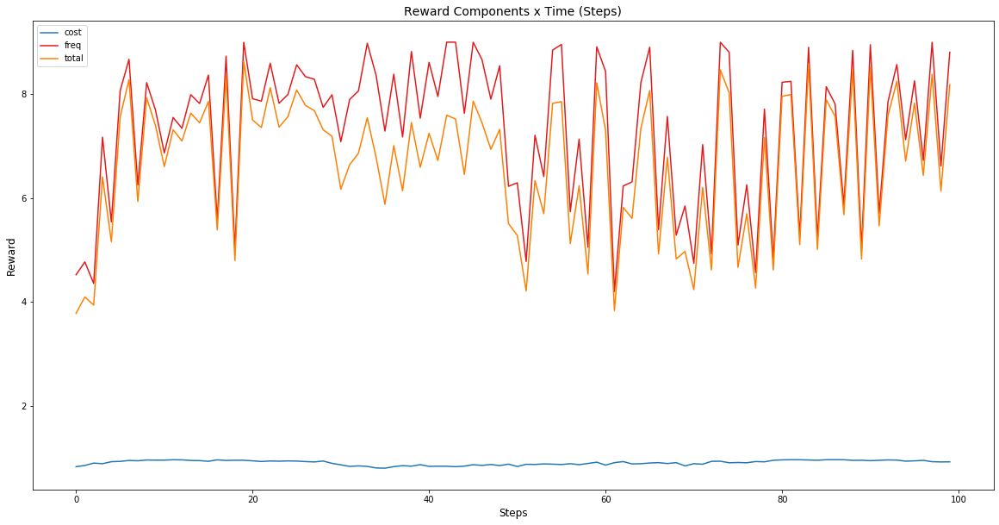

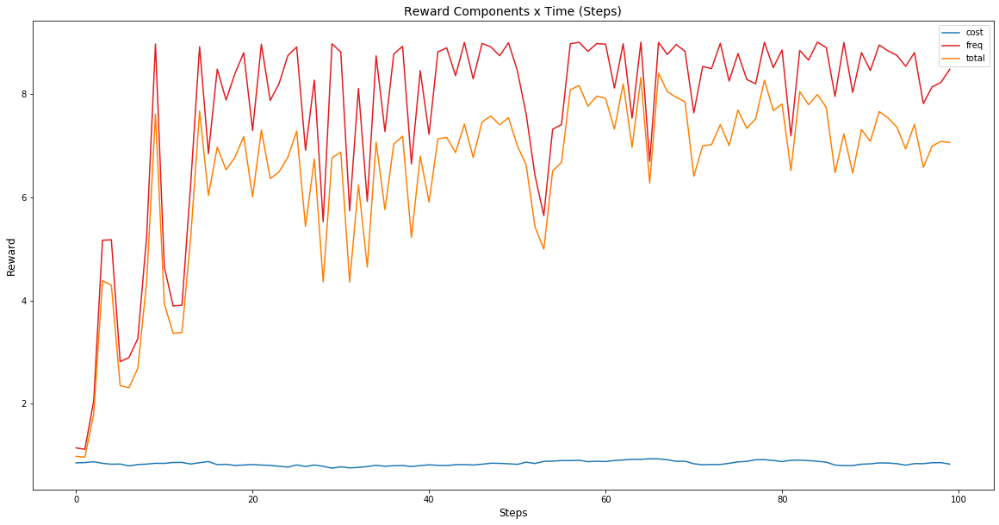

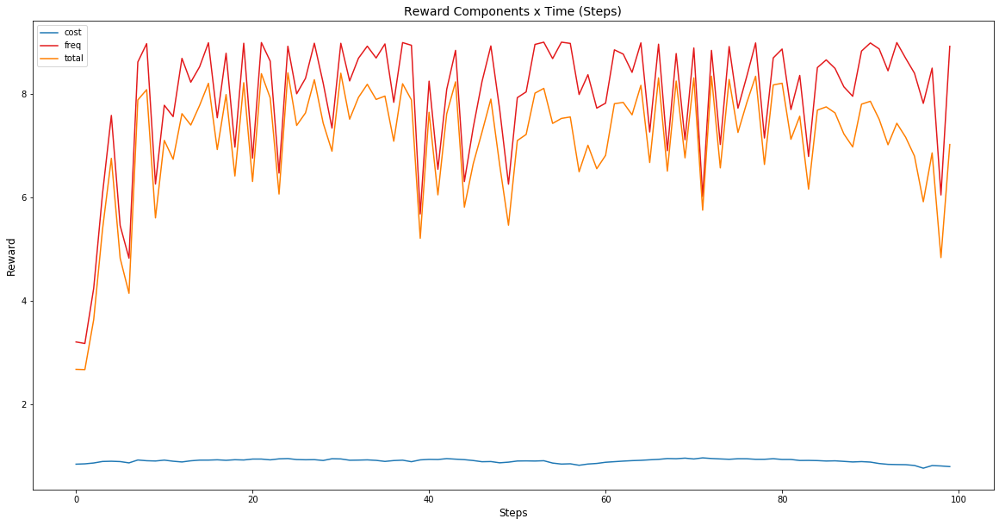

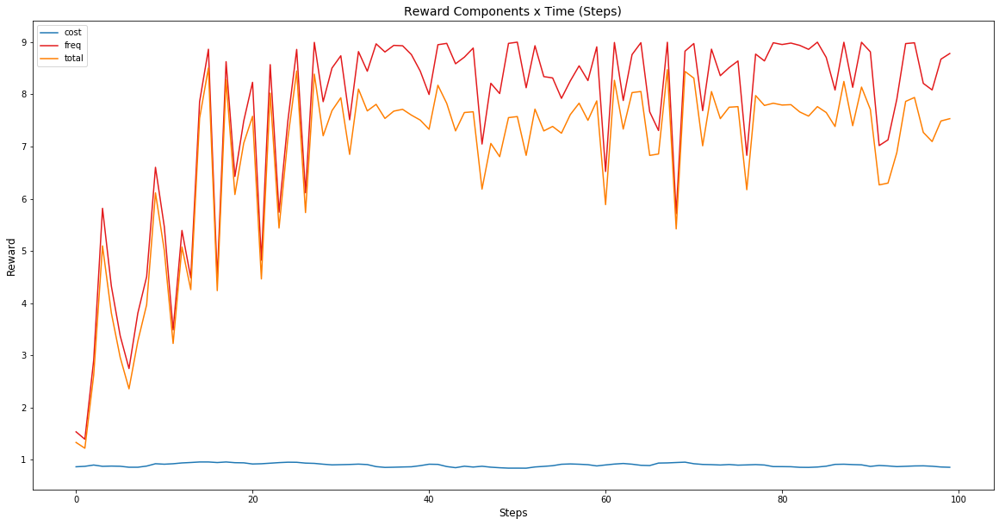

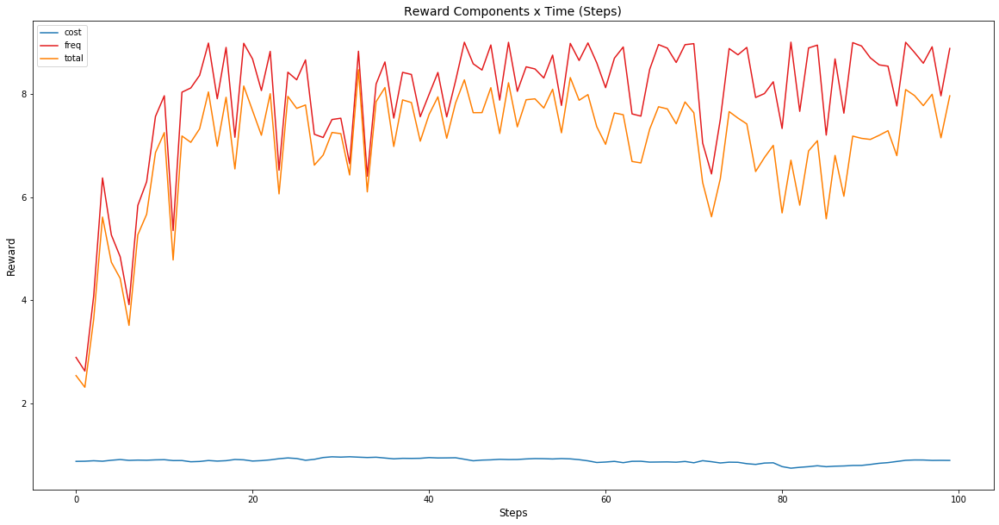

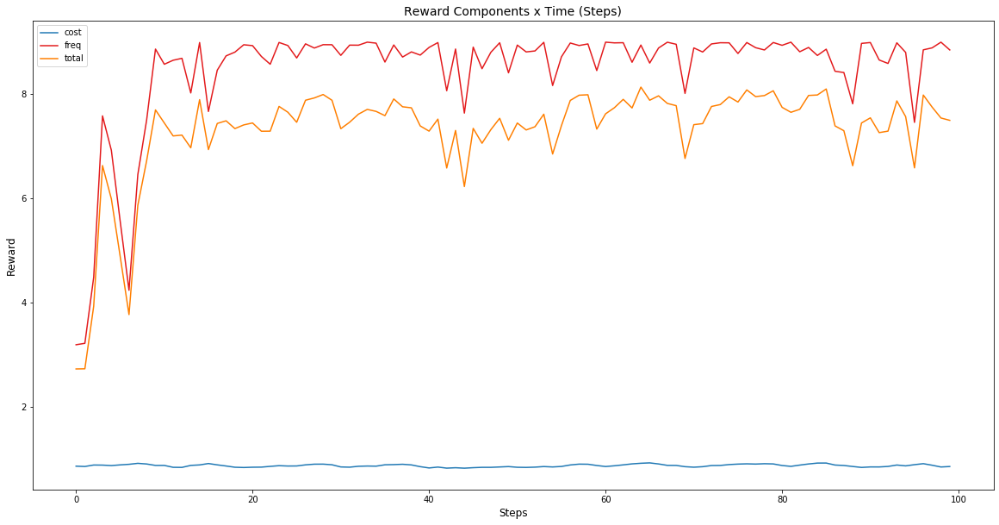

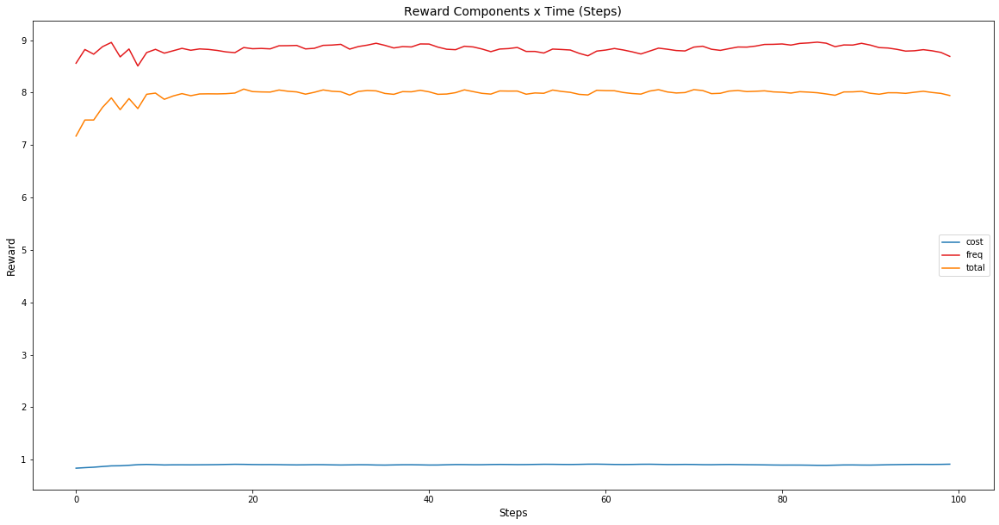

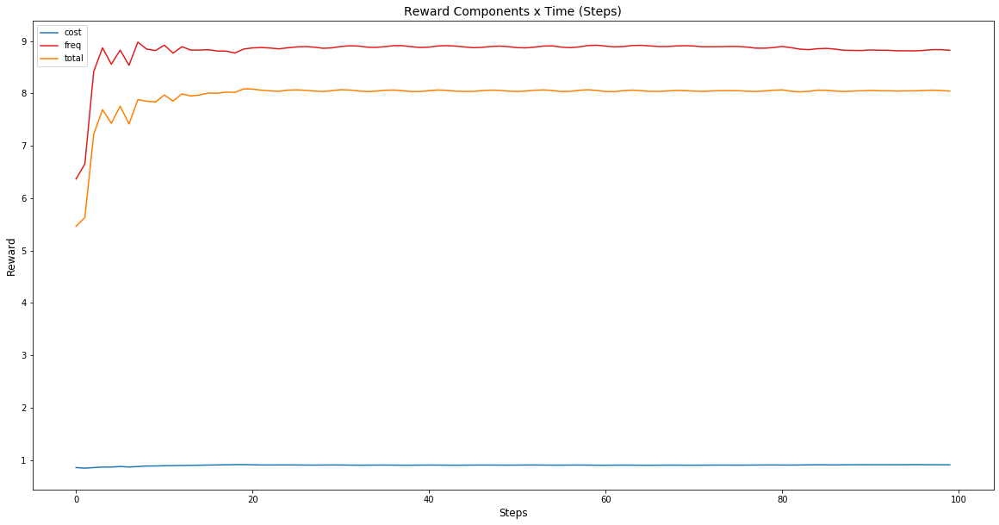

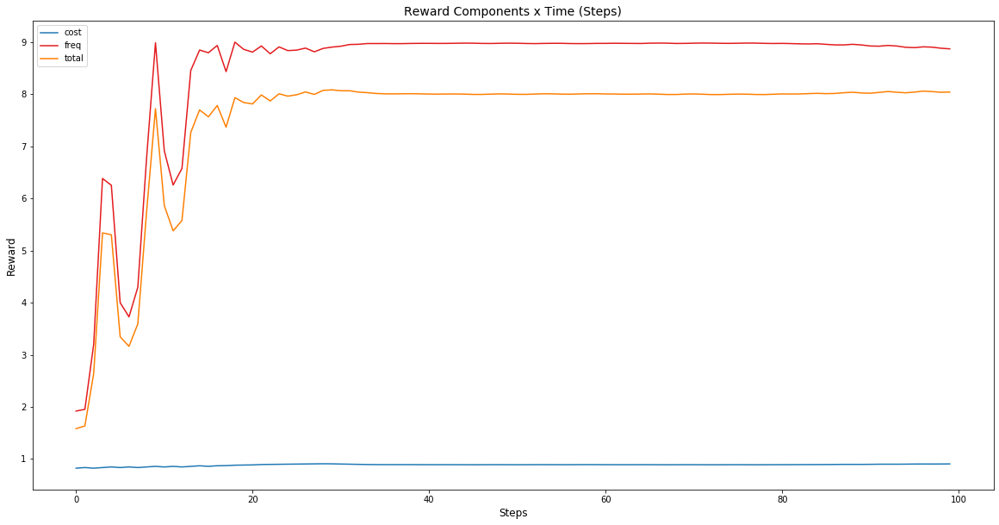

In [11]:
plotExperimentRewardProgression(LearningState().model.allRewards)

Plot the reward progression of the model testing

2338.0948201846413

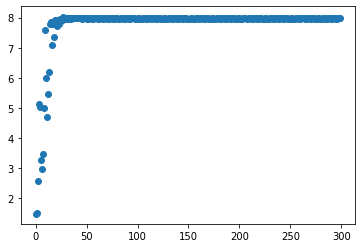

In [12]:
steps = range(STEPS_TO_TEST)
plt.scatter(steps, rewards)
sum(rewards)

Plot all graphs related to the electrical system state during the model testing

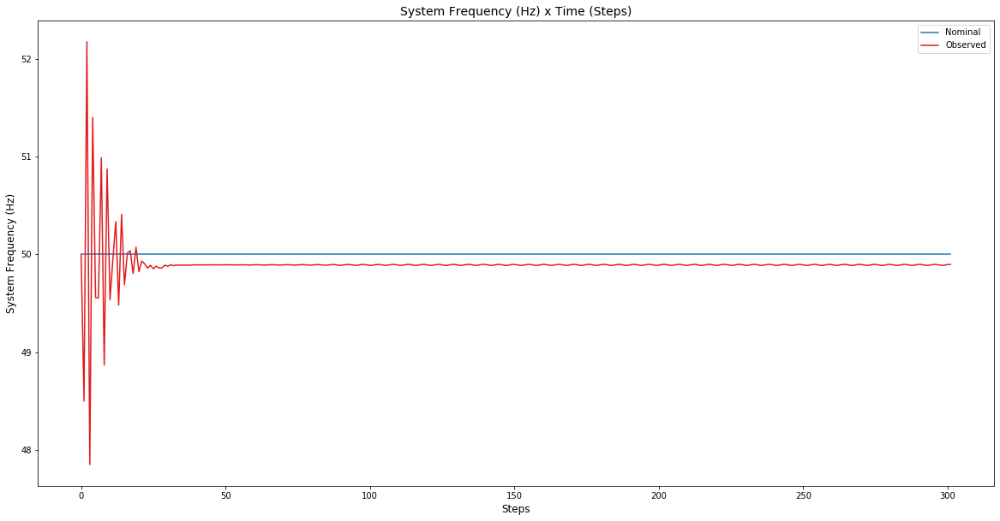

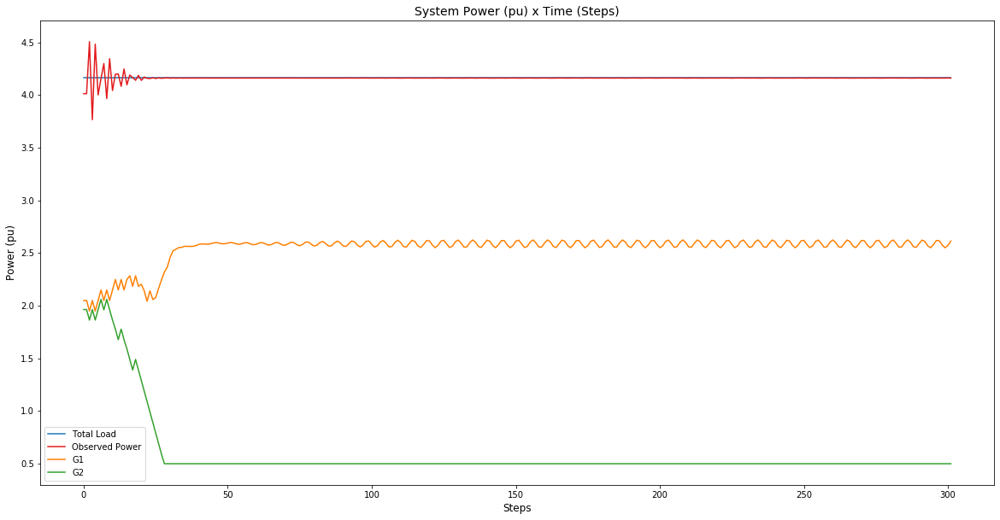

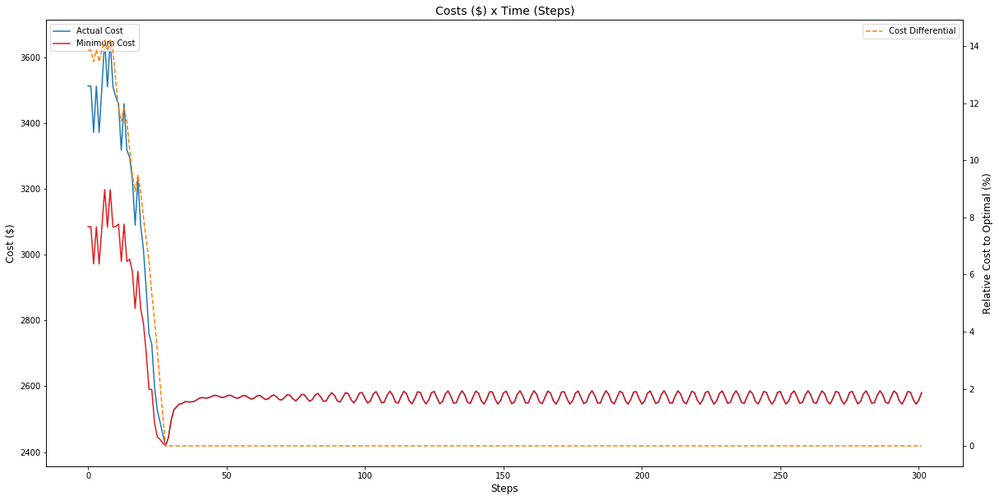

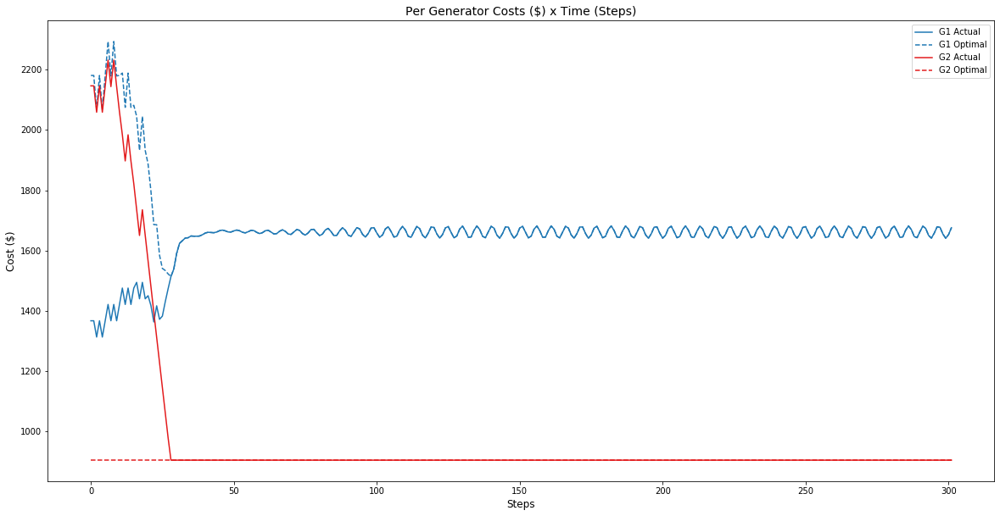

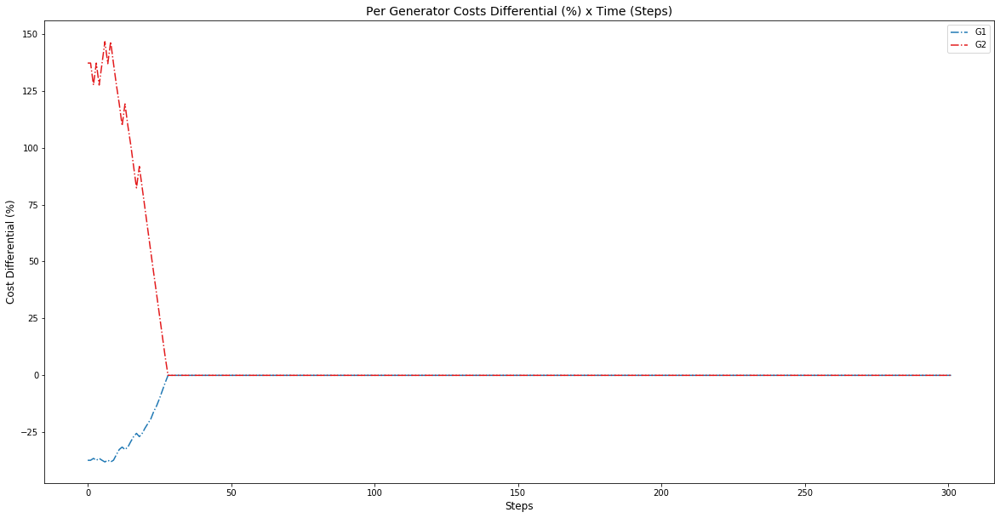

In [13]:
plotAll(electricalSystem.systemHistory)

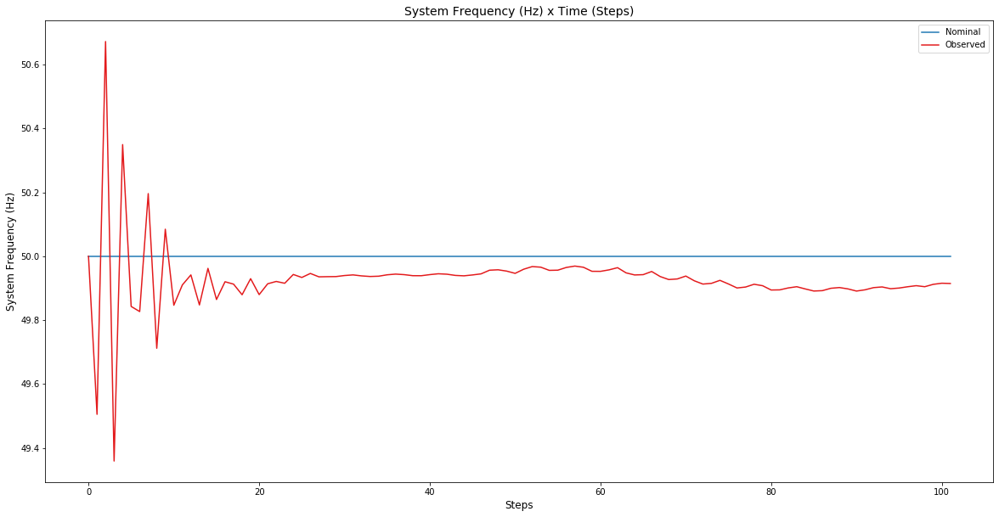

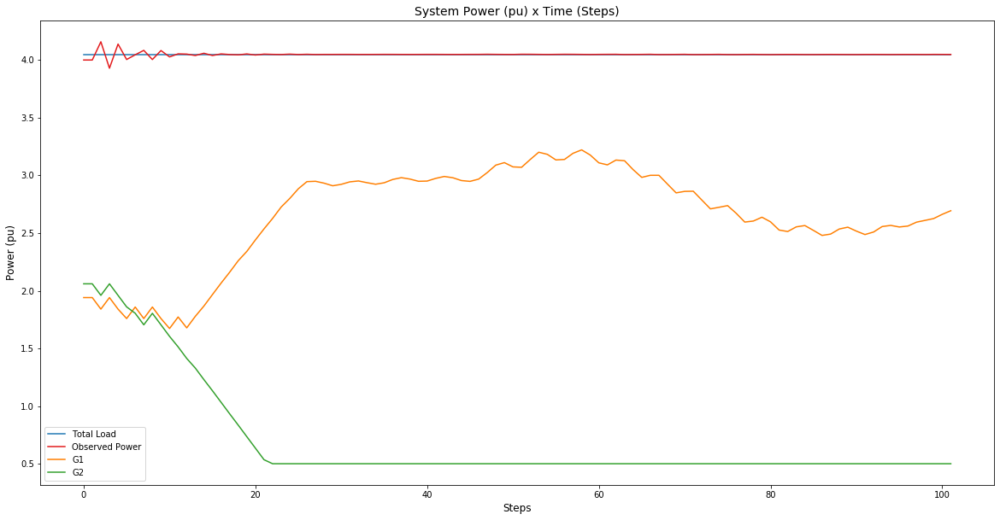

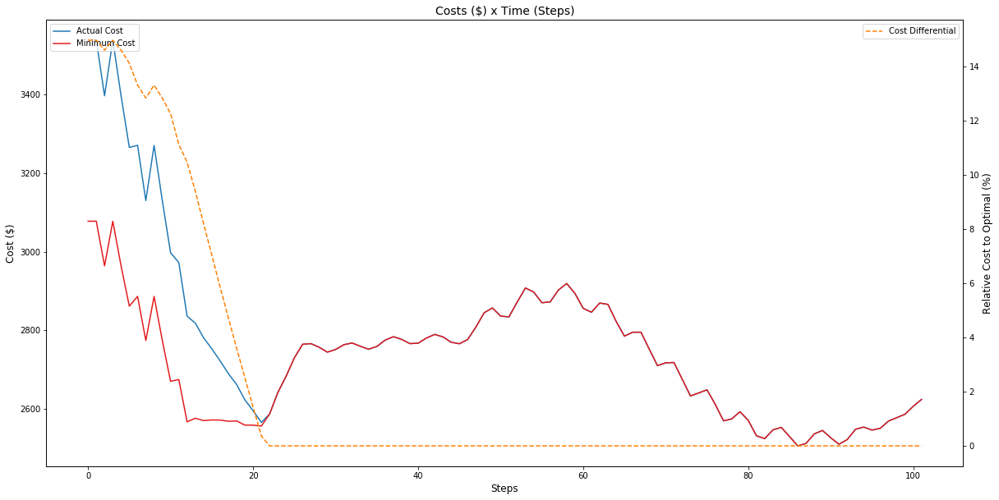

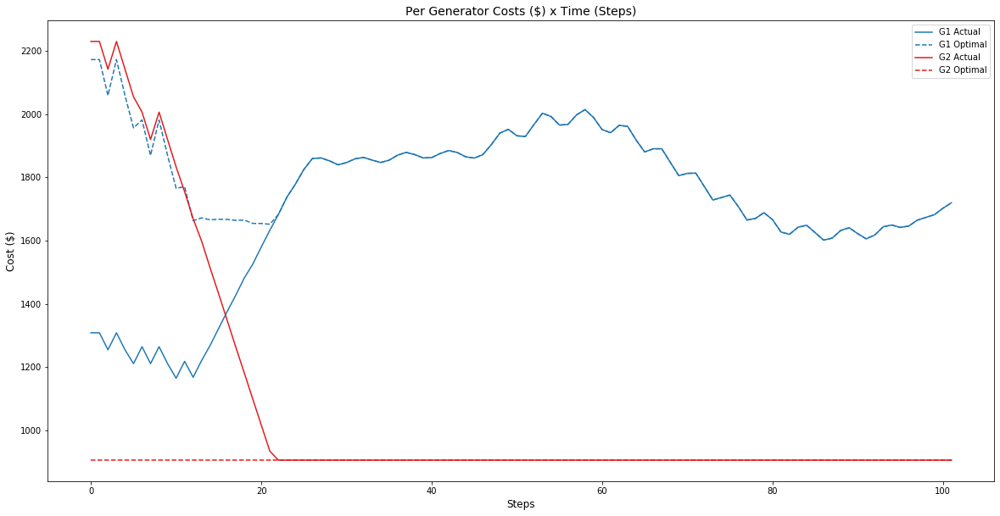

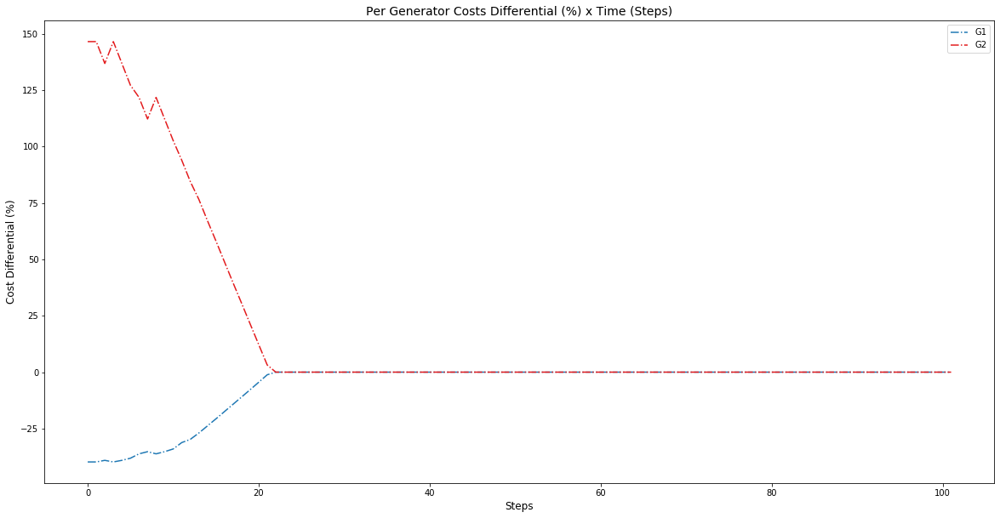

In [14]:
# # Show the last episode ran during training
from learning.learning_state import LearningState
plotAll(LearningState().episode.electricalSystem.systemHistory)

In [15]:
from learning.learning_state import LearningState
import numpy as np

rewList = LearningState().model.cummRewardList

In [16]:
LearningState().model.allRewards

[[{'cost': 0.8357891077479755,
   'freq': 4.526592775665,
   'total': 3.783276937111482},
  {'cost': 0.8588305083757792,
   'freq': 4.7736161203909395,
   'total': 4.099727159466165},
  {'cost': 0.9049816496955508,
   'freq': 4.358297406779663,
   'total': 3.9441791770513004},
  {'cost': 0.8934318528499311,
   'freq': 7.171741272416002,
   'total': 6.407462093174951},
  {'cost': 0.9314188359093275,
   'freq': 5.543648569210801,
   'total': 5.163458697024733},
  {'cost': 0.9379009164208579,
   'freq': 8.066630219829301,
   'total': 7.5656998756060885},
  {'cost': 0.9548473837956919,
   'freq': 8.67040589175513,
   'total': 8.27891438218914},
  {'cost': 0.9494382421552522,
   'freq': 6.2512406578457425,
   'total': 5.935166941474504},
  {'cost': 0.9643567435889753,
   'freq': 8.222124991748046,
   'total': 7.929061682423677},
  {'cost': 0.9613819848953364,
   'freq': 7.69441579005939,
   'total': 7.397272724857315},
  {'cost': 0.9617447457795746,
   'freq': 6.869048997156186,
   'total':

TypeError: float() argument must be a string or a number, not 'dict'

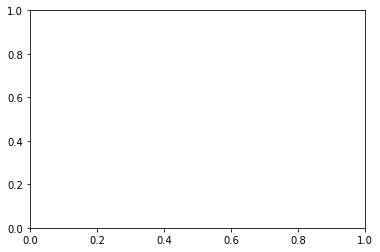

In [17]:
allRewards = LearningState().model.allRewards


for r in allRewards:
    plt.figure()
    plt.scatter(range(len(r)), r)
# sum(rewards)

In [ ]:
plt.scatter(range(len(rewList)), rewList)

In [ ]:
from plots.plot_constants import COLOR_PALETTE, FONT_SIZES

history = electricalSystem.systemHistory
# Get series to be plotted
stepsSeries = history.steps
loads = history.loads
totalLoadSeries = history.totalLoad
generators = history.generators
totalPowerSeries = history.totalPower

plt.figure(0)

# Declare colors to be used
colorTotalLoad = COLOR_PALETTE[0]
colorTotalPower = COLOR_PALETTE[1]
colorsIndividualNodes = COLOR_PALETTE[3:]

# Plot total power/load data
plt.plot(stepsSeries, totalLoadSeries, color=colorTotalLoad)
plt.plot(stepsSeries, totalPowerSeries, color=colorTotalPower)
legendFields = ['Total Load', 'Total Power']

# Multiple scenarios involve a single load, so we make it optional to plot that single load
if(False):
    for idx, loadId in enumerate(loads):
        # Since num loads is variable, colors may wrap around the palette
        loadColor = colorsIndividualNodes[idx % len(colorsIndividualNodes)]
        loadLegend = loadId
        loadSeries = loads[loadId]
        plt.plot(stepsSeries, loadSeries, color=loadColor, linestyle='--')
        legendFields.append(loadLegend)

for idx, generatorId in enumerate(generators):
    # Since num generators is variable, colors may wrap around the palette
    generatorColor = colorsIndividualNodes[idx % len(colorsIndividualNodes)]
    generatorLegend = generatorId
    generatorSeries = generators[generatorId]
    plt.plot(stepsSeries, generatorSeries, color=generatorColor)
    legendFields.append(generatorLegend)
    

summedPow = [x + y for x, y in zip(generators.get('G1'), generators.get('G2'))]
plt.plot(stepsSeries, summedPow, color=COLOR_PALETTE[2])
legendFields.append("Summed Pow")


plt.legend(legendFields)
plt.xlabel('Steps', fontsize=FONT_SIZES['AXIS_LABEL'])
plt.ylabel('Power (pu)', fontsize=FONT_SIZES['AXIS_LABEL'])

plt.title('System Power (pu) x Time (Steps)', fontsize=FONT_SIZES['TITLE'])

plt.show()